# Distance to sea / Distance to city center

In this section, we shall check the correlation between the distance to the sea and the distance to the city center with the food poisoning. This will give insight on the reasons for food poisoning.

In [1]:
%matplotlib inline
import warnings
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from requests import get
import seaborn as sns
# map functions
import os 
import folium
import rasterio as rio
import earthpy as et
from folium import plugins
from rasterio.warp import calculate_default_transform, reproject, Resampling
from IPython.display import IFrame

import folium
import folium.plugins as plugins

# to ignore the warnings and make the notebook more presentable
warnings.filterwarnings('ignore') 

import pandas as pd
import plotly.io as pio
import plotly.offline as py
import colorlover as cl

from plotly import graph_objects as go
from IPython.display import IFrame

# geometry
from shapely.geometry import Point, LineString
from shapely.geometry import Polygon
from shapely.geometry import Point

from pandas.io.json import json_normalize
pio.renderers.default = 'iframe'
from scipy import stats

import plotly.io as pio 
pio.renderers.deault = 'iframe'

Let's import the json file on the zip codes in Chicago:

In [7]:
import json
# 'Boundaries-ZIPCodes.geojson' taken from the internet
with open('data/Boundaries-ZIPCodes.geojson') as f:
    # load json file
    zip_info = json.load(f)

In [8]:
# data_zip contains the geometrical information
data_zip = json_normalize(zip_info['features'])

In [9]:
# display dataframe
data_zip

,type,properties.objectid,properties.shape_area,properties.shape_len,properties.zip,geometry.type,geometry.coordinates
0,Feature,33,106052287.488,42720.0444058,60647,MultiPolygon,"[[[[-87.67762151065281, 41.917757801062976], [..."
1,Feature,34,127476050.762,48103.7827213,60639,MultiPolygon,"[[[[-87.72683253163021, 41.9226462671259], [-8..."
2,Feature,35,45069038.4783,27288.6096123,60707,MultiPolygon,"[[[[-87.78500237831095, 41.909147854716764], [..."
3,Feature,36,70853834.3797,42527.9896789,60622,MultiPolygon,"[[[[-87.6670686895295, 41.888851884969924], [-..."
4,Feature,37,99039621.2518,47970.1401531,60651,MultiPolygon,"[[[[-87.70655631674127, 41.89555340699404], [-..."
...,...,...,...,...,...,...,...
56,Feature,57,155285532.005,53406.9156168,60623,MultiPolygon,"[[[[-87.69479284658739, 41.83007507753861], [-..."
57,Feature,58,211114779.439,58701.3253749,60629,MultiPolygon,"[[[[-87.6830596746508, 41.757859474901636], [-..."
58,Feature,59,211696050.967,58466.1602979,60620,MultiPolygon,"[[[[-87.62372919454222, 41.721670673836655], [..."
59,Feature,60,125424284.172,52377.8545408,60637,MultiPolygon,"[[[[-87.57691454500865, 41.79510541966706], [-..."


The geometry.coordinates is not accessible in this way. We shall modify it so that it becomes a list of coordonates. 

In [10]:
#polygons is a list of polygons
polygons = []
for l in range(data_zip.shape[0]):
    # polygon is a list of coordinates
    polygon = []
    # taking all the coordinates for a polygon
    for i in range(len(data_zip['geometry.coordinates'][l][0][0])):
        # add the i-th element to the polygon list
        polygon.append(data_zip['geometry.coordinates'][l][0][0][i])
    # adding a polygon to a list of polygons
    polygons.append(polygon)  
#create a new column with the correct writing
data_zip['polygon'] = polygons

In [11]:
data_zip

,type,properties.objectid,properties.shape_area,properties.shape_len,properties.zip,geometry.type,geometry.coordinates,polygon
0,Feature,33,106052287.488,42720.0444058,60647,MultiPolygon,"[[[[-87.67762151065281, 41.917757801062976], [...","[[-87.67762151065281, 41.917757801062976], [-8..."
1,Feature,34,127476050.762,48103.7827213,60639,MultiPolygon,"[[[[-87.72683253163021, 41.9226462671259], [-8...","[[-87.72683253163021, 41.9226462671259], [-87...."
2,Feature,35,45069038.4783,27288.6096123,60707,MultiPolygon,"[[[[-87.78500237831095, 41.909147854716764], [...","[[-87.78500237831095, 41.909147854716764], [-8..."
3,Feature,36,70853834.3797,42527.9896789,60622,MultiPolygon,"[[[[-87.6670686895295, 41.888851884969924], [-...","[[-87.6670686895295, 41.888851884969924], [-87..."
4,Feature,37,99039621.2518,47970.1401531,60651,MultiPolygon,"[[[[-87.70655631674127, 41.89555340699404], [-...","[[-87.70655631674127, 41.89555340699404], [-87..."
...,...,...,...,...,...,...,...,...
56,Feature,57,155285532.005,53406.9156168,60623,MultiPolygon,"[[[[-87.69479284658739, 41.83007507753861], [-...","[[-87.69479284658739, 41.83007507753861], [-87..."
57,Feature,58,211114779.439,58701.3253749,60629,MultiPolygon,"[[[[-87.6830596746508, 41.757859474901636], [-...","[[-87.6830596746508, 41.757859474901636], [-87..."
58,Feature,59,211696050.967,58466.1602979,60620,MultiPolygon,"[[[[-87.62372919454222, 41.721670673836655], [...","[[-87.62372919454222, 41.721670673836655], [-8..."
59,Feature,60,125424284.172,52377.8545408,60637,MultiPolygon,"[[[[-87.57691454500865, 41.79510541966706], [-...","[[-87.57691454500865, 41.79510541966706], [-87..."


Now let's import the dataframe with the violations.

In [12]:
# importing data
clean_data = pd.read_csv('data/clean_dataset.csv')

In [13]:
clean_data

,Unnamed: 0,inspection_id,dba_name,aka_name,license,facility_type,risk,address,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location
0,1,2352734,CHILI'S T-I,CHILI'S (T1-B14),34169.0,Restaurant,Risk 1 (High),11601 W TOUHY AVE,60666.0,2019-12-04,Canvass,Pass,10. ADEQUATE HANDWASHING SINKS PROPERLY SUPPLI...,42.008536,-87.914428,"{'latitude': '-87.91442843927047', 'longitude'..."
1,4,2352727,PORTAGE PARK DAY NURSERY,MOSAIC EARLY CHILDHOOD ACADEMY,2215815.0,Children's Services Facility,Risk 1 (High),5332-5334 W ADDISON ST,60641.0,2019-12-04,Canvass,Pass,NaN,41.946065,-87.760722,"{'latitude': '-87.76072227616888', 'longitude'..."
2,5,2352738,AMARIT RESTAURANT,AMARIT RESTAURANT,1801618.0,Restaurant,Risk 1 (High),600 S DEARBORN ST,60605.0,2019-12-04,Canvass Re-Inspection,Pass,NaN,41.874481,-87.629357,"{'latitude': '-87.62935653990546', 'longitude'..."
3,8,2352718,JAMIESON,JAMIESON PUBLIC SCHOOL,23931.0,School,Risk 1 (High),5650 N MOZART,60659.0,2019-12-04,Canvass,Pass,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN - Com...,41.984614,-87.700565,"{'latitude': '-87.70056525028134', 'longitude'..."
4,9,2352696,GATEWAY MONTESSORI SCHOOL,GATEWAY MONTESSORI,2506383.0,Children's Services Facility,Risk 1 (High),4041 N PULASKI RD,60641.0,2019-12-04,Canvass,Pass,NaN,41.954877,-87.727505,"{'latitude': '-87.72750513009342', 'longitude'..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134643,196814,134238,FUNSTON ANNEX ELEM. SCHOOL,FUNSTON (ANNEX) ELEM. SCHOOL,1964634.0,School,Risk 1 (High),3616 W ARMITAGE AVE,60647.0,2010-01-05,Canvass,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,41.917384,-87.717464,"{'latitude': '-87.71746411595915', 'longitude'..."
134644,196815,164254,POPEYES CHICKEN,POPEYES CHICKEN,1798522.0,Restaurant,Risk 1 (High),7250 S WESTERN AVE,60636.0,2010-01-05,Short Form Complaint,Pass,33. FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSI...,41.761369,-87.683297,"{'latitude': '-87.68329737623583', 'longitude'..."
134645,196816,70273,THE GREAT AMERICAN BAGEL,THE GREAT AMERICAN BAGEL (T3-H10),1879164.0,Restaurant,Risk 1 (High),11601 W TOUHY AVE,60666.0,2010-01-05,Canvass,Fail,"9. WATER SOURCE: SAFE, HOT & COLD UNDER CITY P...",42.008536,-87.914428,"{'latitude': '-87.91442843927047', 'longitude'..."
134646,196817,124256,FERNANDO'S MEXICAN GRILL & PIZZA,FERNANDO'S MEXICAN GRILL & PIZZA,1915768.0,Restaurant,Risk 1 (High),7148 N HARLEM AVE,60631.0,2010-01-05,Canvass,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,42.011357,-87.806788,"{'latitude': '-87.80678841267961', 'longitude'..."


An imaginary line is drawn between the 2 locations by the sea. This line will represente the border, so to calculate the distance to the sea, we shall calculate the shortest distance to this line.

In [14]:
dist_km = []
for i in range (clean_data.shape[0]):
    # first location by the sea
    x1 = (41.963779, -87.632323)
    # second location by the sea
    x2 = (41.894318, -87.605099)
    # latitude from dataframe
    lat = clean_data.latitude.values[i]
    # longitude from dataframe
    lon = clean_data.longitude.values[i]
    # coordinate
    p = (lat, lon)
    # point
    point = Point(p)
    # creation of the line
    line = LineString([Point(x1), Point(x2)])
    # add distance from point to line * 111, because 1 degree = 111 km 
    dist_km.append(point.distance(line)*111)
    # print values
    print('point:',p,', distance :',dist_km[-1])
# add column to dataframe
clean_data['distance_to_sea'] = dist_km

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.94606474495637, -87.76072227616888) , distance : 14.387316694333494
point: (41.87448116568133, -87.62935653990546) , distance : 3.478266496551276
point: (41.984613716529374, -87.70056525028136) , distance : 7.920058179687377
point: (41.954876648501966, -87.72750513009342) , distance : 10.61132699646731
point: (41.9096162504359, -87.6775884711046) , distance : 6.871841443389315
point: (41.9678382570795, -87.7716235051089) , distance : 15.468919653977803
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.87448116568133, -87.62935653990546) , distance : 3.478266496551276
point: (41.951605669573226, -87.80707904983576) , distance : 19.444927575550516
point: (41.964560982284496, -87.708203531794) , distance : 8.423186273538308
point: (41.97962822912449, -87.70892213604935) , distance : 8.682602567216442
point: (41.95313947805806, -87.76171933389246) , distance : 1

point: (41.917386311482865, -87.69658543262949) , distance : 8.520376706039393
point: (41.97150246368781, -87.77238727302219) , distance : 15.570753227293496
point: (41.74978604849285, -87.71519804312445) , distance : 20.167598615154773
point: (41.88153435491253, -87.65565021660242) , distance : 5.742058058774255
point: (41.959629403548185, -87.72802874412304) , distance : 10.633318337646555
point: (41.946153347247, -87.736155542106) , distance : 11.690287097486772
point: (41.977218504984606, -87.7125103842127) , distance : 9.024946371703505
point: (41.88685479208093, -87.6517677496529) , distance : 5.1253188386960336
point: (41.99803106929145, -87.68760322515347) , distance : 7.218506358431653
point: (41.90064069569674, -87.66727140888605) , distance : 6.169166349742523
point: (41.92364998324464, -87.63945496889549) , distance : 2.3624691626600507
point: (41.67776415975689, -87.63644728879238) , distance : 24.288027902464126
point: (41.943302925847824, -87.67135515305323) , distance :

point: (41.91756241889966, -87.7117551086784) , distance : 10.080967611890475
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.91025077942198, -87.68454945802267) , distance : 7.565529676200296
point: (41.87672216051081, -87.63471047025764) , distance : 3.8233864814759517
point: (41.96230610713585, -87.66595071583241) , distance : 3.736255194439785
point: (41.8644107471973, -87.6466915416751) , distance : 5.686389588791221
point: (41.923655741386966, -87.80190452135633) , distance : 19.343248765935932
point: (41.88451799637232, -87.64730383120977) , distance : 4.758642047237848
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.93206862646429, -87.71329441237397) , distance : 9.652480739604842
point: (41.92067663098194, -87.77563026904085) , distance : 16.611025787425902
point: (41.7943165619035, -87.61897923924498) , distance : 11.206574877060755
point: (41.872086352207226, -87.63371846834343) , distance

point: (41.92487124318117, -87.70243665907269) , distance : 8.821902984176186
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.94164943731001, -87.73222900844841) , distance : 11.358358364546753
point: (41.97036267439322, -87.71036214052708) , distance : 8.69311594516906
point: (41.92799528871574, -87.78575236468352) , distance : 17.48771232581461
point: (41.8644107471973, -87.6466915416751) , distance : 5.686389588791221
point: (41.925554231061724, -87.6494387080618) , distance : 3.3171170563257513
point: (41.92047844079207, -87.64873839963494) , distance : 3.450335836111522
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.97986093909706, -87.67420413029149) , distance : 4.979754737121322
point: (41.971969426617925, -87.67913613598749) , distance : 5.275189941160993
point: (41.917051966932796, -87.72689273615505) , distance : 11.666055233916518
point: (42.01189351273224, -87.78325952277642) , distance 

point: (41.91851166240564, -87.69039442990709) , distance : 7.834979983822118
point: (41.94497417145062, -87.64565975587642) , distance : 2.1399810901695164
point: (41.91073660901789, -87.66792445283261) , distance : 5.827724961180645
point: (41.81846434483413, -87.69688003750433) , distance : 13.216709846846852
point: (41.94478896093103, -87.76686561182167) , distance : 15.082255852660897
point: (41.91612432457932, -87.68611315997326) , distance : 7.489226357508414
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.85294274509769, -87.63337766110928) , distance : 5.562854888303542
point: (41.852052519797155, -87.63250528112087) , distance : 5.5914425897643945
point: (41.910205129391386, -87.68770229368916) , distance : 7.8932114013456625
point: (41.7360797687383, -87.65085877776569) , distance : 18.284127784861184
point: (41.92714756830267, -87.70403471284384) , distance : 8.894853702672641
point: (41.99740324090077, -87.65829455130033) , distan

point: (41.92487124318117, -87.70243665907269) , distance : 8.821902984176186
point: (41.97708994496324, -87.66003368701045) , distance : 3.412349121357417
point: (41.93194853574754, -87.70258032777781) , distance : 8.55008773590262
point: (41.94514408422124, -87.66339253518998) , distance : 3.965709161892434
point: (41.802124412289075, -87.6217500867489) , distance : 10.399056966526325
point: (41.92436282156778, -87.69725539567337) , distance : 8.307033981132085
point: (41.968111786580884, -87.72986788251534) , distance : 10.83815797067081
point: (41.917458568356686, -87.6851026411648) , distance : 7.330750370785755
point: (41.77811757474149, -87.7689120632848) , distance : 22.293392796638358
point: (41.926744718706814, -87.65078998020067) , distance : 3.4085453010424165
point: (41.9426161054227, -87.66374807835061) , distance : 4.104847836093342
point: (41.792163848654795, -87.78540566160221) , distance : 23.002982596586403
point: (41.96571901742301, -87.70853756167853) , distance : 

point: (41.87743070168073, -87.6571579846684) , distance : 6.0640965153991475
point: (41.96995886314596, -87.65984317819886) , distance : 3.1308118505306526
point: (41.852071127711035, -87.67556229949928) , distance : 9.119496002704658
point: (41.88451545836221, -87.64749730032112) , distance : 4.7787390907920395
point: (41.91726717672642, -87.72726399727458) , distance : 11.695706570225692
point: (41.739343208088016, -87.66300791918849) , distance : 18.363918985931765
point: (41.830791780461546, -87.65082245322775) , distance : 8.687985489157661
point: (41.92133238926864, -87.64847173462576) , distance : 3.3881882649816752
point: (41.917458568356686, -87.6851026411648) , distance : 7.330750370785755
point: (41.99647012267009, -87.7175038126524) , distance : 10.127483514553976
point: (41.89176977820589, -87.65860461424934) , distance : 5.632801382050961
point: (41.76000277235904, -87.64442750483087) , distance : 15.534969168533515
point: (41.778855337866396, -87.71712584709125) , dista

point: (41.9866294022939, -87.79402077531117) , distance : 18.126783086761364
point: (41.947085343828114, -87.65663783493278) , distance : 3.189008556286492
point: (41.74684499702, -87.58601627170704) , distance : 16.505978851382416
point: (41.93440298707838, -87.63680583708285) , distance : 1.6531462152624294
point: (41.92512768539323, -87.66204067083223) , distance : 4.636755496946765
point: (41.95355443840364, -87.74505531119503) , distance : 12.564648737202711
point: (41.988468090343, -87.65548501249852) , distance : 3.757690206887794
point: (41.9977637602161, -87.6997957219191) , distance : 8.38585138046153
point: (41.92222025546028, -87.66710345390526) , distance : 5.277737702981908
point: (41.802938714449844, -87.66467188277392) , distance : 12.108213661754617
point: (41.78629925284164, -87.72282652764042) , distance : 17.734945063490034
point: (41.93133655338099, -87.75299705381228) , distance : 13.870443636991727
point: (41.708040174736645, -87.68922181143849) , distance : 22.

point: (41.954432441416884, -87.66244625914061) , distance : 3.5009352464234467
point: (41.9765926405371, -87.66855724217827) , distance : 4.26608350727831
point: (41.93030153313704, -87.80632767489487) , distance : 19.66873885374856
point: (41.97345075964811, -87.65295403990811) , distance : 2.529199590557022
point: (41.874463423738476, -87.643815926751) , distance : 4.829717804220766
point: (41.94321903123653, -87.64459003405148) , distance : 2.1005209403808434
point: (41.86714939253236, -87.65404495354574) , distance : 6.213858520634473
point: (41.73583389580895, -87.66798786362106) , distance : 18.926141396214806
point: (41.88688930565886, -87.64882279182802) , distance : 4.819571516905143
point: (41.910622805831906, -87.67576194185493) , distance : 6.642306993285193
point: (41.754690905369436, -87.64550666368382) , distance : 16.134568730701034
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.94613254292922, -87.67333384874833) , distance 

point: (41.774244210348684, -87.70317482230865) , distance : 17.209146561562367
point: (41.692660628792865, -87.62594006085335) , distance : 22.503192143752667
point: (41.945108104331005, -87.65441181641037) , distance : 3.039045905351924
point: (41.93974461573449, -87.6685161010639) , distance : 4.713912017979107
point: (41.779128511311605, -87.70005354161087) , distance : 16.570252833127203
point: (41.681059555501896, -87.53936754137594) , distance : 24.770611575752188
point: (41.95866654787631, -87.653331779783) , distance : 2.4000294499333745
point: (41.94639766520745, -87.71732058369071) , distance : 9.629977731000531
point: (41.915854880451626, -87.6762179092616) , distance : 6.4775063337221965
point: (41.751049644162826, -87.68272735043797) , distance : 18.087204795628107
point: (41.95880408212383, -87.65342019040855) , distance : 2.4060162205786835
point: (41.77934936308415, -87.68492728907817) , distance : 15.536171301453866
point: (41.95353192936301, -87.72833818191091) , dis

point: (41.920245490488604, -87.66857296261334) , distance : 5.509592468561615
point: (41.95957509944307, -87.74764568707926) , distance : 12.809320614108717
point: (41.7506195104644, -87.6344092993733) , distance : 16.27895496442183
point: (41.79256531973131, -87.80140183966991) , distance : 24.542903947214295
point: (41.922731532421736, -87.6447528911125) , distance : 2.9471892587489568
point: (41.943312712450826, -87.67972196894466) , distance : 5.727468408139888
point: (41.91334246823247, -87.68182248081257) , distance : 7.158480136306048
point: (41.951064053085005, -87.65979512802838) , distance : 3.3541459221292524
point: (41.77895708746996, -87.71082664189547) , distance : 17.369451663453468
point: (41.758048258355096, -87.62945338890275) , distance : 15.36561527369664
point: (41.9977653535896, -87.69428406894725) , distance : 7.844367954505207
point: (41.96835849693989, -87.7068542288518) , distance : 8.288568425831105
point: (41.89319255965124, -87.62617281400281) , distance :

point: (41.87918309269135, -87.64742623446782) , distance : 4.987380001639194
point: (41.79595669469915, -87.70347960433394) , distance : 15.442046841838552
point: (41.963009878945854, -87.71740067919858) , distance : 9.444008276022998
point: (41.90452395740259, -87.66767409011774) , distance : 6.053491893490875
point: (41.976481667612425, -87.65483977716684) , distance : 2.86965167753138
point: (41.92392648360924, -87.77632683025247) , distance : 16.585244767193313
point: (41.85783609011153, -87.67100647272234) , distance : 8.36171532335988
point: (41.924663339079686, -87.72095974985143) , distance : 10.74460983495185
point: (41.88347312241303, -87.62772975002919) , distance : 2.785552058874933
point: (41.877791648104406, -87.63652434443534) , distance : 3.941160597643911
point: (41.99802474346836, -87.66556345762726) , distance : 5.2975021469257895
point: (41.96807497181902, -87.67901960462584) , distance : 5.205211538454491
point: (41.928357625188326, -87.71762470274635) , distance 

point: (41.94654251477401, -87.70247583120907) , distance : 8.01856205807202
point: (41.94183566648943, -87.6540188204789) , distance : 3.1309801286345293
point: (41.85221557746692, -87.68024387885436) , distance : 9.561067846086223
point: (41.951186412380856, -87.66882564060083) , distance : 4.286118121586673
point: (41.93856565739177, -87.75855584047643) , distance : 14.288611689617657
point: (41.96807497181902, -87.67901960462584) , distance : 5.205211538454491
point: (41.99148225930689, -87.7978116394828) , distance : 18.624847536804406
point: (41.9977653535896, -87.69428406894725) , distance : 7.844367954505207
point: (41.923884973566324, -87.80619241407982) , distance : 19.801014472908054
point: (41.92528006794063, -87.66677400880488) , distance : 5.119754452355161
point: (41.865931036719715, -87.621494195204) , distance : 3.638738657552556
point: (41.94364614899897, -87.65382313998201) , distance : 3.0374244996697533
point: (41.95979250151515, -87.72783183969106) , distance : 10

point: (41.902127532558154, -87.62850139922516) , distance : 2.102220479149175
point: (41.93786030231027, -87.78606939815405) , distance : 17.30665278395707
point: (41.961619344855826, -87.67383267401581) , distance : 4.613805692826112
point: (41.88425670381661, -87.64982670264364) , distance : 5.029954053531847
point: (41.76977201470989, -87.72267947406459) , distance : 19.01209034731833
point: (41.98222979264743, -87.69383949704255) , distance : 7.128854478390741
point: (41.99293750421518, -87.66021032628073) , distance : 4.478573296311952
point: (41.902222995753284, -87.76768777794882) , distance : 16.482697563433657
point: (41.95677163177934, -87.68075733672262) , distance : 5.432186429465671
point: (41.85785656751433, -87.66941959556328) , distance : 8.20692826022952
point: (41.91757216077945, -87.69985903100971) , distance : 8.851161979479526
point: (41.89148296872894, -87.74659826352844) , distance : 14.73820275474455
point: (41.80962869787754, -87.60736973785801) , distance : 9

point: (41.93660298534295, -87.74694610224888) , distance : 13.075871302605433
point: (41.83474332305238, -87.65091517105844) , distance : 8.34219734857334
point: (41.99767156727908, -87.69958491945799) , distance : 8.360350172062489
point: (41.93839141038951, -87.77211894533082) , distance : 15.771157199582577
point: (41.735585506398934, -87.67022566460537) , distance : 19.04466531409094
point: (41.794017543044355, -87.7741473714093) , distance : 21.81863998434949
point: (41.938511580891756, -87.7797480285989) , distance : 16.60278822906335
point: (41.769108080619134, -87.62170737185312) , distance : 14.020034675500984
point: (41.87939279810978, -87.64162617690116) , distance : 4.379925965072966
point: (42.008813688990735, -87.66635391877985) , distance : 6.26558045987077
point: (41.903311984082535, -87.67657337106594) , distance : 7.022286713849117
point: (41.822735079015686, -87.69448432322359) , distance : 12.711245141637306
point: (41.93720667186293, -87.6590215526174) , distance 

point: (41.92438086726451, -87.72620077208454) , distance : 11.297689482172439
point: (41.88695199839047, -87.62987459293427) , distance : 2.8588132054161823
point: (41.942077127035645, -87.68839242966847) , distance : 6.673631864963606
point: (41.948345864608, -87.6881554885054) , distance : 6.429811835371222
point: (41.90598597077873, -87.69680735572291) , distance : 9.00507765888546
point: (41.96390893734172, -87.63863624840039) , distance : 0.7009189820709455
point: (41.96817754475161, -87.74420786907501) , distance : 12.428813853990103
point: (41.86943380987853, -87.66264704407905) , distance : 6.959443558124163
point: (41.847573840855105, -87.68321583947979) , distance : 10.104815376767117
point: (41.799656205200755, -87.58873571085917) , distance : 10.663289181412535
point: (41.883252799966726, -87.64764601387161) , distance : 4.845251487427283
point: (41.954163104720365, -87.68573203361376) , distance : 6.023721910387152
point: (41.98220621897603, -87.69290712485866) , distance

point: (41.93841272966437, -87.77043454131244) , distance : 15.586805413021432
point: (41.910051749814784, -87.72131578011872) , distance : 11.373240517612532
point: (41.95953927581488, -87.68848380383307) , distance : 6.2515877470225085
point: (41.89559835844706, -87.69016094671238) , distance : 8.738944394294457
point: (41.74589127255891, -87.663178324629) , distance : 17.691777880077606
point: (41.90920757341338, -87.78920248073685) , distance : 18.437100693653676
point: (41.74810405559482, -87.64411513161957) , distance : 16.797632627778242
point: (41.80804727165029, -87.7041188222987) , distance : 14.577627835468439
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.88065941145893, -87.72219366885722) , distance : 12.654491299664619
point: (41.91392524724584, -87.70212764503852) , distance : 9.233330705478522
point: (41.799656205200755, -87.58873571085917) , distance : 10.663289181412535
point: (41.96766364582441, -87.768259022714) , distance

point: (41.95794014690388, -87.64965205979321) , distance : 2.0297785445883125
point: (41.92879375909132, -87.69737828315505) , distance : 8.140260599983064
point: (41.97533413581096, -87.69875687452328) , distance : 7.484874816959909
point: (41.93475136249262, -87.65378372646641) , distance : 3.3936309398921356
point: (41.883052886559646, -87.64468860442474) , distance : 4.547712709889625
point: (41.902393823105335, -87.62846892422813) , distance : 2.088078331838796
point: (41.951301458036795, -87.67693520727218) , distance : 5.141994089935447
point: (41.97533413581096, -87.69875687452328) , distance : 7.484874816959909
point: (41.88928159911069, -87.63349105058157) , distance : 3.1381998148329617
point: (41.745207799468396, -87.70241337651905) , distance : 19.764216200692942
point: (41.88167494824671, -87.64697413276842) , distance : 4.839725553912221
point: (41.86490457301147, -87.64598128375087) , distance : 5.5903801045524535
point: (41.94457213747173, -87.65371289840517) , distan

point: (41.81511207847913, -87.63130757563484) , distance : 9.260665167136272
point: (41.910051749814784, -87.72131578011872) , distance : 11.373240517612532
point: (41.91800028336311, -87.6530510992046) , distance : 3.996412469461929
point: (41.866497308125936, -87.70733778712558) , distance : 11.692826762462772
point: (41.677685065833224, -87.65901954921286) , distance : 24.779927441077504
point: (41.98218988461361, -87.66865162796087) , distance : 4.520753352412487
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.88553449994189, -87.63667609147453) , distance : 3.6191354923225116
point: (41.88438731876017, -87.62593564654169) , distance : 2.5621153327346584
point: (41.92857498112596, -87.6975783536939) , distance : 8.169798584484944
point: (41.89559835844706, -87.69016094671238) , distance : 8.738944394294457
point: (41.88814015241156, -87.6246957901013) , distance : 2.2754793941402274
point: (41.93919260225543, -87.71156588843112) , distance :

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.81391431134689, -87.7236649419466) , distance : 15.901553224029602
point: (41.922418971236404, -87.70729240611188) , distance : 9.423052874727016
point: (41.79484995804762, -87.76728035628868) , distance : 21.11822293273312
point: (41.80961441468273, -87.7235017087537) , distance : 16.159518160714107
point: (41.73638020184098, -87.62769923470611) , distance : 17.709672991180014
point: (41.87787173863181, -87.64450945964907) , distance : 4.7401858831091035
point: (41.71580477012765, -87.64320825324427) , distance : 20.261464721265728
point: (41.89591620643571, -87.68313819075146) , distance : 8.000296945844951
point: (41.81391431134689, -87.7236649419466) , distance : 15.901553224029602
point: (41.96835657757047, -87.70710947632557) , distance : 8.31683472632452
point: (42.01148252870015, -87.80678810992323) , distance : 20.076491547748063
point: (41.86490457301147, -87.64598128375087) , distance 

point: (41.85388797248053, -87.63450742813662) , distance : 5.549381440998079
point: (41.9441664817515, -87.66408481161898) , distance : 4.076850489088659
point: (41.82362189116429, -87.62627975645273) , distance : 8.191893438320255
point: (41.88563517079777, -87.62934689882326) , distance : 2.857615733827891
point: (41.89500136818066, -87.67717110170229) , distance : 7.420677810103104
point: (41.90962164348578, -87.62602011504099) , distance : 1.5422440143455125
point: (41.88928401352933, -87.62654854794113) , distance : 2.4206227261989177
point: (41.96679711200058, -87.7672994806274) , distance : 14.986134345248708
point: (41.786228994304736, -87.69781772828354) , distance : 15.807271344187452
point: (41.937346136201676, -87.80687335235086) , distance : 19.59598721750696
point: (41.778607156111505, -87.71888742431345) , distance : 18.01376621328187
point: (41.93609762657589, -87.66838426734495) , distance : 4.848007336218082
point: (41.74007573456715, -87.58512838435209) , distance :

point: (41.97442057406896, -87.6680665612121) , distance : 4.139638212706308
point: (41.89532082029217, -87.62562009892783) , distance : 2.0801529396037988
point: (41.77982679720496, -87.64690261797884) , distance : 13.529155208616737
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.65908283643143, -87.55699256526808) , distance : 26.651516360416903
point: (41.86943238157197, -87.66273255621277) , distance : 6.96821966173128
point: (41.8532702235994, -87.63424788717859) , distance : 5.5882493013961065
point: (41.91018381958202, -87.68972702379837) , distance : 8.103322133868398
point: (41.928454081408404, -87.74661563105579) , distance : 13.278613821674789
point: (41.984971746508776, -87.669709223002) , distance : 4.770239916130336
point: (41.92440234177882, -87.74231825957612) , distance : 12.968238995730408
point: (41.9706775856096, -87.76342894418006) , distance : 14.572891966204677
point: (41.9960984214, -87.7868769104594) , distance : 17.5

point: (41.9972784744174, -87.70940735717785) , distance : 9.329424807380558
point: (41.792246643231294, -87.79256979290605) , distance : 23.6937189961
point: (41.88539004666972, -87.61898671163952) , distance : 1.8325991932685608
point: (41.9691923029365, -87.72820341214991) , distance : 10.659674670475608
point: (41.997181776025826, -87.71623480380589) , distance : 10.025049212401848
point: (41.935870128734386, -87.64440559777034) , distance : 2.379124474821289
point: (41.76278384194664, -87.68333690607514) , distance : 16.987861786723112
point: (41.846538888991475, -87.70495285575998) , distance : 12.28727181475304
point: (41.869516550810474, -87.65733248797743) , distance : 6.4183048349886
point: (41.73276769817549, -87.60458211171219) , distance : 17.93217528873926
point: (41.99294605509157, -87.80026922618273) , distance : 18.921073151124215
point: (41.89330889220757, -87.66216684384945) , distance : 5.938602083413665
point: (41.876841710276615, -87.64257341005438) , distance : 4

point: (41.77982679720496, -87.64690261797884) , distance : 13.529155208616737
point: (41.85323834160758, -87.62397396447729) , distance : 5.018136312631468
point: (41.877611658237015, -87.67422786780573) , distance : 7.820869650689407
point: (41.92479105324667, -87.71042044390944) , distance : 9.650242600291703
point: (41.88197704758362, -87.63887583987513) , distance : 3.9905636488222878
point: (41.76278384194664, -87.68333690607514) , distance : 16.987861786723112
point: (41.787956263961306, -87.59233460920376) , distance : 11.890866161735605
point: (41.99058392710889, -87.69384756521113) , distance : 7.449229965195703
point: (41.773453388419924, -87.70315683459593) , distance : 17.275962853988318
point: (41.94800766308602, -87.6881477706743) , distance : 6.439090854713449
point: (41.924516573673394, -87.73327030448036) , distance : 12.022840578671872
point: (41.898948541729865, -87.62397498768969) , distance : 1.763198048480977
point: (41.94704228571703, -87.6732330040567) , distan

point: (41.89105285701879, -87.66962353874338) , distance : 6.800600823041654
point: (41.97290824123571, -87.74806177870752) , distance : 12.886907800416976
point: (41.78780006140453, -87.72315662236635) , distance : 17.649933157714173
point: (41.96123477031228, -87.68397223026997) , distance : 5.7400160602394115
point: (41.80802515275297, -87.72003743037237) , distance : 15.953638202360922
point: (41.924499560814866, -87.73465292886841) , distance : 12.166677890320772
point: (41.70712520995749, -87.61889408064705) , distance : 20.834745799708077
point: (41.809601483561785, -87.61674116665354) , distance : 9.491913815167214
point: (41.834330015257066, -87.62317380513748) , distance : 6.954357640672473
point: (41.866237768795344, -87.7106621287964) , distance : 12.046896430751737
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (42.011357386595954, -87.80678841267961) , distance : 20.072864807575108
point: (41.94731748901496, -87.65641794764645) , di

point: (41.91024030654857, -87.68526009627907) , distance : 7.639395437064862
point: (41.879277913880216, -87.64742929608973) , distance : 4.983855714535601
point: (41.78507649032044, -87.72279064865629) , distance : 17.824067278536983
point: (41.98582638690386, -87.66944490647181) , distance : 4.792479740478495
point: (41.881572495767934, -87.65305233593273) , distance : 5.472032822072144
point: (41.88170932781564, -87.65806721526003) , distance : 5.984757793213272
point: (41.94286931882837, -87.65286280377227) , distance : 2.96964286085346
point: (41.758991485836, -87.57905882688776) , distance : 15.296813325345308
point: (41.88546712445001, -87.65228391732384) , distance : 5.234869565562614
point: (41.983952200630576, -87.66900616354508) , distance : 4.646927883281699
point: (41.89483554678372, -87.75574125380165) , distance : 15.547298663958259
point: (41.90811537393747, -87.66776383350285) , distance : 5.917297657400778
point: (41.90377044758285, -87.6669045724279) , distance : 6.

point: (41.88807942610461, -87.62404736976373) , distance : 2.2109274945708246
point: (41.89489780458396, -87.7698431066468) , distance : 17.002145834716075
point: (41.869243925932324, -87.66072004882703) , distance : 6.7722829865608585
point: (41.90976452703277, -87.74337629570627) , distance : 13.664738545476327
point: (41.85627966980036, -87.62374906633188) , distance : 4.702444667894102
point: (41.77240524117657, -87.64310796196669) , distance : 14.1747486563905
point: (41.97112552121299, -87.65957990461612) , distance : 3.1334854172098217
point: (41.865860303972006, -87.63934992374816) , distance : 4.942886510247984
point: (41.96126564609312, -87.6843909451717) , distance : 5.786271325383897
point: (41.89857770509812, -87.62839827393353) , distance : 2.2353472014961477
point: (41.89496867324732, -87.62939917872845) , distance : 2.4849689737309046
point: (41.946153129908645, -87.65550002801628) , distance : 3.1091797995327437
point: (41.89119527078575, -87.65688615805685) , distanc

point: (41.85807383601942, -87.65579980518957) , distance : 6.917901747465515
point: (41.90144444659322, -87.63373911746031) , distance : 2.671185382906647
point: (41.89595603957177, -87.6808420300601) , distance : 7.761384691499962
point: (41.73637382027632, -87.62723156456728) , distance : 17.703095680489962
point: (41.85281839386875, -87.63186166579212) , distance : 5.481262259586985
point: (41.93838369187664, -87.7887923608626) , distance : 17.595367139222795
point: (41.69256158476296, -87.62090080358453) , distance : 22.46354477292998
point: (41.93916082956911, -87.80664110583345) , distance : 19.54131476960556
point: (41.894186697100224, -87.62799202224045) , distance : 2.3712187197018455
point: (41.8835537007592, -87.64872613453178) , distance : 4.944689683531721
point: (41.94634047438016, -87.65599520228523) , distance : 3.1527657271556135
point: (41.92469107502236, -87.7188292868979) , distance : 10.523311756914076
point: (41.91494584241689, -87.68966296727474) , distance : 7.

point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.79069209673198, -87.60479457815964) , distance : 11.502524896299098
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.91720372277074, -87.71205205718034) , distance : 10.12618486583287
point: (41.857713873985894, -87.66454238198166) , distance : 7.74886357310894
point: (41.902311915686454, -87.62849738136275) , distance : 2.0943368867644545
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.78507649032044, -87.72279064865629) , distance : 17.824067278536983
point: (41.866894192891046, -87.6960598820348) , distance : 10.511225678053464
point: (41.94912883486111, -87.65588747171282) , distance : 3.028690818974786
point: (41.885431670610096, -87.626119285512) , distance : 2.5331825865124356
point: (41.95117555641557, -87.65954180248545) , distance : 3.323449365383001
point: (41.98967016739997, -87.81887319693584) , distan

point: (41.869436666300544, -87.66247601980271) , distance : 6.9418970198511625
point: (41.94537989344811, -87.65522014489369) , distance : 3.111574646447977
point: (41.94599352274732, -87.65537113546681) , distance : 3.102324103333271
point: (41.96334428277336, -87.65632107154394) , distance : 2.6642229547407443
point: (41.997614065860645, -87.70281474950835) , distance : 8.679247810882394
point: (41.78727696375553, -87.62413800317614) , distance : 12.068036738432854
point: (41.836749960757935, -87.72613265682901) , distance : 14.876992237310674
point: (41.750930698375846, -87.61942809693257) , distance : 15.99526610858023
point: (41.866617682133004, -87.6961280297636) , distance : 10.52946842193306
point: (41.95399669451661, -87.71937320043452) , distance : 9.723391490258017
point: (41.925847547256716, -87.70191910956856) , distance : 8.72887156197488
point: (41.920414405087854, -87.63750857983156) , distance : 2.292373563649052
point: (41.76869208970072, -87.72265418825606) , distan

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.778647086061646, -87.73304626375042) , distance : 19.145573532691966
point: (41.869086176523, -87.72140543532703) , distance : 13.041799700792316
point: (42.002223375062094, -87.68012882798132) , distance : 6.809438068888102
point: (41.93020734457177, -87.7095475155962) , distance : 9.340644373676001
point: (41.75009417468001, -87.67535799869749) , distance : 17.80740265939111
point: (41.77834275537951, -87.74034531119362) , distance : 19.776020569245922
point: (41.93150296018673, -87.7569254461243) , distance : 14.287348227398667
point: (41.817561384909936, -87.68701507432718) , distance : 12.460619524010887
point: (41.85311887099822, -87.62694504272446) , distance : 5.176240535053626
point: (41.910671665924546, -87.67251693297649) , distance : 6.304969520892656
point: (41.75185560246703, -87.54825033733894) , distan

point: (41.993263883492496, -87.65563353046953) , distance : 4.1720929403040286
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.69168074856247, -87.70051617452316) , distance : 24.861594767413337
point: (41.72235444829322, -87.57577806414749) , distance : 19.363433932164277
point: (41.736217960782156, -87.62931043653778) , distance : 17.753691325302096
point: (42.00174201826304, -87.67841912356384) , distance : 6.628515691965626
point: (41.911971230797036, -87.67735193570363) , distance : 6.752008965597585
point: (41.935452917475686, -87.64686341693728) , distance : 2.6500290178956973
point: (41.83827010545886, -87.63746078062489) , distance : 7.183896784384848
point: (41.8911397362657, -87.6188063715662) , distance : 1.5453351325659368
point: (41.758886518008644, -87.56565795329746) , distance : 15.657407749313698
point: (41.99257145211282, -87.66049389721277) , distance : 4.47125408644476
point: (41.89020779260571, -87.63094084169998) , dist

point: (41.90692620907176, -87.63472978194264) , distance : 2.5515299783824275
point: (41.91915177953893, -87.69739506305046) , distance : 8.532539146494189
point: (41.751883323857825, -87.56299535958055) , distance : 16.486528304237453
point: (41.89639200221643, -87.64088718583142) , distance : 3.6145562349580223
point: (41.8136943496658, -87.70378008300665) , distance : 14.14460989535455
point: (41.76824397196663, -87.6831938009329) , distance : 16.461512746370055
point: (41.891142380322094, -87.66187790188157) , distance : 5.996494783240461
point: (41.96115263014593, -87.68853134020405) , distance : 6.245932941143192
point: (41.909352603305415, -87.75879995189008) , distance : 15.275395220416971
point: (41.816698249197756, -87.70022697053886) , distance : 13.62823107214389
point: (41.84944168775224, -87.63179107433243) , distance : 5.795805485206485
point: (42.00565705992212, -87.6603785594428) , distance : 5.595199757837766
point: (41.96867904377803, -87.69403009829216) , distance 

point: (41.85201042801985, -87.63214186708235) , distance : 5.573534611732763
point: (41.797020247873114, -87.75318349526471) , distance : 19.667956631268428
point: (41.836996856079175, -87.7229859142931) , distance : 14.55033375747908
point: (41.852023150198406, -87.63184844304722) , distance : 5.554867461183755
point: (41.886614909505795, -87.6189649643638) , distance : 1.7606803446566819
point: (41.945191110996866, -87.80499730288055) , distance : 19.277579507727154
point: (41.879272838776735, -87.63410319837826) , distance : 3.626831196227484
point: (41.938973511509296, -87.72806827756924) , distance : 10.978607299783093
point: (41.910117944887425, -87.63149089141778) , distance : 2.087523925381982
point: (41.998120418761175, -87.67412771972113) , distance : 6.005261710555053
point: (41.89239475098296, -87.62641533543558) , distance : 2.280856617722231
point: (41.93020734457177, -87.7095475155962) , distance : 9.340644373676001
point: (41.89342614670785, -87.62536202456768) , dista

point: (41.79127248085304, -87.60388726366043) , distance : 11.438843422513925
point: (41.860248190286214, -87.69528799858925) , distance : 10.700648276272336
point: (41.860248190286214, -87.69528799858925) , distance : 10.700648276272336
point: (41.87884868861425, -87.67740650126737) , distance : 8.099263030671738
point: (41.97894282656594, -87.69250176530953) , distance : 6.888643750894879
point: (41.92738885343592, -87.70442805668638) , distance : 8.925731027318463
point: (41.92372832371481, -87.7927766138739) , distance : 18.35680228069058
point: (41.82244969408215, -87.70434136569052) , distance : 13.601056311723053
point: (41.80452511221081, -87.72363360473793) , distance : 16.50626925442982
point: (41.93597777175415, -87.66328492986462) , distance : 4.325866304352489
point: (41.96848268957195, -87.6914089058082) , distance : 6.579284677348048
point: (41.94274719516372, -87.68835432149632) , distance : 6.643186143892405
point: (41.851540996134474, -87.63183605739881) , distance :

point: (41.978066283346095, -87.66849574710783) , distance : 4.317021182546478
point: (41.86936686765321, -87.65307781491383) , distance : 6.002756115006923
point: (41.84417341797287, -87.72216918093443) , distance : 14.136670979878993
point: (41.7995820117793, -87.59510894342812) , distance : 10.574000464557473
point: (41.95213643037515, -87.74742887301954) , distance : 12.841942755755586
point: (41.85694145539675, -87.72505491415859) , distance : 13.910875363079855
point: (41.88917219233801, -87.6371099271468) , distance : 3.5166274040721466
point: (41.87016705935397, -87.70628936640078) , distance : 11.435834999556796
point: (41.96121114673596, -87.6885330035513) , distance : 6.2458175823603925
point: (41.95958202440171, -87.68239844007711) , distance : 5.57786243809906
point: (41.79599727119474, -87.64534767387217) , distance : 11.792631569087758
point: (41.92161984057171, -87.65405058579167) , distance : 3.9530966513523276
point: (42.008536400868735, -87.91442843927048) , distance

point: (41.84039653671148, -87.73067501245994) , distance : 15.169626926065629
point: (41.98765562647958, -87.66004572780321) , distance : 4.0612091212997266
point: (41.900524957170965, -87.69943295362471) , distance : 9.49761858694644
point: (41.985318072504356, -87.82981837555995) , distance : 22.05197501589824
point: (41.89180548348842, -87.6260893784433) , distance : 2.271038331136755
point: (41.95312810286122, -87.7788254781443) , distance : 16.304693883450355
point: (41.851642886500784, -87.7064081112397) , distance : 12.202278685387848
point: (41.94004450704706, -87.65253926108572) , distance : 3.0506238840266042
point: (41.924025936997715, -87.75410892303567) , distance : 14.220186158813625
point: (41.84408262179055, -87.72898370665669) , distance : 14.838758729302027
point: (41.89578616153153, -87.69342745531496) , distance : 9.068917830797192
point: (41.983542609997954, -87.6584291450252) , distance : 3.6345188317098454
point: (41.84432191601632, -87.7112736592086) , distance

point: (41.8098507303421, -87.70389681671357) , distance : 14.428176167902857
point: (41.816913260069974, -87.60729731503798) , distance : 8.595390450170902
point: (41.70721035847279, -87.62835881151437) , distance : 20.92881035211751
point: (41.979707516392786, -87.66010745966604) , distance : 3.5549365284671506
point: (41.95189755386888, -87.71631400456782) , distance : 9.415821653934655
point: (41.89342614670785, -87.62536202456768) , distance : 2.1302249821296995
point: (41.922023528468685, -87.6974772536803) , distance : 8.42471420410378
point: (41.88065414962345, -87.72273803344112) , distance : 12.710962284619105
point: (41.76450917257481, -87.5647393923283) , distance : 15.08915464866859
point: (41.887402155077424, -87.70708560385715) , distance : 10.820022430898018
point: (41.91027800617339, -87.70294853106684) , distance : 9.465895922205522
point: (41.92375020104243, -87.78988085962635) , distance : 18.04451174558279
point: (41.886694736196496, -87.64503360250157) , distance 

point: (41.880769739053655, -87.7311560969275) , distance : 13.57625286293231
point: (41.88935425192819, -87.62410245624348) , distance : 2.164984162041942
point: (41.765990001140594, -87.57378733665415) , distance : 14.662295649227175
point: (41.765990001140594, -87.57378733665415) , distance : 14.662295649227175
point: (41.77899473635989, -87.69421036159838) , distance : 16.17719419086615
point: (41.968273757691634, -87.71503900705481) , distance : 9.195022305170658
point: (41.876543846685756, -87.64847222242668) , distance : 5.202996326868552
point: (41.91094876256121, -87.65315955127153) , distance : 4.293239495113555
point: (41.964997092897626, -87.68601381879759) , distance : 5.961214436407872
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.91753133022203, -87.70461978939348) , distance : 9.344820739666032
point: (41.96843119253594, -87.69752623986342) , distance : 7.255958340373057
point: (41.98498821695519, -87.76815296231939) , distance

point: (41.95396210439125, -87.74845316389185) , distance : 12.936423272886804
point: (41.686249266443774, -87.64204217300293) , distance : 23.456849214491264
point: (41.85193447241584, -87.70113231549328) , distance : 11.65170182646519
point: (41.88568794689097, -87.65246444630944) , distance : 5.244582176840576
point: (41.93919446649004, -87.7114162565971) , distance : 9.193683487897346
point: (41.922023528468685, -87.6974772536803) , distance : 8.42471420410378
point: (41.895570010057476, -87.71637706926153) , distance : 11.449421828771357
point: (41.948168634367825, -87.65746305156428) , distance : 3.2304130874381265
point: (41.92491819948442, -87.76617144106139) , distance : 15.470695229999015
point: (41.77899473635989, -87.69421036159838) , distance : 16.17719419086615
point: (41.92381303714375, -87.69724202060381) , distance : 8.327920514107484
point: (41.84628775247759, -87.70156191989919) , distance : 11.961247718349112
point: (41.953027775264935, -87.78643958616934) , distanc

point: (41.96757484163005, -87.77493763409912) , distance : 15.835830579558223
point: (41.789112548016774, -87.70357972660757) , distance : 15.995805054053882
point: (41.95304195595626, -87.7853004907991) , distance : 17.022274996209042
point: (41.855363885442415, -87.66593319157185) , distance : 8.018335992807923
point: (41.922842576706046, -87.69748748180638) , distance : 8.392596027449747
point: (41.791761831643065, -87.5966116676222) , distance : 11.422651020805322
point: (41.79517060450029, -87.59710020185206) , distance : 11.041117499557064
point: (41.713629854242846, -87.66754400022322) , distance : 21.22033890697583
point: (42.01935178900447, -87.6821156230395) , distance : 8.282444973716766
point: (41.713018900513134, -87.66710874351575) , distance : 21.268762040241715
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.85045102427, -87.65879785567869) , distance : 7.696614384319315
point: (41.677565550357954, -87.65638236856995) , distan

point: (41.983275999591044, -87.68992858007627) , distance : 6.750530363996689
point: (41.9691282820749, -87.66000688672831) , distance : 3.1297520378824863
point: (41.99034171783494, -87.69770066465212) , distance : 7.833027858450265
point: (41.965029620452384, -87.65253949486662) , distance : 2.2483205942207
point: (41.79617424542868, -87.76257752982983) , distance : 20.59691184528761
point: (41.96861920394832, -87.68113124664892) , distance : 5.444289766334522
point: (41.92150107411661, -87.66481662020217) , distance : 5.0705329238516645
point: (41.75204739800112, -87.7026077841844) , distance : 19.145130948147298
point: (41.84781152069733, -87.68292967306402) , distance : 10.064013370360417
point: (41.79363271480081, -87.80143327210808) , distance : 24.491709960116726
point: (41.88568794689097, -87.65246444630944) , distance : 5.244582176840576
point: (41.84448352707084, -87.71558453559561) , distance : 13.453698331304295
point: (42.00969798048885, -87.67427432484828) , distance : 

point: (41.94673756514075, -87.78153387001205) , distance : 16.670076761377324
point: (41.9846184303652, -87.76815926802584) , distance : 15.25423272882977
point: (41.88167475683708, -87.63250418895821) , distance : 3.35009691853355
point: (41.97055818444942, -87.65640263623298) , distance : 2.776744866295706
point: (41.95384601711714, -87.70204328887883) , distance : 7.817097930313158
point: (41.930751911450216, -87.64909233354551) , distance : 3.070790760096697
point: (41.677565550357954, -87.65638236856995) , distance : 24.72376642185589
point: (42.019345944948185, -87.66686650286474) , distance : 7.262606208447377
point: (41.80901096180861, -87.64336385382629) , distance : 10.378048750458003
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.995460981222365, -87.66057971349507) , distance : 4.7121948626663555
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.652794756575005, -87.54729920823874) , distance

point: (41.92316234375515, -87.64578239312513) , distance : 3.0361342513779386
point: (41.89176977820589, -87.65860461424934) , distance : 5.632801382050961
point: (41.87758852971419, -87.62888073044148) , distance : 3.2274972770134145
point: (41.96010805917759, -87.78674162992826) , distance : 17.145310612483005
point: (41.7202240990589, -87.64332798367909) , distance : 19.784840507064835
point: (41.99898437284463, -87.7895419514987) , distance : 17.883480380025677
point: (41.89531791434096, -87.71981900904049) , distance : 11.81534328072387
point: (41.96132000032107, -87.70495935686701) , distance : 8.06725443709773
point: (41.92042651834003, -87.77549900214632) , distance : 16.605097397111745
point: (41.89749700752528, -87.67724470842808) , distance : 7.32719992021558
point: (41.86826262122412, -87.62598811966616) , distance : 3.7068650404098786
point: (41.89118844970238, -87.65756869828567) , distance : 5.549290169794769
point: (41.946407935599396, -87.73562541572448) , distance : 

point: (41.99444730506853, -87.65993657902533) , distance : 4.580757223583557
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.69113261954646, -87.6208849886538) , distance : 22.621542995912264
point: (41.98910686144164, -87.7764959338567) , distance : 16.248267591811835
point: (41.79958960469768, -87.59444782270101) , distance : 10.581110415960378
point: (41.9603514138322, -87.76462602447019) , distance : 14.690563221717744
point: (41.9928754427605, -87.78352148458839) , distance : 17.090966952569428
point: (41.988600677528964, -87.77500065337351) , distance : 16.07509513197159
point: (41.928524158413744, -87.68228466062322) , distance : 6.591316420552204
point: (41.94267196661513, -87.72994824728335) , distance : 11.086780778298266
point: (41.795075416018456, -87.58752073558597) , distance : 11.187393611615553
point: (41.85045102427, -87.65879785567869) , distance : 7.696614384319315
point: (41.69534630027884, -87.68141535642928) , distance :

point: (41.97761882933137, -87.66253135799066) , distance : 3.6882842559405655
point: (41.98352906115736, -87.65915456081615) , distance : 3.6981454918741976
point: (41.87783013580039, -87.64773606109019) , distance : 5.074200279631934
point: (41.92450769084945, -87.73398032565292) , distance : 12.096681803256107
point: (41.96160879095609, -87.6757392653552) , distance : 4.825222352146995
point: (41.84418808030004, -87.72094986894369) , distance : 14.011714566790417
point: (41.835227803706715, -87.64606253083689) , distance : 7.980940259863703
point: (41.954161252677814, -87.67036928186606) , distance : 4.355983717831309
point: (41.72150489072325, -87.64859453180811) , distance : 19.780508961654373
point: (41.72123153024441, -87.6693318070022) , distance : 20.492890677403796
point: (41.93558976217626, -87.7269369676285) , distance : 10.958368398157317
point: (41.82436097443363, -87.70430021599134) , distance : 13.473985763960675
point: (41.73678088319011, -87.5872105740143) , distance 

point: (42.0128473323982, -87.6636197775255) , distance : 6.460151869134264
point: (41.770009419938006, -87.56709303658094) , distance : 14.428751764861117
point: (42.00869232882907, -87.66634975283056) , distance : 6.254558965116223
point: (41.79900325575758, -87.58389265837322) , distance : 10.83863101863517
point: (41.96995886314596, -87.65984317819886) , distance : 3.1308118505306526
point: (41.91105193424885, -87.63419399660447) , distance : 2.3290479518851273
point: (41.976481667612425, -87.65483977716684) , distance : 2.86965167753138
point: (41.779185802468255, -87.69614656448) , distance : 16.29284978653679
point: (41.950232386786, -87.64918094440478) , distance : 2.2908996957531063
point: (41.89638429492164, -87.65492651788388) , distance : 5.065776044510414
point: (41.83052891633114, -87.67270373934203) , distance : 10.31729802430637
point: (41.681092491646005, -87.68096792419321) , distance : 25.12163493100052
point: (41.98313727330596, -87.71212570105737) , distance : 9.11

point: (41.780460183026975, -87.71709364131183) , distance : 17.727503521850593
point: (41.94000063078428, -87.76669660556574) , distance : 15.1472003620857
point: (41.70258056673329, -87.52664792871784) , distance : 22.99544270229477
point: (41.74898657290144, -87.74119687441471) , distance : 22.100948825036664
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.83069533520227, -87.64625091576728) , distance : 8.410639016041458
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.93999835670019, -87.65555382180153) , distance : 3.364035722862091
point: (41.95300691072745, -87.64981007663842) , distance : 2.2435369924492967
point: (41.97318600520735, -87.66819209848782) , distance : 4.11611584324736
point: (41.9757563174481, -87.66851900573076) , distance : 4.232007963702844
point: (41.780460183026975, -87.71709364131183) , distance : 17.727503521850593
point: (41.86257761632947, -87.62389516152777) , distance : 4.0

point: (41.768744340932656, -87.64465137816885) , distance : 14.613745235546672
point: (41.68797499871112, -87.67906436861988) , distance : 24.33111642981417
point: (41.67798600172843, -87.63620085513433) , distance : 24.259749960058464
point: (41.760948456691715, -87.58634092010269) , distance : 14.949726526962104
point: (41.899330918472295, -87.69664492473737) , distance : 9.257851234183738
point: (41.98697174670733, -87.77824042057848) , distance : 16.400150316854678
point: (41.90775713038418, -87.63572939840576) , distance : 2.6211801315245893
point: (41.84078798275646, -87.65946451111023) , distance : 8.468850128452434
point: (41.8080413329652, -87.68456051194876) , distance : 13.019592701571575
point: (41.91039632151696, -87.64901126699499) , distance : 3.8869076544848067
point: (41.95279200024572, -87.78670111988033) , distance : 17.179314067632475
point: (41.9862308107723, -87.6745413631012) , distance : 5.307696866773162
point: (41.9308726678483, -87.80558156527529) , distance

point: (41.96073135647431, -87.71327613356749) , distance : 8.992163345512516
point: (41.937338437309435, -87.64445647150518) , distance : 2.3249088331060763
point: (41.86205107590512, -87.72002360223722) , distance : 13.18394674926325
point: (41.91001873808155, -87.72439525331127) , distance : 11.692828621669483
point: (41.945331865092676, -87.7978021517726) , distance : 18.481965480027693
point: (41.86225472838262, -87.71825926818669) , distance : 12.993361171190664
point: (41.89685515744853, -87.68209952456877) , distance : 7.854923213667116
point: (41.910098112824436, -87.71716586811955) , distance : 10.942486146780201
point: (41.85203288017801, -87.69378807557743) , distance : 10.906157266444014
point: (41.88342263701489, -87.62802165207536) , distance : 2.817207362254003
point: (41.74298525218482, -87.70206428481329) , distance : 19.950336978509007
point: (41.90992524705789, -87.73155721632436) , distance : 12.436775063901946
point: (41.90992524705789, -87.73155721632436) , dista

point: (41.86183982590664, -87.70317559620634) , distance : 11.45133073014852
point: (41.93228085310295, -87.68819005751769) , distance : 7.049451698989562
point: (41.86783229811722, -87.77038157861429) , distance : 18.154071911839118
point: (41.93085131518802, -87.7877556545619) , distance : 17.63592037653219
point: (41.89322174432456, -87.63989985027894) , distance : 3.6409291289851997
point: (41.95073516884215, -87.66881290118064) , distance : 4.301381650355552
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.717434860214254, -87.64295571791872) , distance : 20.07866240452735
point: (41.89476941876594, -87.76197389292327) , distance : 16.194094950224795
point: (41.96728302315077, -87.70858320665873) , distance : 8.473813935123799
point: (41.7074831570076, -87.68180197701841) , distance : 22.41831945431335
point: (41.906572532817, -87.63551359944138) , distance : 2.646859826757437
point: (41.89574704893414, -87.6310791667675) , distance : 2.6

point: (41.77764537687134, -87.77706595836504) , distance : 23.066947298300732
point: (41.89404235828321, -87.623385155458) , distance : 1.9009642372836686
point: (41.78076116683553, -87.77145850210383) , distance : 22.35779135954097
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.96037768792233, -87.76738689164594) , distance : 14.996845082504313
point: (41.77079606406855, -87.63530989669724) , distance : 14.11506610017651
point: (41.7866229573586, -87.70321119979786) , distance : 16.171075661107103
point: (41.694101569796686, -87.68108129300549) , distance : 23.77057361739797
point: (41.901867356818784, -87.62849214526828) , distance : 2.1118024317280635
point: (41.70864398518536, -87.643024347783) , distance : 21.035355702344237
point: (41.92229032778936, -87.78469456032644) , distance : 17.529006103071534
point: (41.65561554749405, -87.53732679339859) , distance : 27.543198512063597
point: (41.958574860308794, -87.65327283839115) , distance :

point: (41.93924404429328, -87.67577282335188) , distance : 5.48414006900604
point: (41.79689999850765, -87.75543001827512) , distance : 19.884088432447513
point: (41.75849308118378, -87.61647025913092) , distance : 15.129309815579065
point: (41.78804126817258, -87.80121411219669) , distance : 24.75968920051663
point: (41.92418914583158, -87.75822974122623) , distance : 14.650260913309376
point: (41.89656472326457, -87.66715820669607) , distance : 6.3225629513206165
point: (41.96403524536503, -87.72316495595535) , distance : 10.083497227049692
point: (41.85627966980036, -87.62374906633188) , distance : 4.702444667894102
point: (41.90726025271137, -87.65680417252432) , distance : 4.819297789544908
point: (41.80818630754135, -87.7074336905461) , distance : 14.847077740215923
point: (41.85778017933271, -87.66045211839581) , distance : 7.362053603500279
point: (41.9396542640577, -87.76639051535662) , distance : 15.120506846609837
point: (41.880852080485504, -87.67158540351078) , distance :

point: (41.97234928256036, -87.74682508578468) , distance : 12.745283427581109
point: (41.887677742310814, -87.70243102460789) , distance : 10.32782812808248
point: (41.800198231934665, -87.58556039872956) , distance : 10.670032076273127
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.89239475098296, -87.62641533543558) , distance : 2.280856617722231
point: (41.74142687093869, -87.56593331503727) , distance : 17.518897675678083
point: (41.80979548271692, -87.59237386663332) , distance : 9.4877310529346
point: (41.89582528321707, -87.68937131568885) , distance : 8.648147758590559
point: (41.99055870147753, -87.6984002623387) , distance : 7.914040795500464
point: (41.95453268893165, -87.65469302487033) , distance : 2.686368731370808
point: (41.93054552939307, -87.64908542745594) , distance : 3.078436464217299
point: (42.01160690028489, -87.8067866801212) , distance : 20.0799839791158
point: (41.72839361373661, -87.6627026455511) , distance : 19.49

point: (41.94759577681168, -87.76696293999464) , distance : 15.052602795327061
point: (41.89105524147196, -87.62789762934904) , distance : 2.48830192111494
point: (41.739860522047465, -87.72145630261183) , distance : 21.465268960121815
point: (41.87434626994429, -87.62584808129652) , distance : 3.1967120776720646
point: (41.97592670619184, -87.69904568571212) , distance : 7.5279636604657485
point: (41.96838058242409, -87.70420548863821) , distance : 7.995288264035906
point: (41.94011194402083, -87.80696856103847) , distance : 19.562849077801527
point: (41.718912156347386, -87.55117429715929) , distance : 20.369356999948213
point: (41.708040174736645, -87.68922181143849) , distance : 22.68750817815924
point: (41.94696420186995, -87.6636616004036) , distance : 3.919792836666364
point: (41.95838817038278, -87.68155929632958) , distance : 5.497889410581558
point: (42.018298514061904, -87.6668581751359) , distance : 7.163633974008003
point: (41.953774064116395, -87.64806067621346) , distanc

point: (41.89336539713901, -87.62042205744731) , distance : 1.6221601921339077
point: (41.79875025743268, -87.72346641018879) , distance : 16.886612523426805
point: (41.959569988122, -87.68272230750601) , distance : 5.613797952888861
point: (41.95701305646824, -87.6547621116532) , distance : 2.601504050969605
point: (41.99743791297656, -87.76424485570789) , distance : 15.112436369828762
point: (41.765103219195574, -87.6582124971187) , distance : 15.50726140770076
point: (41.729656448535366, -87.57660534157822) , distance : 18.54906486482227
point: (41.99377083414458, -87.7131053762174) , distance : 9.564891591121347
point: (41.85272780038999, -87.63303883684604) , distance : 5.561508964112029
point: (41.753882490600866, -87.62448276022418) , distance : 15.736129237437394
point: (41.993108285440336, -87.72873363689173) , distance : 11.185814213838468
point: (41.74056837192125, -87.7217734812376) , distance : 21.423828948761447
point: (41.684412788734654, -87.68107104927236) , distance :

point: (41.93223003650949, -87.64884721866703) , distance : 2.9855882914072165
point: (41.87525982581901, -87.6243966738356) , distance : 3.010565193963799
point: (41.90011845725853, -87.62398051946951) , distance : 1.716382788415317
point: (41.90011845725853, -87.62398051946951) , distance : 1.716382788415317
point: (41.81871100687728, -87.6946748317948) , distance : 13.011286789275731
point: (41.70758462021285, -87.60468711209306) , distance : 20.727455579361795
point: (41.76328619188122, -87.65392394509001) , distance : 15.521440024483843
point: (41.98218988461361, -87.66865162796087) , distance : 4.520753352412487
point: (41.88142615942451, -87.64132623885767) , distance : 4.266115873971211
point: (41.90011845725853, -87.62398051946951) , distance : 1.716382788415317
point: (41.88807942610461, -87.62404736976373) , distance : 2.2109274945708246
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.73364644902699, -87.5605530337763) , distance : 18.

point: (41.87786014089072, -87.69877543162724) , distance : 10.347695427869215
point: (41.87996709490372, -87.74511338225935) , distance : 15.051192069098958
point: (41.8750105731656, -87.627474631035) , distance : 3.2805065429312315
point: (41.96080589350509, -87.74739599712935) , distance : 12.777365217075712
point: (41.9864759436678, -87.69941539025005) , distance : 7.8618566726950645
point: (41.917425275699756, -87.71401261634891) , distance : 10.319826738475603
point: (41.7144017634731, -87.56716721220778) , distance : 20.409719650873573
point: (41.96223481162694, -87.72771371816452) , distance : 10.589756979800162
point: (42.01588874781467, -87.66997511024942) , distance : 7.136106368411005
point: (41.952880586557406, -87.78097043925472) , distance : 16.544153103233594
point: (42.01615704190618, -87.6682524737912) , distance : 7.05036696576047
point: (41.857976714264225, -87.62481392642061) , distance : 4.589239087150584
point: (41.86917024255043, -87.6653844663547) , distance : 

point: (41.88076896091781, -87.63387497409452) , distance : 3.530486082859561
point: (41.89770258097883, -87.62346195629931) , distance : 1.7606454769340534
point: (41.75348432246293, -87.7087528689432) , distance : 19.410167678913467
point: (41.69210915639261, -87.6813114352499) , distance : 23.98646864253106
point: (41.99736195587988, -87.6606330429187) , distance : 4.875507998920906
point: (41.97713934140232, -87.7545880091366) , distance : 13.652201851276097
point: (41.89770258097883, -87.62346195629931) , distance : 1.7606454769340534
point: (41.95292025703913, -87.68372369590011) , distance : 5.831403606712388
point: (41.91094942148233, -87.63485130313555) , distance : 2.4011301347385023
point: (41.940090124848254, -87.6493099590958) , distance : 2.7150409820935426
point: (41.96685955069908, -87.64913504207085) , distance : 1.8972057888790728
point: (41.78617283867909, -87.71494188419321) , distance : 17.110150483710765
point: (41.90987366752681, -87.71753289888821) , distance : 

point: (41.949147759188854, -87.66422178485377) , distance : 3.8892415213216585
point: (41.89498360693886, -87.62410619648945) , distance : 1.937355993685941
point: (41.816155082491385, -87.64088352173687) , distance : 9.542110122012645
point: (41.74128282135389, -87.71382961609703) , distance : 20.837899883708182
point: (41.7663726804721, -87.57391936361535) , distance : 14.61755561607832
point: (41.74248931239549, -87.69600299545782) , distance : 19.642762343722687
point: (41.85260826975573, -87.65596319826746) , distance : 7.301461761972204
point: (41.876795310698334, -87.7112887801589) , distance : 11.684029400730973
point: (41.940290406767545, -87.65397145383486) , distance : 3.188675088387283
point: (41.86621695120304, -87.729689336645) , distance : 14.014123859757683
point: (42.00967499168488, -87.6739703320528) , distance : 6.87926233857486
point: (41.80945773588204, -87.61883285886145) , distance : 9.542051781759604
point: (42.01986687987789, -87.66637544625902) , distance : 7

point: (41.91436383126117, -87.64851531730531) , distance : 3.674950930547046
point: (41.759257737435604, -87.58560213727299) , distance : 15.147088705812065
point: (41.9500503419734, -87.71682948580191) , distance : 9.503196264931443
point: (41.88074107893008, -87.69707112081444) , distance : 10.054870656637155
point: (41.94308026293759, -87.68072842785375) , distance : 5.840897097706009
point: (41.77971768255646, -87.65456552453057) , distance : 13.855081096683115
point: (41.92749257880225, -87.70459703958609) , distance : 8.9389933665834
point: (41.95742941661818, -87.74757441604942) , distance : 12.812307461487983
point: (41.91063854995362, -87.67470687923831) , distance : 6.532632871732952
point: (41.99547887896528, -87.71287526525124) , distance : 9.608747402046031
point: (41.89245401445151, -87.622415216598) , distance : 1.8650602305828485
point: (41.892518300822175, -87.61850242693725) , distance : 1.458085506620525
point: (41.945486951229746, -87.7766373253142) , distance : 16

point: (41.93744840132258, -87.6995681743498) , distance : 8.016024604658268
point: (41.88449069405542, -87.64901599613748) , distance : 4.936693168869267
point: (41.94008901097665, -87.6493912545656) , distance : 2.7234876537843142
point: (41.931698352793696, -87.74238877729753) , distance : 12.725675957410783
point: (41.97342006256912, -87.65508564145216) , distance : 2.7439414036559775
point: (41.97424235878788, -87.66834139863519) , distance : 4.163324156114429
point: (41.76601071201035, -87.57151874606954) , distance : 14.721794714327764
point: (41.79344424639706, -87.67388412644283) , distance : 13.552417158117928
point: (41.88443496492766, -87.65216554670809) , distance : 5.264443642455278
point: (41.885778194868045, -87.62779373655566) , distance : 2.69130962574053
point: (41.824405470461095, -87.71160875397226) , distance : 14.141979156238285
point: (41.72155819719922, -87.57518787768153) , distance : 19.461635002094216
point: (41.93417897937111, -87.77713699423903) , distance

point: (41.844416061244495, -87.70421001029192) , distance : 12.317097308230453
point: (41.887999887348535, -87.62256513255957) , distance : 2.0609660177887856
point: (41.98312217271607, -87.71329067394565) , distance : 9.24032336007975
point: (41.798509947768466, -87.72316542310594) , distance : 16.877426128302204
point: (41.95362464225412, -87.71931084947838) , distance : 9.72121557596474
point: (41.887999887348535, -87.62256513255957) , distance : 2.0609660177887856
point: (41.90734970710327, -87.64926041452055) , distance : 4.0360578964455
point: (41.97584741234359, -87.70960355775853) , distance : 8.682109773414515
point: (41.83915471789327, -87.64615852823758) , distance : 7.633114614081307
point: (42.00561787658474, -87.66078593720823) , distance : 5.616896564419683
point: (41.887999887348535, -87.62256513255957) , distance : 2.0609660177887856
point: (41.937010554862255, -87.76659045987603) , distance : 15.196990678420756
point: (41.85022714424127, -87.62388553696545) , distanc

point: (41.75163359897594, -87.56516065093349) , distance : 16.446705608662153
point: (41.84434188397153, -87.72603272350506) , distance : 14.52471270889845
point: (41.822785877121284, -87.70020069760355) , distance : 13.209082778976198
point: (41.90624370308496, -87.6698622812847) , distance : 6.209974922705995
point: (41.837086823762604, -87.66558285253427) , distance : 9.24284406333269
point: (41.72090692029151, -87.67684433217724) , distance : 20.83100516862911
point: (41.93881423391841, -87.75626562221446) , distance : 14.033935548626756
point: (41.927828199321134, -87.66355568079454) , distance : 4.68394238396989
point: (41.95375842662664, -87.72755892105032) , distance : 10.629542534683145
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.836468347729024, -87.66556690213167) , distance : 9.288882615704946
point: (41.936598810870215, -87.78572818151937) , distance : 17.293184572463158
point: (41.88418750712781, -87.64111966683218) , distance 

point: (41.99179511781456, -87.78244708024359) , distance : 16.951463523936543
point: (41.96896650043177, -87.67143451275741) , distance : 4.379397481448371
point: (41.94112154544997, -87.71953058238621) , distance : 10.00141579206868
point: (41.89328670170699, -87.62073603767028) , distance : 1.6577962919129843
point: (41.85323834160758, -87.62397396447729) , distance : 5.018136312631468
point: (41.92392940853074, -87.77614438724936) , distance : 16.5656414022257
point: (41.98705013244154, -87.70153205076969) , distance : 8.104853574326956
point: (41.848804836394464, -87.63177773474665) , distance : 5.855923798637338
point: (41.939307518988336, -87.71873540202452) , distance : 9.968984469309063
point: (41.89420880961229, -87.66738222845791) , distance : 6.441139998189237
point: (41.88390509704504, -87.70605925083946) , distance : 10.855599934420406
point: (41.935022181844076, -87.76622874909998) , distance : 15.202423288686118
point: (41.89333773718407, -87.63124449621306) , distance 

point: (41.881866029037454, -87.63106646768067) , distance : 3.1966476770041616
point: (41.89925505559848, -87.62783463799143) , distance : 2.1496619256591867
point: (41.69462309445644, -87.68139382337692) , distance : 23.728818537068324
point: (41.869576753505015, -87.65367577283911) , distance : 6.051110953141154
point: (41.87071467549844, -87.71867322680937) , distance : 12.6934754286052
point: (41.70018567996818, -87.64247740494352) , distance : 21.94447901991301
point: (41.79508253236426, -87.58831293902965) , distance : 11.171613668974265
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.80148216692898, -87.73427404346943) , distance : 17.657265036633998
point: (41.74257761733529, -87.63393693068831) , distance : 17.14465697802659
point: (41.96784758016131, -87.67632504502491) , distance : 4.905061378172476
point: (41.804886260562405, -87.72212522503266) , distance : 16.34874885184361
point: (41.878004315415396, -87.63418793296309) , distance

point: (42.00532472558365, -87.66801381014488) , distance : 6.079600052294845
point: (41.923349976671894, -87.70543098761328) , distance : 9.192972883292022
point: (41.7065955951449, -87.64754034240696) , distance : 21.363093805744587
point: (41.79962235142029, -87.5917204098827) , distance : 10.61560066434023
point: (41.866749382827074, -87.66846405285051) , distance : 7.670379965143114
point: (41.92172424122586, -87.66415449262394) , distance : 4.993065450977455
point: (41.97572651851171, -87.69660442713682) , distance : 7.257435232128989
point: (41.7215508307691, -87.62860242455533) , distance : 19.353799613976026
point: (41.93195794616993, -87.71704869968485) , distance : 10.045974439557698
point: (41.92192497205786, -87.66461956795445) , distance : 5.0329985672203055
point: (41.939307518988336, -87.71873540202452) , distance : 9.968984469309063
point: (41.89561531354531, -87.70670532510552) , distance : 10.448051572067824
point: (41.8915590423211, -87.62813937546483) , distance : 

point: (41.89925505559848, -87.62783463799143) , distance : 2.1496619256591867
point: (41.817056643315546, -87.72405529937818) , distance : 15.744761496688378
point: (41.970731870890866, -87.74419206627294) , distance : 12.441426670122638
point: (41.876699511546974, -87.62911066501951) , distance : 3.3058088361698266
point: (41.888413743062294, -87.6294108129983) , distance : 2.7516760769492796
point: (41.84172282437074, -87.63191819949604) , distance : 6.553252328613664
point: (41.92665028272765, -87.64226227817501) , distance : 2.5310672156499283
point: (41.928585159058045, -87.64242391270672) , distance : 2.469400115049178
point: (41.92319989266042, -87.68773850836422) , distance : 7.370606502915789
point: (41.89824130050376, -87.62663176178728) , distance : 2.066411315519575
point: (41.841960624941976, -87.63192408862595) , distance : 6.530046228478517
point: (41.88539004666972, -87.61898671163952) , distance : 1.8325991932685608
point: (41.740153069992644, -87.60113658921148) , di

point: (41.867694378113896, -87.62597902749147) , distance : 3.755661322624427
point: (41.925268275703296, -87.65348756413923) , distance : 3.7471322998396412
point: (41.966892439557064, -87.7082775577803) , distance : 8.438035986128249
point: (41.94483708470646, -87.65410974708492) , distance : 3.0188058125980968
point: (41.880591047641396, -87.6305091299425) , distance : 3.205775172535647
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.89020779260571, -87.63094084169998) , distance : 2.8371310561133387
point: (41.86567654331935, -87.62564984178259) , distance : 3.9129194701262233
point: (41.795107859464366, -87.70345955891833) , distance : 15.507240901363268
point: (41.79401719261809, -87.67527770405573) , distance : 13.588006169557387
point: (41.88070510431832, -87.63247630514624) , distance : 3.393819810153364
point: (41.95350871051315, -87.67813956316715) , distance : 5.211844580715725
point: (41.98992502738334, -87.65943957792769) , distanc

point: (41.92415317497275, -87.74439178759731) , distance : 13.194356282238786
point: (41.795119210139816, -87.5855552597703) , distance : 11.222730020889756
point: (41.81264929452027, -87.72391213974291) , distance : 16.0033899716581
point: (41.879399079856356, -87.62655910577415) , distance : 2.9011380920579795
point: (41.75784542130043, -87.62651094725159) , distance : 15.333771665557153
point: (41.96904667471723, -87.65467405897606) , distance : 2.5489385956775785
point: (41.93114908503803, -87.76759886975825) , distance : 15.446268121334786
point: (41.87363514754481, -87.7008622377332) , distance : 10.734489932417778
point: (41.78900459902208, -87.70328302524916) , distance : 15.982078674813152
point: (41.86945393993995, -87.6613382920454) , distance : 6.8254435704566045
point: (41.84700445937776, -87.68564732285108) , distance : 10.369208310588217
point: (41.97862919293747, -87.80684493423499) , distance : 19.441938749764308
point: (41.94550975342797, -87.64928456978338) , distan

point: (41.75784542130043, -87.62651094725159) , distance : 15.333771665557153
point: (41.88007362927637, -87.62451182182062) , distance : 2.6726802763216555
point: (41.85785656751433, -87.66941959556328) , distance : 8.20692826022952
point: (41.799423505424414, -87.58996407916824) , distance : 10.666419037352066
point: (41.79379656505063, -87.58056290147832) , distance : 11.485458634427815
point: (41.97635748112271, -87.66856777865902) , distance : 4.258556868762834
point: (41.98582638690386, -87.66944490647181) , distance : 4.792479740478495
point: (41.72124341913293, -87.66830278914067) , distance : 20.452191887897747
point: (41.80025516037735, -87.58810125126102) , distance : 10.610079597501679
point: (41.968054497156146, -87.73505226664395) , distance : 11.412820118975455
point: (41.68556849305339, -87.60962694425005) , distance : 23.17664554829732
point: (41.92245337159381, -87.6968631449215) , distance : 8.343837953151557
point: (41.6829342126596, -87.64193426827532) , distance 

point: (41.77755027536735, -87.78226491921245) , distance : 23.552532442236682
point: (41.69534630027884, -87.68141535642928) , distance : 23.65470253547709
point: (41.91810712421968, -87.69736529538595) , distance : 8.57177611363823
point: (41.84192883654943, -87.65764326211733) , distance : 8.23611318056776
point: (41.942153585612935, -87.71244601758663) , distance : 9.211900963968452
point: (41.89095901672358, -87.64747216763195) , distance : 4.515148050939887
point: (41.79378821758089, -87.58406146354389) , distance : 11.400524144331168
point: (41.94970619451691, -87.65870141348526) , distance : 3.296114493369746
point: (41.792267122074605, -87.79151867891663) , distance : 23.59022348835095
point: (41.79256531973131, -87.80140183966991) , distance : 24.542903947214295
point: (41.93873631826607, -87.74546811111321) , distance : 12.863052458253158
point: (41.69256158476296, -87.62090080358453) , distance : 22.46354477292998
point: (41.706475573671476, -87.66918698738836) , distance :

point: (41.8845974653121, -87.62850188021555) , distance : 2.812888923982976
point: (41.93868377475747, -87.76656249384537) , distance : 15.158720207133628
point: (41.87361695443468, -87.70296158115464) , distance : 10.95218540540648
point: (41.872086352207226, -87.63371846834343) , distance : 4.022613248180231
point: (41.911013148744175, -87.6380177116659) , distance : 2.725784277723076
point: (41.91122291121554, -87.67854693941312) , distance : 6.905818095006824
point: (41.89870606533506, -87.68677251748062) , distance : 8.262887683801223
point: (41.93823384878701, -87.72267123253592) , distance : 10.421805234770671
point: (41.77313937105805, -87.6249913991379) , distance : 13.63085769443824
point: (41.78678808590068, -87.68398488287295) , distance : 14.803282668410938
point: (41.99777364797605, -87.69377670452054) , distance : 7.795483366832006
point: (41.67798600172843, -87.63620085513433) , distance : 24.259749960058464
point: (41.88525273072066, -87.63406351616109) , distance : 3

point: (41.97314767068932, -87.65895612095852) , distance : 3.1338489121252846
point: (41.68899719370796, -87.62832759379576) , distance : 22.93599558196497
point: (41.87387111670765, -87.75204453276152) , distance : 16.014413253123962
point: (41.93174082265093, -87.72214617034382) , distance : 10.585610160242698
point: (41.915434056044376, -87.67771613026184) , distance : 6.649386674516231
point: (41.953264611661744, -87.75145318861134) , distance : 13.274854813022571
point: (41.89348367731226, -87.62188276840527) , distance : 1.7683278141320151
point: (41.95995018555922, -87.79409123164642) , distance : 17.96130254992048
point: (41.962542993844735, -87.68047934170733) , distance : 5.347114320982182
point: (41.81574158020701, -87.66734779620032) , distance : 11.127253880321605
point: (41.7459369887705, -87.65225489444614) , distance : 17.282027312117243
point: (41.72093007202349, -87.67509659799771) , distance : 20.755230244264187
point: (41.95409491446792, -87.67504823784746) , dista

point: (41.911154536126396, -87.71185910263607) , distance : 10.351263616747978
point: (41.769108080619134, -87.62170737185312) , distance : 14.020034675500984
point: (41.924892803987134, -87.64819839725858) , distance : 3.2157268318347914
point: (41.78223538790277, -87.58665115311216) , distance : 12.60856176982874
point: (41.99468413299884, -87.65847729070059) , distance : 4.494025469505328
point: (41.94521290854801, -87.80400170314375) , distance : 19.167446080600946
point: (41.97284251510629, -87.66782239421524) , distance : 4.066835044318435
point: (41.73625546179032, -87.62291750820593) , distance : 17.656072291856336
point: (41.89093839690264, -87.63059033456759) , distance : 2.771314749197923
point: (41.9866294022939, -87.79402077531117) , distance : 18.126783086761364
point: (41.92198099864514, -87.6441316732246) , distance : 2.9133889888673945
point: (41.806808508625295, -87.67365729859442) , distance : 12.339561711707164
point: (41.894637024510644, -87.6372686344033) , dista

point: (41.98830304550835, -87.6696674864018) , distance : 4.95915338976973
point: (41.88297700467335, -87.6992231528067) , distance : 10.186709121935039
point: (41.77709239488866, -87.60600377956905) , distance : 13.012429736867086
point: (41.78641112652697, -87.70000850898991) , distance : 15.951479467999944
point: (41.96406154994989, -87.65462505908155) , distance : 2.475727222916466
point: (41.93751375164846, -87.66601909618618) , distance : 4.546216993549005
point: (41.800929053272796, -87.69107292283529) , distance : 14.090010851733345
point: (41.771069588287695, -87.74052887602656) , distance : 20.32586171072894
point: (41.9370063630277, -87.66841861434358) , distance : 4.814748962329664
point: (41.95842479853341, -87.6737427755797) , distance : 4.635848632630803
point: (41.920009419722426, -87.68763470476671) , distance : 7.4891076181258045
point: (41.77313937105805, -87.6249913991379) , distance : 13.63085769443824
point: (41.81056567737924, -87.66517051690172) , distance : 11

point: (42.019582158832534, -87.6729527562549) , distance : 7.662031492964116
point: (41.93286388215189, -87.64724608217888) , distance : 2.7944437178177046
point: (41.73011663852989, -87.60694294434614) , distance : 18.227500329899858
point: (41.751049644162826, -87.68272735043797) , distance : 18.087204795628107
point: (41.70692838430645, -87.65390483088132) , distance : 21.49416255530762
point: (41.943302925847824, -87.67135515305323) , distance : 4.863188559497551
point: (41.866463843723054, -87.71017082981336) , distance : 11.98696561551053
point: (41.70074967642681, -87.64249553015091) , distance : 21.883389278860747
point: (42.00678208236228, -87.67359749944175) , distance : 6.616241940729642
point: (41.954209782745, -87.66676356321345) , distance : 3.9677218428940537
point: (41.92411632290396, -87.76398820177914) , distance : 15.263550756013098
point: (41.92841719214103, -87.69071740179588) , distance : 7.4671384049311
point: (41.809722387142145, -87.59938918300287) , distance 

point: (41.953715918659405, -87.65014628741659) , distance : 2.249564928799434
point: (41.941883022027284, -87.64460500300291) , distance : 2.156182423456306
point: (41.75199654639111, -87.67060879151809) , distance : 17.390880124234677
point: (41.9092479750991, -87.76715778452494) , distance : 16.14338101093601
point: (41.88454011059238, -87.62430852246028) , distance : 2.3925917382049526
point: (41.968970946425536, -87.67110151771263) , distance : 4.342824100952156
point: (41.99855091661824, -87.69005396218435) , distance : 7.480733130397962
point: (41.93973347468255, -87.65865193424143) , distance : 3.6949419274315445
point: (41.93881798979295, -87.75596306385245) , distance : 14.000931845121837
point: (41.965029620452384, -87.65253949486662) , distance : 2.2483205942207
point: (41.71334157464564, -87.66782942584905) , distance : 21.26094036545436
point: (41.96406154994989, -87.65462505908155) , distance : 2.475727222916466
point: (41.784667360966026, -87.70101117927129) , distance 

point: (41.91412360237105, -87.79875666766955) , distance : 19.27882570477325
point: (41.851589882578935, -87.72945401335829) , distance : 14.58226755286907
point: (41.92479105324667, -87.71042044390944) , distance : 9.650242600291703
point: (41.895000873171284, -87.71766710480206) , distance : 11.60579438847659
point: (41.90968708861713, -87.73302403097847) , distance : 12.59801087730893
point: (41.94343231339757, -87.66891275635102) , distance : 4.6055360460194406
point: (41.86888416001797, -87.63939254027899) , distance : 4.739228318941195
point: (41.97345075964811, -87.65295403990811) , distance : 2.529199590557022
point: (41.87805084013579, -87.64765376442949) , distance : 5.056755717604711
point: (41.71399602926397, -87.66773438550345) , distance : 21.188851796623894
point: (41.871487726388324, -87.62736964313439) , distance : 3.540191719242849
point: (41.9241535287086, -87.76113266206144) , distance : 14.959121649927962
point: (41.92183537278567, -87.70727253450848) , distance :

point: (41.983786850727384, -87.69599142013563) , distance : 7.407935604581039
point: (41.974185824633686, -87.80459381565682) , distance : 19.156920111137488
point: (41.74884017917292, -87.63478948576498) , distance : 16.48091028151
point: (41.79993702258249, -87.69382513349541) , distance : 14.378718950862394
point: (41.99027208861765, -87.72653467751327) , distance : 10.86310896898901
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.995010277046866, -87.69969962161598) , distance : 8.243199455076212
point: (41.89242136613116, -87.62823487113711) , distance : 2.4678201655787344
point: (41.79963379781992, -87.59068096341123) , distance : 10.631098765953055
point: (41.96500136499629, -87.67796426085562) , distance : 5.067996554945651
point: (41.66945590013278, -87.63426927637116) , distance : 25.16883548569208
point: (41.97851501220151, -87.81209056901324) , distance : 20.02112908602201
point: (41.99744190611164, -87.76485895075076) , distance : 

point: (41.77336021957957, -87.57634548865576) , distance : 13.800451512693394
point: (41.99089169523499, -87.67367523079935) , distance : 5.488728595976187
point: (41.914058420114216, -87.69602125022604) , distance : 8.596865628884277
point: (41.725296349841045, -87.6236816539107) , distance : 18.87445032997559
point: (41.86888971111206, -87.63909892808796) , distance : 4.712721949944629
point: (41.89094361522157, -87.61754059260844) , distance : 1.4224658490880704
point: (41.779797004906996, -87.61717494239684) , distance : 12.782307501138432
point: (41.926404884980506, -87.70966289254984) , distance : 9.506585171158823
point: (41.889118078363644, -87.62992330278485) , distance : 2.7761109918421916
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.99744133037139, -87.6705687048993) , distance : 5.655432494081549
point: (41.966722746097176, -87.70827325317387) , distance : 8.436808069238012
point: (42.008536400868735, -87.91442843927048) , dist

point: (41.892728743500435, -87.61902535142039) , distance : 1.5036037221869456
point: (41.81704209493199, -87.63136993064244) , distance : 9.059753974274466
point: (41.84637296963218, -87.71377080825256) , distance : 13.184392839595027
point: (41.88712191392366, -87.65203575962191) , distance : 5.142196914112755
point: (41.96652845322141, -87.65171856394346) , distance : 2.174431336648186
point: (41.90912535950115, -87.79562029285854) , distance : 19.11426003617902
point: (41.96412222254028, -87.68544588152805) , distance : 5.896762921379112
point: (41.92208684961475, -87.63772276005638) , distance : 2.246766538002274
point: (41.7361451282369, -87.62691784397349) , distance : 17.723443138096503
point: (41.89406316257156, -87.62139584024656) , distance : 1.694533965726811
point: (41.96865863857789, -87.77718488891699) , distance : 16.088789589380887
point: (41.879163618039705, -87.64264995953803) , distance : 4.494787151947134
point: (41.993304187071686, -87.67026687020775) , distance 

point: (41.73583389580895, -87.66798786362106) , distance : 18.926141396214806
point: (41.84427912373934, -87.71455376627723) , distance : 13.358901879018534
point: (41.94811785164417, -87.65742192017119) , distance : 3.2282192592674708
point: (41.96850906331291, -87.6841827473811) , distance : 5.7803263560603995
point: (41.851865556816286, -87.7220243874229) , distance : 13.803279984716404
point: (41.89406316257156, -87.62139584024656) , distance : 1.694533965726811
point: (41.87787173863181, -87.64450945964907) , distance : 4.7401858831091035
point: (41.871853705220325, -87.68603684594997) , distance : 9.274502828946579
point: (41.94849441572447, -87.66904693896359) , distance : 4.414364899962382
point: (41.877843584048115, -87.6467818341113) , distance : 4.975060418132739
point: (41.96166713685557, -87.64976056950601) , distance : 1.9497136451799957
point: (41.952998506292296, -87.7726562439502) , distance : 15.622885609038372
point: (42.008536400868735, -87.91442843927048) , distan

point: (41.96911041708682, -87.70834946655077) , distance : 8.459662119707076
point: (41.84628775247759, -87.70156191989919) , distance : 11.961247718349112
point: (41.881069374222214, -87.68530755272025) , distance : 8.825856472719323
point: (41.87971889634663, -87.62628114547579) , distance : 2.855564509340848
point: (41.920414405087854, -87.63750857983156) , distance : 2.292373563649052
point: (41.92792701869176, -87.80624603489264) , distance : 19.711358194404973
point: (41.91725149573076, -87.7102061279727) , distance : 9.933480597211279
point: (41.99798521864823, -87.66910712039837) , distance : 5.575622820786268
point: (41.79966079322186, -87.58819825147137) , distance : 10.673111535216755
point: (41.99800691782325, -87.66728832698395) , distance : 5.431206803615296
point: (41.910354196948106, -87.67863450810741) , distance : 6.95005487573091
point: (41.90024592490344, -87.68710608576528) , distance : 8.234989225708487
point: (41.802855521034864, -87.66224052051031) , distance :

point: (41.87677124480492, -87.63106138390339) , distance : 3.4782766943610706
point: (41.89490330235543, -87.62074372623964) , distance : 1.5931111303290484
point: (41.89927624946552, -87.68650717185837) , distance : 8.212370223955249
point: (41.90009662517738, -87.62535934070074) , distance : 1.8597626307968451
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.889647025824154, -87.6341692555621) , distance : 3.1934880710647886
point: (41.92424241716219, -87.7543435031838) , distance : 14.237516404441163
point: (41.881372377189706, -87.66466303702968) , distance : 6.680057081122839
point: (41.9008867067491, -87.62741623392773) , distance : 2.0403322162844746
point: (41.954399303703475, -87.66911286543267) , distance : 4.214307489410426
point: (41.91167878815612, -87.63457979852183) , distance : 2.3435285448852667
point: (41.80175621018815, -87.71098825548948) , distance : 15.611280624934528
point: (41.97112552121299, -87.65957990461612) , dista

point: (41.93133954522792, -87.80636676313536) , distance : 19.651561668334292
point: (41.88198218624524, -87.6256414697163) , distance : 2.659754018322673
point: (41.817841703569506, -87.60630226085364) , distance : 8.489919555649477
point: (41.91172836810168, -87.68711088184462) , distance : 7.7703932456817615
point: (41.94444282691601, -87.66379824747006) , distance : 4.03604200753454
point: (41.966962011740286, -87.67928153006676) , distance : 5.224357547820729
point: (41.74447216541511, -87.72160213082438) , distance : 21.06859348719126
point: (41.88166487964583, -87.66085705159813) , distance : 6.274876339440613
point: (41.86568627741836, -87.7656698515694) , distance : 17.75405785023768
point: (41.79517107092879, -87.7034617481617) , distance : 15.502430151183432
point: (41.96674457471551, -87.67927390838989) , distance : 5.221936493775943
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.8818033003784, -87.6245042738528) , distance : 2.5

point: (41.816675843601715, -87.63370847608431) , distance : 9.184742988975957
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.9316877312966, -87.74309449135293) , distance : 12.801227650461016
point: (41.8353362239431, -87.66583085901605) , distance : 9.397189858628652
point: (41.75872273161043, -87.61527555252238) , distance : 15.09340394011437
point: (41.70201325293075, -87.69152350224961) , distance : 23.40239888624469
point: (41.89483554678372, -87.75574125380165) , distance : 15.547298663958259
point: (41.79357366564852, -87.6942215395728) , distance : 14.93032441584277
point: (41.851784693672144, -87.69610494194784) , distance : 11.150481017649897
point: (41.761368557146056, -87.68329737623583) , distance : 17.120842510866208
point: (41.80089563627175, -87.69414412173809) , distance : 14.325783913309525
point: (41.88205498997484, -87.63389990116276) , distan

point: (41.9006472539258, -87.62754741411463) , distance : 2.0635880908816535
point: (41.99766054493654, -87.700212519329) , distance : 8.422074014461879
point: (41.86943095320171, -87.66281806834353) , distance : 6.976997645476585
point: (41.90175626483109, -87.75071294711414) , distance : 14.747322868470539
point: (41.881284102520006, -87.68562041782191) , distance : 8.84949232187147
point: (41.91312967196079, -87.6528173045042) , distance : 4.169532851995871
point: (41.96869167173921, -87.71078092200098) , distance : 8.725884926910284
point: (41.976352624953606, -87.79619832113985) , distance : 18.243624796358596
point: (41.80768469489128, -87.72964242714635) , distance : 16.839982194872892
point: (41.96856245387149, -87.74065931463221) , distance : 12.037047227063233
point: (41.803695660872044, -87.58661451073736) , distance : 10.266200733187661
point: (41.883970468541214, -87.63257344018366) , distance : 3.258493685378008
point: (41.917916818190015, -87.64835076816347) , distance 

point: (42.012376388719055, -87.68878622218773) , distance : 8.269165987647886
point: (41.9953677651444, -87.6847563631277) , distance : 6.79471216337544
point: (41.75348432246293, -87.7087528689432) , distance : 19.410167678913467
point: (41.84781152069733, -87.68292967306402) , distance : 10.064013370360417
point: (41.87401633528216, -87.67026082839732) , distance : 7.556519406199855
point: (41.84408464433586, -87.70517688607754) , distance : 12.429508842533883
point: (41.94458340838313, -87.67225084986538) , distance : 4.903889748855725
point: (41.892274965646884, -87.62009879454878) , distance : 1.632919770563045
point: (41.96126564609312, -87.6843909451717) , distance : 5.786271325383897
point: (41.945660174375135, -87.77662241773426) , distance : 16.143008165630107
point: (41.894887665601004, -87.62187868518221) , distance : 1.7110378619919182
point: (41.900524957170965, -87.69943295362471) , distance : 9.49761858694644
point: (41.73637382027632, -87.62723156456728) , distance : 

point: (41.90450210717989, -87.64826686780405) , distance : 4.048719763840553
point: (41.961651718327815, -87.65582989543894) , distance : 2.619927947997697
point: (41.901867356818784, -87.62849214526828) , distance : 2.1118024317280635
point: (41.86495989806085, -87.64699992060919) , distance : 5.679020025397153
point: (41.875179056057796, -87.6274737894488) , distance : 3.268248642405216
point: (41.69307870233981, -87.7007341333067) , distance : 24.731670259900145
point: (41.90995498227322, -87.71083696735252) , distance : 10.294217544808626
point: (41.97824139444383, -87.70889000223688) , distance : 8.649219919788003
point: (41.785289819046255, -87.72308992153914) , distance : 17.832350133203224
point: (41.87735119229725, -87.63504276859136) , distance : 3.8202417703451736
point: (41.89404235828321, -87.623385155458) , distance : 1.9009642372836686
point: (41.75093165729936, -87.68301753189527) , distance : 18.11407802383816
point: (41.893141757498796, -87.62953060218634) , distance

point: (41.93572546803459, -87.66293100388575) , distance : 4.299508958231732
point: (41.89496867324732, -87.62939917872845) , distance : 2.4849689737309046
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.89425992627211, -87.65975041373244) , distance : 5.6503526565959294
point: (41.77900603952042, -87.70779461927462) , distance : 17.139794074488734
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.85022714424127, -87.62388553696545) , distance : 5.319827754757181
point: (41.90282626710393, -87.72098093839777) , distance : 11.63130119628513
point: (41.7425305021445, -87.6633867265906) , distance : 18.047966338732596
point: (41.66318210123056, -87.64156526515666) , distance : 25.973428911631842
point: (41.961477015001726, -87.66957102980291) , distance : 4.142419556171292
point: (41.96846146081384, -87.71803965491993) , distance : 9.528734450491605
point: (41.94291734078463, -87.72010683846331) , distanc

point: (41.80182963116751, -87.5878260476961) , distance : 10.443709901203235
point: (41.93098195995931, -87.77923471427376) , distance : 16.708614947189673
point: (41.92466824748828, -87.69999236109766) , distance : 8.577517028341452
point: (41.75781542207177, -87.58556922151126) , distance : 15.306077349919292
point: (41.889971085414, -87.62707477448281) , distance : 2.447176526218548
point: (41.93977618674258, -87.63865431945976) , distance : 1.626540078785813
point: (41.85045102427, -87.65879785567869) , distance : 7.696614384319315
point: (41.68797499871112, -87.67906436861988) , distance : 24.33111642981417
point: (41.97315778843277, -87.65815505453848) , distance : 3.0504947098775306
point: (41.925004306309255, -87.68841336320456) , distance : 7.367262962353057
point: (41.886848295491134, -87.65223416110462) , distance : 5.173783699027156
point: (41.87679468592167, -87.62899906139143) , distance : 3.2895716073294765
point: (41.92920519052382, -87.64752248718568) , distance : 2.9

point: (41.94591210546262, -87.68808803317516) , distance : 6.499867372541535
point: (41.96601140133553, -87.8368311691384) , distance : 22.701759201675866
point: (41.88380025201622, -87.64286348545521) , distance : 4.328822388284011
point: (41.90991975403224, -87.73197125697024) , distance : 12.479786966388469
point: (41.87743773968754, -87.6285823402241) , distance : 3.210204546760417
point: (41.90992524705789, -87.73155721632436) , distance : 12.436775063901946
point: (41.94318737318242, -87.6883020207019) , distance : 6.620725110130135
point: (41.91073840329287, -87.65262887482508) , distance : 4.246916767315064
point: (41.88911847301037, -87.61775487651728) , distance : 1.5187391861537651
point: (41.968540487396865, -87.71078267590296) , distance : 8.725046604715356
point: (41.88911847301037, -87.61775487651728) , distance : 1.5187391861537651
point: (41.88459083898656, -87.62999748568865) , distance : 2.967151459401148
point: (41.922842576706046, -87.69748748180638) , distance : 

point: (41.8527516163206, -87.62442588215922) , distance : 5.0882242921428285
point: (41.94379677558918, -87.64526607444077) , distance : 2.1469856563698984
point: (41.99294605509157, -87.80026922618273) , distance : 18.921073151124215
point: (41.83821054421488, -87.64181863880087) , distance : 7.443109505340233
point: (41.78507649032044, -87.72279064865629) , distance : 17.824067278536983
point: (41.99778802851346, -87.69280878916278) , distance : 7.702428057771256
point: (41.70658293299433, -87.68148089347169) , distance : 22.497333947541854
point: (41.97591289899353, -87.6924941746632) , distance : 6.813448873237067
point: (41.94310222783472, -87.67892832012319) , distance : 5.653973636563048
point: (41.69265300009749, -87.62653717480117) , distance : 22.510944366444424
point: (41.85807383601942, -87.65579980518957) , distance : 6.917901747465515
point: (41.99771932496397, -87.69680986396408) , distance : 8.088923680112213
point: (41.89235757763928, -87.66215458604137) , distance : 

point: (41.77801725694764, -87.76911798242615) , distance : 22.318478663989225
point: (41.874489056706274, -87.6273652953713) , distance : 3.309540717976756
point: (41.885536586504884, -87.66182271082023) , distance : 6.217851383519489
point: (41.79725466390129, -87.58740929887074) , distance : 10.951496905062081
point: (41.84443292727965, -87.70281289451246) , distance : 12.177932200111501
point: (41.79971275999522, -87.5844615242448) , distance : 10.748134552058602
point: (41.90976452703277, -87.74337629570627) , distance : 13.664738545476327
point: (41.97784289507301, -87.66820740032976) , distance : 4.278158497446725
point: (41.93856565739177, -87.75855584047643) , distance : 14.288611689617657
point: (41.942396126778384, -87.65282389448343) , distance : 2.9847881939695493
point: (41.86683145443883, -87.62566960895664) , distance : 3.810809832785556
point: (41.99520222185558, -87.65539830565382) , distance : 4.327418107269326
point: (42.00853953880007, -87.69050051086754) , distanc

point: (41.862306077461064, -87.60952224708733) , distance : 3.587083631214997
point: (41.809317684345686, -87.61371443505487) , distance : 9.48337604822244
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.77896159896928, -87.71052894879475) , distance : 17.34677279463125
point: (41.88942242357974, -87.63091874436272) , distance : 2.866658435672306
point: (41.90088614891517, -87.66285623990788) , distance : 5.702934686526388
point: (41.988468090343, -87.65548501249852) , distance : 3.757690206887794
point: (41.84421029865624, -87.71927303905285) , distance : 13.840098964997825
point: (41.96858209672639, -87.70643419710665) , distance : 8.24360111869261
point: (41.88809629038158, -87.62517727895693) , distance : 2.3270159143612337
point: (41.891363703744716, -87.64776847291252) , distance : 4.52937831031856
point: (41.91121698434537, -87.67733343718918) , distance : 6.780647661734983
point: (41.90199080838916, -87.62859380325995) , distance : 2.11

point: (41.69920305146928, -87.66884456094053) , distance : 22.78431210711457
point: (41.87745040460004, -87.62592197642603) , distance : 2.9745351658523647
point: (41.87434626994429, -87.62584808129652) , distance : 3.1967120776720646
point: (41.96461176175771, -87.70849944208983) , distance : 8.45609031562837
point: (41.90887112714079, -87.6753374248646) , distance : 6.669385920471027
point: (41.93645016758182, -87.65055245204128) , distance : 2.9908825242345034
point: (41.93645016758182, -87.65055245204128) , distance : 2.9908825242345034
point: (41.93645016758182, -87.65055245204128) , distance : 2.9908825242345034
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.948004550829744, -87.66418623070139) , distance : 3.931872328890508
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.85045102427, -87.65879785567869) , distance : 7.696614384319315
point: (41.93219923769267, -87.69851035446804) , distance : 8.11

point: (41.874594835015685, -87.71813628716049) , distance : 12.4808206447806
point: (41.93220539506453, -87.69767924386909) , distance : 8.033176749841221
point: (41.96995886314596, -87.65984317819886) , distance : 3.1308118505306526
point: (41.8369224667114, -87.71595346914313) , distance : 13.856321921382792
point: (42.0080040523078, -87.66664332302713) , distance : 6.2137596007063545
point: (41.68267169604251, -87.6807260850454) , distance : 24.94750965007863
point: (41.96230610713585, -87.66595071583241) , distance : 3.736255194439785
point: (41.891208139796774, -87.65573434273384) , distance : 5.3589194761450925
point: (41.96672764378098, -87.7134599424416) , distance : 9.012145936579795
point: (41.795238863133825, -87.64503698927818) , distance : 11.857646553470406
point: (41.985048352622336, -87.77612157068243) , distance : 16.135297781042503
point: (41.836788483020456, -87.7233568547893) , distance : 14.597477249806046
point: (41.93856971527589, -87.69794594553062) , distance 

point: (41.88752863965694, -87.63264683652443) , distance : 3.1219566410376762
point: (41.8907467911109, -87.62851094403574) , distance : 2.5641791440182917
point: (41.82805948367949, -87.6812132960163) , distance : 11.201421907393964
point: (41.792293399400116, -87.79011270886056) , distance : 23.45204143627033
point: (41.97406911941592, -87.65509449192871) , distance : 2.7737285417215265
point: (41.87422312847768, -87.62613908342945) , distance : 3.2294876724774793
point: (41.99763955874522, -87.68872053987526) , distance : 7.3017584807902285
point: (41.894847524242614, -87.62302210941387) , distance : 1.830831995604859
point: (41.92362446590992, -87.64642729029045) , distance : 3.0840636718944814
point: (41.8447339386662, -87.6953630667087) , distance : 11.431480857146905
point: (41.94003766235826, -87.64912125109215) , distance : 2.6976637521923355
point: (41.926828817395744, -87.75609869666849) , distance : 14.338235289178884
point: (41.89548977762711, -87.6338316445191) , distanc

point: (41.932752035812285, -87.65364479484688) , distance : 3.4602548286385932
point: (41.69167920403068, -87.67977917252556) , distance : 23.971788259327543
point: (41.88167475683708, -87.63250418895821) , distance : 3.35009691853355
point: (41.891590741083505, -87.62586713724458) , distance : 2.256768663635099
point: (41.85045102427, -87.65879785567869) , distance : 7.696614384319315
point: (41.91721711853109, -87.6370439858275) , distance : 2.373864446691633
point: (41.93984552587924, -87.65110497449827) , distance : 2.9104558733646915
point: (41.82302765703953, -87.66574403109463) , distance : 10.389109498805286
point: (41.99777364797605, -87.69377670452054) , distance : 7.795483366832006
point: (41.882088226853796, -87.63368502504036) , distance : 3.4512400512270887
point: (41.65675265668745, -87.59759858587498) , distance : 26.38289240680966
point: (41.93984334583632, -87.65125514003168) , distance : 2.9260631696839474
point: (41.89656175016521, -87.6328554826329) , distance : 2

point: (41.97306821306215, -87.65992580689422) , distance : 3.232758381684777
point: (41.80978193549621, -87.59413802155537) , distance : 9.46205126029002
point: (41.87666157989593, -87.62442805181986) , distance : 2.9059143132616496
point: (41.88712191392366, -87.65203575962191) , distance : 5.142196914112755
point: (41.76560498384187, -87.61511390884785) , distance : 14.33032738386863
point: (41.92021199673701, -87.63738590050112) , distance : 2.2878936228232973
point: (41.96505229703849, -87.68604920143005) , distance : 5.965282936555405
point: (41.93223003650949, -87.64884721866703) , distance : 2.9855882914072165
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.89237092419156, -87.62741589201816) , distance : 2.385225148477138
point: (41.8667243540556, -87.62596114837757) , distance : 3.839763449196283
point: (41.9549277439019, -87.67912783944996) , distance : 5.287420342367908
point: (41.96182492146229, -87.6546019605953) , distance : 2.48

point: (41.809601483561785, -87.61674116665354) , distance : 9.491913815167214
point: (41.76399366461389, -87.72208036368175) , distance : 19.438972045187754
point: (41.88107056355697, -87.68523086041826) , distance : 8.817882463017831
point: (41.85783769835262, -87.67093181087938) , distance : 8.354378994100895
point: (41.93862719562845, -87.77083024900564) , distance : 15.625737459948587
point: (41.91524998684686, -87.63429326814013) , distance : 2.1692668672126585
point: (41.91549678752247, -87.6343144071146) , distance : 2.1614549341143454
point: (41.88107532038358, -87.6849240911884) , distance : 8.78598644270327
point: (41.985048352622336, -87.77612157068243) , distance : 16.135297781042503
point: (41.93149804730922, -87.75738202142212) , distance : 14.336550797369332
point: (41.94792704863816, -87.7105289004055) , distance : 8.857387718749921
point: (41.776684614718135, -87.60599357890983) , distance : 13.057683332756428
point: (41.80945773588204, -87.61883285886145) , distance 

point: (41.87800606262711, -87.63402203216755) , distance : 3.6858370090875985
point: (41.867039563625006, -87.64724496385318) , distance : 5.572592864435828
point: (41.849156197385824, -87.71751181796799) , distance : 13.447149532718718
point: (41.936346391711716, -87.76627386081529) , distance : 15.177146986979755
point: (41.75854888245878, -87.61340684421744) , distance : 15.098559946306194
point: (41.87672216051081, -87.63471047025764) , distance : 3.8233864814759517
point: (41.83065731261237, -87.61681052565477) , distance : 7.184918580573865
point: (41.881985979385256, -87.62537813725768) , distance : 2.6345193283326402
point: (41.90485662426528, -87.66859020422658) , distance : 6.134694010744592
point: (41.947370342585046, -87.65335653482947) , distance : 2.8383558346268383
point: (41.75143469945239, -87.58090476630684) , distance : 16.08581060305161
point: (41.96924878168732, -87.65982425851124) , distance : 3.112432342828899
point: (41.77665367240929, -87.57082460978235) , dis

point: (41.88637740620821, -87.62438167043966) , distance : 2.314754326902997
point: (41.7660903164277, -87.68313480240782) , distance : 16.661808170773636
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.881572495767934, -87.65305233593273) , distance : 5.472032822072144
point: (41.87833791843214, -87.62681984702525) , distance : 2.993211688452917
point: (41.87761043697055, -87.63165868196734) , distance : 3.482923481845321
point: (41.91436383126117, -87.64851531730531) , distance : 3.674950930547046
point: (41.791886852179545, -87.79874919086309) , distance : 24.31699080451477
point: (41.776684614718135, -87.60599357890983) , distance : 13.057683332756428
point: (41.796517946551106, -87.75791779651013) , distance : 20.13921641719984
point: (41.778360976037604, -87.66433686342792) , distance : 14.453528132287614
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.964647958044594, -87.6639265665307) , dist

point: (41.89681130646016, -87.62644880287371) , distance : 2.105424579144784
point: (41.87797513796852, -87.63842217104092) , distance : 4.119764465564539
point: (41.92909092538381, -87.6427172851986) , distance : 2.479233107068022
point: (41.78788599192407, -87.59888379095638) , distance : 11.834079126523436
point: (41.998228253766506, -87.66710446646866) , distance : 5.433902365443838
point: (41.823818619688026, -87.70428542093514) , distance : 13.507431568118198
point: (41.9887703328086, -87.66870042341854) , distance : 4.89896667197818
point: (41.87797513796852, -87.63842217104092) , distance : 4.119764465564539
point: (41.97306821306215, -87.65992580689422) , distance : 3.232758381684777
point: (41.72795237840197, -87.58558036137349) , distance : 18.59324461402011
point: (41.84785764883121, -87.724795305234) , distance : 14.251981686786607
point: (41.83832850207603, -87.63303201861649) , distance : 6.945334313715446
point: (41.847912783858966, -87.68322664007134) , distance : 10.

point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.88450331042253, -87.6482858374806) , distance : 4.860723233008875
point: (41.79140473505257, -87.58977783510586) , distance : 11.549270334142038
point: (41.89828340503371, -87.63636490061735) , distance : 3.070586035261203
point: (41.884588371969095, -87.6232725610553) , distance : 2.2881728114737263
point: (41.92047844079207, -87.64873839963494) , distance : 3.450335836111522
point: (41.831172304342935, -87.62145299065105) , distance : 7.240427039858514
point: (41.95767394882849, -87.68138944682875) , distance : 5.488372359056828
point: (41.86625417614274, -87.66652414013106) , distance : 7.4960972217061625
point: (41.89826880919385, -87.63738318518799) , distance : 3.1764127852848896
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.836468347729024, -87.66556690213167) , distance : 9.288882615704946
point: (41.844085712517476, -87.72880169690585) , dista

point: (41.84429434676733, -87.71323173049662) , distance : 13.22487245889437
point: (41.79077280130873, -87.63228120260332) , distance : 11.882953248424105
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.920513535559, -87.66308211916433) , distance : 4.931279168345923
point: (41.94867681926178, -87.65422576398147) , distance : 2.8752688174083256
point: (41.77839544593212, -87.635154064222) , distance : 13.292844579177718
point: (41.8875560409486, -87.61965509328479) , distance : 1.781554986100662
point: (41.939051853607396, -87.72175841245375) , distance : 10.299774137569198
point: (41.88891817356032, -87.64447797292972) , distance : 4.288373769491473
point: (41.93591438057569, -87.6475815038274) , distance : 2.705548992293853
point: (41.84417514429002, -87.72204721914427) , distance : 14.124152218448376
point: (41.77336021957957, -87.57634548865576) , distance : 13.800451512693394
point: (41.874234579849855, -87.62935644330601) , distance : 3.

point: (41.89399188380092, -87.64284994769713) , distance : 3.914615466008599
point: (41.784993530747705, -87.60102212143794) , distance : 12.143450992981109
point: (41.93714019635577, -87.64822754792601) , distance : 2.722663847747713
point: (41.88448042455328, -87.75150520284934) , distance : 15.528950062221531
point: (41.83683367655877, -87.72083154727216) , distance : 14.343704128494636
point: (41.78968353113749, -87.6013989776005) , distance : 11.621685284749166
point: (41.87216439605228, -87.6307557769167) , distance : 3.762641923723634
point: (41.885837687698256, -87.62591897202392) , distance : 2.495370190344328
point: (41.78516270784753, -87.60102593944856) , distance : 12.124669588655271
point: (41.89261957864992, -87.62607329634531) , distance : 2.2364017225803052
point: (41.96840532791772, -87.6882718207551) , distance : 6.231514151903119
point: (41.93802847798224, -87.81751327838509) , distance : 20.753891943166437
point: (41.99789447387738, -87.68673171097053) , distance 

point: (41.90925561938696, -87.63479733683685) , distance : 2.4641596948303075
point: (41.96549804345954, -87.65832493927576) , distance : 2.8925159360379933
point: (41.87488570941839, -87.68631141746397) , distance : 9.180068591542403
point: (41.786130727, -87.70386322007782) , distance : 16.260214624796852
point: (41.95057651636201, -87.64906762223222) , distance : 2.2652494852229053
point: (42.00488091989163, -87.6610107113438) , distance : 5.56369449161074
point: (41.89317144188936, -87.68419975235183) , distance : 8.221180559781084
point: (41.799629744251135, -87.59094143626464) , distance : 10.627229729268077
point: (42.00179879088649, -87.66090125470284) , distance : 5.279472196837634
point: (41.891142380322094, -87.66187790188157) , distance : 5.996494783240461
point: (41.904896822179, -87.63436941846912) , distance : 2.596487365913228
point: (41.836371827384944, -87.62638078984217) , distance : 6.852102464851293
point: (41.799155754303854, -87.59028088059792) , distance : 10.6

point: (41.73740694106814, -87.58506914027944) , distance : 17.55845832767744
point: (41.85792305759264, -87.66521187127117) , distance : 7.800188162654319
point: (41.736714706069186, -87.58506135103994) , distance : 17.634789641860614
point: (41.99789447387738, -87.68673171097053) , distance : 7.128389741419803
point: (41.816865148052045, -87.59868884416672) , distance : 8.626660043479834
point: (41.983520143421664, -87.66891302317013) , distance : 4.614907650788465
point: (41.93296711062971, -87.64519164602171) , distance : 2.5779449046174316
point: (41.964272355672676, -87.68554256570745) , distance : 5.907625617465819
point: (41.84018953529521, -87.64161144474245) , distance : 7.24741544122401
point: (41.91738381273884, -87.71746411595915) , distance : 10.678204566882785
point: (41.964007753721255, -87.73395032409564) , distance : 11.280661551724723
point: (41.99432965829039, -87.68235841600772) , distance : 6.507370221120474
point: (41.87953523408122, -87.63002421135039) , distanc

point: (41.979428254921736, -87.65980585471294) , distance : 3.510490574593438
point: (41.93305938442793, -87.64526584295885) , distance : 2.5818753428239827
point: (41.991651853287095, -87.79809695431013) , distance : 18.659195706047594
point: (41.885841199830615, -87.63465131756566) , distance : 3.3974606255941517
point: (41.74116698497552, -87.58589023625538) , distance : 17.132953379494605
point: (41.766359356037384, -87.57539887870482) , distance : 14.580986266863652
point: (41.935969320447725, -87.6441140608449) , distance : 2.344977604741236
point: (41.87929007329572, -87.63236272529976) , distance : 3.4555590725290743
point: (41.97368727766665, -87.84105162295677) , distance : 23.19496647437695
point: (41.88059895501336, -87.62990739051766) , distance : 3.1467441575122073
point: (41.99258748774938, -87.6898621543762) , distance : 7.142643653224022
point: (41.791260617835505, -87.60508491200588) , distance : 11.439369527142663
point: (41.89935173506942, -87.62198690644684) , dis

point: (41.95347020105567, -87.73380301330553) , distance : 11.322252705093574
point: (41.78622232540957, -87.69823813089072) , distance : 15.838254121375554
point: (41.953475485778256, -87.73335423132951) , distance : 11.272634557120389
point: (41.876320994130005, -87.63087940182764) , distance : 3.4899242705064295
point: (41.92452947796793, -87.71414212248214) , distance : 10.045457879844777
point: (41.8848092897636, -87.63553583472796) , distance : 3.530668954309416
point: (41.97517289821671, -87.65512349801661) , distance : 2.8292670359307297
point: (41.93441430311496, -87.64602064547245) , distance : 2.6050006761758038
point: (41.85410541494822, -87.63405906823053) , distance : 5.500649264824805
point: (41.8221362187381, -87.67985107199425) , distance : 11.534433927378094
point: (41.881822493770215, -87.63543657102741) , distance : 3.6419265633243127
point: (41.91857463659626, -87.68729592769104) , distance : 7.512211690902052
point: (41.89200113345685, -87.62792896173619) , dista

point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.76871169711559, -87.64557778065549) , distance : 14.648415189678024
point: (41.91817961305914, -87.65585983747225) , distance : 4.279420422567371
point: (41.895777620535476, -87.69430043757517) , distance : 9.159482931520039
point: (41.930605133145264, -87.70968936811575) , distance : 9.339191989794845
point: (41.99753345166987, -87.70734404513874) , distance : 9.131408250972248
point: (41.83227840446807, -87.64599329843071) , distance : 8.247871456833861
point: (41.91364779062639, -87.65292394889559) , distance : 4.159567931016148
point: (41.88536698512989, -87.65198699351677) , distance : 5.208239804727221
point: (41.90289443680921, -87.68823386858675) , distance : 8.244264089723226
point: (41.96989464893081, -87.65954702205664) , distance : 3.0971755756456685
point: (41.88729070630989, -87.62469528319721) , distance : 2.3098334723645833
point: (41.85465723490259, -87.69539302834532) , distance : 

point: (41.87877166307885, -87.72464874852156) , distance : 12.984676227120532
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.87743773968754, -87.6285823402241) , distance : 3.210204546760417
point: (41.88796240812167, -87.6293957639184) , distance : 2.768401951991174
point: (41.87953373462755, -87.63009026893299) , distance : 3.2230891411796754
point: (41.89898444436084, -87.67699241226124) , distance : 7.240878125038735
point: (41.83476102459879, -87.64605472425873) , distance : 8.023084813247362
point: (41.937338437309435, -87.64445647150518) , distance : 2.3249088331060763
point: (42.007809022501995, -87.66542847509838) , distance : 6.114695077247424
point: (41.83678700030819, -87.72344132871899) , distance : 14.605981592836146
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.91013224041429, -87.6946003938662) , distance : 8.609054219714722
point: (41.885210726675524, -87.63525120951384) , distance :

point: (41.77982679720496, -87.64690261797884) , distance : 13.529155208616737
point: (41.76915533533597, -87.62681267627251) , distance : 14.10057268231914
point: (41.79438646298417, -87.64772261911007) , distance : 12.059262425226335
point: (41.8925599831786, -87.7078335192439) , distance : 10.68840072738658
point: (41.9400768547176, -87.65029486799551) , distance : 2.8173647955331083
point: (41.997276827989005, -87.80962433024467) , distance : 20.028616259842117
point: (41.79224120425551, -87.79286084020947) , distance : 23.722385682693304
point: (41.909505147743424, -87.74695993627232) , distance : 14.045599213164465
point: (41.90565114341531, -87.63018375722895) , distance : 2.133362900473525
point: (41.918445336371185, -87.63800742700411) , distance : 2.4236836994036723
point: (41.7663726804721, -87.57391936361535) , distance : 14.61755561607832
point: (41.77105157748324, -87.73992325012671) , distance : 20.277542871033464
point: (41.99034171783494, -87.69770066465212) , distance

point: (41.844422958973134, -87.72001230825977) , distance : 13.905860768965024
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.75327857032659, -87.73189421441569) , distance : 21.051742485642333
point: (41.9523567935493, -87.68370683817736) , distance : 5.8428249399097725
point: (41.869576753505015, -87.65367577283911) , distance : 6.051110953141154
point: (41.91122291121554, -87.67854693941312) , distance : 6.905818095006824
point: (41.97629123440586, -87.66897680929684) , distance : 4.299094263441285
point: (41.88618299662374, -87.71539704838983) , distance : 11.728357789410255
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.73662152927968, -87.61393435409144) , distance : 17.531760535388408
point: (41.93575789705721, -87.71813934142206) , distance : 10.020556378859782
point: (41.985010876274494, -87.69808432957298) , distance : 7.670529721282724
point: (41.89267129068561, -87.6225722024813) , dist

point: (41.892383416638715, -87.6268047865619) , distance : 2.3215638939953136
point: (41.89326297731564, -87.6219587764921) , distance : 1.7851223019923812
point: (41.87091162692281, -87.69988652392081) , distance : 10.743968976591772
point: (41.86967388968045, -87.63236767073617) , distance : 4.0797786537005125
point: (41.858855987577186, -87.71574626476809) , distance : 12.87131712868919
point: (41.93999961847732, -87.65546972706032) , distance : 3.3552937670507106
point: (41.740367113877895, -87.60792288839748) , distance : 17.091422905947308
point: (41.923246764926795, -87.6459001835708) , distance : 3.0448879680558796
point: (41.91143457806736, -87.63486625308641) , distance : 2.3830240833304974
point: (41.80772111499567, -87.72682517366316) , distance : 16.58188495432442
point: (41.958692711901264, -87.75262377892766) , distance : 13.36531624281076
point: (41.915186075251704, -87.67771082988949) , distance : 6.658883262612438
point: (42.003676220369776, -87.66826025653212) , dis

point: (41.88582204785303, -87.63230373508569) , distance : 3.1556233071591766
point: (41.997628300868286, -87.70201840060844) , distance : 8.600332745784888
point: (41.97463499934361, -87.69206570765905) , distance : 6.74003465531911
point: (41.86645726892189, -87.71066733173923) , distance : 12.038543371370404
point: (41.8479783376568, -87.69663159951645) , distance : 11.387962262434936
point: (42.005423821585374, -87.66104612626538) , distance : 5.615447266630217
point: (41.8858384517594, -87.62584164558254) , distance : 2.487391082346635
point: (41.89595485127916, -87.66782142181795) , distance : 6.415806139218116
point: (41.883557097965046, -87.64843239611488) , distance : 4.914195415395312
point: (41.94011389198762, -87.64771536708099) , distance : 2.549283731734216
point: (42.01931744249056, -87.67734231530576) , distance : 7.935729440084836
point: (41.81309751957612, -87.6932747396522) , distance : 13.306917545795715
point: (41.99751643797393, -87.69592211008249) , distance : 7

point: (41.76069853991808, -87.60682834359703) , distance : 14.833002200851052
point: (41.85987045988856, -87.70311588900519) , distance : 11.524928594678068
point: (41.968541249252866, -87.71070379582619) , distance : 8.716312139364264
point: (41.884591796331385, -87.6297979799691) , distance : 2.9464983961034803
point: (41.930126115324036, -87.70723080718348) , distance : 9.1045121782713
point: (41.88352649174743, -87.62608219678732) , distance : 2.6191089148522466
point: (41.961605669949854, -87.67596676683779) , distance : 4.850460908868442
point: (41.96149926595336, -87.68359922245688) , distance : 5.697283210969136
point: (41.87563715409527, -87.75503557660139) , distance : 16.251992800640565
point: (41.959571527006716, -87.70804923117949) , distance : 8.418576123681664
point: (41.93051755890429, -87.64394893189049) , distance : 2.548733558930013
point: (41.90338253745453, -87.67203153194586) , distance : 6.550048455093685
point: (41.8853331971872, -87.63406570608454) , distance 

point: (41.84815451265937, -87.69912725261034) , distance : 11.627153226884703
point: (41.87576190568839, -87.71584572540192) , distance : 12.196828724854175
point: (41.966569585336494, -87.6870400163612) , distance : 6.081482487836482
point: (41.94331835640129, -87.64951475556387) , distance : 2.605447670424804
point: (41.94398025441224, -87.64923859947369) , distance : 2.550098159893227
point: (41.995515636076725, -87.66058139230817) , distance : 4.716848065415331
point: (41.927833817665174, -87.64165880910542) , distance : 2.4207625565047897
point: (41.9471006865081, -87.68841371942686) , distance : 6.495477725232733
point: (42.01709536177825, -87.6777992754919) , distance : 7.7784995891091375
point: (41.69494894627507, -87.64231340979583) , distance : 22.512193444639614
point: (41.92440234177882, -87.74231825957612) , distance : 12.968238995730408
point: (41.91655029829403, -87.65716548065451) , distance : 4.480348036886828
point: (41.758764029288784, -87.57636891250742) , distance

point: (41.910388421648975, -87.63003387629206) , distance : 1.9259918129302842
point: (41.77230075905835, -87.66408586993496) , distance : 15.043533930912124
point: (41.76588128581981, -87.72258715772858) , distance : 19.32148044765112
point: (41.85577153130276, -87.7338878999525) , distance : 14.871115663409988
point: (41.79601962445319, -87.75968336718529) , distance : 20.33418728555628
point: (41.84504471424089, -87.64629711220533) , distance : 7.129226042911918
point: (41.9330986774443, -87.71377975845846) , distance : 9.66177417428536
point: (41.765944737345684, -87.5780258892989) , distance : 14.562864918087737
point: (41.86539975663988, -87.62593556962943) , distance : 3.9563792034469683
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.84815451265937, -87.69912725261034) , distance : 11.627153226884703
point: (41.95310433686164, -87.66141391320791) , distance : 3.4396205742667822
point: (41.93041200959479, -87.6438865291044) , distance : 2

point: (41.88040118054544, -87.74408951751022) , distance : 14.927797368667786
point: (41.89068474385759, -87.62788499743118) , distance : 2.502003317357893
point: (41.96755606483834, -87.77629764774025) , distance : 15.986684359976266
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.92374168242107, -87.66831941060705) , distance : 5.341777089168416
point: (41.88077997486897, -87.73030601409441) , distance : 13.487985676519662
point: (41.67756730747315, -87.66584492565858) , distance : 24.98632687956432
point: (41.87867434818134, -87.62624229534441) , distance : 2.919453581647299
point: (41.9328407126909, -87.64851624582589) , distance : 2.9266484126652226
point: (41.88613536862084, -87.6451750641585) , distance : 4.473131669543735
point: (41.94705637337445, -87.65796549962255) , distance : 3.3273907158800706
point: (41.85794233628134, -87.6639580069016) , distance : 7.680343074238446
point: (41.86900221542288, -87.6242700660108) , distance : 3

point: (41.85368163673152, -87.63339594961039) , distance : 5.496496938531474
point: (41.981580414778016, -87.71261988426222) , distance : 9.129356930295412
point: (41.92600218310954, -87.64058188857003) , distance : 2.3836568212090423
point: (41.75150374874277, -87.58543743694895) , distance : 16.001906997239583
point: (41.84418037238461, -87.72159139295995) , distance : 14.077434392924285
point: (41.88020994405733, -87.7738151393715) , distance : 18.007564939079593
point: (41.90343419833639, -87.65808664758482) , distance : 5.106809106758966
point: (41.877999140800185, -87.76626149862986) , distance : 17.316474694605866
point: (41.729894962182286, -87.58490874229389) , distance : 18.3880409842392
point: (41.91098004283084, -87.67817136935753) , distance : 6.876841747599498
point: (41.91104754122552, -87.63538198007994) , distance : 2.451999129763138
point: (41.9331800917596, -87.71391322289217) , distance : 9.672462333507319
point: (41.878045653481664, -87.6301367989615) , distance :

point: (42.00767532654227, -87.67315752708828) , distance : 6.654768074913547
point: (41.966977568301786, -87.65494464168276) , distance : 2.535978381705562
point: (41.85177848071863, -87.69658765547098) , distance : 11.19933606431663
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.86900221542288, -87.6242700660108) , distance : 3.5248726300824007
point: (41.97234928256036, -87.74682508578468) , distance : 12.745283427581109
point: (41.79518118115942, -87.71109447383934) , distance : 16.109595365004093
point: (41.856741656527575, -87.66801430219047) , distance : 8.134351465658941
point: (41.70448130975653, -87.53785002460249) , distance : 22.354968356462265
point: (41.87847194167412, -87.70801612307142) , distance : 11.277902409269517
point: (41.87788852897838, -87.64260917533304) , distance : 4.545501869591405
point: (41.70258056673329, -87.52664792871784) , distance : 22.99544270229477
point: (41.867666688759975, -87.70585473185362) , distanc

point: (41.82291182531816, -87.69397185963938) , distance : 12.654597323236834
point: (41.8716986890444, -87.62737565048036) , distance : 3.5239351387706694
point: (41.9853615288893, -87.68965150838076) , distance : 6.799475698679141
point: (41.81641927033939, -87.62365733483833) , distance : 8.888753498679296
point: (41.85177848071863, -87.69658765547098) , distance : 11.19933606431663
point: (41.890971229645146, -87.6242769455621) , distance : 2.117521903649085
point: (41.994027942755, -87.7135280084193) , distance : 9.61880933544658
point: (41.873908455591575, -87.62583770570953) , distance : 3.2297822754171572
point: (41.9324618093209, -87.65783274822834) , distance : 3.904818210910623
point: (41.742420824438476, -87.6630911433338) , distance : 18.047603509249576
point: (41.94252000621413, -87.74711282118429) , distance : 12.958339798606413
point: (41.838333031882655, -87.63257553845861) , distance : 6.9224114085106505
point: (41.939625345266265, -87.68300721341271) , distance : 6.

point: (41.78149270256422, -87.63494163396629) , distance : 12.954289962274373
point: (41.97459136247804, -87.8094625690819) , distance : 19.69908656902797
point: (41.72113428257886, -87.66019155516949) , distance : 20.17263978375888
point: (41.881951876486006, -87.63662034940235) , distance : 3.7584876661541156
point: (41.854052414636996, -87.62239429795844) , distance : 4.864339533852941
point: (41.88067913963869, -87.62449086000186) , distance : 2.6315727421075534
point: (41.88053599680486, -87.73244354885557) , distance : 13.718773395111
point: (41.903072506192494, -87.67775518394139) , distance : 7.1541222011739585
point: (41.92568726351064, -87.64095823958841) , distance : 2.435306850605295
point: (41.793583584778645, -87.69364941468771) , distance : 14.88749543365305
point: (41.88151441122683, -87.62449559602777) , distance : 2.5797885918050785
point: (41.94053115573557, -87.6663826052792) , distance : 4.46156546318606
point: (41.848507096613424, -87.71598118785313) , distance :

point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.954034680482884, -87.71942863439298) , distance : 9.729036533565372
point: (41.938181501829405, -87.64906967937408) , distance : 2.7675170439281556
point: (41.68517594450479, -87.6258284603894) , distance : 23.32852168777505
point: (41.945742521799225, -87.65551181178837) , distance : 3.1270291167057875
point: (41.98352906115736, -87.65915456081615) , distance : 3.6981454918741976
point: (41.872851666650526, -87.62900326025905) , distance : 3.5662231014743115
point: (41.9971470073763, -87.7484909596666) , distance : 13.416047393228155
point: (41.95399669451661, -87.71937320043452) , distance : 9.723391490258017
point: (41.875179056057796, -87.6274737894488) , distance : 3.268248642405216
point: (41.763223888293226, -87.71761138933299) , distance : 19.175937955573097
point: (41.881353214359706, -87.66591593930039) , distance : 6.810315596288775
point: (41.95111252904561, -87.66398208917064) , distanc

point: (41.95178807137409, -87.74741980822624) , distance : 12.844890855838695
point: (41.883142452067645, -87.64871469104679) , distance : 4.960164505064272
point: (41.88254020245772, -87.62453094472777) , distance : 2.5222096749207097
point: (41.83468535402639, -87.63309454134783) , distance : 7.312366943284477
point: (41.87995707099538, -87.64128000375055) , distance : 4.320882721523795
point: (41.88435557962178, -87.6346365498915) , distance : 3.456108881817782
point: (41.68879566344278, -87.60939382796133) , distance : 22.81795991689443
point: (42.00273166409286, -87.81768655374508) , distance : 21.024747047023897
point: (41.899248597036255, -87.62427497820545) , distance : 1.782047226401415
point: (41.918097142688325, -87.64658724128225) , distance : 3.324475905515928
point: (41.94762506907354, -87.80694058810127) , distance : 19.46531508747083
point: (41.88664623029924, -87.69655813600897) , distance : 9.76267004662733
point: (41.88075715864722, -87.6347092983425) , distance : 3

point: (41.9907292179606, -87.68297945359863) , distance : 6.3691085588872465
point: (41.878312680692794, -87.6275341597044) , distance : 3.0590654251838894
point: (41.865599403272746, -87.64701785971681) , distance : 5.640229487815757
point: (41.88753165653888, -87.64267793249394) , distance : 4.1585072433285335
point: (41.9853615288893, -87.68965150838076) , distance : 6.799475698679141
point: (41.99191947239194, -87.70963133440333) , distance : 9.132045457735217
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.670582977311774, -87.62258097648123) , distance : 24.910284524449818
point: (41.8875560409486, -87.61965509328479) , distance : 1.781554986100662
point: (41.96866358615272, -87.69602698993899) , distance : 7.091898945628251
point: (41.69193962813465, -87.53205799000116) , distance : 23.882287677978866
point: (41.86831968554585, -87.6259904255063) , distance : 3.7020854958048006
point: (41.70465077005299, -87.52797023857265) , distance 

point: (41.95401015404328, -87.68124094099035) , distance : 5.537103802232696
point: (41.84434188397153, -87.72603272350506) , distance : 14.52471270889845
point: (41.843607808183066, -87.71491198676044) , distance : 13.4261443012076
point: (41.77549237561002, -87.75876919195507) , distance : 21.562034114464346
point: (41.86890622211534, -87.68335383618081) , distance : 9.116611317042105
point: (41.84777119081383, -87.71503378052144) , distance : 13.251494741286189
point: (41.871550395256534, -87.69589125739382) , distance : 10.305201449912072
point: (41.92516402242197, -87.65966653321956) , distance : 4.389926254643319
point: (41.98450761309772, -87.69722674280237) , distance : 7.562816388991167
point: (41.9543717648946, -87.65499810825564) , distance : 2.7244160151133467
point: (41.92521232759425, -87.67192542513618) , distance : 5.654876085835064
point: (41.87810240305596, -87.64739070558905) , distance : 5.027481125962232
point: (41.68544574589458, -87.62166147911621) , distance : 

point: (41.88263293865735, -87.686621829305) , distance : 8.898350056201146
point: (41.91502858323891, -87.70024324273243) , distance : 8.993895253109901
point: (41.88197704758362, -87.63887583987513) , distance : 3.9905636488222878
point: (41.795905405807005, -87.76041015503179) , distance : 20.40909207716582
point: (41.90946997358203, -87.74966585106277) , distance : 14.326669170298711
point: (41.91757216077945, -87.69985903100971) , distance : 8.851161979479526
point: (41.981180724878065, -87.8391675577046) , distance : 23.040854532890815
point: (41.70036106831835, -87.611281758793) , distance : 21.540155001179595
point: (41.880023521644894, -87.6409885748007) , distance : 4.288097790931692
point: (41.73583389580895, -87.66798786362106) , distance : 18.926141396214806
point: (41.70261964718783, -87.60645552423631) , distance : 21.279049913158754
point: (41.970833760208265, -87.74482421972742) , distance : 12.512164056680335
point: (41.9224779133742, -87.64439904705057) , distance : 

point: (41.97784289507301, -87.66820740032976) , distance : 4.278158497446725
point: (41.736782316890434, -87.58712604619032) , distance : 17.599895701471798
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.88529401072775, -87.70581859311524) , distance : 10.774471564505781
point: (41.83687197917856, -87.64610208451235) , distance : 7.834192728702662
point: (41.953027775264935, -87.78643958616934) , distance : 17.148516046864113
point: (41.98034171907353, -87.80712471507009) , distance : 19.489894234175534
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.68544574589458, -87.62166147911621) , distance : 23.25759514414021
point: (41.96848268957195, -87.6914089058082) , distance : 6.579284677348048
point: (41.89248920535884, -87.63484457195423) , distance : 3.1481579499627186
point: (41.89322898385349, -87.6393051298107) , distance : 3.5791739633864346
point: (41.90011845725853, -87.62398051946951) , distanc

point: (41.9328286998427, -87.64508035101484) , distance : 2.572049292157455
point: (41.92543092801044, -87.65675139634205) , distance : 4.077847863240852
point: (41.91723397943039, -87.7298249643914) , distance : 11.961716705161358
point: (41.88432009326193, -87.64368972279749) , distance : 4.393154687448031
point: (41.71488533977168, -87.55962172308115) , distance : 20.546775305634988
point: (41.91593071729015, -87.68751557795046) , distance : 7.642002511307027
point: (41.782967133217156, -87.72302765304838) , distance : 18.00329074301925
point: (41.86917024255043, -87.6653844663547) , distance : 7.250558029419438
point: (41.89493600584935, -87.767324234848) , distance : 16.74028339525475
point: (41.87216695780119, -87.6295767972998) , distance : 3.6643977129842042
point: (41.93991143448466, -87.66083270391687) , distance : 3.9131073782452366
point: (41.744881331534856, -87.55018715029831) , distance : 17.67189342947865
point: (41.87278061406621, -87.63077151242979) , distance : 3.71

point: (41.98582638690386, -87.66944490647181) , distance : 4.792479740478495
point: (41.88166428938293, -87.63888744408949) , distance : 4.004431039161823
point: (41.95407689828156, -87.67644727862745) , distance : 5.014796153983012
point: (41.713146892522616, -87.71531464852806) , distance : 23.53892584288221
point: (41.9400469096621, -87.65239335601744) , distance : 3.0354478741863318
point: (41.91041383474296, -87.68707644099922) , distance : 7.8200785575666725
point: (41.89490330235543, -87.62074372623964) , distance : 1.5931111303290484
point: (41.85478377573143, -87.6327328095787) , distance : 5.354047139223618
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.869191595697814, -87.66401334265312) , distance : 7.1094056928222775
point: (41.87885054329842, -87.68865057600334) , distance : 9.261217108819679
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.87791559996099, -87.65621646106639) , distance :

point: (41.869326792512716, -87.65549441138509) , distance : 6.243942831496559
point: (41.91759334051135, -87.78266266765927) , distance : 17.457420965394505
point: (41.89089760866321, -87.67908102967371) , distance : 7.784282155527216
point: (41.89267717185467, -87.6221944944727) , distance : 1.833210601639822
point: (41.885778194868045, -87.62779373655566) , distance : 2.69130962574053
point: (41.9612279232157, -87.71396543123072) , distance : 9.066732878895367
point: (41.98431654723639, -87.6973768332371) , distance : 7.572276542553044
point: (41.85836994740216, -87.72133608972533) , distance : 13.468689565504068
point: (41.902127532558154, -87.62850139922516) , distance : 2.102220479149175
point: (41.87739939366526, -87.642370646499) , distance : 4.543433354956854
point: (41.75074999598463, -87.6297922443189) , distance : 16.170047854627065
point: (41.99083406875133, -87.67677172960917) , distance : 5.7759117542855645
point: (41.76810662407005, -87.6917494356383) , distance : 16.99

point: (41.899117396911436, -87.6229556659062) , distance : 1.651015895606484
point: (41.88531973773365, -87.6616665843346) , distance : 6.210499719092081
point: (41.880760305954034, -87.7320679813962) , distance : 13.670874482307166
point: (41.756876394824594, -87.72232173825546) , distance : 20.051210701499816
point: (41.88569921913806, -87.65184383069962) , distance : 5.179987510530479
point: (41.96223481162694, -87.72771371816452) , distance : 10.589756979800162
point: (41.938116583931006, -87.72201223506437) , distance : 10.35500818217075
point: (41.997539893342406, -87.70700596180559) , distance : 9.097493030926868
point: (41.836490046972884, -87.61837372400701) , distance : 6.585855951907779
point: (41.8577926491534, -87.6596342606081) , distance : 7.285690202989268
point: (41.6911938842666, -87.71773863059101) , distance : 25.781429945713278
point: (41.89741139011913, -87.6281518348007) , distance : 2.257119831750495
point: (41.73204913540182, -87.585689498895) , distance : 18.

point: (41.89242136613116, -87.62823487113711) , distance : 2.4678201655787344
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.94001885475702, -87.70259824915517) , distance : 8.234341172872893
point: (41.90707242599497, -87.67206836082994) , distance : 6.404397153382759
point: (41.9765926405371, -87.66855724217827) , distance : 4.26608350727831
point: (41.879277913880216, -87.64742929608973) , distance : 4.983855714535601
point: (41.937338437309435, -87.64445647150518) , distance : 2.3249088331060763
point: (41.721386649184396, -87.6578758445591) , distance : 20.069416205236355
point: (41.97317176563255, -87.65714083118824) , distance : 2.9454740289709025
point: (41.90367478181266, -87.63012582397081) , distance : 2.207427448041735
point: (41.88801985580601, -87.62525567577579) , distance : 2.338213856426732
point: (41.9319549350264, -87.70214321294878) , distance : 8.504654503413407
point: (41.95431724042609, -87.67483356699344) , distance :

point: (41.89107855222701, -87.6221019442773) , distance : 1.888397346916402
point: (41.89357570181387, -87.659366756018) , distance : 5.638417428762607
point: (41.74895804211779, -87.66355545886084) , distance : 17.39079014627911
point: (41.91170094402477, -87.73525151472917) , distance : 12.746641841219589
point: (41.764434830840976, -87.7064209292251) , distance : 18.284961967543197
point: (41.913974347052495, -87.64601500870134) , distance : 3.432330145535466
point: (41.939830396753365, -87.65217131472626) , distance : 3.0212705798401953
point: (41.961394983299115, -87.6929262371129) , distance : 6.732162247683594
point: (41.848992426158325, -87.63178213569168) , distance : 5.838217369214784
point: (41.76319709467417, -87.68305259975155) , distance : 16.932305264100133
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.75163004554857, -87.58285440483169) , distance : 16.029673820333276
point: (41.80925659134507, -87.61766627644529) , distance : 

point: (41.93978759587182, -87.65496629170038) , distance : 3.3118536670719245
point: (41.921317169316346, -87.76574379790944) , distance : 15.541631764891875
point: (41.75102250298947, -87.62698029363656) , distance : 16.090172871626468
point: (41.949147759188854, -87.66422178485377) , distance : 3.8892415213216585
point: (41.903291970130745, -87.67776252189817) , distance : 7.145991252557472
point: (41.90531548866048, -87.6857200549393) , distance : 7.886408007414599
point: (41.90678357843007, -87.7671793369842) , distance : 16.245427742238583
point: (41.986604802637686, -87.68968911677794) , distance : 6.85319485276137
point: (41.96173668780571, -87.70718808014742) , distance : 8.313115452757147
point: (41.87947785944255, -87.63531102568933) , distance : 3.736261101455447
point: (41.74128282135389, -87.71382961609703) , distance : 20.837899883708182
point: (41.7337610651301, -87.55775262945248) , distance : 18.580553933578706
point: (41.87882224189981, -87.74536281507694) , distance

point: (41.73890074811685, -87.58583792292983) , distance : 17.3832915292915
point: (41.73369956100708, -87.58498771589495) , distance : 17.967861364194817
point: (41.87312522213193, -87.74091577738749) , distance : 14.894513989588303
point: (41.92866902058592, -87.67377920462141) , distance : 5.706444697749833
point: (41.96824020116336, -87.68904329512378) , distance : 6.31539686587475
point: (41.87765873888189, -87.64120017764101) , distance : 4.413315901385633
point: (41.93609682461845, -87.6541247506545) , distance : 3.374377007358201
point: (41.903018690695475, -87.68080307435751) , distance : 7.471289002164554
point: (41.85266154967836, -87.71250679904112) , distance : 12.787434733584387
point: (41.99913744589945, -87.66051583966306) , distance : 5.019674670902708
point: (41.866520395587116, -87.62566319786642) , distance : 3.838085708690258
point: (41.88424444452276, -87.6505271170039) , distance : 5.102835574712701
point: (41.881356744361455, -87.66549934529878) , distance : 6.

point: (41.730196828896865, -87.55047439684799) , distance : 19.19998610507364
point: (41.87943624279031, -87.62485435905238) , distance : 2.74540702610883
point: (41.891897075755246, -87.62401628855874) , distance : 2.0530830513314684
point: (41.80802515275297, -87.72003743037237) , distance : 15.953638202360922
point: (41.97693688769671, -87.76907431197014) , distance : 15.249497909394096
point: (41.880547897806615, -87.63398066695044) , distance : 3.5515948273288926
point: (41.872112614269575, -87.64130525460628) , distance : 4.714524298126843
point: (41.897629246031045, -87.62427006876112) , distance : 1.847131001275283
point: (41.92351840128967, -87.64641808703628) , distance : 3.087408656947853
point: (41.91704981897573, -87.72707606104667) , distance : 11.68508811485454
point: (41.91721711446828, -87.73122940929434) , distance : 12.107543458251952
point: (41.93399760040288, -87.70804358569396) , distance : 9.031696608308918
point: (41.997688426542666, -87.68600797350256) , dista

point: (41.87697594883604, -87.72566593724504) , distance : 13.162533193568175
point: (41.88053599680486, -87.73244354885557) , distance : 13.718773395111
point: (41.891689839806666, -87.62044413482636) , distance : 1.6923095591289918
point: (41.90541555770196, -87.66992180134335) , distance : 6.249669765528598
point: (41.88023654386584, -87.7572203921175) , distance : 16.29148817168121
point: (41.889971085414, -87.62707477448281) , distance : 2.447176526218548
point: (41.81751835737832, -87.69434315005293) , distance : 13.069138032228542
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.87765873888189, -87.64120017764101) , distance : 4.413315901385633
point: (41.88563517079777, -87.62934689882326) , distance : 2.857615733827891
point: (41.736468528139476, -87.70219284070593) , distance : 20.570570094192288
point: (41.96877279428135, -87.6686244081723) , distance : 4.0674044548011
point: (41.93332233478218, -87.64513435590099) , distance : 2.55

point: (41.853304512107, -87.63417688344653) , distance : 5.580584468172286
point: (42.01544898577736, -87.67495947642063) , distance : 7.435887060379258
point: (41.93808076965392, -87.74671198344376) , distance : 13.013649929884007
point: (41.86780855633872, -87.62598003302648) , distance : 3.745765915785406
point: (41.84944168775224, -87.63179107433243) , distance : 5.795805485206485
point: (42.00799491993328, -87.66717414671852) , distance : 6.249260571356823
point: (41.73662996633576, -87.61333322109445) , distance : 17.527219274260297
point: (41.83053614418112, -87.67207856474579) , distance : 10.26638227430375
point: (41.93710698410429, -87.72698208255794) , distance : 10.916294614923789
point: (41.876353229136384, -87.70122482019289) , distance : 10.661866572756198
point: (41.87363514754481, -87.7008622377332) , distance : 10.734489932417778
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.88418750712781, -87.64111966683218) , distance : 4.

point: (41.791365029528606, -87.5937003851426) , distance : 11.497608336215578
point: (41.93799979314034, -87.64418473186258) , distance : 2.270037705173841
point: (41.898948541729865, -87.62397498768969) , distance : 1.763198048480977
point: (41.83948899711668, -87.64646085648725) , distance : 7.623544913431226
point: (41.8952609502373, -87.72574429245381) , distance : 12.43000442925786
point: (41.76909653451065, -87.66378663947218) , distance : 15.350402842616251
point: (41.94169392990675, -87.6883793275093) , distance : 6.687739178370864
point: (41.76882799791058, -87.65260540548796) , distance : 14.894115166079468
point: (41.956126201479094, -87.7224828262917) , distance : 10.043727279157666
point: (41.70721890327452, -87.61286079947267) , distance : 20.78586294202227
point: (42.00853184627894, -87.69001159469369) , distance : 8.104361694253882
point: (41.968644613011605, -87.69828568537154) , distance : 7.341750158058388
point: (41.6829342126596, -87.64193426827532) , distance : 2

point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.93850967746317, -87.7798987635454) , distance : 16.619315244666186
point: (41.876818253090505, -87.63089450000885) , distance : 3.4600125531901025
point: (41.7507503866959, -87.63438434542292) , distance : 16.264167208387597
point: (41.981428164177366, -87.83643430209348) , distance : 22.740895011023856
point: (41.837941251985534, -87.64579539488025) , distance : 7.717920495628842
point: (41.947016221544224, -87.67499842775173) , distance : 5.089300606190097
point: (41.72435389622, -87.66290116466614) , distance : 19.927170256541448
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.93984552587924, -87.65110497449827) , distance : 2.9104558733646915
point: (41.884588371969095, -87.6232725610553) , distance : 2.2881728114737263
point: (41.96502422260248, -87.67393001432491) , distance 

point: (41.851983839573286, -87.68578570420526) , distance : 10.11411959291241
point: (41.90309062624636, -87.69078586500395) , distance : 8.500055924285425
point: (41.84700445937776, -87.68564732285108) , distance : 10.369208310588217
point: (41.890219142248434, -87.6194586634157) , distance : 1.6500351128744775
point: (41.884781799169296, -87.62610786782005) , distance : 2.5609786959480094
point: (41.71587020321599, -87.6432101395478) , distance : 20.25440548953783
point: (41.721808764630616, -87.62524189468529) , distance : 19.278617437434814
point: (41.735585506398934, -87.67022566460537) , distance : 19.04466531409094
point: (41.953715918659405, -87.65014628741659) , distance : 2.249564928799434
point: (41.8915590423211, -87.62813937546483) , distance : 2.4928791488368462
point: (41.749873806501896, -87.7093157120388) , distance : 19.770856882876462
point: (41.90335951000414, -87.67339733788288) , distance : 6.692131637914101
point: (41.97971709673953, -87.66956491822631) , distan

point: (41.74007573456715, -87.58512838435209) , distance : 17.263801821840115
point: (41.73051756929612, -87.58491993249247) , distance : 18.319296832122756
point: (41.84785764883121, -87.724795305234) , distance : 14.251981686786607
point: (41.92374168242107, -87.66831941060705) , distance : 5.341777089168416
point: (41.96843119253594, -87.69752623986342) , distance : 7.255958340373057
point: (41.891527574142366, -87.63034188036501) , distance : 2.7217736405155817
point: (41.88107532038358, -87.6849240911884) , distance : 8.78598644270327
point: (41.97336592094153, -87.65904238512795) , distance : 3.1509820757936398
point: (41.953896414812974, -87.6546757421038) , distance : 2.7103546493045556
point: (42.0118937685609, -87.70267433778173) , distance : 9.460652929681432
point: (41.950232386786, -87.64918094440478) , distance : 2.2908996957531063
point: (41.945633438616795, -87.7792851916802) , distance : 16.43667790100971
point: (41.9543717648946, -87.65499810825564) , distance : 2.72

point: (41.94682340031815, -87.68811263382099) , distance : 6.4723333812317305
point: (41.95427601966625, -87.6780332991192) , distance : 5.182330835968154
point: (41.888070377638456, -87.62969225672218) , distance : 2.794670011504411
point: (41.88238074088729, -87.62422863136194) , distance : 2.502898511594151
point: (41.917286920981006, -87.70745338783728) , distance : 9.647561261666414
point: (41.7932347787373, -87.7777764361103) , distance : 22.20979762906946
point: (41.903389918642674, -87.67152181628798) , distance : 6.4970724516241205
point: (41.9691923029365, -87.72820341214991) , distance : 10.659674670475608
point: (41.74898657290144, -87.74119687441471) , distance : 22.100948825036664
point: (41.7508179067163, -87.68301459511926) , distance : 18.125017552947035
point: (41.867061452933726, -87.62429155657352) , distance : 3.7002705104750984
point: (41.81434005796382, -87.61658078544413) , distance : 8.968568249699972
point: (41.96776069240423, -87.65465753524641) , distance :

point: (41.91746648068976, -87.68681623688606) , distance : 7.507523004184913
point: (41.91099475072982, -87.63927456424538) , distance : 2.856420062624889
point: (41.902836771264134, -87.69453754413472) , distance : 8.898058931555465
point: (41.79341912650587, -87.7160439974366) , distance : 16.646068333375073
point: (41.90950728341657, -87.76391835085596) , distance : 15.798095594950464
point: (41.94158571345376, -87.6883761991959) , distance : 6.6917991428412025
point: (41.725253146146656, -87.67719555499882) , distance : 20.4013162719522
point: (41.885841199830615, -87.63465131756566) , distance : 3.3974606255941517
point: (41.8023438104814, -87.67224308821051) , distance : 12.640156432930395
point: (41.81527155655249, -87.66528690980383) , distance : 11.028130545582105
point: (41.850556411576726, -87.63211141670072) , distance : 5.708408815434212
point: (41.750205470352995, -87.6635777861479) , distance : 17.263333526248765
point: (41.892518300822175, -87.61850242693725) , distanc

point: (41.845594905580455, -87.63464866203164) , distance : 6.325171600863907
point: (41.761368557146056, -87.68329737623583) , distance : 17.120842510866208
point: (41.943302925847824, -87.67135515305323) , distance : 4.863188559497551
point: (41.869855596598576, -87.6402703078652) , distance : 4.755453078332915
point: (41.890424159772216, -87.623965477756) , distance : 2.1074918179861255
point: (41.883970468541214, -87.63257344018366) , distance : 3.258493685378008
point: (41.86593147276504, -87.62724010325859) , distance : 3.996036047038912
point: (41.79754287754963, -87.66847093405492) , distance : 12.84027079435889
point: (41.92396594425517, -87.75854271564846) , distance : 14.69083889836838
point: (41.952761479601065, -87.74744674545474) , distance : 12.837121217359837
point: (41.93915237354104, -87.73125116042982) , distance : 11.316150125513422
point: (41.9703111203981, -87.67937718907184) , distance : 5.273102060126298
point: (41.88331726083294, -87.63302428430002) , distance

point: (41.808615879860646, -87.67638448034334) , distance : 12.373624170645352
point: (41.79357207902336, -87.69431303911125) , distance : 14.937187707825702
point: (41.93919260225543, -87.71156588843112) , distance : 9.20960673430588
point: (41.88459083898656, -87.62999748568865) , distance : 2.967151459401148
point: (41.775864967310135, -87.72283505238691) , distance : 18.53829572520571
point: (41.85793151115164, -87.6502246378027) , distance : 6.434458276809418
point: (41.96646562610249, -87.6671370945726) , distance : 3.875854157842255
point: (41.762503586845185, -87.62338156210278) , distance : 14.771465117239998
point: (41.99766054493654, -87.700212519329) , distance : 8.422074014461879
point: (41.93231272553404, -87.66853724027975) , distance : 5.017122322988782
point: (41.9485198030326, -87.64967012486454) , distance : 2.4108219983610604
point: (41.93824594902652, -87.78338149816744) , distance : 17.00533279396126
point: (41.99788329809707, -87.68738928391146) , distance : 7.1

point: (41.852200248500345, -87.63185167179674) , distance : 5.5384555813815926
point: (41.73842619798185, -87.66813597481287) , distance : 18.6651423245585
point: (41.997596381381456, -87.69141491131062) , distance : 7.557355147432234
point: (41.75937734623751, -87.66111539963164) , distance : 16.217710475419384
point: (41.952761479601065, -87.74744674545474) , distance : 12.837121217359837
point: (41.90997648049417, -87.70907871582135) , distance : 10.111638653451488
point: (41.937338437309435, -87.64445647150518) , distance : 2.3249088331060763
point: (41.84443292727965, -87.70281289451246) , distance : 12.177932200111501
point: (41.909923532354654, -87.71344145698525) , distance : 10.564654777205867
point: (41.84436672874595, -87.70789805378435) , distance : 12.686467209906457
point: (41.692638562810416, -87.61238749553249) , distance : 22.401031403957166
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88415863562357, -87.63257719833739) ,

point: (41.8084864010475, -87.68831293983169) , distance : 13.269781044439133
point: (41.77952700803032, -87.6667309774857) , distance : 14.4621850528277
point: (41.897303738773296, -87.63480416772768) , distance : 2.9489716440148004
point: (42.002789980859816, -87.66094017297432) , distance : 5.370380540408733
point: (41.793506266409146, -87.71139802794649) , distance : 16.261590531788165
point: (41.96800625826325, -87.7582762261702) , distance : 13.988679994645198
point: (41.7285075862895, -87.6074710822921) , distance : 18.4068392173448
point: (42.0026282321879, -87.67232835129398) , distance : 6.189870958873532
point: (41.99191242477542, -87.66047396631802) , distance : 4.417697497049801
point: (41.823886400058726, -87.70428725346805) , distance : 13.503240057211995
point: (41.99457622974017, -87.68992712542857) , distance : 7.250521891400004
point: (41.965030903424285, -87.67594846620307) , distance : 4.84442019774776
point: (41.74526283804375, -87.65981189693636) , distance : 17.

point: (41.80495746968854, -87.60661446745121) , distance : 9.920445159207134
point: (41.7645116768665, -87.68798665504521) , distance : 17.095457672138107
point: (41.91922593711278, -87.63677565478966) , distance : 2.264767160073939
point: (41.99777364797605, -87.69377670452054) , distance : 7.795483366832006
point: (41.961372932887095, -87.6768252331503) , distance : 4.946962435907269
point: (41.77947732730119, -87.67013473289414) , distance : 14.649488266334314
point: (41.85793151115164, -87.6502246378027) , distance : 6.434458276809418
point: (41.9298489965969, -87.684643783527) , distance : 6.781460112355264
point: (41.94286931882837, -87.65286280377227) , distance : 2.96964286085346
point: (41.80122901393558, -87.66462760750325) , distance : 12.264979864959216
point: (41.92658247680538, -87.64092459877232) , distance : 2.3955699636482133
point: (41.80495746968854, -87.60661446745121) , distance : 9.920445159207134
point: (41.9679140724935, -87.71349831277435) , distance : 9.02214

point: (41.94458340838313, -87.67225084986538) , distance : 4.903889748855725
point: (41.7361451282369, -87.62691784397349) , distance : 17.723443138096503
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.92787714672656, -87.65237571214044) , distance : 3.5265556898357513
point: (41.88664365719036, -87.6780486221427) , distance : 7.849891607072057
point: (41.877611658237015, -87.67422786780573) , distance : 7.820869650689407
point: (41.953781198133576, -87.74815775383932) , distance : 12.905460833031032
point: (41.7975215482685, -87.70504311350855) , distance : 15.443917454403577
point: (41.88545894059186, -87.6529815530546) , distance : 5.307298852886559
point: (41.88162693657311, -87.64975194167972) , distance : 5.12874545295673
point: (41.837812890595934, -87.6354568338994) , distance : 7.119960406429229
point: (41.7935529153298, -87.64134487775173) , distance : 11.88652244260746
point: (41.94281989836237, -87.64921416892889) , distance : 2.

point: (41.88670422864661, -87.62805355978018) , distance : 2.680652677817338
point: (41.8089016636963, -87.60669696618143) , distance : 9.482872340524308
point: (41.97234928256036, -87.74682508578468) , distance : 12.745283427581109
point: (41.78638189485879, -87.70179623177904) , distance : 16.085641673722815
point: (41.92443189678791, -87.74016062021433) , distance : 12.741884731845165
point: (41.78084306045778, -87.70304248538194) , distance : 16.63870681625371
point: (41.747150238888615, -87.6280023108539) , distance : 16.532260986132748
point: (41.78507649032044, -87.72279064865629) , distance : 17.824067278536983
point: (42.01197702588138, -87.69898720764178) , distance : 9.131169461142054
point: (41.96622739208643, -87.73718362211928) , distance : 11.6427014213934
point: (41.965030903424285, -87.67594846620307) , distance : 4.84442019774776
point: (41.9441664817515, -87.66408481161898) , distance : 4.076850489088659
point: (41.876564217433526, -87.75374480570642) , distance : 1

point: (41.7359170537266, -87.64683751776268) , distance : 18.18265506118804
point: (41.82705614956068, -87.64250380978817) , distance : 8.542873494110788
point: (41.747538448447344, -87.60498573080179) , distance : 16.292535073565162
point: (41.932757422253204, -87.64148773327629) , distance : 2.2036539911254307
point: (41.681528364589646, -87.64217947628491) , distance : 23.975586485355667
point: (41.854265303915895, -87.6321895067634) , distance : 5.367299399526561
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.99049477183026, -87.74847741422931) , distance : 13.22977536561847
point: (41.79599727119474, -87.64534767387217) , distance : 11.792631569087758
point: (41.8816593852002, -87.66123088985559) , distance : 6.3137335467925695
point: (41.872904374521134, -87.65403303613473) , distance : 5.928982940253376
point: (41.88155995723971, -87.65437239771845) , distance : 5.608963684207764
point: (41.88157126308661, -87.65380789789538) , distan

point: (41.894887665601004, -87.62187868518221) , distance : 1.7110378619919182
point: (41.75593515859821, -87.65373223674625) , distance : 16.281472474446872
point: (41.960882513674356, -87.7276792419795) , distance : 10.58942473498771
point: (42.00272610670253, -87.66093836642227) , distance : 5.364546647124911
point: (41.93834025792559, -87.7760734736445) , distance : 16.204224005834696
point: (41.950466140039374, -87.67850589129722) , distance : 5.3350388657407315
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.924490093997576, -87.71728813097903) , distance : 10.372180240704576
point: (41.96531364501071, -87.6555286541184) , distance : 2.5814541413430923
point: (41.955868080075895, -87.6801228669928) , distance : 5.377958520961982
point: (41.87278061406621, -87.63077151242979) , distance : 3.7196378034233564
point: (41.83012506640464, -87.66570582219244) , distance : 9.799432822163682
point: (41.902665069954594, -87.73356316434341) , dist

point: (41.751049644162826, -87.68272735043797) , distance : 18.087204795628107
point: (41.88179360409633, -87.65296525056515) , distance : 5.4540770031759624
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.97738953666194, -87.66852279752683) , distance : 4.292805064094144
point: (41.88157126308661, -87.65380789789538) , distance : 5.550166994325736
point: (41.910191544767706, -87.70942127414844) , distance : 10.138329567620707
point: (41.9424249705119, -87.80705284967007) , distance : 19.539315509744743
point: (41.93301204557092, -87.64916950129671) , distance : 2.987219929795464
point: (41.93168180882644, -87.72691403407654) , distance : 11.087612930251597
point: (41.84151128253274, -87.70631315862802) , distance : 12.67193001692821
point: (41.706088266160116, -87.71607715391127) , distance : 24.25460066499218
point: (41.95034769269968, -87.80732944580946) , distance : 19.482841956269
point: (41.70748085761858, -87.71131771489006) , distance

point: (41.80861135030531, -87.6562138229373) , distance : 11.076862869999808
point: (41.86621301898216, -87.71278164930521) , distance : 12.266942699872933
point: (41.99445781064315, -87.65902632663428) , distance : 4.5146540765727075
point: (41.75892231743733, -87.56287603913708) , distance : 15.74274665700958
point: (41.89479837028341, -87.61586664567874) , distance : 1.0933350035191929
point: (41.81641927033939, -87.62365733483833) , distance : 8.888753498679296
point: (41.88428889843475, -87.66127941800869) , distance : 6.212241382037452
point: (41.777509836196906, -87.7228789218408) , distance : 18.41270767633052
point: (41.64995899068516, -87.53851419968274) , distance : 28.112787716657074
point: (41.89896533484934, -87.64809026360945) , distance : 4.254733125760383
point: (41.9655301285822, -87.65578592696129) , distance : 2.6116283073872553
point: (41.89475436857259, -87.62439434660271) , distance : 1.976420336705133
point: (41.85183235473325, -87.69264086119301) , distance : 

point: (42.00913302441507, -87.6738463824712) , distance : 6.825533259161811
point: (41.85842074393547, -87.66147971491169) , distance : 7.419084232115019
point: (41.81698453270526, -87.6313645580596) , distance : 9.065611788406152
point: (41.899248597036255, -87.62427497820545) , distance : 1.782047226401415
point: (42.01932963522992, -87.67950862332226) , distance : 8.090336197495402
point: (41.81713617425935, -87.60685990202305) , distance : 8.569412076818333
point: (41.889963868268154, -87.62750692235895) , distance : 2.4921295717782757
point: (41.93894423943315, -87.74624731177441) , distance : 12.942578173957493
point: (41.89425992627211, -87.65975041373244) , distance : 5.6503526565959294
point: (41.96757484163005, -87.77493763409912) , distance : 15.835830579558223
point: (41.910306877742855, -87.6811257204224) , distance : 7.209428138907535
point: (41.9411406166145, -87.7041487915342) , distance : 8.359295500028
point: (41.917590349593134, -87.68036365492081) , distance : 6.83

point: (41.9404554481816, -87.65427085300712) , distance : 3.212931835506143
point: (41.87815537704807, -87.63949995628163) , distance : 4.218958250220675
point: (41.74494734576145, -87.65344404443874) , distance : 17.426941908525283
point: (41.918244845012296, -87.72644695954227) , distance : 11.571669006021702
point: (41.9424249705119, -87.80705284967007) , distance : 19.539315509744743
point: (41.88637740620821, -87.62438167043966) , distance : 2.314754326902997
point: (41.858979827518944, -87.72463886047676) , distance : 13.785314490535757
point: (41.97562411244582, -87.7298445615703) , distance : 10.9044502113781
point: (41.88198218624524, -87.6256414697163) , distance : 2.659754018322673
point: (41.89395585670853, -87.6285466484033) , distance : 2.4378871634958608
point: (42.01593540572979, -87.66839609023118) , distance : 7.03914925594146
point: (41.88176049885646, -87.6553242489432) , distance : 5.699210765136232
point: (41.808675889263704, -87.6689261366182) , distance : 11.85

point: (42.0023773668331, -87.81574842158678) , distance : 20.806125909041892
point: (41.988468090343, -87.65548501249852) , distance : 3.757690206887794
point: (41.809588233119534, -87.61036179915281) , distance : 9.423128884882779
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.73536134404252, -87.58501433108263) , distance : 17.784476808847124
point: (41.685458811028944, -87.64201677375816) , distance : 23.542752719966956
point: (41.99798375025185, -87.68142044788961) , distance : 6.641960573384638
point: (41.96807497181902, -87.67901960462584) , distance : 5.205211538454491
point: (41.8846320757672, -87.62224799108877) , distance : 2.186178811500565
point: (41.897421787282774, -87.62745760329737) , distance : 2.1849527083999005
point: (41.90431303155792, -87.62883832592269) , distance : 2.0485177399055687
point: (41.88156706510676, -87.65401751887758) , distance : 5.572000504157029
point: (41.99053703477551, -87.70225207792788) , distance : 

point: (41.931483591781685, -87.74199187144146) , distance : 12.69009885064713
point: (41.89624197172842, -87.66344067613402) , distance : 5.951444268837867
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.79962235142029, -87.5917204098827) , distance : 10.61560066434023
point: (41.73709646738881, -87.65352099268637) , distance : 18.260528894563798
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.80081404526975, -87.72840968293507) , distance : 17.177591272694237
point: (41.80933272861339, -87.72349163256884) , distance : 16.176821711275277
point: (41.751093602179715, -87.6098507749026) , distance : 15.906655341542285
point: (41.932024920103814, -87.69216904438716) , distance : 7.471030201912561
point: (41.86734149567996, -87.64141414130434) , distance : 5.021472752900849
point: (41.873996794253934, -87.63080550326386) , distance : 3.6373053982623484
point: (41.88007362927637, -87.62451182182062) , distan

point: (41.97634621482352, -87.69879442304911) , distance : 7.50903717014967
point: (41.982514139614246, -87.65989035282759) , distance : 3.69975571508191
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (42.01844814876268, -87.67289749839928) , distance : 7.556977292951642
point: (41.975648772449716, -87.66821133005381) , distance : 4.195834844545204
point: (41.93766503448767, -87.64446752042521) , distance : 2.312822009597955
point: (41.8854443881431, -87.63258213484622) , distance : 3.1996917364762734
point: (41.94936491278617, -87.66393312220045) , distance : 3.850613697972864
point: (41.96807497181902, -87.67901960462584) , distance : 5.205211538454491
point: (41.84464000358168, -87.70387454997126) , distance : 12.272661477766562
point: (41.92189699908295, -87.64401334594686) , distance : 2.9045627156694427
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.95194858372332, -87.83594475494411) , distance : 2

point: (41.791761831643065, -87.5966116676222) , distance : 11.422651020805322
point: (41.80040988693649, -87.58843737835709) , distance : 10.58659748122814
point: (41.89548977762711, -87.6338316445191) , distance : 2.921939091895828
point: (41.768929872013416, -87.63208346917341) , distance : 14.236737375259754
point: (41.931483591781685, -87.74199187144146) , distance : 12.69009885064713
point: (41.883052886559646, -87.64468860442474) , distance : 4.547712709889625
point: (41.87948775353436, -87.63444222788624) , distance : 3.649455213039945
point: (41.87939279810978, -87.64162617690116) , distance : 4.379925965072966
point: (41.928454081408404, -87.74661563105579) , distance : 13.278613821674789
point: (41.9241535287086, -87.76113266206144) , distance : 14.959121649927962
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.90734970710327, -87.64926041452055) , distance : 4.0360578964455
point: (41.93803468310132, -87.76633200355475) , distance 

point: (41.947370342585046, -87.65335653482947) , distance : 2.8383558346268383
point: (41.96529722731442, -87.672757234943) , distance : 4.491362825011717
point: (41.91764973068125, -87.69145787418306) , distance : 7.979794796168088
point: (41.91364779062639, -87.65292394889559) , distance : 4.159567931016148
point: (41.90814745715818, -87.67375422497238) , distance : 6.535080632414361
point: (41.94604177875421, -87.65575347288572) , distance : 3.1398825243555493
point: (41.89992692319135, -87.6608879963949) , distance : 5.538377801179019
point: (41.69113261954646, -87.6208849886538) , distance : 22.621542995912264
point: (41.93347403945104, -87.64559929166136) , distance : 2.599540473343021
point: (41.92349095750785, -87.74613233682379) , distance : 13.401010975673522
point: (41.92279085155333, -87.65337746468616) , distance : 3.8361010164436546
point: (41.91005984345996, -87.67719123421129) , distance : 6.8128210800012114
point: (41.953292847298, -87.76706570775265) , distance : 15.

point: (41.894979301136715, -87.63401067063096) , distance : 2.9611173495011087
point: (41.99468413299884, -87.65847729070059) , distance : 4.494025469505328
point: (41.91723544708353, -87.71165855157675) , distance : 10.08423268861013
point: (41.89009738805929, -87.65744102745798) , distance : 5.580288913921523
point: (41.96500136499629, -87.67796426085562) , distance : 5.067996554945651
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.966028256104345, -87.65948891335907) , distance : 3.025734586244567
point: (41.684892605819506, -87.66364029291559) , distance : 24.137352292879
point: (41.99774834781197, -87.69516655049145) , distance : 7.929494150036211
point: (41.9370063630277, -87.66841861434358) , distance : 4.814748962329664
point: (41.91800028336311, -87.6530510992046) , distance : 3.996412469461929
point: (41.85179281308853, -87.6953820451316) , distance : 11.07745507163382
point: (41.901968076692384, -87.77010811418137) , distance : 16.7

point: (41.84437331855469, -87.72226066739132) , distance : 14.137290272820307
point: (41.84785764883121, -87.724795305234) , distance : 14.251981686786607
point: (41.92787172311833, -87.67325881463049) , distance : 5.6849587232776155
point: (41.961064745455865, -87.6839668222637) , distance : 5.740376086826548
point: (41.742420824438476, -87.6630911433338) , distance : 18.047603509249576
point: (41.8956362719614, -87.62832032238217) , distance : 2.346432765453227
point: (41.961408694471395, -87.69079624298841) , distance : 6.495860449786975
point: (41.93297221225597, -87.64171516501513) , distance : 2.218458151818355
point: (41.77992004734145, -87.64092551074863) , distance : 13.306317052869563
point: (41.9282078544235, -87.7281585580287) , distance : 11.346871820454883
point: (41.787467290199814, -87.62576654500704) , distance : 12.080258869374997
point: (41.87947562301873, -87.63558745893823) , distance : 3.7639350110486633
point: (41.94406143097434, -87.67470356794355) , distance :

point: (41.73638004558818, -87.62750921902565) , distance : 17.70671476749892
point: (41.8743270495379, -87.62935647953225) , distance : 3.4891158363412726
point: (41.883075960413045, -87.63841259936184) , distance : 3.8981786219110095
point: (41.92508397236136, -87.66504399327398) , distance : 4.9489071836165675
point: (41.861018239854175, -87.62741709999584) , distance : 4.449662599137241
point: (41.835100345951005, -87.62876125242913) , distance : 7.078487267977794
point: (41.73989670562101, -87.63208906523245) , distance : 17.400608600743293
point: (41.89604365076047, -87.6621873276828) , distance : 5.829948734452225
point: (41.87352016759248, -87.71063936830366) , distance : 11.749573661152816
point: (41.87810240305596, -87.64739070558905) , distance : 5.027481125962232
point: (41.92206380002785, -87.63223305992274) , distance : 1.6803620640318258
point: (41.83098585685139, -87.61813057002855) , distance : 7.177145474076514
point: (41.900581212257094, -87.75040561250972) , distanc

point: (41.98910686144164, -87.7764959338567) , distance : 16.248267591811835
point: (41.73638020184098, -87.62769923470611) , distance : 17.709672991180014
point: (41.96835475685038, -87.72781332599324) , distance : 10.611588336313828
point: (41.94599190258739, -87.65571319445824) , distance : 3.1377401269858956
point: (41.87174546458985, -87.6273770318538) , distance : 3.520345458348332
point: (41.93754409932694, -87.64446342903288) , distance : 2.3172976098157982
point: (41.93144565805626, -87.76139874871656) , distance : 14.77008974043013
point: (41.85319451507512, -87.71932894754511) , distance : 13.47088837471642
point: (41.851865556816286, -87.7220243874229) , distance : 13.803279984716404
point: (41.97577826268285, -87.715618214214) , distance : 9.341212248459358
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.850957959367854, -87.72477522322536) , distance : 14.124329491103458
point: (41.85469470170735, -87.67576513516752) , distance 

point: (41.93910447186976, -87.80663911532803) , distance : 19.541971770702286
point: (41.92594939071096, -87.64055080728123) , distance : 2.3825830313264014
point: (41.97860740426517, -87.6681764114042) , distance : 4.306669376151954
point: (41.96886998351493, -87.6788771968552) , distance : 5.198322531518488
point: (41.89656472326457, -87.66715820669607) , distance : 6.3225629513206165
point: (41.886736408932926, -87.7649467072484) , distance : 16.8266969259458
point: (41.932772606940866, -87.64076403025089) , distance : 2.1282471896456623
point: (41.88450331042253, -87.6482858374806) , distance : 4.860723233008875
point: (41.96505229703849, -87.68604920143005) , distance : 5.965282936555405
point: (41.94458340838313, -87.67225084986538) , distance : 4.903889748855725
point: (41.976306229211716, -87.65368519203012) , distance : 2.7488466355536083
point: (41.909982022375466, -87.70865698199712) , distance : 10.06782971352542
point: (41.90598597077873, -87.69680735572291) , distance : 

point: (41.96185845299861, -87.65218240121716) , distance : 2.214677600866237
point: (41.77972433102348, -87.6643735029789) , distance : 14.320796397748158
point: (41.894186697100224, -87.62799202224045) , distance : 2.3712187197018455
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.93133954522792, -87.80636676313536) , distance : 19.651561668334292
point: (41.77863125454842, -87.71742437604965) , distance : 17.8983544149898
point: (41.692244366177825, -87.64262037785444) , distance : 22.813567088991448
point: (41.93440298707838, -87.63680583708285) , distance : 1.6531462152624294
point: (41.876543846685756, -87.64847222242668) , distance : 5.202996326868552
point: (41.691639553333616, -87.68537627430031) , distance : 24.197743759773136
point: (41.99179511781456, -87.78244708024359) , distance : 16.951463523936543
point: (41.96549804345954, -87.65832493927576) , distance : 2.8925159360379933
point: (41.976306229211716, -87.65368519203012) , di

point: (41.924565240502076, -87.71098502500865) , distance : 9.717736203324739
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.981910361685216, -87.6683116666904) , distance : 4.47308020731889
point: (41.73683091768401, -87.58378533842213) , distance : 17.6404297196404
point: (41.90304557777301, -87.67919511353081) , distance : 7.304023767885464
point: (41.979428254921736, -87.65980585471294) , distance : 3.510490574593438
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.80818630754135, -87.7074336905461) , distance : 14.847077740215923
point: (41.86661669724733, -87.69620653746384) , distance : 10.53762176450344
point: (41.93609762657589, -87.66838426734495) , distance : 4.848007336218082
point: (41.91787071556206, -87.67748061515776) , distance : 6.526351259626665
point: (41.874463423738476, -87.643815926751) , distance : 4.829717804220766
point: (41.89325124631192, -87.62279184406289) , distance : 1.8

point: (41.900524957170965, -87.69943295362471) , distance : 9.49761858694644
point: (41.90393760463335, -87.63621470016516) , distance : 2.826042404618274
point: (41.969509310771365, -87.76233991171352) , distance : 14.445887219699618
point: (41.97913503775461, -87.65490970816697) , distance : 3.0316765779679304
point: (41.88311522138485, -87.62517250873418) , distance : 2.5516676562067944
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.97643832999682, -87.66826979101067) , distance : 4.230294931089048
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.79957000569888, -87.59623910783128) , distance : 10.562908438317754
point: (41.891689839806666, -87.62044413482636) , distance : 1.6923095591289918
point: (41.9960984214, -87.7868769104594) , distance : 17.526564760598156
point: (41.88583206160444, -87.64762629896792) , distance : 4.738742101713355
point: (41.94053115573557, -87.6663826052792) , distance : 

point: (41.851719660634274, -87.70087724148632) , distance : 11.635474103623308
point: (41.91010808224881, -87.71636347779774) , distance : 10.859158576680743
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.95204240743297, -87.80709474254513) , distance : 19.443356941354253
point: (41.68194036015946, -87.64195936290173) , distance : 23.926345008807328
point: (41.91161899845945, -87.63457795637794) , distance : 2.3457599238902396
point: (41.970731870890866, -87.74419206627294) , distance : 12.441426670122638
point: (41.966571693001114, -87.69389349093929) , distance : 6.841351067246588
point: (41.96908885472496, -87.65952538050671) , distance : 3.0764507818625897
point: (41.9482747176331, -87.76698449802174) , distance : 15.046172554462675
point: (41.95315753657653, -87.6543589916925) , distance : 2.707547746779156
point: (41.90103212673582, -87.64894105066604) , distance : 4.258943938698729
point: (41.797991869962225, -87.723443740796) , dista

point: (41.92912423550477, -87.65333791705929) , distance : 3.575482820776694
point: (41.88216416733022, -87.62451427362218) , distance : 2.542526414544428
point: (41.864755663393886, -87.64669917908262) , distance : 5.664814769873644
point: (41.86468356389474, -87.64613291942945) , distance : 5.6183791699767625
point: (41.98600113711187, -87.78752792018706) , distance : 17.40343744576633
point: (41.98413691214157, -87.78419745799988) , distance : 17.00884246018183
point: (41.94521290854801, -87.80400170314375) , distance : 19.167446080600946
point: (41.77272515346843, -87.58644243639392) , distance : 13.654754090366364
point: (41.81262898917464, -87.7063942040983) , distance : 14.444428278208871
point: (41.93205235746449, -87.68854454302593) , distance : 7.09534145027113
point: (41.88183546590968, -87.63389738860116) , distance : 3.4839871915356313
point: (41.952721657948814, -87.79136221262823) , distance : 17.695967982707906
point: (41.92563809974706, -87.66801562444297) , distance 

point: (41.797991869962225, -87.723443740796) , distance : 16.93766927730065
point: (41.93881789990675, -87.73955586794855) , distance : 12.221066975356973
point: (41.966280768751815, -87.7082605216536) , distance : 8.433638028795944
point: (41.93264872511651, -87.64115056825372) , distance : 2.1732120958573877
point: (41.895756300747856, -87.67961970025299) , distance : 7.643152236968483
point: (41.931259718744776, -87.77520287598688) , distance : 16.26525485764439
point: (41.96641308847062, -87.68693718914149) , distance : 6.069221858258861
point: (41.970833760208265, -87.74482421972742) , distance : 12.512164056680335
point: (41.77793892159334, -87.74242375780888) , distance : 19.980671846436927
point: (41.88216416733022, -87.62451427362218) , distance : 2.542526414544428
point: (41.9272432622566, -87.67795585563583) , distance : 6.195834276226323
point: (41.888735451308996, -87.62819391839905) , distance : 2.6128843300000293
point: (41.80851351139837, -87.68655702431568) , distance

point: (41.92193497846529, -87.64809461536863) , distance : 3.324806902606214
point: (41.93610815174804, -87.64441137564677) , distance : 2.370080570561221
point: (41.912691923355744, -87.69720455176801) , distance : 8.77450439916689
point: (41.751090653649996, -87.61001847700096) , distance : 15.907610565700061
point: (41.92397325927494, -87.75798631267563) , distance : 14.631705381796058
point: (41.899021069348024, -87.6867792752013) , distance : 8.250826958754038
point: (41.87656209838564, -87.63353977498741) , distance : 3.721645973181038
point: (41.939907233250814, -87.71266918212199) , distance : 9.30374046259302
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.87783134486316, -87.64764834758425) , distance : 5.065086474439651
point: (41.909708169072815, -87.67619367559715) , distance : 6.723971897709926
point: (41.91857463659626, -87.68729592769104) , distance : 7.512211690902052
point: (41.8766941556357, -87.63383683833278) , distance :

point: (41.924482563171615, -87.6996928656208) , distance : 8.554086460809424
point: (41.92163661876611, -87.65300408425684) , distance : 3.8442653979491164
point: (41.9534209071039, -87.73799690512112) , distance : 11.786017588144752
point: (41.79134942372513, -87.72325532296888) , distance : 17.39672951821703
point: (41.86731940533911, -87.6390567460305) , distance : 4.815471985546051
point: (41.823644511940884, -87.64008848891073) , distance : 8.753535056760951
point: (41.88058226633407, -87.63120100893529) , distance : 3.274001872751466
point: (41.80920223511207, -87.6328610299761) , distance : 9.93770777951494
point: (41.875313842368, -87.62747311617225) , distance : 3.258486404260919
point: (41.88310096249641, -87.63126322078455) , distance : 3.159872659664399
point: (41.96315679416602, -87.70815959668909) , distance : 8.418145551030104
point: (41.8747505442255, -87.73541489480709) , distance : 14.260187239016823
point: (41.857627010941904, -87.67020681590272) , distance : 8.2955

point: (41.880447908791545, -87.64183897534404) , distance : 4.3587287349518204
point: (41.95428339275127, -87.64778258472806) , distance : 1.982300605176912
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.910227843255896, -87.68605644458866) , distance : 7.72219960298725
point: (41.74862470541785, -87.66325181074512) , distance : 17.41260134056328
point: (41.98057425681967, -87.65495538156401) , distance : 3.1283599823429116
point: (41.750189342293375, -87.67298583977205) , distance : 17.684112623688083
point: (41.91664394279547, -87.75257860886181) , distance : 14.337112122684813
point: (41.918253426024336, -87.65087993666944) , distance : 3.761778249534895
point: (41.92193238503892, -87.64833660258915) , distance : 3.3499203391999064
point: (41.896105730698366, -87.67194771359621) , distance : 6.8361302332987695
point: (41.95396210439125, -87.74845316389185) , distance : 12.936423272886804
point: (41.879885440300995, -87.62921159480324) , d

point: (41.75032238740821, -87.64418240605828) , distance : 16.561798539126688
point: (41.83089083505026, -87.62723820487749) , distance : 7.45697772495284
point: (41.76501415513508, -87.64949225335809) , distance : 15.17506216162009
point: (41.70721220021213, -87.61336681197594) , distance : 20.789010104761207
point: (41.96582746653935, -87.66670355627426) , distance : 3.823009630423698
point: (41.946639592877055, -87.71494918308186) , distance : 9.366746300724897
point: (41.93153614706596, -87.73796114134402) , distance : 12.259857527427812
point: (41.775111520131134, -87.6836790407428) , distance : 15.848144345781645
point: (41.952731561615614, -87.78669844262815) , distance : 17.179495202688354
point: (41.91328389596549, -87.67738027833187) , distance : 6.70176909815317
point: (41.88066457839605, -87.6270893644417) , distance : 2.8731467148873264
point: (41.88534982974968, -87.65973207609751) , distance : 6.009357328907359
point: (41.970289279576214, -87.83679730693348) , distance 

point: (41.86888971111206, -87.63909892808796) , distance : 4.712721949944629
point: (41.953440247463924, -87.736028423952) , distance : 11.56836480930288
point: (41.94868367437477, -87.64364975850548) , distance : 1.7820041820281813
point: (41.94305483117928, -87.68273539578196) , distance : 6.049339139211124
point: (41.92478563490711, -87.7108253003247) , distance : 9.692302324924054
point: (41.908305785691965, -87.65179957092684) , distance : 4.259743771029786
point: (41.94020052246845, -87.64912610209599) , distance : 2.6915685019011244
point: (41.797543905371754, -87.70352333204033) , distance : 15.321448063683526
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.80186863276546, -87.62391427138505) , distance : 10.472248476466067
point: (41.96866358615272, -87.69602698993899) , distance : 7.091898945628251
point: (41.835213347331305, -87.6204857617852) , distance : 6.779285725352526
point: (41.90388396114025, -87.63943720155201) , distance : 3

point: (41.938669321442646, -87.76777554340843) , distance : 15.291388150055681
point: (41.99544060218509, -87.71291737890452) , distance : 9.611543111624245
point: (41.93918260682479, -87.72876043531849) , distance : 11.047239234040257
point: (41.96532838254968, -87.68622836333948) , distance : 5.985966421215465
point: (41.79208735010757, -87.65467511844135) , distance : 12.611523444772512
point: (41.93710272042468, -87.66486148917167) , distance : 4.443231686978383
point: (41.93856971527589, -87.69794594553062) , distance : 7.8031334322349934
point: (41.980163961768156, -87.80207994293053) , distance : 18.930589250107875
point: (41.852052519797155, -87.63250528112087) , distance : 5.5914425897643945
point: (41.85093939280557, -87.63212018252486) , distance : 5.672792748850019
point: (41.797991869962225, -87.723443740796) , distance : 16.93766927730065
point: (41.87949547248324, -87.63382966060513) , distance : 3.5885085962755383
point: (41.69307870233981, -87.7007341333067) , distanc

point: (41.85807383601942, -87.65579980518957) , distance : 6.917901747465515
point: (41.80934190042302, -87.70387671887354) , distance : 14.463251121232778
point: (41.86452119374353, -87.63930409963562) , distance : 5.035337943958147
point: (41.86452119374353, -87.63930409963562) , distance : 5.035337943958147
point: (41.927896171181466, -87.69735679904316) , distance : 8.17439673357992
point: (41.8990309819517, -87.62819227491327) , distance : 2.1956982517136816
point: (41.82058304065872, -87.69342616596235) , distance : 12.771529220763474
point: (41.88008392315012, -87.64099077791988) , distance : 4.285848806714612
point: (41.881528372577975, -87.62634252535351) , distance : 2.752401487956543
point: (41.925602222847466, -87.64918928869714) , distance : 3.2893966961310146
point: (41.88349824310264, -87.63720027259414) , distance : 3.7557852152868385
point: (41.91825548621977, -87.65071241840988) , distance : 3.744382474212724
point: (41.96601387640046, -87.65770296976089) , distance 

point: (41.90308796351506, -87.67685640501406) , distance : 7.060610977303839
point: (41.86940905403705, -87.66419709016535) , distance : 7.118761408702315
point: (41.933981414324045, -87.6442622020541) , distance : 2.440806712939105
point: (41.87788147391726, -87.64375104394384) , distance : 4.66218485190981
point: (42.019489851040646, -87.67205666727396) , distance : 7.595566441296967
point: (41.9400203602268, -87.65417210636889) , distance : 3.2203498322567103
point: (41.88526937607881, -87.6717191523204) , distance : 7.251431442232676
point: (41.87803442833617, -87.63117140697916) , distance : 3.4120993981292296
point: (41.87828804642385, -87.62832520144138) , distance : 3.1325133083285372
point: (41.953872905109016, -87.66888933788546) , distance : 4.205168427809627
point: (41.98639000133417, -87.70089409380749) , distance : 8.014516918173928
point: (41.88294059690193, -87.63400628630511) , distance : 3.4482905316653696
point: (41.88238074088729, -87.62422863136194) , distance : 2

point: (41.94608077325462, -87.68809394343724) , distance : 6.494804699363019
point: (41.97309107925764, -87.65963219685456) , distance : 3.2027050128437424
point: (41.96674098542115, -87.68715355703779) , distance : 6.095065836028483
point: (41.96882860777242, -87.70833930719179) , distance : 8.45640625499745
point: (41.993304187071686, -87.67026687020775) , distance : 5.336634766970301
point: (41.778980820715226, -87.69509004304912) , distance : 16.23829951033726
point: (41.890424159772216, -87.623965477756) , distance : 2.1074918179861255
point: (41.802119961336004, -87.62202364735167) , distance : 10.404982759547519
point: (41.90673205406807, -87.67153597636648) , distance : 6.363164018219809
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.98582638690386, -87.66944490647181) , distance : 4.792479740478495
point: (41.978684540056655, -87.6684667325925) , distance : 4.339723165750441
point: (41.972298685108974, -87.72828865664584) , distance 

point: (41.92765319605931, -87.70711900893733) , distance : 9.193122863025835
point: (41.87525982581901, -87.6243966738356) , distance : 3.010565193963799
point: (41.694792946078636, -87.66162450216842) , distance : 23.018889662279403
point: (41.686249266443774, -87.64204217300293) , distance : 23.456849214491264
point: (41.72045319189485, -87.55090061266131) , distance : 20.214936715888285
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.925847547256716, -87.70191910956856) , distance : 8.72887156197488
point: (41.89340410169577, -87.62669681519091) , distance : 2.2690630656828326
point: (41.68032189725356, -87.68094271783637) , distance : 25.201303089338445
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.886707737972905, -87.63079457779371) , distance : 2.9637835509428303
point: (41.89770258097883, -87.62346195629931) , distance : 1.7606454769340534
point: (41.87942967304209, -87.62527091340576) , dist

point: (41.96549258637949, -87.65879159526398) , distance : 2.9441647062590657
point: (41.968442053562335, -87.69630357897282) , distance : 7.12068119259458
point: (41.844456002121305, -87.71747987246935) , distance : 13.646988129909703
point: (41.97675231379103, -87.7284136216287) , distance : 10.762830648226293
point: (41.91468061339467, -87.63885012170836) , distance : 2.663261309882486
point: (42.012649199723015, -87.80677321359163) , distance : 20.109442508255153
point: (41.856041033125656, -87.66862911213273) , distance : 8.232879309132262
point: (41.971969426617925, -87.67913613598749) , distance : 5.275189941160993
point: (41.80945773588204, -87.61883285886145) , distance : 9.542051781759604
point: (41.86944827658881, -87.66170604551813) , distance : 6.863050869488486
point: (41.75160322593156, -87.58656542528963) , distance : 15.974361727117278
point: (41.9224779133742, -87.64439904705057) , distance : 2.9208936552271374
point: (41.90331825923544, -87.67618207856104) , distanc

point: (41.99802474346836, -87.66556345762726) , distance : 5.2975021469257895
point: (41.9772862709721, -87.68905760864439) , distance : 6.473557863171072
point: (41.928978984539725, -87.64873775358541) , distance : 3.1059580441025427
point: (41.92897165071963, -87.65390175680132) , distance : 3.6399337392176703
point: (41.94364567850239, -87.64485140753132) , distance : 2.1102516501484256
point: (41.88435557962178, -87.6346365498915) , distance : 3.456108881817782
point: (41.897438195052096, -87.62602037433695) , distance : 2.035756375269726
point: (42.0024275999838, -87.81714425962014) , distance : 20.958908273188108
point: (41.75980648559773, -87.60528235886056) , distance : 14.930791970589421
point: (41.916954293220726, -87.75331508802586) , distance : 14.400785337124445
point: (41.745207799468396, -87.70241337651905) , distance : 19.764216200692942
point: (41.7600332477471, -87.6052882334811) , distance : 14.905622300081879
point: (41.89168851736832, -87.6243071781258) , distance

point: (41.97675231379103, -87.7284136216287) , distance : 10.762830648226293
point: (41.78402882158826, -87.61378005735907) , distance : 12.279963477349762
point: (41.88280622661767, -87.6292814956831) , distance : 2.9728817817225104
point: (41.88342263701489, -87.62802165207536) , distance : 2.817207362254003
point: (41.78890939385901, -87.58680201496979) , distance : 11.875316160945935
point: (41.976895098405, -87.69227966776423) , distance : 6.812573837407011
point: (41.837035785715216, -87.65126549188066) , distance : 8.166309337942872
point: (41.97675231379103, -87.7284136216287) , distance : 10.762830648226293
point: (41.884623784635856, -87.62047604442976) , distance : 2.017732423434627
point: (41.92093214697868, -87.68766600883245) , distance : 7.454968077776321
point: (41.87689657976138, -87.62465145409128) , distance : 2.9068531651823992
point: (41.83474332305238, -87.65091517105844) , distance : 8.34219734857334
point: (41.869179457442385, -87.66482775939852) , distance : 7

point: (41.7473536264, -87.58602790563282) , distance : 16.449823160421293
point: (42.002246765059326, -87.81681363623768) , distance : 20.918881009244153
point: (41.7582508065721, -87.61779767256006) , distance : 15.169090165691811
point: (41.99563177556418, -87.71270678169131) , distance : 9.597586401161992
point: (41.77894796174819, -87.69735812279471) , distance : 16.39721796040978
point: (41.87208576989947, -87.76443034735554) , distance : 17.366751343337874
point: (41.815329857960506, -87.66528799042858) , distance : 11.0230551495329
point: (41.72150489072325, -87.64859453180811) , distance : 19.780508961654373
point: (41.91393460298028, -87.64851072187996) , distance : 3.691861726940128
point: (41.9283442049791, -87.71874414438341) , distance : 10.366544100613288
point: (41.750727490036226, -87.74126860209364) , distance : 21.9657740099132
point: (41.88435557962178, -87.6346365498915) , distance : 3.456108881817782
point: (41.87837198057425, -87.62537328015898) , distance : 2.86

point: (41.918445336371185, -87.63800742700411) , distance : 2.4236836994036723
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.91764756305168, -87.67776459581141) , distance : 6.564738200935817
point: (41.86931831972721, -87.68625822553413) , distance : 9.400076250580426
point: (41.94357336898605, -87.67105876456185) , distance : 4.8216038314198535
point: (41.8221362187381, -87.67985107199425) , distance : 11.534433927378094
point: (41.94186145960563, -87.65204754270617) , distance : 2.926211882281883
point: (41.89497951109999, -87.62439997045513) , distance : 1.9678822334866053
point: (41.98134576518485, -87.69265967008852) , distance : 6.975451430625503
point: (41.72997787118805, -87.55038259436638) , distance : 19.226264783320637
point: (41.93735506983236, -87.7663074453968) , distance : 15.158737948893963
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.94930115363968, -87.65837528684472) , distan

point: (41.94306978943972, -87.64921660918642) , distance : 2.584703562454317
point: (41.938181501829405, -87.64906967937408) , distance : 2.7675170439281556
point: (41.931698352793696, -87.74238877729753) , distance : 12.725675957410783
point: (41.878045653481664, -87.6301367989615) , distance : 3.314573447882632
point: (41.923102855621096, -87.74641732066216) , distance : 13.445240231498284
point: (41.86910934207789, -87.68450515628372) , distance : 9.227368257029422
point: (41.88289874937368, -87.63371110447359) , distance : 3.4195419748016054
point: (41.75143469945239, -87.58090476630684) , distance : 16.08581060305161
point: (41.89563205215754, -87.68698686760614) , distance : 8.409551532236087
point: (41.985048352622336, -87.77612157068243) , distance : 16.135297781042503
point: (41.96709943030305, -87.67928634668787) , distance : 5.225944587929714
point: (41.97464568398467, -87.6599701789707) , distance : 3.297375135759464
point: (41.975176409932544, -87.65998390775059) , distan

point: (41.900150068517426, -87.62214674513693) , distance : 1.5255892995404916
point: (41.95428475504035, -87.67735575098257) , distance : 5.108520222313563
point: (41.9241402961351, -87.76200034299336) , distance : 15.05163279649708
point: (41.69210915639261, -87.6813114352499) , distance : 23.98646864253106
point: (41.892244488685606, -87.63671909576576) , distance : 3.3517944781462017
point: (41.91190801546852, -87.64815272224709) , distance : 3.736950019972419
point: (41.94849441572447, -87.66904693896359) , distance : 4.414364899962382
point: (41.86921677973378, -87.66249389074505) , distance : 6.9534609707844455
point: (41.997677158519174, -87.6865994088937) , distance : 7.103144653084309
point: (41.895890243168076, -87.68467413335532) , distance : 8.160081972386488
point: (41.997334872776214, -87.69123961702296) , distance : 7.526065510593455
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.883970468541214, -87.63257344018366) , distance :

point: (41.93177288210169, -87.73667582038388) , distance : 12.115741629309989
point: (41.94073017467244, -87.65113414672994) , distance : 2.8776383691431704
point: (41.78968353113749, -87.6013989776005) , distance : 11.621685284749166
point: (41.86890622211534, -87.68335383618081) , distance : 9.116611317042105
point: (41.922665072166545, -87.71685581961016) , distance : 10.401424384394701
point: (41.85212719772204, -87.6321439956803) , distance : 5.562745468046796
point: (41.994817043185506, -87.71434276828106) , distance : 9.734264921957296
point: (41.887906161305644, -87.629394698683) , distance : 2.770570118394154
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.885642587591036, -87.62693002456233) , distance : 2.6075703012084634
point: (41.89589815739559, -87.62077291309296) , distance : 1.555831278525864
point: (41.91696684942516, -87.73335306278265) , distance : 12.337151255484473
point: (41.79500772751624, -87.59827950081906) , distance 

point: (41.950822684940256, -87.64952914754652) , distance : 2.3029752845804143
point: (41.990130494236226, -87.66985332877881) , distance : 5.090202494214835
point: (41.69991346998185, -87.62346150285656) , distance : 21.67495007681643
point: (41.85362074443069, -87.63298132985554) , distance : 5.475902294305932
point: (41.87890403884019, -87.62625048034315) , distance : 2.9050956799427134
point: (41.895890243168076, -87.68467413335532) , distance : 8.160081972386488
point: (41.869696758521, -87.6862705664506) , distance : 9.386023126329306
point: (41.771927701832006, -87.69369337936176) , distance : 16.77104915489029
point: (41.997677158519174, -87.6865994088937) , distance : 7.103144653084309
point: (41.92428005782633, -87.73464807570147) , distance : 12.174927893232558
point: (41.925937921805456, -87.64966458497088) , distance : 3.3249192767256512
point: (41.960882513674356, -87.7276792419795) , distance : 10.58942473498771
point: (41.808249049342265, -87.68938121860981) , distance

point: (41.99026634155553, -87.73299734383897) , distance : 11.555149459450845
point: (41.96672764378098, -87.7134599424416) , distance : 9.012145936579795
point: (41.889951601606995, -87.6282287976515) , distance : 2.567229291070895
point: (41.8667243540556, -87.62596114837757) , distance : 3.839763449196283
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.95848356330247, -87.65321448916944) , distance : 2.392290709891837
point: (41.85757610866475, -87.64200897164467) , distance : 5.78086527852294
point: (41.792856764863906, -87.76157024958204) , distance : 20.700126346121987
point: (41.880395838259616, -87.62450172159464) , distance : 2.650767833580702
point: (41.93291818456545, -87.64450789751125) , distance : 2.5092640186920177
point: (42.01916462497029, -87.66839728800085) , distance : 7.336857935500097
point: (41.93174039600656, -87.73919085225607) , distance : 12.38394421448276
point: (41.87434626994429, -87.62584808129652) , distance : 

point: (41.88449216404889, -87.64892804333876) , distance : 4.927544064854134
point: (41.94924954780584, -87.64825980109579) , distance : 2.2355127851919363
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.700744390024816, -87.64278838501865) , distance : 21.890154686665188
point: (41.707909928156994, -87.64300673781824) , distance : 21.114804381041
point: (41.85031569194551, -87.67593597054196) , distance : 9.256414729193235
point: (41.95401766139426, -87.70946165307258) , distance : 8.63067330951745
point: (41.95683199411162, -87.65183309422491) , distance : 2.2988115207644273
point: (41.796234875219376, -87.63040492438661) , distance : 11.243751657473375
point: (41.852602625629295, -87.65632718559782) , distance : 7.333143788893167
point: (41.89308098139079, -87.6339460741803) , distance : 3.031332230053354
point: (41.96650114090258, -87.68898734901569) , distance : 6.2969963462142164
point: (41.87801448724953, -87.63318903001444) , distance :

point: (41.94859865303022, -87.77764027894193) , distance : 16.217990594116213
point: (41.994444795819255, -87.66017983127934) , distance : 4.598661923452734
point: (41.80842428376005, -87.67202463379833) , distance : 12.086656893466724
point: (41.85540975342332, -87.62541063230867) , distance : 4.8718936377372
point: (41.90887112714079, -87.6753374248646) , distance : 6.669385920471027
point: (41.74510466861128, -87.71738612923383) , distance : 20.728493687091945
point: (41.93604870409684, -87.64440998140738) , distance : 2.372344384255831
point: (41.97587297833956, -87.80690680884247) , distance : 19.42524439573239
point: (41.87948932869769, -87.62449812493391) , distance : 2.7103453060665323
point: (41.87352016759248, -87.71063936830366) , distance : 11.749573661152816
point: (41.8353362239431, -87.66583085901605) , distance : 9.397189858628652
point: (41.76407031907095, -87.60201084692068) , distance : 14.461555702679181
point: (41.88584720870456, -87.62509485736301) , distance : 2

point: (41.93563185766838, -87.64439807874828) , distance : 2.3879984860491636
point: (41.90931929901107, -87.76135055091358) , distance : 15.54033818917511
point: (41.81068114659683, -87.6648796277618) , distance : 11.411343489044024
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.866497308125936, -87.70733778712558) , distance : 11.692826762462772
point: (41.88326585294293, -87.63876082126886) , distance : 3.9264744150498743
point: (41.96810465436362, -87.7305377809914) , distance : 10.912409091575904
point: (41.993263883492496, -87.65563353046953) , distance : 4.1720929403040286
point: (41.93271736139288, -87.64356390436757) , distance : 2.41984044265176
point: (41.89642201551983, -87.62804636360084) , distance : 2.2862940248956445
point: (41.90537246331243, -87.66985319170021) , distance : 6.2443247596319855
point: (41.94291734078463, -87.72010683846331) , distance : 10.015381281636307
point: (42.002223375062094, -87.68012882798132) , dist

point: (41.85378847066135, -87.6347147051907) , distance : 5.571860292448059
point: (41.71125823220511, -87.72093947340284) , distance : 24.046272523821052
point: (41.994685200516294, -87.65839813231939) , distance : 4.488444944247878
point: (41.89150986296347, -87.63163320312637) , distance : 2.8559439579448505
point: (41.74641257248607, -87.55264648895962) , distance : 17.419320714666778
point: (41.96156203346385, -87.67945219695042) , distance : 5.237125565859157
point: (41.88088511807467, -87.72175140777954) , distance : 12.599643269987881
point: (41.88983291665802, -87.63122264703934) , distance : 2.8814386829489163
point: (41.93983797162685, -87.66636621767158) , distance : 4.487949007857588
point: (41.95355443840364, -87.74505531119503) , distance : 12.564648737202711
point: (41.74988030864081, -87.68619276582905) , distance : 18.386655147604507
point: (41.68399181564351, -87.72501727575752) , distance : 26.874266067668234
point: (41.99026634155553, -87.73299734383897) , distanc

point: (41.909195555191204, -87.79033773659094) , distance : 18.556600554824172
point: (41.890058266027715, -87.63122988738189) , distance : 2.873059259322174
point: (41.91013224041429, -87.6946003938662) , distance : 8.609054219714722
point: (41.98378187595404, -87.65723237616491) , distance : 3.546084440888801
point: (41.85478377573143, -87.6327328095787) , distance : 5.354047139223618
point: (41.88438065063339, -87.62798704568728) , distance : 2.7696970091789717
point: (41.95420873655159, -87.66684726495455) , distance : 3.9767054218919267
point: (41.887938743589494, -87.62703564148781) , distance : 2.5254514600414826
point: (41.9607110119789, -87.73912092293949) , distance : 11.85945988616019
point: (41.89173502037917, -87.63120168879202) , distance : 2.802228805421148
point: (41.7202240990589, -87.64332798367909) , distance : 19.784840507064835
point: (41.96161213476741, -87.67543734575274) , distance : 4.791732713149991
point: (41.960748173453155, -87.6832195947632) , distance : 

point: (41.901565967758906, -87.70689641339472) , distance : 10.22677096686164
point: (41.87488570941839, -87.68631141746397) , distance : 9.180068591542403
point: (41.926924805600855, -87.79275104806534) , distance : 18.27135198284232
point: (41.93220750114954, -87.80639664780482) , distance : 19.637400983816597
point: (41.9956393863012, -87.67033917993679) , distance : 5.505772486204482
point: (41.997538420132216, -87.70709044435436) , distance : 9.105971568321584
point: (41.91520448998497, -87.7018750464769) , distance : 9.155410475213252
point: (41.99779705677236, -87.69238861949638) , distance : 7.6623026093800926
point: (41.97234928256036, -87.74682508578468) , distance : 12.745283427581109
point: (41.949527947117794, -87.68605495615246) , distance : 6.17045757272095
point: (41.83065731261237, -87.61681052565477) , distance : 7.184918580573865
point: (41.94826800772413, -87.66904181538277) , distance : 4.423005961667712
point: (41.84429434676733, -87.71323173049662) , distance : 

point: (41.74988030864081, -87.68619276582905) , distance : 18.386655147604507
point: (41.99010850726918, -87.66012215668361) , distance : 4.250062394985659
point: (41.96113643801855, -87.72148931288658) , distance : 9.9018063050069
point: (41.86878383901945, -87.68624468790968) , distance : 9.4203261134431
point: (41.948004550829744, -87.66418623070139) , distance : 3.931872328890508
point: (41.9098474384738, -87.73744355102082) , distance : 13.048255318720864
point: (41.97580850865239, -87.71302647581257) , distance : 9.05705592494542
point: (41.725298706335714, -87.67466784269592) , distance : 20.288220818123598
point: (41.82034950030901, -87.61651410947174) , distance : 8.307698337552921
point: (41.92888332655037, -87.806280071214) , distance : 19.69390599117451
point: (41.98255171207021, -87.6611668770347) , distance : 3.820051672661745
point: (41.878041003756366, -87.63049344911161) , distance : 3.348115233409965
point: (41.93107534979279, -87.78736662109493) , distance : 17.5885

point: (41.97234928256036, -87.74682508578468) , distance : 12.745283427581109
point: (41.785790957675225, -87.60374468613567) , distance : 12.047439641722022
point: (41.92884722332376, -87.7857810192012) , distance : 17.469577882619124
point: (41.9175611431489, -87.70116990701356) , distance : 8.987081925241458
point: (41.7801049555904, -87.68381065637537) , distance : 15.39668206765263
point: (41.908560135368425, -87.64645268572521) , distance : 3.696862694026217
point: (41.77755027536735, -87.78226491921245) , distance : 23.552532442236682
point: (41.89767760687649, -87.76564296724962) , distance : 16.455483834444898
point: (41.93977760873968, -87.65563200836262) , distance : 3.3810572898976416
point: (41.99799345967903, -87.66842788571333) , distance : 5.521278830266352
point: (41.95547902735489, -87.70791239163819) , distance : 8.440851695835761
point: (41.99468314706896, -87.65855621351416) , distance : 4.499606217328215
point: (41.89918473417446, -87.7558503435186) , distance : 

point: (42.01942088064485, -87.6896908394701) , distance : 8.871037699037108
point: (42.019407874043075, -87.6882167837797) , distance : 8.753310158930294
point: (41.86566497887133, -87.64672597711956) , distance : 5.609401055179305
point: (41.98313727330596, -87.71212570105737) , distance : 9.114995213404745
point: (41.80162841617951, -87.645492014632) , distance : 11.223057666191297
point: (41.85260826975573, -87.65596319826746) , distance : 7.301461761972204
point: (41.72119387586951, -87.65577682324724) , distance : 20.023182939394612
point: (42.00780441337071, -87.6658478386001) , distance : 6.142375163038816
point: (41.99763133102524, -87.68927000169886) , distance : 7.353648481071783
point: (41.954406290026775, -87.65254275177027) , distance : 2.4692665241509637
point: (41.93405978778733, -87.66376414809145) , distance : 4.45307870197009
point: (41.97547236947101, -87.76738848299047) , distance : 15.048349700455782
point: (41.802130542925866, -87.62138507912012) , distance : 10.

point: (41.69494894627507, -87.64231340979583) , distance : 22.512193444639614
point: (41.82388297607964, -87.68804755463529) , distance : 12.078899079953574
point: (41.94924954780584, -87.64825980109579) , distance : 2.2355127851919363
point: (41.903625152262286, -87.6288208959807) , distance : 2.0745786943060165
point: (41.87534753894504, -87.62747294785208) , distance : 3.256052013202787
point: (41.99557919699577, -87.67587688398632) , distance : 5.9859711102765045
point: (41.911013148744175, -87.6380177116659) , distance : 2.725784277723076
point: (41.97628305591404, -87.65514776882976) , distance : 2.8888194880170914
point: (41.99557919699577, -87.67587688398632) , distance : 5.9859711102765045
point: (41.97464055685375, -87.80755663930223) , distance : 19.488262685262647
point: (41.72862173556932, -87.55136646594694) , distance : 19.33517958296858
point: (41.86890111434097, -87.68371238371395) , distance : 9.153872628525063
point: (41.800880867311356, -87.69393527317898) , distan

point: (41.92868240867868, -87.66841492782217) , distance : 5.151526319924399
point: (41.872112614269575, -87.64130525460628) , distance : 4.714524298126843
point: (41.97879983353703, -87.66008349363459) , distance : 3.5035764837205203
point: (41.9224779133742, -87.64439904705057) , distance : 2.9208936552271374
point: (41.910954472764786, -87.63455748223663) , distance : 2.370560344730111
point: (41.931989422908, -87.71969926512013) , distance : 10.320725394034056
point: (41.73830089482345, -87.58581841641303) , distance : 17.449637078605562
point: (41.884588371969095, -87.6232725610553) , distance : 2.2881728114737263
point: (41.86565118211974, -87.63934463078186) , distance : 4.9573023456329715
point: (41.96149926595336, -87.68359922245688) , distance : 5.697283210969136
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.96149926595336, -87.68359922245688) , distance : 5.697283210969136
point: (41.917981293152046, -87.65434085172943) , distance

point: (41.74711092556008, -87.73170248219492) , distance : 21.551833996740125
point: (42.011581363816795, -87.67461423129816) , distance : 7.08456074449688
point: (41.896004747205524, -87.63138051690716) , distance : 2.6477664332001547
point: (41.98316195760411, -87.71037331584076) , distance : 8.926740390657963
point: (41.87854293163993, -87.63212057674588) , distance : 3.4731089247077143
point: (41.93292051032228, -87.71885544379539) , distance : 10.197578043414524
point: (41.886312514284256, -87.62054176987209) , distance : 1.9307841161221864
point: (41.75060829334088, -87.65359463803551) , distance : 16.835559474155865
point: (41.92593932824181, -87.72084136767351) , distance : 10.680692104578156
point: (41.889682960687374, -87.63712095614756) , distance : 3.4970787445125007
point: (41.89086776499436, -87.66697975929355) , distance : 6.534874090779609
point: (41.90963781889213, -87.6348094114575) , distance : 2.4499267239265414
point: (41.93710698410429, -87.72698208255794) , dist

point: (41.895567589301145, -87.75424731559194) , distance : 15.36325517062879
point: (41.884224057234434, -87.6516927624568) , distance : 5.224126050309437
point: (41.87248659175621, -87.62739891962092) , distance : 3.464012483407369
point: (41.867539291087255, -87.62612468940756) , distance : 3.779185469010438
point: (41.96152548013082, -87.6659002996742) , distance : 3.735464852681731
point: (41.96119409863679, -87.68996697040056) , distance : 6.404910683574861
point: (41.882088226853796, -87.63368502504036) , distance : 3.4512400512270887
point: (41.854052414636996, -87.62239429795844) , distance : 4.864339533852941
point: (41.892432350955545, -87.67370498741766) , distance : 7.166526040172744
point: (41.79485633637961, -87.78784398186285) , distance : 23.094496568697657
point: (41.96846702189828, -87.69322013455337) , distance : 6.779582090871813
point: (41.93272769715577, -87.64303962821162) , distance : 2.36523999734129
point: (41.69147210914839, -87.64250200668405) , distance :

point: (41.99517710134168, -87.69970469303253) , distance : 8.251514326621948
point: (41.90678357843007, -87.7671793369842) , distance : 16.245427742238583
point: (41.902380278415706, -87.75368234396645) , distance : 15.028922492283254
point: (41.97406911941592, -87.65509449192871) , distance : 2.7737285417215265
point: (41.8716986890444, -87.62737565048036) , distance : 3.5239351387706694
point: (41.90346708011186, -87.63011945700312) , distance : 2.215182319828992
point: (41.885536586504884, -87.66182271082023) , distance : 6.217851383519489
point: (41.94671689837684, -87.70967187367899) , distance : 8.792127453627964
point: (41.88055424541425, -87.64747040571781) , distance : 4.936406943288868
point: (41.99778802851346, -87.69280878916278) , distance : 7.702428057771256
point: (41.779545995673644, -87.65119025579277) , distance : 13.72860315023376
point: (41.7766510612827, -87.74555107977419) , distance : 20.33824596450589
point: (41.947207091228684, -87.64955300074726) , distance :

point: (41.68496064035157, -87.64302230955845) , distance : 23.61684619305391
point: (41.88807942610461, -87.62404736976373) , distance : 2.2109274945708246
point: (41.99418952580172, -87.78468948624445) , distance : 17.246251930596653
point: (41.956094325173524, -87.66347696035288) , distance : 3.561739857019142
point: (41.855057345610156, -87.73040482431978) , distance : 14.540081819703412
point: (41.88915334947639, -87.64427853741104) , distance : 4.2582372194871905
point: (41.74298525218482, -87.70206428481329) , distance : 19.950336978509007
point: (41.892593225538285, -87.6243340479495) , distance : 2.0577249261807067
point: (41.80378232302178, -87.66469532788021) , distance : 12.031309970925781
point: (41.89483554678372, -87.75574125380165) , distance : 15.547298663958259
point: (41.76059741181121, -87.67600175472704) , distance : 16.800427114341325
point: (41.9928754427605, -87.78352148458839) , distance : 17.090966952569428
point: (41.889682960687374, -87.63712095614756) , dis

point: (41.88408418229595, -87.66019030413976) , distance : 6.107977854733354
point: (41.8480440204021, -87.68293718057815) , distance : 10.051516448775702
point: (41.93905166551547, -87.64451265947989) , distance : 2.2613220275402504
point: (41.948167728769576, -87.71131602708118) , distance : 8.937816302098515
point: (41.9542582535468, -87.66321604105562) , distance : 3.5882792645591284
point: (41.91681140021475, -87.74723169418634) , distance : 13.777747534790107
point: (41.8043447404251, -87.5903949382913) , distance : 10.119521768651653
point: (41.98956344786596, -87.66010699454277) , distance : 4.207453652223471
point: (41.89487824738007, -87.74782978563464) , distance : 14.727951170517938
point: (41.92568726351064, -87.64095823958841) , distance : 2.435306850605295
point: (41.89918473417446, -87.7558503435186) , distance : 15.382410595655468
point: (41.95292025703913, -87.68372369590011) , distance : 5.831403606712388
point: (41.751477699936146, -87.57751722320248) , distance : 

point: (41.935452917475686, -87.64686341693728) , distance : 2.6500290178956973
point: (42.01548127617378, -87.67526202547505) , distance : 7.460063231322125
point: (41.87800606262711, -87.63402203216755) , distance : 3.6858370090875985
point: (42.01197579951185, -87.67438405776932) , distance : 7.100585985030354
point: (41.90388396114025, -87.63943720155201) , distance : 3.161247569346805
point: (41.78684859598614, -87.66489347191944) , distance : 13.651218320761156
point: (41.88633228594559, -87.66685980599203) , distance : 6.706185118911636
point: (41.95007328750793, -87.72765652046024) , distance : 10.69081947293244
point: (41.83796578686669, -87.64390672735786) , distance : 7.594875697794011
point: (41.88020508963449, -87.7595864861268) , distance : 16.53728836473077
point: (41.888526713886016, -87.63119137435383) , distance : 2.9311139842339102
point: (41.93561351057291, -87.692603112342) , distance : 7.370534972459899
point: (41.9126904167603, -87.78393401998714) , distance : 17

point: (42.0117322070539, -87.67434398539741) , distance : 7.077304012781706
point: (41.99779705677236, -87.69238861949638) , distance : 7.6623026093800926
point: (41.87885054329842, -87.68865057600334) , distance : 9.261217108819679
point: (41.88081030235361, -87.63070862709162) , distance : 3.213849489815837
point: (41.70263854931954, -87.68164578260658) , distance : 22.91025526408908
point: (42.00733119263013, -87.67372465116483) , distance : 6.670065830234456
point: (41.77692357061871, -87.76153684657976) , distance : 21.71015056522344
point: (41.76732820094002, -87.66400242735762) , distance : 15.538423252130825
point: (41.98426104455851, -87.66907287679672) , distance : 4.670011008989192
point: (41.885353703982936, -87.62641328540737) , distance : 2.566615164068965
point: (41.9975096365926, -87.70871560955084) , distance : 9.269388382101628
point: (41.803695660872044, -87.58661451073736) , distance : 10.266200733187661
point: (41.91008024220972, -87.63452976939911) , distance : 2

point: (41.79401719261809, -87.67527770405573) , distance : 13.588006169557387
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.85810053268494, -87.65233933168739) , distance : 6.607394578366934
point: (41.947381456711256, -87.72757688336624) , distance : 10.728700806710544
point: (41.791325001010726, -87.59758766435048) , distance : 11.462585789769427
point: (41.96851446149223, -87.712884665478) , distance : 8.957780148060516
point: (41.95342216408253, -87.75612619675917) , distance : 13.790156634957922
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.90923371652298, -87.7190594168105) , distance : 11.173188686814278
point: (41.86954061491065, -87.65583876211008) , distance : 6.267758548252351
point: (41.699739691031006, -87.56212104454222) , distance : 22.11877227366456
point: (41.89594325172682, -87.6816023916279) , distance : 7.840482920489966
point: (41.72836670381486, -87.55072921513458) , distance :

point: (41.90599707532198, -87.64288346529682) , distance : 3.431814032169635
point: (41.8045514672873, -87.7200203151367) , distance : 16.186578213351197
point: (41.94169392990675, -87.6883793275093) , distance : 6.687739178370864
point: (41.88298697688611, -87.67071878973896) , distance : 7.240495694878912
point: (41.96838058242409, -87.70420548863821) , distance : 7.995288264035906
point: (41.799629744251135, -87.59094143626464) , distance : 10.627229729268077
point: (41.77764537687134, -87.77706595836504) , distance : 23.066947298300732
point: (41.730406898724034, -87.54582297896137) , distance : 19.347301844163717
point: (41.73540870258317, -87.66290968424336) , distance : 18.769912926387963
point: (41.998120418761175, -87.67412771972113) , distance : 6.005261710555053
point: (41.73619954540329, -87.55264455369915) , distance : 18.491718715214922
point: (41.966062993257935, -87.65773412452839) , distance : 2.8320054452401866
point: (41.99444730506853, -87.65993657902533) , distanc

point: (41.990585629172756, -87.6698696819702) , distance : 5.120877294554132
point: (41.904896822179, -87.63436941846912) , distance : 2.596487365913228
point: (41.710575955665966, -87.53542925902096) , distance : 21.812279998061058
point: (41.88891817356032, -87.64447797292972) , distance : 4.288373769491473
point: (41.71544588981328, -87.53300739538533) , distance : 21.406726642268357
point: (41.91807990878775, -87.70015887663055) , distance : 8.861583675703915
point: (41.80925193642031, -87.66146923921337) , distance : 11.327352331214108
point: (41.90393925863843, -87.63610772554479) , distance : 2.814920019709905
point: (41.7310758719025, -87.55113416594887) , distance : 19.084317415597845
point: (41.89321622302089, -87.62481244397594) , distance : 2.0819309450780796
point: (41.908777487809076, -87.67474013875197) , distance : 6.6114516627298
point: (41.98759540008094, -87.70244871326766) , distance : 8.22062475908291
point: (42.018494990194064, -87.67578802516351) , distance : 7.

point: (41.997419715008114, -87.70142268157917) , distance : 8.530740838584702
point: (41.92527176739356, -87.74853621080177) , distance : 13.589372972901124
point: (41.79647624235257, -87.76470887076746) , distance : 20.780528277097424
point: (41.85898335706959, -87.65753444132423) , distance : 7.018512092064987
point: (41.73677276334606, -87.58780320721121) , distance : 17.592588179840636
point: (41.74974186281949, -87.7179463916298) , distance : 20.357773196157144
point: (41.87833791843214, -87.62681984702525) , distance : 2.993211688452917
point: (41.95866654787631, -87.653331779783) , distance : 2.4000294499333745
point: (41.980205519802354, -87.6926003777661) , distance : 6.934784695599914
point: (41.80102712134728, -87.68530842130838) , distance : 13.65649167957927
point: (41.99721806606913, -87.76409104781625) , distance : 15.089873174712393
point: (41.99930759345988, -87.67761046424103) , distance : 6.389238843665684
point: (41.72998212286057, -87.54971598010755) , distance : 

point: (41.89324923448882, -87.64879205703045) , distance : 4.558788901774974
point: (41.90024592490344, -87.68710608576528) , distance : 8.234989225708487
point: (41.99647012267009, -87.7175038126524) , distance : 10.127483514553976
point: (41.69024629451286, -87.62116786834329) , distance : 22.72207402144344
point: (41.99069506671995, -87.66944917569923) , distance : 5.09008236539973
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.871447642506936, -87.62578144914167) , distance : 3.4227205107413714
point: (41.97861615439425, -87.66847038837429) , distance : 4.337210251327332
point: (41.865534677770654, -87.6408133122904) , distance : 5.091491160756521
point: (41.88786189172989, -87.62541304135654) , distance : 2.360875216371361
point: (41.997666262610586, -87.67033501550263) , distance : 5.65257066319034
point: (41.9977653535896, -87.69428406894725) , distance : 7.844367954505207
point: (41.85358947484523, -87.72495515901659) , distance : 14.0

point: (41.876952992798465, -87.63393971688706) , distance : 3.7368120336279143
point: (41.881528372577975, -87.62634252535351) , distance : 2.752401487956543
point: (41.7815697029324, -87.76201319891192) , distance : 21.447499252030422
point: (41.96052725669139, -87.75382899489115) , distance : 13.491994353331302
point: (41.910397185945115, -87.6761810963592) , distance : 6.694763540050563
point: (41.80962976802204, -87.64570756512876) , distance : 10.425229792373253
point: (41.95279200024572, -87.78670111988033) , distance : 17.179314067632475
point: (41.97456339585688, -87.71338895755336) , distance : 9.0775964694924
point: (41.852726785524716, -87.63311319020137) , distance : 5.566208941974877
point: (41.95314973737466, -87.77751748772751) , distance : 16.159717041531604
point: (41.988468090343, -87.65548501249852) , distance : 3.757690206887794
point: (41.7176287308732, -87.53663822715004) , distance : 21.03324798928016
point: (41.93285532207793, -87.64773750079577) , distance : 2

point: (41.86327277476954, -87.65914247037283) , distance : 6.918161443703337
point: (41.94342006793067, -87.65436004059912) , distance : 3.102068306270106
point: (41.92375020104243, -87.78988085962635) , distance : 18.04451174558279
point: (41.90393925863843, -87.63610772554479) , distance : 2.814920019709905
point: (41.75846743102775, -87.61797380173462) , distance : 15.146981101533239
point: (41.990254848131904, -87.71076324353396) , distance : 9.189460891193749
point: (41.91105263368547, -87.6329430545653) , distance : 2.1997398707921354
point: (41.879391313239694, -87.62684825563628) , distance : 2.928036298963466
point: (42.010176280602295, -87.68446868088213) , distance : 7.747672525429576
point: (41.96112142040857, -87.68396862492989) , distance : 5.740249178797594
point: (41.83713294787266, -87.65097503508116) , distance : 8.137701221461748
point: (41.911442870211495, -87.67933447184733) , distance : 6.978297007083801
point: (41.72698502771183, -87.6626670147014) , distance : 

point: (41.83794296556336, -87.65099272245668) , distance : 8.069003943994739
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.939814005246774, -87.64911458899103) , distance : 2.706034390486677
point: (41.86468206101614, -87.64628815092571) , distance : 5.632454389249083
point: (41.97336592094153, -87.65904238512795) , distance : 3.1509820757936398
point: (41.899404016321824, -87.69494543228109) , distance : 9.079254831519354
point: (41.70750956551268, -87.60818281887106) , distance : 20.73856139845141
point: (41.98135196237449, -87.70867191793931) , distance : 8.696314305519603
point: (41.75140380914436, -87.60459305325628) , distance : 15.863574594015779
point: (41.96843119253594, -87.69752623986342) , distance : 7.255958340373057
point: (41.99315114329377, -87.7120994051119) , distance : 9.436304234452551
point: (41.7395152198227, -87.5516178659993) , distance : 18.179662699020994
point: (41.74169510485515, -87.55136104647099) , distance : 

point: (41.869191595697814, -87.66401334265312) , distance : 7.1094056928222775
point: (41.81105688880681, -87.70423480719235) , distance : 14.37024404344238
point: (41.76560498384187, -87.61511390884785) , distance : 14.33032738386863
point: (41.95057651636201, -87.64906762223222) , distance : 2.2652494852229053
point: (41.751009580289924, -87.62440141614083) , distance : 16.050878813562665
point: (41.772098232780046, -87.66416461759566) , distance : 15.06757792652034
point: (41.89578522959797, -87.6779308925923) , distance : 7.467449111430818
point: (41.706475573671476, -87.66918698738836) , distance : 22.030647159061314
point: (41.91070699688122, -87.66232724459678) , distance : 5.250475777306303
point: (41.9712798856542, -87.66791542761221) , distance : 4.037538890435995
point: (41.836468347729024, -87.66556690213167) , distance : 9.288882615704946
point: (41.94332263059663, -87.67884909733532) , distance : 5.636858961847639
point: (41.79439796089136, -87.64530952546774) , distance

point: (41.88380025201622, -87.64286348545521) , distance : 4.328822388284011
point: (41.89444827833687, -87.72620304790371) , distance : 12.510331872182144
point: (41.89490330235543, -87.62074372623964) , distance : 1.5931111303290484
point: (41.83421149296097, -87.66580031837047) , distance : 9.482182546403289
point: (41.78707418389442, -87.70322295304098) , distance : 16.134966358397467
point: (41.76810662407005, -87.6917494356383) , distance : 16.993374754474605
point: (41.8852571940536, -87.63376979601067) , distance : 3.330013886765186
point: (41.83818528525506, -87.64391201661694) , distance : 7.57515588156335
point: (41.99721855665901, -87.76226894713746) , distance : 14.893930665804374
point: (42.003676220369776, -87.66826025653212) , distance : 5.960270660814945
point: (42.00568707320046, -87.66080017921671) , distance : 5.624137168480868
point: (41.923176566542786, -87.65732331466856) , distance : 4.228265269767306
point: (41.985318072504356, -87.82981837555995) , distance :

point: (41.94671689837684, -87.70967187367899) , distance : 8.792127453627964
point: (41.93862431098313, -87.77106451493643) , distance : 15.651380365765718
point: (42.00913302441507, -87.6738463824712) , distance : 6.825533259161811
point: (41.91151626874878, -87.67734069528593) , distance : 6.76927536482598
point: (41.88670422864661, -87.62805355978018) , distance : 2.680652677817338
point: (41.97971709673953, -87.66956491822631) , distance : 4.496504918480741
point: (41.97224138553174, -87.69105635215648) , distance : 6.5867241229262445
point: (41.87783134486316, -87.64764834758425) , distance : 5.065086474439651
point: (41.93982199239818, -87.6526752946832) , distance : 3.073695265003285
point: (41.73204913540182, -87.585689498895) , distance : 18.140236986738188
point: (41.960767519643134, -87.73394692711047) , distance : 11.285207694109488
point: (41.893839614475326, -87.63724781581695) , distance : 3.341825622547319
point: (41.808698515449116, -87.66623390348921) , distance : 11

point: (41.990811419411024, -87.70784158442785) , distance : 8.903423610079516
point: (42.00667979042894, -87.66141820302948) , distance : 5.753836431852673
point: (41.88415863562357, -87.63257719833739) , distance : 3.251260445000681
point: (41.92172351427949, -87.69746847935865) , distance : 8.435959365035012
point: (41.880975881547435, -87.63219044977222) , distance : 3.3520507266025783
point: (41.93857932428354, -87.63790313086152) , distance : 1.5973862263715508
point: (41.91697889250269, -87.7547430627492) , distance : 14.547743942249221
point: (41.93978759587182, -87.65496629170038) , distance : 3.3118536670719245
point: (41.80432122438387, -87.5939222603927) , distance : 10.066383780443417
point: (41.93051755890429, -87.64394893189049) , distance : 2.548733558930013
point: (41.932608880670685, -87.649067754812) , distance : 2.9930348744785165
point: (41.95296188094511, -87.77541370832724) , distance : 15.92838817744859
point: (41.87448116568133, -87.62935653990546) , distance :

point: (41.88070510431832, -87.63247630514624) , distance : 3.393819810153364
point: (41.88070510431832, -87.63247630514624) , distance : 3.393819810153364
point: (41.80953717295677, -87.61372042275265) , distance : 9.459204539026304
point: (41.908560135368425, -87.64645268572521) , distance : 3.696862694026217
point: (41.911013148744175, -87.6380177116659) , distance : 2.725784277723076
point: (41.86452119374353, -87.63930409963562) , distance : 5.035337943958147
point: (41.939810433148644, -87.7541302036273) , distance : 13.77987416389375
point: (41.871534974632354, -87.62737081568564) , distance : 3.536530408762525
point: (41.92185083829164, -87.66451630736967) , distance : 5.0253297652011275
point: (41.94432285951394, -87.74686751345574) , distance : 12.896550639648222
point: (41.91883022004693, -87.74847860787013) , distance : 13.824967812053123
point: (42.00314757248618, -87.67220278507408) , distance : 6.2202420796857245
point: (41.93966900384796, -87.67945730570419) , distance 

point: (41.940290406767545, -87.65397145383486) , distance : 3.188675088387283
point: (41.73932941000113, -87.72143966255604) , distance : 21.51127672251451
point: (41.89162412568287, -87.66853216358251) , distance : 6.664672655428621
point: (41.89554365079729, -87.69684454390776) , distance : 9.43188277839361
point: (41.69719791748438, -87.69726379842048) , distance : 24.15383388414474
point: (41.80432122438387, -87.5939222603927) , distance : 10.066383780443417
point: (41.74365776360519, -87.61001515207305) , distance : 16.732187047079975
point: (41.80513932623477, -87.74324247619779) , distance : 18.251470427909965
point: (41.82406978433046, -87.66572067685202) , distance : 10.299579591016345
point: (41.96740659751604, -87.68761642361609) , distance : 6.1507644663195595
point: (41.79547058004325, -87.59956837366768) , distance : 10.989224385741455
point: (41.792067436081716, -87.68847814657957) , distance : 14.64495986000463
point: (41.77835933880419, -87.73875954521854) , distance 

point: (41.72115040397553, -87.65896665104286) , distance : 20.130130831337052
point: (41.93051755890429, -87.64394893189049) , distance : 2.548733558930013
point: (41.893871347792896, -87.61527477728373) , distance : 1.0697164865693303
point: (41.751544857570615, -87.60535957720917) , distance : 15.84784520449712
point: (41.98006519908453, -87.65982411288755) , distance : 3.5477508250440644
point: (41.87635126679324, -87.62618919572563) , distance : 3.0753207716911364
point: (41.9041585871483, -87.63434276178984) , distance : 2.6236344130189866
point: (41.83388209925066, -87.65061897501751) , distance : 8.39835581872826
point: (41.73740694106814, -87.58506914027944) , distance : 17.55845832767744
point: (41.87803442833617, -87.63117140697916) , distance : 3.4120993981292296
point: (41.8064638997714, -87.68978288830843) , distance : 13.544594542958025
point: (41.89328670170699, -87.62073603767028) , distance : 1.6577962919129843
point: (41.91170094402477, -87.73525151472917) , distance

point: (41.73678088319011, -87.5872105740143) , distance : 17.598992752127263
point: (41.88451545836221, -87.64749730032112) , distance : 4.7787390907920395
point: (41.97270688665208, -87.6596216050827) , distance : 3.188079615576773
point: (41.84018774958378, -87.61767314690306) , distance : 6.168438066194774
point: (41.920757851560886, -87.63739403570439) , distance : 2.2666247379047153
point: (41.886851115667795, -87.65203009995977) , distance : 5.152580583031209
point: (41.66737294242921, -87.62242271667783) , distance : 25.264187745805934
point: (41.98996531393315, -87.73343294255409) , distance : 11.593493568312393
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.80847615750621, -87.66691320039692) , distance : 11.741794533735497
point: (41.98716055062304, -87.66003099584046) , distance : 4.024312528631786
point: (41.86831968554585, -87.6259904255063) , distance : 3.7020854958048006
point: (41.86951345807197, -87.6575526165909) , distance 

point: (41.88221569794796, -87.6295562535779) , distance : 3.0289436414319435
point: (41.844372928367314, -87.64131399337103) , distance : 6.847931704909398
point: (41.91039897821153, -87.6902068285586) , distance : 8.144193084516463
point: (41.79199586947395, -87.79425798810385) , distance : 23.87169550383512
point: (41.69167920403068, -87.67977917252556) , distance : 23.971788259327543
point: (41.96621962974224, -87.66678700671893) , distance : 3.835085231754562
point: (41.78726854392145, -87.62462230048357) , distance : 12.07848595420152
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.99294605509157, -87.80026922618273) , distance : 18.921073151124215
point: (41.94102195182197, -87.64428253705525) , distance : 2.1577341789925346
point: (41.88558923384897, -87.64399165571426) , distance : 4.37295220419092
point: (41.95394859951932, -87.68539017232962) , distance : 5.990670671174711
point: (41.991651853287095, -87.79809695431013) , distance : 18

point: (41.83069228369247, -87.67740468176113) , distance : 10.690829103275526
point: (41.953781198133576, -87.74815775383932) , distance : 12.905460833031032
point: (41.88181876616734, -87.62635317290135) , distance : 2.736933894722172
point: (41.945486951229746, -87.7766373253142) , distance : 16.147056549889243
point: (41.85199651248391, -87.6969998955715) , distance : 11.230700528635948
point: (41.8932723034826, -87.62146879561674) , distance : 1.7341070271307177
point: (41.88432780168576, -87.65845724300314) , distance : 5.919005361258722
point: (41.88743405025222, -87.68184949426895) , distance : 8.210681672329752
point: (41.92379935453223, -87.77063323644285) , distance : 15.980952434411908
point: (41.997628300868286, -87.70201840060844) , distance : 8.600332745784888
point: (41.815253766816895, -87.60653032909326) , distance : 8.777567874890783
point: (41.90397455193192, -87.6337435603039) , distance : 2.5691636573670222
point: (41.94759577681168, -87.76696293999464) , distance

point: (41.90450210717989, -87.64826686780405) , distance : 4.048719763840553
point: (41.88670922202607, -87.63471089945948) , distance : 3.368459289254908
point: (41.95090115750804, -87.64977183818694) , distance : 2.324877872023883
point: (41.93894663361085, -87.74608562455207) , distance : 12.924986597270758
point: (41.93873631826607, -87.74546811111321) , distance : 12.863052458253158
point: (41.82185442077332, -87.7016095657443) , distance : 13.396214529180643
point: (41.91760789157746, -87.68726399716304) , distance : 7.548069410289299
point: (41.95420873655159, -87.66684726495455) , distance : 3.9767054218919267
point: (41.89983492074242, -87.6277991723728) , distance : 2.122509499855705
point: (41.895756300747856, -87.67961970025299) , distance : 7.643152236968483
point: (41.88167475683708, -87.63250418895821) , distance : 3.35009691853355
point: (41.884113576693956, -87.6580816735995) , distance : 5.88886889238915
point: (41.899117396911436, -87.6229556659062) , distance : 1.6

point: (41.851162319245056, -87.68576314717423) , distance : 10.154599733189482
point: (41.96931524329953, -87.76182025540278) , distance : 14.387325341313407
point: (41.830460657958376, -87.68518672520281) , distance : 11.369675253440652
point: (41.893141757498796, -87.62953060218634) , distance : 2.572549521731647
point: (41.99807015118323, -87.6613207100831) , distance : 4.984814911439087
point: (41.8521436196765, -87.68504520753409) , distance : 10.03311952271294
point: (41.932757422253204, -87.64148773327629) , distance : 2.2036539911254307
point: (41.867061452933726, -87.62429155657352) , distance : 3.7002705104750984
point: (41.765004259431706, -87.66365411321728) , distance : 15.756818412337562
point: (41.75185560246703, -87.54825033733894) , distance : 17.025860531607613
point: (41.88449668629389, -87.6486655082453) , distance : 4.900228963508538
point: (41.77780767594992, -87.76867153019792) , distance : 22.291560524424828
point: (41.88450331042253, -87.6482858374806) , dista

point: (41.87144419630491, -87.62607513030089) , distance : 3.444952441419231
point: (41.91104754122552, -87.63538198007994) , distance : 2.451999129763138
point: (41.983249709864566, -87.69507803833417) , distance : 7.2933870685771485
point: (41.96157166909007, -87.67871195228508) , distance : 5.154999666215605
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.96847045808442, -87.71733141454806) , distance : 9.450292758367114
point: (41.9837803795335, -87.65731095408495) , distance : 3.5527856415208845
point: (41.796698503006475, -87.72340756196249) , distance : 17.025562694180053
point: (41.9367209159054, -87.6687025633007) , distance : 4.8556558455455505
point: (41.82302765703953, -87.66574403109463) , distance : 10.389109498805286
point: (41.90946997358203, -87.74966585106277) , distance : 14.326669170298711
point: (41.8221362187381, -87.67985107199425) , distance : 11.534433927378094
point: (42.008452496140855, -87.67398723997215) , distance 

point: (41.96157166909007, -87.67871195228508) , distance : 5.154999666215605
point: (41.91427573915763, -87.65442048961309) , distance : 4.288794505282312
point: (41.96881436962451, -87.68264478410583) , distance : 5.613612409136253
point: (41.8853331971872, -87.63406570608454) , distance : 3.3575165087146748
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.85378847066135, -87.6347147051907) , distance : 5.571860292448059
point: (41.87842162672269, -87.63506330589429) , distance : 3.765100220053111
point: (41.973361079937625, -87.65936305605737) , distance : 3.1843284245026533
point: (41.97738953666194, -87.66852279752683) , distance : 4.292805064094144
point: (41.935022181844076, -87.76622874909998) , distance : 15.202423288686118
point: (41.96157037078669, -87.67880022104332) , distance : 5.1647932848379225
point: (41.971969426617925, -87.67913613598749) , distance : 5.275189941160993
point: (41.84628775247759, -87.70156191989919) , distance

point: (41.91348310226821, -87.69722763748906) , distance : 8.744843837974821
point: (41.79134942372513, -87.72325532296888) , distance : 17.39672951821703
point: (41.926006426860745, -87.75636298203146) , distance : 14.392674691911582
point: (41.93616004524839, -87.65412667379472) , distance : 3.372015030453015
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.01418398285244, -87.69037834981987) , distance : 8.534078149113384
point: (41.93195794616993, -87.71704869968485) , distance : 10.045974439557698
point: (41.977779627780315, -87.66821033188845) , distance : 4.27590408589822
point: (41.732847079711306, -87.55117614380433) , distance : 18.896273208460176
point: (41.92548418867775, -87.7661910355897) , distance : 15.45538726122202
point: (41.85252618682806, -87.63578369845574) , distance : 5.755011603306541
point: (41.9361719122101, -87.65340849377955) , distance

point: (41.88004498075895, -87.77049337933958) , distance : 17.670956376876838
point: (41.90404034928421, -87.62933545937574) , distance : 2.1109393351588803
point: (41.97075872775007, -87.76314717614609) , distance : 14.542136080345818
point: (41.92556675455288, -87.75634697567898) , distance : 14.40526945894199
point: (41.92786354046742, -87.70641510084438) , distance : 9.111856922826355
point: (41.916821794674654, -87.74626157947687) , distance : 13.67706911834937
point: (41.96769881732379, -87.68780818484224) , distance : 6.174205459344842
point: (41.7789224055316, -87.66435268109221) , distance : 14.398861618644595
point: (41.95439162720873, -87.66966609112926) , distance : 4.274046637170907
point: (41.88893982614996, -87.64279888763235) , distance : 4.11397013243031
point: (41.99191947239194, -87.70963133440333) , distance : 9.132045457735217
point: (41.866749382827074, -87.66846405285051) , distance : 7.670379965143114
point: (41.869179457442385, -87.66482775939852) , distance :

point: (41.99461890116722, -87.71402044444584) , distance : 9.693021808822117
point: (41.917103631009375, -87.68724876700634) , distance : 7.566920302538215
point: (41.9874648066949, -87.6603343733537) , distance : 4.071831135762665
point: (41.751090653649996, -87.61001847700096) , distance : 15.907610565700061
point: (41.90790946673667, -87.62594577820322) , distance : 1.6039126202066114
point: (41.85807383601942, -87.65579980518957) , distance : 6.917901747465515
point: (41.725253146146656, -87.67719555499882) , distance : 20.4013162719522
point: (41.91399920930635, -87.74586369218258) , distance : 13.750276750005685
point: (41.92509719836959, -87.66407755689009) , distance : 4.84849421640251
point: (41.87822324151809, -87.63424737951088) , distance : 3.6959321128615588
point: (41.79880689486848, -87.72317475298641) , distance : 16.857481469740534
point: (41.99468413299884, -87.65847729070059) , distance : 4.494025469505328
point: (41.997596151331074, -87.70386570622016) , distance :

point: (41.94022813675411, -87.65426348817664) , distance : 3.2213778661578005
point: (41.933180956659406, -87.64464941489626) , distance : 2.513245786952997
point: (41.891689839806666, -87.62044413482636) , distance : 1.6923095591289918
point: (41.86490157227489, -87.64629229053516) , distance : 5.618632517412616
point: (41.74276006794742, -87.70205802371207) , distance : 19.971012851660507
point: (42.00781495142283, -87.66506815194622) , distance : 6.091271011234745
point: (41.94955706078414, -87.64940929621271) , distance : 2.341852724199478
point: (41.84437331855469, -87.72226066739132) , distance : 14.137290272820307
point: (41.98608620480597, -87.66922595429558) , distance : 4.786455172508194
point: (41.950232386786, -87.64918094440478) , distance : 2.2908996957531063
point: (41.856328788412036, -87.6273149843943) , distance : 4.8849209100512265
point: (41.98830304550835, -87.6696674864018) , distance : 4.95915338976973
point: (41.764330122272014, -87.68308687863184) , distance :

point: (41.88448745290833, -87.6491911592787) , distance : 4.954926845449107
point: (41.89743861270861, -87.62564026554415) , distance : 1.9964567669539002
point: (41.83053614418112, -87.67207856474579) , distance : 10.26638227430375
point: (41.888413743062294, -87.6294108129983) , distance : 2.7516760769492796
point: (41.91399920930635, -87.74586369218258) , distance : 13.750276750005685
point: (41.80126688672693, -87.72691924778877) , distance : 17.015500771338655
point: (41.90970025525388, -87.73196603723906) , distance : 12.488138236154638
point: (41.91015298857271, -87.71270864153381) , distance : 10.479627263572919
point: (41.8951914298092, -87.6343103108548) , distance : 2.9834917582960836
point: (41.85166707002555, -87.72408696416231) , distance : 14.024478492597243
point: (41.94614611486697, -87.72754094319558) , distance : 10.74889025061292
point: (41.848386251232185, -87.64196007758322) , distance : 6.537197576754706
point: (41.93296711062971, -87.64519164602171) , distance 

point: (41.78306113766131, -87.68359886966648) , distance : 15.11407522297819
point: (41.88001342713154, -87.6365723845071) , distance : 3.8374463329204507
point: (41.92442457090496, -87.7225694150954) , distance : 10.92063337042034
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.916959855188395, -87.7339453364064) , distance : 12.398643614240331
point: (41.85179281308853, -87.6953820451316) , distance : 11.07745507163382
point: (41.796529625375534, -87.75783710916086) , distance : 20.13097426111128
point: (41.93704484795919, -87.74696412539859) , distance : 13.066591916955163
point: (41.910545763374856, -87.65295085452867) , distance : 4.287994855247029
point: (41.9103196662774, -87.69787842774888) , distance : 8.940234026040786
point: (41.73409817903186, -87.64675678787916) , distance : 18.375701281038033
point: (41.89493600584935, -87.767324234848) , distance : 16.74028339525475
point: (41.91715083754736, -87.73666808006139) , distance : 12.67

point: (41.93650026330845, -87.64892750557354) , distance : 2.8209218365474524
point: (41.883107940568046, -87.6289117648292) , distance : 2.921458429099431
point: (41.88347312241303, -87.62772975002919) , distance : 2.785552058874933
point: (41.9675453653691, -87.77701144261074) , distance : 16.065857525452916
point: (41.95409302876453, -87.67519473163885) , distance : 4.878703705418912
point: (41.99570960302507, -87.71579472135497) , distance : 9.920128856718934
point: (42.00900823015522, -87.66629918535835) , distance : 6.279171431480185
point: (41.98373476698546, -87.65988782352464) , distance : 3.777348318253961
point: (41.67761705588747, -87.66311314586792) , distance : 24.900875274513755
point: (41.89660015350504, -87.62591272886252) , distance : 2.05857618303005
point: (41.96505229703849, -87.68604920143005) , distance : 5.965282936555405
point: (41.75102047068192, -87.615102245534) , distance : 15.944734403273495
point: (41.81631698144977, -87.6653042899333) , distance : 10.93

point: (41.886197099233314, -87.6411730001049) , distance : 4.05703432162495
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.891527574142366, -87.63034188036501) , distance : 2.7217736405155817
point: (41.94497417145062, -87.64565975587642) , distance : 2.1399810901695164
point: (41.84435644599689, -87.72520458577316) , distance : 14.439179603162788
point: (41.94250592179978, -87.67079776903307) , distance : 4.837867518355964
point: (41.811207687855614, -87.68466091414652) , distance : 12.770993638886695
point: (41.890714480259966, -87.6242698742923) , distance : 2.1271906449560403
point: (41.98005946020716, -87.66844179431179) , distance : 4.397646698597698
point: (41.880330453312716, -87.74978951712637) , distance : 15.519733826737477
point: (41.91342997253943, -87.74506969930815) , distance : 13.691277530155956
point: (41.95981510695772, -87.67250995167166) , distance : 4.4823987134713335
point: (41.89532082029217, -87.62562009892783) , dis

point: (41.99802474346836, -87.66556345762726) , distance : 5.2975021469257895
point: (41.986788585662495, -87.84012417346163) , distance : 23.206903745506906
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.792315475933385, -87.7889906877505) , distance : 23.341868974456617
point: (41.988059675916354, -87.70370445181301) , distance : 8.369181299089341
point: (41.965435189323436, -87.66117218838586) , distance : 3.207532475994829
point: (41.97234928256036, -87.74682508578468) , distance : 12.745283427581109
point: (41.87947279717997, -87.63580748102804) , distance : 3.786045259883222
point: (41.901867356818784, -87.62849214526828) , distance : 2.1118024317280635
point: (41.84053695042922, -87.70477333107054) , distance : 12.571637511583244
point: (41.92629695632617, -87.7856948239922) , distance : 17.525286591938848
point: (41.925172296377795, -87.6591470551259) , distance : 4.335905182119481
point: (41.78693075433277, -87.8011658971978) , distan

point: (41.85686665124983, -87.63905376245228) , distance : 5.611299131166909
point: (41.93984334583632, -87.65125514003168) , distance : 2.9260631696839474
point: (41.92474575463741, -87.69239098388522) , distance : 7.788806343502275
point: (41.77775753872336, -87.77119396819958) , distance : 22.52339606899229
point: (41.82297459861693, -87.69038839550907) , distance : 12.34256208648473
point: (41.8806071725979, -87.72639881098415) , distance : 13.091191477574831
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.99723585251427, -87.65688615978416) , distance : 4.607114870537236
point: (41.997908042340505, -87.6572011479441) , distance : 4.687977968875198
point: (42.00900823015522, -87.66629918535835) , distance : 6.279171431480185
point: (41.97457747458364, -87.81001297892428) , distance : 19.759975346879607
point: (41.90346708011186, -87.63011945700312) , distance : 2.215182319828992
point: (41.89633573431188, -87.63434063447279) , distance : 2.9

point: (41.936252683604096, -87.72695552024229) , distance : 10.939562177114146
point: (41.879204554691256, -87.66899491140569) , distance : 7.215545363778038
point: (41.79061716289376, -87.67192465697771) , distance : 13.693788896852087
point: (41.94162586513457, -87.72822990010387) , distance : 10.925972438033936
point: (41.85295010953959, -87.63284146114857) , distance : 5.528810176788306
point: (41.85433395414341, -87.63204756042013) , distance : 5.352167276567472
point: (41.94457213747173, -87.65371289840517) , distance : 2.9885247010227234
point: (41.853444466613134, -87.63334564567202) , distance : 5.514945075804576
point: (41.94142629278533, -87.69079930080058) , distance : 6.9489202924667275
point: (41.94319768420913, -87.65405954840116) , distance : 3.0800212259711643
point: (41.88618299662374, -87.71539704838983) , distance : 11.728357789410255
point: (41.89490581589443, -87.62052044802763) , distance : 1.5699344291595967
point: (41.74420795314376, -87.57694560331278) , dist

point: (41.99446931501553, -87.65812528718237) , distance : 4.450606506495063
point: (41.89105524147196, -87.62789762934904) , distance : 2.48830192111494
point: (41.89626365322594, -87.70978399761768) , distance : 10.739959070521476
point: (41.91018952506366, -87.6345331666366) , distance : 2.3990313185354255
point: (41.82291858708595, -87.68177862712099) , distance : 11.62994064651965
point: (41.78399506952186, -87.61565416279082) , distance : 12.301765211327211
point: (41.878041003756366, -87.63049344911161) , distance : 3.348115233409965
point: (41.876237161140736, -87.70093101952185) , distance : 10.636204759719302
point: (41.93107534979279, -87.78736662109493) , distance : 17.588528170934282
point: (41.79479402426513, -87.62291510355041) , distance : 11.22277261777106
point: (41.873408492897894, -87.63345761352205) , distance : 3.910948312060924
point: (41.86888416001797, -87.63939254027899) , distance : 4.739228318941195
point: (41.90576121224621, -87.71192017777788) , distance 

point: (41.81761758884696, -87.69825774800141) , distance : 13.394487972159114
point: (41.9308726678483, -87.80558156527529) , distance : 19.575490320401123
point: (41.95344677231726, -87.73558801933916) , distance : 11.51964992187594
point: (42.01148252870015, -87.80678810992323) , distance : 20.076491547748063
point: (41.86910773759604, -87.68458375810091) , distance : 9.235556422690998
point: (41.87856015362371, -87.63652387205532) , distance : 3.9021391368849687
point: (41.93149804730922, -87.75738202142212) , distance : 14.336550797369332
point: (41.799649310416896, -87.5895648484228) , distance : 10.648754007429611
point: (41.92404294400852, -87.76903221027901) , distance : 15.802736856488462
point: (41.88342263701489, -87.62802165207536) , distance : 2.817207362254003
point: (41.88075715864722, -87.6347092983425) , distance : 3.61503362076686
point: (42.01160690028489, -87.8067866801212) , distance : 20.0799839791158
point: (41.89209413686178, -87.61156988394657) , distance : 0.

point: (41.8779878069696, -87.62445980070322) , distance : 2.81142602140249
point: (41.85776469124289, -87.66138509368912) , distance : 7.4496372359224265
point: (41.99767707665171, -87.69924897816244) , distance : 8.327342624124183
point: (41.778896937925, -87.70075757526037) , distance : 16.639853206991205
point: (41.91025077942198, -87.68454945802267) , distance : 7.565529676200296
point: (41.888070377638456, -87.62969225672218) , distance : 2.794670011504411
point: (41.79517302761119, -87.59685083960005) , distance : 11.043109735088786
point: (41.99418952580172, -87.78468948624445) , distance : 17.246251930596653
point: (42.009758219458455, -87.67428823219576) , distance : 6.909845250050919
point: (41.81228309980601, -87.70428564664036) , distance : 14.287435928318496
point: (41.799611563972014, -87.59253344231945) , distance : 10.604539551833277
point: (41.96989464893081, -87.65954702205664) , distance : 3.0971755756456685
point: (41.90542878268352, -87.65946302273483) , distance 

point: (41.88374821694136, -87.6366618383099) , distance : 3.6900151436215443
point: (41.88752863965694, -87.63264683652443) , distance : 3.1219566410376762
point: (41.764696121041354, -87.67359278470066) , distance : 16.273232236218387
point: (41.845442959859945, -87.71496351888159) , distance : 13.347251325042809
point: (41.85045102427, -87.65879785567869) , distance : 7.696614384319315
point: (41.961343816090064, -87.70085058896258) , distance : 7.611363621537887
point: (41.83796853361551, -87.6437022288612) , distance : 7.581772621259012
point: (41.931506236911396, -87.68661953580288) , distance : 6.918520204009682
point: (41.77139058907717, -87.7303173969806) , distance : 19.47750982219782
point: (41.90322156268545, -87.66848595723336) , distance : 6.190148006009064
point: (41.80018633323197, -87.58891828408309) , distance : 10.601857632582094
point: (41.78624677993345, -87.71043107298979) , distance : 16.751159352846273
point: (41.910729292099305, -87.65315262189527) , distance :

point: (41.72947638075814, -87.55109579090073) , distance : 19.25429498481595
point: (41.96139215117724, -87.67547611339896) , distance : 4.797317067488877
point: (41.93305938442793, -87.64526584295885) , distance : 2.5818753428239827
point: (41.896024234653694, -87.67691073456803) , distance : 7.352339144709422
point: (41.88342263701489, -87.62802165207536) , distance : 2.817207362254003
point: (41.69991346998185, -87.62346150285656) , distance : 21.67495007681643
point: (41.88863332889772, -87.63236252748243) , distance : 3.0478294797347814
point: (41.779128511311605, -87.70005354161087) , distance : 16.570252833127203
point: (41.946623228221306, -87.68802683245613) , distance : 6.469726631839834
point: (41.95322815649396, -87.77195584555682) , distance : 15.543429464886152
point: (41.87929007329572, -87.63236272529976) , distance : 3.4555590725290743
point: (41.88423038377647, -87.65134305370525) , distance : 5.187728825121432
point: (41.89580465938109, -87.67690902890348) , distanc

point: (41.87684967693831, -87.64198533328084) , distance : 4.530301370960767
point: (41.87856015362371, -87.63652387205532) , distance : 3.9021391368849687
point: (41.83611698356011, -87.6457701269918) , distance : 7.881389964166286
point: (41.9685847551164, -87.70609493161608) , distance : 8.206041026522225
point: (41.807532744276244, -87.74290644979055) , distance : 18.077185404393614
point: (41.87677248678597, -87.64778828880829) , distance : 5.123128507792662
point: (41.9396542640577, -87.76639051535662) , distance : 15.120506846609837
point: (41.928978984539725, -87.64873775358541) , distance : 3.1059580441025427
point: (41.800929053272796, -87.69107292283529) , distance : 14.090010851733345
point: (41.7996512604028, -87.58940328555822) , distance : 10.651459038683848
point: (41.88071757526515, -87.63658910737162) , distance : 3.8074754200427083
point: (41.88963425287828, -87.62974429986244) , distance : 2.7367043346448283
point: (41.97693688769671, -87.76907431197014) , distance

point: (41.799041240838896, -87.74123048612732) , distance : 18.443859119298956
point: (41.91073660901789, -87.66792445283261) , distance : 5.827724961180645
point: (41.86625417614274, -87.66652414013106) , distance : 7.4960972217061625
point: (41.72154140428957, -87.62931695217375) , distance : 19.36568657830221
point: (41.81619536976217, -87.70414872843075) , distance : 14.002725476929463
point: (41.87721973767772, -87.6473660156464) , distance : 5.060980682029151
point: (41.91444147721257, -87.63926694234476) , distance : 2.7160241329134016
point: (41.72837807726004, -87.54921612003258) , distance : 19.43576535918638
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.96580612741261, -87.69386749212471) , distance : 6.835143284016926
point: (41.84432968882328, -87.7271043384399) , distance : 14.635228502328932
point: (41.879885440300995, -87.62921159480324) , distance : 3.119309367435418
point: (41.78309760160854, -87.72273813015846) , distance

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.93834025792559, -87.7760734736445) , distance : 16.204224005834696
point: (41.86606326069917, -87.72510651648437) , distance : 13.546733283722226
point: (41.93983528881153, -87.65180999488649) , distance : 2.9837314992857324
point: (41.91717626374163, -87.71647045109401) , distance : 10.583920048055806
point: (41.968140027975075, -87.72726300225054) , distance : 10.54945225877241
point: (41.997656901877434, -87.68775624151787) , distance : 7.211204937200636
point: (41.87389732157745, -87.7353755711688) , distance : 14.290682733751488
point: (41.986788585662495, -87.84012417346163) , distance : 23.206903745506906
point: (41.909134570904456, -87.79492813078484) , distance : 19.041092253528433
point: (41.86632953539469, -87.63936258728718) , distance : 4.910853219683313
point: (41.84879049508066, -87.70531098155865) , distance : 12.217664138645507
point: (41.986788585662495, -87.84012417346163) , di

point: (41.8939398109521, -87.7459197315263) , distance : 14.568565860614596
point: (41.839134768022106, -87.66289437585074) , distance : 8.869931143431707
point: (41.844029002757615, -87.73267452540289) , distance : 15.221373753366922
point: (41.91849213778706, -87.64866909416301) , distance : 3.5236277842405266
point: (41.8812334237189, -87.69038958620825) , distance : 9.344419120533356
point: (41.811989599987115, -87.74312824835363) , distance : 17.839616270194007
point: (41.968958572837174, -87.65636686737149) , distance : 2.7300935334742475
point: (41.73638004558818, -87.62750921902565) , distance : 17.70671476749892
point: (41.89571882183128, -87.61873143015465) , distance : 1.3521162678063674
point: (41.94164943731001, -87.73222900844841) , distance : 11.358358364546753
point: (41.95391361936965, -87.7479109624453) , distance : 12.876910357876113
point: (41.89036755862662, -87.65883633970141) , distance : 5.713545587982509
point: (41.89585612058927, -87.68664748817481) , distanc

point: (41.939793020240494, -87.66961664829614) , distance : 4.825688475029711
point: (41.88314294811615, -87.66976710838104) , distance : 7.135825762885971
point: (41.876543846685756, -87.64847222242668) , distance : 5.202996326868552
point: (41.86468356389474, -87.64613291942945) , distance : 5.6183791699767625
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.96776480013477, -87.777020204254) , distance : 16.067481975533923
point: (41.88452436176266, -87.6277645489575) , distance : 2.7406942082467114
point: (41.96685268567701, -87.68730910211042) , distance : 6.112985736634042
point: (41.937129104331724, -87.76630028442447) , distance : 15.162831457158836
point: (41.971273016428704, -87.69041424541409) , distance : 6.501562016109529
point: (41.91047576474006, -87.68421868507043) , distance : 7.522232704817389
point: (41.90974252720632, -87.67759198640634) , distance : 6.867089946860782
point: (41.965479896962975, -87.65950777017441) , distanc

point: (41.91810712421968, -87.69736529538595) , distance : 8.57177611363823
point: (41.87950365016199, -87.63296974156731) , distance : 3.5035285678493375
point: (41.9975929860972, -87.7040346324575) , distance : 8.800517860516722
point: (41.92888332655037, -87.806280071214) , distance : 19.69390599117451
point: (42.01270437063092, -87.67450071917105) , distance : 7.170163449008188
point: (41.893017092829375, -87.62797013454323) , distance : 2.4163310551352097
point: (41.88063650295189, -87.62602053075416) , distance : 2.7747642494623146
point: (41.775116565908775, -87.68338583887078) , distance : 15.829787417965179
point: (41.99058337130486, -87.69400395517721) , distance : 7.465123060127615
point: (41.968154220758215, -87.69363812631346) , distance : 6.823284097293683
point: (41.86931496502419, -87.71048996125391) , distance : 11.904463051809175
point: (41.993534218514064, -87.80126102080993) , distance : 19.04076409194607
point: (41.887114585601694, -87.65087022605566) , distance :

point: (41.91047576474006, -87.68421868507043) , distance : 7.522232704817389
point: (41.924892803987134, -87.64819839725858) , distance : 3.2157268318347914
point: (41.9960984214, -87.7868769104594) , distance : 17.526564760598156
point: (41.778544187675465, -87.74189535416622) , distance : 19.892493966838842
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.94595015303771, -87.75213437808195) , distance : 13.445502027425984
point: (41.85892068587327, -87.71017388926956) , distance : 12.29281430153557
point: (41.969249364358646, -87.65110161256266) , distance : 2.171067997422041
point: (41.88874103813188, -87.63708054058772) , distance : 3.53105414685443
point: (41.87684967693831, -87.64198533328084) , distance : 4.530301370960767
point: (41.9385394320182, -87.7606308007806) , distance : 14.515102725605136
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.87594435544517, -87.74525022754239) , distance : 

point: (41.95421758404096, -87.78674724449779) , distance : 17.17391625642377
point: (41.85765704388003, -87.66789398532076) , distance : 8.071185373901827
point: (41.85104667463312, -87.62209308455374) , distance : 5.160254392493493
point: (41.915854880451626, -87.6762179092616) , distance : 6.4775063337221965
point: (41.96284105749445, -87.70844226087368) , distance : 8.449879364977733
point: (41.977041268681724, -87.75442838864393) , distance : 13.633409202302841
point: (41.89981866150821, -87.6672485778532) , distance : 6.20010301217601
point: (41.97985841328365, -87.65522995685036) , distance : 3.106565001037977
point: (41.865360702676355, -87.64671741056063) , distance : 5.627839203534991
point: (41.8939398109521, -87.7459197315263) , distance : 14.568565860614596
point: (42.002223375062094, -87.68012882798132) , distance : 6.809438068888102
point: (41.88170932781564, -87.65806721526003) , distance : 5.984757793213272
point: (41.968330403151455, -87.67902762942835) , distance : 5

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.72853491662006, -87.59629326944139) , distance : 18.42786270839293
point: (41.87984242005669, -87.68031236344498) , distance : 8.35932133569572
point: (41.87525982581901, -87.6243966738356) , distance : 3.010565193963799
point: (41.89758036350436, -87.66718641217581) , distance : 6.284339782609881
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.73684226984659, -87.58294662624279) , distance : 17.65190853643092
point: (41.87153178494351, -87.7252217460104) , distance : 13.337141461108
point: (41.9642928421216, -87.68588218952397) , distance : 5.9453436323124125
point: (41.873842388760295, -87.70224148665831) , distance : 10.868635455627901
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88710917328612, -87.7651871560746) , distance : 16.836447663417115
point: (41.849156197385824, -87.71751181796799) , distance : 

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.883970468541214, -87.63257344018366) , distance : 3.258493685378008
point: (41.7686657145434, -87.64870343827774) , distance : 14.763352140372085
point: (41.96060114246313, -87.78176907226297) , distance : 16.592263995049862
point: (41.88198218624524, -87.6256414697163) , distance : 2.659754018322673
point: (41.88057114596428, -87.74795724892677) , distance : 15.32062723480823
point: (41.964622923210825, -87.68577071779451) , distance : 5.933436182744319
point: (41.89489092409063, -87.74608042225631) , distance : 14.54664814510426
point: (41.96836323547061, -87.69486849959058) , distance : 6.961173412306744
point: (41.89214078372037, -87.62431278442189) , distance : 2.0738533970418223
point: (41.87983508374255, -87.73559647560991) , distance : 14.073005693188673
point: (41.881985979385256, -87.62537813725768) , distance : 2.6345193283326402
point: (41.87786130020028, -87.65933207232132) , distanc

point: (41.83116426262855, -87.62219866212497) , distance : 7.262482386528866
point: (41.937346136201676, -87.80687335235086) , distance : 19.59598721750696
point: (41.75203775795195, -87.5758469801637) , distance : 16.12343220255354
point: (41.87951951720997, -87.64743782249445) , distance : 4.97495084022016
point: (41.88050388261143, -87.75335627654142) , distance : 15.88131916271253
point: (41.86714939253236, -87.65404495354574) , distance : 6.213858520634473
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88935425192819, -87.62410245624348) , distance : 2.164984162041942
point: (41.8931849885056, -87.62661002969385) , distance : 2.268969228581907
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.88308408382353, -87.6337136484779) , distance : 3.4122327638539005
point: (41.97329204460575, -87.77824228698391) , distance : 16

point: (41.86568627741836, -87.7656698515694) , distance : 17.75405785023768
point: (41.895080938135145, -87.74997733714781) , distance : 14.94168194286063
point: (41.85230416966305, -87.6745800100137) , distance : 9.01274388515733
point: (41.694843442117794, -87.65351509376781) , distance : 22.78454942092921
point: (41.88051171710117, -87.73451467580853) , distance : 13.933799346289602
point: (41.895268077120654, -87.72480023226892) , distance : 12.33215099336509
point: (41.84438460355549, -87.72290643787672) , distance : 14.202768378421922
point: (41.92920519052382, -87.64752248718568) , distance : 2.9712028447601275
point: (41.89340410169577, -87.62669681519091) , distance : 2.2690630656828326
point: (41.89108711220122, -87.66720405840809) , distance : 6.549169919869305
point: (41.778126517650755, -87.5981559679154) , distance : 12.920259945201813
point: (41.915854880451626, -87.6762179092616) , distance : 6.4775063337221965
point: (41.92981810773004, -87.70886554390577) , distance 

point: (41.95295977289962, -87.77569296084336) , distance : 15.959314791048696
point: (41.96850906331291, -87.6841827473811) , distance : 5.7803263560603995
point: (41.89012300513693, -87.63168459655718) , distance : 2.917429364513058
point: (41.927647679648, -87.76626652106951) , distance : 15.3991605170114
point: (41.8816538895371, -87.6616047280649) , distance : 6.352590798482011
point: (41.931360922686245, -87.76822806009937) , distance : 15.508697036059205
point: (41.9104439540635, -87.67305723973833) , distance : 6.3700313932279915
point: (41.95340614931185, -87.73214376177366) , distance : 11.139766949724082
point: (41.79141056942301, -87.58953262777806) , distance : 11.5526692666418
point: (41.691719561327645, -87.67211424461023) , distance : 23.68677850696766
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88046544237285, -87.75634710267643) , distance : 16.191965834794424
point: (41.90625163052777, -87.73392416021869) , distance : 12

point: (41.951064053085005, -87.65979512802838) , distance : 3.3541459221292524
point: (41.8014000330526, -87.72604374190084) , distance : 16.92936658048358
point: (41.88550434397597, -87.61755078072589) , distance : 1.6933499333235127
point: (41.90485662426528, -87.66859020422658) , distance : 6.134694010744592
point: (41.846766610919296, -87.61717577754975) , distance : 5.445772627284624
point: (41.865690107045424, -87.76538911467928) , distance : 17.72488972175042
point: (41.96501340428164, -87.67728084922541) , distance : 4.992201968101394
point: (41.93998540683519, -87.6563946938417) , distance : 3.451460942909344
point: (41.93397980457326, -87.64601179219122) , distance : 2.621684910298301
point: (41.857620839447605, -87.67071094567044) , distance : 8.344667433670452
point: (41.82705614956068, -87.64250380978817) , distance : 8.542873494110788
point: (41.898079920503314, -87.6239457056618) , distance : 1.7953550157222324
point: (41.961059135039115, -87.70986796343979) , distance 

point: (41.794139309116176, -87.66422652481151) , distance : 12.912231812506402
point: (41.85774187006349, -87.66283278618192) , distance : 7.586266028232254
point: (41.874063680494935, -87.62613531222229) , distance : 3.241435468304611
point: (41.86644737169736, -87.71149958681403) , distance : 12.12495441729379
point: (41.90304415750275, -87.67927089988581) , distance : 7.311913505613127
point: (41.96873484733724, -87.71719002946985) , distance : 9.436288239341954
point: (41.79357839404283, -87.70671280334706) , distance : 15.88263515095871
point: (41.791325001010726, -87.59758766435048) , distance : 11.462585789769427
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.96646562610249, -87.6671370945726) , distance : 3.875854157842255
point: (41.969256657396244, -87.65497265731544) , distance : 2.5865898868307995
point: (41.89770258097883, -87.62346195629931) , distance : 1.7606454769340534
point: (42.008536400868735, -87.91442843927048) , distanc

point: (41.843463891231906, -87.71705500300543) , distance : 13.64906795255975
point: (41.87950076686327, -87.6486081180254) , distance : 5.096655578743923
point: (41.764573632882616, -87.62473996505226) , distance : 14.565707566369626
point: (41.93299476122033, -87.64064047605578) , distance : 2.106480100551253
point: (41.799368560378646, -87.59461606317524) , distance : 10.60342746710983
point: (41.878312680692794, -87.6275341597044) , distance : 3.0590654251838894
point: (41.70288087141133, -87.56271754437996) , distance : 21.764029589885723
point: (41.80117294132671, -87.6896417278828) , distance : 13.962844728993558
point: (41.81391431134689, -87.7236649419466) , distance : 15.901553224029602
point: (41.971664423201524, -87.70841722312343) , distance : 8.49168912725781
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.799399262112864, -87.59208770728569) , distance : 10.634507074406729
point: (41.917997567508, -87.65321937695829) , distance 

point: (41.88077997486897, -87.73030601409441) , distance : 13.487985676519662
point: (41.927066643768505, -87.69732984409596) , distance : 8.20521071627933
point: (41.927833817665174, -87.64165880910542) , distance : 2.4207625565047897
point: (41.76501415513508, -87.64949225335809) , distance : 15.17506216162009
point: (41.968525355574286, -87.78743940246437) , distance : 17.225979172994435
point: (41.97291161859551, -87.68890203932803) , distance : 6.361561375096411
point: (41.8656758723776, -87.625943531346) , distance : 3.9320736914501104
point: (41.980469495924346, -87.77763062118801) , distance : 16.2351976522955
point: (41.8835537007592, -87.64872613453178) , distance : 4.944689683531721
point: (41.795301239109094, -87.58822589957649) , distance : 11.14929688495511
point: (41.70719854079396, -87.61416259374056) , distance : 20.794611172604554
point: (41.85665717815976, -87.63875334531694) , distance : 5.606271957773974
point: (41.88426636711743, -87.64927146811964) , distance : 

point: (41.81681349501565, -87.61300230832155) , distance : 8.647612832348651
point: (41.78381930335949, -87.6131888960692) , distance : 12.298183061784394
point: (41.91008024220972, -87.63452976939911) , distance : 2.4031066849300804
point: (41.89754225054248, -87.62836994336708) , distance : 2.27436001371313
point: (41.70288087141133, -87.56271754437996) , distance : 21.764029589885723
point: (41.850556411576726, -87.63211141670072) , distance : 5.708408815434212
point: (41.64818877792674, -87.56157337119949) , distance : 27.74424390224749
point: (41.92860374503243, -87.64872470278429) , distance : 3.119808218892244
point: (41.93999835670019, -87.65555382180153) , distance : 3.364035722862091
point: (41.864614072081494, -87.64698870884922) , distance : 5.700118621517621
point: (41.881371061537536, -87.62449175187143) , distance : 2.5882335372679646
point: (41.87800606262711, -87.63402203216755) , distance : 3.6858370090875985
point: (41.925447051329975, -87.64055403728639) , distance

point: (41.94799244642825, -87.8293318975799) , distance : 21.938082514947965
point: (41.876797440785374, -87.63325591022408) , distance : 3.6810880120761835
point: (41.81187599519652, -87.62305283605448) , distance : 9.365548539656679
point: (41.94081095314402, -87.66961181278538) , distance : 4.783957791494345
point: (41.767844750604965, -87.68347478773266) , distance : 16.51560898794988
point: (41.94378575479629, -87.64952688681645) , distance : 2.587769606237875
point: (41.93140629104652, -87.74793697351612) , distance : 13.32674300343203
point: (41.931028341767615, -87.77610286362642) , distance : 16.368362299862124
point: (41.84855901864004, -87.72453224422884) , distance : 14.19638671088425
point: (41.89483554678372, -87.75574125380165) , distance : 15.547298663958259
point: (41.89907578039764, -87.62580952351013) , distance : 1.9476360831229405
point: (41.75107097352686, -87.61122848785296) , distance : 15.914969740680165
point: (42.008536400868735, -87.91442843927048) , distan

point: (41.891194357876465, -87.65697066575787) , distance : 5.4872466423472535
point: (41.75143029426537, -87.61511273361538) , distance : 15.899436081922875
point: (41.90868950334511, -87.67460455772611) , distance : 6.60100369193787
point: (41.984972169276034, -87.66892851302207) , distance : 4.695069082269781
point: (41.94650438963331, -87.70929164047254) , distance : 8.756052463717603
point: (41.93276413714475, -87.65293895532257) , distance : 3.3868190370716365
point: (41.878937382427736, -87.62448327326041) , distance : 2.7466914601509247
point: (41.8932571852765, -87.62234986002646) , distance : 1.825773792183169
point: (41.90814745715818, -87.67375422497238) , distance : 6.535080632414361
point: (41.84418808030004, -87.72094986894369) , distance : 14.011714566790417
point: (41.940634346439296, -87.65105735655327) , distance : 2.873583901144611
point: (41.78309273393453, -87.72303137499998) , distance : 17.994022654247082
point: (41.90388396114025, -87.63943720155201) , distanc

point: (41.98218988461361, -87.66865162796087) , distance : 4.520753352412487
point: (41.91002819269488, -87.72351370364181) , distance : 11.601341108499222
point: (41.973871587893036, -87.69178983828716) , distance : 6.695209724854868
point: (41.80940554037228, -87.60773720006983) , distance : 9.429831142148217
point: (41.79595669469915, -87.70347960433394) , distance : 15.442046841838552
point: (41.95794014690388, -87.64965205979321) , distance : 2.0297785445883125
point: (41.80040952394796, -87.58836368635092) , distance : 10.5880691947085
point: (41.91126962078246, -87.63516784482191) , distance : 2.420873884368378
point: (41.977330788513726, -87.66852552194851) , distance : 4.2907976674922725
point: (41.92173035651278, -87.66313797627468) , distance : 4.8877649407175925
point: (41.800884929817116, -87.69368248866535) , distance : 14.29134076879728
point: (41.9798953557881, -87.66813564252394) , distance : 4.359181124456544
point: (41.96148398230422, -87.73028411415346) , distance 

point: (41.87943624279031, -87.62485435905238) , distance : 2.74540702610883
point: (41.88270035458986, -87.63663755997726) , distance : 3.7299493103164294
point: (41.997874816989075, -87.68784768885128) , distance : 7.2324961301496895
point: (41.94264743041398, -87.64433253937591) , distance : 2.0970623733405285
point: (41.917557317725546, -87.68266439539492) , distance : 7.074767826115865
point: (41.99812088754938, -87.68882213326917) , distance : 7.339037039078178
point: (41.89237877415138, -87.62698327702671) , distance : 2.340198196587795
point: (41.91024030654857, -87.68526009627907) , distance : 7.639395437064862
point: (41.92171949880178, -87.66501942398848) , distance : 5.082644664920914
point: (41.90388396114025, -87.63943720155201) , distance : 3.161247569346805
point: (41.906429120513785, -87.67151421455068) , distance : 6.373185222355613
point: (41.76871573470448, -87.65892185598541) , distance : 15.167990129018497
point: (41.93894663361085, -87.74608562455207) , distance 

point: (41.99026634155553, -87.73299734383897) , distance : 11.555149459450845
point: (41.939646610904056, -87.69847901358345) , distance : 7.816630983926225
point: (41.910676090905646, -87.6348427365926) , distance : 2.411315960009978
point: (41.93946599499471, -87.67808189198753) , distance : 5.713782860095978
point: (41.75111680314462, -87.70229294765076) , distance : 19.21077684354063
point: (41.69273253129445, -87.7010140538903) , distance : 24.77971487069339
point: (41.93077761669432, -87.79524328878185) , distance : 18.451429468986383
point: (41.968111786580884, -87.72986788251534) , distance : 10.83815797067081
point: (41.895691682620566, -87.68343548906587) , distance : 8.040115757137025
point: (41.935810175303786, -87.64440388380982) , distance : 2.381375733028603
point: (41.879272838776735, -87.63410319837826) , distance : 3.626831196227484
point: (41.99258748774938, -87.6898621543762) , distance : 7.142643653224022
point: (42.01199857787398, -87.70770274569685) , distance :

point: (41.93877852533578, -87.64450311758098) , distance : 2.2713993418051555
point: (41.70721220021213, -87.61336681197594) , distance : 20.789010104761207
point: (41.96870916129296, -87.70862886535097) , distance : 8.487611626621042
point: (41.825555997610344, -87.61717841809923) , distance : 7.749457916324559
point: (41.779280990198004, -87.68967948643505) , distance : 15.849063512672979
point: (42.00508007390452, -87.6899247445087) , distance : 7.867496205870149
point: (41.88621148929766, -87.62645225955076) , distance : 2.535123043575416
point: (41.88582204785303, -87.63230373508569) , distance : 3.1556233071591766
point: (41.91085671243038, -87.6451016609613) , distance : 3.464217893920437
point: (41.92418914583158, -87.75822974122623) , distance : 14.650260913309376
point: (41.82302765703953, -87.66574403109463) , distance : 10.389109498805286
point: (41.923102855621096, -87.74641732066216) , distance : 13.445240231498284
point: (41.92404171376101, -87.76912344172871) , distanc

point: (41.84442752357007, -87.70332182067291) , distance : 12.22854417904771
point: (41.89239475098296, -87.62641533543558) , distance : 2.280856617722231
point: (41.90762720752353, -87.68578575863826) , distance : 7.799562995380673
point: (41.88099599714271, -87.62632305040744) , distance : 2.7815104512235433
point: (41.86955050162806, -87.65520491655957) , distance : 6.204127369933401
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.97463499934361, -87.69206570765905) , distance : 6.74003465531911
point: (41.86910773759604, -87.68458375810091) , distance : 9.235556422690998
point: (41.981866036829075, -87.69283405676235) , distance : 7.010358669517938
point: (41.89096143449703, -87.65842176800524) , distance : 5.646646598686091
point: (41.85319451507512, -87.71932894754511) , distance : 13.47088837471642
point: (41.70750956551268, -87.60818281887106) , distance : 20.73856139845141
point: (41.79479402426513, -87.62291510355041) , distance : 11.

point: (41.91022606238114, -87.68622584709469) , distance : 7.739778793717623
point: (41.903028811141404, -87.68019723624182) , distance : 7.408268182751178
point: (41.926828817395744, -87.75609869666849) , distance : 14.338235289178884
point: (41.73574485136591, -87.6587177056593) , distance : 18.580620551567797
point: (41.88166487964583, -87.66085705159813) , distance : 6.274876339440613
point: (41.922146045915134, -87.63854595404018) , distance : 2.3294425523928206
point: (41.9858096493191, -87.76813467281237) , distance : 15.272147888631707
point: (41.94357336898605, -87.67105876456185) , distance : 4.8216038314198535
point: (41.983544785184435, -87.65826767250596) , distance : 3.6203910412557976
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.90907047598386, -87.79979158282632) , distance : 19.555777263566668
point: (41.76866229598703, -87.66384165371461) , distance : 15.396646438550926
point: (41.909090725837686, -87.79816372279038) , di

point: (41.90935581505709, -87.7585584590136) , distance : 15.250307827248283
point: (41.9367209159054, -87.6687025633007) , distance : 4.8556558455455505
point: (41.864646729615934, -87.68600251219546) , distance : 9.562870155898004
point: (41.879430756163174, -87.63243936944029) , distance : 3.4555172338967983
point: (41.70734615458385, -87.60561100106483) , distance : 20.753952655181816
point: (41.88685126291917, -87.7456535196007) , distance : 14.82817266557709
point: (41.98413691214157, -87.78419745799988) , distance : 17.00884246018183
point: (41.79354152573633, -87.59989313691628) , distance : 11.201103870265166
point: (41.90570956925753, -87.67039084096871) , distance : 6.286234278141789
point: (41.93535812199313, -87.64438916677103) , distance : 2.3981650204471245
point: (41.864646729615934, -87.68600251219546) , distance : 9.562870155898004
point: (42.00508007390452, -87.6899247445087) , distance : 7.867496205870149
point: (41.940290406767545, -87.65397145383486) , distance :

point: (41.96886998351493, -87.6788771968552) , distance : 5.198322531518488
point: (41.93885202306125, -87.6442112807118) , distance : 2.2382621981671385
point: (41.96830877194304, -87.68853600406185) , distance : 6.259869243511404
point: (41.88447618683703, -87.64983293409142) , distance : 5.02170797881376
point: (41.88166428938293, -87.63888744408949) , distance : 4.004431039161823
point: (41.75143029426537, -87.61511273361538) , distance : 15.899436081922875
point: (41.876808320196034, -87.63191630640749) , distance : 3.55504566123032
point: (41.70446535544643, -87.68141545426693) , distance : 22.712517147283112
point: (41.89319671649857, -87.62591384804213) , distance : 2.196546660666056
point: (41.93272769715577, -87.64303962821162) , distance : 2.36523999734129
point: (41.91537203392244, -87.6777147461087) , distance : 6.651755808461616
point: (41.88444504174471, -87.65161225136788) , distance : 5.20685467146402
point: (42.01986687987789, -87.66637544625902) , distance : 7.28334

point: (41.95417032399312, -87.66978810728348) , distance : 4.293219593173889
point: (41.88804059387871, -87.62817066340388) , distance : 2.638625935416419
point: (41.93411787418876, -87.64612384665861) , distance : 2.62767282891294
point: (41.97675231379103, -87.7284136216287) , distance : 10.762830648226293
point: (41.885828292802344, -87.62613826248786) , distance : 2.5183199319986405
point: (41.802938714449844, -87.66467188277392) , distance : 12.108213661754617
point: (41.89481469929343, -87.75630215901684) , distance : 15.606110346135074
point: (41.85214284687164, -87.68528173498287) , distance : 10.056388369249298
point: (41.91792892036585, -87.76069948149288) , distance : 15.131360568142519
point: (41.86960862593537, -87.65171626165753) , distance : 5.856470084953532
point: (41.87942967304209, -87.62527091340576) , distance : 2.782910506546903
point: (41.69249528873923, -87.6207213060549) , distance : 22.469334734730133
point: (41.9672111847792, -87.76000005299633) , distance :

point: (41.90912708426858, -87.79549071389427) , distance : 19.100560166185982
point: (41.92115748295724, -87.64876025079685) , distance : 3.425089741065171
point: (41.83713294787266, -87.65097503508116) , distance : 8.137701221461748
point: (41.88454011059238, -87.62430852246028) , distance : 2.3925917382049526
point: (41.891814365281135, -87.62568526458378) , distance : 2.228915060863191
point: (41.909229894999754, -87.7871288207177) , distance : 18.219035300884965
point: (41.94599190258739, -87.65571319445824) , distance : 3.1377401269858956
point: (41.91060356948329, -87.69591897489136) , distance : 8.726233193442496
point: (41.94010202246477, -87.64425441372983) , distance : 2.1920891081142915
point: (41.83948899711668, -87.64646085648725) , distance : 7.623544913431226
point: (41.87534753894504, -87.62747294785208) , distance : 3.256052013202787
point: (41.90598597077873, -87.69680735572291) , distance : 9.00507765888546
point: (41.90393925863843, -87.63610772554479) , distance :

point: (41.880263372184594, -87.62450498038699) , distance : 2.6596596892187825
point: (41.820771529835895, -87.6994068536533) , distance : 13.275087002239152
point: (41.94274719516372, -87.68835432149632) , distance : 6.643186143892405
point: (41.90599707532198, -87.64288346529682) , distance : 3.431814032169635
point: (41.893839614475326, -87.63724781581695) , distance : 3.341825622547319
point: (41.91468061339467, -87.63885012170836) , distance : 2.663261309882486
point: (41.939830396753365, -87.65217131472626) , distance : 3.0212705798401953
point: (41.921352635119604, -87.6736671888826) , distance : 5.991215510311202
point: (41.885828292802344, -87.62613826248786) , distance : 2.5183199319986405
point: (41.90948083015722, -87.76641097037502) , distance : 16.056769120370554
point: (41.86512195007329, -87.62080972010527) , distance : 3.680174923161212
point: (41.755949781147606, -87.65466615567901) , distance : 16.31460876037672
point: (41.8188405804105, -87.72411292982041) , distan

point: (41.808675889263704, -87.6689261366182) , distance : 11.855961130061724
point: (41.94292361355368, -87.65290676740509) , distance : 2.9719871372514897
point: (42.006851237570906, -87.69026060452782) , distance : 8.013541712052183
point: (42.00599079054639, -87.70472572459505) , distance : 9.30282635555412
point: (41.89591620643571, -87.68313819075146) , distance : 8.000296945844951
point: (41.90393760463335, -87.63621470016516) , distance : 2.826042404618274
point: (41.88086515590373, -87.72337596775058) , distance : 12.76834346755073
point: (41.88585599581413, -87.6294217392213) , distance : 2.8564057569156223
point: (41.87352016759248, -87.71063936830366) , distance : 11.749573661152816
point: (41.792267122074605, -87.79151867891663) , distance : 23.59022348835095
point: (41.88209336730132, -87.63039164462683) , distance : 3.1182101287348316
point: (41.67044238066196, -87.64040311382023) , distance : 25.15728091023691
point: (41.93170020380832, -87.74223193063077) , distance :

point: (41.93287908914709, -87.64650054859365) , distance : 2.7167799135812145
point: (41.91796074174603, -87.67270436980654) , distance : 6.029099336001684
point: (41.869009601971065, -87.63276719824988) , distance : 4.162195412531037
point: (41.877146786216336, -87.62912123316899) , distance : 3.2776371054737834
point: (41.93203022749992, -87.64451901068291) , distance : 2.5463788550261977
point: (41.75784542130043, -87.62651094725159) , distance : 15.333771665557153
point: (41.89641175668324, -87.66867222719841) , distance : 6.485226635147349
point: (41.70721220021213, -87.61336681197594) , distance : 20.789010104761207
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.816155082491385, -87.64088352173687) , distance : 9.542110122012645
point: (41.89248920535884, -87.63484457195423) , distance : 3.1481579499627186
point: (41.83886824139177, -87.64644448458358) , distance : 7.677577871361754
point: (41.78629601441044, -87.69365182602883) , distan

point: (41.98289768257029, -87.71380017511221) , distance : 9.28961519181275
point: (41.85165948362519, -87.63213227920795) , distance : 5.6058266206613165
point: (41.88928401352933, -87.62654854794113) , distance : 2.4206227261989177
point: (41.83506479034896, -87.64605849200072) , distance : 7.9955626442532575
point: (41.96847610331713, -87.71678967803517) , distance : 9.390286726709803
point: (41.88931871105875, -87.62815266789968) , distance : 2.58499656328717
point: (41.957764213323046, -87.68145271210605) , distance : 5.494114592680914
point: (41.94608077325462, -87.68809394343724) , distance : 6.494804699363019
point: (41.7687496714465, -87.6640594139128) , distance : 15.398118899516176
point: (41.920757851560886, -87.63739403570439) , distance : 2.2666247379047153
point: (41.853706671577356, -87.65547641111273) , distance : 7.18262083494317
point: (41.858012033311056, -87.65964706247725) , distance : 7.273350139319869
point: (41.851898927194966, -87.68800784248201) , distance :

point: (41.90024592490344, -87.68710608576528) , distance : 8.234989225708487
point: (41.73204913540182, -87.585689498895) , distance : 18.140236986738188
point: (41.74526448928806, -87.70241488959013) , distance : 19.759038702675394
point: (41.83660842037554, -87.66557057083159) , distance : 9.278435794070754
point: (41.79121288117985, -87.72325217418572) , distance : 17.406427439141435
point: (41.87466288077968, -87.62906528869487) , distance : 3.4404748679329717
point: (41.87967604011696, -87.6295022826676) , distance : 3.1589343993485275
point: (41.97454294770947, -87.81134688421793) , distance : 19.90753782073324
point: (41.90325604516536, -87.63050298655888) , distance : 2.2633664166610936
point: (41.87971889634663, -87.62628114547579) , distance : 2.855564509340848
point: (41.9482747176331, -87.76698449802174) , distance : 15.046172554462675
point: (41.818155334778936, -87.69784413887285) , distance : 13.321115668907419
point: (41.997518303001854, -87.70822416376869) , distance 

point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.96090660959005, -87.72239227672361) , distance : 10.002772397440292
point: (41.96867613428663, -87.69436906781544) , distance : 6.908531973523847
point: (41.9290354100918, -87.64903392789198) , distance : 3.1342809553030104
point: (41.86826262122412, -87.62598811966616) , distance : 3.7068650404098786
point: (41.925847547256716, -87.70191910956856) , distance : 8.72887156197488
point: (41.799569457942816, -87.59631992883017) , distance : 10.56213750947847
point: (41.841960624941976, -87.63192408862595) , distance : 6.530046228478517
point: (41.93301666690289, -87.66827260419502) , distance : 4.961260409066238
point: (41.88670755506981, -87.6278834784023) , distance : 2.662940726649437
point: (41.78507649032044, -87.72279064865629) , distance : 17.824067278536983
point: (41.91847496076938, -87.65352811844411) , distance : 4.026483846692584
point: (41.968650679928686, -87.67885727462351) , distance :

point: (41.816833769262814, -87.63134627336252) , distance : 9.080807745304714
point: (41.89589707626824, -87.68427764486721) , distance : 8.118829734553366
point: (41.70090420563105, -87.62826085273718) , distance : 21.622323422519948
point: (41.81846434483413, -87.69688003750433) , distance : 13.216709846846852
point: (41.8977408562525, -87.62396131598219) , distance : 1.8107019364900716
point: (41.70020409169573, -87.62106762052936) , distance : 21.61942820862438
point: (41.81698453270526, -87.6313645580596) , distance : 9.065611788406152
point: (41.864907707409344, -87.64574932534391) , distance : 5.5692962847867475
point: (41.8848092897636, -87.63553583472796) , distance : 3.530668954309416
point: (41.940374008312396, -87.67852420637081) , distance : 5.722715539457057
point: (41.93561351057291, -87.692603112342) , distance : 7.370534972459899
point: (41.834714349052966, -87.64605373451981) , distance : 8.027292138111918
point: (41.84237557623802, -87.63193613428112) , distance : 6

point: (41.8766941556357, -87.63383683833278) , distance : 3.7419732237650902
point: (41.910044278257644, -87.72188751465175) , distance : 11.432629578893552
point: (41.86757101543305, -87.63058647386144) , distance : 4.1010143991433115
point: (41.990896930593074, -87.70169353022938) , distance : 8.267564815576463
point: (41.988575182799465, -87.81297791219501) , distance : 20.2407055751876
point: (41.797991869962225, -87.723443740796) , distance : 16.93766927730065
point: (41.809567038345826, -87.6164467757287) , distance : 9.4913097560855
point: (41.84126348859862, -87.65847921878145) , distance : 8.35397897622322
point: (41.92192156093315, -87.64894867084837) , distance : 3.4136135199541413
point: (41.91761294464501, -87.69591486630621) , distance : 8.441896732284533
point: (41.90541555770196, -87.66992180134335) , distance : 6.249669765528598
point: (41.88254020245772, -87.62453094472777) , distance : 2.5222096749207097
point: (41.89171839486572, -87.63233795769976) , distance : 2.

point: (41.91817809245007, -87.65595101769136) , distance : 4.288905117462762
point: (41.845606500778715, -87.6338856144627) , distance : 6.280559434301768
point: (41.70550648249998, -87.53513945323921) , distance : 22.350485291252824
point: (41.88663282965053, -87.65193718995891) , distance : 5.151820299178171
point: (41.92868791566252, -87.6424846713895) , distance : 2.471517162799421
point: (41.89541608374708, -87.63937316729836) , distance : 3.497617778944516
point: (41.89150986296347, -87.63163320312637) , distance : 2.8559439579448505
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.771140704476146, -87.58641990922544) , distance : 13.82899395444566
point: (41.7360797687383, -87.65085877776569) , distance : 18.284127784861184
point: (41.67810462150491, -87.6254387388808) , distance : 24.105645391729073
point: (41.80842103384483, -87.67453769687005) , distance : 12.260361490883907
point: (41.836788483020456, -87.7233568547893) , distance : 1

point: (41.92787172311833, -87.67325881463049) , distance : 5.6849587232776155
point: (41.97504399270978, -87.74813331935255) , distance : 12.915616830913923
point: (41.96766364582441, -87.768259022714) , distance : 15.095058406802698
point: (41.840301596349946, -87.66047035792145) , distance : 8.586378536996529
point: (41.88633228594559, -87.66685980599203) , distance : 6.706185118911636
point: (41.69243648500873, -87.66295087724363) , distance : 23.310789089815223
point: (41.89497951109999, -87.62439997045513) , distance : 1.9678822334866053
point: (41.93946535547615, -87.67815712261923) , distance : 5.7215835420637084
point: (41.94171290343118, -87.6443063361788) , distance : 2.132207010697121
point: (41.77951325699609, -87.6535132947463) , distance : 13.830115792765266
point: (41.890425063718716, -87.63094679398658) , distance : 2.8289457236259907
point: (41.96036018734975, -87.75406627395746) , distance : 13.518830781161881
point: (41.880739518306434, -87.62270010046835) , distanc

point: (41.88176049885646, -87.6553242489432) , distance : 5.699210765136232
point: (41.953997919864065, -87.6820624218905) , distance : 5.626812826201819
point: (41.89016858549094, -87.62839433601951) , distance : 2.5755481624171557
point: (41.99629003084423, -87.71675088819937) , distance : 10.042301606808344
point: (41.880769739053655, -87.7311560969275) , distance : 13.57625286293231
point: (41.88071757526515, -87.63658910737162) , distance : 3.8074754200427083
point: (41.89404766848803, -87.63820204272278) , distance : 3.43201393390673
point: (41.951186412380856, -87.66882564060083) , distance : 4.286118121586673
point: (41.80818630754135, -87.7074336905461) , distance : 14.847077740215923
point: (41.891527574142366, -87.63034188036501) , distance : 2.7217736405155817
point: (41.98080501735688, -87.80502338256187) , distance : 19.262676411271094
point: (41.89678143552784, -87.62861445726126) , distance : 2.330446025038052
point: (41.94250592179978, -87.67079776903307) , distance :

point: (41.96048824521629, -87.77503159502413) , distance : 15.844864959769092
point: (41.91328389596549, -87.67738027833187) , distance : 6.70176909815317
point: (41.954209782745, -87.66676356321345) , distance : 3.9677218428940537
point: (41.90009662517738, -87.62535934070074) , distance : 1.8597626307968451
point: (41.75283041825046, -87.64395052475466) , distance : 16.286456518307602
point: (41.92868791566252, -87.6424846713895) , distance : 2.471517162799421
point: (41.887750298553904, -87.62441086782081) , distance : 2.261824710149287
point: (41.91000804011686, -87.7254384632608) , distance : 11.801073425973572
point: (41.947496136751546, -87.66417317539015) , distance : 3.9511162187529667
point: (41.883194472428244, -87.68046649021605) , distance : 8.239476206499054
point: (41.91786413469821, -87.64834854789532) , distance : 3.5159376432467058
point: (41.94254075021183, -87.70268272764137) , distance : 8.15797483064463
point: (41.93645016758182, -87.65055245204128) , distance : 

point: (41.898868017831404, -87.67698934844904) , distance : 7.245277301211176
point: (41.95342216408253, -87.75612619675917) , distance : 13.790156634957922
point: (41.88994619668389, -87.62858930629194) , distance : 2.6047053108712825
point: (41.96199537419977, -87.75583462185482) , distance : 13.71121947931073
point: (41.89610267284695, -87.67211594992528) , distance : 6.8536406278174455
point: (41.90732209912633, -87.68728856672459) , distance : 7.967230363431823
point: (41.89086215084652, -87.64777060202887) , distance : 4.549913539485634
point: (41.92133513544637, -87.66379793199171) , distance : 4.971976935318369
point: (41.92521232759425, -87.67192542513618) , distance : 5.654876085835064
point: (41.806294211793634, -87.71719211924801) , distance : 15.820150019054834
point: (41.98100034161097, -87.8059054660053) , distance : 19.36224614705383
point: (41.880739518306434, -87.62270010046835) , distance : 2.4675325036143714
point: (41.712012133229095, -87.68193540843004) , distanc

point: (41.87890403884019, -87.62625048034315) , distance : 2.9050956799427134
point: (41.85694295282755, -87.66211998002821) , distance : 7.5677959592741635
point: (41.77876996611492, -87.72256327578367) , distance : 18.289487286300005
point: (41.88502983462608, -87.6264083476607) , distance : 2.5802625415964546
point: (41.97163560366509, -87.65872254336634) , distance : 3.0573642031791466
point: (41.797991869962225, -87.723443740796) , distance : 16.93766927730065
point: (41.98599498299817, -87.65356907305636) , distance : 3.4121362462392844
point: (41.996139331170895, -87.71696834498199) , distance : 10.058845147440218
point: (41.99767707665171, -87.69924897816244) , distance : 8.327342624124183
point: (41.8716986890444, -87.62737565048036) , distance : 3.5239351387706694
point: (41.92191072987301, -87.7216074870823) , distance : 10.923044135162005
point: (41.945324858964774, -87.65517564332217) , distance : 3.1092047398764437
point: (41.90088614891517, -87.66285623990788) , distanc

point: (41.91421884167851, -87.63495182369266) , distance : 2.2790920045157055
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.975176409932544, -87.65998390775059) , distance : 3.3207867806433162
point: (41.909308952656396, -87.76221583623585) , distance : 15.630180968106178
point: (41.93799082508693, -87.81945187250605) , distance : 20.96761644295135
point: (41.95313947805806, -87.76171933389246) , distance : 14.411464181089263
point: (41.93977808054441, -87.67074880922199) , distance : 4.943297809030653
point: (41.69631368397275, -87.5966322439333) , distance : 21.998563255796125
point: (41.975176409932544, -87.65998390775059) , distance : 3.3207867806433162
point: (41.967360907565826, -87.68791398223213) , distance : 6.1833948242885
point: (41.88153435491253, -87.65565021660242) , distance : 5.742058058774255
point: (41.9465389829682, -87.70208488614149) , distance : 7.97652128090549
point: (41.95957509944307, -87.74764568707926) , distance : 

point: (41.9221535310467, -87.75753856789024) , distance : 14.646793051874424
point: (41.92268910988196, -87.64469333563137) , distance : 2.9427527505196402
point: (41.88808735310137, -87.6308880745296) , distance : 2.917565313852185
point: (41.968028363337005, -87.76105969691393) , distance : 14.297555874971161
point: (41.95365434917277, -87.73664589316172) , distance : 11.634248095519485
point: (41.92617421263268, -87.72667173585529) , distance : 11.27372294844363
point: (41.9977653535896, -87.69428406894725) , distance : 7.844367954505207
point: (41.95023993596747, -87.66395803425506) , distance : 3.8177458032988922
point: (42.0080066687647, -87.66649164998036) , distance : 6.203681983925032
point: (41.94082600285433, -87.65121093713535) , distance : 2.88169286285531
point: (41.908560135368425, -87.64645268572521) , distance : 3.696862694026217
point: (41.90064069569674, -87.66727140888605) , distance : 6.169166349742523
point: (42.00289469259332, -87.81656422345733) , distance : 20

point: (41.890803006433075, -87.63570315685223) , distance : 3.3051879859729145
point: (41.94839767354093, -87.6542174150256) , distance : 2.885712669435686
point: (41.99763496349434, -87.70168137745421) , distance : 8.567021986035707
point: (41.94735998004617, -87.65393244544859) , distance : 2.898293575373471
point: (41.944881073845465, -87.71280508875887) , distance : 9.176483673885048
point: (41.73289813097545, -87.6238941560059) , distance : 18.03865504786685
point: (41.87767513582258, -87.63970129221609) , distance : 4.262029340193387
point: (41.93803468310132, -87.76633200355475) , distance : 15.14699951615218
point: (41.901867356818784, -87.62849214526828) , distance : 2.1118024317280635
point: (41.765584219649504, -87.72258228620703) , distance : 19.34545906413086
point: (41.80877470280628, -87.66044153944848) , distance : 11.309180059513121
point: (41.899021069348024, -87.6867792752013) , distance : 8.250826958754038
point: (41.90318098632967, -87.67087633768513) , distance :

point: (41.85583089240881, -87.65464214035997) , distance : 6.963673451286945
point: (41.89420880961229, -87.66738222845791) , distance : 6.441139998189237
point: (41.79924425082893, -87.74280078945442) , distance : 18.574118127046084
point: (41.99738217345368, -87.78807767391953) , distance : 17.68655055705959
point: (41.87674824301065, -87.63328607213732) , distance : 3.6868168289596714
point: (41.981428164177366, -87.83643430209348) , distance : 22.740895011023856
point: (41.88874160495607, -87.63236504957815) , distance : 3.04370445085367
point: (41.93213996955802, -87.68757393808555) , distance : 6.991484702003821
point: (41.98538950526786, -87.69873407149944) , distance : 7.75209596856217
point: (41.73273359494837, -87.55117278355698) , distance : 18.908339880433306
point: (42.00532472558365, -87.66801381014488) , distance : 6.079600052294845
point: (41.69024629451286, -87.62116786834329) , distance : 22.72207402144344
point: (41.95007328750793, -87.72765652046024) , distance : 1

point: (42.01932963522992, -87.67950862332226) , distance : 8.090336197495402
point: (41.9979753576967, -87.66981876108541) , distance : 5.632988054791792
point: (41.89029964798951, -87.62425466410187) , distance : 2.1424213442542497
point: (41.948843780887984, -87.65800926199522) , distance : 3.2595151727760605
point: (41.96740659751604, -87.68761642361609) , distance : 6.1507644663195595
point: (41.99763496349434, -87.70168137745421) , distance : 8.567021986035707
point: (41.909907840247435, -87.73292548659066) , distance : 12.578885263382096
point: (41.791363239434254, -87.59386259028854) , distance : 11.495838470346602
point: (41.94429489681257, -87.65438636488962) , distance : 3.0693542304242514
point: (41.68556849305339, -87.60962694425005) , distance : 23.17664554829732
point: (41.694042033251904, -87.681078992843) , distance : 23.776661762073044
point: (41.8513977997122, -87.66616621226515) , distance : 8.2852023988012
point: (41.94756006236209, -87.6541932383462) , distance : 

point: (41.986761624613095, -87.70151851461624) , distance : 8.093278077164065
point: (41.77224374332346, -87.65416114140606) , distance : 14.603659585309577
point: (41.73890074811685, -87.58583792292983) , distance : 17.3832915292915
point: (41.8917914631124, -87.62765774119987) , distance : 2.433690106144237
point: (41.88052782193081, -87.62420946585883) , distance : 2.6158791314699346
point: (42.01844814876268, -87.67289749839928) , distance : 7.556977292951642
point: (41.93983331895479, -87.65195464509657) , distance : 2.9987602959588244
point: (41.88008392315012, -87.64099077791988) , distance : 4.285848806714612
point: (41.86580003172552, -87.67607360607633) , distance : 8.490353083745294
point: (41.88436187748195, -87.63316453760919) , distance : 3.3037273321407796
point: (41.93852208021554, -87.76212780217573) , distance : 14.67854811450931
point: (42.019489851040646, -87.67205666727396) , distance : 7.595566441296967
point: (41.94259951761242, -87.65264482429247) , distance : 

point: (41.90424750275757, -87.63278644738897) , distance : 2.4591941857720396
point: (41.893141757498796, -87.62953060218634) , distance : 2.572549521731647
point: (41.778544187675465, -87.74189535416622) , distance : 19.892493966838842
point: (41.946153347247, -87.736155542106) , distance : 11.690287097486772
point: (41.890389110395496, -87.70625304763891) , distance : 10.612995750394026
point: (41.76470633763237, -87.68942413586029) , distance : 17.163741443092007
point: (41.88167475683708, -87.63250418895821) , distance : 3.35009691853355
point: (41.73469613091992, -87.55399069436419) , distance : 18.604076841405025
point: (41.89989401176249, -87.63715073549078) , distance : 3.0865618973778224
point: (41.79963379781992, -87.59068096341123) , distance : 10.631098765953055
point: (41.898997994248354, -87.63592067312284) , distance : 2.9957327960057816
point: (41.993304187071686, -87.67026687020775) , distance : 5.336634766970301
point: (41.75108435166194, -87.62372877109348) , distan

point: (41.91151626874878, -87.67734069528593) , distance : 6.76927536482598
point: (41.78629925284164, -87.72282652764042) , distance : 17.734945063490034
point: (41.932578749794295, -87.71292791124117) , distance : 9.594026938766705
point: (41.91051963529621, -87.66774968632782) , distance : 5.818451987969347
point: (41.95813411500559, -87.64965709096715) , distance : 2.02353772144996
point: (41.855363885442415, -87.66593319157185) , distance : 8.018335992807923
point: (41.979428254921736, -87.65980585471294) , distance : 3.510490574593438
point: (41.90119804129135, -87.6275640618535) , distance : 2.0429991511805676
point: (41.89603792760617, -87.67606493977472) , distance : 7.264375079778361
point: (41.945073982933394, -87.66381617475186) , distance : 4.012330004208966
point: (41.907572250968755, -87.64889828307543) , distance : 3.9896190429280916
point: (41.99516693518811, -87.6700339849752) , distance : 5.446154639298699
point: (41.89768855433332, -87.67695627466465) , distance : 

point: (41.88008392315012, -87.64099077791988) , distance : 4.285848806714612
point: (41.97249905197904, -87.66394437854046) , distance : 3.640987624618693
point: (41.889137270565854, -87.62843005984259) , distance : 2.6210130601516544
point: (41.85378847066135, -87.6347147051907) , distance : 5.571860292448059
point: (42.01916462497029, -87.66839728800085) , distance : 7.336857935500097
point: (41.93881308011022, -87.76636111764809) , distance : 15.13411390539652
point: (41.923489578063716, -87.64581443559419) , distance : 3.0261912187193154
point: (41.909406765087965, -87.77217744986154) , distance : 16.655773616859328
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.98477185869853, -87.66918238190145) , distance : 4.708433884873834
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.91051963529621, -87.66774968632782) , distance : 5.818451987969347
point: (41.703890751524135, -87.62077115529829) , distance 

point: (41.8832371751199, -87.63255557700786) , distance : 3.2865154368682363
point: (41.88001645393785, -87.63216230695389) , distance : 3.3976822644795375
point: (42.018255986893614, -87.80713467127238) , distance : 20.324479649811504
point: (41.87847194167412, -87.70801612307142) , distance : 11.277902409269517
point: (41.878043475002826, -87.64818021093538) , distance : 5.111460135575682
point: (41.89626365322594, -87.70978399761768) , distance : 10.739959070521476
point: (41.924093270217625, -87.7657741182192) , distance : 15.454197228540092
point: (41.78900459902208, -87.70328302524916) , distance : 15.982078674813152
point: (41.8832856181356, -87.64174676077214) , distance : 4.234258486666596
point: (41.950370266810324, -87.7080669684227) , distance : 8.53830505439711
point: (41.94431195393441, -87.7052548221551) , distance : 8.37885804284101
point: (41.92757677830966, -87.65152817242594) , distance : 3.4511322209159707
point: (41.809107786876666, -87.62711401294762) , distance 

point: (41.90964983634535, -87.75269216065261) , distance : 14.632140639285804
point: (41.89068474385759, -87.62788499743118) , distance : 2.502003317357893
point: (41.77912714242079, -87.70013838591088) , distance : 16.576362021941918
point: (41.69113261954646, -87.6208849886538) , distance : 22.621542995912264
point: (41.85266154967836, -87.71250679904112) , distance : 12.787434733584387
point: (41.736730601766894, -87.59114387212324) , distance : 17.560653843783946
point: (41.92184919047451, -87.65343022919157) , distance : 3.8796956069619184
point: (41.854265303915895, -87.6321895067634) , distance : 5.367299399526561
point: (41.70642772851549, -87.64296514345423) , distance : 21.27514125740916
point: (41.75122628751871, -87.60056384302895) , distance : 15.891155515765526
point: (41.92472830036969, -87.7158339467882) , distance : 10.212247792652517
point: (41.96264849514854, -87.65587660526569) , distance : 2.6174599353284096
point: (41.89633573431188, -87.63434063447279) , distanc

point: (41.87800197881318, -87.63440912958521) , distance : 3.7235433418003554
point: (41.957764213323046, -87.68145271210605) , distance : 5.494114592680914
point: (41.893235480838335, -87.62826505339065) , distance : 2.4379639971119262
point: (41.930200677637416, -87.64376068789055) , distance : 2.542114455631701
point: (41.73740694106814, -87.58506914027944) , distance : 17.55845832767744
point: (41.92960058367002, -87.64305121220876) , distance : 2.4930996006640043
point: (41.955868080075895, -87.6801228669928) , distance : 5.377958520961982
point: (41.89453266426167, -87.77497649059013) , distance : 17.547449958152317
point: (41.899321196987856, -87.69940879301771) , distance : 9.543879497603283
point: (41.960767519643134, -87.73394692711047) , distance : 11.285207694109488
point: (41.88602541254113, -87.63629770323044) , distance : 3.5601463999357255
point: (41.89211867239105, -87.63244968850452) , distance : 2.915664811859676
point: (41.92918048191846, -87.6427689778928) , dista

point: (41.89594325172682, -87.6816023916279) , distance : 7.840482920489966
point: (41.88066457839605, -87.6270893644417) , distance : 2.8731467148873264
point: (41.76560498384187, -87.61511390884785) , distance : 14.33032738386863
point: (42.0078836440726, -87.66150961632324) , distance : 5.870502577856898
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.89733237324997, -87.75061416603756) , distance : 14.916302155135902
point: (41.740153069992644, -87.60113658921148) , distance : 17.1179586130296
point: (41.954236577654854, -87.66486474017246) , distance : 3.764230254848037
point: (41.97048836473915, -87.76291924185988) , distance : 14.515300686505913
point: (42.020087314951844, -87.67323456323767) , distance : 7.7257772943629295
point: (41.69920305146928, -87.66884456094053) , distance : 22.78431210711457
point: (41.70184537990921, -87.68162396031465) , distance : 22.99114654600252
point: (41.86651663190526, -87.71938879163899) , distance : 

point: (41.908977678376715, -87.63478912164865) , distance : 2.47456857489316
point: (41.944429644937394, -87.64293660523045) , distance : 1.8806104149648406
point: (41.88173703022226, -87.65654694665614) , distance : 5.826522167443053
point: (41.90504879370209, -87.63466865633622) , distance : 2.62125683335537
point: (41.884522851878884, -87.6465205843805) , distance : 4.677500016042797
point: (41.808662601878325, -87.67025444015967) , distance : 11.945827328031108
point: (41.95396210439125, -87.74845316389185) , distance : 12.936423272886804
point: (41.93628164002853, -87.6637109520573) , distance : 4.357585898651033
point: (41.88957241308932, -87.672130097824) , distance : 7.119608238805628
point: (41.875033341441096, -87.66875300130344) , distance : 7.359498218415785
point: (41.97547236947101, -87.76738848299047) , distance : 15.048349700455782
point: (41.92757677830966, -87.65152817242594) , distance : 3.4511322209159707
point: (41.86920031338893, -87.66347266172151) , distance : 

point: (42.00274186284378, -87.81586895792563) , distance : 20.82758264700389
point: (41.79463882630404, -87.63226704546274) , distance : 11.467992470882523
point: (42.01646447464768, -87.68444132359953) , distance : 8.226050331050873
point: (41.885778194868045, -87.62779373655566) , distance : 2.69130962574053
point: (41.97891352967985, -87.66008655043495) , distance : 3.509897792839297
point: (41.909897849174, -87.70714515263228) , distance : 9.914997724098376
point: (41.76407031907095, -87.60201084692068) , distance : 14.461555702679181
point: (41.87779927285466, -87.64963392770662) , distance : 5.271587134162629
point: (41.83053614418112, -87.67207856474579) , distance : 10.26638227430375
point: (41.949475525899906, -87.6585148333457) , distance : 3.2861753353514764
point: (41.878307469106616, -87.65443987066618) , distance : 5.747677430798341
point: (41.88070139464568, -87.6250689388814) , distance : 2.682919369292025
point: (41.83816407759247, -87.64554885514043) , distance : 7.6

point: (41.91015014519043, -87.69271466249313) , distance : 8.413446358349045
point: (41.69305404481716, -87.68086190054576) , distance : 23.87072917230872
point: (41.92401470854284, -87.75494988227491) , distance : 14.309338506440445
point: (41.929961346561306, -87.71921245797907) , distance : 10.349469755740376
point: (41.87273360843904, -87.62899896919279) , distance : 3.574638606606028
point: (41.89261957864992, -87.62607329634531) , distance : 2.2364017225803052
point: (41.923645091760505, -87.78035593666279) , distance : 17.024838604485385
point: (41.895019202356075, -87.75811787579657) , distance : 15.785473947270054
point: (41.6918029183953, -87.69038573111919) , distance : 24.39127062502942
point: (41.882410906485426, -87.63717471046387) , distance : 3.797185595623818
point: (42.00735346769708, -87.66630564808894) , distance : 6.133746514426443
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.96193035973409, -87.65148393860643) , distanc

point: (41.95384693184404, -87.7018423329574) , distance : 7.795001086494514
point: (41.883075960413045, -87.63841259936184) , distance : 3.8981786219110095
point: (41.79530818499822, -87.58894079318983) , distance : 11.135480562403776
point: (41.80057495028339, -87.73317634782649) , distance : 17.617754952618537
point: (41.961408694471395, -87.69079624298841) , distance : 6.495860449786975
point: (41.910671665924546, -87.67251693297649) , distance : 6.304969520892656
point: (41.900248755258886, -87.62711775843796) , distance : 2.0353259559498973
point: (41.94306905085417, -87.68152314988974) , distance : 5.92348251517783
point: (41.88706805237325, -87.75500577147562) , distance : 15.78590873316127
point: (41.97580850865239, -87.71302647581257) , distance : 9.05705592494542
point: (41.90935146553871, -87.67728726947296) , distance : 6.851438488182077
point: (41.84588739482061, -87.7304937058811) , distance : 14.920692448173085
point: (41.983952200630576, -87.66900616354508) , distance 

point: (41.95364665191581, -87.71848490505018) , distance : 9.629874304907634
point: (41.910636134782855, -87.67487609462192) , distance : 6.550218416023715
point: (41.8510796517731, -87.63248267451445) , distance : 5.681010349574746
point: (41.956126201479094, -87.7224828262917) , distance : 10.043727279157666
point: (41.93132774430297, -87.75368264650402) , distance : 13.944201450539088
point: (41.93174039600656, -87.73919085225607) , distance : 12.38394421448276
point: (41.96148064502001, -87.66933420453562) , distance : 4.116157336177224
point: (41.97577826268285, -87.715618214214) , distance : 9.341212248459358
point: (41.70262024867653, -87.53447529478524) , distance : 22.676551729410985
point: (41.932752035812285, -87.65364479484688) , distance : 3.4602548286385932
point: (41.94589510086973, -87.75664585225653) , distance : 13.941885204026597
point: (41.808395917931094, -87.67672122326663) , distance : 12.416304926847056
point: (41.97675231379103, -87.7284136216287) , distance :

point: (41.73741812978438, -87.60469753124735) , distance : 17.415942606840545
point: (41.778544187675465, -87.74189535416622) , distance : 19.892493966838842
point: (41.87914036826553, -87.66689999886722) , distance : 7.001644553637533
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.92629695632617, -87.7856948239922) , distance : 17.525286591938848
point: (42.004991834339926, -87.66101659008797) , distance : 5.574167389116635
point: (41.932748996008655, -87.65380148899577) , distance : 3.476571654956679
point: (41.84866812609976, -87.6320617601164) , distance : 5.884990773001637
point: (41.910394950817256, -87.67633340602579) , distance : 6.710594654969448
point: (41.960704654894684, -87.73956935358164) , distance : 11.909235446072294
point: (41.88874103813188, -87.63708054058772) , distance : 3.53105414685443
point: (41.910636134782855, -87.67487609462192) , distance : 6.550218416023715
point: (41.90199710113715, -87.76813962593948) , distanc

point: (41.85000849103386, -87.69251467064085) , distance : 10.878471206546864
point: (41.864035639813686, -87.61929706919213) , distance : 3.7124588584496743
point: (41.92227753141586, -87.64454446144859) , distance : 2.944038028106556
point: (41.90988978788182, -87.67647757629045) , distance : 6.745955479767857
point: (41.869206866586865, -87.66308736965479) , distance : 7.0143042470283055
point: (41.81871100687728, -87.6946748317948) , distance : 13.011286789275731
point: (41.89576984662454, -87.62562855938955) , distance : 2.0628396670092153
point: (41.924283503759646, -87.75135196372442) , distance : 13.92056325112397
point: (41.930190942014534, -87.70947504959446) , distance : 9.333819687187995
point: (41.8947483659923, -87.76489252529682) , distance : 16.496576419801173
point: (41.81593528459358, -87.68968453138592) , distance : 12.80045252310469
point: (41.88374821694136, -87.6366618383099) , distance : 3.6900151436215443
point: (41.89362521162533, -87.75943556816055) , distanc

point: (41.881020491797024, -87.68867106150644) , distance : 9.175441331176717
point: (42.00568707320046, -87.66080017921671) , distance : 5.624137168480868
point: (41.95302966068585, -87.7862876839648) , distance : 17.131681243426485
point: (41.89321622302089, -87.62481244397594) , distance : 2.0819309450780796
point: (41.8055232490546, -87.7258189250839) , distance : 16.634381674567834
point: (41.8055232490546, -87.7258189250839) , distance : 16.634381674567834
point: (41.88563898075977, -87.62905001540052) , distance : 2.8267797236649153
point: (41.808630431592775, -87.67361893018992) , distance : 12.178344253698572
point: (41.776529354028284, -87.79056835602219) , distance : 24.387952227495507
point: (41.878959384572354, -87.66690084010159) , distance : 7.00906216176768
point: (41.729894962182286, -87.58490874229389) , distance : 18.3880409842392
point: (41.79602398723629, -87.59641749712688) , distance : 10.95310825242408
point: (41.73685247706767, -87.5822614426884) , distance : 

point: (41.802201915317575, -87.72384500262709) , distance : 16.681784554863146
point: (41.85588513054853, -87.62730543584169) , distance : 4.92696384958204
point: (41.89326297731564, -87.6219587764921) , distance : 1.7851223019923812
point: (42.008856472240936, -87.67408037396194) , distance : 6.820547429170576
point: (41.89669630689809, -87.63554464224418) , distance : 3.0501004391479944
point: (41.8908438371594, -87.63241248848902) , distance : 2.9634570184875093
point: (41.88264999321744, -87.63547347015259) , distance : 3.61168524792496
point: (41.80132926401186, -87.67557273276479) , distance : 12.951113560906071
point: (41.89214682371725, -87.65793601975278) , distance : 5.548432798243496
point: (42.00055166015462, -87.66056946651258) , distance : 5.146967670835156
point: (41.72788019121327, -87.5510612280602) , distance : 19.423929610176437
point: (41.90959014268417, -87.63324548383488) , distance : 2.290232296637872
point: (41.86205107590512, -87.72002360223722) , distance : 1

point: (41.88743405025222, -87.68184949426895) , distance : 8.210681672329752
point: (41.98759540008094, -87.70244871326766) , distance : 8.22062475908291
point: (41.93121276602796, -87.77853673674818) , distance : 16.627420761355
point: (41.95742941661818, -87.74757441604942) , distance : 12.812307461487983
point: (41.73637382027632, -87.62723156456728) , distance : 17.703095680489962
point: (41.97784289507301, -87.66820740032976) , distance : 4.278158497446725
point: (41.94034702113589, -87.7270711304646) , distance : 10.833887652239863
point: (41.85205177702522, -87.67672125249806) , distance : 9.231157125758289
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.91728108852338, -87.70785660455108) , distance : 9.689468303532163
point: (41.96650114090258, -87.68898734901569) , distance : 6.2969963462142164
point: (41.80771447199459, -87.72739890961681) , distance : 16.634244959354334
point: (41.89370032740693, -87.63132561861225) , distance : 2.73

point: (41.96468287333799, -87.73493399652928) , distance : 11.39026249623543
point: (41.953781198133576, -87.74815775383932) , distance : 12.905460833031032
point: (41.83026856448609, -87.67635306666367) , distance : 10.634861402349413
point: (41.88298731776042, -87.65014022876997) , distance : 5.113771657887765
point: (41.889072838002136, -87.63295046651909) , distance : 3.090788442577306
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.9325111830202, -87.73942513693042) , distance : 12.384607867246054
point: (41.93839141038951, -87.77211894533082) , distance : 15.771157199582577
point: (41.91048634702192, -87.63199583676088) , distance : 2.1247859875007022
point: (41.79319308656029, -87.77911601475947) , distance : 22.340571992486364
point: (41.92177670443333, -87.66441304702406) , distance : 5.017660991629263
point: (41.66115068437362, -87.64120443980318) , distance : 26.190025980753042
point: (41.88670422864661, -87.62805355978018) , distance

point: (41.884818903985376, -87.63257696247284) , distance : 3.2244921711536674
point: (41.65541665055572, -87.54729079495272) , distance : 27.283349163110824
point: (41.89726883968477, -87.62836234591299) , distance : 2.284649242110186
point: (41.8383142855956, -87.63416682725416) , distance : 7.003875365088584
point: (41.9835594257736, -87.6573820240728) , distance : 3.5436998706337293
point: (41.77868471619929, -87.71425166330465) , distance : 17.65052190112082
point: (41.79828531153699, -87.74276776518593) , distance : 18.63179427947819
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.99083406875133, -87.67677172960917) , distance : 5.7759117542855645
point: (41.92177670443333, -87.66441304702406) , distance : 5.017660991629263
point: (41.958548345644644, -87.78691898876937) , distance : 17.16997409953236
point: (41.792067436081716, -87.68847814657957) , distance : 14.64495986000463
point: (41.98047007654258, -87.6684753336128) , distance :

point: (41.783395771004585, -87.59079648673223) , distance : 12.414298145386406
point: (41.90383104554419, -87.62874004775948) , distance : 2.0578837382085693
point: (41.87974117350751, -87.70808198850601) , distance : 11.23329961997084
point: (41.96135201922715, -87.67871719069124) , distance : 5.156796667598625
point: (41.92369525519357, -87.69840855071608) , distance : 8.453247346325238
point: (41.931989422908, -87.71969926512013) , distance : 10.320725394034056
point: (41.98956344786596, -87.66010699454277) , distance : 4.207453652223471
point: (41.8898328600129, -87.662167834679) , distance : 6.079499734810264
point: (41.7508179067163, -87.68301459511926) , distance : 18.125017552947035
point: (41.75571944084707, -87.66371778419494) , distance : 16.70383029208306
point: (41.96843448613853, -87.6971682172991) , distance : 7.216345329269638
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.85205177702522, -87.67672125249806) , distance : 9.23115

point: (41.900452559364034, -87.66756009821934) , distance : 6.206621597998351
point: (41.96764437382063, -87.65494977781395) , distance : 2.547957040622391
point: (41.81151965504462, -87.66490013699362) , distance : 11.337084815377533
point: (41.91098004283084, -87.67817136935753) , distance : 6.876841747599498
point: (41.91463435904626, -87.67160356537715) , distance : 6.050069456104361
point: (41.902826063033366, -87.69560739209435) , distance : 9.00905708123257
point: (41.93373294049025, -87.64442476241719) , distance : 2.467670992901162
point: (41.95425692815573, -87.67941312777954) , distance : 5.332796263094845
point: (41.80968241612921, -87.60316573540783) , distance : 9.39700037305925
point: (41.69719791748438, -87.69726379842048) , distance : 24.15383388414474
point: (41.75872001341062, -87.62462454365303) , distance : 15.20661952533703
point: (41.96112142040857, -87.68396862492989) , distance : 5.740249178797594
point: (41.91684810981032, -87.6365244655254) , distance : 2.33

point: (41.798075437949535, -87.74775273593872) , distance : 19.101264679795726
point: (41.99766054493654, -87.700212519329) , distance : 8.422074014461879
point: (41.95063604438053, -87.67614471625586) , distance : 5.078271348378616
point: (41.853647302822154, -87.633466914487) , distance : 5.504127465591405
point: (41.89024555151906, -87.6459093648782) , distance : 4.382537383501466
point: (41.905215313997005, -87.63016995157534) , distance : 2.149589233746092
point: (41.953704295569295, -87.73264077374255) , distance : 11.191285880500407
point: (41.93991143448466, -87.66083270391687) , distance : 3.9131073782452366
point: (41.88534982974968, -87.65973207609751) , distance : 6.009357328907359
point: (41.9032749816711, -87.67867197653135) , distance : 7.240667785102975
point: (41.925892880213425, -87.76620482583799) , distance : 15.444444971692008
point: (41.814723634239286, -87.69794253337162) , distance : 13.574344599353847
point: (41.96505229703849, -87.68604920143005) , distance :

point: (41.93149804730922, -87.75738202142212) , distance : 14.336550797369332
point: (41.990811419411024, -87.70784158442785) , distance : 8.903423610079516
point: (41.85594278111337, -87.67607275262738) , distance : 8.955939910808558
point: (41.881358155938905, -87.66533270769081) , distance : 6.749840834818084
point: (41.925554231061724, -87.6494387080618) , distance : 3.3171170563257513
point: (41.96166713685557, -87.64976056950601) , distance : 1.9497136451799957
point: (41.98832592952939, -87.66036036329756) , distance : 4.136363267689116
point: (41.948167728769576, -87.71131602708118) , distance : 8.937816302098515
point: (41.96911041708682, -87.70834946655077) , distance : 8.459662119707076
point: (41.88193667467421, -87.62925347991924) , distance : 3.012860052751025
point: (41.9533899273526, -87.67805669448816) , distance : 5.205774137743602
point: (41.87800606262711, -87.63402203216755) , distance : 3.6858370090875985
point: (41.88076896091781, -87.63387497409452) , distance 

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.7662898046204, -87.58231128994726) , distance : 14.434481373818375
point: (41.75006593345204, -87.67748987304653) , distance : 17.915103311115896
point: (41.951395589478935, -87.67666930128277) , distance : 5.1107554549589205
point: (41.81573559698216, -87.70179414597953) , distance : 13.830593461181987
point: (41.902826063033366, -87.69560739209435) , distance : 9.00905708123257
point: (41.79958880126372, -87.59452309727492) , distance : 10.580268705026597
point: (41.80847785608591, -87.66674535125479) , distance : 11.73076386699755
point: (41.87791559996099, -87.65621646106639) , distance : 5.947153291220308
point: (41.92491819948442, -87.76617144106139) , distance : 15.470695229999015
point: (41.921317169316346, -87.76574379790944) , distance : 15.541631764891875
point: (41.87765873888189, -87.64120017764101) , dista

point: (41.91019989714011, -87.6881252314694) , distance : 7.937132223772583
point: (41.810835884894225, -87.67541114421562) , distance : 12.115313724179957
point: (41.890984177867686, -87.65612123223337) , distance : 5.407974411552338
point: (41.881358155938905, -87.66533270769081) , distance : 6.749840834818084
point: (41.99787636318572, -87.6877635508729) , distance : 7.224629106529213
point: (41.87822032159353, -87.63452387918421) , distance : 3.722984950896161
point: (41.96911041708682, -87.70834946655077) , distance : 8.459662119707076
point: (41.88431283109331, -87.64112326659475) , distance : 4.1282160718617105
point: (41.89177250534944, -87.62831667712605) , distance : 2.502556319300887
point: (41.87674923362136, -87.6332468176658) , distance : 3.68306161222196
point: (41.87916454484426, -87.64223908958391) , distance : 4.452488608558455
point: (41.89848890902573, -87.62455288409815) , distance : 1.841538515556866
point: (41.938985968940344, -87.80692906479528) , distance : 19

point: (41.659059368083604, -87.54940207672955) , distance : 26.83556053775875
point: (41.96166713685557, -87.64976056950601) , distance : 1.9497136451799957
point: (41.70721220021213, -87.61336681197594) , distance : 20.789010104761207
point: (41.79208735010757, -87.65467511844135) , distance : 12.611523444772512
point: (41.9765926405371, -87.66855724217827) , distance : 4.26608350727831
point: (41.88670422864661, -87.62805355978018) , distance : 2.680652677817338
point: (41.98358235891382, -87.69810660694357) , distance : 7.625672505860777
point: (41.93417846359311, -87.71739691759254) , distance : 9.998483710636256
point: (41.92400931983017, -87.63967068759871) , distance : 2.3702080291242607
point: (41.95431724042609, -87.67483356699344) , distance : 4.834140099476821
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.79002885691681, -87.70360428828421) , distance : 15.923574700303893
point: (41.997287175129046, -87.70887207866129) , distance

point: (41.765126421774134, -87.72227898862089) , distance : 19.36039001114012
point: (41.8958592099435, -87.70079612049645) , distance : 9.827480486641452
point: (41.91883022004693, -87.74847860787013) , distance : 13.824967812053123
point: (41.851983839573286, -87.68578570420526) , distance : 10.11411959291241
point: (41.81527155655249, -87.66528690980383) , distance : 11.028130545582105
point: (41.94380970211237, -87.64495107447183) , distance : 2.113908112589649
point: (41.95327478609715, -87.76852367918282) , distance : 15.163170233322845
point: (41.815329857960506, -87.66528799042858) , distance : 11.0230551495329
point: (41.910617923470866, -87.67610192061127) , distance : 6.677640167250032
point: (41.88543498614326, -87.66708805526098) , distance : 6.76611850778935
point: (41.852167863628004, -87.66897504066361) , distance : 8.494787696491846
point: (41.92037082820344, -87.64844080545275) , distance : 3.4239394964106826
point: (41.96842901397609, -87.69778528377894) , distance 

point: (41.93310149870225, -87.65968295657316) , distance : 4.070119331724634
point: (41.810835884894225, -87.67541114421562) , distance : 12.115313724179957
point: (41.99557919699577, -87.67587688398632) , distance : 5.9859711102765045
point: (41.905433007908826, -87.63468085706484) , distance : 2.6069552905384534
point: (41.9370063630277, -87.66841861434358) , distance : 4.814748962329664
point: (41.79042795803329, -87.78037223622844) , distance : 22.61619161469766
point: (41.84417643761004, -87.72195584053698) , distance : 14.114773905192575
point: (41.88331714661759, -87.63291657190607) , distance : 3.3204330086561753
point: (41.74673355585493, -87.63542066684082) , distance : 16.724046851697135
point: (41.991649233158114, -87.66046438723394) , distance : 4.396339337606639
point: (41.97693688769671, -87.76907431197014) , distance : 15.249497909394096
point: (41.90282236123571, -87.69599039701163) , distance : 9.048789014970884
point: (41.87208576989947, -87.76443034735554) , distan

point: (41.764434830840976, -87.7064209292251) , distance : 18.284961967543197
point: (41.97584622052377, -87.70968162978451) , distance : 8.69065170555984
point: (41.80657206439343, -87.74297701818755) , distance : 18.14084281811168
point: (41.808364019130906, -87.66603343499393) , distance : 11.695151001076571
point: (41.74257761733529, -87.63393693068831) , distance : 17.14465697802659
point: (41.98843358081921, -87.660363697635) , distance : 4.144522214342443
point: (41.95407689828156, -87.67644727862745) , distance : 5.014796153983012
point: (41.938669321442646, -87.76777554340843) , distance : 15.291388150055681
point: (41.923349976671894, -87.70543098761328) , distance : 9.192972883292022
point: (41.66611299121115, -87.55900308026102) , distance : 25.842354299629545
point: (41.73874723452457, -87.63212022659707) , distance : 17.526899914736664
point: (41.94966455107424, -87.68819214082336) , distance : 6.396315228092525
point: (41.88342263701489, -87.62802165207536) , distance :

point: (41.91434219938819, -87.63373571866379) , distance : 2.148415963295797
point: (41.997564261481315, -87.69314155811026) , distance : 7.722553999670716
point: (41.954168583039106, -87.65468310977613) , distance : 2.700092006181396
point: (41.86468206101614, -87.64628815092571) , distance : 5.632454389249083
point: (42.01146045999312, -87.67459345170971) , distance : 7.072984727770392
point: (41.90992611156009, -87.67653435662254) , distance : 6.750352219552891
point: (41.884944581181415, -87.64260180119554) , distance : 4.255427807010356
point: (41.69193962813465, -87.53205799000116) , distance : 23.882287677978866
point: (41.8644107471973, -87.6466915416751) , distance : 5.686389588791221
point: (41.75109660725846, -87.6096830058198) , distance : 15.905715340783884
point: (41.9396542640577, -87.76639051535662) , distance : 15.120506846609837
point: (41.962104132237464, -87.65520382960335) , distance : 2.5465672770174166
point: (41.91196583658928, -87.71328549511429) , distance : 

point: (41.97315778843277, -87.65815505453848) , distance : 3.0504947098775306
point: (41.83181855508628, -87.6234218319199) , distance : 7.229421379802712
point: (41.74074622126893, -87.72177863827976) , distance : 21.408452683872678
point: (41.73932941000113, -87.72143966255604) , distance : 21.51127672251451
point: (41.95438519294508, -87.6502620280336) , distance : 2.234417569415104
point: (41.990214675792274, -87.71383607731777) , distance : 9.511881860110114
point: (41.95189755386888, -87.71631400456782) , distance : 9.415821653934655
point: (41.92626617919601, -87.64073771291409) , distance : 2.3890675779422383
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.851107480190045, -87.61286663254377) , distance : 4.873247826669767
point: (41.9409446424856, -87.66884144723274) , distance : 4.698928626174823
point: (42.007809022501995, -87.66542847509838) , distance : 6.114695077247424
point: (41.87685078025796, -87.6418970515247) , distance : 

point: (41.85749503531434, -87.6662817743244) , distance : 7.926412462306299
point: (41.88435919296336, -87.6340799011323) , distance : 3.3984351490835802
point: (41.71524399093076, -87.53513029319586) , distance : 21.340632830406896
point: (41.964007753721255, -87.73395032409564) , distance : 11.280661551724723
point: (41.8273277812992, -87.61978250851317) , distance : 7.612443466095008
point: (41.966551469455325, -87.68898885233726) , distance : 6.297433551204172
point: (41.99409182900129, -87.66024611480586) , distance : 4.5747191848047315
point: (41.884588371969095, -87.6232725610553) , distance : 2.2881728114737263
point: (41.87745040460004, -87.62592197642603) , distance : 2.9745351658523647
point: (41.86957965012496, -87.65350905579126) , distance : 6.034480526150961
point: (41.95554905400421, -87.68380194599335) , distance : 5.786724890591525
point: (41.86183982590664, -87.70317559620634) , distance : 11.45133073014852
point: (41.94364567850239, -87.64485140753132) , distance :

point: (41.99118262040504, -87.6992760542359) , distance : 8.030195927012217
point: (41.80940750533229, -87.60755179176687) , distance : 9.428996445422383
point: (41.69113261954646, -87.6208849886538) , distance : 22.621542995912264
point: (41.89530273536019, -87.7212510670462) , distance : 11.96395544522788
point: (41.990304613989146, -87.70431283600489) , distance : 8.516054759698946
point: (41.90434217031261, -87.63014524551966) , distance : 2.182402289319881
point: (41.8799233059124, -87.63880253891777) , distance : 4.068018635447983
point: (41.7359170537266, -87.64683751776268) , distance : 18.18265506118804
point: (41.8799233059124, -87.63880253891777) , distance : 4.068018635447983
point: (41.96850625784847, -87.6883380552873) , distance : 6.239773340758989
point: (41.93735506983236, -87.7663074453968) , distance : 15.158737948893963
point: (41.93614191193036, -87.72695212607006) , distance : 10.942641078699744
point: (41.90923371652298, -87.7190594168105) , distance : 11.173188

point: (41.721021450705024, -87.55348266060379) , distance : 20.071040899262645
point: (41.877791648104406, -87.63652434443534) , distance : 3.941160597643911
point: (41.884167454478025, -87.6226033725251) , distance : 2.246034002755752
point: (41.872112614269575, -87.64130525460628) , distance : 4.714524298126843
point: (41.904896822179, -87.63436941846912) , distance : 2.596487365913228
point: (41.89564749189664, -87.63402986481714) , distance : 2.9360361985666343
point: (41.7766510612827, -87.74555107977419) , distance : 20.33824596450589
point: (41.7144017634731, -87.56716721220778) , distance : 20.409719650873573
point: (41.99785643742185, -87.67642502602074) , distance : 6.1864557612454805
point: (41.85761907575693, -87.67085498273434) , distance : 8.358720334459589
point: (41.87953523408122, -87.63002421135039) , distance : 3.216695598045704
point: (41.95168452349015, -87.64947416016186) , distance : 2.2623841472474897
point: (41.87262867709242, -87.62740311569992) , distance : 

point: (41.90147084066816, -87.63152426517486) , distance : 2.441220363874779
point: (41.88040118054544, -87.74408951751022) , distance : 14.927797368667786
point: (41.877791648104406, -87.63652434443534) , distance : 3.941160597643911
point: (41.900031521314794, -87.62928901052445) , distance : 2.2685149628336303
point: (41.84618419734266, -87.70888991434978) , distance : 12.699397825481688
point: (41.937129104331724, -87.76630028442447) , distance : 15.162831457158836
point: (41.93924404429328, -87.67577282335188) , distance : 5.48414006900604
point: (41.908560135368425, -87.64645268572521) , distance : 3.696862694026217
point: (41.87635126679324, -87.62618919572563) , distance : 3.0753207716911364
point: (41.786445985597574, -87.69799211227327) , distance : 15.801621678363212
point: (41.91810712421968, -87.69736529538595) , distance : 8.57177611363823
point: (41.83069228369247, -87.67740468176113) , distance : 10.690829103275526
point: (42.009758219458455, -87.67428823219576) , dist

point: (41.881147215651424, -87.62603473520979) , distance : 2.7454825561754994
point: (41.750388106951974, -87.66943851696671) , distance : 17.499806572687827
point: (41.75143469945239, -87.58090476630684) , distance : 16.08581060305161
point: (41.88001342713154, -87.6365723845071) , distance : 3.8374463329204507
point: (41.852737087892734, -87.63236961423742) , distance : 5.519567669498377
point: (41.87666536902472, -87.63089036305159) , distance : 3.469189156414169
point: (41.853706671577356, -87.65547641111273) , distance : 7.18262083494317
point: (41.90903765406101, -87.67514592249044) , distance : 6.642849827872731
point: (41.691485471621924, -87.71303008858897) , distance : 25.50348001755994
point: (41.932531176231386, -87.65370947965263) , distance : 3.4758855655419114
point: (41.75780565854321, -87.58626825801875) , distance : 15.296354270462638
point: (41.89422978422928, -87.65252070814081) , distance : 4.904413002010266
point: (41.750151718607746, -87.67076672353495) , dista

point: (41.90976452703277, -87.74337629570627) , distance : 13.664738545476327
point: (41.876808320196034, -87.63191630640749) , distance : 3.55504566123032
point: (41.89333773718407, -87.63124449621306) , distance : 2.741735393095539
point: (41.79376044368296, -87.64977785113672) , distance : 12.214046728128974
point: (41.80662502809211, -87.67206027636341) , distance : 12.247213988262262
point: (42.00911210334881, -87.67298383450522) , distance : 6.759520622608017
point: (41.9455403027458, -87.76659733214561) , distance : 15.041317671225633
point: (41.961400692264384, -87.67498750263746) , distance : 4.743112129661184
point: (41.8853331971872, -87.63406570608454) , distance : 3.3575165087146748
point: (41.97655866491372, -87.78800287169884) , distance : 17.338591653417428
point: (41.97588266566881, -87.66853353151802) , distance : 4.237963887002485
point: (41.89016136574744, -87.62884924184334) , distance : 2.622853254140652
point: (41.75504427973339, -87.72231551402174) , distance :

point: (41.976352624953606, -87.79619832113985) , distance : 18.243624796358596
point: (41.883912070194405, -87.69621624808191) , distance : 9.838083355276988
point: (41.945660174375135, -87.77662241773426) , distance : 16.143008165630107
point: (41.888070377638456, -87.62969225672218) , distance : 2.794670011504411
point: (41.9239949637679, -87.75628276245897) , distance : 14.450815523185808
point: (41.93878412940403, -87.75863713615965) , distance : 14.292733680402927
point: (41.91810712421968, -87.69736529538595) , distance : 8.57177611363823
point: (41.880463147078466, -87.64080388427809) , distance : 4.25113908022295
point: (41.85787543651386, -87.65455188352) , distance : 6.818732910866862
point: (41.88331838004561, -87.63351460014748) , distance : 3.3821712998868665
point: (41.92984626299402, -87.64633949131641) , distance : 2.822978676693302
point: (41.85107867234877, -87.632556494207) , distance : 5.685490478557724
point: (41.888070377638456, -87.62969225672218) , distance : 2

point: (41.76536255141362, -87.64132740049303) , distance : 14.868202318527613
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.896292882033904, -87.64830316942688) , distance : 4.384982673681264
point: (41.85887605891408, -87.66222540281572) , distance : 7.462269283805622
point: (41.8667243540556, -87.62596114837757) , distance : 3.839763449196283
point: (41.94521290854801, -87.80400170314375) , distance : 19.167446080600946
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.922941287622756, -87.66309427167285) , distance : 4.8341999824592445
point: (41.927553281128986, -87.6976384934416) , distance : 8.217397319605865
point: (41.88338943530201, -87.66807949279024) , distance : 6.951433722066754
point: (41.84995400192252, -87.632094195591) , distance : 5.764422382270519
point: (41.88830122742547, -87.62940669235189) , distance : 2.7558076245270597
point: (41.91013882883812, -87.69392990815781) , distance 

point: (41.75019172792476, -87.68299672155909) , distance : 18.18518705701523
point: (41.87877166307885, -87.72464874852156) , distance : 12.984676227120532
point: (41.74974186281949, -87.7179463916298) , distance : 20.357773196157144
point: (41.74374968941871, -87.55189813096123) , distance : 17.72567776192743
point: (41.98497207117458, -87.69907209888437) , distance : 7.7736371481029085
point: (41.93910447186976, -87.80663911532803) , distance : 19.541971770702286
point: (41.784980875207616, -87.72308139956414) , distance : 17.854947245498288
point: (41.88457904594883, -87.6339697209534) , distance : 3.3781434229096234
point: (42.01556106270311, -87.66508069333568) , distance : 6.80136455801279
point: (41.88023654386584, -87.7572203921175) , distance : 16.29148817168121
point: (42.00274008930502, -87.6720626214352) , distance : 6.177430726530358
point: (41.79209438277045, -87.78906760858514) , distance : 23.361245983131994
point: (41.87930128470342, -87.63116779278104) , distance : 3

point: (41.89674047569019, -87.68890154292177) , distance : 8.5625291673364
point: (42.01548127617378, -87.67526202547505) , distance : 7.460063231322125
point: (41.961394983299115, -87.6929262371129) , distance : 6.732162247683594
point: (41.90570562807068, -87.66992733011313) , distance : 6.238491960420946
point: (41.88061600574007, -87.62904942471994) , distance : 3.062810613827642
point: (41.76867000981311, -87.66326319283247) , distance : 15.36878709352653
point: (41.848507096613424, -87.71598118785313) , distance : 13.316992694653665
point: (41.86733048241841, -87.64211742912266) , distance : 5.0850724629344946
point: (41.98759540008094, -87.70244871326766) , distance : 8.22062475908291
point: (41.83687734609186, -87.71847376771757) , distance : 14.10760074286289
point: (41.96152099910318, -87.6662675435087) , distance : 3.7761713875336813
point: (41.97055818444942, -87.65640263623298) , distance : 2.776744866295706
point: (41.878045653481664, -87.6301367989615) , distance : 3.31

point: (41.912531098361065, -87.69690544656159) , distance : 8.750107247885728
point: (41.71587020321599, -87.6432101395478) , distance : 20.25440548953783
point: (41.96491409839505, -87.6611577387493) , distance : 3.203134997180174
point: (41.95459185074589, -87.65496414310472) , distance : 2.711991368672168
point: (41.88752863965694, -87.63264683652443) , distance : 3.1219566410376762
point: (41.85410541494822, -87.63405906823053) , distance : 5.500649264824805
point: (41.904044783110855, -87.62908309648803) , distance : 2.084679071081439
point: (41.990214675792274, -87.71383607731777) , distance : 9.511881860110114
point: (41.9675453653691, -87.77701144261074) , distance : 16.065857525452916
point: (41.765990001140594, -87.57378733665415) , distance : 14.662295649227175
point: (41.96497072042517, -87.66115880976733) , distance : 3.203507158324783
point: (41.88124398336559, -87.6260382875614) , distance : 2.7401124527939915
point: (41.9120473551649, -87.8057270270157) , distance : 20

point: (41.92310994150889, -87.64528428053984) , distance : 2.986778881473962
point: (41.79077280130873, -87.63228120260332) , distance : 11.882953248424105
point: (41.79438646298417, -87.64772261911007) , distance : 12.059262425226335
point: (41.98915734238828, -87.65833342161731) , distance : 4.033750225010162
point: (41.778621898429854, -87.73530382261269) , distance : 19.334047343621272
point: (41.93999961847732, -87.65546972706032) , distance : 3.3552937670507106
point: (41.856603090239076, -87.66240774942376) , distance : 7.61520447196796
point: (41.80965253314558, -87.60574752734976) , distance : 9.398142520923582
point: (41.86951345807197, -87.6575526165909) , distance : 6.440532592409656
point: (41.89239475098296, -87.62641533543558) , distance : 2.280856617722231
point: (41.745366173178546, -87.6926510664442) , distance : 19.178285329322378
point: (41.751009580289924, -87.62440141614083) , distance : 16.050878813562665
point: (41.80420100615637, -87.60494430255514) , distance

point: (41.88438065063339, -87.62798704568728) , distance : 2.7696970091789717
point: (41.92164705157333, -87.65241719449041) , distance : 3.7831901609785263
point: (41.97673434248085, -87.76886263557022) , distance : 15.22396987753341
point: (41.953872905109016, -87.66888933788546) , distance : 4.205168427809627
point: (41.88666389977879, -87.64934266534462) , distance : 4.882428293987573
point: (41.874063680494935, -87.62613531222229) , distance : 3.241435468304611
point: (41.71142686604275, -87.67678398135044) , distance : 21.80462240393202
point: (41.949969437633726, -87.64902099299884) , distance : 2.2850200183922444
point: (41.775286555703005, -87.72281928238219) , distance : 18.582656371290426
point: (41.78309273393453, -87.72303137499998) , distance : 17.994022654247082
point: (41.921854625589255, -87.65309486506003) , distance : 3.844816946561998
point: (41.97693688769671, -87.76907431197014) , distance : 15.249497909394096
point: (41.94706052103321, -87.67180179690027) , dist

point: (41.87803442833617, -87.63117140697916) , distance : 3.4120993981292296
point: (41.86878383901945, -87.68624468790968) , distance : 9.4203261134431
point: (41.90686820755232, -87.67174891786232) , distance : 6.379655811292202
point: (41.931981578313795, -87.69832211372145) , distance : 8.10868032885816
point: (41.68033220533455, -87.66258467873884) , distance : 24.594585278324445
point: (41.86568627741836, -87.7656698515694) , distance : 17.75405785023768
point: (41.935858590261375, -87.64411122389545) , distance : 2.349169498220616
point: (42.01189351273224, -87.78325952277642) , distance : 17.584600326355673
point: (41.7435467578672, -87.62425218593408) , distance : 16.87010558579043
point: (41.93610815174804, -87.64441137564677) , distance : 2.370080570561221
point: (41.88311168664746, -87.62585098919836) , distance : 2.617874497933385
point: (42.01303497781165, -87.67485598691714) , distance : 7.223709375800848
point: (41.97776393135019, -87.7698298508226) , distance : 15.34

point: (41.7397895629051, -87.60476501521906) , distance : 17.15269657997551
point: (41.70701073530631, -87.64269046563244) , distance : 21.205686383075253
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.9722135569909, -87.65960910010729) , distance : 3.170158854822119
point: (41.91729424455668, -87.70654528949484) , distance : 9.55341636837622
point: (41.850556411576726, -87.63211141670072) , distance : 5.708408815434212
point: (41.90686820755232, -87.67174891786232) , distance : 6.379655811292202
point: (41.90935146553871, -87.67728726947296) , distance : 6.851438488182077
point: (41.722565784499146, -87.57634459660002) , distance : 19.329826722697437
point: (41.73916977109346, -87.66329684518799) , distance : 18.393193068306875
point: (41.844456002121305, -87.71747987246935) , distance : 13.646988129909703
point: (41.997539893342406, -87.70700596180559) , distance : 9.097493030926868
point: (41.865534677770654, -87.6408133122904) , distance :

point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.98342818917878, -87.66586537292214) , distance : 4.31500477801778
point: (42.01201023355115, -87.6746862866216) , distance : 7.1255602025924265
point: (41.9465389829682, -87.70208488614149) , distance : 7.97652128090549
point: (41.90485662426528, -87.66859020422658) , distance : 6.134694010744592
point: (41.722263198133774, -87.58291763461929) , distance : 19.25613840709688
point: (41.89647456293086, -87.63529344021494) , distance : 3.03312138349092
point: (41.85777810023129, -87.6605884280591) , distance : 7.374812685523785
point: (41.879272838776735, -87.63410319837826) , distance : 3.626831196227484
point: (41.939032813292386, -87.64494165404354) , distance : 2.306420465147044
point: (41.84554517176753, -87.63841937017723) , distance : 6.556554782502414
point: (41.877914154979294, -87.64140539747255) , distance : 4.422260936292666
point: (41.966962011740286, -87.67928153006676) , distance : 5.224

point: (41.67775265604465, -87.63751201336868) , distance : 24.306504054130567
point: (41.73364644902699, -87.5605530337763) , distance : 18.507295464343947
point: (41.939693873302325, -87.66066770330589) , distance : 3.9048674651254536
point: (41.78649619589489, -87.69475632036104) , distance : 15.565341463819626
point: (41.84443292727965, -87.70281289451246) , distance : 12.177932200111501
point: (41.79479402426513, -87.62291510355041) , distance : 11.22277261777106
point: (41.892593225538285, -87.6243340479495) , distance : 2.0577249261807067
point: (41.886312514284256, -87.62054176987209) , distance : 1.9307841161221864
point: (41.72155918215723, -87.6280120889043) , distance : 19.344156586860535
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.76561881775355, -87.61540724803734) , distance : 14.33135932973084
point: (41.8832856181356, -87.64174676077214) , distance : 4.234258486666596
point: (41.7506195104644, -87.6344092993733) , distance : 

point: (41.896010178843795, -87.67763415125889) , distance : 7.427670629954807
point: (41.89473958224071, -87.63004485681644) , distance : 2.5609764039946956
point: (41.851757667445504, -87.69802349381983) , distance : 11.34501642820078
point: (41.799611563972014, -87.59253344231945) , distance : 10.604539551833277
point: (41.883331978623964, -87.62545882753577) , distance : 2.5679538563849857
point: (41.94607533125415, -87.74720858803002) , distance : 12.902821731649341
point: (41.896814039217546, -87.62627782343786) , distance : 2.087643863543846
point: (41.88066457839605, -87.6270893644417) , distance : 2.8731467148873264
point: (41.87858156072147, -87.6385786681057) , distance : 4.106285484297773
point: (41.765501123078735, -87.62017368759007) , distance : 14.396248113228635
point: (41.88066457839605, -87.6270893644417) , distance : 2.8731467148873264
point: (41.88637740620821, -87.62438167043966) , distance : 2.314754326902997
point: (41.9530300294607, -87.76997891917641) , distan

point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.857947179176456, -87.66353726681123) , distance : 7.64037087674931
point: (41.746594707551054, -87.65378117410792) , distance : 17.264737897972267
point: (41.880330453312716, -87.74978951712637) , distance : 15.519733826737477
point: (41.83938905272788, -87.72427111249546) , distance : 14.565628618384885
point: (41.87833154856475, -87.62732389735856) , distance : 3.0388724684076776
point: (41.8854443881431, -87.63258213484622) , distance : 3.1996917364762734
point: (41.984384824892075, -87.66909931387195) , distance : 4.679275115362788
point: (41.98431654723639, -87.6973768332371) , distance : 7.572276542553044
point: (41.90089157062985, -87.6262229230712) , distance : 1.9168114034456356
point: (41.851162319245056, -87.68576314717423) , distance : 10.154599733189482
point: (41.75404790407191, -87.65368521772726) , distance : 16.477545424415144
point: (41.68353213796875, -87.68104527469114) , distan

point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.87994232301229, -87.64745274382807) , distance : 4.9593673241245595
point: (41.91027801081319, -87.67751594839524) , distance : 6.83754218588918
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.879978065342975, -87.77458167013508) , distance : 18.096174914738942
point: (41.792381160205935, -87.7855346458767) , distance : 23.00356608829512
point: (41.910485869484674, -87.63191765611543) , distance : 2.116725679545838
point: (41.91071447641836, -87.72621042281479) , distance : 11.852238381469238
point: (41.736759925543325, -87.58884170140198) , distance : 17.581799645199204
point: (41.982922834178616, -87.71178201064724) , distance : 9.072320540256003
point: (41.74116698497552, -87.58589023625538) , distance : 17.132953379494605
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.903806014540685, -87.6305811311762) , dist

point: (41.70264905300071, -87.5424165979032) , distance : 22.38407097456836
point: (41.88263293865735, -87.686621829305) , distance : 8.898350056201146
point: (41.96561054254968, -87.77245065534727) , distance : 15.555498314048172
point: (41.85749503531434, -87.6662817743244) , distance : 7.926412462306299
point: (41.744760277063406, -87.55202548199068) , distance : 17.615217665825195
point: (41.87136341003245, -87.68631728625324) , distance : 9.32334439369181
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88915334947639, -87.64427853741104) , distance : 4.2582372194871905
point: (41.960882513674356, -87.7276792419795) , distance : 10.58942473498771
point: (41.765004259431706, -87.66365411321728) , distance : 15.756818412337562
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.86567931830496, -87.76625759772442) , distance : 17.815080890933555
point: (41.930140602279856, -87.76635274144806) , distance

point: (41.89680863614817, -87.62661990963578) , distance : 2.1232159240649486
point: (41.85532909163759, -87.66314792054018) , distance : 7.761918288323014
point: (41.88550434397597, -87.61755078072589) , distance : 1.6933499333235127
point: (41.910729292099305, -87.65315262189527) , distance : 4.301412933097427
point: (41.93674905373119, -87.64791189357628) , distance : 2.705885330888386
point: (41.83353525306673, -87.67274903031073) , distance : 10.094941319034083
point: (41.910545763374856, -87.65295085452867) , distance : 4.287994855247029
point: (41.899248597036255, -87.62427497820545) , distance : 1.782047226401415
point: (41.8142270728725, -87.60652337440737) , distance : 8.891498711509804
point: (41.89485296136011, -87.62290180042824) , distance : 1.8181783250951808
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.96525973742128, -87.68651075511644) , distanc

point: (41.961020842624, -87.73098530186026) , distance : 10.955794040593293
point: (41.737175230616934, -87.57507779056931) , distance : 17.75830820486356
point: (41.96836564028846, -87.72658635101799) , distance : 10.475610879776488
point: (41.96835475685038, -87.72781332599324) , distance : 10.611588336313828
point: (41.742264630727, -87.60483675201563) , distance : 16.877949092031386
point: (41.8577926491534, -87.6596342606081) , distance : 7.285690202989268
point: (41.96151731907338, -87.66657161086611) , distance : 3.8098759901097767
point: (41.7663726804721, -87.57391936361535) , distance : 14.61755561607832
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88510950107537, -87.6246294647287) , distance : 2.3967660830088384
point: (41.95848356330247, -87.65321448916944) , distance : 2.392290709891837
point: (41.9400768547176, -87.65029486799551) , distance : 2.

point: (41.874262945658266, -87.62613997909445) , distance : 3.226508633295486
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.76501415513508, -87.64949225335809) , distance : 15.17506216162009
point: (41.85773127336358, -87.66335577631256) , distance : 7.6359937169230765
point: (41.93805424492949, -87.64418657572729) , distance : 2.2680227137554057
point: (41.938997445795394, -87.74241736722564) , distance : 12.52623817504699
point: (41.943312712450826, -87.67972196894466) , distance : 5.727468408139888
point: (41.73666986650331, -87.61074798462452) , distance : 17.51017348627577
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.924290082482216, -87.73381780616516) , distance : 12.088593238434633
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.778471320036815, -87.72908901430353) , distance : 18.835354773734487
point: (42.008536400868735, -87.91442843927048) , d

point: (41.80680086318397, -87.6744140090202) , distance : 12.392204108667663
point: (41.96152548013082, -87.6659002996742) , distance : 3.735464852681731
point: (41.84425865447129, -87.71594584494551) , distance : 13.500521242740241
point: (41.73741812978438, -87.60469753124735) , distance : 17.415942606840545
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.926453319736645, -87.6411696521496) , distance : 2.426126683257748
point: (41.8632771655678, -87.71030455218524) , distance : 12.129860363449286
point: (41.92372832371481, -87.7927766138739) , distance : 18.35680228069058
point: (41.92004416971896, -87.66242978176105) , distance : 4.882874232113129
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.87858156072147, -87.6385786681057) , distance : 4.106285484297773
point: (41.881967467024346, -87.6351654428475) , distance : 3.607972402632328
point: (41.73673588530545, -87.60641798187538) , distance : 17

point: (41.789758046806476, -87.5978900868455) , distance : 11.633706733353456
point: (41.789423468509305, -87.60005953245) , distance : 11.656722471063272
point: (41.73714625394629, -87.57708099341005) , distance : 17.721095751698297
point: (41.853990639724685, -87.63275726210783) , distance : 5.4279742827807205
point: (41.88044719736798, -87.75775504634846) , distance : 16.338210069444855
point: (41.746904607442346, -87.6440771515811) , distance : 16.925226933514697
point: (41.84432968882328, -87.7271043384399) , distance : 14.635228502328932
point: (41.88270035458986, -87.63663755997726) , distance : 3.7299493103164294
point: (41.91681140021475, -87.74723169418634) , distance : 13.777747534790107
point: (42.01927306928775, -87.67256797243348) , distance : 7.609169040525064
point: (41.9367209159054, -87.6687025633007) , distance : 4.8556558455455505
point: (41.9798953557881, -87.66813564252394) , distance : 4.359181124456544
point: (41.89168851736832, -87.6243071781258) , distance : 

point: (41.94771192275854, -87.65709387286819) , distance : 3.2107588927201527
point: (41.85714095488576, -87.70526116851221) , distance : 11.857191946659853
point: (41.89011149652908, -87.62210387506019) , distance : 1.927767078418491
point: (41.89687696199614, -87.62193403116552) , distance : 1.6361820116924508
point: (41.91796074174603, -87.67270436980654) , distance : 6.029099336001684
point: (41.94527534321835, -87.81216071492884) , distance : 20.067372243980774
point: (41.89214078372037, -87.62431278442189) , distance : 2.0738533970418223
point: (41.89173613475068, -87.74554516273666) , distance : 14.619114703445645
point: (41.67745516940914, -87.67172243645166) , distance : 25.182122971507845
point: (41.895777620535476, -87.69430043757517) , distance : 9.159482931520039
point: (41.880557025143204, -87.63713177610846) , distance : 3.869847770858538
point: (41.924093270217625, -87.7657741182192) , distance : 15.454197228540092
point: (41.99743743042588, -87.76385919536708) , dista

point: (41.9798953557881, -87.66813564252394) , distance : 4.359181124456544
point: (41.92193238503892, -87.64833660258915) , distance : 3.3499203391999064
point: (41.935810175303786, -87.64440388380982) , distance : 2.381375733028603
point: (41.7791184453953, -87.68575151846922) , distance : 15.609523193294757
point: (41.96864140759437, -87.69872461659668) , distance : 7.3903143918951075
point: (41.88347312241303, -87.62772975002919) , distance : 2.785552058874933
point: (41.74314889790767, -87.66574596649906) , distance : 18.079767765615088
point: (41.89223372222435, -87.6406157447626) , distance : 3.754933328515067
point: (41.751544857570615, -87.60535957720917) , distance : 15.84784520449712
point: (41.8848092897636, -87.63553583472796) , distance : 3.530668954309416
point: (41.95242971880026, -87.81683233707744) , distance : 20.5192444515035
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.92564378467549, -87.64924886393534) , distance : 3.

point: (41.758667911476415, -87.63127911992656) , distance : 15.335020676796075
point: (41.99805033405428, -87.66298528869856) , distance : 5.104431626044365
point: (41.87144759917632, -87.70569166240125) , distance : 11.322196993926607
point: (41.89086776499436, -87.66697975929355) , distance : 6.534874090779609
point: (41.72560848731012, -87.63020480315123) , distance : 18.932969387177025
point: (41.89983492074242, -87.6277991723728) , distance : 2.122509499855705
point: (41.91073660901789, -87.66792445283261) , distance : 5.827724961180645
point: (41.778980820715226, -87.69509004304912) , distance : 16.23829951033726
point: (41.80120185097902, -87.6879664444938) , distance : 13.836153591105642
point: (41.7940738208314, -87.69029830237123) , distance : 14.603068448223922
point: (41.751903892541925, -87.56144935926541) , distance : 16.533810173876546
point: (41.902462266949634, -87.66530609467256) , distance : 5.892277158647844
point: (41.93598925676014, -87.64440858727016) , distance

point: (41.941696340753175, -87.64917656601212) , distance : 2.636196237629364
point: (41.77870861700345, -87.6055471428117) , distance : 12.832737924626676
point: (41.94346602625338, -87.66377160318754) , distance : 4.072853338516522
point: (41.899248597036255, -87.62427497820545) , distance : 1.782047226401415
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.80923163141229, -87.61925854675934) , distance : 9.57447091552365
point: (41.93368774378592, -87.64445413171819) , distance : 2.472536864115776
point: (41.935810175303786, -87.64440388380982) , distance : 2.381375733028603
point: (41.80945773588204, -87.61883285886145) , distance : 9.542051781759604
point: (41.73687271787545, -87.59669233060261) , distance : 17.501320738668426
point: (41.84659196320168, -87.69293766460069) , distance : 11.096339497384678
point: (41.896591441537055, -87.62646711062504) , distance : 2.116222148680769
point: (41.84534677608762, -87.64172615535112) , distance

point: (41.711197992391895, -87.64037739861752) , distance : 20.70008718527601
point: (41.88020994405733, -87.7738151393715) , distance : 18.007564939079593
point: (41.93096908810037, -87.7102863223077) , distance : 9.38614292183439
point: (41.94306905085417, -87.68152314988974) , distance : 5.92348251517783
point: (41.96848268957195, -87.6914089058082) , distance : 6.579284677348048
point: (41.85778017933271, -87.66045211839581) , distance : 7.362053603500279
point: (41.93297221225597, -87.64171516501513) , distance : 2.218458151818355
point: (41.88309460284483, -87.63563266074922) , distance : 3.6101282159841506
point: (41.93309489915893, -87.65924889555305) , distance : 4.025528209855749
point: (41.85765807070628, -87.66781976248548) , distance : 8.06401398953769
point: (41.926828817395744, -87.75609869666849) , distance : 14.338235289178884
point: (41.885828292802344, -87.62613826248786) , distance : 2.5183199319986405
point: (41.799611563972014, -87.59253344231945) , distance : 10

point: (41.92594939071096, -87.64055080728123) , distance : 2.3825830313264014
point: (41.88349824310264, -87.63720027259414) , distance : 3.7557852152868385
point: (41.94599352274732, -87.65537113546681) , distance : 3.102324103333271
point: (41.92944795929552, -87.64292489047057) , distance : 2.486226752404395
point: (41.80581244476081, -87.66839566977917) , distance : 12.07795366814894
point: (41.70536999334947, -87.62985092970249) , distance : 21.152420268585868
point: (41.754690905369436, -87.64550666368382) , distance : 16.134568730701034
point: (41.73536766705, -87.638879040659) , distance : 18.03751690335896
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.797992787088695, -87.74829736304865) , distance : 19.15652838819178
point: (41.80965253314558, -87.60574752734976) , distance : 9.3

point: (41.903241963830794, -87.68058245479645) , distance : 7.439445285133834
point: (41.902193107896, -87.66489390402961) , distance : 5.860581115825494
point: (41.99832436424485, -87.6900495907208) , distance : 7.467373073283792
point: (41.7573347204, -87.63270008365271) , distance : 15.510731353834066
point: (41.79636965841628, -87.72310368848291) , distance : 17.02284944945653
point: (41.763181195035344, -87.64421502104818) , distance : 15.18994534099954
point: (41.886339416011204, -87.62083614995649) , distance : 1.9584995868047193
point: (41.911442870211495, -87.67933447184733) , distance : 6.978297007083801
point: (41.68444316245153, -87.61692508492163) , distance : 23.333061718110265
point: (41.92508397236136, -87.66504399327398) , distance : 4.9489071836165675
point: (41.860039098769775, -87.72484229344634) , distance : 13.763433111101433
point: (41.78942985745533, -87.61784033976139) , distance : 11.728169960745568
point: (41.871996129912795, -87.63920429168549) , distance :

point: (41.89063078870265, -87.62682912737971) , distance : 2.39506889122121
point: (41.94186145960563, -87.65204754270617) , distance : 2.926211882281883
point: (41.88184063003713, -87.63325508941321) , distance : 3.418457851030229
point: (41.82385129983889, -87.62428782040833) , distance : 8.106623157705265
point: (41.912687204698344, -87.63849056944862) , distance : 2.7068452510074
point: (41.88013506225544, -87.76494244671032) , distance : 17.093641446602206
point: (41.930623108179496, -87.64401133488045) , distance : 2.5509074231329807
point: (41.93990864618914, -87.66138497136957) , distance : 3.9702949026960304
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.70536999334947, -87.62985092970249) , distance : 21.152420268585868
point: (41.83414738752838, -87.6745978564362) , distance : 10.203909269285084
point: (41.883234943229546, -87.70603670011991) , distance : 10.880413714097456
point: (41.932666011669454, -87.64618727181544) , distanc

point: (41.888592146069605, -87.75551402229324) , distance : 15.776701591574895
point: (41.892625305630155, -87.6257263004199) , distance : 2.2003091418987344
point: (41.92310994150889, -87.64528428053984) , distance : 2.986778881473962
point: (41.958692711901264, -87.75262377892766) , distance : 13.36531624281076
point: (41.94768023826197, -87.69791408596312) , distance : 7.496700942979101
point: (41.8084864010475, -87.68831293983169) , distance : 13.269781044439133
point: (41.920015990079655, -87.64144919947897) , distance : 2.7157581459972038
point: (41.80189633454121, -87.72355764085079) , distance : 16.677436514729447
point: (41.927730601302926, -87.70708886865839) , distance : 9.186872720764931
point: (41.88539004666972, -87.61898671163952) , distance : 1.8325991932685608
point: (41.965557700702384, -87.65355927902117) , distance : 2.3654808984386526
point: (41.93475136249262, -87.65378372646641) , distance : 3.3936309398921356
point: (41.91017264385976, -87.69067799640871) , dis

point: (41.755999453295885, -87.64403508869343) , distance : 15.950062476904597
point: (41.94292361355368, -87.65290676740509) , distance : 2.9719871372514897
point: (41.92879375909132, -87.69737828315505) , distance : 8.140260599983064
point: (41.83794296556336, -87.65099272245668) , distance : 8.069003943994739
point: (41.837035785715216, -87.65126549188066) , distance : 8.166309337942872
point: (41.884781799169296, -87.62610786782005) , distance : 2.5609786959480094
point: (41.918213879898936, -87.65342197538438) , distance : 4.0260893681626735
point: (41.74526283804375, -87.65981189693636) , distance : 17.624528965992276
point: (41.70264920626306, -87.54270569807852) , distance : 22.37410086360962
point: (41.910630040252755, -87.67525266517114) , distance : 6.589382300744546
point: (41.844375376804045, -87.72357897021736) , distance : 14.271927875629496
point: (41.98641957969589, -87.73403738187919) , distance : 11.566610825878126
point: (42.00258143308993, -87.81607036079886) , di

point: (41.92799528871574, -87.78575236468352) , distance : 17.48771232581461
point: (41.99765846224235, -87.68767204213611) , distance : 7.203322252803079
point: (41.844029002757615, -87.73267452540289) , distance : 15.221373753366922
point: (41.88424820966617, -87.69926640072916) , distance : 10.139688983120854
point: (41.79510542605091, -87.5850459490581) , distance : 11.23529459061935
point: (42.00258143308993, -87.81607036079886) , distance : 20.845764954659614
point: (41.89887819742381, -87.6281111483033) , distance : 2.1935026223186913
point: (41.949157243365505, -87.64852661788834) , distance : 2.2668259643398887
point: (41.884588371969095, -87.6232725610553) , distance : 2.2881728114737263
point: (41.88536782145962, -87.62244720125689) , distance : 2.1668205992460288
point: (41.92396900487679, -87.77371421196554) , distance : 16.30465338713352
point: (41.765990001140594, -87.57378733665415) , distance : 14.662295649227175
point: (41.87664684111582, -87.64069511931959) , distan

point: (41.95958202440171, -87.68239844007711) , distance : 5.57786243809906
point: (41.945191110996866, -87.80499730288055) , distance : 19.277579507727154
point: (41.7866229573586, -87.70321119979786) , distance : 16.171075661107103
point: (41.80175621018815, -87.71098825548948) , distance : 15.611280624934528
point: (42.00419502946274, -87.6901967706285) , distance : 7.835396174084858
point: (41.799155754303854, -87.59028088059792) , distance : 10.6903025656983
point: (41.87645614541188, -87.65429579519606) , distance : 5.807774923585723
point: (41.777769288326716, -87.615417280148) , distance : 12.987507126288834
point: (41.94332513800031, -87.67851443293753) , distance : 5.602171201805645
point: (41.89579651244164, -87.67732279971978) , distance : 7.404148189665037
point: (41.95957509944307, -87.74764568707926) , distance : 12.809320614108717
point: (41.789841285831926, -87.62248974219109) , distance : 11.756478272808957
point: (41.750889068612274, -87.63429910703262) , distance :

point: (41.98373476698546, -87.65988782352464) , distance : 3.777348318253961
point: (41.71839819308241, -87.68183836584416) , distance : 21.304109658404478
point: (41.79720537454972, -87.5874127961941) , distance : 10.956809846454222
point: (41.943288553820175, -87.68152784547775) , distance : 5.915076907736261
point: (41.923957137600716, -87.77444353972444) , distance : 16.38294892863931
point: (41.768565985495655, -87.58299131466478) , distance : 14.172539334966364
point: (41.69919360062641, -87.53513475576807) , distance : 23.009024696702806
point: (41.87792458388526, -87.66684936114616) , distance : 7.045656197849334
point: (42.012173177712285, -87.69984397826515) , distance : 9.221073345791105
point: (41.94628081101039, -87.65560312808296) , distance : 3.1146630998782046
point: (41.815123777699924, -87.70233076057335) , distance : 13.91965674483982
point: (41.83476102459879, -87.64605472425873) , distance : 8.023084813247362
point: (41.94678887802327, -87.6759470310188) , distanc

point: (41.90318098632967, -87.67087633768513) , distance : 6.4388275915928554
point: (41.89154714642979, -87.70213556307985) , distance : 10.140564764791424
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.87786014089072, -87.69877543162724) , distance : 10.347695427869215
point: (41.82058304065872, -87.69342616596235) , distance : 12.771529220763474
point: (41.89369130700822, -87.62692024021078) , distance : 2.2805199960241733
point: (41.67756730747315, -87.66584492565858) , distance : 24.98632687956432
point: (41.94684370762542, -87.65640059044577) , distance : 3.1742776824240013
point: (41.79341912650587, -87.7160439974366) , distance : 16.646068333375073
point: (41.93130131459213, -87.77226160014527) , distance : 15.946034482840236
point: (41.89561531354531, -87.70670532510552) , distance : 10.448051572067824
point: (41.836923800437326, -87.73036890225058) , distance : 15.294914935995156
point: (41.73825774144221, -87.58509257580197) , distan

point: (41.903496699339364, -87.66389435422718) , distance : 5.704480291247729
point: (41.923957137600716, -87.77444353972444) , distance : 16.38294892863931
point: (41.903496699339364, -87.66389435422718) , distance : 5.704480291247729
point: (41.892518300822175, -87.61850242693725) , distance : 1.458085506620525
point: (41.94573785128392, -87.65516503901405) , distance : 3.091380744054832
point: (41.932109855101814, -87.68361585249845) , distance : 6.583652495682891
point: (41.92884722332376, -87.7857810192012) , distance : 17.469577882619124
point: (41.91034561901541, -87.67906657744264) , distance : 6.99505492252004
point: (41.94274719516372, -87.68835432149632) , distance : 6.643186143892405
point: (41.89579651244164, -87.67732279971978) , distance : 7.404148189665037
point: (41.930126115324036, -87.70723080718348) , distance : 9.1045121782713
point: (41.928816915505855, -87.65837883656692) , distance : 4.108889134025429
point: (41.828228522114905, -87.69461616295946) , distance :

point: (41.892574218074905, -87.628425584301) , distance : 2.481338387100509
point: (41.818246211625, -87.69723578427927) , distance : 13.26257431391069
point: (41.82265672027968, -87.69004511645369) , distance : 12.336081625462624
point: (41.68353213796875, -87.68104527469114) , distance : 24.869578182668775
point: (41.967350878225375, -87.65888548941727) , distance : 2.9749742775267185
point: (41.93130325036617, -87.75545484602655) , distance : 14.135023389811284
point: (41.75054538062506, -87.64321883744812) , distance : 16.510177495853434
point: (41.95981510695772, -87.67250995167166) , distance : 4.4823987134713335
point: (41.997374684834, -87.68879831778831) , distance : 7.294086573069592
point: (41.833044738178955, -87.61461136443168) , distance : 6.882803531567167
point: (41.95194858372332, -87.83594475494411) , distance : 22.64013040410482
point: (41.90103212673582, -87.64894105066604) , distance : 4.258943938698729
point: (41.91273041812944, -87.68132703318663) , distance : 7

point: (41.90951865138597, -87.7630187998563) , distance : 15.704670218124054
point: (41.74479760908853, -87.58595425470921) , distance : 16.732258175690607
point: (41.89571882183128, -87.61873143015465) , distance : 1.3521162678063674
point: (41.931259718744776, -87.77520287598688) , distance : 16.26525485764439
point: (41.977994210863905, -87.66006120070982) , distance : 3.459711702123089
point: (41.97249905197904, -87.66394437854046) , distance : 3.640987624618693
point: (41.97017553268653, -87.7750994490443) , distance : 15.864082577496848
point: (41.918213879898936, -87.65342197538438) , distance : 4.0260893681626735
point: (41.896157755346714, -87.66883075218064) , distance : 6.511897764200836
point: (41.997538420132216, -87.70709044435436) , distance : 9.105971568321584
point: (41.69556547293065, -87.64262489325955) , distance : 22.451313325377278
point: (41.90926830869282, -87.63207111817808) , distance : 2.1819021556469007
point: (41.95562227900288, -87.72781945058495) , dista

point: (41.82265672027968, -87.69004511645369) , distance : 12.336081625462624
point: (41.896169719571645, -87.66811804958151) , distance : 6.437758255365773
point: (41.90304273718245, -87.67934668623802) , distance : 7.319803245079642
point: (41.90452395740259, -87.66767409011774) , distance : 6.053491893490875
point: (41.87681001637481, -87.75169371208456) , distance : 15.859118447685894
point: (41.84151128253274, -87.70631315862802) , distance : 12.67193001692821
point: (41.90380743789834, -87.63049359166655) , distance : 2.2400615572288167
point: (41.9329693724096, -87.7140324943668) , distance : 9.693087073626241
point: (41.74845026012511, -87.68295412470142) , distance : 18.353244299384468
point: (41.91725149573076, -87.7102061279727) , distance : 9.933480597211279
point: (41.90762720752353, -87.68578575863826) , distance : 7.799562995380673
point: (41.918986810221526, -87.69709568237326) , distance : 8.508281390518736
point: (41.96990725376681, -87.65609085725131) , distance : 2

point: (41.96182492146229, -87.6546019605953) , distance : 2.4824586261959936
point: (41.88990487943944, -87.63122454993454) , distance : 2.878720516557387
point: (42.008279359891695, -87.67394733296669) , distance : 6.763596369698819
point: (41.92497651650807, -87.69116242232869) , distance : 7.652492609693464
point: (41.893249885934495, -87.66735616835486) , distance : 6.477287601820523
point: (41.84448352707084, -87.71558453559561) , distance : 13.453698331304295
point: (41.92479105324667, -87.71042044390944) , distance : 9.650242600291703
point: (41.949894520989645, -87.65851083690285) , distance : 3.268791095665018
point: (41.924490093997576, -87.71728813097903) , distance : 10.372180240704576
point: (41.85962967731281, -87.63012489927696) , distance : 4.747862474627299
point: (41.77912601423297, -87.68519833964321) , distance : 15.573698659834891
point: (41.80247530206285, -87.7232825963184) , distance : 16.61386492162807
point: (41.767016606309134, -87.63854660567024) , distance

point: (41.9400203602268, -87.65417210636889) , distance : 3.2203498322567103
point: (41.879645907113094, -87.62548535139351) , distance : 2.7880089723664967
point: (41.79209438277045, -87.78906760858514) , distance : 23.361245983131994
point: (41.85694295282755, -87.66211998002821) , distance : 7.5677959592741635
point: (41.88216416733022, -87.62451427362218) , distance : 2.542526414544428
point: (41.788690225349605, -87.59949849486094) , distance : 11.741151876909235
point: (41.91664394279547, -87.75257860886181) , distance : 14.337112122684813
point: (41.67816956552621, -87.62036636694874) , distance : 24.052252453699758
point: (41.8454862477695, -87.64283697309902) , distance : 6.850323105779093
point: (41.79595669469915, -87.70347960433394) , distance : 15.442046841838552
point: (41.81262898917464, -87.7063942040983) , distance : 14.444428278208871
point: (41.80817609033046, -87.70825160442028) , distance : 14.917379326775158
point: (41.88449216404889, -87.64892804333876) , distan

point: (41.97654173158159, -87.65265763995865) , distance : 2.6648899318457397
point: (41.96776480013477, -87.777020204254) , distance : 16.067481975533923
point: (41.90064069569674, -87.66727140888605) , distance : 6.169166349742523
point: (41.9872696368058, -87.77851570480084) , distance : 16.435542126645192
point: (41.953595431053685, -87.74147723471926) , distance : 12.168735160499008
point: (41.91771656090932, -87.67776704867907) , distance : 6.562196964968622
point: (41.85773127336358, -87.66335577631256) , distance : 7.6359937169230765
point: (41.880699246124394, -87.63972502663869) , distance : 4.1300833967366435
point: (41.886694736196496, -87.64503360250157) , distance : 4.4358552316526945
point: (41.75476089027481, -87.66369155941385) , distance : 16.800749267904383
point: (41.93591438057569, -87.6475815038274) , distance : 2.705548992293853
point: (41.759624275469335, -87.64491795699766) , distance : 15.590640035779044
point: (41.795119210139816, -87.5855552597703) , distan

point: (42.00869232882907, -87.66634975283056) , distance : 6.254558965116223
point: (42.01187856476175, -87.70337002780445) , distance : 9.523546617858596
point: (41.89558430998033, -87.65538895169537) , distance : 5.145969751025417
point: (41.96132936257121, -87.68362832570017) , distance : 5.701378794288276
point: (41.9175743591399, -87.69965391436764) , distance : 8.829874968566235
point: (41.85164601340353, -87.7061351505312) , distance : 12.174226864263078
point: (41.695764824145826, -87.62093077350218) , distance : 22.10935234507796
point: (41.924809736160476, -87.7089499807186) , distance : 9.497519491391346
point: (41.96405105576206, -87.83683791786915) , distance : 22.701175969022017
point: (41.938697817413846, -87.76541113658556) , distance : 15.032825451556468
point: (41.89513208866283, -87.65181321584753) , distance : 4.79474909334437
point: (41.96390893734172, -87.63863624840039) , distance : 0.7009189820709455
point: (41.73932941000113, -87.72143966255604) , distance : 2

point: (41.879645907113094, -87.62548535139351) , distance : 2.7880089723664967
point: (41.88633173591688, -87.75513776619906) , distance : 15.82937404371649
point: (41.94021952186608, -87.64455219683038) , distance : 2.2181045104786548
point: (41.76555261652991, -87.62682483348057) , distance : 14.494974779071425
point: (41.99446073119218, -87.65878884956156) , distance : 4.497637025863558
point: (41.6918920846157, -87.6816980365762) , distance : 24.02417073503329
point: (41.985112863588654, -87.66895925792126) , distance : 4.705862156063027
point: (41.94310222783472, -87.67892832012319) , distance : 5.653973636563048
point: (41.93274652745159, -87.65392873099422) , distance : 3.4898215837082054
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.98218988461361, -87.66865162796087) , distance : 4.520753352412487
point: (41.87837042031117, -87.62544271345834) , distance : 2.8692844624614087
point: (41.89120657079326, -87.65587218834783) , distance

point: (41.77919934204007, -87.6744184311548) , distance : 14.915975372236085
point: (41.93075676004778, -87.65597841664892) , distance : 3.782242934523366
point: (41.836996856079175, -87.7229859142931) , distance : 14.55033375747908
point: (41.895863316452996, -87.6861920122459) , distance : 8.318039211978949
point: (41.92556675455288, -87.75634697567898) , distance : 14.40526945894199
point: (41.926828817395744, -87.75609869666849) , distance : 14.338235289178884
point: (41.77313937105805, -87.6249913991379) , distance : 13.63085769443824
point: (41.93011044391672, -87.6539198075495) , distance : 3.595672860632407
point: (41.73591820889565, -87.64675970233402) , distance : 18.180332118512478
point: (41.89191850241886, -87.64849222361015) , distance : 4.581703097080347
point: (41.96939422175832, -87.76188717239603) , distance : 14.39512327036987
point: (41.96074324981876, -87.68354840044977) , distance : 5.695995505614521
point: (41.99774730064823, -87.69525115807554) , distance : 7.9

point: (41.898868017831404, -87.67698934844904) , distance : 7.245277301211176
point: (41.814554270530905, -87.70372129941862) , distance : 14.079338398581115
point: (41.925848669341796, -87.6404864171542) , distance : 2.380008252274929
point: (41.990146617138976, -87.65928407809461) , distance : 4.185967277380258
point: (41.89765954569349, -87.62553180957474) , distance : 1.9762994858566074
point: (41.89427506964272, -87.65214171428472) , distance : 4.863411267824502
point: (41.88690672817522, -87.647565096457) , distance : 4.688888145084996
point: (41.945324858964774, -87.65517564332217) , distance : 3.1092047398764437
point: (41.89638429492164, -87.65492651788388) , distance : 5.065776044510414
point: (41.6829342126596, -87.64193426827532) , distance : 23.81718144589166
point: (41.89887819742381, -87.6281111483033) , distance : 2.1935026223186913
point: (41.90961489519426, -87.7554779679369) , distance : 14.92145772137716
point: (41.84431470188272, -87.7281799189661) , distance : 14

point: (41.86888698428819, -87.6846560283643) , distance : 9.251966781114879
point: (41.89483794336363, -87.77408918515033) , distance : 17.443385360482225
point: (41.852026533809706, -87.69427307952772) , distance : 10.955078389192511
point: (41.94401617288296, -87.6537767171287) , distance : 3.0176392222694775
point: (41.77882931533161, -87.7052857405482) , distance : 16.970669179568603
point: (41.799423505424414, -87.58996407916824) , distance : 10.666419037352066
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.759674581873924, -87.64442023888927) , distance : 15.56970766066537
point: (41.92716896806323, -87.64126869571743) , distance : 2.4073753905964743
point: (41.89267717185467, -87.6221944944727) , distance : 1.833210601639822
point: (41.85192841685362, -87.68472649164053) , distance : 10.013045498978242
point: (41.986843684505104, -87.77812272688436) , distance : 16.385021291423644
point: (41.945191110996866, -87.80499730288055) , distan

point: (41.803695660872044, -87.58661451073736) , distance : 10.266200733187661
point: (41.93853014921272, -87.76139425422106) , distance : 14.598459517455037
point: (41.99520222185558, -87.65539830565382) , distance : 4.327418107269326
point: (42.00917697647974, -87.66636939865349) , distance : 6.298830464440989
point: (41.8955518900129, -87.6343206067986) , distance : 2.9699555098622743
point: (41.90189762933956, -87.77471061363936) , distance : 17.221657782326442
point: (41.88238074088729, -87.62422863136194) , distance : 2.502898511594151
point: (41.799569457942816, -87.59631992883017) , distance : 10.56213750947847
point: (41.927833817665174, -87.64165880910542) , distance : 2.4207625565047897
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.94194344519778, -87.76647037947353) , distance : 15.086329648656017
point: (41.76582254075368, -87.61520620272347) , distance : 14.307051153693319
point: (41.851784693672144, -87.69610494194784) , dista

point: (41.94564214213144, -87.70764881027443) , distance : 8.600117328480646
point: (41.98134576518485, -87.69265967008852) , distance : 6.975451430625503
point: (41.75849308118378, -87.61647025913092) , distance : 15.129309815579065
point: (41.96102838038061, -87.72768339047022) , distance : 10.589405805346836
point: (41.84629710460446, -87.71591642954897) , distance : 13.405982935015054
point: (41.99049477183026, -87.74847741422931) , distance : 13.22977536561847
point: (41.89059496364399, -87.68404796959847) , distance : 8.30985362290144
point: (41.95460301600229, -87.6736521913905) , distance : 4.699248605727815
point: (41.73677276334606, -87.58780320721121) , distance : 17.592588179840636
point: (41.8808046152, -87.71137549591673) , distance : 11.530595891647817
point: (41.90939878780941, -87.65305069789406) , distance : 4.344771032433966
point: (41.864274382133175, -87.64668907115495) , distance : 5.695017228177888
point: (41.76399366461389, -87.72208036368175) , distance : 19.4

point: (41.743567680303435, -87.6229553664139) , distance : 16.850263850083604
point: (41.692660628792865, -87.62594006085335) , distance : 22.503192143752667
point: (41.880653180814576, -87.7062600612435) , distance : 11.008070397867924
point: (41.85262494622832, -87.65491858465298) , distance : 7.210987299578962
point: (41.869228787591794, -87.66170014621902) , distance : 6.872288106272193
point: (41.80122254666395, -87.686745425122) , distance : 13.744696708192082
point: (41.90033472432364, -87.63746309536123) , distance : 3.1009921333818253
point: (41.85210065324028, -87.68905111060724) , distance : 10.430611140918153
point: (41.7435505215265, -87.6240090920912) , distance : 16.8663118057686
point: (41.909946550262276, -87.72995037139704) , distance : 12.269851325749602
point: (41.97533413581096, -87.69875687452328) , distance : 7.484874816959909
point: (41.896156346948544, -87.65547454445931) , distance : 5.131645291673319
point: (41.929403330977756, -87.6428985814323) , distance 

point: (41.8926896277279, -87.62143836482372) , distance : 1.7545631705544247
point: (41.96892623664971, -87.67458649212242) , distance : 4.725911278749262
point: (41.8967370512094, -87.63183376158446) , distance : 2.66494574723636
point: (41.95869919857345, -87.76733239271287) , distance : 14.99664656982768
point: (41.95071668512338, -87.68822442221024) , distance : 6.372205448497249
point: (41.96042826406875, -87.7626656720388) , distance : 14.47281645475094
point: (41.93114908503803, -87.76759886975825) , distance : 15.446268121334786
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.90939878780941, -87.65305069789406) , distance : 4.344771032433966
point: (41.99191947239194, -87.70963133440333) , distance : 9.132045457735217
point: (41.75830189704756, -87.61490561116901) , distance : 15.136977608920015
point: (41.95427990254856, -87.67773216663063) , distance : 5.149521095044437
point: (41.91728108852338, -87.70785660455108) , distance : 9.6894

point: (41.87046372822867, -87.67936030474894) , distance : 8.640810009771865
point: (41.964007753721255, -87.73395032409564) , distance : 11.280661551724723
point: (41.92021199673701, -87.63738590050112) , distance : 2.2878936228232973
point: (41.84428141915479, -87.7143858641657) , distance : 13.341848203788633
point: (41.766603022169406, -87.56632372273565) , distance : 14.815334993464818
point: (41.93754409932694, -87.64446342903288) , distance : 2.3172976098157982
point: (41.90885465563301, -87.65225588240314) , distance : 4.284669947425236
point: (41.88012466036066, -87.627871944837) , distance : 2.9785623156216894
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.942855635032686, -87.65319556965025) , distance : 3.004587111785895
point: (41.86924274208263, -87.6607965692428) , distance : 6.7800811519683295
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.946270550939566, -87.72754493145142) , dist

point: (41.86920031338893, -87.66347266172151) , distance : 7.053857920635671
point: (41.88191446012137, -87.6863038518981) , distance : 8.894590067222403
point: (41.83908026995743, -87.7120582660803) , distance : 13.362247782254865
point: (41.905884720172246, -87.67066508510807) , distance : 6.307481874184735
point: (41.970289279576214, -87.83679730693348) , distance : 22.708149278585402
point: (41.93361409357525, -87.70732137816125) , distance : 8.972593195605521
point: (41.84126348859862, -87.65847921878145) , distance : 8.35397897622322
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.7361451282369, -87.62691784397349) , distance : 17.723443138096503
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.73574485136591, -87.6587177056593) , distance : 18.580620551567797
point: (41.842695478349206, -87.65550921697735) , distance : 8.008997851899803
point: (41.88591964589597, -87.72596362714377) , distance : 12

point: (41.89532082029217, -87.62562009892783) , distance : 2.0801529396037988
point: (41.96491409839505, -87.6611577387493) , distance : 3.203134997180174
point: (41.979836274250594, -87.80712741724709) , distance : 19.484980705053964
point: (41.81681349501565, -87.61300230832155) , distance : 8.647612832348651
point: (41.96308897167976, -87.6558316555011) , distance : 2.610584603277016
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.931688919351004, -87.74301694683085) , distance : 12.792923669782436
point: (41.98352468105747, -87.65939688777668) , distance : 3.719555708260634
point: (42.000732930973676, -87.67166628540329) , distance : 5.9914167618800365
point: (41.85630665110072, -87.66265894498156) , distance : 7.65659455101604
point: (41.852167863628004, -87.66897504066361) , distance : 8.494787696491846
point: (41.86567654331935, -87.62564984178259) , distance : 3.9129194701262233
point: (41.97185620105221, -87.67913255021972) , distanc

point: (41.96192072373917, -87.64590952909211) , distance : 1.5221454058168484
point: (41.84941515284533, -87.68541622615497) , distance : 10.213883508261707
point: (41.76568073818067, -87.62209600126705) , distance : 14.402840567967306
point: (41.72698502771183, -87.6626670147014) , distance : 19.642421478917935
point: (41.90968970705219, -87.65195482147213) , distance : 4.219733115783892
point: (41.789364411419136, -87.59626269511155) , distance : 11.691064679910752
point: (41.90209180660765, -87.62799276252716) , distance : 2.05110201868354
point: (41.938534926545614, -87.80691267922066) , distance : 19.580984986099047
point: (41.891157477893366, -87.66038151346321) , distance : 5.841237630782301
point: (41.90240591865211, -87.73601801621366) , distance : 13.202347815745465
point: (41.968635309313186, -87.6800056683545) , distance : 5.320155545818266
point: (41.98352468105747, -87.65939688777668) , distance : 3.719555708260634
point: (41.777509836196906, -87.7228789218408) , distanc

point: (41.867694378113896, -87.62597902749147) , distance : 3.755661322624427
point: (41.801114147503455, -87.72792013428698) , distance : 17.114166012087097
point: (41.848761809669455, -87.62384798976935) , distance : 5.468246993240049
point: (41.88053924995021, -87.63459246351387) , distance : 3.613418008456876
point: (41.864248796634286, -87.62393362748476) , distance : 3.9383891581936394
point: (41.83713294787266, -87.65097503508116) , distance : 8.137701221461748
point: (41.791363239434254, -87.59386259028854) , distance : 11.495838470346602
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.97413796982922, -87.68923601790834) , distance : 6.421136403817834
point: (41.87974117350751, -87.70808198850601) , distance : 11.23329961997084
point: (41.87034652436215, -87.77412878049101) , distance : 18.439492222505333
point: (41.96995886314596, -87.65984317819886) , distance : 3.1308118505306526
point: (41.76518952432781, -87.57613310396636) , dista

point: (41.79877258416171, -87.74149890973776) , distance : 18.485370216162075
point: (41.771671045410905, -87.72243673712204) , distance : 18.84073207447524
point: (41.72028338906699, -87.55089801300306) , distance : 20.233017397694827
point: (41.8911397362657, -87.6188063715662) , distance : 1.5453351325659368
point: (41.75780565854321, -87.58626825801875) , distance : 15.296354270462638
point: (41.872851666650526, -87.62900326025905) , distance : 3.5662231014743115
point: (41.918931424025686, -87.66089421708655) , distance : 4.769251200762766
point: (41.90431303155792, -87.62883832592269) , distance : 2.0485177399055687
point: (41.91810534240852, -87.67778053878556) , distance : 6.5478436777863145
point: (41.77061934281714, -87.72270418892046) , distance : 18.945699764762587
point: (41.8513412126996, -87.67814936266365) , distance : 9.40777206661653
point: (41.75820844474927, -87.62008844011585) , distance : 15.199501334957212
point: (41.89089760866321, -87.67908102967371) , distanc

point: (41.86892079708793, -87.68238296442492) , distance : 9.015685333000164
point: (41.857827847989796, -87.65741657223244) , distance : 7.0802510135175485
point: (41.94953364110841, -87.65856122309641) , distance : 3.2886155940254262
point: (41.88141900800828, -87.63220320776806) , distance : 3.3318902987819383
point: (41.90333103206356, -87.67543391800302) , distance : 6.9037573628737885
point: (41.97088859749236, -87.67939623289391) , distance : 5.284387705003201
point: (42.00800012724653, -87.66687083257881) , distance : 6.228930766742304
point: (41.72256484381945, -87.5764287959608) , distance : 19.328388679381884
point: (41.864018737319654, -87.71112628435598) , distance : 12.184745968654514
point: (41.89338314403168, -87.62805370484159) , distance : 2.4101409508839415
point: (41.87975887662859, -87.62950351804396) , distance : 3.154331305360238
point: (41.92161984057171, -87.65405058579167) , distance : 3.9530966513523276
point: (41.869086176523, -87.72140543532703) , distance

point: (41.77878423669901, -87.72157517203811) , distance : 18.21034386956127
point: (41.97621692493461, -87.67413820381893) , distance : 4.842467389408782
point: (41.95419279485841, -87.66810945128016) , distance : 4.112344658720887
point: (41.95412783872086, -87.67277541396327) , distance : 4.6162425980059085
point: (41.95347020105567, -87.73380301330553) , distance : 11.322252705093574
point: (41.921854625589255, -87.65309486506003) , distance : 3.844816946561998
point: (41.751115469689104, -87.60863902482613) , distance : 15.900336975147367
point: (41.72028338906699, -87.55089801300306) , distance : 20.233017397694827
point: (41.973412392669466, -87.69181746370495) , distance : 6.689896852187469
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88153575239758, -87.65558048597315) , distance : 5.734795078472689
point: (41.891134354832175, -87.66259145212551) , distance : 6.070562355864636
point: (41.89604872173418, -87.67535123458872) , dista

point: (41.93274395710293, -87.64221884518898) , distance : 2.2797568216929722
point: (41.75036343693451, -87.67135903192245) , distance : 17.59036863114103
point: (41.88896195675864, -87.63090677238613) , distance : 2.884072199834141
point: (41.90652074293957, -87.68697283049944) , distance : 7.967058916563397
point: (41.95299993686999, -87.77249897674953) , distance : 15.605468114077812
point: (41.77230075905835, -87.66408586993496) , distance : 15.043533930912124
point: (41.89667961900973, -87.77249925688669) , distance : 17.20447645399754
point: (41.86593147276504, -87.62724010325859) , distance : 3.996036047038912
point: (41.85666310572283, -87.64178573004398) , distance : 5.835483597025278
point: (41.88427569154588, -87.64757922514687) , distance : 4.796917343139646
point: (41.85205177702522, -87.67672125249806) , distance : 9.231157125758289
point: (41.79070412464551, -87.7036230510693) , distance : 15.870602764306888
point: (41.869086176523, -87.72140543532703) , distance : 13.

point: (41.93121715112931, -87.76226148035627) , distance : 14.869146138568945
point: (41.79963379781992, -87.59068096341123) , distance : 10.631098765953055
point: (41.973138498067996, -87.69131446418885) , distance : 6.629955805598867
point: (41.751084287428654, -87.61039128821194) , distance : 15.909791016750479
point: (41.79660858654975, -87.75732384370508) , distance : 20.078280806686802
point: (42.0128473323982, -87.6636197775255) , distance : 6.460151869134264
point: (41.89544525871272, -87.63707141187533) , distance : 3.258559036736492
point: (41.982052549586136, -87.69354121130398) , distance : 7.091494564050222
point: (41.97339650923979, -87.65679874855938) , distance : 2.9190230176331307
point: (41.8475580501644, -87.6454959916825) , distance : 6.859054432494765
point: (41.94506485701999, -87.81673402827133) , distance : 20.574755465663515
point: (41.95347020105567, -87.73380301330553) , distance : 11.322252705093574
point: (41.88193667467421, -87.62925347991924) , distance 

point: (41.93419683660221, -87.71558017386873) , distance : 9.807565406848948
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.84866812609976, -87.6320617601164) , distance : 5.884990773001637
point: (41.898079920503314, -87.6239457056618) , distance : 1.7953550157222324
point: (41.902331662977616, -87.74045894485229) , distance : 13.664307348616056
point: (41.765584219649504, -87.72258228620703) , distance : 19.34545906413086
point: (41.990254848131904, -87.71076324353396) , distance : 9.189460891193749
point: (41.70738021160435, -87.61660859562375) , distance : 20.78938659207119
point: (41.88874103813188, -87.63708054058772) , distance : 3.53105414685443
point: (41.84944168775224, -87.63179107433243) , distance : 5.795805485206485
point: (41.96522081547364, -87.66219928311988) , distance : 3.320126944881331
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.853706671577356, -87.65547641111273) , distanc

point: (41.874242987183976, -87.63347653027344) , distance : 3.8584123126804477
point: (41.90598597077873, -87.69680735572291) , distance : 9.00507765888546
point: (41.952633008431256, -87.79847599375748) , distance : 18.484433254768202
point: (41.8977408562525, -87.62396131598219) , distance : 1.8107019364900716
point: (41.85294483663146, -87.6332244476211) , distance : 5.553084333581139
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.96854112673531, -87.6862408789438) , distance : 6.008182506573519
point: (41.9342804162568, -87.68290782429251) , distance : 6.422562986182974
point: (41.81643746963567, -87.72631747788576) , distance : 15.992976296820787
point: (41.72930683450258, -87.60479254301187) , distance : 18.316270957937437
point: (41.96548980104739, -87.65907220826394) , distance : 2.975228609231233
point: (41.81969676211443, -87.69533211344603) , distance : 12.997120729708096
point: (41.88502700349459, -87.62807020628055) , distance :

point: (41.88310096249641, -87.63126322078455) , distance : 3.159872659664399
point: (41.8244517773573, -87.70430279705076) , distance : 13.468413790911105
point: (41.88427122892853, -87.64900872431221) , distance : 4.944831000053549
point: (41.6918920846157, -87.6816980365762) , distance : 24.02417073503329
point: (41.79958880126372, -87.59452309727492) , distance : 10.580268705026597
point: (41.85179960067085, -87.69490412800289) , distance : 11.02916426733801
point: (41.882694668611215, -87.63253142666058) , distance : 3.3070546982813536
point: (41.88310053950161, -87.6303312119183) , distance : 3.065079518720638
point: (42.011996728105224, -87.69807412113414) , distance : 9.050523185011448
point: (41.88661753412504, -87.6186716725787) , distance : 1.7321499874594566
point: (41.99444730506853, -87.65993657902533) , distance : 4.580757223583557
point: (41.85192841685362, -87.68472649164053) , distance : 10.013045498978242
point: (41.964211580169895, -87.83683736522617) , distance : 2

point: (41.866958712202354, -87.72631741987342) , distance : 13.635605308915322
point: (41.88910912817771, -87.6305406286297) , distance : 2.840271620248089
point: (41.867484227164155, -87.61915038338188) , distance : 3.3622058301060567
point: (41.90381263900178, -87.63005690305374) , distance : 2.1947209040471085
point: (41.68529176021134, -87.61538511891474) , distance : 23.22998844458009
point: (41.96855383100768, -87.68548253142126) , distance : 5.924462960742775
point: (41.875787600378416, -87.62663328984894) , distance : 3.153457741333252
point: (41.88211763349539, -87.62767361218859) , distance : 2.8483172260938874
point: (41.92449695880449, -87.64452162833538) , distance : 2.8517813263148657
point: (41.93609112162473, -87.66867815351337) , distance : 4.878642751815493
point: (41.976138926691775, -87.66856053448427) , distance : 4.249903856377754
point: (41.9189010987926, -87.64717807164105) , distance : 3.35297189898059
point: (41.68105583593717, -87.53825067639677) , distance 

point: (41.74169510485515, -87.55136104647099) , distance : 17.960580609361195
point: (41.84804174644332, -87.68538029834394) , distance : 10.285681007358685
point: (41.89263269454021, -87.62546934851405) , distance : 2.1734549271009787
point: (41.824405470461095, -87.71160875397226) , distance : 14.141979156238285
point: (41.97827366117178, -87.66848747806307) , distance : 4.32467834338251
point: (41.925268275703296, -87.65348756413923) , distance : 3.7471322998396412
point: (41.887999887348535, -87.62256513255957) , distance : 2.0609660177887856
point: (41.90962164348578, -87.62602011504099) , distance : 1.5422440143455125
point: (41.88994619668389, -87.62858930629194) , distance : 2.6047053108712825
point: (41.89345870898578, -87.62796575349917) , distance : 2.397990811490734
point: (41.90852390637743, -87.67479749884576) , distance : 6.627650805662581
point: (41.83604276860547, -87.646082959551) , distance : 7.90806841860611
point: (41.931352870656816, -87.768740112349) , distance 

point: (41.89925505559848, -87.62783463799143) , distance : 2.1496619256591867
point: (41.93710698410429, -87.72698208255794) , distance : 10.916294614923789
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.938277529968076, -87.79508859241386) , distance : 18.287384933603406
point: (41.922941287622756, -87.66309427167285) , distance : 4.8341999824592445
point: (41.910227843255896, -87.68605644458866) , distance : 7.72219960298725
point: (41.98327949189041, -87.66856310731372) , distance : 4.5680438942019705
point: (41.87525982581901, -87.6243966738356) , distance : 3.010565193963799
point: (41.90992524705789, -87.73155721632436) , distance : 12.436775063901946
point: (41.903259683991145, -87.67950513087908) , distance : 7.327390510435413
point: (41.90138463492662, -87.62796360567829) , distance : 2.076732475281998
point: (41.85749503531434, -87.6662817743244) , distance : 7.926412462306299
point: (41.965989980278934, -87.68897226767824) , dista

point: (41.968510142287705, -87.71342577524767) , distance : 9.01771259254703
point: (41.98293736783729, -87.71072602471929) , distance : 8.958791600828775
point: (41.729351026143505, -87.58563289181991) , distance : 18.438376967356433
point: (41.91108516003885, -87.63125957941122) , distance : 2.024442122644172
point: (41.8045638401982, -87.62448408074984) , distance : 10.192429899576705
point: (42.00889670936706, -87.67331123054234) , distance : 6.766124017359784
point: (41.87285714040885, -87.75335467273732) , distance : 16.19088156140303
point: (41.96969326406524, -87.68879318966336) , distance : 6.302474863912093
point: (42.00843197634143, -87.6736838444422) , distance : 6.75606927709442
point: (41.99402273160038, -87.78453052019131) , distance : 17.22533052979254
point: (41.85252618682806, -87.63578369845574) , distance : 5.755011603306541
point: (41.812660911506725, -87.6846962034421) , distance : 12.657696975594082
point: (41.97464568398467, -87.6599701789707) , distance : 3.29

point: (42.00800274400415, -87.66671915954683) , distance : 6.218809375050241
point: (41.87732667389149, -87.69606987986117) , distance : 10.089695563964383
point: (41.88371685128182, -87.62608622451462) , distance : 2.6099117905872333
point: (41.938997445795394, -87.74241736722564) , distance : 12.52623817504699
point: (41.7505475390532, -87.64304964252432) , distance : 16.505142642519207
point: (41.9681612546391, -87.72537704199932) , distance : 10.340446207040392
point: (41.865732312266495, -87.61966863731983) , distance : 3.5613807706798046
point: (41.88352649174743, -87.62608219678732) , distance : 2.6191089148522466
point: (41.888070377638456, -87.62969225672218) , distance : 2.794670011504411
point: (41.83604276860547, -87.646082959551) , distance : 7.90806841860611
point: (41.93332233478218, -87.64513435590099) , distance : 2.557635996547493
point: (41.88018311843046, -87.76131902310048) , distance : 16.717228919577927
point: (41.93332233478218, -87.64513435590099) , distance :

point: (41.8277051679405, -87.60847172435795) , distance : 7.403495857519631
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.895737622311074, -87.70000570437232) , distance : 9.750719065400427
point: (41.87890403884019, -87.62625048034315) , distance : 2.9050956799427134
point: (41.81593528459358, -87.68968453138592) , distance : 12.80045252310469
point: (41.81363262011385, -87.60843634892387) , distance : 8.963735173856607
point: (41.92984626299402, -87.64633949131641) , distance : 2.822978676693302
point: (41.90875008825346, -87.63448855415979) , distance : 2.4527245967442894
point: (41.891134744023155, -87.64729585102974) , distance : 4.4898086882719666
point: (41.935858590261375, -87.64411122389545) , distance : 2.349169498220616
point: (41.8875560409486, -87.61965509328479) , distance : 1.781554986100662
point: (41.78388857512451, -87.62169999103071) , distance : 12.395400755089577
point: (41.96796197189988, -87.68903213148235) , distance 

point: (41.90337195107556, -87.6343141547651) , distance : 2.6525403641712892
point: (41.95547902735489, -87.70791239163819) , distance : 8.440851695835761
point: (41.97776393135019, -87.7698298508226) , distance : 15.341995945558214
point: (42.018298514061904, -87.6668581751359) , distance : 7.163633974008003
point: (41.88452436176266, -87.6277645489575) , distance : 2.7406942082467114
point: (41.80125140371566, -87.68503553161068) , distance : 13.617868164172082
point: (41.96672764378098, -87.7134599424416) , distance : 9.012145936579795
point: (41.90302613678393, -87.6313487721985) , distance : 2.360087252545722
point: (41.84420224098303, -87.7048869943916) , distance : 12.39489497140538
point: (41.92521232759425, -87.67192542513618) , distance : 5.654876085835064
point: (41.87635126679324, -87.62618919572563) , distance : 3.0753207716911364
point: (41.80495746968854, -87.60661446745121) , distance : 9.920445159207134
point: (41.84435644599689, -87.72520458577316) , distance : 14.43

point: (41.867666688759975, -87.70585473185362) , distance : 11.492193775909156
point: (41.81532257802407, -87.66499445483251) , distance : 11.003981628486146
point: (41.9523567935493, -87.68370683817736) , distance : 5.8428249399097725
point: (41.69871496816594, -87.5330125051882) , distance : 23.139442633454944
point: (42.00439926122289, -87.81848575539419) , distance : 21.15025618445539
point: (41.94661693230165, -87.69105602730568) , distance : 6.791989288541807
point: (41.804886260562405, -87.72212522503266) , distance : 16.34874885184361
point: (41.97988428297559, -87.66842948468235) , distance : 4.388444171768701
point: (41.97547236947101, -87.76738848299047) , distance : 15.048349700455782
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.890424159772216, -87.623965477756) , distance : 2.1074918179861255
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.67233661078134, -87.65055320582842) , distance 

point: (41.76069853991808, -87.60682834359703) , distance : 14.833002200851052
point: (41.89674047569019, -87.68890154292177) , distance : 8.5625291673364
point: (41.89150986296347, -87.63163320312637) , distance : 2.8559439579448505
point: (41.681092491646005, -87.68096792419321) , distance : 25.12163493100052
point: (41.904474883721534, -87.71427105327477) , distance : 10.87108543558703
point: (41.89119270108074, -87.62819803063057) , distance : 2.513779421803566
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.86712611218213, -87.69606668321227) , distance : 10.502534756546602
point: (41.79456096593258, -87.72305196106626) , distance : 17.147386512471027
point: (41.92058445240243, -87.70331314939408) , distance : 9.086119375091023
point: (41.73331034983172, -87.54451462352165) , distance : 19.095203915888753
point: (41.91721711853109, -87.6370439858275) , distance : 2.373864446691633
point: (41.96896570315629, -87.65589622353468) , distance : 

point: (41.96855261492736, -87.70938107470327) , distance : 8.569842881881845
point: (41.98057425681967, -87.65495538156401) , distance : 3.1283599823429116
point: (41.906843379350256, -87.68304259157036) , distance : 7.547816519956919
point: (41.89325356457535, -87.6225942872089) , distance : 1.8511809982178733
point: (41.95384422496512, -87.70243677625855) , distance : 7.860368718864636
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.746000789528225, -87.60523691412024) , distance : 16.463217479724833
point: (41.94704228571703, -87.6732330040567) , distance : 4.905795558989688
point: (41.97860740426517, -87.6681764114042) , distance : 4.306669376151954
point: (41.94398025441224, -87.64923859947369) , distance : 2.550098159893227
point: (41.75245012387641, -87.60021771650342) , distance : 15.756652803159675
point: (41.97988428297559, -87.66842948468235) , distance : 4.388444171768701
point: (41.73744679272122, -87.55503911795911) , distance :

point: (41.79852500652537, -87.59330351652744) , distance : 10.713329347618933
point: (41.8055232490546, -87.7258189250839) , distance : 16.634381674567834
point: (41.88796675422018, -87.63118011072731) , distance : 2.9526308702047115
point: (41.77847294299346, -87.6446083793462) , distance : 13.586086352988628
point: (41.80948924653102, -87.60641742939396) , distance : 9.41712883656429
point: (41.973415011961535, -87.65542230934776) , distance : 2.7781746020093565
point: (41.8779042186468, -87.64219482401224) , distance : 4.502705631357397
point: (41.867723400173524, -87.70585686313105) , distance : 11.490116962264961
point: (41.88808735310137, -87.6308880745296) , distance : 2.917565313852185
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.80968241612921, -87.60316573540783) , distance : 9.39700037305925
point: (41.9650467281669, -87.70851378070793) , distance : 8.458347270072384
point: (41.65695932144372, -87.54728348555223) , distance : 27

point: (41.96787847112636, -87.72786949375143) , distance : 10.615418207530407
point: (41.86709655216573, -87.68619999926004) , distance : 9.484050583492525
point: (41.961651718327815, -87.65582989543894) , distance : 2.619927947997697
point: (41.9689589169309, -87.67210280524492) , distance : 4.452835863085034
point: (41.86240593159165, -87.70505247286087) , distance : 11.622368389185095
point: (41.93853014921272, -87.76139425422106) , distance : 14.598459517455037
point: (41.874489056706274, -87.6273652953713) , distance : 3.309540717976756
point: (41.89592016641943, -87.63433035556713) , distance : 2.9560461210213282
point: (41.959978412824476, -87.6497122328668) , distance : 1.9757684538435294
point: (41.91036402176528, -87.67806272285702) , distance : 6.890565255190128
point: (41.82185442077332, -87.7016095657443) , distance : 13.396214529180643
point: (41.98006519908453, -87.65982411288755) , distance : 3.5477508250440644
point: (41.810296813578645, -87.66487099812721) , distance

point: (41.738438595196044, -87.62089767418422) , distance : 17.39125490545422
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.9241402961351, -87.76200034299336) , distance : 15.05163279649708
point: (41.88635160448858, -87.63261394551859) , distance : 3.1662328149084655
point: (41.92687005056752, -87.65054031211314) , distance : 3.3776666084523312
point: (41.96922338495372, -87.70835313232597) , distance : 8.460954412025893
point: (41.88912548800336, -87.6294224888049) , distance : 2.7240537880130007
point: (41.911805641950394, -87.64814978058949) , distance : 3.7407926088855663
point: (41.7798631678725, -87.64452787562321) , distance : 13.437211275166076
point: (41.959293231485184, -87.7279270505255) , distance : 10.623724465550234
point: (41.88618299662374, -87.71539704838983) , distance : 11.728357789410255
point: (41.7798631678725, -87.64452787562321) , distance : 13.437211275166076
point: (41.88583206160444, -87.64762629896792) , distanc

point: (41.83353525306673, -87.67274903031073) , distance : 10.094941319034083
point: (41.7662898046204, -87.58231128994726) , distance : 14.434481373818375
point: (41.808646761324674, -87.67177751483541) , distance : 12.050319442235335
point: (41.9976889995745, -87.69849448888156) , distance : 8.253321390881416
point: (41.75034206159885, -87.67300239087366) , distance : 17.6695618829311
point: (41.88431283109331, -87.64112326659475) , distance : 4.1282160718617105
point: (41.970773487872854, -87.68883023563767) , distance : 6.32017131441204
point: (41.982988518370455, -87.791538303513) , distance : 17.801063621412798
point: (41.765501123078735, -87.62017368759007) , distance : 14.396248113228635
point: (41.765870800753284, -87.58646836805687) , distance : 14.406835106144655
point: (41.952558550300886, -87.67747503317528) , distance : 5.164309554002377
point: (41.80966852800657, -87.67511569638748) , distance : 12.193778624136767
point: (41.855363885442415, -87.66593319157185) , distan

point: (41.85791847732155, -87.66550671179007) , distance : 7.828464866272214
point: (41.90037071598999, -87.6899281058802) , distance : 8.521578867411607
point: (41.85779301755596, -87.62209492339515) , distance : 4.4717101239142965
point: (41.912691923355744, -87.69720455176801) , distance : 8.77450439916689
point: (41.926118875726615, -87.64949250846801) , distance : 3.299806408851912
point: (41.79299002317134, -87.73518185266693) , distance : 18.302855751059113
point: (41.93184646651035, -87.64473273697102) , distance : 2.5759097572512686
point: (41.877473837668695, -87.68324922237663) , distance : 8.758772166329516
point: (41.91039897821153, -87.6902068285586) , distance : 8.144193084516463
point: (41.885778194868045, -87.62779373655566) , distance : 2.69130962574053
point: (41.96530660268448, -87.65611796936844) , distance : 2.6466788820183376
point: (41.799656205200755, -87.58873571085917) , distance : 10.663289181412535
point: (41.881631187326285, -87.62605242525507) , distance

point: (41.884232073890814, -87.65125632895113) , distance : 5.178697718595802
point: (41.96549258637949, -87.65879159526398) , distance : 2.9441647062590657
point: (41.92172351427949, -87.69746847935865) , distance : 8.435959365035012
point: (41.98765562647958, -87.66004572780321) , distance : 4.0612091212997266
point: (41.87746697060908, -87.64737445971157) , distance : 5.0516241284664885
point: (41.995346484780534, -87.80696582318247) , distance : 19.699489257515395
point: (41.816675843601715, -87.63370847608431) , distance : 9.184742988975957
point: (41.89020779260571, -87.63094084169998) , distance : 2.8371310561133387
point: (41.996634828500866, -87.69975276767332) , distance : 8.32594643206945
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.8177427370255, -87.66533501233404) , distance : 10.81446977490908
point: (41.968558580385825, -87.77807227940735) , distance : 16.18686661221451
point: (41.992476855969855, -87.79900315043635) , distanc

point: (41.812777816848666, -87.60812280904865) , distance : 9.057181624750712
point: (41.91740411075368, -87.71567250239683) , distance : 10.492226459717118
point: (41.7425305021445, -87.6633867265906) , distance : 18.047966338732596
point: (41.90854443090839, -87.67755694145296) , distance : 6.911996591434673
point: (41.884873226781934, -87.64759638955412) , distance : 4.774488295753606
point: (41.97572651851171, -87.69660442713682) , distance : 7.257435232128989
point: (41.90951865138597, -87.7630187998563) , distance : 15.704670218124054
point: (41.88181876616734, -87.62635317290135) , distance : 2.736933894722172
point: (41.95342216408253, -87.75612619675917) , distance : 13.790156634957922
point: (41.93310149870225, -87.65968295657316) , distance : 4.070119331724634
point: (41.814479549147464, -87.6084550513942) , distance : 8.869894162175259
point: (41.760632383253615, -87.58633266221408) , distance : 14.98459692428979
point: (41.99179511781456, -87.78244708024359) , distance : 

point: (41.808458792512496, -87.66866974979959) , distance : 11.858335124555426
point: (41.881528372577975, -87.62634252535351) , distance : 2.752401487956543
point: (41.8578111476272, -87.67282193683475) , distance : 8.539894808060922
point: (41.99349816813681, -87.71220433054926) , distance : 9.460597087536554
point: (41.91041383474296, -87.68707644099922) , distance : 7.8200785575666725
point: (41.892383416638715, -87.6268047865619) , distance : 2.3215638939953136
point: (41.96840335710088, -87.72320711289201) , distance : 10.101187023976689
point: (41.865599403272746, -87.64701785971681) , distance : 5.640229487815757
point: (41.961107784056075, -87.72367413134295) , distance : 10.144309732119709
point: (41.88629366786716, -87.642643920642) , distance : 4.205136478896854
point: (41.97160604981699, -87.72464138821852) , distance : 10.284105080006288
point: (41.86566497887133, -87.64672597711956) , distance : 5.609401055179305
point: (41.77883224217794, -87.71858977432377) , distance

point: (41.85588513054853, -87.62730543584169) , distance : 4.92696384958204
point: (41.96173668780571, -87.70718808014742) , distance : 8.313115452757147
point: (41.91182049268688, -87.8057189876485) , distance : 20.092488637235874
point: (41.78333925312805, -87.68390047152106) , distance : 15.10821899969602
point: (41.94211026659002, -87.65224955089676) , distance : 2.9370107792585904
point: (41.884781799169296, -87.62610786782005) , distance : 2.5609786959480094
point: (41.86205107590512, -87.72002360223722) , distance : 13.18394674926325
point: (41.93645016758182, -87.65055245204128) , distance : 2.9908825242345034
point: (41.86959706650426, -87.65234901750141) , distance : 5.919213508253426
point: (41.86225472838262, -87.71825926818669) , distance : 12.993361171190664
point: (41.91076133354756, -87.74605302179016) , distance : 13.900992016502771
point: (41.89334927743012, -87.63039031350401) , distance : 2.6529916658179697
point: (41.8805221706436, -87.65185446297886) , distance :

point: (41.84400590005404, -87.73404649398458) , distance : 15.364067759555748
point: (41.858855987577186, -87.71574626476809) , distance : 12.87131712868919
point: (41.9228782280199, -87.68743299972915) , distance : 7.3520623270856955
point: (41.88575836898289, -87.64841058851927) , distance : 4.822780112983235
point: (41.84989156785116, -87.63209186010796) , distance : 5.770209175087599
point: (41.91753133022203, -87.70461978939348) , distance : 9.344820739666032
point: (41.99381787164384, -87.79308112853218) , distance : 18.153000440669945
point: (41.91017752520468, -87.63870982686718) , distance : 2.8311581445677416
point: (41.86539975663988, -87.62593556962943) , distance : 3.9563792034469683
point: (41.9322678548405, -87.67042725924647) , distance : 5.214265533032017
point: (41.738822040296576, -87.60503050598095) , distance : 17.26005320155679
point: (41.96799701111674, -87.74031120339558) , distance : 11.995831005363605
point: (42.00289469259332, -87.81656422345733) , distance 

point: (42.012649199723015, -87.80677321359163) , distance : 20.109442508255153
point: (41.9100178857574, -87.72447840284197) , distance : 11.701456309109721
point: (41.730196258939316, -87.55056370298759) , distance : 19.19691794001451
point: (41.744881331534856, -87.55018715029831) , distance : 17.67189342947865
point: (41.805546862502226, -87.72366059426938) , distance : 16.44043272857821
point: (41.89145141463817, -87.61753455501774) , distance : 1.4012736824040624
point: (41.822785877121284, -87.70020069760355) , distance : 13.209082778976198
point: (41.99647012267009, -87.7175038126524) , distance : 10.127483514553976
point: (41.77549237561002, -87.75876919195507) , distance : 21.562034114464346
point: (41.949147759188854, -87.66422178485377) , distance : 3.8892415213216585
point: (41.977330788513726, -87.66852552194851) , distance : 4.2907976674922725
point: (41.93440298707838, -87.63680583708285) , distance : 1.6531462152624294
point: (41.84777119081383, -87.71503378052144) , d

point: (41.75184530775199, -87.58614823541801) , distance : 15.953754530512317
point: (41.87019517842876, -87.70216172879671) , distance : 11.008121559556924
point: (41.8801754595254, -87.76196223963693) , distance : 16.784012942417533
point: (41.75102250298947, -87.62698029363656) , distance : 16.090172871626468
point: (41.87803442833617, -87.63117140697916) , distance : 3.4120993981292296
point: (41.908637673629066, -87.68732449576193) , distance : 7.917656678996172
point: (41.98915734238828, -87.65833342161731) , distance : 4.033750225010162
point: (41.9500503419734, -87.71682948580191) , distance : 9.503196264931443
point: (41.76567111158839, -87.5666531727112) , distance : 14.903833857142008
point: (41.922832100620326, -87.72106220348968) , distance : 10.829371560033417
point: (41.838333031882655, -87.63257553845861) , distance : 6.9224114085106505
point: (41.922842576706046, -87.69748748180638) , distance : 8.392596027449747
point: (41.994685200516294, -87.65839813231939) , dista

point: (41.90332444964588, -87.67582545503593) , distance : 6.944487734244152
point: (41.80847123830699, -87.66745451329433) , distance : 11.777448651685143
point: (41.80842824726052, -87.67168894194731) , distance : 12.063443024214743
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.94525415835947, -87.67238979319876) , distance : 4.891080523202698
point: (41.88058226633407, -87.63120100893529) , distance : 3.274001872751466
point: (41.926688121165775, -87.64098658024264) , distance : 2.397696414132455
point: (41.962469914467704, -87.66083184426193) , distance : 3.1678161358952535
point: (41.97693688769671, -87.76907431197014) , distance : 15.249497909394096
point: (41.77799819601639, -87.60573012143782) , distance : 12.91168828960567
point: (41.88687579539163, -87.62468518670748) , distance : 2.3255958373412517
point: (41.89330673723999, -87.6335089591321) , distance : 2.977014027325271
point: (41.73814999078905, -87.6240440559754) , distance : 

point: (41.69147450511024, -87.69937888995085) , distance : 24.828836963130787
point: (41.88447026133079, -87.65018386814943) , distance : 5.058215590628915
point: (41.75150374874277, -87.58543743694895) , distance : 16.001906997239583
point: (41.77799819601639, -87.60573012143782) , distance : 12.91168828960567
point: (41.82254785730014, -87.61681561837467) , distance : 8.071946047481985
point: (41.88577121746171, -87.63082981639084) , distance : 3.005358693843741
point: (41.891527574142366, -87.63034188036501) , distance : 2.7217736405155817
point: (41.9330986774443, -87.71377975845846) , distance : 9.66177417428536
point: (41.88140721163485, -87.63715509324663) , distance : 3.8359800872103746
point: (41.809601483561785, -87.61674116665354) , distance : 9.491913815167214
point: (41.9228782280199, -87.68743299972915) , distance : 7.3520623270856955
point: (41.98317026145857, -87.70978439814249) , distance : 8.8635353848424
point: (41.83267813012173, -87.62314760698986) , distance : 7.

point: (41.768744340932656, -87.64465137816885) , distance : 14.613745235546672
point: (41.877146786216336, -87.62912123316899) , distance : 3.2776371054737834
point: (41.79952554532151, -87.72319591253591) , distance : 16.809259708051734
point: (41.76915533533597, -87.62681267627251) , distance : 14.10057268231914
point: (41.94371098808328, -87.64489109193752) , distance : 2.11170753376151
point: (41.9175743591399, -87.69965391436764) , distance : 8.829874968566235
point: (41.93712818294835, -87.77480858120033) , distance : 16.090179160250308
point: (41.968350838801385, -87.70801666203073) , distance : 8.417308056028814
point: (41.94713969609277, -87.65376603342294) , distance : 2.8900180830332425
point: (41.93983797162685, -87.66636621767158) , distance : 4.487949007857588
point: (41.73953307422685, -87.58585188835282) , distance : 17.313447008667232
point: (41.95031209480301, -87.71378589700304) , distance : 9.165106142607133
point: (41.87745040460004, -87.62592197642603) , distance

point: (41.91019989714011, -87.6881252314694) , distance : 7.937132223772583
point: (41.99959505548609, -87.66053179154831) , distance : 5.060584529529754
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.853098459311475, -87.63460289479191) , distance : 5.626649389247034
point: (41.721808764630616, -87.62524189468529) , distance : 19.278617437434814
point: (41.87285714040885, -87.75335467273732) , distance : 16.19088156140303
point: (41.979836274250594, -87.80712741724709) , distance : 19.484980705053964
point: (41.77866050373662, -87.73187460420294) , distance : 19.04829543947804
point: (41.93928538446442, -87.6973359514559) , distance : 7.711601524202756
point: (41.873269005714505, -87.7255550035635) , distance : 13.30121685590444
point: (41.87943624279031, -87.62485435905238) , distance : 2.74540702610883
point: (41.87930128470342, -87.63116779278104) , distance : 3.339391592869101
point: (41.85212453144858, -87.68728216490156) , distance : 

point: (41.97325400916783, -87.67099338741194) , distance : 4.41938197060674
point: (41.90906215302536, -87.80024470792763) , distance : 19.603880083673975
point: (41.972904166556006, -87.66813299860638) , distance : 4.101933872673716
point: (41.856328788412036, -87.6273149843943) , distance : 4.8849209100512265
point: (41.79679284535837, -87.61617809193174) , distance : 10.89492117245591
point: (41.98506583014985, -87.66894906631796) , distance : 4.702259071755878
point: (41.968650679928686, -87.67885727462351) , distance : 5.19353328345616
point: (41.953440247463924, -87.736028423952) , distance : 11.56836480930288
point: (41.92372832371481, -87.7927766138739) , distance : 18.35680228069058
point: (41.86593147276504, -87.62724010325859) , distance : 3.996036047038912
point: (41.924025936997715, -87.75410892303567) , distance : 14.220186158813625
point: (41.884588371969095, -87.6232725610553) , distance : 2.2881728114737263
point: (41.91038685926323, -87.67683123852463) , distance : 6

point: (41.72107251262758, -87.6649389934608) , distance : 20.34506876270496
point: (41.895863316452996, -87.6861920122459) , distance : 8.318039211978949
point: (41.96846702189828, -87.69322013455337) , distance : 6.779582090871813
point: (41.901867356818784, -87.62849214526828) , distance : 2.1118024317280635
point: (41.910751865596865, -87.66689090396886) , distance : 5.720293945839701
point: (41.90401477600578, -87.63013571818895) , distance : 2.1946786502359106
point: (41.97581136866308, -87.65794915244456) , distance : 3.1424521192500032
point: (42.02080847990217, -87.67293354942761) , distance : 7.771251267837644
point: (41.89312775453658, -87.63056251830055) , distance : 2.679761021846258
point: (41.92984626299402, -87.64633949131641) , distance : 2.822978676693302
point: (41.81527155655249, -87.66528690980383) , distance : 11.028130545582105
point: (41.96264849514854, -87.65587660526569) , distance : 2.6174599353284096
point: (41.78241276542124, -87.68387449120098) , distance 

point: (41.991174458092, -87.67265326754497) , distance : 5.411795414353668
point: (41.894706183704464, -87.63242229170143) , distance : 2.808027383497898
point: (41.77821515610851, -87.63346442603714) , distance : 13.266458728558378
point: (41.861152778246115, -87.70315428812538) , distance : 11.476957209687823
point: (41.75841584007734, -87.60865015446163) , distance : 15.090288855085175
point: (41.73683091768401, -87.58378533842213) , distance : 17.6404297196404
point: (41.93948557918758, -87.70034094294122) , distance : 8.017098126236766
point: (41.75032238740821, -87.64418240605828) , distance : 16.561798539126688
point: (41.75348432246293, -87.7087528689432) , distance : 19.410167678913467
point: (41.73637382027632, -87.62723156456728) , distance : 17.703095680489962
point: (41.94859865303022, -87.77764027894193) , distance : 16.217990594116213
point: (41.77839544593212, -87.635154064222) , distance : 13.292844579177718
point: (41.909946550262276, -87.72995037139704) , distance :

point: (41.94000649266254, -87.65501149012334) , distance : 3.3076584150841346
point: (41.99563177556418, -87.71270678169131) , distance : 9.597586401161992
point: (41.79401719261809, -87.67527770405573) , distance : 13.588006169557387
point: (41.88254020245772, -87.62453094472777) , distance : 2.5222096749207097
point: (41.97270688665208, -87.6596216050827) , distance : 3.188079615576773
point: (41.84437331855469, -87.72226066739132) , distance : 14.137290272820307
point: (41.877593500502684, -87.62858706016327) , distance : 3.2005707233333895
point: (41.891689839806666, -87.62044413482636) , distance : 1.6923095591289918
point: (41.892272633838076, -87.63423010025919) , distance : 3.093426950181879
point: (41.89285845661284, -87.63424923644834) , distance : 3.071676086825236
point: (41.909230611374326, -87.76853879722988) , distance : 16.28680634423975
point: (41.96709943030305, -87.67928634668787) , distance : 5.225944587929714
point: (41.91593071729015, -87.68751557795046) , distan

point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.97980919943396, -87.76610809089279) , distance : 14.956366644186938
point: (41.97035250602275, -87.65013474477234) , distance : 2.107449032141347
point: (41.89742660194131, -87.6271102257953) , distance : 2.148857646544223
point: (41.70812441675046, -87.53543391535256) , distance : 22.066753785938722
point: (41.73668846646736, -87.59419686060774) , distance : 17.538676695299188
point: (41.877999140800185, -87.76626149862986) , distance : 17.316474694605866
point: (41.93948557918758, -87.70034094294122) , distance : 8.017098126236766
point: (41.997539893342406, -87.70700596180559) , distance : 9.097493030926868
point: (41.92172424122586, -87.66415449262394) , distance : 4.993065450977455
point: (41.94671689837684, -87.70967187367899) , distance : 8.792127453627964
point: (41.925004306309255, -87.68841336320456) , distance : 7.367262962353057
point: (41.92479190663922, -87.68752179516619) , distance :

point: (41.91605519289757, -87.72177945326513) , distance : 11.177992252701939
point: (41.91723544708353, -87.71165855157675) , distance : 10.08423268861013
point: (41.86790450001522, -87.62728574017744) , distance : 3.8289762068934303
point: (41.82254785730014, -87.61681561837467) , distance : 8.071946047481985
point: (41.73168216611453, -87.5528237263102) , distance : 18.962204659248638
point: (41.801351268661534, -87.67369230911619) , distance : 12.82415392186224
point: (41.95355443840364, -87.74505531119503) , distance : 12.564648737202711
point: (41.705208489493096, -87.7011632562526) , distance : 23.54423516966597
point: (41.7050324842898, -87.70116012573645) , distance : 23.561497651864833
point: (41.973141592354075, -87.65935732348694) , distance : 3.1756725251261018
point: (41.81735838653142, -87.59903173878538) , distance : 8.56902297609024
point: (41.97580850865239, -87.71302647581257) , distance : 9.05705592494542
point: (41.87301726926058, -87.72555236706093) , distance : 

point: (41.88637740620821, -87.62438167043966) , distance : 2.314754326902997
point: (41.97812335776489, -87.66875586923621) , distance : 4.346205758998137
point: (41.966751803259406, -87.75960720805608) , distance : 14.132400028334736
point: (41.85132422344611, -87.73219217780218) , distance : 14.8760060788658
point: (41.780542391504, -87.60432678394078) , distance : 12.62938342480495
point: (41.949527947117794, -87.68605495615246) , distance : 6.17045757272095
point: (41.89326297731564, -87.6219587764921) , distance : 1.7851223019923812
point: (41.6911938842666, -87.71773863059101) , distance : 25.781429945713278
point: (41.96517022664057, -87.68894968647345) , distance : 6.28745891357357
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.842245084273074, -87.70633600204509) , distance : 12.636714615240907
point: (41.791420282097995, -87.58014776868883) , distance : 11.752643251574398
point: (41.92375020104243, -87.78988085962635) , distance : 

point: (41.966751803259406, -87.75960720805608) , distance : 14.132400028334736
point: (41.86452119374353, -87.63930409963562) , distance : 5.035337943958147
point: (41.836371827384944, -87.62638078984217) , distance : 6.852102464851293
point: (41.88922537162015, -87.63267411498495) , distance : 3.0560503287773195
point: (41.80132926401186, -87.67557273276479) , distance : 12.951113560906071
point: (41.707469998187015, -87.61076650481701) , distance : 20.74966688528301
point: (41.889900231874854, -87.63203247618843) , distance : 2.9624046428871114
point: (41.79679284535837, -87.61617809193174) , distance : 10.89492117245591
point: (41.92193497846529, -87.64809461536863) , distance : 3.324806902606214
point: (41.86910773759604, -87.68458375810091) , distance : 9.235556422690998
point: (41.8717298990094, -87.6259754174694) , distance : 3.414124554816933
point: (41.836468347729024, -87.66556690213167) , distance : 9.288882615704946
point: (41.946526653732576, -87.70720896343855) , distanc

point: (41.90279709351138, -87.66733069479223) , distance : 6.087949300166295
point: (41.89365847761819, -87.63427038140614) , distance : 3.041456810344632
point: (41.903823842447046, -87.62916036215748) , distance : 2.101613273095408
point: (41.9691282820749, -87.66000688672831) , distance : 3.1297520378824863
point: (41.89013639363797, -87.6306565511466) , distance : 2.810642774307848
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.96036018734975, -87.75406627395746) , distance : 13.518830781161881
point: (41.85269133015861, -87.69627777435083) , distance : 11.1256936992681
point: (41.749433950700976, -87.68268498848258) , distance : 18.242867171763187
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.68823683430117, -87.6421040141963) , distance : 23.24087080411302
point: (41.88720776765347, -87.62469337443704) , distance

point: (41.968146880215976, -87.72649853698593) , distance : 10.46472193067304
point: (41.73204913540182, -87.585689498895) , distance : 18.140236986738188
point: (41.90825366976814, -87.63986346739672) , distance : 3.0283071541857
point: (41.9102628778286, -87.66170856673064) , distance : 5.204526806033524
point: (41.99035125223234, -87.69614674971241) , distance : 7.673910655289776
point: (41.85077574719225, -87.70507546845604) , distance : 12.104203673272968
point: (41.91121698434537, -87.67733343718918) , distance : 6.780647661734983
point: (41.98563842104888, -87.65509432327093) , distance : 3.5037470481388944
point: (41.92022010567366, -87.64124292121636) , distance : 2.686172511914669
point: (41.909123634587466, -87.79574987181736) , distance : 19.12796091600381
point: (41.878041003756366, -87.63049344911161) , distance : 3.348115233409965
point: (41.85159571994641, -87.6318369065422) , distance : 5.594343683995573
point: (41.87939279810978, -87.64162617690116) , distance : 4.37

point: (41.874750447026074, -87.72531369682724) , distance : 13.216273619726602
point: (41.96535307618747, -87.70852522642963) , distance : 8.460251524057792
point: (41.95742941661818, -87.74757441604942) , distance : 12.812307461487983
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.889286657645705, -87.70498849654949) , distance : 10.526963954759681
point: (41.92131183470468, -87.65332859333675) , distance : 3.8909573307292034
point: (41.97326747331668, -87.65963700095104) , distance : 3.209581408753483
point: (41.881160006132795, -87.69893042924679) , distance : 10.230054115504123
point: (41.943004073708046, -87.76894541248724) , distance : 15.339413324061832
point: (41.80213364473472, -87.62120255158663) , distance : 10.387417559031752
point: (41.96995753964542, -87.70837287822113) , distance : 8.469349702248717
point: (41.68823683430117, -87.6421040141963) , distance : 23.24087080411302
point: (41.92535735810077, -87.66138854381815) , distan

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88441253263354, -87.65341892569424) , distance : 5.394883852513412
point: (41.968541249252866, -87.71070379582619) , distance : 8.716312139364264
point: (41.96755606483834, -87.77629764774025) , distance : 15.986684359976266
point: (41.923739299500106, -87.79134897916927) , distance : 18.202795091289378
point: (41.84464000358168, -87.70387454997126) , distance : 12.272661477766562
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.80962869787754, -87.60736973785801) , distance : 9.403891008154885
point: (41.903287727329534, -87.67798988240149) , distance : 7.169659884915261
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.99058337130486, -87.69400395517721) , distance : 7.465123060127615
point: (41.91655029829403, -87.65716548065451) , distance : 4.480348036886828
point: (41.97628834368919, -87.69250645233689) , dis

point: (41.88525376865376, -87.62463473109301) , distance : 2.3905109038185235
point: (41.980289296804436, -87.80369015784115) , distance : 19.109833206965494
point: (41.995232762823456, -87.69970637634346) , distance : 8.254295115271995
point: (41.980163961768156, -87.80207994293053) , distance : 18.930589250107875
point: (41.750687440477684, -87.63338092920428) , distance : 16.249128131413272
point: (41.75177888469872, -87.57104769245211) , distance : 16.267045620816827
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.79677719244404, -87.74271808989685) , distance : 18.7235723383442
point: (41.77868683415653, -87.60574560006991) , distance : 12.835260080347219
point: (41.994391180074615, -87.67029582459736) , distance : 5.414070915256784
point: (41.96700987157824, -87.71346842185804) , distance : 9.014278508034156
point: (41.89267129068561, -87.6225722024813) , distance : 1.872483396040694
point: (41.98900775457495, -87.70482244199063) , distanc

point: (41.79957000569888, -87.59623910783128) , distance : 10.562908438317754
point: (41.750500931921756, -87.6635899179236) , distance : 17.233455684644824
point: (41.88075715864722, -87.6347092983425) , distance : 3.61503362076686
point: (41.944035396214865, -87.6637871173322) , distance : 4.05139456608464
point: (41.80211854301136, -87.62211491496085) , distance : 10.406971463715646
point: (41.879885440300995, -87.62921159480324) , distance : 3.119309367435418
point: (41.968541249252866, -87.71070379582619) , distance : 8.716312139364264
point: (41.894847524242614, -87.62302210941387) , distance : 1.830831995604859
point: (41.7797840728792, -87.64970295329033) , distance : 13.643310282282531
point: (41.77709239488866, -87.60600377956905) , distance : 13.012429736867086
point: (41.93288704814085, -87.64611922040106) , distance : 2.677048826516455
point: (41.93254842017704, -87.65269758731947) , distance : 3.3706121667181272
point: (41.983542609997954, -87.6584291450252) , distance :

point: (41.88934524773281, -87.75524955619295) , distance : 15.718866027361898
point: (41.932019940834046, -87.71725848978883) , distance : 10.065365464666538
point: (41.94721700234396, -87.66165958148052) , distance : 3.702652778391192
point: (41.887869064154, -87.75519263581694) , distance : 15.772775747192817
point: (41.93257918371583, -87.67832745597185) , distance : 6.018108350993192
point: (41.89114149453451, -87.66195667763836) , distance : 6.004671814433544
point: (41.807682027157476, -87.72984725145504) , distance : 16.858820186052093
point: (41.993475853824776, -87.6602273050697) , distance : 4.523237563233339
point: (41.880677409478736, -87.68656689128477) , distance : 8.971880340613676
point: (41.87216695780119, -87.6295767972998) , distance : 3.6643977129842042
point: (41.812181052065476, -87.70712481334274) , distance : 14.53877339162895
point: (41.86551744937986, -87.62564805803324) , distance : 3.9271660419553136
point: (41.810001478300926, -87.69318135230999) , distanc

point: (41.87146505049896, -87.66988444521657) , distance : 7.620960481638838
point: (41.880447908791545, -87.64183897534404) , distance : 4.3587287349518204
point: (41.9835594257736, -87.6573820240728) , distance : 3.5436998706337293
point: (41.83012506640464, -87.66570582219244) , distance : 9.799432822163682
point: (41.948094576041065, -87.71120897674419) , distance : 8.927739372000165
point: (41.80920223511207, -87.6328610299761) , distance : 9.93770777951494
point: (41.88014435602688, -87.64099297246834) , distance : 4.283606985664382
point: (41.90707242599497, -87.67206836082994) , distance : 6.404397153382759
point: (41.848166839152796, -87.71172135720768) , distance : 12.896201799398623
point: (41.87948932869769, -87.62449812493391) , distance : 2.7103453060665323
point: (41.88157126308661, -87.65380789789538) , distance : 5.550166994325736
point: (41.80861852232926, -87.67481801359514) , distance : 12.26293383833773
point: (41.967360907565826, -87.68791398223213) , distance : 

point: (41.87803442833617, -87.63117140697916) , distance : 3.4120993981292296
point: (41.90380743789834, -87.63049359166655) , distance : 2.2400615572288167
point: (41.89598204592076, -87.66604606950455) , distance : 6.231229220686154
point: (41.918220945312974, -87.63825244587584) , distance : 2.458094266547078
point: (41.883052886559646, -87.64468860442474) , distance : 4.547712709889625
point: (41.89566277187795, -87.63722071497854) , distance : 3.2651786214529532
point: (41.848112537602255, -87.70039385350736) , distance : 11.755551863427945
point: (41.953896414812974, -87.6546757421038) , distance : 2.7103546493045556
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.745704140078026, -87.60522820363809) , distance : 16.496144685572595
point: (41.91336686461645, -87.6530507891693) , distance : 4.184055147663411
point: (41.93332233478218, -87.64513435590099) , distance : 2.557635996547493
point: (41.85799123396646, -87.6609970454508) , distan

point: (41.75912971390726, -87.74155364936756) , distance : 21.321174034336778
point: (42.007987307181004, -87.66762882702757) , distance : 6.279967459904885
point: (41.87077548860578, -87.62429270294257) , distance : 3.371638613039276
point: (42.007779349379355, -87.66693986143719) , distance : 6.214372290283539
point: (41.896192366102795, -87.66677231279297) , distance : 6.2977645660520665
point: (41.83691322539421, -87.73141129560166) , distance : 15.400666656033845
point: (41.87181181410728, -87.62431549922361) , distance : 3.284929142478242
point: (41.910676090905646, -87.6348427365926) , distance : 2.411315960009978
point: (41.93904667004596, -87.74702196554512) , distance : 13.024203266043216
point: (41.91041383474296, -87.68707644099922) , distance : 7.8200785575666725
point: (41.87822324151809, -87.63424737951088) , distance : 3.6959321128615588
point: (41.93347403945104, -87.64559929166136) , distance : 2.599540473343021
point: (41.70737498198745, -87.61694603288984) , distan

point: (41.88209336730132, -87.63039164462683) , distance : 3.1182101287348316
point: (41.90970025525388, -87.73196603723906) , distance : 12.488138236154638
point: (41.97582728133259, -87.71136528061508) , distance : 8.875033586672917
point: (41.97583112819268, -87.71106022614639) , distance : 8.841625256198103
point: (41.737175230616934, -87.57507779056931) , distance : 17.75830820486356
point: (41.80767249318478, -87.73060990268284) , distance : 16.929021375343016
point: (41.87837198057425, -87.62537328015898) , distance : 2.8631157871705826
point: (41.81410450641747, -87.69452908602794) , distance : 13.334766303527589
point: (41.88209336730132, -87.63039164462683) , distance : 3.1182101287348316
point: (41.809398169618895, -87.62275731970226) , distance : 9.627734488691091
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.856052696210604, -87.62731125804903) , distance : 4.911192311528456
point: (41.838333031882655, -87.63257553845861) , distan

point: (41.92521232759425, -87.67192542513618) , distance : 5.654876085835064
point: (41.92521232759425, -87.67192542513618) , distance : 5.654876085835064
point: (41.68556849305339, -87.60962694425005) , distance : 23.17664554829732
point: (41.97454294770947, -87.81134688421793) , distance : 19.90753782073324
point: (41.901867356818784, -87.62849214526828) , distance : 2.1118024317280635
point: (41.808667770562145, -87.6697689011867) , distance : 11.912817624731066
point: (41.88280622661767, -87.6292814956831) , distance : 2.9728817817225104
point: (41.88449069405542, -87.64901599613748) , distance : 4.936693168869267
point: (41.93808446822169, -87.80689674887883) , distance : 19.58645333431328
point: (41.953970896310814, -87.71261046832821) , distance : 8.978161747750468
point: (41.853706671577356, -87.65547641111273) , distance : 7.18262083494317
point: (41.75780565854321, -87.58626825801875) , distance : 15.296354270462638
point: (41.949147759188854, -87.66422178485377) , distance 

point: (41.779128707652944, -87.68348988404968) , distance : 15.465970522193714
point: (41.86544307258498, -87.64520380565641) , distance : 5.48541837919325
point: (41.84446925287102, -87.7019302144728) , distance : 12.088904812292697
point: (41.88928401352933, -87.62654854794113) , distance : 2.4206227261989177
point: (41.81751835737832, -87.69434315005293) , distance : 13.069138032228542
point: (41.88928401352933, -87.62654854794113) , distance : 2.4206227261989177
point: (41.966551469455325, -87.68898885233726) , distance : 6.297433551204172
point: (41.71839819308241, -87.68183836584416) , distance : 21.304109658404478
point: (41.95587371310906, -87.7475222961243) , distance : 12.817194266922037
point: (41.931607951048825, -87.6977557760348) , distance : 8.065285260528256
point: (41.923755883896405, -87.8053568587367) , distance : 19.713851902126468
point: (41.98699512521375, -87.70191193180706) , distance : 8.142898190187353
point: (41.89554365079729, -87.69684454390776) , distance

point: (41.745207799468396, -87.70241337651905) , distance : 19.764216200692942
point: (41.9957049513792, -87.68996400149155) , distance : 7.3140084290506655
point: (41.96620156500102, -87.6868013439521) , distance : 6.053072107620367
point: (41.96682443406701, -87.68789283801166) , distance : 6.177508087088948
point: (41.93885685727634, -87.73665676811018) , distance : 11.90686417649824
point: (41.882754628874906, -87.62453527696043) , distance : 2.510368534530452
point: (41.947085343828114, -87.65663783493278) , distance : 3.189008556286492
point: (41.745618962822654, -87.64374767916266) , distance : 17.053994650070308
point: (41.87725919226483, -87.63504134173338) , distance : 3.825148821233883
point: (41.938534926545614, -87.80691267922066) , distance : 19.580984986099047
point: (41.966634464642866, -87.69380644969819) , distance : 6.832019130132467
point: (41.87563715409527, -87.75503557660139) , distance : 16.251992800640565
point: (42.008536400868735, -87.91442843927048) , dista

point: (41.88323434776848, -87.6366490618587) , distance : 3.7095088088953236
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.88963446550589, -87.75031047502966) , distance : 15.196717514283765
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.95655364357425, -87.67370925557856) , distance : 4.663358133347102
point: (41.68105583593717, -87.53825067639677) , distance : 24.80780443726177
point: (41.73638004558818, -87.62750921902565) , distance : 17.70671476749892
point: (41.94613640047224, -87.68809568378437) , distance : 6.493123893223284
point: (41.9120473551649, -87.8057270270157) , distance : 20.086130024546915
point: (41.87929007329572, -87.63236272529976) , distance : 3.4555590725290743
point: (41.85203030989389, -87.67809097304216) , distance : 9.363609508636765
point: (41.9972784744174, -87.70940735717785) , distance : 9.329424807380558
point: (41.8801754595254, -87.76196223963693) , distance : 16.78

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.86631468848449, -87.7227985037213) , distance : 13.298025612000787
point: (42.008813688990735, -87.66635391877985) , distance : 6.26558045987077
point: (41.88926952817214, -87.62973533104444) , distance : 2.7505504680260895
point: (41.866749382827074, -87.66846405285051) , distance : 7.670379965143114
point: (41.88459530075959, -87.6288682605147) , distance : 2.850579902431175
point: (41.70344854386489, -87.6813819117631) , distance : 22.81589593665596
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88110007444253, -87.64131524410391) , distance : 4.2781875490429035
point: (41.874489056706274, -87.6273652953713) , distance : 3.309540717976756
point: (41.93876196579179, -87.76040707140056) , distance : 14.485981139635083
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.72788019121327, -87.5510612280602) , distance : 

point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.96161297059614, -87.67536186584879) , distance : 4.7833603595183805
point: (42.01027404074789, -87.67409926340771) , distance : 6.938205922715302
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.84483539012294, -87.70489988979249) , distance : 12.364795306047707
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.87929007329572, -87.63236272529976) , distance : 3.4555590725290743
point: (41.95322815649396, -87.77195584555682) , distance : 15.543429464886152
point: (41.75163817349636, -87.56608496408529) , distance : 16.41885791479001
point: (41.891133170854566, -87.61916020704618) , distance : 1.5821685135772166
point: (41.93080350696333, -87.64909406007351) , distance : 3.06887933469341
point: (41.87929007329572, -87.63236272529976) , distance : 3.4555590725290743
point: (41.88431283109331, -87.64112326659475) , distanc

point: (41.91021895234461, -87.66753453748353) , distance : 5.808396272799036
point: (41.65743243476362, -87.60649623170889) , distance : 26.294755132089936
point: (41.851983839573286, -87.68578570420526) , distance : 10.11411959291241
point: (41.92527647797991, -87.65303526604298) , distance : 3.7000569090120723
point: (41.945331865092676, -87.7978021517726) , distance : 18.481965480027693
point: (41.816376298112594, -87.64079565053886) , distance : 9.515723688413628
point: (41.95344087020122, -87.75455318593346) , distance : 13.615992837762509
point: (41.99755215122281, -87.70629807935669) , distance : 9.026517071676164
point: (41.93743309705743, -87.64846482614011) , distance : 2.735321759738668
point: (41.873009379388755, -87.74554498480167) , distance : 15.377615832050473
point: (41.791420282097995, -87.58014776868883) , distance : 11.752643251574398
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.99785885238197, -87.69096193468181) , dista

point: (41.99766054493654, -87.700212519329) , distance : 8.422074014461879
point: (41.968350838801385, -87.70801666203073) , distance : 8.417308056028814
point: (41.97547236947101, -87.76738848299047) , distance : 15.048349700455782
point: (41.91823533346502, -87.65201068147621) , distance : 3.8793689388402535
point: (41.91013224041429, -87.6946003938662) , distance : 8.609054219714722
point: (41.935870128734386, -87.64440559777034) , distance : 2.379124474821289
point: (41.9330986774443, -87.71377975845846) , distance : 9.66177417428536
point: (41.88308408382353, -87.6337136484779) , distance : 3.4122327638539005
point: (41.93878412940403, -87.75863713615965) , distance : 14.292733680402927
point: (41.938533531833905, -87.76108915517106) , distance : 14.565152682471178
point: (41.9114943677633, -87.63486809549644) , distance : 2.380792731859454
point: (41.93305938442793, -87.64526584295885) , distance : 2.5818753428239827
point: (42.001260010509526, -87.6715526777408) , distance : 6.

point: (41.93637250586034, -87.65413313674591) , distance : 3.3640773204308823
point: (41.896090151965005, -87.67282790177187) , distance : 6.9277250966060615
point: (41.910610371780216, -87.63179897232193) , distance : 2.0994172799787645
point: (41.80286415508425, -87.60656980894066) , distance : 10.152689515789
point: (41.844203469196636, -87.7200063076957) , distance : 13.91497149292074
point: (41.93648903398478, -87.6541366813802) , distance : 3.3597237201931227
point: (41.968383153992136, -87.70381873488532) , distance : 7.952465101884287
point: (41.93270228440244, -87.64432681535051) , distance : 2.499294864180442
point: (41.93807416698051, -87.74700587724723) , distance : 13.045641051313046
point: (41.93267184507835, -87.64588284297156) , distance : 2.661336896043134
point: (41.93918784978456, -87.64451786379803) , distance : 2.256343784802996
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.87739693703613, -87.62751493171093) , distance 

point: (41.764936885502905, -87.62832185391876) , distance : 14.59081118923434
point: (41.89330673723999, -87.6335089591321) , distance : 2.977014027325271
point: (41.968518497633795, -87.71263165748293) , distance : 8.929771187165532
point: (41.79456096593258, -87.72305196106626) , distance : 17.147386512471027
point: (41.924966179088, -87.63992601896568) , distance : 2.357838292719247
point: (41.89898839629317, -87.71771523169724) , distance : 11.449255123863622
point: (41.88326585294293, -87.63876082126886) , distance : 3.9264744150498743
point: (41.9384048076825, -87.77105966604626) , distance : 15.655215913366973
point: (41.93877852533578, -87.64450311758098) , distance : 2.2713993418051555
point: (41.91800163277898, -87.65296721688298) , distance : 3.9876889165768867
point: (41.94393670241, -87.73155723006575) , distance : 11.233040513361367
point: (41.995346484780534, -87.80696582318247) , distance : 19.699489257515395
point: (41.92172351427949, -87.69746847935865) , distance : 

point: (41.938997445795394, -87.74241736722564) , distance : 12.52623817504699
point: (41.89661584266378, -87.62473176968788) , distance : 1.9358933926409705
point: (41.910610371780216, -87.63179897232193) , distance : 2.0994172799787645
point: (41.99079241594284, -87.67936519400482) , distance : 6.021371624087818
point: (41.8799233059124, -87.63880253891777) , distance : 4.068018635447983
point: (41.8513977997122, -87.66616621226515) , distance : 8.2852023988012
point: (41.9858096493191, -87.76813467281237) , distance : 15.272147888631707
point: (41.88331726083294, -87.63302428430002) , distance : 3.3315495055933164
point: (41.894959317327405, -87.76563183906008) , distance : 16.564436980764114
point: (41.80979430683506, -87.59279041807493) , distance : 9.481086877849929
point: (41.87896178480845, -87.63973261184393) , distance : 4.205274831136665
point: (41.901982552398636, -87.62926310305369) , distance : 2.1868118205910596
point: (41.80953717295677, -87.61372042275265) , distance :

point: (41.79924425082893, -87.74280078945442) , distance : 18.574118127046084
point: (41.80132926401186, -87.67557273276479) , distance : 12.951113560906071
point: (41.846766610919296, -87.61717577754975) , distance : 5.445772627284624
point: (41.97296305102543, -87.65962861977975) , distance : 3.197770456728919
point: (41.85591253706439, -87.67826667210909) , distance : 9.172447791828656
point: (41.89330673723999, -87.6335089591321) , distance : 2.977014027325271
point: (41.92303369232139, -87.66616336828699) , distance : 5.147635768568601
point: (41.807512072474154, -87.64292985299984) , distance : 10.510734415246734
point: (41.9846184303652, -87.76815926802584) , distance : 15.25423272882977
point: (41.924499560814866, -87.73465292886841) , distance : 12.166677890320772
point: (41.69806766893845, -87.63107851532519) , distance : 21.97383084211549
point: (42.012649199723015, -87.80677321359163) , distance : 20.109442508255153
point: (41.93877852533578, -87.64450311758098) , distance

point: (41.871534974632354, -87.62737081568564) , distance : 3.536530408762525
point: (41.75864666668458, -87.60790603280417) , distance : 15.062740946735152
point: (41.83107541275782, -87.68520271859911) , distance : 11.328652916755363
point: (41.96185845299861, -87.65218240121716) , distance : 2.214677600866237
point: (41.946270550939566, -87.72754493145142) , distance : 10.746819149023384
point: (41.88588961691318, -87.6569617394211) , distance : 5.701190491032221
point: (41.88425670381661, -87.64982670264364) , distance : 5.029954053531847
point: (41.85210065324028, -87.68905111060724) , distance : 10.430611140918153
point: (42.0103014159201, -87.67504930323366) , distance : 7.011363278250271
point: (41.926480287826315, -87.6976079277899) , distance : 8.257699636387372
point: (41.734670379372936, -87.66561153316543) , distance : 18.951158905318717
point: (41.96843555470264, -87.72040253869211) , distance : 9.790482302100365
point: (42.008536400868735, -87.91442843927048) , distance

point: (42.002978321714274, -87.81624173417883) , distance : 20.873516090461955
point: (41.93252953939085, -87.6537938531344) , distance : 3.4846715198401754
point: (41.98600113711187, -87.78752792018706) , distance : 17.40343744576633
point: (42.01918197303017, -87.7011644418765) , distance : 9.808678496567065
point: (41.852200248500345, -87.63185167179674) , distance : 5.5384555813815926
point: (41.96679711200058, -87.7672994806274) , distance : 14.986134345248708
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.73679545764298, -87.58627250913065) , distance : 17.60943830143059
point: (41.93937235199209, -87.72734067212008) , distance : 10.889344673669097
point: (41.98498821695519, -87.76815296231939) , distance : 15.2598194365213
point: (41.904044783110855, -87.62908309648803) , distance : 2.084679071081439
point: (41.92268910988196, -87.64469333563137) , distance : 2.9427527505196402
point: (41.97457747458364, -87.81001297892428) , distance : 

point: (41.94988416959632, -87.76703882370184) , distance : 15.032785146487317
point: (41.807512072474154, -87.64292985299984) , distance : 10.510734415246734
point: (41.90147084066816, -87.63152426517486) , distance : 2.441220363874779
point: (41.92364998324464, -87.63945496889549) , distance : 2.3624691626600507
point: (41.80804727165029, -87.7041188222987) , distance : 14.577627835468439
point: (41.7573347204, -87.63270008365271) , distance : 15.510731353834066
point: (41.931506236911396, -87.68661953580288) , distance : 6.918520204009682
point: (41.94712645115157, -87.76694702175594) , distance : 15.057154957519082
point: (41.846538888991475, -87.70495285575998) , distance : 12.28727181475304
point: (41.87797513796852, -87.63842217104092) , distance : 4.119764465564539
point: (41.74365776360519, -87.61001515207305) , distance : 16.732187047079975
point: (41.86607379348164, -87.72437267706232) , distance : 13.470467350551976
point: (41.802938714449844, -87.66467188277392) , distance

point: (41.93252953939085, -87.6537938531344) , distance : 3.4846715198401754
point: (41.96827685611473, -87.7147250873443) , distance : 9.160247482535727
point: (41.896317587782455, -87.63584025366825) , distance : 3.0959905343879868
point: (41.9328407126909, -87.64851624582589) , distance : 2.9266484126652226
point: (41.85206881287125, -87.63214293138071) , distance : 5.56813888034732
point: (41.68267169604251, -87.6807260850454) , distance : 24.94750965007863
point: (41.93991143448466, -87.66083270391687) , distance : 3.9131073782452366
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.95881681925547, -87.75308175224446) , distance : 13.415533418767717
point: (41.954399303703475, -87.66911286543267) , distance : 4.214307489410426
point: (41.74276006794742, -87.70205802371207) , distance : 19.971012851660507
point: (41.85877515797999, -87.72509958510945) , distance : 13.841218555078536
point: (41.80978193549621, -87.59413802155537) , distance : 9

point: (41.989465799368155, -87.81421066629488) , distance : 20.389867577264695
point: (41.99446073119218, -87.65878884956156) , distance : 4.497637025863558
point: (41.960882513674356, -87.7276792419795) , distance : 10.58942473498771
point: (41.97341818560388, -87.8623726394096) , distance : 25.557915834569112
point: (41.973400958457454, -87.86302998092812) , distance : 25.63073720551465
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.97713934140232, -87.7545880091366) , distance : 13.652201851276097
point: (41.76854144272993, -87.72235766333931) , distance : 19.087267872963444
point: (41.97319805257552, -87.65524806242914) , distance : 2.751092036820584
point: (41.90881690342745, -87.7263339710053) , distance : 11.941866995269393
point: (41.852174059880255, -87.68305154307266) , distance : 9.836322892509923
point: (41.89681130646016, -87.62644880287371) , distance : 2.105424579144784
point: (41.88543498614326, -87.66708805526098) , distance : 

point: (41.891150496266704, -87.63126028432396) , distance : 2.831960322902076
point: (41.90216857499284, -87.71667629577051) , distance : 11.213073509839743
point: (41.983952200630576, -87.66900616354508) , distance : 4.646927883281699
point: (41.83957045144261, -87.64037683003086) , distance : 7.229346885634843
point: (41.90988086805636, -87.73515820036944) , distance : 12.81071961115661
point: (41.893222547578794, -87.63983376814285) , distance : 3.6340672746286375
point: (41.992128013797604, -87.7099835584688) , distance : 9.176705682581469
point: (41.88243401155929, -87.63103701420854) , distance : 3.166925051499165
point: (41.743851432265714, -87.7215871591554) , distance : 21.12201358257258
point: (41.91728582124535, -87.70753407444599) , distance : 9.655944437479825
point: (41.85761819384384, -87.6709270012642) , distance : 8.36574939600467
point: (41.837146692536614, -87.7147414367929) , distance : 13.725464119206054
point: (41.83957045144261, -87.64037683003086) , distance : 

point: (41.774189523086854, -87.67513395234919) , distance : 15.434886475220553
point: (41.795386428700105, -87.64191534235891) , distance : 11.717152252581714
point: (41.85883396834164, -87.71786718629976) , distance : 13.091397586877266
point: (41.9534209071039, -87.73799690512112) , distance : 11.786017588144752
point: (41.70585971240203, -87.65378585398024) , distance : 21.6056691034295
point: (41.88435557962178, -87.6346365498915) , distance : 3.456108881817782
point: (41.89096143449703, -87.65842176800524) , distance : 5.646646598686091
point: (41.88311522138485, -87.62517250873418) , distance : 2.5516676562067944
point: (41.81527155655249, -87.66528690980383) , distance : 11.028130545582105
point: (41.96838519590817, -87.72499308569574) , distance : 10.299078532984735
point: (41.91684810981032, -87.6365244655254) , distance : 2.3351206916130844
point: (41.94000649266254, -87.65501149012334) , distance : 3.3076584150841346
point: (41.958069460493796, -87.64965541165121) , distanc

point: (41.76854144272993, -87.72235766333931) , distance : 19.087267872963444
point: (41.691674161889786, -87.70115135661909) , distance : 24.892373135587878
point: (41.78409362252878, -87.59044512289783) , distance : 12.342555895234755
point: (41.880312457562816, -87.74512375356417) , distance : 15.038275128749095
point: (41.93754409932694, -87.64446342903288) , distance : 2.3172976098157982
point: (41.73661396743665, -87.61444973049696) , distance : 17.535891592505486
point: (41.85883396834164, -87.71786718629976) , distance : 13.091397586877266
point: (41.84978829482296, -87.63179673960462) , distance : 5.763095994650826
point: (41.81698453270526, -87.6313645580596) , distance : 9.065611788406152
point: (41.951064053085005, -87.65979512802838) , distance : 3.3541459221292524
point: (41.79152142985981, -87.59950056588146) , distance : 11.427328593261784
point: (41.97316727673406, -87.65743782380991) , distance : 2.976154295628334
point: (41.971969426617925, -87.67913613598749) , dis

point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.80581244476081, -87.66839566977917) , distance : 12.07795366814894
point: (41.98258310472735, -87.77422708745796) , distance : 15.889045901886893
point: (41.860248190286214, -87.69528799858925) , distance : 10.700648276272336
point: (41.921819404928456, -87.67301521676625) , distance : 5.904930535872129
point: (41.733414177776005, -87.5511915029668) , distance : 18.836035506655552
point: (41.88153575239758, -87.65558048597315) , distance : 5.734795078472689
point: (41.89007084767099, -87.63575524508829) , distance : 3.3402268817135248
point: (41.85899630014676, -87.62410566978502) , distance : 4.452298385176
point: (41.92868240867868, -87.66841492782217) , distance : 5.151526319924399
point: (41.86939893635288, -87.66483430077446) , distance : 7.184423780039754
point: (41.88804059387871, -87.62817066340388) , distance : 2.638625935416419
point: (41.702518087781016, -87.5597450499062) , distance : 21

point: (41.77284946195614, -87.7227613865806) , distance : 18.771489237440154
point: (41.90948083015722, -87.76641097037502) , distance : 16.056769120370554
point: (41.93317720763094, -87.65936357447279) , distance : 4.034045937066032
point: (41.684412788734654, -87.68107104927236) , distance : 24.778608834834163
point: (41.89824130050376, -87.62663176178728) , distance : 2.066411315519575
point: (42.00800274400415, -87.66671915954683) , distance : 6.218809375050241
point: (41.83118341297423, -87.62017889397112) , distance : 7.2050708617175285
point: (41.84637296963218, -87.71377080825256) , distance : 13.184392839595027
point: (41.83799360033159, -87.64164283333237) , distance : 7.452631055014123
point: (41.87448116568133, -87.62935653990546) , distance : 3.478266496551276
point: (41.87695337721959, -87.64706346453356) , distance : 5.041094552938703
point: (41.854627313423855, -87.63197604976958) , distance : 5.320741211381788
point: (41.924191539271604, -87.75807168250051) , distance

point: (41.96881436962451, -87.68264478410583) , distance : 5.613612409136253
point: (41.89347535770077, -87.62257467357841) , distance : 1.8401703703638022
point: (41.9862308107723, -87.6745413631012) , distance : 5.307696866773162
point: (41.851726994730136, -87.67352526774296) , distance : 8.946453913393851
point: (41.96785571643644, -87.71349722293819) , distance : 9.02169466453139
point: (41.8798749138472, -87.7252903599048) , distance : 13.006297424893429
point: (41.880330453312716, -87.74978951712637) , distance : 15.519733826737477
point: (41.924290082482216, -87.73381780616516) , distance : 12.088593238434633
point: (41.84937722810732, -87.65847731791494) , distance : 7.745317051949796
point: (41.8846320757672, -87.62224799108877) , distance : 2.186178811500565
point: (41.85406376900945, -87.6269605360631) , distance : 5.084635911149614
point: (42.01199857787398, -87.70770274569685) , distance : 9.932629412913943
point: (41.99722474001257, -87.76258724159331) , distance : 14.9

point: (41.88476992124432, -87.6519679781963) , distance : 5.230458475933954
point: (41.848422876127636, -87.63204466360924) , distance : 5.907485471910819
point: (41.89076289253344, -87.62754900580227) , distance : 2.464114574805973
point: (41.85478377573143, -87.6327328095787) , distance : 5.354047139223618
point: (41.785732807652394, -87.73843832268578) , distance : 19.08752042166513
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.921819404928456, -87.67301521676625) , distance : 5.904930535872129
point: (41.836468347729024, -87.66556690213167) , distance : 9.288882615704946
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.86627726994009, -87.63936045226204) , distance : 4.914342016944137
point: (41.8832856181356, -87.64174676077214) , distance : 4.234258486666596
point: (41.88153575239758, -87.65558048597315) , distance : 5.734795078472689
point: (41.77869630305849, -87.728713965789) , distance : 18.7878

point: (41.9691923029365, -87.72820341214991) , distance : 10.659674670475608
point: (41.85174848380867, -87.69858330280417) , distance : 11.401963321225994
point: (41.74244489486284, -87.6536699441503) , distance : 17.699045433864676
point: (41.838695843289145, -87.72058887056444) , distance : 14.228682336143464
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.789651746020546, -87.7263959889577) , distance : 17.783566401949958
point: (41.869401584495904, -87.66467525709314) , distance : 7.168020565151579
point: (41.99083406875133, -87.67677172960917) , distance : 5.7759117542855645
point: (41.726723093908134, -87.5509432621127) , distance : 19.55015257493649
point: (41.74056837192125, -87.7217734812376) , distance : 21.423828948761447
point: (41.76087558747452, -87.58563944491966) , distance : 14.968773598545821
point: (41.9603514138322, -87.76462602447019) , distance : 14.690563221717744
point: (41.76399366461389, -87.72208036368175) , distan

point: (41.90976452703277, -87.74337629570627) , distance : 13.664738545476327
point: (41.85297597698842, -87.6270330883302) , distance : 5.194832134835807
point: (41.72256835434265, -87.60463936266258) , distance : 19.06427893750264
point: (41.99191947239194, -87.70963133440333) , distance : 9.132045457735217
point: (41.93174093015833, -87.6573532784896) , distance : 3.8844658853869904
point: (41.883143873541975, -87.6836662682564) , distance : 8.572209685625852
point: (41.88176049885646, -87.6553242489432) , distance : 5.699210765136232
point: (41.89635199197075, -87.65669038160023) , distance : 5.249372573423186
point: (41.853952379774256, -87.62537587283745) , distance : 5.014123065105123
point: (41.89493600584935, -87.767324234848) , distance : 16.74028339525475
point: (41.89548302959406, -87.72538176849254) , distance : 12.383543825534868
point: (41.94632229643331, -87.64960234672562) , distance : 2.492826504766721
point: (41.751090653649996, -87.61001847700096) , distance : 15.9

point: (41.88440773161879, -87.65368149002035) , distance : 5.422213266388031
point: (41.90564209564053, -87.71020462884881) , distance : 10.403559640769918
point: (41.88666984658428, -87.64890500808553) , distance : 4.836957330814633
point: (41.92449645094012, -87.7348888400752) , distance : 12.191251940199114
point: (41.836749960757935, -87.72613265682901) , distance : 14.876992237310674
point: (41.96334428277336, -87.65632107154394) , distance : 2.6642229547407443
point: (41.94021288733969, -87.64044977373753) , distance : 1.7944045675439562
point: (41.92440474136262, -87.74217215830885) , distance : 12.952881895798358
point: (41.96842384760016, -87.72135178109974) , distance : 9.895635042277673
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.89148296872894, -87.74659826352844) , distance : 14.73820275474455
point: (41.93769482064946, -87.76631878609123) , distance : 15.152721805640056
point: (41.90976347642956, -87.72729104153534) , distan

point: (41.88891817356032, -87.64447797292972) , distance : 4.288373769491473
point: (41.72365390634789, -87.63948475326531) , distance : 19.32439958741838
point: (41.93152198835163, -87.73910663902876) , distance : 12.381979282552841
point: (41.903291970130745, -87.67776252189817) , distance : 7.145991252557472
point: (41.75034206159885, -87.67300239087366) , distance : 17.6695618829311
point: (41.68529176021134, -87.61538511891474) , distance : 23.22998844458009
point: (41.8532702235994, -87.63424788717859) , distance : 5.5882493013961065
point: (41.961059135039115, -87.70986796343979) , distance : 8.612783925591078
point: (41.91399920930635, -87.74586369218258) , distance : 13.750276750005685
point: (41.84427912373934, -87.71455376627723) , distance : 13.358901879018534
point: (42.00469264061083, -87.67303568688853) , distance : 6.406776211573854
point: (41.75006593345204, -87.67748987304653) , distance : 17.915103311115896
point: (41.939646610904056, -87.69847901358345) , distance 

point: (41.75663165072997, -87.57594788111126) , distance : 15.621970789060825
point: (41.902479211319395, -87.73134481666702) , distance : 12.716423039373362
point: (41.88065823696528, -87.64254672480664) , distance : 4.4233524952489125
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.92184838445843, -87.69717819116829) , distance : 8.400901450947316
point: (41.909907840247435, -87.73292548659066) , distance : 12.578885263382096
point: (41.90289443680921, -87.68823386858675) , distance : 8.244264089723226
point: (41.85107867234877, -87.632556494207) , distance : 5.685490478557724
point: (41.968016538867424, -87.65023379920969) , distance : 2.042983462911584
point: (41.74526283804375, -87.65981189693636) , distance : 17.624528965992276
point: (41.8510796517731, -87.63248267451445) , distance : 5.681010349574746
point: (41.91721229711406, -87.7315109191742) , distance : 12.136831479553278
point: (41.95417032399312, -87.66978810728348) , distance : 

point: (41.96842384760016, -87.72135178109974) , distance : 9.895635042277673
point: (41.873842388760295, -87.70224148665831) , distance : 10.868635455627901
point: (41.789112548016774, -87.70357972660757) , distance : 15.995805054053882
point: (41.84407072563351, -87.72972310424915) , distance : 14.915342206972271
point: (41.96830877194304, -87.68853600406185) , distance : 6.259869243511404
point: (41.88753165653888, -87.64267793249394) , distance : 4.1585072433285335
point: (41.852167863628004, -87.66897504066361) , distance : 8.494787696491846
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88452928463143, -87.64494524641546) , distance : 4.514434715294132
point: (41.92449645094012, -87.7348888400752) , distance : 12.191251940199114
point: (41.889971085414, -87.62707477448281) , distance : 2.447176526218548
point: (41.96109049488993, -87.70609437661365) , distance : 8.194058844795325
point: (41.87960812540506, -87.62699911297341) , distance

point: (41.93839141038951, -87.77211894533082) , distance : 15.771157199582577
point: (41.942855635032686, -87.65319556965025) , distance : 3.004587111785895
point: (41.88577121746171, -87.63082981639084) , distance : 3.005358693843741
point: (41.896105730698366, -87.67194771359621) , distance : 6.8361302332987695
point: (41.91844708184753, -87.63792342122498) , distance : 2.414931345422731
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.852071127711035, -87.67556229949928) , distance : 9.119496002704658
point: (41.85193447241584, -87.70113231549328) , distance : 11.65170182646519
point: (41.737015444051686, -87.58623881887007) , distance : 17.585637391203296
point: (41.93228085310295, -87.68819005751769) , distance : 7.049451698989562
point: (42.019245840973895, -87.69833170944449) , distance : 9.570311709469996
point: (41.85403857313249, -87.63419681540897) , distance : 5.515611210754151
point: (41.778621898429854, -87.73530382261269) , distanc

point: (41.96132936257121, -87.68362832570017) , distance : 5.701378794288276
point: (41.90892140028331, -87.67756779552343) , distance : 6.897849325928131
point: (41.899914673565334, -87.62305951230135) , distance : 1.6294546337358833
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.91231179521778, -87.63459885551381) , distance : 2.3198583167067155
point: (41.995494279443726, -87.6602863708148) , distance : 4.693356517216569
point: (41.750824379078146, -87.62654379362715) , distance : 16.104680276869697
point: (41.953020308642934, -87.77096800058054) , distance : 15.435860361320275
point: (41.929904873573534, -87.6364031351437) , distance : 1.7937228505099785
point: (41.92206380002785, -87.63223305992274) , distance : 1.6803620640318258
point: (41.844544292008855, -87.71107279676546) , distance : 12.995946937376631
point: (41.92450769084945, -87.73398032565292) , distance : 12.096681803256107
point: (41.852064021354344, -87.67595940128295) , dis

point: (41.77856521317874, -87.74013049868256) , distance : 19.741846417884513
point: (41.89347871976553, -87.62221752856762) , distance : 1.8031247130861257
point: (41.86468702282133, -87.64582096372713) , distance : 5.590118186380105
point: (41.77593693564714, -87.73381774279692) , distance : 19.41154567497973
point: (41.960882513674356, -87.7276792419795) , distance : 10.58942473498771
point: (41.759211101062434, -87.5601598044422) , distance : 15.804702730531226
point: (41.895929604646255, -87.66935205442793) , distance : 6.575013372585616
point: (41.73744679272122, -87.55503911795911) , distance : 18.27781676547322
point: (41.968919579586895, -87.69366142212719) , distance : 6.8324332932064475
point: (41.85273605598148, -87.63244396717785) , distance : 5.5241938851350865
point: (41.766603022169406, -87.56632372273565) , distance : 14.815334993464818
point: (41.911188187137114, -87.67849329488503) , distance : 6.9016806366242625
point: (41.844544292008855, -87.71107279676546) , dis

point: (41.74263536816081, -87.55986972603321) , distance : 17.569342849941492
point: (41.792267122074605, -87.79151867891663) , distance : 23.59022348835095
point: (41.99447700110153, -87.65757283226253) , distance : 4.412052849703606
point: (41.91549678752247, -87.6343144071146) , distance : 2.1614549341143454
point: (41.96175480352797, -87.64854372497662) , distance : 1.8144656689021208
point: (41.997596151331074, -87.70386570622016) , distance : 8.783711694947037
point: (41.87765873888189, -87.64120017764101) , distance : 4.413315901385633
point: (41.722619985023755, -87.55407800189569) , distance : 19.882126714033564
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88453096378336, -87.62460204460079) , distance : 2.4221279112832534
point: (41.94577730075354, -87.6495877766847) , distance : 2.513395576217216
point: (41.893141757498796, -87.62953060218634) , distance : 2.572549521731647
point: (41.885353703982936, -87.62641328540737) , dista

point: (41.91758179156386, -87.6590228976662) , distance : 4.630524288755562
point: (41.95347020105567, -87.73380301330553) , distance : 11.322252705093574
point: (41.88808735310137, -87.6308880745296) , distance : 2.917565313852185
point: (41.93665921130026, -87.64213300655359) , distance : 2.1122999896737604
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88559428960742, -87.64252600441938) , distance : 4.22127834740404
point: (41.885752607166296, -87.64116457925337) , distance : 4.074168029220289
point: (41.91087554399082, -87.65827823985802) , distance : 4.82520074304133
point: (41.993108285440336, -87.72873363689173) , distance : 11.185814213838468
point: (41.92716896806323, -87.64126869571743) , distance : 2.4073753905964743
point: (41.88670423024932, -87.6254963741073) , distance : 2.416377917561812
point: (41.88671842960701, -87.74535162345268) , distance : 14.802353290302822
point: (41.90952905774584, -87.74508051049314) , distance : 

point: (41.74945060417943, -87.56877862443943) , distance : 16.57796503257381
point: (41.95274853602727, -87.79001330009699) , distance : 17.546393904876968
point: (41.75955438013465, -87.65382471016683) , distance : 15.906508392991496
point: (41.84243106360601, -87.7155297508646) , distance : 13.543457890545149
point: (41.736505288400465, -87.6629352326755) , distance : 18.6565482625391
point: (41.765870800753284, -87.58646836805687) , distance : 14.406835106144655
point: (41.97647665821573, -87.7636732898781) , distance : 14.64784917890466
point: (41.649363992063094, -87.5468534433004) , distance : 27.947986135811778
point: (41.92451989677132, -87.71484030703085) , distance : 10.118000483881573
point: (41.84431729748476, -87.71161124665909) , distance : 13.06075684922151
point: (41.93098195995931, -87.77923471427376) , distance : 16.708614947189673
point: (41.83517539660495, -87.72323343264941) , distance : 14.66443669238674
point: (41.644670132198044, -87.54009460537658) , distance 

point: (41.777509836196906, -87.7228789218408) , distance : 18.41270767633052
point: (41.96247512477546, -87.66598739564293) , distance : 3.739549679674936
point: (41.88001645393785, -87.63216230695389) , distance : 3.3976822644795375
point: (41.98258181784537, -87.70899575100229) , distance : 8.762855405893182
point: (41.75177888469872, -87.57104769245211) , distance : 16.267045620816827
point: (41.80792449729992, -87.72816394877388) , distance : 16.69021443784289
point: (41.92568726351064, -87.64095823958841) , distance : 2.435306850605295
point: (41.940374008312396, -87.67852420637081) , distance : 5.722715539457057
point: (41.903263620886506, -87.67927826952334) , distance : 7.303785853531419
point: (41.86920031338893, -87.66347266172151) , distance : 7.053857920635671
point: (41.76422877862312, -87.72056117564581) , distance : 19.3072110685794
point: (41.72141338316745, -87.65578178510998) , distance : 19.999954997112596
point: (41.881951876486006, -87.63662034940235) , distance :

point: (41.880591047641396, -87.6305091299425) , distance : 3.205775172535647
point: (41.99349816813681, -87.71220433054926) , distance : 9.460597087536554
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.95869919857345, -87.76733239271287) , distance : 14.99664656982768
point: (41.967682488490404, -87.73930534313814) , distance : 11.882942182669224
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.99759825874489, -87.80825275768383) , distance : 19.885742753014863
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.953746186808466, -87.71296312564161) , distance : 9.02006462509338
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.869243925932324, -87.66072004882703) , distance : 6.7722829865608585
point: (41.90009662517738, -87.62535934070074) , dist

point: (41.95384696561587, -87.72162849006563) , distance : 9.974025343180852
point: (41.90011845725853, -87.62398051946951) , distance : 1.716382788415317
point: (41.791887833521216, -87.66467701403849) , distance : 13.15313878213834
point: (41.876841710276615, -87.64257341005438) , distance : 4.589755523424424
point: (42.01201023355115, -87.6746862866216) , distance : 7.1255602025924265
point: (41.93044608692497, -87.68769718425692) , distance : 7.072831709258619
point: (41.96840479630997, -87.72788551024622) , distance : 10.619858713656667
point: (41.90315615397302, -87.67242231949352) , distance : 6.59960432183809
point: (41.961507841224986, -87.6673311212343) , distance : 3.894070344742942
point: (41.84353489132139, -87.72438217939293) , distance : 14.39041305463583
point: (41.94239785430419, -87.6637411691924) , distance : 4.112973974528078
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.74452324775911, -87.66314642176339) , distance : 17.8

point: (41.927828199321134, -87.66355568079454) , distance : 4.68394238396989
point: (41.93855322769927, -87.7765649727826) , distance : 16.253859397294544
point: (41.88167134727921, -87.64984266457519) , distance : 5.136322456306529
point: (41.94020052246845, -87.64912610209599) , distance : 2.6915685019011244
point: (41.743427333056644, -87.63218113202456) , distance : 17.01649739697072
point: (41.75030523363751, -87.65940224188564) , distance : 17.084093246071216
point: (41.90951865138597, -87.7630187998563) , distance : 15.704670218124054
point: (41.9853615288893, -87.68965150838076) , distance : 6.799475698679141
point: (41.689341571748464, -87.62115635873056) , distance : 22.822089914015727
point: (41.925452433319336, -87.6419562075969) , distance : 2.5479544686580584
point: (41.88430907469268, -87.64258376979427) , distance : 4.279305264065722
point: (41.85323373038085, -87.64636414528013) , distance : 6.463526688041221
point: (41.85190611236993, -87.70306059179394) , distance :

point: (41.884579662973685, -87.63375683353853) , distance : 3.356117385710777
point: (41.95439962284546, -87.66436309454504) , distance : 3.705705324399774
point: (41.93289126306049, -87.66826723143316) , distance : 4.965784587087427
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.88461561705128, -87.63668235780031) , distance : 3.6570020647448676
point: (41.89312775453658, -87.63056251830055) , distance : 2.679761021846258
point: (41.8918694700262, -87.6227485839992) , distance : 1.9231891213025742
point: (41.87880137816326, -87.64741620290556) , distance : 5.0018044704861655
point: (41.9794144832459, -87.66814328059407) , distance : 4.338326530713913
point: (41.85783164572629, -87.65716341719141) , distance : 7.056979482258596
point: (41.77786302569493, -87.77717745138237) , distance : 23.063640385499973
point: (41.954068125180704, -87.70147782880943) , distance : 7.7514976101669895
point: (41.953292847298, -87.76706570775265) , distance : 15

point: (41.96601140133553, -87.8368311691384) , distance : 22.701759201675866
point: (41.91721711853109, -87.6370439858275) , distance : 2.373864446691633
point: (41.90279105920047, -87.66762444616421) , distance : 6.118551722013067
point: (41.93277107333041, -87.6525056472966) , distance : 3.341757474942799
point: (41.90138463492662, -87.62796360567829) , distance : 2.076732475281998
point: (41.92946205969145, -87.64904947805883) , distance : 3.118606735124997
point: (41.95406040484088, -87.6777270876177) , distance : 5.15401372504747
point: (41.99766945661303, -87.68706951063784) , distance : 7.147006742227823
point: (41.938946248449454, -87.69795617571842) , distance : 7.789305322697367
point: (41.88670422864661, -87.62805355978018) , distance : 2.680652677817338
point: (41.95385497271024, -87.7000724672253) , distance : 7.600442126664061
point: (41.86924274208263, -87.6607965692428) , distance : 6.7800811519683295
point: (41.88071757526515, -87.63658910737162) , distance : 3.807475

point: (41.7361451282369, -87.62691784397349) , distance : 17.723443138096503
point: (41.847573840855105, -87.68321583947979) , distance : 10.104815376767117
point: (41.74356545095728, -87.64368965493803) , distance : 17.273101463490594
point: (41.88435919296336, -87.6340799011323) , distance : 3.3984351490835802
point: (41.90951865138597, -87.7630187998563) , distance : 15.704670218124054
point: (41.96606614461058, -87.7082539742309) , distance : 8.432160774223714
point: (41.88926952817214, -87.62973533104444) , distance : 2.7505504680260895
point: (41.79357207902336, -87.69431303911125) , distance : 14.937187707825702
point: (41.780161576495935, -87.61380513050852) , distance : 12.7081600457815
point: (41.85212453144858, -87.68728216490156) , distance : 10.254358418894512
point: (41.75817409333064, -87.62199444753408) , distance : 15.227897179089563
point: (41.900389481581456, -87.63772433671167) , distance : 3.1257724398107243
point: (41.89325356457535, -87.6225942872089) , distance

point: (41.79931376343794, -87.70357637384241) , distance : 15.188596132669828
point: (41.87993282070974, -87.63540257610033) , distance : 3.7234504651931943
point: (41.89404766848803, -87.63820204272278) , distance : 3.43201393390673
point: (41.92526694366957, -87.66771876385485) , distance : 5.217922621436425
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.69210915639261, -87.6813114352499) , distance : 23.98646864253106
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.88374821694136, -87.6366618383099) , distance : 3.6900151436215443
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.91022606238114, -87.68622584709469) , distance : 7.739778793717623
point: (41.95106520855843, -87.74710290506962) , distance : 12.818489877775724
point: (41.87746697060908, -87.64737445971157) , distance : 5.0516241284664885
point: (41.7587872872946, -87.5759934845245) , distance : 15

point: (41.91167373684744, -87.63487362274263) , distance : 2.3740986792590792
point: (41.786863201321076, -87.64997214991709) , distance : 12.925726397935867
point: (41.79394204830804, -87.77463321494591) , distance : 21.869304879564865
point: (41.80817609033046, -87.70825160442028) , distance : 14.917379326775158
point: (41.8427686092756, -87.71001272324312) , distance : 12.975244337480937
point: (41.94329510166934, -87.66890904902037) , distance : 4.610710613109866
point: (41.89325356457535, -87.6225942872089) , distance : 1.8511809982178733
point: (41.89245290794413, -87.6224908327819) , distance : 1.8729196729868218
point: (41.79378362283587, -87.69477733434331) , distance : 14.953873135701729
point: (41.91125520897576, -87.63486072587239) , distance : 2.389718139556295
point: (41.876320994130005, -87.63087940182764) , distance : 3.4899242705064295
point: (41.933491344933415, -87.66374359346062) , distance : 4.473979008633124
point: (41.79943425904436, -87.58904625526527) , distan

point: (41.90376544815293, -87.63307247105263) , distance : 2.50827898657849
point: (41.80808535176826, -87.71539543726277) , distance : 15.540544561976692
point: (41.89099244097214, -87.655382299917) , distance : 5.331274080927288
point: (41.97342006256912, -87.65508564145216) , distance : 2.7439414036559775
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.88670755506981, -87.6278834784023) , distance : 2.662940726649437
point: (41.87057299287796, -87.62844790993731) , distance : 3.696478259845445
point: (41.97587297833956, -87.80690680884247) , distance : 19.42524439573239
point: (41.948004550829744, -87.66418623070139) , distance : 3.931872328890508
point: (41.91060813766019, -87.67757727904993) , distance : 6.8305088065189015
point: (41.94222437714027, -87.67027013525025) , distance : 4.7947425723831545
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.799625689272816, -87.59137367044977) , distance : 1

point: (41.797991869962225, -87.723443740796) , distance : 16.93766927730065
point: (41.89626550998868, -87.64896192549709) , distance : 4.454171116497093
point: (41.939872615605175, -87.66394524436865) , distance : 4.236348064559293
point: (41.91028581429125, -87.7013726845452) , distance : 9.30272235560375
point: (41.6551885902996, -87.54699941852802) , distance : 27.31557228671553
point: (41.77750979776258, -87.78514577168241) , distance : 23.822626492212727
point: (41.884167454478025, -87.6226033725251) , distance : 2.246034002755752
point: (41.88539004666972, -87.61898671163952) , distance : 1.8325991932685608
point: (41.87914036826553, -87.66689999886722) , distance : 7.001644553637533
point: (41.750911572609574, -87.62048290701445) , distance : 16.00944346236921
point: (41.94146315134617, -87.80672278635326) , distance : 19.51621261113487
point: (41.97657772507766, -87.83676334804683) , distance : 22.737304395819308
point: (41.79496271461644, -87.7230632784749) , distance : 17.1

point: (41.77913304503548, -87.6847066410762) , distance : 15.541962343374005
point: (41.99751643797393, -87.69592211008249) , distance : 7.991276558927466
point: (41.95340285737685, -87.73960222580374) , distance : 11.963563637728408
point: (41.93881951468354, -87.73943380281584) , distance : 12.20783025526082
point: (41.786870148772785, -87.80116330469187) , distance : 24.81694208968129
point: (41.93803296673745, -87.81725960200333) , distance : 20.725933848034686
point: (41.795107859464366, -87.70345955891833) , distance : 15.507240901363268
point: (41.89635199197075, -87.65669038160023) , distance : 5.249372573423186
point: (41.79875025743268, -87.72346641018879) , distance : 16.886612523426805
point: (41.97562411244582, -87.7298445615703) , distance : 10.9044502113781
point: (41.738822040296576, -87.60503050598095) , distance : 17.26005320155679
point: (41.76319709467417, -87.68305259975155) , distance : 16.932305264100133
point: (41.93164142040689, -87.7467199106462) , distance :

point: (41.97776393135019, -87.7698298508226) , distance : 15.341995945558214
point: (42.012592911340754, -87.80677398807909) , distance : 20.107840773919552
point: (41.87856015362371, -87.63652387205532) , distance : 3.9021391368849687
point: (41.6829342126596, -87.64193426827532) , distance : 23.81718144589166
point: (41.952212685435455, -87.83419517522333) , distance : 22.44456087391013
point: (41.9329693724096, -87.7140324943668) , distance : 9.693087073626241
point: (41.954236577654854, -87.66486474017246) , distance : 3.764230254848037
point: (41.81619009172191, -87.70105488960627) , distance : 13.735101966274167
point: (41.93261329538912, -87.71344917745209) , distance : 9.646633039573334
point: (41.93904479048524, -87.72235157750332) , distance : 10.363457138475077
point: (41.83683367655877, -87.72083154727216) , distance : 14.343704128494636
point: (41.99557919699577, -87.67587688398632) , distance : 5.9859711102765045
point: (41.893341296312244, -87.61758915120579) , distance

point: (41.87486199770747, -87.62936304459032) , distance : 3.4522247122936776
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.89330889220757, -87.66216684384945) , distance : 5.938602083413665
point: (41.935870128734386, -87.64440559777034) , distance : 2.379124474821289
point: (41.96871895265764, -87.67359188435232) , distance : 4.613547719773627
point: (41.90931929901107, -87.76135055091358) , distance : 15.54033818917511
point: (41.95393908641713, -87.71482575788662) , distance : 9.22271002982194
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.91949090356442, -87.67783010976112) , distance : 6.496845051372343
point: (41.961477015001726, -87.66957102980291) , distance : 4.142419556171292
point: (41.922631911705096, -87.69749997276882) , distance : 8.402419816551252
point: (41.792856764863906, -87.76157024958204) , distance : 20.700126346121987
point: (41.958574860308794, -87.65327283839115) , dista

point: (41.85773522836464, -87.6631810039617) , distance : 7.619338164949868
point: (41.89604365076047, -87.6621873276828) , distance : 5.829948734452225
point: (41.93831551739877, -87.66698473691667) , distance : 4.613536827528901
point: (41.876808320196034, -87.63191630640749) , distance : 3.55504566123032
point: (41.89341476719058, -87.62600661616062) , distance : 2.1973018133086937
point: (41.69107682993281, -87.64249045762008) , distance : 22.93838414172539
point: (41.87216695780119, -87.6295767972998) , distance : 3.6643977129842042
point: (41.92185083829164, -87.66451630736967) , distance : 5.0253297652011275
point: (41.92986822883653, -87.70848377951259) , distance : 9.244447337168888
point: (41.967964205941854, -87.70860589246426) , distance : 8.480135304085024
point: (41.95328291415026, -87.65436284588526) , distance : 2.7028676948446164
point: (41.89237877415138, -87.62698327702671) , distance : 2.340198196587795
point: (41.88280622661767, -87.6292814956831) , distance : 2.9

point: (41.902171928221065, -87.62850306384912) , distance : 2.100594283185769
point: (41.92568726351064, -87.64095823958841) , distance : 2.435306850605295
point: (41.887999887348535, -87.62256513255957) , distance : 2.0609660177887856
point: (41.75476089027481, -87.66369155941385) , distance : 16.800749267904383
point: (41.90959014268417, -87.63324548383488) , distance : 2.290232296637872
point: (41.994481856507505, -87.65710041981102) , distance : 4.379348723970029
point: (41.887999887348535, -87.62256513255957) , distance : 2.0609660177887856
point: (41.903287727329534, -87.67798988240149) , distance : 7.169659884915261
point: (41.889900231874854, -87.63203247618843) , distance : 2.9624046428871114
point: (41.94156585778224, -87.6688604029088) , distance : 4.675725547998348
point: (41.80824449155079, -87.70316885960831) , distance : 14.483839676720601
point: (41.85785630086293, -87.65567689790177) , distance : 6.920900524064456
point: (41.887999887348535, -87.62256513255957) , dist

point: (41.89844463667514, -87.62740563976503) , distance : 2.138152395956397
point: (41.938973511509296, -87.72806827756924) , distance : 10.978607299783093
point: (41.94357336898605, -87.67105876456185) , distance : 4.8216038314198535
point: (41.86535433169541, -87.62563915695526) , distance : 3.941347463292473
point: (41.75142347620263, -87.55303701648266) , distance : 16.88123349824808
point: (41.77865394243757, -87.71590458403976) , distance : 17.779432290689922
point: (41.92670221990887, -87.65073069569128) , distance : 3.4041398854413574
point: (41.88140721163485, -87.63715509324663) , distance : 3.8359800872103746
point: (41.766603022169406, -87.56632372273565) , distance : 14.815334993464818
point: (41.86617419725293, -87.63935715030641) , distance : 4.921313023862831
point: (41.891527574142366, -87.63034188036501) , distance : 2.7217736405155817
point: (41.85205177702522, -87.67672125249806) , distance : 9.231157125758289
point: (41.92185083829164, -87.66451630736967) , dista

point: (41.765584219649504, -87.72258228620703) , distance : 19.34545906413086
point: (41.795075416018456, -87.58752073558597) , distance : 11.187393611615553
point: (41.92512495185275, -87.67875125080454) , distance : 6.363836409341604
point: (41.92357399920249, -87.64593222667874) , distance : 3.0349450027540006
point: (41.90570956925753, -87.67039084096871) , distance : 6.286234278141789
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.95742941661818, -87.74757441604942) , distance : 12.812307461487983
point: (41.80770599295542, -87.72807483148299) , distance : 16.696073364099654
point: (41.85630665110072, -87.66265894498156) , distance : 7.65659455101604
point: (41.95231589583688, -87.6691456431224) , distance : 4.280787788461686
point: (41.8846320757672, -87.62224799108877) , distance : 2.186178811500565
point: (41.87939700209408, -87.62663087278814) , distance : 2.907813855935601
point: (42.008536400868735, -87.91442843927048) , distance : 3

point: (41.997550032960476, -87.69402394650278) , distance : 7.80756157308049
point: (41.930768901641095, -87.68554983768583) , distance : 6.837836734045403
point: (41.77887569454626, -87.70222875713448) , distance : 16.746334089118736
point: (41.880395838259616, -87.62450172159464) , distance : 2.650767833580702
point: (41.70715686160742, -87.62007047805109) , distance : 20.84124746246178
point: (41.88140721163485, -87.63715509324663) , distance : 3.8359800872103746
point: (41.92776406121777, -87.65221662789114) , distance : 3.514695464379725
point: (41.71127568854977, -87.68191388813759) , distance : 22.034273021931632
point: (41.80740102109691, -87.75165637026458) , distance : 18.913573996215195
point: (41.691495324148114, -87.69778040132009) , distance : 24.75247236866257
point: (41.82254785730014, -87.61681561837467) , distance : 8.071946047481985
point: (41.89581575920819, -87.62641646011672) , distance : 2.142406318947165
point: (41.80746087783975, -87.74706057096523) , distance

point: (41.82254785730014, -87.61681561837467) , distance : 8.071946047481985
point: (41.930454015237366, -87.68858025477232) , distance : 7.16377230739405
point: (41.95254014902725, -87.81228030719768) , distance : 20.014178556806648
point: (41.73932941000113, -87.72143966255604) , distance : 21.51127672251451
point: (41.866310062969625, -87.61027015449741) , distance : 3.1614261041417584
point: (41.930295458605926, -87.68581874159176) , distance : 6.884803469733799
point: (41.93808076965392, -87.74671198344376) , distance : 13.013649929884007
point: (41.844085712517476, -87.72880169690585) , distance : 14.81990922869719
point: (41.93859128158877, -87.80691480065914) , distance : 19.58032386548235
point: (41.956126201479094, -87.7224828262917) , distance : 10.043727279157666
point: (41.908806030835, -87.63449021140455) , distance : 2.4506299349847604
point: (41.94867609969255, -87.71205960470682) , distance : 9.008129570064808
point: (41.9684865231992, -87.69084635820667) , distance :

point: (41.687568449316295, -87.62111015081878) , distance : 23.01791390212903
point: (41.83421149296097, -87.66580031837047) , distance : 9.482182546403289
point: (41.80120185097902, -87.6879664444938) , distance : 13.836153591105642
point: (41.904147455607315, -87.62882996333285) , distance : 2.054360086123264
point: (41.703890751524135, -87.62077115529829) , distance : 21.20888866044631
point: (41.95231589583688, -87.6691456431224) , distance : 4.280787788461686
point: (41.8061703876328, -87.58579957251453) , distance : 10.016155265702821
point: (41.90308796351506, -87.67685640501406) , distance : 7.060610977303839
point: (41.79493406966079, -87.5877362584117) , distance : 11.198701050640402
point: (41.74257761733529, -87.63393693068831) , distance : 17.14465697802659
point: (41.95385813673397, -87.71999798686191) , distance : 9.794029411266111
point: (41.89267129068561, -87.6225722024813) , distance : 1.872483396040694
point: (41.903287727329534, -87.67798988240149) , distance : 7.

point: (41.864688221061456, -87.64574326756642) , distance : 5.583068600983211
point: (41.856603090239076, -87.66240774942376) , distance : 7.61520447196796
point: (41.695764824145826, -87.62093077350218) , distance : 22.10935234507796
point: (41.685581178305895, -87.60820711529922) , distance : 23.172355616485653
point: (41.82291858708595, -87.68177862712099) , distance : 11.62994064651965
point: (41.881589312155384, -87.65208622703864) , distance : 5.37150827275925
point: (41.90340737417533, -87.67046561351755) , distance : 6.387211179835984
point: (41.9102628778286, -87.66170856673064) , distance : 5.204526806033524
point: (41.91810534240852, -87.67778053878556) , distance : 6.5478436777863145
point: (41.858709158137394, -87.66060400765042) , distance : 7.319939157541615
point: (41.96036018734975, -87.75406627395746) , distance : 13.518830781161881
point: (41.953440247463924, -87.736028423952) , distance : 11.56836480930288
point: (41.964336225778, -87.65462704342991) , distance : 2

point: (41.78727837536833, -87.62405730568504) , distance : 12.066317068520243
point: (41.79024341786955, -87.66919580810715) , distance : 13.56741491983426
point: (41.98337676490411, -87.7139116593263) , distance : 9.313939637494101
point: (41.80768469489128, -87.72964242714635) , distance : 16.839982194872892
point: (41.95475899602634, -87.74956739008877) , distance : 13.052584102331018
point: (41.84878118113963, -87.67542917644128) , distance : 9.300141203587629
point: (41.847677200391324, -87.67831668219681) , distance : 9.63604878058974
point: (41.852142589161744, -87.68536057746591) , distance : 10.06414792207255
point: (41.926401719585094, -87.65031152626854) , distance : 3.3729920794756825
point: (41.77737410592285, -87.61540790494647) , distance : 13.031110622964814
point: (41.93972089050418, -87.65945241925738) , distance : 3.778178501485701
point: (41.960704654894684, -87.73956935358164) , distance : 11.909235446072294
point: (41.86568627741836, -87.7656698515694) , distance

point: (41.788690225349605, -87.59949849486094) , distance : 11.741151876909235
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.9090401159946, -87.80262196157943) , distance : 19.8556884817405
point: (41.88086597742973, -87.70585424947608) , distance : 10.957512169801408
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.78624677993345, -87.71043107298979) , distance : 16.751159352846273
point: (41.9957049513792, -87.68996400149155) , distance : 7.3140084290506655
point: (41.910617923470866, -87.67610192061127) , distance : 6.677640167250032
point: (41.86797280510883, -87.64089225688473) , distance : 4.933230797773353
point: (41.949010883298726, -87.65814287476812) , distance : 3.266555092796363
point: (41.706744981038646, -87.64983046166067) , distance : 21.404455866699404
point: (41.78796989066368, -87.59084353909033) , distance : 11.910221650685141
point: (41.923739299500106, -87.79134897916927) , dis

point: (41.9482747176331, -87.76698449802174) , distance : 15.046172554462675
point: (41.88156706510676, -87.65401751887758) , distance : 5.572000504157029
point: (41.85777810023129, -87.6605884280591) , distance : 7.374812685523785
point: (41.96764437382063, -87.65494977781395) , distance : 2.547957040622391
point: (41.909960883247535, -87.72887496037701) , distance : 12.15813143731217
point: (41.938997445795394, -87.74241736722564) , distance : 12.52623817504699
point: (41.76447293903129, -87.57329862964541) , distance : 14.838754430454447
point: (41.87365925702585, -87.62435949812338) , distance : 3.135136884571246
point: (41.90976347642956, -87.72729104153534) , distance : 12.0024357759061
point: (41.74116698497552, -87.58589023625538) , distance : 17.132953379494605
point: (41.938997445795394, -87.74241736722564) , distance : 12.52623817504699
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.77834275537951, -87.74034531119362) , distance : 

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.69256158476296, -87.62090080358453) , distance : 22.46354477292998
point: (41.92521232759425, -87.67192542513618) , distance : 5.654876085835064
point: (41.96764437382063, -87.65494977781395) , distance : 2.547957040622391
point: (41.95239653491681, -87.67769351783434) , distance : 5.192195590643226
point: (41.85387138887043, -87.63454197435672) , distance : 5.553126090429289
point: (41.85777101092543, -87.6761195653916) , distance : 8.865838371451645
point: (41.94897645836634, -87.65153745077276) , distance : 2.5853058681984096
point: (41.84467072147078, -87.65496222414579) , distance : 7.810483578388316
point: (41.973400958457454, -87.86302998092812) , distance : 25.63073720551465
point: (41.945207380599754, -87.81568964421925) , distance : 20.457824355164735
point: (41.97851501220151, -87.81209056901324) , distance

point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.73687271787545, -87.59669233060261) , distance : 17.501320738668426
point: (42.01921374226996, -87.6997031627358) , distance : 9.685089978979482
point: (41.832315838153036, -87.67538616782451) , distance : 10.40358064605336
point: (41.909735949989646, -87.72927346612649) , distance : 12.20842620798092
point: (41.82364931821311, -87.62302379163799) , distance : 8.092623782614266
point: (41.96121114673596, -87.6885330035513) , distance : 6.2458175823603925
point: (41.978743124177576, -87.66008180634104) , distance : 3.500420404511271
point: (41.9672111847792, -87.76000005299633) , distance : 14.177272564966001
point: (41.85000225442714, -87.69306521231985) , distance : 10.93332522464074
point: (41.961565583286756, -87.67912568076214) , distance : 5.200903951794821
point: (41.96156203346385, -87.67945219695042) , distance : 5.237125565859157
point: (41.87743773968754, -87.6285823402241) , distance : 3.

point: (41.87305557644521, -87.62741781254496) , distance : 3.421645981361093
point: (41.9691927093289, -87.65982315119615) , distance : 3.1111036050435086
point: (41.91757216077945, -87.69985903100971) , distance : 8.851161979479526
point: (41.80928260765959, -87.74727172286289) , distance : 18.388549952796023
point: (41.881822493770215, -87.63543657102741) , distance : 3.6419265633243127
point: (41.85791847732155, -87.66550671179007) , distance : 7.828464866272214
point: (41.96620156500102, -87.6868013439521) , distance : 6.053072107620367
point: (41.95798395215896, -87.6528943791342) , distance : 2.372296765128813
point: (41.769733405319535, -87.63711641381849) , distance : 14.27825753353828
point: (41.90485662426528, -87.66859020422658) , distance : 6.134694010744592
point: (42.009758219458455, -87.67428823219576) , distance : 6.909845250050919
point: (41.80530932943511, -87.75180113361947) , distance : 19.046791236646698
point: (41.80122254666395, -87.686745425122) , distance : 13

point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.694843442117794, -87.65351509376781) , distance : 22.78454942092921
point: (41.80548201503808, -87.71804072190912) , distance : 15.949917794622635
point: (41.922023528468685, -87.6974772536803) , distance : 8.42471420410378
point: (41.70236225905786, -87.53513622127201) , distance : 22.6781983291639
point: (41.920463425192736, -87.77570033698544) , distance : 16.62530260214931
point: (41.94580991762777, -87.76344146216435) , distance : 14.690185973366846
point: (41.87890403884019, -87.62625048034315) , distance : 2.9050956799427134
point: (41.79354152573633, -87.59989313691628) , distance : 11.201103870265166
point: (41.765870800753284, -87.58646836805687) , distance : 14.406835106144655
point: (41.92375020104243, -87.78988085962635) , distance : 18.04451174558279
point: (41.89594325172682, -87.6816023916279) , distance : 7.840482920489966
point: (41.792139959458716, -87.79766862419076) , distanc

point: (41.94521290854801, -87.80400170314375) , distance : 19.167446080600946
point: (41.79149113615484, -87.72449160823318) , distance : 17.4901481049057
point: (41.95253799783936, -87.8123668170027) , distance : 20.02377735984003
point: (41.92004416971896, -87.66242978176105) , distance : 4.882874232113129
point: (41.86883410488159, -87.6260089504118) , distance : 3.6590539042516292
point: (41.88247686749819, -87.75519503000112) , distance : 15.991431882308758
point: (41.89853034425216, -87.62177740924473) , distance : 1.5530262081473676
point: (41.96740659751604, -87.68761642361609) , distance : 6.1507644663195595
point: (41.65367427506517, -87.59952683280298) , distance : 26.718613393513724
point: (41.86754442756865, -87.62556861899773) , distance : 3.7409297047282832
point: (41.780460183026975, -87.71709364131183) , distance : 17.727503521850593
point: (41.89088178023672, -87.66640916519835) , distance : 6.475337839814586
point: (41.8677514672266, -87.62597953025889) , distance :

point: (41.890196278699406, -87.62673545281827) , distance : 2.4029876567026762
point: (41.88078470739971, -87.72986386402634) , distance : 13.442099583586689
point: (41.90348136734626, -87.66510268565546) , distance : 5.829977425410999
point: (41.880547897806615, -87.63398066695044) , distance : 3.5515948273288926
point: (41.885417369700214, -87.6352564948596) , distance : 3.4771702922542382
point: (42.00245899044439, -87.81587721099274) , distance : 20.82198169022902
point: (41.909946550262276, -87.72995037139704) , distance : 12.269851325749602
point: (41.890196278699406, -87.62673545281827) , distance : 2.4029876567026762
point: (41.90331825923544, -87.67618207856104) , distance : 6.9815940590832435
point: (41.71488518092968, -87.65505957489803) , distance : 20.674683601756914
point: (41.923777505298624, -87.77191442640833) , distance : 16.118287757581562
point: (41.94015821312763, -87.64455028174727) , distance : 2.220389879675664
point: (41.86860343504318, -87.66496329434601) , d

point: (41.87811015649989, -87.62753454596945) , distance : 3.072210335704796
point: (41.97325400916783, -87.67099338741194) , distance : 4.41938197060674
point: (41.74473083947385, -87.55403913753914) , distance : 17.544823117413465
point: (41.814723634239286, -87.69794253337162) , distance : 13.574344599353847
point: (41.89328670170699, -87.62073603767028) , distance : 1.6577962919129843
point: (41.858501812824244, -87.70802532183012) , distance : 12.087734912192968
point: (41.91597327716075, -87.6697060239379) , distance : 5.79973397113009
point: (41.82363599819553, -87.64082111787692) , distance : 8.790762074962242
point: (41.90690784023917, -87.63443524753508) , distance : 2.521835072289776
point: (41.865323467094825, -87.65347031235828) , distance : 6.2599146490882065
point: (41.89244202292865, -87.62314747525059) , distance : 1.9412218833642718
point: (41.87432723603784, -87.66097599414577) , distance : 6.584376799914171
point: (41.882353135739436, -87.76501027508543) , distance

point: (42.00245899044439, -87.81587721099274) , distance : 20.82198169022902
point: (41.9400203602268, -87.65417210636889) , distance : 3.2203498322567103
point: (41.90513669725685, -87.64483440766205) , distance : 3.6682852170272753
point: (41.85810053268494, -87.65233933168739) , distance : 6.607394578366934
point: (41.997614065860645, -87.70281474950835) , distance : 8.679247810882394
point: (41.93940916509524, -87.71113056071233) , distance : 9.156336429939115
point: (41.98334408255448, -87.67115450271946) , distance : 4.826494003172531
point: (41.81256299285329, -87.64091625403532) , distance : 9.907492695975902
point: (41.95327478609715, -87.76852367918282) , distance : 15.163170233322845
point: (41.909229894999754, -87.7871288207177) , distance : 18.219035300884965
point: (41.9094201110133, -87.75355027693405) , distance : 14.730128382301572
point: (41.88945828010943, -87.6203683764291) , distance : 1.7748686451436193
point: (41.97160604981699, -87.72464138821852) , distance : 

point: (41.89009738805929, -87.65744102745798) , distance : 5.580288913921523
point: (41.80670750866157, -87.70431938269333) , distance : 14.6924266581802
point: (41.997656901877434, -87.68775624151787) , distance : 7.211204937200636
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.738117520954034, -87.7216916107363) , distance : 21.63572710372556
point: (41.968490719713, -87.65981645066375) , distance : 3.0962636381677666
point: (41.8164872692926, -87.69063241258705) , distance : 12.836509231941601
point: (41.8972543988917, -87.63286836160606) , distance : 2.7509124790807022
point: (41.88347312241303, -87.62772975002919) , distance : 2.785552058874933
point: (41.91705432233081, -87.72670903600199) , distance : 11.646975168931487
point: (41.973214590632, -87.65992980737389) , distance : 3.238397528483793
point: (41.99038358477244, -87.6903184871278) , distance : 7.082531081774552
point: (41.93332233478218, -87.64513435590099) , distance : 2.557

point: (41.95384693184404, -87.7018423329574) , distance : 7.795001086494514
point: (41.89983492074242, -87.6277991723728) , distance : 2.122509499855705
point: (41.97988428297559, -87.66842948468235) , distance : 4.388444171768701
point: (41.874063680494935, -87.62613531222229) , distance : 3.241435468304611
point: (41.9386214258597, -87.77129878085134) , distance : 15.677024473844773
point: (41.909434466104116, -87.75239305833513) , distance : 14.609953119324018
point: (41.78039045197589, -87.68381819301851) , distance : 15.371074457963394
point: (41.8915590423211, -87.62813937546483) , distance : 2.4928791488368462
point: (41.82034950030901, -87.61651410947174) , distance : 8.307698337552921
point: (41.921675488910864, -87.7767113569357) , distance : 16.694600472112548
point: (41.89623435694756, -87.66401078882515) , distance : 6.010671520599957
point: (41.887920731996346, -87.63235953008896) , distance : 3.0763831555264893
point: (41.875313842368, -87.62747311617225) , distance : 3

point: (41.89242136613116, -87.62823487113711) , distance : 2.4678201655787344
point: (41.89261957864992, -87.62607329634531) , distance : 2.2364017225803052
point: (41.74934817042143, -87.72109672740629) , distance : 20.608884358506675
point: (41.68823683430117, -87.6421040141963) , distance : 23.24087080411302
point: (41.9031191187319, -87.66633652567221) , distance : 5.972162482955366
point: (41.89112059304888, -87.62398870432278) , distance : 2.0816834456028013
point: (41.89490330235543, -87.62074372623964) , distance : 1.5931111303290484
point: (41.99802474346836, -87.66556345762726) , distance : 5.2975021469257895
point: (41.9520147036778, -87.70642927466379) , distance : 8.328801705205583
point: (41.99759740363999, -87.69133151635391) , distance : 7.54937874468161
point: (41.99775478924851, -87.69482972221138) , distance : 7.89696515309198
point: (41.82886310465414, -87.69249318351056) , distance : 12.119902204424744
point: (41.89935173506942, -87.62198690644684) , distance : 1.

point: (41.93856565739177, -87.75855584047643) , distance : 14.288611689617657
point: (41.954083317714684, -87.69830277007019) , distance : 7.4024070894905725
point: (41.7587872872946, -87.5759934845245) , distance : 15.386900362095272
point: (41.99758912440351, -87.69183691477095) , distance : 7.597648423915629
point: (41.95401766139426, -87.70946165307258) , distance : 8.63067330951745
point: (41.97986093909706, -87.67420413029149) , distance : 4.979754737121322
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.94619467636005, -87.75013989276295) , distance : 13.222531644793259
point: (41.8932651489868, -87.62181212015325) , distance : 1.7698780056947183
point: (41.95384693184404, -87.7018423329574) , distance : 7.795001086494514
point: (41.97017799688923, -87.65984900729137) , distance : 3.1368612541365746
point: (41.796234875219376, -87.63040492438661) , distance : 11.243751657473375
point: (42.008536400868735, -87.91442843927048) , distance :

point: (41.91851374402591, -87.68380061069129) , distance : 7.153451382907692
point: (41.78636704559945, -87.63292468603737) , distance : 12.374223722951802
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.96757484163005, -87.77493763409912) , distance : 15.835830579558223
point: (41.866497308125936, -87.70733778712558) , distance : 11.692826762462772
point: (41.89935173506942, -87.62198690644684) , distance : 1.5414067914200578
point: (41.968028363337005, -87.76105969691393) , distance : 14.297555874971161
point: (41.76915533533597, -87.62681267627251) , distance : 14.10057268231914
point: (41.89345870898578, -87.62796575349917) , distance : 2.397990811490734
point: (41.93999455649383, -87.65088551466476) , distance : 2.8817391721826864
point: (41.74519175934152, -87.72162461388662) , distance : 21.007128846646708
point: (41.921317169316346, -87.76574379790944) , distance : 15.541631764891875
point: (41.93272450962953, -87.6587328440651) , dista

point: (41.856851942216345, -87.73049117213729) , distance : 14.476316117159588
point: (41.96776069240423, -87.65465753524641) , distance : 2.5182212100500014
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.89019057742024, -87.62708035473715) , distance : 2.4388627893501083
point: (41.740153069992644, -87.60113658921148) , distance : 17.1179586130296
point: (41.96846702189828, -87.69322013455337) , distance : 6.779582090871813
point: (41.900248755258886, -87.62711775843796) , distance : 2.0353259559498973
point: (41.777317651311115, -87.61540656183371) , distance : 13.03733980513299
point: (41.89242136613116, -87.62823487113711) , distance : 2.4678201655787344
point: (41.938298112741435, -87.79390970721451) , distance : 18.15776106701918
point: (41.73446701163011, -87.6510242176779) , distance : 18.461226914691593
point: (41.735985832243344, -87.65720776248592) , distance : 18.50220456060029
point: (41.95353192936301, -87.72833818191091) , dista

point: (41.90754939477581, -87.6732687092947) , distance : 6.509128840667439
point: (41.81631698144977, -87.6653042899333) , distance : 10.937210168576302
point: (41.79965989958255, -87.5883420623139) , distance : 10.670415009421182
point: (41.93030153313704, -87.80632767489487) , distance : 19.66873885374856
point: (41.997641701374114, -87.70126028113096) , distance : 8.52537179998327
point: (41.92866902058592, -87.67377920462141) , distance : 5.706444697749833
point: (41.93883817000674, -87.75451981797463) , distance : 13.843487867495082
point: (41.81105688880681, -87.70423480719235) , distance : 14.37024404344238
point: (41.98046175414387, -87.66817984379415) , distance : 4.38980446380362
point: (41.95995018555922, -87.79409123164642) , distance : 17.96130254992048
point: (41.921308222754185, -87.79209095804886) , distance : 18.35013894180104
point: (41.92414989457289, -87.76136988672664) , distance : 14.984410031933965
point: (42.002246765059326, -87.81681363623768) , distance : 20

point: (41.88752863965694, -87.63264683652443) , distance : 3.1219566410376762
point: (42.014182029502905, -87.69008398609922) , distance : 8.509289898871401
point: (41.98933359616522, -87.6603946130645) , distance : 4.213693404346511
point: (42.01645779645396, -87.69035474983076) , distance : 8.699695076130011
point: (41.98376648449397, -87.65811162403334) , distance : 3.621650645343543
point: (41.866071937099434, -87.73976972613504) , distance : 15.061764680208855
point: (41.95554905400421, -87.68380194599335) , distance : 5.786724890591525
point: (41.938435180550734, -87.64419841711218) , distance : 2.2538168319872716
point: (41.88180696006543, -87.62954311539406) , distance : 3.048038369156969
point: (41.78092716332793, -87.78764008652699) , distance : 23.85305292212322
point: (41.88046544237285, -87.75634710267643) , distance : 16.191965834794424
point: (41.84151128253274, -87.70631315862802) , distance : 12.67193001692821
point: (41.965299735031415, -87.67259229705587) , distance

point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.99964586915297, -87.66053367441967) , distance : 5.0651459552844065
point: (41.923044362051456, -87.74641601182522) , distance : 13.44728514549412
point: (41.6876979241585, -87.62111867973637) , distance : 23.00365828564204
point: (41.734513865266436, -87.61917677427326) , distance : 17.806955171742356
point: (41.93133954522792, -87.80636676313536) , distance : 19.651561668334292
point: (41.86878383901945, -87.68624468790968) , distance : 9.4203261134431
point: (41.987409596817926, -87.84438866503623) , distance : 23.684978940586156
point: (41.88118544276042, -87.69636210906256) , distance : 9.96359841376261
point: (41.864035639813686, -87.61929706919213) , distance : 3.7124588584496743
point: (41.93300409973139, -87.64018629087145) , distance : 2.0591636641695046
point: (41.88461561705128, -87.63668235780031) , distance : 3.6570020647448676
point: (41.92366106229715, -87.76612551711685) , distan

point: (41.99799565276518, -87.66822425933174) , distance : 5.505062595085753
point: (41.97891352967985, -87.66008655043495) , distance : 3.509897792839297
point: (41.93377438384209, -87.71535085414763) , distance : 9.79942146562366
point: (41.898997994248354, -87.63592067312284) , distance : 2.9957327960057816
point: (42.00335423501985, -87.81729036247489) , distance : 20.99606134084288
point: (41.749920938364866, -87.68348561998785) , distance : 18.23746335842786
point: (41.6774778561333, -87.65812010900551) , distance : 24.77834430124792
point: (41.89505373081325, -87.7552252907572) , distance : 15.48513853628436
point: (41.906843379350256, -87.68304259157036) , distance : 7.547816519956919
point: (41.90531548866048, -87.6857200549393) , distance : 7.886408007414599
point: (42.011357386595954, -87.80678841267961) , distance : 20.072864807575108
point: (41.926342437653226, -87.70272439370295) , distance : 8.792049056555435
point: (41.918221120708644, -87.65297305297554) , distance : 

point: (41.93236003122564, -87.66420817696405) , distance : 4.567815212331266
point: (41.99397270196283, -87.66024237516903) , distance : 4.564720505695573
point: (41.910434114729206, -87.67365048789226) , distance : 6.431739705202388
point: (41.84139181319981, -87.73434996970694) , distance : 15.503086087658472
point: (41.749920938364866, -87.68348561998785) , distance : 18.23746335842786
point: (42.007470065883076, -87.77837089379373) , distance : 16.921183292483136
point: (41.93744840132258, -87.6995681743498) , distance : 8.016024604658268
point: (41.885620943905664, -87.6350665333898) , distance : 3.4492928607886
point: (41.984384824892075, -87.66909931387195) , distance : 4.679275115362788
point: (41.76113827175918, -87.58634581379175) , distance : 14.92878694507506
point: (41.74934817042143, -87.72109672740629) , distance : 20.608884358506675
point: (41.971273016428704, -87.69041424541409) , distance : 6.501562016109529
point: (41.93976838715305, -87.6562207246118) , distance : 

point: (41.83476102459879, -87.64605472425873) , distance : 8.023084813247362
point: (41.85031569194551, -87.67593597054196) , distance : 9.256414729193235
point: (41.86878383901945, -87.68624468790968) , distance : 9.4203261134431
point: (41.72045319189485, -87.55090061266131) , distance : 20.214936715888285
point: (41.72228503083544, -87.58107166595508) , distance : 19.281008414222406
point: (41.89191850241886, -87.64849222361015) , distance : 4.581703097080347
point: (41.80804727165029, -87.7041188222987) , distance : 14.577627835468439
point: (41.79357207902336, -87.69431303911125) , distance : 14.937187707825702
point: (41.934392894503155, -87.71589988857131) , distance : 9.833772789410821
point: (41.9331800917596, -87.71391322289217) , distance : 9.672462333507319
point: (41.86561582494729, -87.77078263795666) , distance : 18.285297090265722
point: (41.94792704863816, -87.7105289004055) , distance : 8.857387718749921
point: (41.722565784499146, -87.57634459660002) , distance : 19

point: (41.88057114596428, -87.74795724892677) , distance : 15.32062723480823
point: (41.94859865303022, -87.77764027894193) , distance : 16.217990594116213
point: (41.7299824882975, -87.55140126696197) , distance : 19.190358180790952
point: (41.86651388819227, -87.70573359902552) , distance : 11.526368905319607
point: (41.87467595039385, -87.62746710672117) , distance : 3.304263823316783
point: (41.93878358216897, -87.64420916879915) , distance : 2.2408161107896047
point: (41.89601487282557, -87.66400463193146) , distance : 6.018925344798086
point: (41.78402929821425, -87.61909740436145) , distance : 12.34026147734718
point: (41.98354699451272, -87.65810608824604) , distance : 3.606289464095106
point: (41.89554365079729, -87.69684454390776) , distance : 9.43188277839361
point: (41.926924805600855, -87.79275104806534) , distance : 18.27135198284232
point: (42.01110982220224, -87.80678967268501) , distance : 20.06578736652631
point: (41.73489771185721, -87.55152211437283) , distance : 1

point: (41.85351003026317, -87.63375046912691) , distance : 5.534657549283192
point: (41.7364142354004, -87.70219239358124) , distance : 20.575677496809448
point: (41.96861920394832, -87.68113124664892) , distance : 5.444289766334522
point: (41.89489780458396, -87.7698431066468) , distance : 17.002145834716075
point: (41.877791648104406, -87.63652434443534) , distance : 3.941160597643911
point: (41.736468528139476, -87.70219284070593) , distance : 20.570570094192288
point: (41.979428254921736, -87.65980585471294) , distance : 3.510490574593438
point: (41.97314275888301, -87.65927711419364) , distance : 3.167303363053638
point: (41.773510757777494, -87.60592689149492) , distance : 13.40991876429023
point: (41.85210065324028, -87.68905111060724) , distance : 10.430611140918153
point: (41.932178753194606, -87.6488453709766) , distance : 2.9874745497074033
point: (41.971273016428704, -87.69041424541409) , distance : 6.501562016109529
point: (41.86921805389261, -87.66241481509878) , distanc

point: (41.91744056947377, -87.67775723723447) , distance : 6.572361911731733
point: (41.83808910384431, -87.65129460738949) , distance : 8.077660670772833
point: (41.95859672468275, -87.70830957589537) , distance : 8.454102564015903
point: (41.97042959055041, -87.6790866593087) , distance : 5.242996830936282
point: (41.91716700095859, -87.65845322644007) , distance : 4.588452016889711
point: (41.99349816813681, -87.71220433054926) , distance : 9.460597087536554
point: (41.79042795803329, -87.78037223622844) , distance : 22.61619161469766
point: (41.97671902984532, -87.7880013134877) , distance : 17.3398846958972
point: (41.89063078870265, -87.62682912737971) , distance : 2.39506889122121
point: (41.93980794891861, -87.65367872067851) , distance : 3.1779640688255504
point: (41.79306663087074, -87.67412142900784) , distance : 13.601887397045513
point: (41.86733048241841, -87.64211742912266) , distance : 5.0850724629344946
point: (41.791363239434254, -87.59386259028854) , distance : 11.4

point: (41.8877901722575, -87.62127871291348) , distance : 1.9366101161632647
point: (41.94467795956372, -87.72749564970051) , distance : 10.77482608690962
point: (41.68353213796875, -87.68104527469114) , distance : 24.869578182668775
point: (41.986530506189744, -87.69941716278376) , distance : 7.863985903390161
point: (41.92850029072187, -87.65325549698738) , distance : 3.5922376695597036
point: (41.896410675641775, -87.62413329655163) , distance : 1.8823538440428285
point: (41.98571758747685, -87.6990964296331) , distance : 7.801643923303655
point: (41.92707497038625, -87.6635310889167) , distance : 4.711910141788233
point: (41.88575801779178, -87.64292191698021) , distance : 4.255562550883783
point: (41.98217442127303, -87.65988083378956) , distance : 3.677813315297933
point: (41.92170971743507, -87.66630971808745) , distance : 5.216387480514073
point: (41.98497207117458, -87.69907209888437) , distance : 7.7736371481029085
point: (41.92171949880178, -87.66501942398848) , distance : 

point: (41.98830304550835, -87.6696674864018) , distance : 4.95915338976973
point: (41.76638296181624, -87.57286408218144) , distance : 14.644625020159983
point: (42.01932963522992, -87.67950862332226) , distance : 8.090336197495402
point: (41.99492140297319, -87.78539173150257) , distance : 17.338713714442505
point: (41.910594346670926, -87.67732926334) , distance : 6.8054359941769125
point: (41.96606614461058, -87.7082539742309) , distance : 8.432160774223714
point: (41.90624370308496, -87.6698622812847) , distance : 6.209974922705995
point: (42.00911210334881, -87.67298383450522) , distance : 6.759520622608017
point: (41.79965791698844, -87.58857814228287) , distance : 10.666095093959491
point: (41.98830304550835, -87.6696674864018) , distance : 4.95915338976973
point: (41.842424529466406, -87.7170303154665) , distance : 13.69469744382159
point: (41.81845056998636, -87.7042322506512) , distance : 13.856458746368327
point: (41.91182049268688, -87.8057189876485) , distance : 20.092488

point: (41.85433395414341, -87.63204756042013) , distance : 5.352167276567472
point: (41.92898686241029, -87.66167991913971) , distance : 4.4431589063661505
point: (41.80234416963675, -87.58921808934609) , distance : 10.36016512135708
point: (41.96126856304585, -87.68422280127675) , distance : 5.767613476999888
point: (41.914989530394365, -87.65499361162449) , distance : 4.319112504212288
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.94098081229154, -87.68781206980974) , distance : 6.657999947356563
point: (41.75849308118378, -87.61647025913092) , distance : 15.129309815579065
point: (42.00419502946274, -87.6901967706285) , distance : 7.835396174084858
point: (41.96160879095609, -87.6757392653552) , distance : 4.825222352146995
point: (41.799287760703685, -87.73837902368739) , distance : 18.169554397380047
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.721901009676586, -87.62006368939045) , distanc

point: (41.931342018106, -87.76946867561927) , distance : 15.643162750638412
point: (41.79924425082893, -87.74280078945442) , distance : 18.574118127046084
point: (41.99740324090077, -87.65829455130033) , distance : 4.716012434804403
point: (41.920757851560886, -87.63739403570439) , distance : 2.2666247379047153
point: (41.85433395414341, -87.63204756042013) , distance : 5.352167276567472
point: (41.8848092897636, -87.63553583472796) , distance : 3.530668954309416
point: (41.93530555224116, -87.71786010617686) , distance : 10.006841622696077
point: (41.968454448636564, -87.69461991509863) , distance : 6.934405029906955
point: (41.896131882472226, -87.63404146730744) , distance : 2.917615227678168
point: (41.891142380322094, -87.66187790188157) , distance : 5.996494783240461
point: (41.99806349937625, -87.66197773196626) , distance : 5.0316558650035885
point: (41.954168583039106, -87.65468310977613) , distance : 2.700092006181396
point: (41.90304273718245, -87.67934668623802) , distance

point: (41.72129868294906, -87.66447048456745) , distance : 20.304402429233
point: (41.9972784744174, -87.70940735717785) , distance : 9.329424807380558
point: (41.751214349113546, -87.60185687193481) , distance : 15.888581367655782
point: (41.89493600584935, -87.767324234848) , distance : 16.74028339525475
point: (41.954165368383535, -87.6701278424856) , distance : 4.329893640226644
point: (41.88166428938293, -87.63888744408949) , distance : 4.004431039161823
point: (41.943004073708046, -87.76894541248724) , distance : 15.339413324061832
point: (41.779495714401854, -87.65481856464253) , distance : 13.888842510882775
point: (41.79689999850765, -87.75543001827512) , distance : 19.884088432447513
point: (41.901042374044735, -87.62749014771333) , distance : 2.0416656644178053
point: (41.985731612451524, -87.83271216824177) , distance : 22.376271908928626
point: (41.96199537419977, -87.75583462185482) , distance : 13.71121947931073
point: (41.883334279293905, -87.6250501351137) , distance 

point: (41.89105285701879, -87.66962353874338) , distance : 6.800600823041654
point: (41.968445246044006, -87.71941657581397) , distance : 9.68125226421366
point: (41.7597206413212, -87.5863104488657) , distance : 15.085164885425735
point: (41.947207091228684, -87.64955300074726) , distance : 2.451888550461165
point: (41.777512017658964, -87.78498868557224) , distance : 23.807866377380936
point: (41.96825094865302, -87.71732730641341) , distance : 9.448526058181804
point: (41.930126115324036, -87.70723080718348) , distance : 9.1045121782713
point: (41.765944737345684, -87.5780258892989) , distance : 14.562864918087737
point: (41.968443404280855, -87.7196171371822) , distance : 9.703471855186
point: (41.7144017634731, -87.56716721220778) , distance : 20.409719650873573
point: (41.968445246044006, -87.71941657581397) , distance : 9.68125226421366
point: (41.686249266443774, -87.64204217300293) , distance : 23.456849214491264
point: (41.92022010567366, -87.64124292121636) , distance : 2.6

point: (41.91612703671716, -87.64828822980304) , distance : 3.580064453441018
point: (41.93169927832779, -87.74231035396498) , distance : 12.717290188083444
point: (41.9477317473086, -87.64734303203468) , distance : 2.202246331327763
point: (41.93270303163393, -87.66825941420389) , distance : 4.972600944820131
point: (41.93602793813531, -87.76626204640749) , distance : 15.182994352349333
point: (41.86565118211974, -87.63934463078186) , distance : 4.9573023456329715
point: (41.968442053562335, -87.69630357897282) , distance : 7.12068119259458
point: (41.681528364589646, -87.64217947628491) , distance : 23.975586485355667
point: (41.97290824123571, -87.74806177870752) , distance : 12.886907800416976
point: (41.97290824123571, -87.74806177870752) , distance : 12.886907800416976
point: (41.93758152034964, -87.76631489179633) , distance : 15.154705652819102
point: (41.89251729286968, -87.62794971765776) , distance : 2.4344652450424564
point: (41.88602339032062, -87.6683686841202) , distance

point: (41.911906918880035, -87.67764430484837) , distance : 6.784829050350197
point: (41.765584219649504, -87.72258228620703) , distance : 19.34545906413086
point: (41.85187843342783, -87.68924729640824) , distance : 10.461155293526556
point: (41.90311148558831, -87.68849160259698) , distance : 8.26210837560018
point: (41.74257761733529, -87.63393693068831) , distance : 17.14465697802659
point: (41.93106762600581, -87.77331385638027) , distance : 16.06567524555334
point: (41.93133655338099, -87.75299705381228) , distance : 13.870443636991727
point: (41.94334005547685, -87.6446638704496) , distance : 2.103249593530781
point: (41.91094942148233, -87.63485130313555) , distance : 2.4011301347385023
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.86607358683167, -87.62426767322485) , distance : 3.7889633485558543
point: (41.931688919351004, -87.74301694683085) , distance : 12.792923669782436
point: (41.88559449266443, -87.64346245829006) , distance 

point: (41.777512017658964, -87.78498868557224) , distance : 23.807866377380936
point: (41.86611949397407, -87.72092757399618) , distance : 13.112578939382788
point: (41.876270654869145, -87.68074933778185) , distance : 8.549153727417146
point: (41.879885440300995, -87.62921159480324) , distance : 3.119309367435418
point: (41.88891817356032, -87.64447797292972) , distance : 4.288373769491473
point: (41.97200209913419, -87.70842939666973) , distance : 8.496977841298504
point: (41.97240584317488, -87.70873681929554) , distance : 8.535816426619277
point: (41.95528788588939, -87.7212583034741) , distance : 9.916709947002687
point: (41.77668883611632, -87.60570034929327) , distance : 13.057007810619778
point: (41.88053924995021, -87.63459246351387) , distance : 3.613418008456876
point: (41.966062993257935, -87.65773412452839) , distance : 2.8320054452401866
point: (41.986905524452354, -87.77782278908026) , distance : 16.353214057619137
point: (41.89070475424509, -87.63161066165121) , distan

point: (41.96148398230422, -87.73028411415346) , distance : 10.876667347745169
point: (41.99722474001257, -87.76258724159331) , distance : 14.928319871864355
point: (41.88670422864661, -87.62805355978018) , distance : 2.680652677817338
point: (41.79326988666046, -87.72812477489832) , distance : 17.67169590186166
point: (41.87728402627134, -87.74530774699919) , distance : 15.17995546167059
point: (41.97934864579595, -87.69283028229546) , distance : 6.935097615962328
point: (41.90332173476508, -87.67598196745516) , distance : 6.960772618678543
point: (41.7721674229412, -87.67356656790552) , distance : 15.543397548975454
point: (41.97219180006344, -87.72828597248409) , distance : 10.692744302361689
point: (41.910610371780216, -87.63179897232193) , distance : 2.0994172799787645
point: (41.88294059690193, -87.63400628630511) , distance : 3.4482905316653696
point: (41.8708492240888, -87.7335541357617) , distance : 14.225906757552222
point: (41.88670422864661, -87.62805355978018) , distance :

point: (41.93841272966437, -87.77043454131244) , distance : 15.586805413021432
point: (41.94194344519778, -87.76647037947353) , distance : 15.086329648656017
point: (41.90955450833341, -87.66780679609195) , distance : 5.863446119200769
point: (41.87728402627134, -87.74530774699919) , distance : 15.17995546167059
point: (41.8785382916852, -87.63241426118782) , distance : 3.5015577450671014
point: (41.91024030654857, -87.68526009627907) , distance : 7.639395437064862
point: (41.9928754427605, -87.78352148458839) , distance : 17.090966952569428
point: (41.83805999869453, -87.63665958710676) , distance : 7.160174030321894
point: (41.91122291121554, -87.67854693941312) , distance : 6.905818095006824
point: (41.935791573062026, -87.70738433276505) , distance : 8.892132159072311
point: (41.96835849693989, -87.7068542288518) , distance : 8.288568425831105
point: (41.94569849942014, -87.64929159731302) , distance : 2.4859784633710924
point: (41.77720129528458, -87.7615417476471) , distance : 21

point: (41.89214078372037, -87.62431278442189) , distance : 2.0738533970418223
point: (41.96935748217429, -87.65982656853042) , distance : 3.1150597983907136
point: (42.00273166409286, -87.81768655374508) , distance : 21.024747047023897
point: (41.89119270108074, -87.62819803063057) , distance : 2.513779421803566
point: (41.97635748112271, -87.66856777865902) , distance : 4.258556868762834
point: (41.69168160653974, -87.70043191340156) , distance : 24.857525560786915
point: (41.744403764576134, -87.6048992274111) , distance : 16.64049490685237
point: (41.796234875219376, -87.63040492438661) , distance : 11.243751657473375
point: (41.982075834555076, -87.69311744689121) , distance : 7.047179175121435
point: (41.81329195185985, -87.64338050675276) , distance : 9.947169631988983
point: (41.97934864579595, -87.69283028229546) , distance : 6.935097615962328
point: (41.951064053085005, -87.65979512802838) , distance : 3.3541459221292524
point: (41.882007858778465, -87.6382454036153) , distan

point: (41.93085131518802, -87.7877556545619) , distance : 17.63592037653219
point: (41.68033220533455, -87.66258467873884) , distance : 24.594585278324445
point: (41.89420880961229, -87.66738222845791) , distance : 6.441139998189237
point: (41.8005474438464, -87.68435497673944) , distance : 13.62835337399536
point: (41.7435505215265, -87.6240090920912) , distance : 16.8663118057686
point: (41.84628775247759, -87.70156191989919) , distance : 11.961247718349112
point: (41.93978650135143, -87.65503926380848) , distance : 3.3194393695122977
point: (41.88708768190208, -87.7649572507278) , distance : 16.813558384459572
point: (41.88436187748195, -87.63316453760919) , distance : 3.3037273321407796
point: (41.953957216483005, -87.71355988117966) , distance : 9.082960029407701
point: (41.93977760873968, -87.65563200836262) , distance : 3.3810572898976416
point: (41.97340306981469, -87.65626262861889) , distance : 2.863990453766351
point: (41.736730601766894, -87.59114387212324) , distance : 17

point: (41.89764609432288, -87.62711576012907) , distance : 2.140539148769892
point: (41.8791306875576, -87.65937101903285) , distance : 6.2239473503999
point: (41.924283503759646, -87.75135196372442) , distance : 13.92056325112397
point: (41.89764609432288, -87.62711576012907) , distance : 2.140539148769892
point: (41.95431724042609, -87.67483356699344) , distance : 4.834140099476821
point: (41.968541249252866, -87.71070379582619) , distance : 8.716312139364264
point: (41.868622038898906, -87.62426074366299) , distance : 3.557986937594708
point: (41.89351341598553, -87.66736304901177) , distance : 6.467324513370034
point: (41.94682340031815, -87.68811263382099) , distance : 6.4723333812317305
point: (41.93704235000386, -87.64814829224737) , distance : 2.7184363232607334
point: (41.88052826494154, -87.6355693809143) , distance : 3.7124495637500456
point: (41.809736952001906, -87.59816456289612) , distance : 9.419996605754546
point: (41.87576190568839, -87.71584572540192) , distance : 1

point: (41.88637481521078, -87.6246754356595) , distance : 2.345046794715597
point: (41.96223481162694, -87.72771371816452) , distance : 10.589756979800162
point: (41.94332263059663, -87.67884909733532) , distance : 5.636858961847639
point: (41.93610815174804, -87.64441137564677) , distance : 2.370080570561221
point: (41.81735838653142, -87.59903173878538) , distance : 8.56902297609024
point: (41.88741511429226, -87.62469814634396) , distance : 2.305090272771427
point: (41.838571723634, -87.72454334680803) , distance : 14.631214513374402
point: (41.750500931921756, -87.6635899179236) , distance : 17.233455684644824
point: (41.952018959259995, -87.70781673186848) , distance : 8.480866441161917
point: (41.78030155651793, -87.60586225420288) , distance : 12.656108795696047
point: (41.88618299662374, -87.71539704838983) , distance : 11.728357789410255
point: (41.77966465152965, -87.61425093609455) , distance : 12.767001824432784
point: (41.93166320927571, -87.65766949014623) , distance : 3

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.99049477183026, -87.74847741422931) , distance : 13.22977536561847
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.99049477183026, -87.74847741422931) , distance : 13.22977536561847
point: (41.91312967196079, -87.6528173045042) , distance : 4.169532851995871
point: (41.99121509458988, -87.7481797085626) , distance : 13.215768428871666
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.91524998684686, -87.63429326814013) , distance : 2.1692668672126585
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.96139215117724, -87.67547611339896) , distance : 4.797317067488877
point: (41.8105070967972, -87.67531163872826) , distance : 12.136154496334367
point: (41.879885440300995, -87.62921159480324) , distance :

point: (41.87153178494351, -87.7252217460104) , distance : 13.337141461108
point: (41.891977218437574, -87.6295167614707) , distance : 2.618288315614861
point: (41.96614835369702, -87.68868316577145) , distance : 6.2615041191490235
point: (41.76278384194664, -87.68333690607514) , distance : 16.987861786723112
point: (41.929762864832895, -87.70722323405842) , distance : 9.118442838345391
point: (41.968451948317814, -87.69495943474243) , distance : 6.971965935596519
point: (41.79479402426513, -87.62291510355041) , distance : 11.22277261777106
point: (41.89483049188808, -87.63430053853016) , distance : 2.997101470378272
point: (41.78684979250252, -87.66480141216883) , distance : 13.646136869344845
point: (41.93881423391841, -87.75626562221446) , distance : 14.033935548626756
point: (41.799625689272816, -87.59137367044977) , distance : 10.620686488454835
point: (41.95347020105567, -87.73380301330553) , distance : 11.322252705093574
point: (41.8667243540556, -87.62596114837757) , distance :

point: (41.68105255954936, -87.53659556889872) , distance : 24.863719565653177
point: (41.88577121746171, -87.63082981639084) , distance : 3.005358693843741
point: (41.85154392394672, -87.63212972989326) , distance : 5.616514381026862
point: (41.76518952432781, -87.57613310396636) , distance : 14.689450948616349
point: (41.78408593235502, -87.61049110267204) , distance : 12.250389422724119
point: (41.87856015362371, -87.63652387205532) , distance : 3.9021391368849687
point: (41.72297221684076, -87.68198197466282) , distance : 20.846251915068894
point: (41.78076116683553, -87.77145850210383) , distance : 22.35779135954097
point: (41.91810534240852, -87.67778053878556) , distance : 6.5478436777863145
point: (41.866749382827074, -87.66846405285051) , distance : 7.670379965143114
point: (41.925452433319336, -87.6419562075969) , distance : 2.5479544686580584
point: (41.87797513796852, -87.63842217104092) , distance : 4.119764465564539
point: (41.77896886166688, -87.60575207723602) , distanc

point: (41.84408464433586, -87.70517688607754) , distance : 12.429508842533883
point: (41.75015322520676, -87.70319151703785) , distance : 19.3553014868041
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.97628305591404, -87.65514776882976) , distance : 2.8888194880170914
point: (41.79710973542942, -87.72312435052895) , distance : 16.972270262742928
point: (41.879391313239694, -87.62684825563628) , distance : 2.928036298963466
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.77896886166688, -87.60575207723602) , distance : 12.803959567678582
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.72236397608408, -87.57489876983635) , distance : 19.37903609655784
point: (41.73738551894589, -87.72137409016243) , distance : 21.679894238437065
point: (41.84468732736255, -87.70210293602436) , distance : 12.094909249012932
point: (41.90033472432364, -87.63746309536123) , distance : 3

point: (41.736712440359995, -87.59245525003948) , distance : 17.550422276300885
point: (41.95344087020122, -87.75455318593346) , distance : 13.615992837762509
point: (41.88567203095461, -87.6533667906348) , distance : 5.338480445999915
point: (41.80130847172727, -87.6773197801203) , distance : 13.070980991481461
point: (41.892569898249675, -87.62876094955531) , distance : 2.516171989191566
point: (41.8688772011714, -87.6853578049071) , distance : 9.324888781764077
point: (41.7724435945988, -87.65425192159405) , distance : 14.586844615053906
point: (41.8911397362657, -87.6188063715662) , distance : 1.5453351325659368
point: (41.75163359897594, -87.56516065093349) , distance : 16.446705608662153
point: (41.72123153024441, -87.6693318070022) , distance : 20.492890677403796
point: (41.88687579539163, -87.62468518670748) , distance : 2.3255958373412517
point: (41.85165323589139, -87.70540397057775) , distance : 12.09918799539366
point: (41.88081030235361, -87.63070862709162) , distance : 3.

point: (41.92430014039961, -87.68747716216568) , distance : 7.299032358894089
point: (41.87676254551185, -87.63211781497637) , distance : 3.576561150169694
point: (41.94571656305218, -87.76660329761108) , distance : 15.03935307437611
point: (41.73638004558818, -87.62750921902565) , distance : 17.70671476749892
point: (41.877720207180666, -87.65469000110659) , distance : 5.797314192818306
point: (41.73880044687521, -87.72142255898845) , distance : 21.557125848625105
point: (41.79484995804762, -87.76728035628868) , distance : 21.11822293273312
point: (41.75032238740821, -87.64418240605828) , distance : 16.561798539126688
point: (41.89485296136011, -87.62290180042824) , distance : 1.8181783250951808
point: (41.88460762563653, -87.62576746546854) , distance : 2.534781269716813
point: (41.880652427588586, -87.72289201198986) , distance : 12.726945089071663
point: (41.90244228707523, -87.62819416453827) , distance : 2.0577200269028277
point: (41.96092772787229, -87.73933586085795) , distance

point: (41.86683145443883, -87.62566960895664) , distance : 3.810809832785556
point: (41.868952874312676, -87.6815754824568) , distance : 8.930936094695387
point: (41.87672216051081, -87.63471047025764) , distance : 3.8233864814759517
point: (41.87822032159353, -87.63452387918421) , distance : 3.722984950896161
point: (41.965435189323436, -87.66117218838586) , distance : 3.207532475994829
point: (41.803046839822116, -87.66496864366974) , distance : 12.11619731646407
point: (41.997596151331074, -87.70386570622016) , distance : 8.783711694947037
point: (41.96826841553014, -87.71558851006904) , distance : 9.255895933531784
point: (41.83611698356011, -87.6457701269918) , distance : 7.881389964166286
point: (41.9398567037315, -87.65077339093305) , distance : 2.8757353118355287
point: (41.9691923029365, -87.72820341214991) , distance : 10.659674670475608
point: (41.84621314869149, -87.72231059162952) , distance : 14.06358783074138
point: (41.67782162100153, -87.63112680451547) , distance : 2

point: (41.890236753390994, -87.64442682991817) , distance : 4.229679814848581
point: (41.932666011669454, -87.64618727181544) , distance : 2.693034653547975
point: (41.88507356203613, -87.63376475726595) , distance : 3.3369310923569353
point: (41.88908714541623, -87.6320084936841) , distance : 2.99285988132966
point: (41.82058304065872, -87.69342616596235) , distance : 12.771529220763474
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.75897353925762, -87.57729918921719) , distance : 15.336871459382792
point: (41.97385028949589, -87.65965358195697) , distance : 3.2331150125683172
point: (41.921866539026375, -87.65242305270903) , distance : 3.7749053350082304
point: (41.883661566579406, -87.63372329851377) , distance : 3.389838794399924
point: (41.902330170444024, -87.75831293619555) , distance : 15.509504889850719
point: (41.79728428953733, -87.68427030634453) , distance : 13.901010321511707
point: (41.964622923210825, -87.68577071779451) , di

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.67816956552621, -87.62036636694874) , distance : 24.052252453699758
point: (41.954631107192654, -87.68863080861864) , distance : 6.332112944791203
point: (41.97581377804892, -87.71255297970629) , distance : 9.005162262294911
point: (41.90398663767977, -87.62853057119635) , distance : 2.029932995539343
point: (41.860450996065104, -87.6274118533769) , distance : 4.501782022216908
point: (41.953443449987795, -87.73576333403282) , distance : 11.539049992458985
point: (41.69113261954646, -87.6208849886538) , distance : 22.621542995912264
point: (41.74447216541511, -87.72160213082438) , distance : 21.06859348719126
point: (41.90766195597092, -87.68729713401049) , distance : 7.954349995844524
point: (41.85818385686724, -87.64650479620138) , distance : 6.100069870686319
point: (41.880677409478736, -87.68656689128477) , distance : 8.971880340613676
point: (41.9845361933454, -87.66969831454084) , distance 

point: (41.891157477893366, -87.66038151346321) , distance : 5.841237630782301
point: (41.851271909274026, -87.68576586567482) , distance : 10.149133202913815
point: (41.885862105115756, -87.62685864521356) , distance : 2.5912730045531283
point: (41.88331714661759, -87.63291657190607) , distance : 3.3204330086561753
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.79793624974907, -87.77329466772306) , distance : 21.51775137198197
point: (41.79517545018063, -87.59660147733702) , distance : 11.045171042159252
point: (41.88450900503379, -87.64793566139687) , distance : 4.824303307045533
point: (41.867780169339035, -87.70585900858472) , distance : 11.488039274459013
point: (41.997614065860645, -87.70281474950835) , distance : 8.679247810882394
point: (41.7843054609764, -87.6620563662083) , distance : 13.750969372829116
point: (41.89114732575639, -87.61839727431598) , distance : 1.5027491933784582
point: (41.88425670381661, -87.64982670264364) , dis

point: (41.908502037605146, -87.63643566424514) , distance : 2.663997661162501
point: (41.81391431134689, -87.7236649419466) , distance : 15.901553224029602
point: (41.755478951826575, -87.60516667390871) , distance : 15.411136177978118
point: (41.85783164572629, -87.65716341719141) , distance : 7.056979482258596
point: (41.907780920632895, -87.64553120069333) , distance : 3.6331927515885054
point: (41.99587546957108, -87.79675620156236) , distance : 18.596545637403423
point: (41.89147066871028, -87.63464987539724) , distance : 3.16929226366072
point: (41.784656515012024, -87.65720529507891) , distance : 13.476655904014828
point: (41.88342263701489, -87.62802165207536) , distance : 2.817207362254003
point: (41.965242580480265, -87.74411673243358) , distance : 12.410167684164653
point: (41.778126517650755, -87.5981559679154) , distance : 12.920259945201813
point: (41.79061716289376, -87.67192465697771) , distance : 13.693788896852087
point: (41.89363229380721, -87.63103000830463) , dist

point: (41.98910771764999, -87.660387275496) , distance : 4.1962514592684546
point: (41.85104667463312, -87.62209308455374) , distance : 5.160254392493493
point: (41.98915734238828, -87.65833342161731) , distance : 4.033750225010162
point: (41.994568139516936, -87.66852270401606) , distance : 5.274999458272576
point: (41.91057807884066, -87.63842811136641) , distance : 2.785819737987823
point: (41.80261124422257, -87.6065646640391) , distance : 10.180749859671554
point: (41.96675613102907, -87.65464848123037) , distance : 2.500065055399284
point: (41.851107480190045, -87.61286663254377) , distance : 4.873247826669767
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.932656936605575, -87.71305610116421) , distance : 9.604172901598226
point: (41.79344424639706, -87.67388412644283) , distance : 13.552417158117928
point: (41.960767519643134, -87.73394692711047) , distance : 11.285207694109488
point: (41.87340464534467, -87.7203996282974) , distance :

point: (41.89416541426283, -87.62938902777785) , distance : 2.5164555889664983
point: (41.82998961622473, -87.64106578961876) , distance : 8.180745871802985
point: (41.852737087892734, -87.63236961423742) , distance : 5.519567669498377
point: (41.70630822902978, -87.5594979563291) , distance : 21.47416257811892
point: (41.87822324151809, -87.63424737951088) , distance : 3.6959321128615588
point: (41.89756459915521, -87.70445898214821) , distance : 10.136946190606903
point: (41.8832856181356, -87.64174676077214) , distance : 4.234258486666596
point: (41.892451801386926, -87.62256644896387) , distance : 1.8807791172079504
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.99447477252839, -87.65773063959293) , distance : 4.423010302999648
point: (41.946248889070304, -87.6555773524456) , distance : 3.113292278072606
point: (41.88414195596115, -87.69621882581227) , distance : 9.829038324827177
point: (41.89555963563187, -87.71747390711771) , distance 

point: (41.810001478300926, -87.69318135230999) , distance : 13.534617679627877
point: (41.89660015350504, -87.62591272886252) , distance : 2.05857618303005
point: (41.8854443881431, -87.63258213484622) , distance : 3.1996917364762734
point: (41.91079710955087, -87.67732469718014) , distance : 6.796751273215348
point: (41.79957000569888, -87.59623910783128) , distance : 10.562908438317754
point: (41.8854443881431, -87.63258213484622) , distance : 3.1996917364762734
point: (41.83119240873837, -87.61928919948132) , distance : 7.181796102239287
point: (41.70262024867653, -87.53447529478524) , distance : 22.676551729410985
point: (41.75102047068192, -87.615102245534) , distance : 15.944734403273495
point: (41.899936475960715, -87.62180244533545) , distance : 1.4986587998212482
point: (41.85429605519712, -87.66549381668264) , distance : 8.042170195196661
point: (41.87174546458985, -87.6273770318538) , distance : 3.520345458348332
point: (41.90011845725853, -87.62398051946951) , distance : 1

point: (41.86709655216573, -87.68619999926004) , distance : 9.484050583492525
point: (41.88342263701489, -87.62802165207536) , distance : 2.817207362254003
point: (41.90289443680921, -87.68823386858675) , distance : 8.244264089723226
point: (41.79619759141553, -87.72339188344549) , distance : 17.05966394012268
point: (41.85101977719979, -87.61388212252119) , distance : 4.903988716782261
point: (41.953440247463924, -87.736028423952) , distance : 11.56836480930288
point: (41.90988374801486, -87.71675134304142) , distance : 10.90832943131523
point: (41.94292361355368, -87.65290676740509) , distance : 2.9719871372514897
point: (41.9021683324401, -87.75302478435493) , distance : 14.969551176510828
point: (41.86953071519485, -87.6564298654133) , distance : 6.327260194316903
point: (41.89615078732557, -87.65579995878325) , distance : 5.165500723248553
point: (41.88807942610461, -87.62404736976373) , distance : 2.2109274945708246
point: (41.89486671392807, -87.62262561802255) , distance : 1.78

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.91728582124535, -87.70753407444599) , distance : 9.655944437479825
point: (41.80115903747771, -87.69040365278481) , distance : 14.020963620339193
point: (41.95274853602727, -87.79001330009699) , distance : 17.546393904876968
point: (41.89533583075082, -87.63431422226076) , distance : 2.978047085426201
point: (41.80847300342319, -87.66724920214958) , distance : 11.763911268187265
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.80792449729992, -87.72816394877388) , distance : 16.69021443784289
point: (41.93592957402078, -87.64440716256712) , distance : 2.376878383321093
point: (41.75358164996505, -87.61270920896185) , distance : 15.644557328836347
point: (41.933491344933415, -87.66374359346062) , distance : 4.473979008633124
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.99294413427923, -87.66050487502636) , distanc

point: (41.92703609309985, -87.7561061829788) , distance : 14.332467516038282
point: (41.65695932144372, -87.54728348555223) , distance : 27.11713779249366
point: (41.89067889940841, -87.6281786988307) , distance : 2.532592884482706
point: (41.87811015649989, -87.62753454596945) , distance : 3.072210335704796
point: (41.92501633219843, -87.68703329984116) , distance : 7.224151946453867
point: (41.807532744276244, -87.74290644979055) , distance : 18.077185404393614
point: (41.881822493770215, -87.63543657102741) , distance : 3.6419265633243127
point: (41.82936499836399, -87.66778006907606) , distance : 10.019438743903747
point: (41.97653405198138, -87.7683274670355) , distance : 15.162740742089138
point: (41.9404554481816, -87.65427085300712) , distance : 3.212931835506143
point: (41.88531973773365, -87.6616665843346) , distance : 6.210499719092081
point: (41.94305483117928, -87.68273539578196) , distance : 6.049339139211124
point: (41.997564261481315, -87.69314155811026) , distance : 7

point: (41.953627922832354, -87.71947320701166) , distance : 9.73907380324045
point: (41.93976468449341, -87.6564730101442) , distance : 3.4684948805136955
point: (41.75684589850628, -87.60549463695976) , distance : 15.259466459130497
point: (41.95547902735489, -87.70791239163819) , distance : 8.440851695835761
point: (41.89594582031757, -87.68145004376318) , distance : 7.824634351172314
point: (41.8846320757672, -87.62224799108877) , distance : 2.186178811500565
point: (41.918261583575294, -87.65029313626188) , distance : 3.7008044057563074
point: (41.94346602625338, -87.66377160318754) , distance : 4.072853338516522
point: (41.78917398251257, -87.61989129248224) , distance : 11.785919330511899
point: (41.8846320757672, -87.62224799108877) , distance : 2.186178811500565
point: (41.91255359190708, -87.76602024678797) , distance : 15.892392286450768
point: (41.89324923448882, -87.64879205703045) , distance : 4.558788901774974
point: (41.79407037097534, -87.67023496228866) , distance : 1

point: (41.77196605568995, -87.67377177792947) , distance : 15.574035250836863
point: (41.91256808104945, -87.66216724918102) , distance : 5.158558456376519
point: (41.932874632796434, -87.65372052069962) , distance : 3.4631150458641993
point: (41.884623784635856, -87.62047604442976) , distance : 2.017732423434627
point: (41.91756419692421, -87.68171694459953) , distance : 6.976574016841905
point: (41.86917024255043, -87.6653844663547) , distance : 7.250558029419438
point: (41.91060813766019, -87.67757727904993) , distance : 6.8305088065189015
point: (41.937143840909684, -87.64415612243626) , distance : 2.3017510305768885
point: (42.00565705992212, -87.6603785594428) , distance : 5.595199757837766
point: (41.80452511221081, -87.72363360473793) , distance : 16.50626925442982
point: (41.99294413427923, -87.66050487502636) , distance : 4.5017625301060615
point: (41.939051853607396, -87.72175841245375) , distance : 10.299774137569198
point: (41.74884017917292, -87.63478948576498) , distanc

point: (41.935452917475686, -87.64686341693728) , distance : 2.6500290178956973
point: (41.942396126778384, -87.65282389448343) , distance : 2.9847881939695493
point: (41.751720377952616, -87.55893129286476) , distance : 16.637244542469755
point: (41.89665313802832, -87.62223966235302) , distance : 1.6768336443583756
point: (41.88926952817214, -87.62973533104444) , distance : 2.7505504680260895
point: (41.92353245816767, -87.69813956418871) , distance : 8.432042713827206
point: (41.96185845299861, -87.65218240121716) , distance : 2.214677600866237
point: (41.94015821312763, -87.64455028174727) , distance : 2.220389879675664
point: (41.87645614541188, -87.65429579519606) , distance : 5.807774923585723
point: (41.8877901722575, -87.62127871291348) , distance : 1.9366101161632647
point: (41.76639584183153, -87.57146890892193) , distance : 14.681847761191042
point: (41.88946532877157, -87.6265092736345) , distance : 2.409219787758748
point: (41.90325604516536, -87.63050298655888) , distanc

point: (41.94535397550153, -87.64589409386303) , distance : 2.1488151572681473
point: (41.86900221542288, -87.6242700660108) , distance : 3.5248726300824007
point: (41.897629246031045, -87.62427006876112) , distance : 1.847131001275283
point: (41.891134744023155, -87.64729585102974) , distance : 4.4898086882719666
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.96119793965089, -87.7164129559992) , distance : 9.338380966497882
point: (41.965557700702384, -87.65355927902117) , distance : 2.3654808984386526
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.69806766893845, -87.63107851532519) , distance : 21.97383084211549
point: (41.945324858964774, -87.65517564332217) , distance : 3.1092047398764437
point: (41.9684865231992, -87.69084635820667) , distance : 6.51707480879761
point: (41.92787854149625, -87.7069251890926) , distance : 9.163964849500227
point: (41.887906161305644, -87.629394698683) , distance : 

point: (41.89264635046392, -87.63395036322555) , distance : 3.0493800321489686
point: (41.89532082029217, -87.62562009892783) , distance : 2.0801529396037988
point: (41.89096143449703, -87.65842176800524) , distance : 5.646646598686091
point: (41.891689839806666, -87.62044413482636) , distance : 1.6923095591289918
point: (41.997926419643825, -87.68478485824427) , distance : 6.948185811168726
point: (41.76880097321221, -87.6542767138948) , distance : 14.963595241811843
point: (41.954811792961046, -87.74961236710138) , distance : 13.057113789493158
point: (41.91042962586729, -87.67394168112114) , distance : 6.462015155631312
point: (41.93619125866992, -87.64411926480847) , distance : 2.336525896788261
point: (41.93555816192646, -87.64410158070869) , distance : 2.3603416402943442
point: (41.733104700542405, -87.58960096192051) , distance : 17.977174657518585
point: (41.91537203392244, -87.6777147461087) , distance : 6.651755808461616
point: (41.997618688841094, -87.6899394819467) , distan

point: (41.766409279270505, -87.5700669952887) , distance : 14.720743748087163
point: (41.98559673197454, -87.66907264871382) , distance : 4.743935485885812
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.875313842368, -87.62747311617225) , distance : 3.258486404260919
point: (41.76422335069556, -87.60017165187278) , distance : 14.450859982540354
point: (41.91046053799656, -87.67192658423407) , distance : 6.252511039258544
point: (41.881160006132795, -87.69893042924679) , distance : 10.230054115504123
point: (41.88191446012137, -87.6863038518981) , distance : 8.894590067222403
point: (41.93277107333041, -87.6525056472966) , distance : 3.341757474942799
point: (41.95428339275127, -87.64778258472806) , distance : 1.982300605176912
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.81097968500936, -87.66974853282517) , distance : 11.707651972344609
point: (41.997688426542666, -87.68600797350256) , distance : 7.

point: (41.765990001140594, -87.57378733665415) , distance : 14.662295649227175
point: (41.87694976976301, -87.63410369458799) , distance : 3.7526007724953536
point: (41.88180696006543, -87.62954311539406) , distance : 3.048038369156969
point: (41.855682931700365, -87.62213496913485) , distance : 4.686898925123178
point: (41.89400939362274, -87.62986267139296) , distance : 2.5717242739561885
point: (41.9312255486281, -87.7776346863257) , distance : 16.529392125639813
point: (41.92912423550477, -87.65333791705929) , distance : 3.575482820776694
point: (41.74989207889408, -87.70784530809324) , distance : 19.674151315470976
point: (41.743211443142, -87.702358654955) , distance : 19.946867397256895
point: (41.886851115667795, -87.65203009995977) , distance : 5.152580583031209
point: (41.90624370308496, -87.6698622812847) , distance : 6.209974922705995
point: (41.815253766816895, -87.60653032909326) , distance : 8.777567874890783
point: (41.89200113345685, -87.62792896173619) , distance : 2

point: (41.884588371969095, -87.6232725610553) , distance : 2.2881728114737263
point: (41.93261329538912, -87.71344917745209) , distance : 9.646633039573334
point: (41.869086176523, -87.72140543532703) , distance : 13.041799700792316
point: (41.904896822179, -87.63436941846912) , distance : 2.596487365913228
point: (41.90011845725853, -87.62398051946951) , distance : 1.716382788415317
point: (41.997371126164644, -87.6924607091029) , distance : 7.646099458594993
point: (41.888526713886016, -87.63119137435383) , distance : 2.9311139842339102
point: (41.91013488363695, -87.63453146801673) , distance : 2.4010690016062264
point: (41.95447294997719, -87.66358644372856) , distance : 3.620719752879111
point: (41.994685200516294, -87.65839813231939) , distance : 4.488444944247878
point: (41.93997828474056, -87.66903601700386) , distance : 4.7581785400484025
point: (41.8846320757672, -87.62224799108877) , distance : 2.186178811500565
point: (41.90011845725853, -87.62398051946951) , distance : 1.

point: (41.91005984345996, -87.67719123421129) , distance : 6.8128210800012114
point: (41.94445156473189, -87.6632983766914) , distance : 3.984028482477093
point: (41.92418914583158, -87.75822974122623) , distance : 14.650260913309376
point: (41.89237249265396, -87.6273294444717) , distance : 2.3762276176915718
point: (41.87739939366526, -87.642370646499) , distance : 4.543433354956854
point: (41.71041656176305, -87.6173534210108) , distance : 20.458329816760447
point: (41.89967742177683, -87.67616546314169) , distance : 7.127347545939793
point: (41.8779042186468, -87.64219482401224) , distance : 4.502705631357397
point: (41.96811413653654, -87.72963224930531) , distance : 10.812040116656203
point: (41.879885440300995, -87.62921159480324) , distance : 3.119309367435418
point: (41.89844463667514, -87.62740563976503) , distance : 2.138152395956397
point: (41.89561531354531, -87.70670532510552) , distance : 10.448051572067824
point: (41.89589815739559, -87.62077291309296) , distance : 1.5

point: (41.8591258372166, -87.62549335064415) , distance : 4.514873469739599
point: (41.89096990066963, -87.65746645551516) , distance : 5.547576035648906
point: (41.85295755257229, -87.63230521692324) , distance : 5.495189334810146
point: (41.89638429492164, -87.65492651788388) , distance : 5.065776044510414
point: (41.956126201479094, -87.7224828262917) , distance : 10.043727279157666
point: (41.844038088403714, -87.62859007831791) , distance : 6.16015026074114
point: (41.84886788715507, -87.63178011327585) , distance : 5.850020736191544
point: (41.92761386751781, -87.69734659725883) , distance : 8.184777014526539
point: (41.939799627831945, -87.66916367328103) , distance : 4.778607719468684
point: (41.93997403164651, -87.65718930821127) , distance : 3.534041840007565
point: (41.94573785128392, -87.65516503901405) , distance : 3.091380744054832
point: (41.789841285831926, -87.62248974219109) , distance : 11.756478272808957
point: (41.844038088403714, -87.62859007831791) , distance : 

point: (41.908637673629066, -87.68732449576193) , distance : 7.917656678996172
point: (41.98005946020716, -87.66844179431179) , distance : 4.397646698597698
point: (41.87333457744379, -87.74485828308201) , distance : 15.293476000564846
point: (41.909505147743424, -87.74695993627232) , distance : 14.045599213164465
point: (41.8716986890444, -87.62737565048036) , distance : 3.5239351387706694
point: (41.929904873573534, -87.6364031351437) , distance : 1.7937228505099785
point: (41.89589815739559, -87.62077291309296) , distance : 1.555831278525864
point: (41.91038685926323, -87.67683123852463) , distance : 6.762371355562144
point: (41.894976480682615, -87.76366053973351) , distance : 16.36001605182631
point: (41.87947279717997, -87.63580748102804) , distance : 3.786045259883222
point: (41.8926896277279, -87.62143836482372) , distance : 1.7545631705544247
point: (41.819861643871754, -87.70428611546329) , distance : 13.7666104195668
point: (41.904896822179, -87.63436941846912) , distance : 

point: (42.00488091989163, -87.6610107113438) , distance : 5.56369449161074
point: (41.754690905369436, -87.64550666368382) , distance : 16.134568730701034
point: (41.76871573470448, -87.65892185598541) , distance : 15.167990129018497
point: (41.88997768697014, -87.63122708341913) , distance : 2.8760333027813267
point: (41.95124734078204, -87.7153661896335) , distance : 9.322158954109172
point: (41.866265255827436, -87.72633060161976) , distance : 13.665055753582516
point: (41.736044089543576, -87.65340424179777) , distance : 18.36841305339273
point: (41.921819404928456, -87.67301521676625) , distance : 5.904930535872129
point: (41.89967742177683, -87.67616546314169) , distance : 7.127347545939793
point: (41.77173509866238, -87.74192339572538) , distance : 20.39124168910866
point: (41.94966455107424, -87.68819214082336) , distance : 6.396315228092525
point: (41.70448130975653, -87.53785002460249) , distance : 22.354968356462265
point: (41.85045102427, -87.65879785567869) , distance : 7

point: (41.889903495530994, -87.63168042551926) , distance : 2.925889451011558
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.80121089348567, -87.68738617652346) , distance : 13.792665754740066
point: (41.791420282097995, -87.58014776868883) , distance : 11.752643251574398
point: (41.99563177556418, -87.71270678169131) , distance : 9.597586401161992
point: (41.889783087171466, -87.62945360013103) , distance : 2.700633232886904
point: (41.87959326359286, -87.62950101220804) , distance : 3.163550752027854
point: (41.851898927194966, -87.68800784248201) , distance : 10.337463968200314
point: (41.88741888866768, -87.62440439931636) , distance : 2.274579837656077
point: (41.903902742746894, -87.6383708862405) , distance : 3.050287495657268
point: (41.87786014089072, -87.69877543162724) , distance : 10.347695427869215
point: (41.99832436424485, -87.6900495907208) , distance : 7.467373073283792
point: (41.82038904252619, -87.62489898709221) , distan

point: (41.850747688405725, -87.63211535692791) , distance : 5.690583201627271
point: (42.00869232882907, -87.66634975283056) , distance : 6.254558965116223
point: (41.84443059912967, -87.71919208620413) , distance : 13.822056367795424
point: (41.88453096378336, -87.62460204460079) , distance : 2.4221279112832534
point: (41.702518087781016, -87.5597450499062) , distance : 21.876910875628226
point: (41.88167494824671, -87.64697413276842) , distance : 4.839725553912221
point: (41.9849755548221, -87.66922749215854) , distance : 4.724005961262954
point: (41.96486565617353, -87.77868958463064) , distance : 16.24713863757679
point: (41.876797440785374, -87.63325591022408) , distance : 3.6810880120761835
point: (41.76919865635811, -87.61701199652042) , distance : 13.95105726201248
point: (41.771634736781685, -87.62170972372202) , distance : 13.74209552601222
point: (41.850556411576726, -87.63211141670072) , distance : 5.708408815434212
point: (41.88165873896031, -87.62450009856119) , distance

point: (41.91773476803251, -87.68438612753275) , distance : 7.245514259091271
point: (41.88691135073751, -87.64586376051243) , distance : 4.512874788757838
point: (41.89531791434096, -87.71981900904049) , distance : 11.81534328072387
point: (41.968919579586895, -87.69366142212719) , distance : 6.8324332932064475
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.89685515744853, -87.68209952456877) , distance : 7.854923213667116
point: (41.93720667186293, -87.6590215526174) , distance : 3.8354875851109282
point: (41.80966852800657, -87.67511569638748) , distance : 12.193778624136767
point: (41.84547683765483, -87.6840650592531) , distance : 10.306335148100896
point: (41.83832850207603, -87.63303201861649) , distance : 6.945334313715446
point: (41.8852892005056, -87.63554688963875) , distance : 3.5123728471295252
point: (41.95385497271024, -87.7000724672253) , distance : 7.600442126664061
point: (41.887106177538534, -87.76543552121103) , distance : 1

point: (42.000732930973676, -87.67166628540329) , distance : 5.9914167618800365
point: (41.885778194868045, -87.62779373655566) , distance : 2.69130962574053
point: (41.92481591349683, -87.6690732490633) , distance : 5.3761719272859825
point: (41.72435389622, -87.66290116466614) , distance : 19.927170256541448
point: (41.97517289821671, -87.65512349801661) , distance : 2.8292670359307297
point: (41.975648772449716, -87.66821133005381) , distance : 4.195834844545204
point: (41.69620076046872, -87.64235277732084) , distance : 22.37642294072567
point: (41.93720097159082, -87.64415792660644) , distance : 2.299623429473955
point: (41.92180766874617, -87.65606254663311) , distance : 4.153416684255311
point: (41.86918475349806, -87.66450967311361) , distance : 7.160410451482246
point: (41.92897165071963, -87.65390175680132) , distance : 3.6399337392176703
point: (41.99757606083328, -87.70500110804562) , distance : 8.896875881827466
point: (42.01177151609754, -87.80880368336393) , distance : 2

point: (42.011979879282606, -87.70853385148317) , distance : 10.009356080921728
point: (41.765869849360406, -87.61236940946193) , distance : 14.280565761412799
point: (41.918445336371185, -87.63800742700411) , distance : 2.4236836994036723
point: (41.99059321365039, -87.69216196265741) , distance : 7.278505814557071
point: (41.84111017537837, -87.68542554468729) , distance : 10.69490983866318
point: (41.70264615625913, -87.54067794104229) , distance : 22.445113596016494
point: (41.85203288017801, -87.69378807557743) , distance : 10.906157266444014
point: (41.87248659175621, -87.62739891962092) , distance : 3.464012483407369
point: (41.76426517759021, -87.62473433928172) , distance : 14.599468068447985
point: (41.946520532996004, -87.70787044859458) , distance : 8.601799362726698
point: (41.75032112057248, -87.65818905291597) , distance : 17.035392079372095
point: (41.93416814341909, -87.69047825732142) , distance : 7.209483885939906
point: (41.879410845774395, -87.63710395748413) , dis

point: (41.90014977443747, -87.63716134942398) , distance : 3.0772992421541274
point: (41.881153093806354, -87.63219570286171) , distance : 3.343931072609279
point: (41.68105296497677, -87.53667486938005) , distance : 24.86098617094892
point: (41.80778739341793, -87.70381745031256) , distance : 14.571420439600816
point: (41.91843793897503, -87.63842632810974) , distance : 2.467275046298045
point: (42.00272610670253, -87.66093836642227) , distance : 5.364546647124911
point: (41.85410541494822, -87.63405906823053) , distance : 5.500649264824805
point: (41.931370639732926, -87.71141818329198) , distance : 9.486851448273185
point: (41.820771529835895, -87.6994068536533) , distance : 13.275087002239152
point: (41.93937235199209, -87.72734067212008) , distance : 10.889344673669097
point: (41.96530660268448, -87.65611796936844) , distance : 2.6466788820183376
point: (41.98316195760411, -87.71037331584076) , distance : 8.926740390657963
point: (41.96155024733558, -87.68027082609893) , distance

point: (41.99789447387738, -87.68673171097053) , distance : 7.128389741419803
point: (41.884508977775795, -87.6296056307547) , distance : 2.9300465192408316
point: (41.7797840728792, -87.64970295329033) , distance : 13.643310282282531
point: (41.94619141735404, -87.65587430311608) , distance : 3.146308785282325
point: (41.93236003122564, -87.66420817696405) , distance : 4.567815212331266
point: (41.848804836394464, -87.63177773474665) , distance : 5.855923798637338
point: (41.775286555703005, -87.72281928238219) , distance : 18.582656371290426
point: (41.7425305021445, -87.6633867265906) , distance : 18.047966338732596
point: (41.884591796331385, -87.6297979799691) , distance : 2.9464983961034803
point: (41.86567654331935, -87.62564984178259) , distance : 3.9129194701262233
point: (41.932726771497, -87.65504177558735) , distance : 3.605650403364538
point: (41.932752035812285, -87.65364479484688) , distance : 3.4602548286385932
point: (41.93235733305673, -87.6643749602639) , distance : 

point: (41.92400931983017, -87.63967068759871) , distance : 2.3702080291242607
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.918220945312974, -87.63825244587584) , distance : 2.458094266547078
point: (41.94011194402083, -87.80696856103847) , distance : 19.562849077801527
point: (41.91364779062639, -87.65292394889559) , distance : 4.159567931016148
point: (42.01949107318607, -87.67222364063808) , distance : 7.606453664585918
point: (41.94371098808328, -87.64489109193752) , distance : 2.11170753376151
point: (41.881020491797024, -87.68867106150644) , distance : 9.175441331176717
point: (41.968958572837174, -87.65636686737149) , distance : 2.7300935334742475
point: (41.9094789093631, -87.63839445280031) , distance : 2.82686266988713
point: (41.85788239331136, -87.65657385684578) , distance : 7.000232686285867
point: (41.93361409357525, -87.70732137816125) , distance : 8.972593195605521
point: (41.86551744937986, -87.62564805803324) , distance : 3

point: (41.92515700661516, -87.66011197475856) , distance : 4.436244990811507
point: (41.845187997968885, -87.63196652567731) , distance : 6.21562440786194
point: (41.85783824203235, -87.62218405329706) , distance : 4.471346452054664
point: (41.9512746694024, -87.80706638213873) , distance : 19.44611274138841
point: (41.89578522959797, -87.6779308925923) , distance : 7.467449111430818
point: (41.95092894222622, -87.6763461768022) , distance : 5.09048962639372
point: (41.938293986409136, -87.64448816245036) , distance : 2.2894798399077176
point: (41.876320994130005, -87.63087940182764) , distance : 3.4899242705064295
point: (41.89037213909362, -87.62518149394586) , distance : 2.2352692009770205
point: (41.88453096378336, -87.62460204460079) , distance : 2.4221279112832534
point: (41.72788019121327, -87.5510612280602) , distance : 19.423929610176437
point: (41.875033341441096, -87.66875300130344) , distance : 7.359498218415785
point: (41.80190798861809, -87.6215609943117) , distance : 10

point: (41.89271058459394, -87.62013065840584) , distance : 1.6185682039159435
point: (41.932772606940866, -87.64076403025089) , distance : 2.1282471896456623
point: (41.881815631642034, -87.64721471704077) , distance : 4.858890632856606
point: (41.89927824750087, -87.68635506651948) , distance : 8.196569828804872
point: (41.8578111476272, -87.67282193683475) , distance : 8.539894808060922
point: (41.86890111434097, -87.68371238371395) , distance : 9.153872628525063
point: (41.92488553736399, -87.8061373774386) , distance : 19.770511363603024
point: (41.939872615605175, -87.66394524436865) , distance : 4.236348064559293
point: (41.93003429737251, -87.64364088983776) , distance : 2.536472980293018
point: (41.867539291087255, -87.62612468940756) , distance : 3.779185469010438
point: (42.0084604699472, -87.69030354709534) , distance : 8.12515268695954
point: (41.9498572587634, -87.66394689129923) , distance : 3.8320944069533835
point: (41.961128198025385, -87.72216036908962) , distance : 

point: (41.88563517079777, -87.62934689882326) , distance : 2.857615733827891
point: (41.7505475390532, -87.64304964252432) , distance : 16.505142642519207
point: (41.87057299287796, -87.62844790993731) , distance : 3.696478259845445
point: (41.798703799236996, -87.7433539369714) , distance : 18.658734503503023
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.99557919699577, -87.67587688398632) , distance : 5.9859711102765045
point: (41.87822324151809, -87.63424737951088) , distance : 3.6959321128615588
point: (41.878937382427736, -87.62448327326041) , distance : 2.7466914601509247
point: (41.997656901877434, -87.68775624151787) , distance : 7.211204937200636
point: (41.84489223157749, -87.688477668191) , distance : 10.758934541874055
point: (41.961370945029714, -87.69666934739746) , distance : 7.147444329650326
point: (41.85532909163759, -87.66314792054018) , distance : 7.761918288323014
point: (41.938435180550734, -87.64419841711218) , distance 

point: (41.70630822902978, -87.5594979563291) , distance : 21.47416257811892
point: (41.753356980012015, -87.70264255048964) , distance : 19.027599602129612
point: (41.9329693724096, -87.7140324943668) , distance : 9.693087073626241
point: (41.85262494622832, -87.65491858465298) , distance : 7.210987299578962
point: (41.941357522357, -87.72710656620777) , distance : 10.811335657848044
point: (41.95353735686378, -87.72769518877321) , distance : 10.647177424016544
point: (41.943590892507416, -87.80709676019754) , distance : 19.528880492737823
point: (41.97270688665208, -87.6596216050827) , distance : 3.188079615576773
point: (41.96535307618747, -87.70852522642963) , distance : 8.460251524057792
point: (41.89347535770077, -87.62257467357841) , distance : 1.8401703703638022
point: (41.88477970462645, -87.63080066748627) , distance : 3.0425070928614666
point: (41.841960624941976, -87.63192408862595) , distance : 6.530046228478517
point: (41.90415070255982, -87.63463643971943) , distance : 2

point: (41.918931424025686, -87.66089421708655) , distance : 4.769251200762766
point: (41.890389110395496, -87.70625304763891) , distance : 10.612995750394026
point: (41.953781198133576, -87.74815775383932) , distance : 12.905460833031032
point: (41.851983839573286, -87.68578570420526) , distance : 10.11411959291241
point: (41.88438065063339, -87.62798704568728) , distance : 2.7696970091789717
point: (41.92621348406091, -87.64070652670141) , distance : 2.3879790049876743
point: (41.943129840174606, -87.6495116883914) , distance : 2.6127664628398617
point: (41.88221569794796, -87.6295562535779) , distance : 3.0289436414319435
point: (41.85000225442714, -87.69306521231985) , distance : 10.93332522464074
point: (41.93140629104652, -87.74793697351612) , distance : 13.32674300343203
point: (41.95364665191581, -87.71848490505018) , distance : 9.629874304907634
point: (41.881070237377344, -87.63395141921173) , distance : 3.524080102758298
point: (41.879885440300995, -87.62921159480324) , dist

point: (41.97340853590492, -87.6558432439348) , distance : 2.821081621554697
point: (41.95464082537165, -87.65156901235385) , distance : 2.3591347747682425
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.89564503175785, -87.68610988884953) , distance : 8.318393626093911
point: (41.91696684942516, -87.73335306278265) , distance : 12.337151255484473
point: (41.96108570532885, -87.70672617357464) , distance : 8.264161392407953
point: (41.973415011961535, -87.65542230934776) , distance : 2.7781746020093565
point: (41.961239670648325, -87.71307661799541) , distance : 8.968082189298142
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.968518497633795, -87.71263165748293) , distance : 8.929771187165532
point: (41.97270688665208, -87.6596216050827) , distance : 3.188079615576773
point: (41.96571901742301, -87.70853756167853) , distance : 8.462556632715746
point: (42.008536400868735, -87.91442843927048) , distanc

point: (41.68529176021134, -87.61538511891474) , distance : 23.22998844458009
point: (41.94318737318242, -87.6883020207019) , distance : 6.620725110130135
point: (41.85221428165585, -87.68031993840168) , distance : 9.568504326019605
point: (41.968743846927374, -87.68793653439427) , distance : 6.197652881618704
point: (41.86567851033532, -87.76633113301573) , distance : 17.82271318943799
point: (41.8640025957384, -87.62393204930055) , distance : 3.96148329285608
point: (41.794753156651396, -87.76937662292175) , distance : 21.322489064772
point: (41.79677719244404, -87.74271808989685) , distance : 18.7235723383442
point: (42.008856472240936, -87.67408037396194) , distance : 6.820547429170576
point: (41.99539958897028, -87.6997113393183) , distance : 8.26264340874745
point: (41.94318737318242, -87.6883020207019) , distance : 6.620725110130135
point: (41.968367441404354, -87.72624810473938) , distance : 10.438119822427012
point: (41.93878412940403, -87.75863713615965) , distance : 14.29273

point: (41.96840532791772, -87.6882718207551) , distance : 6.231514151903119
point: (42.01544898577736, -87.67495947642063) , distance : 7.435887060379258
point: (41.712012133229095, -87.68193540843004) , distance : 21.959846446803436
point: (41.89094361522157, -87.61754059260844) , distance : 1.4224658490880704
point: (41.91612703671716, -87.64828822980304) , distance : 3.580064453441018
point: (41.80923163141229, -87.61925854675934) , distance : 9.57447091552365
point: (41.93124981809584, -87.7759069982422) , distance : 16.341715489617133
point: (41.887999887348535, -87.62256513255957) , distance : 2.0609660177887856
point: (41.887999887348535, -87.62256513255957) , distance : 2.0609660177887856
point: (41.94431699793207, -87.74716146412266) , distance : 12.928828276304555
point: (41.91190801546852, -87.64815272224709) , distance : 3.736950019972419
point: (41.801395995579426, -87.66836713634459) , distance : 12.478175469790942
point: (41.968518497633795, -87.71263165748293) , distan

point: (41.79141056942301, -87.58953262777806) , distance : 11.5526692666418
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.83818528525506, -87.64391201661694) , distance : 7.57515588156335
point: (41.73592705196853, -87.64616369258991) , distance : 18.16266696269543
point: (41.77919934204007, -87.6744184311548) , distance : 14.915975372236085
point: (41.69273253129445, -87.7010140538903) , distance : 24.77971487069339
point: (41.91693443984535, -87.73638714750817) , distance : 12.652024256869502
point: (41.90064069569674, -87.66727140888605) , distance : 6.169166349742523
point: (41.96199537419977, -87.75583462185482) , distance : 13.71121947931073
point: (41.87746697060908, -87.64737445971157) , distance : 5.0516241284664885
point: (41.95953927581488, -87.68848380383307) , distance : 6.2515877470225085
point: (41.97314275888301, -87.65927711419364) , distance : 3.16

point: (41.7263292314429, -87.56727090823563) , distance : 19.113668484343446
point: (41.8667243540556, -87.62596114837757) , distance : 3.839763449196283
point: (41.8667243540556, -87.62596114837757) , distance : 3.839763449196283
point: (41.89246018674152, -87.62203678900627) , distance : 1.8257012784702173
point: (41.73709762165932, -87.5805148384276) , distance : 17.663524679266363
point: (41.91758179156386, -87.6590228976662) , distance : 4.630524288755562
point: (41.86936686765321, -87.65307781491383) , distance : 6.002756115006923
point: (41.93104732075405, -87.77468515681498) , distance : 16.214492513303426
point: (41.71210884682817, -87.5351316592362) , distance : 21.665085742952723
point: (41.84700445937776, -87.68564732285108) , distance : 10.369208310588217
point: (41.90988978788182, -87.67647757629045) , distance : 6.745955479767857
point: (41.910117944887425, -87.63149089141778) , distance : 2.087523925381982
point: (41.87815537704807, -87.63949995628163) , distance : 4.2

point: (42.00902867704193, -87.66188729620244) , distance : 5.999733165013741
point: (42.00810591934558, -87.67390653190056) , distance : 6.746449881464407
point: (41.983519707581976, -87.6596385602517) , distance : 3.7409393961200377
point: (41.76915533533597, -87.62681267627251) , distance : 14.10057268231914
point: (41.904896822179, -87.63436941846912) , distance : 2.596487365913228
point: (41.69422064707933, -87.68108589547474) , distance : 23.758397820001246
point: (41.877791648104406, -87.63652434443534) , distance : 3.941160597643911
point: (41.81151965504462, -87.66490013699362) , distance : 11.337084815377533
point: (41.97547236947101, -87.76738848299047) , distance : 15.048349700455782
point: (41.91755928707187, -87.63864526243658) , distance : 2.5254904484731577
point: (41.95342216408253, -87.75612619675917) , distance : 13.790156634957922
point: (41.688094404692066, -87.53264519360954) , distance : 24.262509220910587
point: (41.945968328060495, -87.68809000325967) , distanc

point: (41.970731870890866, -87.74419206627294) , distance : 12.441426670122638
point: (41.88710917328612, -87.7651871560746) , distance : 16.836447663417115
point: (41.91697889250269, -87.7547430627492) , distance : 14.547743942249221
point: (41.78409362252878, -87.59044512289783) , distance : 12.342555895234755
point: (41.97653538427564, -87.69252480242115) , distance : 6.830769326387793
point: (41.88270035458986, -87.63663755997726) , distance : 3.7299493103164294
point: (41.95979066935908, -87.72826314625368) , distance : 10.658554107121086
point: (41.88435557962178, -87.6346365498915) , distance : 3.456108881817782
point: (41.970833760208265, -87.74482421972742) , distance : 12.512164056680335
point: (41.73652663640532, -87.60581268288225) , distance : 17.51502050953737
point: (41.88298731776042, -87.65014022876997) , distance : 5.113771657887765
point: (41.91810534240852, -87.67778053878556) , distance : 6.5478436777863145
point: (41.886554498523715, -87.76523430291367) , distanc

point: (41.92568534647288, -87.6493084392509) , distance : 3.2983435310006213
point: (41.92564378467549, -87.64924886393534) , distance : 3.2938701089476945
point: (41.93104732075405, -87.77468515681498) , distance : 16.214492513303426
point: (41.87995707099538, -87.64128000375055) , distance : 4.320882721523795
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88184063003713, -87.63325508941321) , distance : 3.418457851030229
point: (41.77887569454626, -87.70222875713448) , distance : 16.746334089118736
point: (41.93287908914709, -87.64650054859365) , distance : 2.7167799135812145
point: (41.92399632232625, -87.75620396956886) , distance : 14.442442032675066
point: (41.95313947805806, -87.76171933389246) , distance : 14.411464181089263
point: (41.87995707099538, -87.64128000375055) , distance : 4.320882721523795
point: (41.968330403151455, -87.67902762942835) , distance : 5.208772049508061
point: (41.89383440427957, -87.6514628691263) , distanc

point: (41.92397325927494, -87.75798631267563) , distance : 14.631705381796058
point: (41.705434669118674, -87.68173780244274) , distance : 22.626151000707267
point: (41.90311148558831, -87.68849160259698) , distance : 8.26210837560018
point: (41.83078218057412, -87.62679017621961) , distance : 7.452149717408374
point: (42.019203308313436, -87.67357923644741) , distance : 7.669393967206821
point: (41.99445003239287, -87.6596937931052) , distance : 4.562994587484332
point: (41.91810534240852, -87.67778053878556) , distance : 6.5478436777863145
point: (41.903064337614886, -87.69352967027305) , distance : 8.784681802905576
point: (41.99753275826797, -87.76690073937311) , distance : 15.400818646755544
point: (41.89637817304264, -87.64789118639084) , distance : 4.338951232309801
point: (41.94665587604565, -87.64700511765888) , distance : 2.2109019833307366
point: (41.72059046195085, -87.53514240131702) , distance : 20.78849037112573
point: (42.00895172671329, -87.67380376790987) , distance 

point: (41.729351026143505, -87.58563289181991) , distance : 18.438376967356433
point: (41.71011639743625, -87.53255649991655) , distance : 21.974816846002177
point: (41.899050672508466, -87.62709844112322) , distance : 2.081857439006917
point: (41.75060829334088, -87.65359463803551) , distance : 16.835559474155865
point: (41.971273016428704, -87.69041424541409) , distance : 6.501562016109529
point: (41.77509072035478, -87.63477518982906) , distance : 13.638020524191923
point: (41.76582254075368, -87.61520620272347) , distance : 14.307051153693319
point: (41.92497651650807, -87.69116242232869) , distance : 7.652492609693464
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.85694295282755, -87.66211998002821) , distance : 7.5677959592741635
point: (41.92557595368561, -87.64785830762409) , distance : 3.1529092597579482
point: (41.81693427822513, -87.63135846315157) , distance : 9.070676454647742
point: (41.93080350696333, -87.64909406007351) , dis

point: (41.866106306584015, -87.72194012690277) , distance : 13.217756296656717
point: (41.9008867067491, -87.62741623392773) , distance : 2.0403322162844746
point: (41.74120827946732, -87.6048062701758) , distance : 16.99521004072299
point: (41.90164265712363, -87.62777340422664) , distance : 2.046624849187164
point: (41.884291709535226, -87.66106144338772) , distance : 6.189600732735931
point: (41.89028378447843, -87.64745838578207) , distance : 4.541073757187459
point: (41.96669573926097, -87.7378615253899) , distance : 11.719249270640823
point: (41.987306873328, -87.70243592216173) , distance : 8.20903550779142
point: (41.88435191447344, -87.65678758810198) , distance : 5.745476667820831
point: (41.94194407022177, -87.78635531271422) , distance : 17.26851709167831
point: (41.89101389675192, -87.67198480289697) , distance : 7.046205899108166
point: (41.88086597742973, -87.70585424947608) , distance : 10.957512169801408
point: (41.81522282894944, -87.66499165558884) , distance : 11.0

point: (41.959629403548185, -87.72802874412304) , distance : 10.633318337646555
point: (41.86621695120304, -87.729689336645) , distance : 14.014123859757683
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.973138498067996, -87.69131446418885) , distance : 6.629955805598867
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.93299009129136, -87.64086756860948) , distance : 2.130138342044607
point: (41.96139777990347, -87.65459297484728) , distance : 2.486058029205479
point: (41.935810175303786, -87.64440388380982) , distance : 2.381375733028603
point: (41.99628182982824, -87.6899828490679) , distance : 7.347069910781039
point: (41.87448116568133, -87.62935653990546) , distance : 3.478266496551276
point: (41.79943425904436, -87.58904625526527) , distance : 10.681761854748911
point: (41.95380731633215, -87.70838967582449) , distance : 8.51564166075218
point: (41.899050672508466, -87.62709844112322) , distance

point: (41.847573840855105, -87.68321583947979) , distance : 10.104815376767117
point: (41.82339003118204, -87.6722362475433) , distance : 10.840664148132637
point: (41.7202818822649, -87.68189669773218) , distance : 21.115239340934302
point: (41.967360907565826, -87.68791398223213) , distance : 6.1833948242885
point: (41.88352649174743, -87.62608219678732) , distance : 2.6191089148522466
point: (41.893249885934495, -87.66735616835486) , distance : 6.477287601820523
point: (41.99797242348815, -87.67003846386488) , distance : 5.650811941201537
point: (41.934392894503155, -87.71589988857131) , distance : 9.833772789410821
point: (41.90947459952889, -87.76676192189316) , distance : 16.09329089546446
point: (41.95073516884215, -87.66881290118064) , distance : 4.301381650355552
point: (41.8832371751199, -87.63255557700786) , distance : 3.2865154368682363
point: (41.7798631678725, -87.64452787562321) , distance : 13.437211275166076
point: (41.83095278930358, -87.62144916300736) , distance : 

point: (41.94778337649881, -87.65419933912196) , distance : 2.908726447447987
point: (41.75245012387641, -87.60021771650342) , distance : 15.756652803159675
point: (41.89420880961229, -87.66738222845791) , distance : 6.441139998189237
point: (41.929110009263226, -87.70723899728986) , distance : 9.146515550050902
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.75846743102775, -87.61797380173462) , distance : 15.146981101533239
point: (41.9534209071039, -87.73799690512112) , distance : 11.786017588144752
point: (41.74353307070545, -87.6048731835614) , distance : 16.73714592090092
point: (41.94783920482779, -87.654200864501) , distance : 2.906622785656664
point: (41.94789517319384, -87.65420245452152) , distance : 2.904520132155794
point: (41.92884909944806, -87.70681721349659) , distance : 9.113493962313967
point: (41.890389110395496, -87.70625304763891) , distance : 10.612995750394026
point: (41.99799345967903, -87.66842788571333) , distance : 

point: (41.7797424789354, -87.65306067555656) , distance : 13.787197511357427
point: (41.906843379350256, -87.68304259157036) , distance : 7.547816519956919
point: (41.89370032740693, -87.63132561861225) , distance : 2.7354324940110306
point: (41.79965989958255, -87.5883420623139) , distance : 10.670415009421182
point: (41.910301282773744, -87.6488789122808) , distance : 3.8770788405037346
point: (41.87995707099538, -87.64128000375055) , distance : 4.320882721523795
point: (41.91039632151696, -87.64901126699499) , distance : 3.8869076544848067
point: (41.977041268681724, -87.75442838864393) , distance : 13.633409202302841
point: (41.97017799688923, -87.65984900729137) , distance : 3.1368612541365746
point: (41.944048994530185, -87.66408160162321) , distance : 4.081277520674486
point: (41.99777364797605, -87.69377670452054) , distance : 7.795483366832006
point: (41.895570010057476, -87.71637706926153) , distance : 11.449421828771357
point: (41.79030995455098, -87.70361169182293) , dista

point: (41.910729292099305, -87.65315262189527) , distance : 4.301412933097427
point: (41.981180724878065, -87.8391675577046) , distance : 23.040854532890815
point: (41.87783013580039, -87.64773606109019) , distance : 5.074200279631934
point: (41.85202569181507, -87.67841224334326) , distance : 9.394739270376185
point: (41.917103631009375, -87.68724876700634) , distance : 7.566920302538215
point: (41.9436113646505, -87.65436890530064) , distance : 3.095236042074528
point: (41.73019853835297, -87.55020647842606) , distance : 19.209218398893928
point: (41.91844043280386, -87.63825828564545) , distance : 2.4498075324150888
point: (41.7505475390532, -87.64304964252432) , distance : 16.505142642519207
point: (41.768365835791016, -87.6883009077208) , distance : 16.755671563693024
point: (41.77922453238674, -87.6934564410327) , distance : 16.105921631379818
point: (41.89488384415412, -87.74699285447983) , distance : 14.64123105879974
point: (41.9022123009897, -87.74884541003384) , distance : 

point: (41.944429644937394, -87.64293660523045) , distance : 1.8806104149648406
point: (41.88575164585066, -87.6129261108629) , distance : 1.2880118200823796
point: (41.947205494685505, -87.64702664696026) , distance : 2.190864871930539
point: (41.75171043268835, -87.5764686289653) , distance : 16.145298717150286
point: (41.77786302569493, -87.77717745138237) , distance : 23.063640385499973
point: (41.88539004666972, -87.61898671163952) , distance : 1.8325991932685608
point: (41.99767707665171, -87.69924897816244) , distance : 8.327342624124183
point: (41.87939279810978, -87.64162617690116) , distance : 4.379925965072966
point: (41.797992787088695, -87.74829736304865) , distance : 19.15652838819178
point: (41.75140380914436, -87.60459305325628) , distance : 15.863574594015779
point: (41.90951865138597, -87.7630187998563) , distance : 15.704670218124054
point: (41.876818253090505, -87.63089450000885) , distance : 3.4600125531901025
point: (41.876797440785374, -87.63325591022408) , dista

point: (41.815747274825284, -87.66621797293804) , distance : 11.049316967301095
point: (41.70812441675046, -87.53543391535256) , distance : 22.066753785938722
point: (41.85906468430445, -87.71667499753185) , distance : 12.958844691699609
point: (41.77856521317874, -87.74013049868256) , distance : 19.741846417884513
point: (41.94380970211237, -87.64495107447183) , distance : 2.113908112589649
point: (41.94021952186608, -87.64455219683038) , distance : 2.2181045104786548
point: (41.96761495890106, -87.67900579440833) , distance : 5.199254543800469
point: (41.81085215266352, -87.62597722372463) , distance : 9.55016023661381
point: (41.84390994780063, -87.73412957877234) , distance : 15.376540739566954
point: (41.78796989066368, -87.59084353909033) , distance : 11.910221650685141
point: (41.94472668359992, -87.66410047286048) , distance : 4.055778269160482
point: (41.99771304677634, -87.69714822634178) , distance : 8.121855285608454
point: (41.73968459507904, -87.55162081518152) , distance

point: (41.90088614891517, -87.66285623990788) , distance : 5.702934686526388
point: (41.93133655338099, -87.75299705381228) , distance : 13.870443636991727
point: (41.87422312847768, -87.62613908342945) , distance : 3.2294876724774793
point: (41.95820862064157, -87.70800291387476) , distance : 8.42319496858807
point: (41.865931036719715, -87.621494195204) , distance : 3.638738657552556
point: (41.70642772851549, -87.64296514345423) , distance : 21.27514125740916
point: (41.99049477183026, -87.74847741422931) , distance : 13.22977536561847
point: (42.01943899868734, -87.69032202208334) , distance : 8.922854989591153
point: (41.97941114420321, -87.69254008306778) , distance : 6.905646262023504
point: (41.89670005827599, -87.63546084750608) , distance : 3.041288647178624
point: (41.97588266566881, -87.66853353151802) , distance : 4.237963887002485
point: (41.93834025792559, -87.7760734736445) , distance : 16.204224005834696
point: (41.94614611486697, -87.72754094319558) , distance : 10.7

point: (41.8055232490546, -87.7258189250839) , distance : 16.634381674567834
point: (41.99746954482779, -87.69848682019041) , distance : 8.241481960900689
point: (41.76810662407005, -87.6917494356383) , distance : 16.993374754474605
point: (41.81532257802407, -87.66499445483251) , distance : 11.003981628486146
point: (41.76466548390421, -87.69073339901242) , distance : 17.24720886947244
point: (41.99294605509157, -87.80026922618273) , distance : 18.921073151124215
point: (41.69231345176162, -87.65511685782528) , distance : 23.099637021044284
point: (41.9691282820749, -87.66000688672831) , distance : 3.1297520378824863
point: (42.004435573382565, -87.81116434687875) , distance : 20.35789153905136
point: (41.963837023211276, -87.83683865471609) , distance : 22.701238587115125
point: (41.72107251262758, -87.6649389934608) , distance : 20.34506876270496
point: (41.994228115372266, -87.81380813707689) , distance : 20.426413988731063
point: (41.80842428376005, -87.67202463379833) , distance 

point: (41.89467474092538, -87.63464933071302) , distance : 3.039456346586606
point: (41.801130554522466, -87.6738073557959) , distance : 12.851450453395005
point: (41.9520147036778, -87.70642927466379) , distance : 8.328801705205583
point: (41.92280205694839, -87.7863649111038) , distance : 17.693281701168946
point: (41.8140787166344, -87.7239648706445) , distance : 15.918900751079105
point: (41.93174039600656, -87.73919085225607) , distance : 12.38394421448276
point: (41.990214675792274, -87.71383607731777) , distance : 9.511881860110114
point: (41.80771447199459, -87.72739890961681) , distance : 16.634244959354334
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.961020842624, -87.73098530186026) , distance : 10.955794040593293
point: (41.94215438626305, -87.77650575319704) , distance : 16.18328619383784
point: (41.94001885475702, -87.70259824915517) , distance : 8.234341172872893
point: (41.79900325575758, -87.58389265837322) , distance : 10

point: (41.751253438018, -87.6134891037603) , distance : 15.907451297201902
point: (41.84969736315694, -87.62527870032767) , distance : 5.435852055078744
point: (41.957764213323046, -87.68145271210605) , distance : 5.494114592680914
point: (41.85011799340703, -87.62358910641399) , distance : 5.318191310832304
point: (41.94633265082317, -87.72754687888805) , distance : 10.745787378804136
point: (41.88033409920658, -87.63658023772034) , distance : 3.823652446889808
point: (41.766603022169406, -87.56632372273565) , distance : 14.815334993464818
point: (41.87576696598842, -87.7058476252792) , distance : 11.16336094563845
point: (41.75621542554673, -87.60518239377531) , distance : 15.329388559162629
point: (41.88057114596428, -87.74795724892677) , distance : 15.32062723480823
point: (41.94329621074058, -87.68094111525112) , distance : 5.854130594704876
point: (41.889682960687374, -87.63712095614756) , distance : 3.4970787445125007
point: (41.92446101862449, -87.73808139269306) , distance : 

point: (41.896233315141814, -87.66407715985987) , distance : 6.017572893881236
point: (41.98904252993585, -87.79297937696373) , distance : 18.051998424934506
point: (41.771383319839934, -87.7309533689407) , distance : 19.528511667652165
point: (41.78629925284164, -87.72282652764042) , distance : 17.734945063490034
point: (41.787956263961306, -87.59233460920376) , distance : 11.890866161735605
point: (41.792025410968655, -87.59823635212412) , distance : 11.38000112719951
point: (42.01148252870015, -87.80678810992323) , distance : 20.076491547748063
point: (41.96474029214609, -87.70850367911709) , distance : 8.456728578178884
point: (41.86627726994009, -87.63936045226204) , distance : 4.914342016944137
point: (41.69217083545399, -87.70069944849286) , distance : 24.821079762124025
point: (41.89857770509812, -87.62839827393353) , distance : 2.2353472014961477
point: (41.946479910536006, -87.7276443509631) , distance : 10.753498996589434
point: (41.8911397362657, -87.6188063715662) , distan

point: (41.97240585532906, -87.72829150056414) , distance : 10.695456671465465
point: (41.946639592877055, -87.71494918308186) , distance : 9.366746300724897
point: (41.90037071598999, -87.6899281058802) , distance : 8.521578867411607
point: (41.88427122892853, -87.64900872431221) , distance : 4.944831000053549
point: (41.96846702189828, -87.69322013455337) , distance : 6.779582090871813
point: (41.901867356818784, -87.62849214526828) , distance : 2.1118024317280635
point: (41.98786035580833, -87.70336737996178) , distance : 8.326639398654088
point: (41.95348584271347, -87.75073172757178) , distance : 13.192935271334788
point: (41.88460762563653, -87.62576746546854) , distance : 2.534781269716813
point: (41.99763133102524, -87.68927000169886) , distance : 7.353648481071783
point: (41.88033409920658, -87.63658023772034) , distance : 3.823652446889808
point: (41.92699991951896, -87.6511467309579) , distance : 3.4350772309275235
point: (41.81713617425935, -87.60685990202305) , distance : 

point: (41.852052519797155, -87.63250528112087) , distance : 5.5914425897643945
point: (41.79439796089136, -87.64530952546774) , distance : 11.955529932653638
point: (41.91721711446828, -87.73122940929434) , distance : 12.107543458251952
point: (41.74442925905385, -87.56027424187741) , distance : 17.365698519917046
point: (41.94670044091672, -87.71086358163326) , distance : 8.921735149058179
point: (41.99002002303537, -87.8092242889504) , distance : 19.85090226834864
point: (41.799257043707684, -87.70357470655833) , distance : 15.192834904406041
point: (41.81364168737443, -87.69451453758582) , distance : 13.367923960848312
point: (41.90011845725853, -87.62398051946951) , distance : 1.716382788415317
point: (41.73541801140826, -87.6952966727121) , distance : 20.281381801150907
point: (41.97504399270978, -87.74813331935255) , distance : 12.915616830913923
point: (41.94650438963331, -87.70929164047254) , distance : 8.756052463717603
point: (41.93563185766838, -87.64439807874828) , distanc

point: (41.920745734370186, -87.69359694588849) , distance : 8.075456765598332
point: (41.87814785854393, -87.62557273455765) , distance : 2.8959031673558937
point: (41.799625689272816, -87.59137367044977) , distance : 10.620686488454835
point: (41.77755027536735, -87.78226491921245) , distance : 23.552532442236682
point: (41.924093270217625, -87.7657741182192) , distance : 15.454197228540092
point: (41.80937654286088, -87.60987083175567) , distance : 9.443367987022425
point: (41.87643560996343, -87.63088309864014) , distance : 3.482994669824484
point: (42.01178507312264, -87.80832300705629) , distance : 20.249693687661622
point: (41.95699850100133, -87.66403716394323) , distance : 3.599830047994842
point: (41.792163848654795, -87.78540566160221) , distance : 23.002982596586403
point: (41.70500154573659, -87.64292093652244) , distance : 21.429388373463844
point: (41.769733405319535, -87.63711641381849) , distance : 14.27825753353828
point: (41.9325111830202, -87.73942513693042) , dista

point: (41.77764537687134, -87.77706595836504) , distance : 23.066947298300732
point: (41.948843780887984, -87.65800926199522) , distance : 3.2595151727760605
point: (41.869261794794866, -87.65965077399694) , distance : 6.663430372141215
point: (41.909505147743424, -87.74695993627232) , distance : 14.045599213164465
point: (41.9331800917596, -87.71391322289217) , distance : 9.672462333507319
point: (41.80081404526975, -87.72840968293507) , distance : 17.177591272694237
point: (41.718912156347386, -87.55117429715929) , distance : 20.369356999948213
point: (41.88317183484875, -87.65213310038212) , distance : 5.312253011086855
point: (41.90881909561822, -87.67525633755872) , distance : 6.66311339398667
point: (41.823907514244794, -87.61978793916843) , distance : 7.983826095287197
point: (41.96152292353091, -87.6661158236244) , distance : 3.7593535479375166
point: (41.99806349937625, -87.66197773196626) , distance : 5.0316558650035885
point: (41.96151731907338, -87.66657161086611) , distan

point: (41.88057114596428, -87.74795724892677) , distance : 15.32062723480823
point: (41.92170971743507, -87.66630971808745) , distance : 5.216387480514073
point: (41.80891403118814, -87.66146833787424) , distance : 11.358581860412844
point: (41.945331865092676, -87.7978021517726) , distance : 18.481965480027693
point: (41.934966414261396, -87.77016524961189) , distance : 15.631169163918038
point: (41.79329599672656, -87.62228488339794) , distance : 11.374548497281811
point: (41.817579307688156, -87.69832058630669) , distance : 13.402573664885425
point: (41.96517022664057, -87.68894968647345) , distance : 6.28745891357357
point: (41.75780565854321, -87.58626825801875) , distance : 15.296354270462638
point: (41.98600113711187, -87.78752792018706) , distance : 17.40343744576633
point: (41.88012466036066, -87.627871944837) , distance : 2.9785623156216894
point: (41.653788688328646, -87.54648963200529) , distance : 27.479934377260374
point: (41.94970619451691, -87.65870141348526) , distanc

point: (41.8908438371594, -87.63241248848902) , distance : 2.9634570184875093
point: (41.95409491446792, -87.67504823784746) , distance : 4.862797708705334
point: (42.02080847990217, -87.67293354942761) , distance : 7.771251267837644
point: (41.736714706069186, -87.58506135103994) , distance : 17.634789641860614
point: (41.72548742917203, -87.64317359128398) , distance : 19.210837742635185
point: (41.71701771923981, -87.59689621584579) , distance : 19.701382221906307
point: (41.73638020184098, -87.62769923470611) , distance : 17.709672991180014
point: (41.89336539713901, -87.62042205744731) , distance : 1.6221601921339077
point: (41.780161576495935, -87.61380513050852) , distance : 12.7081600457815
point: (41.96530660268448, -87.65611796936844) , distance : 2.6466788820183376
point: (41.95337788158545, -87.71884823371836) , distance : 9.673444195207564
point: (41.90080164945197, -87.6242724679302) , distance : 1.7188820508893328
point: (41.78804126817258, -87.80121411219669) , distance

point: (41.80966852800657, -87.67511569638748) , distance : 12.193778624136767
point: (41.93275507540196, -87.65348810068593) , distance : 3.443938009739945
point: (41.77196605568995, -87.67377177792947) , distance : 15.574035250836863
point: (41.99740324090077, -87.65829455130033) , distance : 4.716012434804403
point: (41.954024484635774, -87.78674228907404) , distance : 17.174705206654625
point: (41.87953523408122, -87.63002421135039) , distance : 3.216695598045704
point: (41.8061703876328, -87.58579957251453) , distance : 10.016155265702821
point: (41.889963868268154, -87.62750692235895) , distance : 2.4921295717782757
point: (41.921819404928456, -87.67301521676625) , distance : 5.904930535872129
point: (41.98600113711187, -87.78752792018706) , distance : 17.40343744576633
point: (41.9722135569909, -87.65960910010729) , distance : 3.170158854822119
point: (41.80273769965478, -87.60656723648658) , distance : 10.166719674755061
point: (41.84417643761004, -87.72195584053698) , distance

point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.84400590005404, -87.73404649398458) , distance : 15.364067759555748
point: (41.92848737421647, -87.64204435669477) , distance : 2.4341352861382566
point: (41.954399303703475, -87.66911286543267) , distance : 4.214307489410426
point: (41.96845589336783, -87.69445044184415) , distance : 6.915658434897649
point: (41.767281773836906, -87.64825543642924) , distance : 14.892494340482793
point: (41.79152142985981, -87.59950056588146) , distance : 11.427328593261784
point: (41.92282820004503, -87.69293637462862) , distance : 7.922840008812657
point: (41.923349976671894, -87.70543098761328) , distance : 9.192972883292022
point: (41.9734781495112, -87.65507958945189) , distance : 2.745844458312261
point: (41.87728402627134, -87.74530774699919) , distance : 15.17995546167059
point: (41.88490237870729, -87.71381982162445) , distance : 11.617228746420686
point: (41.96845247365508, -87.69487467681566) , distance 

point: (41.95327478609715, -87.76852367918282) , distance : 15.163170233322845
point: (41.88055424541425, -87.64747040571781) , distance : 4.936406943288868
point: (41.90973038885501, -87.72969327398316) , distance : 12.25203688687508
point: (41.94930115363968, -87.65837528684472) , distance : 3.2788166510281833
point: (41.69468341935071, -87.62063714169277) , distance : 22.226457633713718
point: (41.94041749168562, -87.72578648822572) , distance : 10.693617928132086
point: (41.72997787118805, -87.55038259436638) , distance : 19.226264783320637
point: (41.94704993176384, -87.64693051797316) , distance : 2.18723134582805
point: (41.75161985495807, -87.58363520217516) , distance : 16.017671232418003
point: (41.95995018555922, -87.79409123164642) , distance : 17.96130254992048
point: (41.84618419734266, -87.70888991434978) , distance : 12.699397825481688
point: (41.96549804345954, -87.65832493927576) , distance : 2.8925159360379933
point: (41.79720537454972, -87.5874127961941) , distance 

point: (41.96556229830614, -87.65326283772093) , distance : 2.332735596377921
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.703890751524135, -87.62077115529829) , distance : 21.20888866044631
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.87161089478699, -87.6860303713524) , distance : 9.283668642385503
point: (41.93738186062328, -87.72682410240208) , distance : 10.891168930849368
point: (41.910397185945115, -87.6761810963592) , distance : 6.694763540050563
point: (41.895756300747856, -87.67961970025299) , distance : 7.643152236968483
point: (41.77427376835584, -87.65354234344034) , distance : 14.3689811154293
point: (41.84634102739162, -87.71328711056995) , distance : 13.136725573129407
point: (41.70446535544643, -87.68141545426693) , distance : 22.712517147283112
point: (41.70648710708992, -87.68230267534744) , distance : 22.541706573735105
point: (41.713787168999794, -87.53663320988323) , distance

point: (41.765584219649504, -87.72258228620703) , distance : 19.34545906413086
point: (41.783395771004585, -87.59079648673223) , distance : 12.414298145386406
point: (41.8043447404251, -87.5903949382913) , distance : 10.119521768651653
point: (41.86931496502419, -87.71048996125391) , distance : 11.904463051809175
point: (41.95354369025621, -87.71274346541044) , distance : 8.99867958005976
point: (41.79602398723629, -87.59641749712688) , distance : 10.95310825242408
point: (41.938237375991335, -87.79776034825164) , distance : 18.581111806733013
point: (41.917916818190015, -87.64835076816347) , distance : 3.5140331757420262
point: (41.958961788330726, -87.71566828823069) , distance : 9.26676677468491
point: (41.79235177324106, -87.71102416916331) , distance : 16.32011557892288
point: (41.89479837028341, -87.61586664567874) , distance : 1.0933350035191929
point: (41.953095125502905, -87.65435690022719) , distance : 2.7098595372274064
point: (41.945076696578795, -87.81685629073219) , dista

point: (41.945191110996866, -87.80499730288055) , distance : 19.277579507727154
point: (41.92792701869176, -87.80624603489264) , distance : 19.711358194404973
point: (41.93168180882644, -87.72691403407654) , distance : 11.087612930251597
point: (41.88205498997484, -87.63389990116276) , distance : 3.474625045749726
point: (41.85622249073587, -87.63903236920929) , distance : 5.662894705383567
point: (41.91039968165606, -87.67601118847784) , distance : 6.677103166698687
point: (41.899021069348024, -87.6867792752013) , distance : 8.250826958754038
point: (41.94002723561704, -87.6537327268519) , distance : 3.1746632688202157
point: (41.80874937401075, -87.66230696003369) , distance : 11.425313869722133
point: (41.97525809526954, -87.75199055715778) , distance : 13.344071661313334
point: (41.93848955137405, -87.764577225216) , distance : 14.946196905686387
point: (41.9441664817515, -87.66408481161898) , distance : 4.076850489088659
point: (41.88858243677549, -87.62941701356087) , distance : 

point: (41.8784143584403, -87.68621361962354) , distance : 9.02703510801821
point: (41.871623846572156, -87.62431054852695) , distance : 3.3004692227668624
point: (41.786870148772785, -87.80116330469187) , distance : 24.81694208968129
point: (41.86350135244771, -87.64220950077579) , distance : 5.354360921368799
point: (41.749920938364866, -87.68348561998785) , distance : 18.23746335842786
point: (41.878102805968325, -87.686205767174) , distance : 9.038842894062103
point: (41.91027897110033, -87.67761701039795) , distance : 6.847947635080673
point: (41.92748853370833, -87.65140481061863) , distance : 3.441957593212438
point: (41.88808735310137, -87.6308880745296) , distance : 2.917565313852185
point: (41.729894962182286, -87.58490874229389) , distance : 18.3880409842392
point: (41.78402929821425, -87.61909740436145) , distance : 12.34026147734718
point: (41.922023528468685, -87.6974772536803) , distance : 8.42471420410378
point: (41.889937518511736, -87.62909217502623) , distance : 2.65

point: (41.869179457442385, -87.66482775939852) , distance : 7.193169152209647
point: (41.970011678252355, -87.76279618588528) , distance : 14.499038443351232
point: (41.96315679416602, -87.70815959668909) , distance : 8.418145551030104
point: (41.890924221316645, -87.6316177901787) , distance : 2.8780722665889784
point: (41.72114434172821, -87.67556517380507) , distance : 20.752725041774088
point: (41.90014610484065, -87.73129752546473) , distance : 12.806037204308517
point: (41.884623784635856, -87.62047604442976) , distance : 2.017732423434627
point: (41.92509838922352, -87.6639909518643) , distance : 4.83949570564811
point: (41.6911938842666, -87.71773863059101) , distance : 25.781429945713278
point: (41.95101642673758, -87.66882174295195) , distance : 4.291900102052567
point: (41.83793909142486, -87.64596375096664) , distance : 7.729067336921555
point: (41.96807735259296, -87.70860691495594) , distance : 8.480945913567508
point: (41.89126605610649, -87.74582231781594) , distance :

point: (41.79875025743268, -87.72346641018879) , distance : 16.886612523426805
point: (41.8784143584403, -87.68621361962354) , distance : 9.02703510801821
point: (41.93808076965392, -87.74671198344376) , distance : 13.013649929884007
point: (41.9102628778286, -87.66170856673064) , distance : 5.204526806033524
point: (41.89561531354531, -87.70670532510552) , distance : 10.448051572067824
point: (41.97319259719625, -87.71334968898195) , distance : 9.054457270284459
point: (41.798509947768466, -87.72316542310594) , distance : 16.877426128302204
point: (41.878041003756366, -87.63049344911161) , distance : 3.348115233409965
point: (41.86539785619372, -87.6711622194772) , distance : 8.004880794156843
point: (41.87805765240322, -87.62926894464044) , distance : 3.2334837808062273
point: (41.76069853991808, -87.60682834359703) , distance : 14.833002200851052
point: (41.89333773718407, -87.63124449621306) , distance : 2.741735393095539
point: (41.96989464893081, -87.65954702205664) , distance : 

point: (41.92950115830328, -87.76603641513286) , distance : 15.322120850720184
point: (42.00930696073689, -87.70465502158962) , distance : 9.486907435393048
point: (41.992476855969855, -87.79900315043635) , distance : 18.773719618558577
point: (41.960882513674356, -87.7276792419795) , distance : 10.58942473498771
point: (41.92185083829164, -87.66451630736967) , distance : 5.0253297652011275
point: (41.92406675850011, -87.76750492183174) , distance : 15.639271374068954
point: (41.89259970453201, -87.66214869596973) , distance : 5.9654519290404036
point: (41.874262945658266, -87.62613997909445) , distance : 3.226508633295486
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.702633526386265, -87.53747594423294) , distance : 22.562184242576162
point: (41.913974347052495, -87.64601500870134) , distance : 3.432330145535466
point: (41.743567680303435, -87.6229553664139) , distance : 16.850263850083604
point: (41.91810807444473, -87.6458831775194) , dist

point: (41.95007593145458, -87.6639532586899) , distance : 3.8238952034294234
point: (41.86327277476954, -87.65914247037283) , distance : 6.918161443703337
point: (41.68544574589458, -87.62166147911621) , distance : 23.25759514414021
point: (41.71839819308241, -87.68183836584416) , distance : 21.304109658404478
point: (41.90304273718245, -87.67934668623802) , distance : 7.319803245079642
point: (42.00258143308993, -87.81607036079886) , distance : 20.845764954659614
point: (41.86256737391825, -87.66011241902464) , distance : 7.050534877602969
point: (41.883334279293905, -87.6250501351137) , distance : 2.5279988956737958
point: (41.735505299216186, -87.64374906595164) , distance : 18.142745936885362
point: (41.8564944437266, -87.62731722020901) , distance : 4.869182633839867
point: (41.73646911302717, -87.62302412422503) , distance : 17.63383786725894
point: (41.89681130646016, -87.62644880287371) , distance : 2.105424579144784
point: (41.91752758522411, -87.68755598295824) , distance : 

point: (41.95036379958208, -87.64926099909027) , distance : 2.293850199331275
point: (41.85777101092543, -87.6761195653916) , distance : 8.865838371451645
point: (41.735985832243344, -87.65720776248592) , distance : 18.50220456060029
point: (41.681528364589646, -87.64217947628491) , distance : 23.975586485355667
point: (41.97339412511678, -87.6569565264559) , distance : 2.9352338822261603
point: (41.932656936605575, -87.71305610116421) , distance : 9.604172901598226
point: (41.87279886935482, -87.62433781031021) , distance : 3.204046880619488
point: (41.87432723603784, -87.66097599414577) , distance : 6.584376799914171
point: (41.79116632879206, -87.59821550797) , distance : 11.475300971709462
point: (41.87279886935482, -87.62433781031021) , distance : 3.204046880619488
point: (41.69953721285725, -87.67125108125519) , distance : 22.833553365851586
point: (41.981420655218095, -87.66015557403874) , distance : 3.657749260694944
point: (41.857452746395786, -87.66168833106371) , distance : 

point: (41.9712798856542, -87.66791542761221) , distance : 4.037538890435995
point: (41.79957000569888, -87.59623910783128) , distance : 10.562908438317754
point: (41.96160381583514, -87.6760788298814) , distance : 4.862894765994541
point: (41.9650467281669, -87.70851378070793) , distance : 8.458347270072384
point: (41.897846396855606, -87.74674644722602) , distance : 14.495768897783812
point: (41.784629276125706, -87.70315583431551) , distance : 16.33124968950878
point: (41.968443404280855, -87.7196171371822) , distance : 9.703471855186
point: (41.80896449953548, -87.63443349975107) , distance : 10.018162270233546
point: (41.954209782745, -87.66676356321345) , distance : 3.9677218428940537
point: (41.916186114976774, -87.67013494391355) , distance : 5.835440190707818
point: (41.94159066006034, -87.65430497323776) , distance : 3.1704767321277827
point: (41.891133170854566, -87.61916020704618) , distance : 1.5821685135772166
point: (41.808249049342265, -87.68938121860981) , distance : 1

point: (41.935472032731646, -87.66865454314257) , distance : 4.901278657200839
point: (41.92799528871574, -87.78575236468352) , distance : 17.48771232581461
point: (41.84434307549919, -87.72591100983549) , distance : 14.512177016657983
point: (41.9603514138322, -87.76462602447019) , distance : 14.690563221717744
point: (41.99221063458261, -87.78325723600382) , distance : 17.048350280317035
point: (41.864465603515626, -87.62393580466959) , distance : 3.918144008910091
point: (41.95293379525561, -87.77722754978836) , distance : 16.129391252484186
point: (41.79617424542868, -87.76257752982983) , distance : 20.59691184528761
point: (41.96842384760016, -87.72135178109974) , distance : 9.895635042277673
point: (41.99444730506853, -87.65993657902533) , distance : 4.580757223583557
point: (41.79657201698959, -87.6599404762213) , distance : 12.44084945159074
point: (41.677862591235005, -87.6274010069214) , distance : 24.153743722214983
point: (41.93300409973139, -87.64018629087145) , distance :

point: (41.97533413581096, -87.69875687452328) , distance : 7.484874816959909
point: (41.89119527078575, -87.65688615805685) , distance : 5.478476139575101
point: (41.916186114976774, -87.67013494391355) , distance : 5.835440190707818
point: (41.71587020321599, -87.6432101395478) , distance : 20.25440548953783
point: (41.9971470073763, -87.7484909596666) , distance : 13.416047393228155
point: (41.777559668636364, -87.78171661702255) , distance : 23.501164360612552
point: (41.66146667808404, -87.64150786553292) , distance : 26.16054622110979
point: (41.73683091768401, -87.58378533842213) , distance : 17.6404297196404
point: (41.93194853574754, -87.70258032777781) , distance : 8.55008773590262
point: (41.85166707002555, -87.72408696416231) , distance : 14.024478492597243
point: (41.89267129068561, -87.6225722024813) , distance : 1.872483396040694
point: (41.76915533533597, -87.62681267627251) , distance : 14.10057268231914
point: (41.895617544812936, -87.71130343963043) , distance : 10.9

point: (41.786564006416995, -87.67023898101154) , distance : 13.976367987945329
point: (41.99544060218509, -87.71291737890452) , distance : 9.611543111624245
point: (41.97436750072286, -87.81804729501805) , distance : 20.648873299882897
point: (41.93270303163393, -87.66825941420389) , distance : 4.972600944820131
point: (41.74811554571245, -87.74115765013514) , distance : 22.16865197892551
point: (41.960767519643134, -87.73394692711047) , distance : 11.285207694109488
point: (41.86416168787989, -87.70200761431921) , distance : 11.236578508858093
point: (41.68658068006822, -87.63359285406624) , distance : 23.274742414417688
point: (41.985048352622336, -87.77612157068243) , distance : 16.135297781042503
point: (42.01918786841174, -87.69032526458456) , distance : 8.90383675048394
point: (41.93164142040689, -87.7467199106462) , distance : 13.189620101700607
point: (41.960675000549436, -87.72911256246012) , distance : 10.749164700959463
point: (41.9846184303652, -87.76815926802584) , distan

point: (41.78046100462386, -87.59634921766632) , distance : 12.675390357915774
point: (41.96042826406875, -87.7626656720388) , distance : 14.47281645475094
point: (41.796234875219376, -87.63040492438661) , distance : 11.243751657473375
point: (41.892518300822175, -87.61850242693725) , distance : 1.458085506620525
point: (41.895890243168076, -87.68467413335532) , distance : 8.160081972386488
point: (41.873353154988415, -87.7228830249354) , distance : 13.021670345775926
point: (41.85600113080494, -87.65798869620579) , distance : 7.249500357662469
point: (41.89313081087328, -87.62555906428202) , distance : 2.1625506882753154
point: (41.97591289899353, -87.6924941746632) , distance : 6.813448873237067
point: (41.89530393725224, -87.63136070486723) , distance : 2.674104958473813
point: (41.719319531387136, -87.65248590555662) , distance : 20.124389643191947
point: (41.93039230790959, -87.70980517549701) , distance : 9.359780608238408
point: (41.99810457764549, -87.68974801937205) , distance

point: (41.68658068006822, -87.63359285406624) , distance : 23.274742414417688
point: (41.995494279443726, -87.6602863708148) , distance : 4.693356517216569
point: (41.909951000037296, -87.72961452399186) , distance : 12.23496263177291
point: (41.780272379899785, -87.60765896589581) , distance : 12.662252636662531
point: (41.79905206185017, -87.75896524463428) , distance : 20.08775565861775
point: (42.00035056038157, -87.66085542098128) , distance : 5.148746786537152
point: (41.91725149573076, -87.7102061279727) , distance : 9.933480597211279
point: (41.96839919058321, -87.72355115796906) , distance : 10.139303471243878
point: (41.96279338812501, -87.65564320865934) , distance : 2.590854047572361
point: (41.88670422864661, -87.62805355978018) , distance : 2.680652677817338
point: (41.775328312329904, -87.72892174006991) , distance : 19.061843791548057
point: (41.97114330330374, -87.70962724814486) , distance : 8.619619749770857
point: (41.78665775989138, -87.66424586546837) , distance 

point: (41.740153069992644, -87.60113658921148) , distance : 17.1179586130296
point: (42.01197702588138, -87.69898720764178) , distance : 9.131169461142054
point: (41.895591572809344, -87.69163313910478) , distance : 8.89136431484269
point: (41.68391136936817, -87.65534732921707) , distance : 24.011905459940134
point: (41.690493538173016, -87.65927194463526) , distance : 23.409981360257333
point: (41.866428168016526, -87.66623647680325) , distance : 7.459029697242994
point: (41.68997809109808, -87.62292566375345) , distance : 22.767880019343107
point: (41.88086515590373, -87.72337596775058) , distance : 12.76834346755073
point: (41.792267122074605, -87.79151867891663) , distance : 23.59022348835095
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.72155819719922, -87.57518787768153) , distance : 19.461635002094216
point: (41.87451215422576, -87.63986470914409) , distance : 4.441284721167515
point: (41.949157243365505, -87.64852661788834) , distanc

point: (41.747538448447344, -87.60498573080179) , distance : 16.292535073565162
point: (41.756193617925405, -87.57960727426052) , distance : 15.590728642063981
point: (41.869889038226546, -87.72748158769552) , distance : 13.637225649279074
point: (41.880263372184594, -87.62450498038699) , distance : 2.6596596892187825
point: (42.01235326147528, -87.68665697841614) , distance : 8.089790944709728
point: (41.79875025743268, -87.72346641018879) , distance : 16.886612523426805
point: (41.86551744937986, -87.62564805803324) , distance : 3.9271660419553136
point: (42.008201601562035, -87.67363022392959) , distance : 6.733277089429865
point: (42.019199894129855, -87.68446961343771) , distance : 8.446760720573952
point: (41.866958712202354, -87.72631741987342) , distance : 13.635605308915322
point: (41.869191595697814, -87.66401334265312) , distance : 7.1094056928222775
point: (41.94712645115157, -87.76694702175594) , distance : 15.057154957519082
point: (41.799937515584, -87.70359508445131) , 

point: (41.69723820878015, -87.6814748041818) , distance : 23.461132772963776
point: (41.75006593345204, -87.67748987304653) , distance : 17.915103311115896
point: (41.885533551021155, -87.7259529067683) , distance : 12.845568167816655
point: (41.72677473606295, -87.57531620466801) , distance : 18.888847590101744
point: (41.95139015087384, -87.6494694679433) , distance : 2.2738226672751014
point: (41.777684614032175, -87.72288294447826) , distance : 18.399368939454593
point: (41.92133513544637, -87.66379793199171) , distance : 4.971976935318369
point: (41.85075292257226, -87.70262483043953) , distance : 11.856339959607745
point: (41.92218252544952, -87.69539385024225) , distance : 8.202962860472429
point: (41.935022181844076, -87.76622874909998) , distance : 15.202423288686118
point: (41.75039945519737, -87.65283592562113) , distance : 16.830821915339158
point: (41.997668184036456, -87.68714725060154) , distance : 7.154270978859572
point: (41.74895804211779, -87.66355545886084) , dista

point: (41.6829342126596, -87.64193426827532) , distance : 23.81718144589166
point: (41.94257282478284, -87.67051293219696) , distance : 4.805720916872674
point: (41.93399760040288, -87.70804358569396) , distance : 9.031696608308918
point: (41.95996586993617, -87.76737287557094) , distance : 14.996510329840632
point: (41.913522386843255, -87.65294009283626) , distance : 4.166315769966068
point: (41.86888971111206, -87.63909892808796) , distance : 4.712721949944629
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.87532906210967, -87.71214702805145) , distance : 11.832115610738244
point: (41.79398241686428, -87.72332780175995) , distance : 17.21225959027362
point: (41.92061915534823, -87.77654921488606) , distance : 16.710559967343684
point: (41.997435233866156, -87.76125861652775) , distance : 14.791405067694456
point: (41.85807383601942, -87.65579980518957) , distance : 6.917901747465515
point: (41.89469048714729, -87.76898695672315) , distance 

point: (42.005560716387, -87.66607079581269) , distance : 5.9616668271478455
point: (41.864755663393886, -87.64669917908262) , distance : 5.664814769873644
point: (41.749362768013256, -87.60533298101136) , distance : 16.09005171191618
point: (42.00907281714236, -87.67383223061516) , distance : 6.819544154002005
point: (41.90910578560825, -87.7970900667382) , distance : 19.269723612886366
point: (41.977374595498965, -87.79085428202549) , distance : 17.66156421753883
point: (42.019191540210564, -87.70065321020311) , distance : 9.76520393804362
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.88935203301385, -87.62884885027289) , distance : 2.6555944761628205
point: (41.68722880202984, -87.6796468584057) , distance : 24.43092578555964
point: (41.832133802910384, -87.69472805927643) , distance : 12.10879389118343
point: (41.97862919293747, -87.80684493423499) , distance : 19.441938749764308
point: (41.81619536976217, -87.70414872843075) , distance : 

point: (41.8667243540556, -87.62596114837757) , distance : 3.839763449196283
point: (41.91312967196079, -87.6528173045042) , distance : 4.169532851995871
point: (41.90282850250578, -87.69537805242132) , distance : 8.98525695285925
point: (41.75111814085375, -87.62130733246569) , distance : 15.996678918571112
point: (41.86833973995925, -87.64207902215216) , distance : 5.016404313855219
point: (41.9928754427605, -87.78352148458839) , distance : 17.090966952569428
point: (41.90811537393747, -87.66776383350285) , distance : 5.917297657400778
point: (41.89119527078575, -87.65688615805685) , distance : 5.478476139575101
point: (41.784667360966026, -87.70101117927129) , distance : 16.170383374976147
point: (41.924516573673394, -87.73327030448036) , distance : 12.022840578671872
point: (41.88574646439821, -87.64913983524391) , distance : 4.898626973917636
point: (41.91195869105372, -87.71189178705797) , distance : 10.322069453944799
point: (41.89592753693274, -87.68245458783402) , distance : 7

point: (41.88700442325107, -87.62439465711455) , distance : 2.290360771981426
point: (41.844069583410565, -87.72980747367434) , distance : 14.924075602402876
point: (41.963008097497614, -87.65461306946791) , distance : 2.4756769918823913
point: (41.932723556914546, -87.64324937587931) , distance : 2.387084260919832
point: (41.854127973242726, -87.63247339906816) , distance : 5.397609379079464
point: (41.80962869787754, -87.60736973785801) , distance : 9.403891008154885
point: (41.80841570618848, -87.67277103365208) , distance : 12.13850254302912
point: (41.67782162100153, -87.63112680451547) , distance : 24.204142084561177
point: (41.74270330807335, -87.70205643305741) , distance : 19.976225221957105
point: (41.73393321918536, -87.55149781490397) , distance : 18.770610343839916
point: (41.80925659134507, -87.61766627644529) , distance : 9.544308829481455
point: (41.96522681199653, -87.66180290683037) , distance : 3.276213591624046
point: (41.6853450490904, -87.62994825488516) , distanc

point: (41.88577121746171, -87.63082981639084) , distance : 3.005358693843741
point: (41.92875605419546, -87.66237147194119) , distance : 4.523976855720441
point: (41.93546648756444, -87.64409859642616) , distance : 2.363746459180737
point: (41.93720097159082, -87.64415792660644) , distance : 2.299623429473955
point: (41.8832371751199, -87.63255557700786) , distance : 3.2865154368682363
point: (41.98185048365945, -87.76272679204725) , distance : 14.613152108685881
point: (41.70632379993432, -87.55483676731251) , distance : 21.60030090628072
point: (41.880263372184594, -87.62450498038699) , distance : 2.6596596892187825
point: (41.966571693001114, -87.69389349093929) , distance : 6.841351067246588
point: (41.81577111582739, -87.68938589725279) , distance : 12.788574929778497
point: (41.95382542137118, -87.70563413726973) , distance : 8.212197233644732
point: (41.84866812609976, -87.6320617601164) , distance : 5.884990773001637
point: (41.88118544276042, -87.69636210906256) , distance : 

point: (41.7582508065721, -87.61779767256006) , distance : 15.169090165691811
point: (41.771888406719775, -87.68329519577154) , distance : 16.125075996323716
point: (41.968194855579135, -87.72227079662382) , distance : 9.996230027813285
point: (41.92862499471828, -87.67161450321166) , distance : 5.484514897684415
point: (41.945016727435416, -87.81622748384773) , distance : 20.519358658384935
point: (41.7789224055316, -87.66435268109221) , distance : 14.398861618644595
point: (41.94292361355368, -87.65290676740509) , distance : 2.9719871372514897
point: (41.783395799727046, -87.68390217004675) , distance : 15.103210879384212
point: (41.83832850207603, -87.63303201861649) , distance : 6.945334313715446
point: (41.74553394318885, -87.60522315135694) , distance : 16.515036055661216
point: (41.73409817903186, -87.64675678787916) , distance : 18.375701281038033
point: (41.93976838715305, -87.6562207246118) , distance : 3.4422722264101915
point: (41.89532082029217, -87.62562009892783) , dista

point: (41.94431195393441, -87.7052548221551) , distance : 8.37885804284101
point: (41.77899473635989, -87.69421036159838) , distance : 16.17719419086615
point: (41.806808508625295, -87.67365729859442) , distance : 12.339561711707164
point: (41.74992222009702, -87.68339930418693) , distance : 18.232769208165518
point: (41.95859672468275, -87.70830957589537) , distance : 8.454102564015903
point: (41.89321622302089, -87.62481244397594) , distance : 2.0819309450780796
point: (41.7582508065721, -87.61779767256006) , distance : 15.169090165691811
point: (41.99001373389059, -87.72961619868047) , distance : 11.185268900487193
point: (41.94033267023878, -87.80668212678209) , distance : 19.528062982389688
point: (41.765859670520676, -87.59001488471206) , distance : 14.356841845459053
point: (41.84847671017228, -87.63204932781977) , distance : 5.902595539525302
point: (41.93856565739177, -87.75855584047643) , distance : 14.288611689617657
point: (41.94735998004617, -87.65393244544859) , distance

point: (41.975119077312534, -87.65512202484139) , distance : 2.826455158471971
point: (41.78646851106931, -87.69646342626591) , distance : 15.689515523833585
point: (41.96992149468096, -87.65498833567602) , distance : 2.6066044756616638
point: (41.83119240873837, -87.61928919948132) , distance : 7.181796102239287
point: (41.80818630754135, -87.7074336905461) , distance : 14.847077740215923
point: (41.87767513582258, -87.63970129221609) , distance : 4.262029340193387
point: (41.77868471619929, -87.71425166330465) , distance : 17.65052190112082
point: (41.89235757763928, -87.66215458604137) , distance : 5.975867894011338
point: (41.79901235310339, -87.72318127025324) , distance : 16.843711039212398
point: (41.90485662426528, -87.66859020422658) , distance : 6.134694010744592
point: (41.79916645659974, -87.72318612659477) , distance : 16.833392704658287
point: (42.01418398285244, -87.69037834981987) , distance : 8.534078149113384
point: (42.00599079054639, -87.70472572459505) , distance :

point: (41.941696340753175, -87.64917656601212) , distance : 2.636196237629364
point: (41.959526803588645, -87.75369469746808) , distance : 13.480523916226485
point: (41.735464895228944, -87.55153423073834) , distance : 18.608147199529675
point: (41.791887833521216, -87.66467701403849) , distance : 13.15313878213834
point: (41.87665369559673, -87.62910965656542) , distance : 3.308729734131876
point: (41.649695085780614, -87.5460756513547) , distance : 27.932356766921508
point: (41.736712440359995, -87.59245525003948) , distance : 17.550422276300885
point: (41.89094361522157, -87.61754059260844) , distance : 1.4224658490880704
point: (41.99838462464786, -87.6897569997645) , distance : 7.442973034734107
point: (41.77849967060516, -87.726735587086) , distance : 18.64315790211004
point: (41.94088651314523, -87.76672761055836) , distance : 15.13376837024356
point: (41.89235757763928, -87.66215458604137) , distance : 5.975867894011338
point: (41.9107340942111, -87.66809336341993) , distance 

point: (41.853952379774256, -87.62537587283745) , distance : 5.014123065105123
point: (41.946831640926156, -87.6638619981349) , distance : 3.9458724502030122
point: (41.78037142154735, -87.61435452532793) , distance : 12.689726370819765
point: (41.89765954569349, -87.62553180957474) , distance : 1.9762994858566074
point: (41.90686820755232, -87.67174891786232) , distance : 6.379655811292202
point: (41.751592024317496, -87.56860603613539) , distance : 16.352240518322205
point: (41.8661914284415, -87.7144637573806) , distance : 12.44165621542816
point: (41.89602257135778, -87.67699521638754) , distance : 7.36113736683514
point: (41.762503586845185, -87.62338156210278) , distance : 14.771465117239998
point: (41.75161985495807, -87.58363520217516) , distance : 16.017671232418003
point: (41.903609451824686, -87.63158311098476) , distance : 2.360678273411867
point: (41.984972169276034, -87.66892851302207) , distance : 4.695069082269781
point: (41.75171043268835, -87.5764686289653) , distance

point: (42.0103881189875, -87.67411912625515) , distance : 6.949101913523856
point: (41.912443890238045, -87.80574099458855) , distance : 20.07507786735116
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.97957721181261, -87.75902613948217) , distance : 14.172952338126034
point: (41.91033293012804, -87.67971585451996) , distance : 7.062669014869014
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.85887605891408, -87.66222540281572) , distance : 7.462269283805622
point: (41.882945805288045, -87.63371259871252) , distance : 3.417763441353266
point: (41.94328079486432, -87.6821529823533) , distance : 5.979996523979186
point: (41.885778194868045, -87.62779373655566) , distance : 2.69130962574053
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.98497207117458, -87.69907209888437) , distance : 7.7736371481029085
point: (41.94935685725333, -87.6755813699831) , distance

point: (41.786542942070064, -87.69204396187506) , distance : 15.370550205471215
point: (41.82244969408215, -87.70434136569052) , distance : 13.601056311723053
point: (41.823886400058726, -87.70428725346805) , distance : 13.503240057211995
point: (41.95385813673397, -87.71999798686191) , distance : 9.794029411266111
point: (41.902029722868406, -87.76602278744853) , distance : 16.318456033961105
point: (41.749292520207895, -87.72394905956) , distance : 20.812937023530107
point: (41.83116513402594, -87.62210904738643) , distance : 7.259795611573034
point: (41.88140721163485, -87.63715509324663) , distance : 3.8359800872103746
point: (41.88199007378304, -87.63221287591374) , distance : 3.306123459998414
point: (41.85774187006349, -87.66283278618192) , distance : 7.586266028232254
point: (41.7431524490724, -87.58788286469822) , distance : 16.887846243835416
point: (41.91800028336311, -87.6530510992046) , distance : 3.996412469461929
point: (41.923097678207924, -87.78527865943148) , distance

point: (41.92682182928185, -87.64138597693655) , distance : 2.433556639044537
point: (41.88461561705128, -87.63668235780031) , distance : 3.6570020647448676
point: (41.71885614073805, -87.55117357587065) , distance : 20.37532382145448
point: (41.92423504098083, -87.73846463841794) , distance : 12.572812813998926
point: (41.80100543752876, -87.68661612013952) , distance : 13.753377135297734
point: (41.87929007329572, -87.63236272529976) , distance : 3.4555590725290743
point: (41.78798915982268, -87.72316081027729) , distance : 17.636224546710253
point: (41.92909092538381, -87.6427172851986) , distance : 2.479233107068022
point: (41.99833536933632, -87.65721012538746) , distance : 4.726973377092923
point: (41.79136232333156, -87.59394375677408) , distance : 11.494965571332886
point: (41.87929007329572, -87.63236272529976) , distance : 3.4555590725290743
point: (41.92443189678791, -87.74016062021433) , distance : 12.741884731845165
point: (41.80851466410598, -87.68648786144873) , distance

point: (41.90201943180487, -87.69671000491572) , distance : 9.155679878952023
point: (41.85433395414341, -87.63204756042013) , distance : 5.352167276567472
point: (41.92690699536436, -87.64866510422102) , distance : 3.182375097662357
point: (41.96146142077134, -87.67075699851459) , distance : 4.273922954373448
point: (41.80189221533366, -87.62256558837282) , distance : 10.440851044625436
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.990212325566226, -87.71404361530651) , distance : 9.533717348009608
point: (41.91820856763485, -87.6537576875213) , distance : 4.060999017482638
point: (41.79402269355312, -87.67463755980063) , distance : 13.546893940200858
point: (41.88906873753621, -87.63312816939865) , distance : 3.1093193970966517
point: (41.96812752502552, -87.7284282244989) , distance : 10.678594519182028
point: (41.98830304550835, -87.6696674864018) , distance : 4.95915338976973
point: (41.83793909142486, -87.64596375096664) , distance : 7

point: (42.01027404074789, -87.67409926340771) , distance : 6.938205922715302
point: (41.68517594450479, -87.6258284603894) , distance : 23.32852168777505
point: (41.939780043232055, -87.67059781169519) , distance : 4.927613333478368
point: (41.8667243540556, -87.62596114837757) , distance : 3.839763449196283
point: (41.83134990007708, -87.67584784785944) , distance : 10.513042628241198
point: (41.86645726892189, -87.71066733173923) , distance : 12.038543371370404
point: (41.95409491446792, -87.67504823784746) , distance : 4.862797708705334
point: (41.837306047375456, -87.6661330516157) , distance : 9.270672021276628
point: (41.90282236123571, -87.69599039701163) , distance : 9.048789014970884
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.91744056947377, -87.67775723723447) , distance : 6.572361911731733
point: (41.86593147276504, -87.62724010325859) , distance : 3.996036047038912
point: (41.919115276577614, -87.67781605299116) , distance : 6.

point: (41.879988513046214, -87.63068884103123) , distance : 3.255488570065378
point: (41.65675265668745, -87.59759858587498) , distance : 26.38289240680966
point: (41.887869064154, -87.75519263581694) , distance : 15.772775747192817
point: (41.88263293865735, -87.686621829305) , distance : 8.898350056201146
point: (41.98900775457495, -87.70482244199063) , distance : 8.520766006777016
point: (41.88090895475872, -87.73808517343443) , distance : 14.286705745639782
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.88289874937368, -87.63371110447359) , distance : 3.4195419748016054
point: (41.884623784635856, -87.62047604442976) , distance : 2.017732423434627
point: (41.877367762373964, -87.63385356749126) , distance : 3.7050325299881446
point: (41.88539004666972, -87.61898671163952) , distance : 1.8325991932685608
point: (41.96851294147588, -87.71305126719813) , distanc

point: (41.92603755999104, -87.64937908456434) , distance : 3.291378172046591
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.837306047375456, -87.6661330516157) , distance : 9.270672021276628
point: (41.97584622052377, -87.70968162978451) , distance : 8.69065170555984
point: (41.8875560409486, -87.61965509328479) , distance : 1.781554986100662
point: (41.84243106360601, -87.7155297508646) , distance : 13.543457890545149
point: (41.93194853574754, -87.70258032777781) , distance : 8.55008773590262
point: (41.727041452634225, -87.66266831572061) , distance : 19.636546101970726
point: (41.78684723793828, -87.66504733292435) , distance : 13.659661677057224
point: (41.85128848840584, -87.72385084332926) , distance : 14.015410661527607
point: (41.93769482064946, -87.76631878609123) , distance : 15.152721805640056
point: (41.85761819384384, -87.6709270012642) , distance : 8.36574939600467
point: (41.771634736781685, -87.62170972372202) , distance : 13.

point: (41.70018567996818, -87.64247740494352) , distance : 21.94447901991301
point: (41.93561351057291, -87.692603112342) , distance : 7.370534972459899
point: (41.985048352622336, -87.77612157068243) , distance : 16.135297781042503
point: (41.70318581871623, -87.64286459221051) , distance : 21.625851338041038
point: (41.92883653975407, -87.65371194285166) , distance : 3.6257898567951052
point: (41.968026934302465, -87.71349958080164) , distance : 9.022929268773398
point: (41.8244471105655, -87.704596235788) , distance : 13.495354765152637
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.93194409993535, -87.70360323628219) , distance : 8.655980822855627
point: (41.81148733376705, -87.66976098000471) , distance : 11.66403027723156
point: (41.79307177904735, -87.65499418422684) , distance : 12.528909164589185
point: (41.88577121746171, -87.63082981639084) , distance : 3.005358693843741
point: (42.008536400868735, -87.91442843927048) , distance : 

point: (41.77029026391179, -87.72240132402544) , distance : 18.949073482861476
point: (41.959569988122, -87.68272230750601) , distance : 5.613797952888861
point: (41.87786130020028, -87.65933207232132) , distance : 6.271338379219739
point: (42.019489851040646, -87.67205666727396) , distance : 7.595566441296967
point: (41.86892079708793, -87.68238296442492) , distance : 9.015685333000164
point: (41.80847785608591, -87.66674535125479) , distance : 11.73076386699755
point: (41.828228522114905, -87.69461616295946) , distance : 12.351034169463016
point: (41.81522282894944, -87.66499165558884) , distance : 11.012618894201674
point: (41.727041452634225, -87.66266831572061) , distance : 19.636546101970726
point: (41.92456428740769, -87.71106462837874) , distance : 9.726001491205645
point: (41.93370712206539, -87.71523952905537) , distance : 9.790343866712263
point: (41.92357399920249, -87.64593222667874) , distance : 3.0349450027540006
point: (42.00343519229148, -87.69750010540942) , distance 

point: (41.681059555501896, -87.53936754137594) , distance : 24.770611575752188
point: (41.7932347787373, -87.7777764361103) , distance : 22.20979762906946
point: (41.824860624541934, -87.67002301919979) , distance : 10.553441544731816
point: (41.90311148558831, -87.68849160259698) , distance : 8.26210837560018
point: (41.83098585685139, -87.61813057002855) , distance : 7.177145474076514
point: (41.78517098599124, -87.60866926592186) , distance : 12.12179842250638
point: (41.85771616298304, -87.66439496218744) , distance : 7.734801145222943
point: (41.943250463241135, -87.68466009621315) , distance : 6.2403250718532846
point: (41.7932347787373, -87.7777764361103) , distance : 22.20979762906946
point: (41.953942371689465, -87.68581019750351) , distance : 6.036644509676288
point: (41.68086831277851, -87.62505761997633) , distance : 23.796265713486477
point: (41.792381160205935, -87.7855346458767) , distance : 23.00356608829512
point: (41.95328747561659, -87.76730016597166) , distance : 1

point: (41.87746697060908, -87.64737445971157) , distance : 5.0516241284664885
point: (41.926404884980506, -87.70966289254984) , distance : 9.506585171158823
point: (41.87525982581901, -87.6243966738356) , distance : 3.010565193963799
point: (41.78628825695546, -87.69401805518875) , distance : 15.530888890255278
point: (41.69652282258308, -87.64265579915698) , distance : 22.347540813973872
point: (41.75807784384386, -87.62769044523262) , distance : 15.329157689006065
point: (41.69556547293065, -87.64262489325955) , distance : 22.451313325377278
point: (41.89576984662454, -87.62562855938955) , distance : 2.0628396670092153
point: (41.93834100224705, -87.77635804996433) , distance : 16.235315251437328
point: (41.96147827109243, -87.66949202485075) , distance : 4.133658125184478
point: (41.913773135889954, -87.64850695298132) , distance : 3.6980123846877753
point: (41.90953789209778, -87.76143045876287) , distance : 15.539742316045482
point: (41.99767707665171, -87.69924897816244) , dista

point: (41.987409596817926, -87.84438866503623) , distance : 23.684978940586156
point: (41.780102897969904, -87.62971886730391) , distance : 12.969069849776469
point: (41.92183537278567, -87.70727253450848) , distance : 9.444637640695348
point: (41.9207699627258, -87.77613942435981) , distance : 16.66218378727333
point: (41.965864901266244, -87.69387055820421) , distance : 6.8357012985078285
point: (41.875423745090096, -87.7058203625042) , distance : 11.174445470393955
point: (41.92047844079207, -87.64873839963494) , distance : 3.450335836111522
point: (41.82520512002951, -87.7043303098712) , distance : 13.422944596979198
point: (41.87948932869769, -87.62449812493391) , distance : 2.7103453060665323
point: (41.88183546590968, -87.63389738860116) , distance : 3.4839871915356313
point: (41.7073909624871, -87.60307842087006) , distance : 20.75011332379612
point: (41.939768206107004, -87.6715054803891) , distance : 5.021896643808103
point: (41.768671072959705, -87.66318059654577) , distanc

point: (41.90168207597354, -87.62744193145737) , distance : 2.0107718479806347
point: (41.84922775202257, -87.63481829251434) , distance : 5.994376987536575
point: (41.691674161889786, -87.70115135661909) , distance : 24.892373135587878
point: (41.79517545018063, -87.59660147733702) , distance : 11.045171042159252
point: (41.68444316245153, -87.61692508492163) , distance : 23.333061718110265
point: (41.93744840132258, -87.6995681743498) , distance : 8.016024604658268
point: (41.90774284494958, -87.63446079255868) , distance : 2.490653524066262
point: (41.67798600172843, -87.63620085513433) , distance : 24.259749960058464
point: (41.893417621089505, -87.62583408631231) , distance : 2.1793559621236143
point: (41.89113617756349, -87.66242942830334) , distance : 6.053744026592905
point: (41.70699270909278, -87.62815394274185) , distance : 20.94999514735269
point: (41.849931155433175, -87.63378596064732) , distance : 5.866361742444283
point: (42.008536400868735, -87.91442843927048) , distan

point: (41.89579651244164, -87.67732279971978) , distance : 7.404148189665037
point: (41.78804126817258, -87.80121411219669) , distance : 24.75968920051663
point: (41.69245292066845, -87.62487641934588) , distance : 22.514307219921136
point: (41.98697174670733, -87.77824042057848) , distance : 16.400150316854678
point: (41.930751911450216, -87.64909233354551) , distance : 3.070790760096697
point: (41.76854144272993, -87.72235766333931) , distance : 19.087267872963444
point: (41.87871973858168, -87.62783943584722) , distance : 3.060930778849543
point: (41.69652282258308, -87.64265579915698) , distance : 22.347540813973872
point: (41.997618688841094, -87.6899394819467) , distance : 7.416912963445772
point: (41.90949805323291, -87.76480715777822) , distance : 15.890324025126864
point: (41.8926896277279, -87.62143836482372) , distance : 1.7545631705544247
point: (41.76871573470448, -87.65892185598541) , distance : 15.167990129018497
point: (41.86626840603249, -87.72611132529677) , distance

point: (41.87856015362371, -87.63652387205532) , distance : 3.9021391368849687
point: (41.69806766893845, -87.63107851532519) , distance : 21.97383084211549
point: (41.96334428277336, -87.65632107154394) , distance : 2.6642229547407443
point: (41.93291818456545, -87.64450789751125) , distance : 2.5092640186920177
point: (41.93309489915893, -87.65924889555305) , distance : 4.025528209855749
point: (41.954068125180704, -87.70147782880943) , distance : 7.7514976101669895
point: (41.722232005297535, -87.62520901436761) , distance : 19.231531549246625
point: (41.92801127516996, -87.64870592598464) , distance : 3.141865461237729
point: (41.76471852659275, -87.6886592318142) , distance : 17.116450449396517
point: (41.88477970462645, -87.63080066748627) , distance : 3.0425070928614666
point: (41.99806349937625, -87.66197773196626) , distance : 5.0316558650035885
point: (41.722232005297535, -87.62520901436761) , distance : 19.231531549246625
point: (41.94021288733969, -87.64044977373753) , dist

point: (41.88670755506981, -87.6278834784023) , distance : 2.662940726649437
point: (41.89148296872894, -87.74659826352844) , distance : 14.73820275474455
point: (41.93205235746449, -87.68854454302593) , distance : 7.09534145027113
point: (41.77287063460686, -87.6447537838892) , distance : 14.181076261766856
point: (41.99468413299884, -87.65847729070059) , distance : 4.494025469505328
point: (41.943275956398146, -87.68257151868701) , distance : 6.023446524779866
point: (41.697817923534046, -87.6210110035955) , distance : 21.882903815479903
point: (41.997817925956696, -87.69125188556994) , distance : 7.553924776616199
point: (41.96836323547061, -87.69486849959058) , distance : 6.961173412306744
point: (41.88743405025222, -87.68184949426895) , distance : 8.210681672329752
point: (41.88476992124432, -87.6519679781963) , distance : 5.230458475933954
point: (41.77692357061871, -87.76153684657976) , distance : 21.71015056522344
point: (41.853173344471685, -87.63193205553394) , distance : 5.4

point: (41.70721220021213, -87.61336681197594) , distance : 20.789010104761207
point: (41.79533443394228, -87.58427242325949) , distance : 11.227743358255564
point: (41.94330913452692, -87.67997511525247) , distance : 5.753774967497441
point: (41.96255184346853, -87.73737268984898) , distance : 11.661311152252942
point: (41.88331714661759, -87.63291657190607) , distance : 3.3204330086561753
point: (41.867694378113896, -87.62597902749147) , distance : 3.755661322624427
point: (41.95362391393108, -87.65466750153246) , distance : 2.7205405559633933
point: (41.985731612451524, -87.83271216824177) , distance : 22.376271908928626
point: (41.933391473285816, -87.66008187872411) , distance : 4.099601005618173
point: (41.96915789659782, -87.65793578029242) , distance : 2.9050357167838894
point: (41.77799819601639, -87.60573012143782) , distance : 12.91168828960567
point: (41.96126564609312, -87.6843909451717) , distance : 5.786271325383897
point: (41.893839614475326, -87.63724781581695) , dista

point: (41.891133170854566, -87.61916020704618) , distance : 1.5821685135772166
point: (41.70687109039425, -87.63791381851281) , distance : 21.12302767049868
point: (41.881744594107474, -87.74203272034269) , distance : 14.660821368349621
point: (41.937564650155174, -87.78605436856363) , distance : 17.31049388684342
point: (41.94912462529275, -87.6561243360456) , distance : 3.053340287209473
point: (41.81702976524998, -87.60685791987792) , distance : 8.581215399553745
point: (41.87204626658311, -87.64102470530548) , distance : 4.691882700050671
point: (41.86452119374353, -87.63930409963562) , distance : 5.035337943958147
point: (41.76593685872762, -87.58577242335306) , distance : 14.410875688355214
point: (41.80934339541575, -87.64540778833315) , distance : 10.439596820022933
point: (41.885814724036905, -87.64284713389955) , distance : 4.24553716180642
point: (42.01526617827283, -87.69714857619495) , distance : 9.189087152959173
point: (41.85363922646491, -87.63502537970963) , distance 

point: (41.68925755749308, -87.60848842768044) , distance : 22.76481821458893
point: (41.85382872952556, -87.69565639864237) , distance : 11.010855062335672
point: (41.89578522959797, -87.6779308925923) , distance : 7.467449111430818
point: (41.93771579095458, -87.72135113070587) , distance : 10.29688729796143
point: (41.70344854386489, -87.6813819117631) , distance : 22.81589593665596
point: (41.88022557181032, -87.77288528566747) , distance : 17.91083536073762
point: (41.91021895234461, -87.66753453748353) , distance : 5.808396272799036
point: (41.79919549590696, -87.70386635809794) , distance : 15.220881550952774
point: (41.74137416696124, -87.7215063939568) , distance : 21.334678597640472
point: (41.799937515584, -87.70359508445131) , distance : 15.142106606467474
point: (41.961605669949854, -87.67596676683779) , distance : 4.850460908868442
point: (41.842458900036114, -87.71488723092259) , distance : 13.477622513167024
point: (41.78629925284164, -87.72282652764042) , distance : 17

point: (41.809567038345826, -87.6164467757287) , distance : 9.4913097560855
point: (41.96121761602189, -87.71482086236584) , distance : 9.161675327486943
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.93055344663201, -87.64364878506521) , distance : 2.516260992745819
point: (41.89246403299273, -87.631294885907) , distance : 2.7823319907929536
point: (41.92067663098194, -87.77563026904085) , distance : 16.611025787425902
point: (41.9103196662774, -87.69787842774888) , distance : 8.940234026040786
point: (41.895543708081156, -87.69676464023073) , distance : 9.423622739452313
point: (41.88024150418927, -87.75670867973155) , distance : 16.2384038706488
point: (41.75143029426537, -87.61511273361538) , distance : 15.899436081922875
point: (41.78354626207232, -87.59297923831276) , distance : 12.369039620117125
point: (41.99049477183026, -87.74847741422931) , distance : 13.22977536561847
point: (41.79439796089136, -87.64530952546774) , distance : 11.955

point: (41.92405910572575, -87.75172800437389) , distance : 13.968028067551987
point: (41.9285627310716, -87.7857711640629) , distance : 17.475547780577827
point: (41.76035640975471, -87.70236441354389) , distance : 18.375870921667605
point: (41.91844756930021, -87.68982574887924) , distance : 7.778805187031408
point: (41.88052826494154, -87.6355693809143) , distance : 3.7124495637500456
point: (41.93947529683679, -87.7022981998712) , distance : 8.2223946487092
point: (41.76567297212421, -87.66976454806728) , distance : 15.982140759036195
point: (41.9285627310716, -87.7857711640629) , distance : 17.475547780577827
point: (41.875179056057796, -87.6274737894488) , distance : 3.268248642405216
point: (41.86936686765321, -87.65307781491383) , distance : 6.002756115006923
point: (42.0118876875475, -87.70295261382441) , distance : 9.485785007040208
point: (41.87448116568133, -87.62935653990546) , distance : 3.478266496551276
point: (41.89513208866283, -87.65181321584753) , distance : 4.79474

point: (41.76867000981311, -87.66326319283247) , distance : 15.36878709352653
point: (41.90315323488667, -87.67258598142034) , distance : 6.616636349944452
point: (41.87834161206342, -87.62667499148682) , distance : 2.9800314111935062
point: (41.7608061174595, -87.70251735250555) , distance : 18.34550235316665
point: (41.87834161206342, -87.62667499148682) , distance : 2.9800314111935062
point: (41.89037213909362, -87.62518149394586) , distance : 2.2352692009770205
point: (41.88426142200001, -87.6495341312589) , distance : 4.999526887751505
point: (41.96474029214609, -87.70850367911709) , distance : 8.456728578178884
point: (41.99079489723504, -87.67920712450828) , distance : 6.00629998740355
point: (41.954854381935924, -87.67907595717729) , distance : 5.28328262888881
point: (41.87811015649989, -87.62753454596945) , distance : 3.072210335704796
point: (41.8958150869689, -87.6325477419272) , distance : 2.7760764817027956
point: (41.972904166556006, -87.66813299860638) , distance : 4.10

point: (41.98357123084218, -87.6567539303426) , distance : 3.490067992899069
point: (42.01615704190618, -87.6682524737912) , distance : 7.05036696576047
point: (41.89622224642975, -87.66479278157587) , distance : 6.09197780914216
point: (41.771069588287695, -87.74052887602656) , distance : 20.32586171072894
point: (41.876841710276615, -87.64257341005438) , distance : 4.589755523424424
point: (41.982075834555076, -87.69311744689121) , distance : 7.047179175121435
point: (41.76877482214449, -87.65616134708598) , distance : 15.043859441625314
point: (41.89490330235543, -87.62074372623964) , distance : 1.5931111303290484
point: (41.952657445967716, -87.80628847352388) , distance : 19.34958766915463
point: (41.87733957924523, -87.64236889793398) , distance : 4.546005051949976
point: (41.74365776360519, -87.61001515207305) , distance : 16.732187047079975
point: (41.84457881432446, -87.708539906395) , distance : 12.740366908529145
point: (41.89070475424509, -87.63161066165121) , distance : 2.

point: (41.89383440427957, -87.6514628691263) , distance : 4.811104362357401
point: (41.85783824203235, -87.62218405329706) , distance : 4.471346452054664
point: (41.90315323488667, -87.67258598142034) , distance : 6.616636349944452
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.87916454484426, -87.64223908958391) , distance : 4.452488608558455
point: (41.85243319523894, -87.63185723898262) , distance : 5.51697941735939
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.96682443406701, -87.68789283801166) , distance : 6.177508087088948
point: (41.8972543988917, -87.63286836160606) , distance : 2.7509124790807022
point: (41.85213018909318, -87.63185039377264) , distance : 5.54494548662493
point: (41.9328407126909, -87.64851624582589) , distance : 2.9266484126652226
point: (41.88080176683994, -87.63120599039635) , distance : 3.2632178386162933
point: (41.93937235199209, -87.72734067212008) , distance : 10.

point: (42.011581363816795, -87.67461423129816) , distance : 7.08456074449688
point: (41.866396434260615, -87.71595034486803) , distance : 12.586985284477205
point: (42.00072012407377, -87.66065603221865) , distance : 5.167651895572931
point: (41.896231064727615, -87.6642203426734) , distance : 6.03246140497896
point: (41.896044909585854, -87.67560484584318) , distance : 7.216543448838108
point: (41.881737516211686, -87.64180802510309) , distance : 4.303295136241826
point: (41.89345870898578, -87.62796575349917) , distance : 2.397990811490734
point: (41.88141900800828, -87.63220320776806) , distance : 3.3318902987819383
point: (41.75193793360491, -87.55908694571022) , distance : 16.60895060306342
point: (41.88007510168006, -87.6324578753162) , distance : 3.4237125652146774
point: (41.94081095314402, -87.66961181278538) , distance : 4.783957791494345
point: (41.85013407429071, -87.67191455885917) , distance : 8.891465971488264
point: (41.910227843255896, -87.68605644458866) , distance :

point: (41.95422964091824, -87.68124680611072) , distance : 5.533023295457898
point: (41.78034996694072, -87.61556531286772) , distance : 12.703685112369554
point: (41.76919865635811, -87.61701199652042) , distance : 13.95105726201248
point: (41.89589815739559, -87.62077291309296) , distance : 1.555831278525864
point: (41.878378112383146, -87.74534775785295) , distance : 15.139774912395461
point: (41.876074099440224, -87.62618265822849) , distance : 3.0948116841479854
point: (41.896231064727615, -87.6642203426734) , distance : 6.03246140497896
point: (41.75185560246703, -87.54825033733894) , distance : 17.025860531607613
point: (42.00565705992212, -87.6603785594428) , distance : 5.595199757837766
point: (41.86560087645664, -87.77192020265194) , distance : 18.4034652379882
point: (41.91618227133264, -87.67034138427348) , distance : 5.856930643995039
point: (41.87635126679324, -87.62618919572563) , distance : 3.0753207716911364
point: (41.891897075755246, -87.62401628855874) , distance :

point: (41.79601962445319, -87.75968336718529) , distance : 20.33418728555628
point: (41.94846119792778, -87.74700595643169) , distance : 12.84285616474786
point: (41.954168583039106, -87.65468310977613) , distance : 2.700092006181396
point: (41.97862919293747, -87.80684493423499) , distance : 19.441938749764308
point: (41.79213894220009, -87.78674847587374) , distance : 23.134139486246394
point: (41.98352906115736, -87.65915456081615) , distance : 3.6981454918741976
point: (41.896317587782455, -87.63584025366825) , distance : 3.0959905343879868
point: (41.96836564028846, -87.72658635101799) , distance : 10.475610879776488
point: (41.74169510485515, -87.55136104647099) , distance : 17.960580609361195
point: (41.79613354689054, -87.76038586211911) , distance : 20.393269811096356
point: (41.786654178265316, -87.66453915774332) , distance : 13.651028417810538
point: (41.796234875219376, -87.63040492438661) , distance : 11.243751657473375
point: (41.97290824123571, -87.74806177870752) , di

point: (41.9722135569909, -87.65960910010729) , distance : 3.170158854822119
point: (41.76351103160525, -87.66389328926712) , distance : 15.918820887929805
point: (41.89104648434957, -87.64714988556881) , distance : 4.478298675779229
point: (41.86931406589003, -87.65625439904653) , distance : 6.320250299302345
point: (41.87842317327235, -87.7551414485292) , distance : 16.150087672020984
point: (41.93164142040689, -87.7467199106462) , distance : 13.189620101700607
point: (41.78658450284078, -87.68951359622116) , distance : 15.192137560706238
point: (41.982514139614246, -87.65989035282759) , distance : 3.69975571508191
point: (41.91126962078246, -87.63516784482191) , distance : 2.420873884368378
point: (41.779401903879254, -87.66155231397745) , distance : 14.211765612476666
point: (41.816698249197756, -87.70022697053886) , distance : 13.62823107214389
point: (41.8952609502373, -87.72574429245381) , distance : 12.43000442925786
point: (41.879272838776735, -87.63410319837826) , distance : 

point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.750687440477684, -87.63338092920428) , distance : 16.249128131413272
point: (41.76897101801667, -87.62991776825787) , distance : 14.183627234498298
point: (41.92184919047451, -87.65343022919157) , distance : 3.8796956069619184
point: (41.839206832287076, -87.64645354564058) , distance : 7.648084663606323
point: (41.68549637932911, -87.61665734971378) , distance : 23.214679348719265
point: (41.80961441468273, -87.7235017087537) , distance : 16.159518160714107
point: (41.686249266443774, -87.64204217300293) , distance : 23.456849214491264
point: (41.750189342293375, -87.67298583977205) , distance : 17.684112623688083
point: (41.94458340838313, -87.67225084986538) , distance : 4.903889748855725
point: (41.79613354689054, -87.76038586211911) , distance : 20.393269811096356
point: (41.800941975966246, -87.58763679215699) , distance : 10.54442194704349
point: (41.79957000569888, -87.59623910783128) , d

point: (41.85773127336358, -87.66335577631256) , distance : 7.6359937169230765
point: (41.88983291665802, -87.63122264703934) , distance : 2.8814386829489163
point: (41.779545995673644, -87.65119025579277) , distance : 13.72860315023376
point: (41.773453388419924, -87.70315683459593) , distance : 17.275962853988318
point: (41.91273041812944, -87.68132703318663) , distance : 7.132068485138274
point: (41.80768469489128, -87.72964242714635) , distance : 16.839982194872892
point: (41.70737498198745, -87.61694603288984) , distance : 20.792301273365368
point: (41.91715967553801, -87.73587245963871) , distance : 12.58971028861109
point: (41.91500000589264, -87.67770692827398) , distance : 6.6660167093813385
point: (41.92556675455288, -87.75634697567898) , distance : 14.40526945894199
point: (42.01943899868734, -87.69032202208334) , distance : 8.922854989591153
point: (41.768929872013416, -87.63208346917341) , distance : 14.236737375259754
point: (41.779128511311605, -87.70005354161087) , dist

point: (41.85911973673047, -87.71018922446258) , distance : 12.286336658067789
point: (41.90009662517738, -87.62535934070074) , distance : 1.8597626307968451
point: (41.88023654386584, -87.7572203921175) , distance : 16.29148817168121
point: (41.85812821105203, -87.66111256351493) , distance : 7.402310390679481
point: (42.01942088064485, -87.6896908394701) , distance : 8.871037699037108
point: (41.799433495616825, -87.58915720708104) , distance : 10.679797919005416
point: (41.707192227037865, -87.61450046506485) , distance : 20.79715931206962
point: (41.85791847732155, -87.66550671179007) , distance : 7.828464866272214
point: (41.864688221061456, -87.64574326756642) , distance : 5.583068600983211
point: (41.997631657410075, -87.70185016462082) , distance : 8.583701866159473
point: (41.8932464758799, -87.6378702999609) , distance : 3.4301816511543084
point: (41.96851446149223, -87.712884665478) , distance : 8.957780148060516
point: (41.899248597036255, -87.62427497820545) , distance : 1

point: (41.69164609748754, -87.6422140544927) , distance : 22.87069474746408
point: (41.92438086726451, -87.72620077208454) , distance : 11.297689482172439
point: (41.88858243677549, -87.62941701356087) , distance : 2.745484010352525
point: (41.891439309203776, -87.63126818197672) , distance : 2.8210782639277117
point: (41.89361391870028, -87.62287233192205) , distance : 1.8653197882454735
point: (41.97861615439425, -87.66847038837429) , distance : 4.337210251327332
point: (41.9975603869535, -87.6933945068264) , distance : 7.746902287611928
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.92007574253517, -87.67785212775732) , distance : 6.475431859581376
point: (41.91482042670597, -87.77555966968384) , distance : 16.802366449993354
point: (41.968146880215976, -87.72649853698593) , distance : 10.46472193067304
point: (41.89166171661816, -87.62204473809204) , distance : 1.8588644876926328
point: (41.91721711446828, -87.73122940929434) , distance :

point: (41.949120419898655, -87.65636120769625) , distance : 3.0779903426398363
point: (42.00895172671329, -87.67380376790987) , distance : 6.807503709955358
point: (41.94318737318242, -87.6883020207019) , distance : 6.620725110130135
point: (42.002336563421146, -87.81568403823731) , distance : 20.798200075349058
point: (41.68400844171807, -87.62055576815645) , distance : 23.407324065272324
point: (41.903625152262286, -87.6288208959807) , distance : 2.0745786943060165
point: (41.89493600584935, -87.767324234848) , distance : 16.74028339525475
point: (41.852052519797155, -87.63250528112087) , distance : 5.5914425897643945
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.80901096180861, -87.64336385382629) , distance : 10.378048750458003
point: (41.77748051885067, -87.79748331956749) , distance : 24.984303376680018
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.96975372057437, -87.68940343670431) , distanc

point: (41.9269010043964, -87.64111147942188) , distance : 2.4019814865712954
point: (41.77855839542932, -87.7406439306012) , distance : 19.785641572176427
point: (41.91758599198639, -87.68058920327684) , distance : 6.8591437569951665
point: (41.70864398518536, -87.643024347783) , distance : 21.035355702344237
point: (41.8977408562525, -87.62396131598219) , distance : 1.8107019364900716
point: (41.89740695075151, -87.62575402971733) , distance : 2.0094962841603397
point: (41.77690323347923, -87.60725831314232) , distance : 13.035242846384719
point: (41.76593685872762, -87.58577242335306) , distance : 14.410875688355214
point: (41.89108321085335, -87.64691989418303) , distance : 4.453042413462521
point: (41.6859617303021, -87.62068048526466) , distance : 23.192125958637103
point: (42.005423821585374, -87.66104612626538) , distance : 5.615447266630217
point: (41.80767249318478, -87.73060990268284) , distance : 16.929021375343016
point: (41.97464055685375, -87.80755663930223) , distance :

point: (41.931698352793696, -87.74238877729753) , distance : 12.725675957410783
point: (41.89604365076047, -87.6621873276828) , distance : 5.829948734452225
point: (41.99432965829039, -87.68235841600772) , distance : 6.507370221120474
point: (41.893235480838335, -87.62826505339065) , distance : 2.4379639971119262
point: (41.866106306584015, -87.72194012690277) , distance : 13.217756296656717
point: (41.9098955303975, -87.65277243899028) , distance : 4.295893757125476
point: (41.89935173506942, -87.62198690644684) , distance : 1.5414067914200578
point: (41.86567514236451, -87.76662584667757) , distance : 17.853307061003406
point: (41.801626208366756, -87.65026589146807) , distance : 11.445287628185287
point: (41.91126962078246, -87.63516784482191) , distance : 2.420873884368378
point: (41.90678357843007, -87.7671793369842) , distance : 16.245427742238583
point: (41.90249119603418, -87.62776814639759) , distance : 2.0117117547392445
point: (41.68910055628334, -87.62026989475645) , distan

point: (41.86783229811722, -87.77038157861429) , distance : 18.154071911839118
point: (41.880395838259616, -87.62450172159464) , distance : 2.650767833580702
point: (41.779165136383966, -87.69753256699866) , distance : 16.39051209234778
point: (41.722267795816, -87.58251019434341) , distance : 19.261467310256705
point: (41.94823021206569, -87.65421240971165) , distance : 2.8919783488040007
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.93100243099078, -87.79501516869296) , distance : 18.421668227368677
point: (41.77856732920217, -87.72141632893818) , distance : 18.214805350944435
point: (41.92163661876611, -87.65300408425684) , distance : 3.8442653979491164
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.93100243099078, -87.79501516869296) , distance : 18.421668227368677
point: (41.88458626715457, -87.63101044588598) , distanc

point: (41.909797520810216, -87.72455751926017) , distance : 11.718558459284267
point: (41.97442057406896, -87.6680665612121) , distance : 4.139638212706308
point: (41.8014000330526, -87.72604374190084) , distance : 16.92936658048358
point: (41.96854378085771, -87.68607228941342) , distance : 5.989567867365932
point: (41.95092894222622, -87.6763461768022) , distance : 5.09048962639372
point: (41.92509838922352, -87.6639909518643) , distance : 4.83949570564811
point: (41.90128364339324, -87.66348362488466) , distance : 5.751672011322249
point: (41.880557025143204, -87.63713177610846) , distance : 3.869847770858538
point: (41.89150986296347, -87.63163320312637) , distance : 2.8559439579448505
point: (41.993108285440336, -87.72873363689173) , distance : 11.185814213838468
point: (41.84139181319981, -87.73434996970694) , distance : 15.503086087658472
point: (41.92176309903512, -87.6592418737244) , distance : 4.48379243206069
point: (41.91412360237105, -87.79875666766955) , distance : 19.27

point: (41.90144444659322, -87.63373911746031) , distance : 2.671185382906647
point: (41.941607675849774, -87.72773786918594) , distance : 10.873221916315865
point: (41.99774730064823, -87.69525115807554) , distance : 7.937701913015471
point: (41.91830361542621, -87.64597388767149) , distance : 3.2527252216200035
point: (41.90952654956761, -87.6759097765158) , distance : 6.7019885104397625
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.750441827466496, -87.66513386480328) , distance : 17.304803173709622
point: (41.79361450624168, -87.77530250991505) , distance : 21.95175593979856
point: (41.89950389592152, -87.67730119485687) , distance : 7.251749373535182
point: (41.882288176801794, -87.62451779096745) , distance : 2.5355813574644577
point: (41.94691370167881, -87.68318103147611) , distance : 5.947547029128533
point: (41.89085551482435, -87.66830289784053) , distance : 6.672111243794642
point: (41.89018336403626, -87.62751223183572) , distance

point: (41.69158385086208, -87.70671869760828) , distance : 25.172220186869517
point: (41.89918473417446, -87.7558503435186) , distance : 15.382410595655468
point: (41.967350878225375, -87.65888548941727) , distance : 2.9749742775267185
point: (41.88720776765347, -87.62469337443704) , distance : 2.312995605935145
point: (41.75194728684279, -87.61802983253222) , distance : 15.86819693005998
point: (41.839204505981506, -87.72548327717381) , distance : 14.696446702751441
point: (41.654911551368826, -87.55408108521225) , distance : 27.170812826803505
point: (41.93544657128771, -87.75671871371809) , distance : 14.161538219866983
point: (41.94524725386158, -87.67085683148886) , distance : 4.732934855189782
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.93862719562845, -87.77083024900564) , distance : 15.625737459948587
point: (42.01235658103838, -87.6633812952827) , distance : 6.399993838380832
point: (42.00969798048885, -87.67427432484828) , distanc

point: (41.947321660153655, -87.67871173244984) , distance : 5.463589286045006
point: (41.90564209564053, -87.71020462884881) , distance : 10.403559640769918
point: (41.899914673565334, -87.62305951230135) , distance : 1.6294546337358833
point: (41.69210915639261, -87.6813114352499) , distance : 23.98646864253106
point: (41.85277255488514, -87.62928113684461) , distance : 5.335856421082114
point: (41.80373103300634, -87.62254507514183) , distance : 10.239931465020849
point: (41.96157037078669, -87.67880022104332) , distance : 5.1647932848379225
point: (41.90128364339324, -87.66348362488466) , distance : 5.751672011322249
point: (41.90872609383611, -87.67466083943249) , distance : 6.605338093652332
point: (41.69143387477342, -87.71646546723338) , distance : 25.68983632933475
point: (41.69158385086208, -87.70671869760828) , distance : 25.172220186869517
point: (41.92793172691967, -87.72672316596856) , distance : 11.208482062602801
point: (41.76864451708512, -87.66536127801659) , distance

point: (41.74988142522215, -87.70880961533024) , distance : 19.73735314781897
point: (41.887999887348535, -87.62256513255957) , distance : 2.0609660177887856
point: (41.776684614718135, -87.60599357890983) , distance : 13.057683332756428
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.74383020135136, -87.54289099605211) , distance : 18.075085843114586
point: (41.897846396855606, -87.74674644722602) , distance : 14.495768897783812
point: (41.758373367094116, -87.61039696347366) , distance : 15.101308960774146
point: (41.890955206414645, -87.6342004367628) , distance : 3.1437232044749925
point: (41.89758036350436, -87.66718641217581) , distance : 6.284339782609881
point: (41.94945557986338, -87.77679088868223) , distance : 16.114559032740054
point: (41.795905405807005, -87.76041015503179) , distance : 20.40909207716582
point: (41.77799819601639, -87.60573012143782) , distance : 12.91168828960567
point: (41.94859865303022, -87.77764027894193) , dis

point: (41.98996531393315, -87.73343294255409) , distance : 11.593493568312393
point: (41.906795109844225, -87.66773167006286) , distance : 5.967450450877136
point: (41.791420282097995, -87.58014776868883) , distance : 11.752643251574398
point: (41.97974300062089, -87.66781107510944) , distance : 4.319387530126405
point: (41.789112548016774, -87.70357972660757) , distance : 15.995805054053882
point: (41.86910934207789, -87.68450515628372) , distance : 9.227368257029422
point: (41.916956725681096, -87.75280847188141) , distance : 14.348257891990823
point: (41.856033294916074, -87.62852774627486) , distance : 4.98218748180087
point: (41.85266154967836, -87.71250679904112) , distance : 12.787434733584387
point: (41.81676172087383, -87.60178731861694) , distance : 8.61659166389884
point: (41.9067221580456, -87.69300324803012) , distance : 8.582119703210127
point: (41.791420282097995, -87.58014776868883) , distance : 11.752643251574398
point: (41.85022714424127, -87.62388553696545) , distan

point: (41.938441823895396, -87.76839664709183) , distance : 15.363783397852798
point: (41.951395589478935, -87.67666930128277) , distance : 5.1107554549589205
point: (41.90344939527244, -87.66803165380388) , distance : 6.133969336866781
point: (41.938534926545614, -87.80691267922066) , distance : 19.580984986099047
point: (41.856058388133185, -87.66724753083064) , distance : 8.100899687326942
point: (41.89767760687649, -87.76564296724962) , distance : 16.455483834444898
point: (41.99037818039852, -87.69164556774892) , distance : 7.216437257492546
point: (41.78516270784753, -87.60102593944856) , distance : 12.124669588655271
point: (41.98431654723639, -87.6973768332371) , distance : 7.572276542553044
point: (41.981180724878065, -87.8391675577046) , distance : 23.040854532890815
point: (41.85193457567394, -87.72462254361173) , distance : 14.068993235127898
point: (41.908977678376715, -87.63478912164865) , distance : 2.47456857489316
point: (41.86590627319761, -87.72500866513681) , dista

point: (41.76069853991808, -87.60682834359703) , distance : 14.833002200851052
point: (41.89958138601319, -87.68190167313965) , distance : 7.724051310707336
point: (41.776529354028284, -87.79056835602219) , distance : 24.387952227495507
point: (41.883252799966726, -87.64764601387161) , distance : 4.845251487427283
point: (41.82058304065872, -87.69342616596235) , distance : 12.771529220763474
point: (41.882088226853796, -87.63368502504036) , distance : 3.4512400512270887
point: (41.71544588981328, -87.53300739538533) , distance : 21.406726642268357
point: (41.95383012655139, -87.70480535927284) , distance : 8.120977634047563
point: (41.9872696368058, -87.77851570480084) , distance : 16.435542126645192
point: (41.93758143791924, -87.77482277812176) , distance : 16.0825551599032
point: (41.79183960250139, -87.80088930811321) , distance : 24.52966060653315
point: (42.002978321714274, -87.81624173417883) , distance : 20.873516090461955
point: (41.90872609383611, -87.67466083943249) , distan

point: (41.96850625784847, -87.6883380552873) , distance : 6.239773340758989
point: (41.79549579743945, -87.76305713691046) , distance : 20.681954396470925
point: (41.90317814750176, -87.6710431892473) , distance : 6.456186004650714
point: (41.98443064659085, -87.69709447302681) , distance : 7.546232138354172
point: (41.79551639442828, -87.76292466014908) , distance : 20.66827638390787
point: (41.86921805389261, -87.66241481509878) , distance : 6.945363183877041
point: (41.9031191187319, -87.66633652567221) , distance : 5.972162482955366
point: (41.88041000319365, -87.7607057824235) , distance : 16.64466312624363
point: (41.932916223966906, -87.64460350952312) , distance : 2.5192245428617226
point: (41.7084285331549, -87.65556641692646) , distance : 21.38064413935944
point: (41.70263854931954, -87.68164578260658) , distance : 22.91025526408908
point: (41.712012133229095, -87.68193540843004) , distance : 21.959846446803436
point: (41.743071437623975, -87.60486143722805) , distance : 16.

point: (41.883331978623964, -87.62545882753577) , distance : 2.5679538563849857
point: (41.809567038345826, -87.6164467757287) , distance : 9.4913097560855
point: (41.848507096613424, -87.71598118785313) , distance : 13.316992694653665
point: (41.89606914348386, -87.66055018137472) , distance : 5.659723777611188
point: (41.93615962741124, -87.71926217666866) , distance : 10.125518430810995
point: (42.00453355024413, -87.68002152744171) , distance : 6.963941214199067
point: (42.0207528932753, -87.67293385361204) , distance : 7.766245664489414
point: (41.8779042186468, -87.64219482401224) , distance : 4.502705631357397
point: (41.79235177324106, -87.71102416916331) , distance : 16.32011557892288
point: (41.97591598741787, -87.70055644748116) , distance : 7.692796375621171
point: (41.929670220351134, -87.7086240738261) , distance : 9.266966433680858
point: (41.74978363818834, -87.71534688767085) , distance : 20.17782732740066
point: (41.91097377355574, -87.67762165938251) , distance : 6.8

point: (41.689610551617704, -87.66476886982002) , distance : 23.66816557266614
point: (41.932531176231386, -87.65370947965263) , distance : 3.4758855655419114
point: (41.98038076279214, -87.69261452903982) , distance : 6.941438939351832
point: (41.86468124218465, -87.64636585589753) , distance : 5.639510977338337
point: (41.804886260562405, -87.72212522503266) , distance : 16.34874885184361
point: (41.80940484400435, -87.62230131109453) , distance : 9.616831147680072
point: (41.90282236123571, -87.69599039701163) , distance : 9.048789014970884
point: (41.82160197755598, -87.60779190397969) , distance : 8.077011428947197
point: (41.88064565374098, -87.72337093987873) , distance : 12.776714702278362
point: (41.879652441189535, -87.62506883422888) , distance : 2.7501868902524587
point: (41.702626690342576, -87.5360147243198) , distance : 22.6173757283816
point: (41.79875025743268, -87.72346641018879) , distance : 16.886612523426805
point: (41.87801448724953, -87.63318903001444) , distance

point: (41.947016221544224, -87.67499842775173) , distance : 5.089300606190097
point: (41.88023654386584, -87.7572203921175) , distance : 16.29148817168121
point: (41.96637821294303, -87.72182580739543) , distance : 9.93900002435631
point: (41.721808764630616, -87.62524189468529) , distance : 19.278617437434814
point: (42.00352155841608, -87.81709982508472) , distance : 20.979277802925175
point: (41.90680106034493, -87.69432633489235) , distance : 8.715659421567732
point: (41.794286942277694, -87.6206720841227) , distance : 11.237199158940502
point: (41.87377325149304, -87.76476970436084) , distance : 17.333471756516413
point: (41.86539975663988, -87.62593556962943) , distance : 3.9563792034469683
point: (41.67970968590551, -87.68062959916783) , distance : 25.25380510406287
point: (41.90541120887747, -87.66945823780006) , distance : 6.201938513942728
point: (41.8845974653121, -87.62850188021555) , distance : 2.812888923982976
point: (41.94097202826815, -87.65167059751334) , distance : 

point: (41.88167134727921, -87.64984266457519) , distance : 5.136322456306529
point: (41.88432780168576, -87.65845724300314) , distance : 5.919005361258722
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.845606500778715, -87.6338856144627) , distance : 6.280559434301768
point: (42.01194577242265, -87.69009528900467) , distance : 8.349144740294303
point: (41.930200677637416, -87.64376068789055) , distance : 2.542114455631701
point: (41.920009419722426, -87.68763470476671) , distance : 7.4891076181258045
point: (41.92848737421647, -87.64204435669477) , distance : 2.4341352861382566
point: (41.75892231743733, -87.56287603913708) , distance : 15.74274665700958
point: (41.92171949880178, -87.66501942398848) , distance : 5.082644664920914
point: (41.904998278202655, -87.66251490612277) , distance : 5.501099129778329
point: (41.750779186143816, -87.62915519996015) , distance : 16.155016358943005
point: (41.92479105324667, -87.71042044390944) , distanc

point: (41.97160604981699, -87.72464138821852) , distance : 10.284105080006288
point: (41.964647958044594, -87.6639265665307) , distance : 3.5093216679021464
point: (41.921270643763854, -87.64876381697266) , distance : 3.4208747588783126
point: (41.882952380957796, -87.65212523844185) , distance : 5.320329401189855
point: (41.88023654386584, -87.7572203921175) , distance : 16.29148817168121
point: (41.921096268018296, -87.687671012922) , distance : 7.448837574840523
point: (41.78688968130125, -87.7326296227354) , distance : 18.509030625995454
point: (41.78593046631094, -87.73411585836406) , distance : 18.703815277306493
point: (41.799287760703685, -87.73837902368739) , distance : 18.169554397380047
point: (41.884167454478025, -87.6226033725251) , distance : 2.246034002755752
point: (41.836468347729024, -87.66556690213167) , distance : 9.288882615704946
point: (42.00174201826304, -87.67841912356384) , distance : 6.628515691965626
point: (41.92282820004503, -87.69293637462862) , distance

point: (41.87331935300397, -87.7255555308651) , distance : 13.299232054135203
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.86709655216573, -87.68619999926004) , distance : 9.484050583492525
point: (41.96908885472496, -87.65952538050671) , distance : 3.0764507818625897
point: (41.80918129369096, -87.62256913392193) , distance : 9.647084229863731
point: (41.8273277812992, -87.61978250851317) , distance : 7.612443466095008
point: (41.830985148321716, -87.61948414664553) , distance : 7.209005683572354
point: (41.91480732361332, -87.72389408872624) , distance : 11.447075622798812
point: (41.87707753773826, -87.7058603003517) , distance : 11.111586693356053
point: (41.823717022331635, -87.61747538375839) , distance : 7.956209403990043
point: (41.948341847453314, -87.65421574924672) , distance : 2.887801730690857
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (42.008536400868735, -87.91442843927048) , distance 

point: (41.84251537227376, -87.63406529386455) , distance : 6.587977101340201
point: (41.864035639813686, -87.61929706919213) , distance : 3.7124588584496743
point: (41.97572651851171, -87.69660442713682) , distance : 7.257435232128989
point: (41.97075872775007, -87.76314717614609) , distance : 14.542136080345818
point: (41.80979548271692, -87.59237386663332) , distance : 9.4877310529346
point: (41.954034680482884, -87.71942863439298) , distance : 9.729036533565372
point: (41.76666398033737, -87.58649109911461) , distance : 14.319345348408923
point: (41.86565118211974, -87.63934463078186) , distance : 4.9573023456329715
point: (41.90470531946775, -87.64065915465589) , distance : 3.2542626510207944
point: (41.86709655216573, -87.68619999926004) , distance : 9.484050583492525
point: (41.75859737248707, -87.61011460031666) , distance : 15.075273244182252
point: (41.989050628507, -87.66526222088731) , distance : 4.608368540146058
point: (41.978684540056655, -87.6684667325925) , distance : 

point: (41.8833893755981, -87.65309789811378) , distance : 5.403149517760717
point: (41.85201042801985, -87.63214186708235) , distance : 5.573534611732763
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.70074967642681, -87.64249553015091) , distance : 21.883389278860747
point: (42.003676220369776, -87.66826025653212) , distance : 5.960270660814945
point: (41.889783087171466, -87.62945360013103) , distance : 2.700633232886904
point: (41.725326759070896, -87.6820546445286) , distance : 20.611421020225162
point: (41.852718664869016, -87.63370801698301) , distance : 5.604104672913248
point: (41.95483275387562, -87.67862617510166) , distance : 5.234705563834848
point: (41.784993530747705, -87.60102212143794) , distance : 12.143450992981109
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.81133445243728, -87.5985002984097) , distance : 9.240249672303088
point: (41.77849064736901, -87.61543781952815) , distance 

point: (41.87146505049896, -87.66988444521657) , distance : 7.620960481638838
point: (41.78399506952186, -87.61565416279082) , distance : 12.301765211327211
point: (42.01903180273219, -87.67345866417395) , distance : 7.6461317514920415
point: (41.924093270217625, -87.7657741182192) , distance : 15.454197228540092
point: (41.95881681925547, -87.75308175224446) , distance : 13.415533418767717
point: (41.76466548390421, -87.69073339901242) , distance : 17.24720886947244
point: (41.90332716431325, -87.67566894260618) , distance : 6.928202857366514
point: (41.91233061422757, -87.66864690988672) , distance : 5.837823422213538
point: (41.77426810867188, -87.72279681712824) , distance : 18.661458044563563
point: (41.96845247365508, -87.69487467681566) , distance : 6.962588258413503
point: (41.74519175934152, -87.72162461388662) , distance : 21.007128846646708
point: (41.76810662407005, -87.6917494356383) , distance : 16.993374754474605
point: (41.8273632480103, -87.6218269310103) , distance : 

point: (41.82058304065872, -87.69342616596235) , distance : 12.771529220763474
point: (41.749909872116426, -87.7069683456674) , distance : 19.61626941120288
point: (41.8818609377384, -87.631563844886) , distance : 3.246757428509408
point: (41.70719854079396, -87.61416259374056) , distance : 20.794611172604554
point: (41.69062228999253, -87.62117133701445) , distance : 22.680497827572687
point: (42.007987307181004, -87.66762882702757) , distance : 6.279967459904885
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.743851432265714, -87.7215871591554) , distance : 21.12201358257258
point: (41.77908988073837, -87.70257244493601) , distance : 16.752761899064314
point: (41.96264849514854, -87.65587660526569) , distance : 2.6174599353284096
point: (41.73932941000113, -87.72143966255604) , distance : 21.51127672251451
point: (41.87146433662049, -87.62736908629603) , distance : 3.5420075189292217
point: (41.70692838430645, -87.65390483088132) , distance 

point: (41.99853733595623, -87.78913614272966) , distance : 17.82872299090489
point: (41.90332173476508, -87.67598196745516) , distance : 6.960772618678543
point: (41.97693688769671, -87.76907431197014) , distance : 15.249497909394096
point: (41.910426285910674, -87.73749493856985) , distance : 13.03012003487841
point: (41.91399920930635, -87.74586369218258) , distance : 13.750276750005685
point: (41.997628300868286, -87.70201840060844) , distance : 8.600332745784888
point: (41.86923620697448, -87.74589271238392) , distance : 15.566382852994472
point: (41.73084525367364, -87.55142179860157) , distance : 19.09863972421566
point: (41.85299458999824, -87.62913674798685) , distance : 5.30649375393606
point: (41.765990001140594, -87.57378733665415) , distance : 14.662295649227175
point: (41.90484145121828, -87.63310112695248) , distance : 2.467657395545159
point: (41.8427686092756, -87.71001272324312) , distance : 12.975244337480937
point: (41.692055564236405, -87.65826983963564) , distance

point: (41.8521511994872, -87.67007460194681) , distance : 8.597928388070017
point: (41.95587371310906, -87.7475222961243) , distance : 12.817194266922037
point: (41.75872273161043, -87.61527555252238) , distance : 15.09340394011437
point: (41.792025410968655, -87.59823635212412) , distance : 11.38000112719951
point: (41.792025410968655, -87.59823635212412) , distance : 11.38000112719951
point: (41.768744340932656, -87.64465137816885) , distance : 14.613745235546672
point: (41.895939668602, -87.63137866092413) , distance : 2.650210606981793
point: (41.852167863628004, -87.66897504066361) , distance : 8.494787696491846
point: (41.976481667612425, -87.65483977716684) , distance : 2.86965167753138
point: (41.97316727673406, -87.65743782380991) , distance : 2.976154295628334
point: (41.778980820715226, -87.69509004304912) , distance : 16.23829951033726
point: (41.87728402627134, -87.74530774699919) , distance : 15.17995546167059
point: (41.84018774958378, -87.61767314690306) , distance : 6

point: (41.777509836196906, -87.7228789218408) , distance : 18.41270767633052
point: (41.90923371652298, -87.7190594168105) , distance : 11.173188686814278
point: (41.917175505691226, -87.71654336353761) , distance : 10.59148595583533
point: (41.97249905197904, -87.66394437854046) , distance : 3.640987624618693
point: (41.799611563972014, -87.59253344231945) , distance : 10.604539551833277
point: (41.89317144188936, -87.68419975235183) , distance : 8.221180559781084
point: (41.894976480682615, -87.76366053973351) , distance : 16.36001605182631
point: (41.80106220163419, -87.58899288411371) , distance : 10.504641979222109
point: (41.786130727, -87.70386322007782) , distance : 16.260214624796852
point: (41.890554239803976, -87.68628170324513) , distance : 8.542350374735998
point: (41.7263292314429, -87.56727090823563) , distance : 19.113668484343446
point: (41.915727954576056, -87.6870786651309) , distance : 7.605062176097989
point: (41.75892231743733, -87.56287603913708) , distance : 15

point: (41.73585223621957, -87.72094571100702) , distance : 21.78878224123549
point: (41.88447026133079, -87.65018386814943) , distance : 5.058215590628915
point: (41.97630115368914, -87.66827593789948) , distance : 4.225905834494527
point: (41.958133852244394, -87.74730419947862) , distance : 12.778286024392251
point: (41.961323045330246, -87.70443989122326) , distance : 8.009615490300206
point: (41.922262345295465, -87.69748457198631) , distance : 8.415797343875354
point: (41.94619467636005, -87.75013989276295) , distance : 13.222531644793259
point: (41.68353213796875, -87.68104527469114) , distance : 24.869578182668775
point: (41.92392940853074, -87.77614438724936) , distance : 16.5656414022257
point: (41.89336539713901, -87.62042205744731) , distance : 1.6221601921339077
point: (41.91728227369935, -87.70777592011419) , distance : 9.681081891442425
point: (41.76568232706353, -87.62201578987336) , distance : 14.401502123509289
point: (41.7940738208314, -87.69029830237123) , distance 

point: (41.83050041795062, -87.67522140471041) , distance : 10.524436432520025
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (42.01927259325745, -87.672460658442) , distance : 7.602139129888545
point: (41.89930409644498, -87.62523649147974) , distance : 1.8791677156205224
point: (41.93575126195393, -87.74691044444538) , distance : 13.094159836292748
point: (41.95859672468275, -87.70830957589537) , distance : 8.454102564015903
point: (41.80965253314558, -87.60574752734976) , distance : 9.398142520923582
point: (41.868952874312676, -87.6815754824568) , distance : 8.930936094695387
point: (41.82422529835471, -87.70429640601353) , distance : 13.482325289651035
point: (41.86888698428819, -87.6846560283643) , distance : 9.251966781114879
point: (42.02080847990217, -87.67293354942761) , distance : 7.771251267837644
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.747839318121706, -87.74115713593208) , distance : 2

point: (41.84310007386517, -87.71460344772646) , distance : 13.418839549775287
point: (41.90262840400714, -87.71847813811212) , distance : 11.380661371887983
point: (41.85179054443326, -87.69562561914283) , distance : 11.102027368834044
point: (41.815342621567204, -87.60387350237015) , distance : 8.767322364698522
point: (41.812777816848666, -87.60812280904865) , distance : 9.057181624750712
point: (41.79492106897254, -87.5998520310673) , distance : 11.048420884193474
point: (41.904044783110855, -87.62908309648803) , distance : 2.084679071081439
point: (41.71142686604275, -87.67678398135044) , distance : 21.80462240393202
point: (41.96557411818722, -87.65252190843069) , distance : 2.250915658986367
point: (41.83957045144261, -87.64037683003086) , distance : 7.229346885634843
point: (41.980998957761784, -87.77857694190192) , distance : 16.34632539557336
point: (41.88216416733022, -87.62451427362218) , distance : 2.542526414544428
point: (41.98038356467693, -87.77747659864202) , distance

point: (41.96864140759437, -87.69872461659668) , distance : 7.3903143918951075
point: (41.8984978593048, -87.77279818558235) , distance : 17.161722439109873
point: (41.92568726351064, -87.64095823958841) , distance : 2.435306850605295
point: (41.79963379781992, -87.59068096341123) , distance : 10.631098765953055
point: (41.76399366461389, -87.72208036368175) , distance : 19.438972045187754
point: (41.799625689272816, -87.59137367044977) , distance : 10.620686488454835
point: (41.968751474114335, -87.67109479042713) , distance : 4.338917776624641
point: (41.78629601441044, -87.69365182602883) , distance : 15.504420386815427
point: (41.84379445076125, -87.6177676780522) , distance : 5.781730374004387
point: (41.98255171207021, -87.6611668770347) , distance : 3.820051672661745
point: (41.72215178539514, -87.60520403707493) , distance : 19.11045337770006
point: (41.74934817042143, -87.72109672740629) , distance : 20.608884358506675
point: (41.73646911302717, -87.62302412422503) , distance 

point: (41.803046839822116, -87.66496864366974) , distance : 12.11619731646407
point: (41.82404275377375, -87.62294655194275) , distance : 8.048185370942216
point: (41.9312255486281, -87.7776346863257) , distance : 16.529392125639813
point: (41.77882931533161, -87.7052857405482) , distance : 16.970669179568603
point: (41.92512768539323, -87.66204067083223) , distance : 4.636755496946765
point: (41.79002885691681, -87.70360428828421) , distance : 15.923574700303893
point: (41.93080350696333, -87.64909406007351) , distance : 3.06887933469341
point: (41.93450053757158, -87.65377549058546) , distance : 3.4029393554119807
point: (41.72795237840197, -87.58558036137349) , distance : 18.59324461402011
point: (41.90262840400714, -87.71847813811212) , distance : 11.380661371887983
point: (41.85179054443326, -87.69562561914283) , distance : 11.102027368834044
point: (41.875785489519636, -87.62670642508995) , distance : 3.1597681281745187
point: (41.79517302761119, -87.59685083960005) , distance :

point: (41.91051963529621, -87.66774968632782) , distance : 5.818451987969347
point: (41.89105524147196, -87.62789762934904) , distance : 2.48830192111494
point: (42.00561787658474, -87.66078593720823) , distance : 5.616896564419683
point: (41.73684226984659, -87.58294662624279) , distance : 17.65190853643092
point: (41.8160141884586, -87.62479011867809) , distance : 8.962332094140807
point: (41.964007753721255, -87.73395032409564) , distance : 11.280661551724723
point: (41.9228782280199, -87.68743299972915) , distance : 7.3520623270856955
point: (42.00561787658474, -87.66078593720823) , distance : 5.616896564419683
point: (41.92404171376101, -87.76912344172871) , distance : 15.812499448171803
point: (41.91051963529621, -87.66774968632782) , distance : 5.818451987969347
point: (41.89105524147196, -87.62789762934904) , distance : 2.48830192111494
point: (41.88040118054544, -87.74408951751022) , distance : 14.927797368667786
point: (41.86860343504318, -87.66496329434601) , distance : 7.2

point: (41.881815631642034, -87.64721471704077) , distance : 4.858890632856606
point: (41.98100034161097, -87.8059054660053) , distance : 19.36224614705383
point: (41.717434860214254, -87.64295571791872) , distance : 20.07866240452735
point: (41.961507841224986, -87.6673311212343) , distance : 3.894070344742942
point: (41.99148225930689, -87.7978116394828) , distance : 18.624847536804406
point: (41.81239402355679, -87.64503890814655) , distance : 10.11668284665137
point: (41.764683442911746, -87.62474219585987) , distance : 14.55369317133737
point: (41.983312701165225, -87.66886836097818) , distance : 4.599646188199659
point: (41.94867609969255, -87.71205960470682) , distance : 9.008129570064808
point: (41.881284102520006, -87.68562041782191) , distance : 8.84949232187147
point: (41.99058604241958, -87.68982247294416) , distance : 7.04199161917205
point: (41.81593528459358, -87.68968453138592) , distance : 12.80045252310469
point: (41.851757667445504, -87.69802349381983) , distance : 1

point: (41.93983429293103, -87.65188242188351) , distance : 2.991256871354187
point: (41.90088614891517, -87.66285623990788) , distance : 5.702934686526388
point: (41.795119210139816, -87.5855552597703) , distance : 11.222730020889756
point: (41.93399760040288, -87.70804358569396) , distance : 9.031696608308918
point: (41.967964205941854, -87.70860589246426) , distance : 8.480135304085024
point: (41.87834161206342, -87.62667499148682) , distance : 2.9800314111935062
point: (41.8845974653121, -87.62850188021555) , distance : 2.812888923982976
point: (41.743556706666666, -87.61457537936796) , distance : 16.767529840665784
point: (41.96852666211048, -87.68731480441264) , distance : 6.1267966546236226
point: (41.96871895265764, -87.67359188435232) , distance : 4.613547719773627
point: (41.968730733567185, -87.67267203275681) , distance : 4.512343337556134
point: (41.97547236947101, -87.76738848299047) , distance : 15.048349700455782
point: (41.80861852232926, -87.67481801359514) , distance

point: (41.885778194868045, -87.62779373655566) , distance : 2.69130962574053
point: (41.791619980520274, -87.59018904172939) , distance : 11.51899260950154
point: (41.79442404724863, -87.64443871496657) , distance : 11.917086843883915
point: (41.89561531354531, -87.70670532510552) , distance : 10.448051572067824
point: (41.88935203301385, -87.62884885027289) , distance : 2.6555944761628205
point: (41.93274395710293, -87.64221884518898) , distance : 2.2797568216929722
point: (41.896157755346714, -87.66883075218064) , distance : 6.511897764200836
point: (41.93299476122033, -87.64064047605578) , distance : 2.106480100551253
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.76854144272993, -87.72235766333931) , distance : 19.087267872963444
point: (42.01947448177055, -87.6695594291468) , distance : 7.436617574672492
point: (41.929961346561306, -87.71921245797907) , distance : 10.349469755740376
point: (41.87819911274335, -87.65717827964691) , distance

point: (41.92434991584568, -87.74624359088797) , distance : 13.381165651976193
point: (41.73331034983172, -87.54451462352165) , distance : 19.095203915888753
point: (41.71717091702082, -87.55994726932819) , distance : 20.291992483467247
point: (41.79774018818434, -87.68917624450233) , distance : 14.21331346886719
point: (41.84420701177881, -87.71973393591715) , distance : 13.887106892866791
point: (42.012592911340754, -87.80677398807909) , distance : 20.107840773919552
point: (41.995145938764075, -87.68965136327799) , distance : 7.253683186876148
point: (41.97406911941592, -87.65509449192871) , distance : 2.7737285417215265
point: (41.7668675761156, -87.72261003659806) , distance : 19.24256451382822
point: (41.74559121427247, -87.55263123232737) , distance : 17.50583791973636
point: (41.77834275537951, -87.74034531119362) , distance : 19.776020569245922
point: (41.97395099252853, -87.65509168924238) , distance : 2.768070813729772
point: (41.69422064707933, -87.68108589547474) , distanc

point: (41.844069583410565, -87.72980747367434) , distance : 14.924075602402876
point: (41.73622612155934, -87.62926031189663) , distance : 17.751954500714422
point: (41.89734050268076, -87.72195541845329) , distance : 11.954208359951801
point: (41.70715686160742, -87.62007047805109) , distance : 20.84124746246178
point: (41.69474039388451, -87.62063554039213) , distance : 22.22013873923269
point: (41.8442785563759, -87.73057226544614) , distance : 14.99424150160925
point: (41.92884722332376, -87.7857810192012) , distance : 17.469577882619124
point: (42.011419574596616, -87.80678827987083) , distance : 20.0746678460919
point: (41.750779186143816, -87.62915519996015) , distance : 16.155016358943005
point: (42.00773502447407, -87.66968794241781) , distance : 6.403719786768443
point: (41.793583584778645, -87.69364941468771) , distance : 14.88749543365305
point: (41.80162841617951, -87.645492014632) , distance : 11.223057666191297
point: (41.78646851106931, -87.69646342626591) , distance :

point: (41.901982552398636, -87.62926310305369) , distance : 2.1868118205910596
point: (41.674894419987424, -87.60172305228825) , distance : 24.358899921848824
point: (41.765126421774134, -87.72227898862089) , distance : 19.36039001114012
point: (41.79943425904436, -87.58904625526527) , distance : 10.681761854748911
point: (41.89561531354531, -87.70670532510552) , distance : 10.448051572067824
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.909387316218016, -87.75614061265905) , distance : 14.999157339819723
point: (41.729656448535366, -87.57660534157822) , distance : 18.54906486482227
point: (41.73683091768401, -87.58378533842213) , distance : 17.6404297196404
point: (41.801351268661534, -87.67369230911619) , distance : 12.82415392186224
point: (41.76824397196663, -87.6831938009329) , distance : 16.461512746370055
point: (41.95139015087384, -87.6494694679433) , distance : 2.2738226672751014
point: (41.88042012730968, -87.74250355816393) , dis

point: (41.721678447032616, -87.62023668969532) , distance : 19.236516137527616
point: (41.96223481162694, -87.72771371816452) , distance : 10.589756979800162
point: (41.91752758522411, -87.68755598295824) , distance : 7.581497725492899
point: (41.82363599819553, -87.64082111787692) , distance : 8.790762074962242
point: (41.89267129068561, -87.6225722024813) , distance : 1.872483396040694
point: (41.810063712061144, -87.67512853348083) , distance : 12.160920386990332
point: (41.939731753032866, -87.71266537793763) , distance : 9.308902202173314
point: (41.945191110996866, -87.80499730288055) , distance : 19.277579507727154
point: (41.95248836107066, -87.81440271000294) , distance : 20.24966745773038
point: (41.964007753721255, -87.73395032409564) , distance : 11.280661551724723
point: (41.91606265136855, -87.68722577756702) , distance : 7.606708889731776
point: (41.91737007807033, -87.69824925955679) , distance : 8.692983951333732
point: (41.78399506952186, -87.61565416279082) , distan

point: (41.909951000037296, -87.72961452399186) , distance : 12.23496263177291
point: (41.83029606803829, -87.69005861348269) , distance : 11.808304843161869
point: (41.93223003650949, -87.64884721866703) , distance : 2.9855882914072165
point: (41.86950816613224, -87.65791982305397) , distance : 6.477653396750591
point: (41.8055232490546, -87.7258189250839) , distance : 16.634381674567834
point: (41.936346391711716, -87.76627386081529) , distance : 15.177146986979755
point: (41.841604481753, -87.63191550340868) , distance : 6.564821774269755
point: (41.901982552398636, -87.62926310305369) , distance : 2.1868118205910596
point: (41.96787847112636, -87.72786949375143) , distance : 10.615418207530407
point: (41.73590840570722, -87.64742288026997) , distance : 18.20024673188128
point: (41.750972675255255, -87.61695788019104) , distance : 15.965688063935156
point: (41.85228855469908, -87.67569747926231) , distance : 9.119999091659304
point: (41.69262847127151, -87.61331405221671) , distance

point: (41.98639000133417, -87.70089409380749) , distance : 8.014516918173928
point: (41.77424811644649, -87.64478977456783) , distance : 14.03706128254174
point: (41.92787172311833, -87.67325881463049) , distance : 5.6849587232776155
point: (41.6888481194004, -87.6228936894908) , distance : 22.892528377475642
point: (41.8803764248536, -87.76327497386099) , distance : 16.911538645162093
point: (41.6888481194004, -87.6228936894908) , distance : 22.892528377475642
point: (41.93153614706596, -87.73796114134402) , distance : 12.259857527427812
point: (41.8977408562525, -87.62396131598219) , distance : 1.8107019364900716
point: (41.851540996134474, -87.63183605739881) , distance : 5.599443709368126
point: (41.84635681611705, -87.68111759502571) , distance : 9.977104545674756
point: (41.91724632557551, -87.71068145446566) , distance : 9.98281306395962
point: (41.76915533533597, -87.62681267627251) , distance : 14.10057268231914
point: (41.722619985023755, -87.55407800189569) , distance : 19.

point: (41.964622923210825, -87.68577071779451) , distance : 5.933436182744319
point: (41.96678035611527, -87.66690609445554) , distance : 3.853152899352446
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.79456096593258, -87.72305196106626) , distance : 17.147386512471027
point: (41.7716501459201, -87.72272964628908) , distance : 18.864897022288414
point: (41.94332803720648, -87.67818416456056) , distance : 5.567921882762167
point: (41.87847194167412, -87.70801612307142) , distance : 11.277902409269517
point: (41.92868240867868, -87.66841492782217) , distance : 5.151526319924399
point: (41.77534444664799, -87.72282067263771) , distance : 18.578196573466304
point: (41.87451215422576, -87.63986470914409) , distance : 4.441284721167515
point: (41.962104132237464, -87.65520382960335) , distance : 2.5465672770174166
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.912853503005756, -87.80575409685814) , distanc

point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.9272432622566, -87.67795585563583) , distance : 6.195834276226323
point: (41.92787854149625, -87.7069251890926) , distance : 9.163964849500227
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.89922157662769, -87.69173811621893) , distance : 8.75518146039934
point: (41.88457904594883, -87.6339697209534) , distance : 3.3781434229096234
point: (41.87856015362371, -87.63652387205532) , distance : 3.9021391368849687
point: (41.88304060441797, -87.68633874560294) , distance : 8.852582177925608
point: (41.70527429965785, -87.72074788790216) , distance : 24.599008976430056
point: (41.96649998414206, -87.66684656459884) , distance : 3.8439995022825437
point: (41.90310193590675, -87.68955175463354) , distance : 8.372057564669227
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.95798340247807, -87.70799591514717) , distance : 8

point: (41.80130138916203, -87.65520166843382) , distance : 11.727383647141945
point: (41.8911397362657, -87.6188063715662) , distance : 1.5453351325659368
point: (41.866749382827074, -87.66846405285051) , distance : 7.670379965143114
point: (41.932656936605575, -87.71305610116421) , distance : 9.604172901598226
point: (41.75009417468001, -87.67535799869749) , distance : 17.80740265939111
point: (41.69267123975021, -87.64253262335492) , distance : 22.765202153224763
point: (41.8816538895371, -87.6616047280649) , distance : 6.352590798482011
point: (41.866625124023905, -87.69551480961502) , distance : 10.465793193338644
point: (41.88935425192819, -87.62410245624348) , distance : 2.164984162041942
point: (41.92383772649706, -87.76812296268612) , distance : 15.712258861555418
point: (41.91080584441617, -87.69715953172458) , distance : 8.846246612630267
point: (41.89176977820589, -87.65860461424934) , distance : 5.632801382050961
point: (41.73637382027632, -87.62723156456728) , distance : 

point: (41.91490097692986, -87.6846674276531) , distance : 7.3893670197971915
point: (41.98128895000148, -87.66824751630243) , distance : 4.436070554807571
point: (41.68194036015946, -87.64195936290173) , distance : 23.926345008807328
point: (41.84418808030004, -87.72094986894369) , distance : 14.011714566790417
point: (41.79463882630404, -87.63226704546274) , distance : 11.467992470882523
point: (41.801130554522466, -87.6738073557959) , distance : 12.851450453395005
point: (41.82363186282129, -87.64112575460602) , distance : 8.806475183015252
point: (42.00352155841608, -87.81709982508472) , distance : 20.979277802925175
point: (41.750972675255255, -87.61695788019104) , distance : 15.965688063935156
point: (41.874537312208965, -87.72559690165207) , distance : 13.254174619753115
point: (41.96842901397609, -87.69778528377894) , distance : 7.284622453938733
point: (41.83038466385497, -87.6462443488752) , distance : 8.439220725461018
point: (41.86878383901945, -87.68624468790968) , distanc

point: (41.68444316245153, -87.61692508492163) , distance : 23.333061718110265
point: (41.880687878501604, -87.62564350408694) , distance : 2.73667761619986
point: (41.8932571852765, -87.62234986002646) , distance : 1.825773792183169
point: (41.93876196579179, -87.76040707140056) , distance : 14.485981139635083
point: (41.79363271480081, -87.80143327210808) , distance : 24.491709960116726
point: (41.87082601444883, -87.74476763884662) , distance : 15.38571660055701
point: (42.01194577242265, -87.69009528900467) , distance : 8.349144740294303
point: (42.019407874043075, -87.6882167837797) , distance : 8.753310158930294
point: (41.79358917945885, -87.70594578345795) , distance : 15.821440601696045
point: (41.91490097692986, -87.6846674276531) , distance : 7.3893670197971915
point: (41.84537216556989, -87.63196886904205) , distance : 6.197821519845482
point: (41.852673059156, -87.66376931103868) , distance : 7.986221667866279
point: (41.85630665110072, -87.66265894498156) , distance : 7.6

point: (41.96825094865302, -87.71732730641341) , distance : 9.448526058181804
point: (42.004750073091, -87.6994227765902) , distance : 8.726752547461006
point: (41.75358164996505, -87.61270920896185) , distance : 15.644557328836347
point: (41.87204626658311, -87.64102470530548) , distance : 4.691882700050671
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.75170450895868, -87.5600356039313) , distance : 16.601577058274966
point: (41.74589127255891, -87.663178324629) , distance : 17.691777880077606
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.84318738219004, -87.72466705721008) , distance : 14.434635803313506
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.72136414426031, -87.6594150859948) , distance : 20.122335642807393
point: (41.84547683765483, -87.6840650592531) , distance : 1

point: (42.01197579951185, -87.67438405776932) , distance : 7.100585985030354
point: (41.71334606709279, -87.66753648935345) , distance : 21.24984202266905
point: (41.89953902796158, -87.62398900032619) , distance : 1.7407287954788466
point: (41.739860522047465, -87.72145630261183) , distance : 21.465268960121815
point: (41.749672601881215, -87.72240198598159) , distance : 20.67172931897274
point: (41.942002666379146, -87.72741980782736) , distance : 10.828965421100419
point: (41.79422529103963, -87.62583601558326) , distance : 11.346227687952155
point: (41.92169657457863, -87.69515267622333) , distance : 8.197721750603657
point: (41.71382282401221, -87.65357022378261) , distance : 20.74481850571355
point: (41.80846879520972, -87.6677274811442) , distance : 11.795499811859804
point: (41.86939363940578, -87.66515238810635) , distance : 7.217247975362748
point: (41.99315114329377, -87.7120994051119) , distance : 9.436304234452551
point: (41.885621553750475, -87.63480048875809) , distance

point: (41.706744981038646, -87.64983046166067) , distance : 21.404455866699404
point: (41.79957000569888, -87.59623910783128) , distance : 10.562908438317754
point: (41.97571673235794, -87.67924580841124) , distance : 5.374348342352636
point: (41.83181855508628, -87.6234218319199) , distance : 7.229421379802712
point: (41.896410675641775, -87.62413329655163) , distance : 1.8823538440428285
point: (41.758570912866006, -87.6121991902302) , distance : 15.088523754222203
point: (41.70872372859178, -87.61273269314799) , distance : 20.618382766515946
point: (41.869889038226546, -87.72748158769552) , distance : 13.637225649279074
point: (41.9030710919784, -87.67783097051901) , distance : 7.162011716606897
point: (41.99757606083328, -87.70500110804562) , distance : 8.896875881827466
point: (41.975969782520274, -87.6792536619616) , distance : 5.382186390021063
point: (41.876543846685756, -87.64847222242668) , distance : 5.202996326868552
point: (41.86565118211974, -87.63934463078186) , distanc

point: (41.9530300294607, -87.76997891917641) , distance : 15.326319705022616
point: (41.92789092002339, -87.73600171432709) , distance : 12.178288546657818
point: (41.87279886935482, -87.62433781031021) , distance : 3.204046880619488
point: (41.98314232407871, -87.71178764492834) , distance : 9.078665580349693
point: (41.800959987103354, -87.65519200398806) , distance : 11.760253624514261
point: (41.750727490036226, -87.74126860209364) , distance : 21.9657740099132
point: (41.86123830886882, -87.72517128953545) , distance : 13.74886000180616
point: (41.96829060220653, -87.73337283258566) , distance : 11.227705263959972
point: (41.94162586513457, -87.72822990010387) , distance : 10.925972438033936
point: (41.997784946537436, -87.69306266413626) , distance : 7.72683684870392
point: (41.83154196061845, -87.6812732236404) , distance : 10.956629721996803
point: (41.75034206159885, -87.67300239087366) , distance : 17.6695618829311
point: (41.87279886935482, -87.62433781031021) , distance : 

point: (41.925892880213425, -87.76620482583799) , distance : 15.444444971692008
point: (41.85465723490259, -87.69539302834532) , distance : 10.946866958762417
point: (41.92392648360924, -87.77632683025247) , distance : 16.585244767193313
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.73489771185721, -87.55152211437283) , distance : 18.66824352085106
point: (41.878227703089095, -87.63380478677513) , distance : 3.652759978464831
point: (41.99034171783494, -87.69770066465212) , distance : 7.833027858450265
point: (41.92912423550477, -87.65333791705929) , distance : 3.575482820776694
point: (41.91793927207228, -87.65722394118654) , distance : 4.430129882963762
point: (41.93859128158877, -87.80691480065914) , distance : 19.58032386548235
point: (41.67768898431073, -87.64302612668608) , distance : 24.411571974865723
point: (41.8802386325787, -87.75700196989435) , distance : 16.268830524534554
point: (41.73713247245401, -87.57809061210452) , distanc

point: (41.877791648104406, -87.63652434443534) , distance : 3.941160597643911
point: (41.854372897033, -87.72956544063564) , distance : 14.481058252003434
point: (41.88056637811008, -87.74835114217692) , distance : 15.36152761345997
point: (41.78006898552003, -87.66408861696442) , distance : 14.272291867580988
point: (41.94034702113589, -87.7270711304646) , distance : 10.833887652239863
point: (41.89383440427957, -87.6514628691263) , distance : 4.811104362357401
point: (41.77218094468028, -87.67419783453394) , distance : 15.57647192569089
point: (41.652794756575005, -87.54729920823874) , distance : 27.566083591482702
point: (41.7062678473764, -87.68256823964519) , distance : 22.575430671778854
point: (41.830985148321716, -87.61948414664553) , distance : 7.209005683572354
point: (41.997682115657, -87.69891315910674) , distance : 8.294359814780545
point: (41.88808735310137, -87.6308880745296) , distance : 2.917565313852185
point: (41.78684859598614, -87.66489347191944) , distance : 13.6

point: (41.78693075433277, -87.8011658971978) , distance : 24.813962165296175
point: (41.92512495185275, -87.67875125080454) , distance : 6.363836409341604
point: (41.76536255141362, -87.64132740049303) , distance : 14.868202318527613
point: (41.93011044391672, -87.6539198075495) , distance : 3.595672860632407
point: (41.78241276542124, -87.68387449120098) , distance : 15.19052724211258
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.956126201479094, -87.7224828262917) , distance : 10.043727279157666
point: (41.7789125119016, -87.60575071895529) , distance : 12.81021343912718
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.92161436223205, -87.6954814291355) , distance : 8.235026998654238
point: (42.00810591934558, -87.67390653190056) , distance : 6.746449881464407
point: (41.87896178480845, -87.63973261184393) , distance : 4.

point: (41.705434669118674, -87.68173780244274) , distance : 22.626151000707267
point: (41.883143873541975, -87.6836662682564) , distance : 8.572209685625852
point: (41.707135321618345, -87.61824172993403) , distance : 20.828429489066494
point: (41.88056637811008, -87.74835114217692) , distance : 15.36152761345997
point: (41.66945590013278, -87.63426927637116) , distance : 25.16883548569208
point: (41.786608409502335, -87.72313002889523) , distance : 17.736632887334586
point: (41.93695400157263, -87.76658858129134) , distance : 15.198014796139576
point: (41.90478289398331, -87.64076764791562) , distance : 3.262332862489435
point: (41.87877166307885, -87.72464874852156) , distance : 12.984676227120532
point: (41.9691923029365, -87.72820341214991) , distance : 10.659674670475608
point: (42.00776253859794, -87.66796736223017) , distance : 6.28408266188258
point: (41.90297191226172, -87.68348493134597) , distance : 7.750342709993859
point: (41.87837042031117, -87.62544271345834) , distance

point: (41.76977201470989, -87.72267947406459) , distance : 19.01209034731833
point: (41.89325356457535, -87.6225942872089) , distance : 1.8511809982178733
point: (41.87871973858168, -87.62783943584722) , distance : 3.060930778849543
point: (41.88167134727921, -87.64984266457519) , distance : 5.136322456306529
point: (41.968350838801385, -87.70801666203073) , distance : 8.417308056028814
point: (41.89425992627211, -87.65975041373244) , distance : 5.6503526565959294
point: (41.93937235199209, -87.72734067212008) , distance : 10.889344673669097
point: (41.75015322520676, -87.70319151703785) , distance : 19.3553014868041
point: (42.00913302441507, -87.6738463824712) , distance : 6.825533259161811
point: (41.779310932335655, -87.68745502921446) , distance : 15.701357528611732
point: (41.742984089771156, -87.66339655526848) , distance : 18.001365696242907
point: (41.91738381273884, -87.71746411595915) , distance : 10.678204566882785
point: (41.88459084697665, -87.62923601171076) , distance 

point: (41.893006772903945, -87.63395925155001) , distance : 3.035699841607548
point: (41.89094361522157, -87.61754059260844) , distance : 1.4224658490880704
point: (41.95073516884215, -87.66881290118064) , distance : 4.301381650355552
point: (41.88311522138485, -87.62517250873418) , distance : 2.5516676562067944
point: (41.99946016477578, -87.76182110322571) , distance : 14.909950481904657
point: (41.88579631234916, -87.6296461541294) , distance : 2.882015575303227
point: (41.70261964718783, -87.60645552423631) , distance : 21.279049913158754
point: (41.941629991556965, -87.64459775783348) , distance : 2.165682559831934
point: (41.91826595568358, -87.68952838043421) , distance : 7.755429557521764
point: (41.864719537365524, -87.66648084397798) , distance : 7.56414283634643
point: (41.765870800753284, -87.58646836805687) , distance : 14.406835106144655
point: (41.768812698967366, -87.6536499772371) , distance : 14.937143417218532
point: (42.01941677429189, -87.68449834218502) , distanc

point: (41.89571882183128, -87.61873143015465) , distance : 1.3521162678063674
point: (41.910044278257644, -87.72188751465175) , distance : 11.432629578893552
point: (41.69247497477615, -87.64131341884207) , distance : 22.76233320119759
point: (41.80089563627175, -87.69414412173809) , distance : 14.325783913309525
point: (41.80842428376005, -87.67202463379833) , distance : 12.086656893466724
point: (41.73643789876432, -87.55155530077776) , distance : 18.505086313626837
point: (41.80842824726052, -87.67168894194731) , distance : 12.063443024214743
point: (41.96264849514854, -87.65587660526569) , distance : 2.6174599353284096
point: (41.73905686194975, -87.66329415483473) , distance : 18.40482328540461
point: (41.93106762600581, -87.77331385638027) , distance : 16.06567524555334
point: (41.88381277228157, -87.63402192801941) , distance : 3.4145764094312137
point: (41.966634464642866, -87.69380644969819) , distance : 6.832019130132467
point: (41.91105263368547, -87.6329430545653) , distan

point: (41.95133683558871, -87.66398829674603) , distance : 3.7764438405005563
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.87916454484426, -87.64223908958391) , distance : 4.452488608558455
point: (41.92544377898498, -87.656314390191) , distance : 4.032164538899426
point: (41.93219923769267, -87.69851035446804) , distance : 8.119318037667101
point: (41.81276572641789, -87.63822683848521) , distance : 9.770665534102287
point: (41.90080164945197, -87.6242724679302) , distance : 1.7188820508893328
point: (41.78517098599124, -87.60866926592186) , distance : 12.12179842250638
point: (41.861018239854175, -87.62741709999584) , distance : 4.449662599137241
point: (41.789841285831926, -87.62248974219109) , distance : 11.756478272808957
point: (41.73650145744176, -87.6632282909837) , distance : 18.66816584893424
point: (41.889286657645705, -87.70498849654949) , distance : 10.526963954759681
point: (41.98582638690386, -87.66944490647181) , distance : 4

point: (41.815513451879475, -87.68938070928675) , distance : 12.807670113044724
point: (41.75955224166953, -87.5906758201986) , distance : 15.044426566680247
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.73643789876432, -87.55155530077776) , distance : 18.505086313626837
point: (41.88710917328612, -87.7651871560746) , distance : 16.836447663417115
point: (41.682414946489786, -87.66275655454945) , distance : 24.376392980901144
point: (41.87786014089072, -87.69877543162724) , distance : 10.347695427869215
point: (41.756876394824594, -87.72232173825546) , distance : 20.051210701499816
point: (41.72966698309296, -87.65544435003893) , distance : 19.111547818136398
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.87488570941839, -87.68631141746397) , distance : 9.180068591542403
point: (41.971171180793625, -87.65958097499798) , distance : 3.134922867978002
point: (41.96549905070616, -87.65824706819338) , dista

point: (41.793008028419656, -87.73264551503843) , distance : 18.080337428636756
point: (41.90080164945197, -87.6242724679302) , distance : 1.7188820508893328
point: (41.65363660026574, -87.60507067062305) , distance : 26.715635555567587
point: (41.79242577857389, -87.78317609026391) , distance : 22.773530771477695
point: (41.898079920503314, -87.6239457056618) , distance : 1.7953550157222324
point: (41.74787837599046, -87.64410803123062) , distance : 16.821634522201123
point: (41.92218252544952, -87.69539385024225) , distance : 8.202962860472429
point: (41.662457123672006, -87.55334334217423) , distance : 26.369945083089895
point: (41.88807942610461, -87.62404736976373) , distance : 2.2109274945708246
point: (41.991670555448884, -87.69929326155821) , distance : 8.052631003139796
point: (41.733104700542405, -87.58960096192051) , distance : 17.977174657518585
point: (41.93297221225597, -87.64171516501513) , distance : 2.218458151818355
point: (42.008536400868735, -87.91442843927048) , di

point: (41.92376480229753, -87.77275232461281) , distance : 16.208102488332553
point: (42.009855708692335, -87.67401205329571) , distance : 6.897236903509565
point: (41.844038088403714, -87.62859007831791) , distance : 6.16015026074114
point: (41.901259359525646, -87.6920332634111) , distance : 8.703144159811226
point: (41.9285627310716, -87.7857711640629) , distance : 17.475547780577827
point: (41.76113827175918, -87.58634581379175) , distance : 14.92878694507506
point: (41.84468661911838, -87.70218762267689) , distance : 12.103314290377503
point: (41.88670922202607, -87.63471089945948) , distance : 3.368459289254908
point: (41.898523624477036, -87.75066658623362) , distance : 14.873468427706895
point: (41.880557025143204, -87.63713177610846) , distance : 3.869847770858538
point: (42.01593540572979, -87.66839609023118) , distance : 7.03914925594146
point: (41.89875668638562, -87.64287886755926) , distance : 3.7246078482843044
point: (41.89329367658513, -87.62039289469121) , distance :

point: (41.967266670066316, -87.72814704777674) , distance : 10.64351210558104
point: (41.86657209902081, -87.62566433722586) , distance : 3.833548742572249
point: (41.98342818917878, -87.66586537292214) , distance : 4.31500477801778
point: (41.734670379372936, -87.66561153316543) , distance : 18.951158905318717
point: (41.691504033375004, -87.69695391048245) , distance : 24.71360337888048
point: (41.93916145468578, -87.71280178251453) , distance : 9.34172859148373
point: (41.87686736408027, -87.6275032991427) , distance : 3.1522384089350743
point: (41.88048803786688, -87.75459303051143) , distance : 16.009774419267643
point: (41.77167812934224, -87.74192208424738) , distance : 20.39535345003372
point: (41.77415695093783, -87.77940788571327) , distance : 23.500109178072798
point: (41.75881116496461, -87.59317052970165) , distance : 15.099423776049324
point: (41.7361451282369, -87.62691784397349) , distance : 17.723443138096503
point: (41.81837704853453, -87.69702213922287) , distance :

point: (41.745704140078026, -87.60522820363809) , distance : 16.496144685572595
point: (41.79638048949907, -87.75734757218694) , distance : 20.094183698758375
point: (41.70201325293075, -87.69152350224961) , distance : 23.40239888624469
point: (41.77240175993757, -87.68360273081268) , distance : 16.095537897956874
point: (42.00314757248618, -87.67220278507408) , distance : 6.2202420796857245
point: (41.89909971202615, -87.6969332990287) , distance : 9.297018461355869
point: (41.95957509944307, -87.74764568707926) , distance : 12.809320614108717
point: (41.945742521799225, -87.65551181178837) , distance : 3.1270291167057875
point: (41.89555862640887, -87.71759594902542) , distance : 11.575849164271549
point: (41.853706671577356, -87.65547641111273) , distance : 7.18262083494317
point: (41.891116359630644, -87.6200659573806) , distance : 1.676455043116134
point: (41.88247686749819, -87.75519503000112) , distance : 15.991431882308758
point: (41.91103768443436, -87.63621881248947) , distan

point: (41.89347535770077, -87.62257467357841) , distance : 1.8401703703638022
point: (41.900524957170965, -87.69943295362471) , distance : 9.49761858694644
point: (41.89246403299273, -87.631294885907) , distance : 2.7823319907929536
point: (41.78889143422201, -87.70327959216557) , distance : 15.991008980362954
point: (41.859049136795655, -87.66031304943998) , distance : 7.2723926572311495
point: (41.73590840570722, -87.64742288026997) , distance : 18.20024673188128
point: (41.877749261313575, -87.62859178012016) , distance : 3.1910015808894534
point: (41.75868882324165, -87.58295045587246) , distance : 15.254256162902081
point: (41.86918475349806, -87.66450967311361) , distance : 7.160410451482246
point: (41.869401584495904, -87.66467525709314) , distance : 7.168020565151579
point: (41.73597328807627, -87.65806837861355) , distance : 18.533610821925624
point: (42.0026282321879, -87.67232835129398) , distance : 6.189870958873532
point: (41.85382872952556, -87.69565639864237) , distance

point: (41.99444730506853, -87.65993657902533) , distance : 4.580757223583557
point: (41.900248755258886, -87.62711775843796) , distance : 2.0353259559498973
point: (41.9385394320182, -87.7606308007806) , distance : 14.515102725605136
point: (41.884781799169296, -87.62610786782005) , distance : 2.5609786959480094
point: (41.86888698428819, -87.6846560283643) , distance : 9.251966781114879
point: (41.87588847004054, -87.63188472119873) , distance : 3.6089895424454284
point: (41.80112410900545, -87.70392037832613) , distance : 15.077529291115967
point: (41.890935529568296, -87.62997108918054) , distance : 2.7074344077414225
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.86888971111206, -87.63909892808796) , distance : 4.712721949944629
point: (41.88945828010943, -87.6203683764291) , distance : 1.7748686451436193
point: (41.88141900800828, -87.63220320776806) , distance : 3.3318902987819383
point: (41.72930683450258, -87.60479254301187) , distan

point: (41.88247686749819, -87.75519503000112) , distance : 15.991431882308758
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.9329693724096, -87.7140324943668) , distance : 9.693087073626241
point: (41.93003429737251, -87.64364088983776) , distance : 2.536472980293018
point: (41.903625152262286, -87.6288208959807) , distance : 2.0745786943060165
point: (41.90304638681834, -87.695535129416) , distance : 8.992664904339334
point: (41.831008088161724, -87.63493248572952) , distance : 7.768558299531053
point: (41.96896570315629, -87.65589622353468) , distance : 2.6792161709186533
point: (41.87681001637481, -87.75169371208456) , distance : 15.859118447685894
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.690493538173016, -87.65927194463526) , distance : 23.409981360257333
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.88905037360938, -87.66235914884983) , distance : 6.13

point: (41.95091428310465, -87.65967682709953) , distance : 3.3479863756973702
point: (41.69620076046872, -87.64235277732084) , distance : 22.37642294072567
point: (41.750731568363506, -87.6441924432806) , distance : 16.51826227733181
point: (41.87588847004054, -87.63188472119873) , distance : 3.6089895424454284
point: (41.938304136758276, -87.79357100323703) , distance : 18.120520418967693
point: (41.896227645122345, -87.66443517873371) , distance : 6.054802344091001
point: (41.74124548972356, -87.64007165863106) , distance : 17.428866486671232
point: (41.81681349501565, -87.61300230832155) , distance : 8.647612832348651
point: (41.91849213778706, -87.64866909416301) , distance : 3.5236277842405266
point: (41.919526594497476, -87.76937582701345) , distance : 15.986217065512662
point: (41.83678700030819, -87.72344132871899) , distance : 14.605981592836146
point: (41.801351268661534, -87.67369230911619) , distance : 12.82415392186224
point: (41.88331838004561, -87.63351460014748) , dist

point: (41.891590741083505, -87.62586713724458) , distance : 2.256768663635099
point: (41.99736195587988, -87.6606330429187) , distance : 4.875507998920906
point: (41.94789517319384, -87.65420245452152) , distance : 2.904520132155794
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.89558430998033, -87.65538895169537) , distance : 5.145969751025417
point: (41.87340464534467, -87.7203996282974) , distance : 12.762935850141718
point: (41.73953307422685, -87.58585188835282) , distance : 17.313447008667232
point: (41.992476855969855, -87.79900315043635) , distance : 18.773719618558577
point: (41.94687979009162, -87.68811383137822) , distance : 6.470643259260438
point: (41.98562920191492, -87.76976501740226) , distance : 15.447650890223397
point: (41.80461931464436, -87.62094467100916) , distance : 10.11071663596234
point: (41.961071626953505, -87.72666842914063) , distance : 10.476653643712542
point: (42.00834548005445, -87.77703900020178) , distanc

point: (41.879399079856356, -87.62655910577415) , distance : 2.9011380920579795
point: (41.924058531980464, -87.7680515516238) , distance : 15.697753002264998
point: (41.890997639127114, -87.6547725026918) , distance : 5.268043479085087
point: (41.924064416379146, -87.76766048637344) , distance : 15.655912895852245
point: (41.876320994130005, -87.63087940182764) , distance : 3.4899242705064295
point: (41.76470633763237, -87.68942413586029) , distance : 17.163741443092007
point: (41.773871250304225, -87.68364377802502) , distance : 15.96112907166989
point: (41.89404235828321, -87.623385155458) , distance : 1.9009642372836686
point: (41.878966836146326, -87.62919335609854) , distance : 3.171175447465135
point: (41.869436666300544, -87.66247601980271) , distance : 6.9418970198511625
point: (41.85773127336358, -87.66335577631256) , distance : 7.6359937169230765
point: (41.774189523086854, -87.67513395234919) , distance : 15.434886475220553
point: (41.92185083829164, -87.66451630736967) , d

point: (41.983952200630576, -87.66900616354508) , distance : 4.646927883281699
point: (41.91027897110033, -87.67761701039795) , distance : 6.847947635080673
point: (41.88153575239758, -87.65558048597315) , distance : 5.734795078472689
point: (41.86878383901945, -87.68624468790968) , distance : 9.4203261134431
point: (41.920182838435146, -87.69313904053791) , distance : 8.05093398591975
point: (41.9344358207661, -87.64922023278444) , distance : 2.9347933936435564
point: (41.93918260682479, -87.72876043531849) , distance : 11.047239234040257
point: (41.857947179176456, -87.66353726681123) , distance : 7.64037087674931
point: (41.94938961660853, -87.80700291252472) , distance : 19.45514520214813
point: (41.95742941661818, -87.74757441604942) , distance : 12.812307461487983
point: (42.003175359269584, -87.77183707699314) , distance : 16.091650820940806
point: (41.73558343892285, -87.67038438462951) , distance : 19.051572016654536
point: (41.694042033251904, -87.681078992843) , distance : 2

point: (41.74559121427247, -87.55263123232737) , distance : 17.50583791973636
point: (41.67812041266304, -87.66263902716186) , distance : 24.83332017035903
point: (41.96835657757047, -87.70710947632557) , distance : 8.31683472632452
point: (41.89600469987965, -87.6779378973854) , distance : 7.459283474770453
point: (41.90963781889213, -87.6348094114575) , distance : 2.4499267239265414
point: (41.876808320196034, -87.63191630640749) , distance : 3.55504566123032
point: (41.84409440644996, -87.72825710002664) , distance : 14.76355371739388
point: (41.91027897110033, -87.67761701039795) , distance : 6.847947635080673
point: (41.886637766748436, -87.65158722950675) , distance : 5.115453340622397
point: (41.756193617925405, -87.57960727426052) , distance : 15.590728642063981
point: (41.98197137699897, -87.66832103225408) , distance : 4.477059346895468
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.867061452933726, -87.62429155657352) , distance : 3.

point: (41.9020340287756, -87.76571210902458) , distance : 16.28617427870676
point: (42.012592911340754, -87.80677398807909) , distance : 20.107840773919552
point: (41.92164705157333, -87.65241719449041) , distance : 3.7831901609785263
point: (41.924054402964686, -87.75203277226841) , distance : 14.000296358535754
point: (41.96841242589265, -87.68875511181906) , distance : 6.285042976128248
point: (41.948843780887984, -87.65800926199522) , distance : 3.2595151727760605
point: (41.73932941000113, -87.72143966255604) , distance : 21.51127672251451
point: (41.922492669945136, -87.70235877406887) , distance : 8.910197016962297
point: (41.87766464568878, -87.68619648268242) , distance : 9.055630881539818
point: (41.93270303163393, -87.66825941420389) , distance : 4.972600944820131
point: (41.910622805831906, -87.67576194185493) , distance : 6.642306993285193
point: (41.947359400317886, -87.65401931422167) , distance : 2.907294589941132
point: (42.005423821585374, -87.66104612626538) , dista

point: (41.79479402426513, -87.62291510355041) , distance : 11.22277261777106
point: (41.7652914226073, -87.6045437420025) , distance : 14.322082708274044
point: (41.880330453312716, -87.74978951712637) , distance : 15.519733826737477
point: (41.9543049818164, -87.67578577985407) , distance : 4.9376541281775985
point: (41.88059895501336, -87.62990739051766) , distance : 3.1467441575122073
point: (41.80106790853049, -87.7088346941042) , distance : 15.48307714154156
point: (41.83109008041188, -87.61364086171423) , distance : 7.0820550666094215
point: (41.76407031907095, -87.60201084692068) , distance : 14.461555702679181
point: (41.69574845226364, -87.70577383458786) , distance : 24.712221846936032
point: (41.83095278930358, -87.62144916300736) , distance : 7.263911373606559
point: (41.831172304342935, -87.62145299065105) , distance : 7.240427039858514
point: (41.95242971880026, -87.81683233707744) , distance : 20.5192444515035
point: (41.94731748901496, -87.65641794764645) , distance : 

point: (41.962104132237464, -87.65520382960335) , distance : 2.5465672770174166
point: (42.019245840973895, -87.69833170944449) , distance : 9.570311709469996
point: (41.878050680824906, -87.62978100842274) , distance : 3.2812231089100847
point: (41.87666536902472, -87.63089036305159) , distance : 3.469189156414169
point: (41.96847610331713, -87.71678967803517) , distance : 9.390286726709803
point: (41.77240175993757, -87.68360273081268) , distance : 16.095537897956874
point: (41.893871347792896, -87.61527477728373) , distance : 1.0697164865693303
point: (41.800880867311356, -87.69393527317898) , distance : 14.310987343060543
point: (41.880675401073866, -87.62645664000826) , distance : 2.8130765984900026
point: (41.90244228707523, -87.62819416453827) , distance : 2.0577200269028277
point: (41.85783769835262, -87.67093181087938) , distance : 8.354378994100895
point: (41.91031543920909, -87.69835676947076) , distance : 8.98983990503582
point: (41.74662206284313, -87.66348933329323) , dis

point: (41.864858733994325, -87.656766594791) , distance : 6.6018305215515225
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.85842074393547, -87.66147971491169) , distance : 7.419084232115019
point: (41.87822032159353, -87.63452387918421) , distance : 3.722984950896161
point: (41.954059997241615, -87.70306843009321) , distance : 7.926499736022629
point: (41.909982022375466, -87.70865698199712) , distance : 10.06782971352542
point: (41.899050672508466, -87.62709844112322) , distance : 2.081857439006917
point: (41.84006196902956, -87.72550839898086) , distance : 14.659625170464519
point: (41.884608470929656, -87.62547447957527) , distance : 2.5053443169889085
point: (41.87392527968729, -87.63080340131089) , distance : 3.642050715414611
point: (41.917000002778394, -87.73098926451316) , distance : 12.091519495535138
point: (41.96160381583514, -87.6760788298814) , distanc

point: (41.893871347792896, -87.61527477728373) , distance : 1.0697164865693303
point: (41.84467072147078, -87.65496222414579) , distance : 7.810483578388316
point: (41.93343981152229, -87.6537400474662) , distance : 3.442240725792783
point: (41.90289443680921, -87.68823386858675) , distance : 8.244264089723226
point: (41.786654178265316, -87.66453915774332) , distance : 13.651028417810538
point: (41.852167863628004, -87.66897504066361) , distance : 8.494787696491846
point: (41.92866978990975, -87.68792223553898) , distance : 7.168038019540096
point: (41.909982022375466, -87.70865698199712) , distance : 10.06782971352542
point: (41.799625689272816, -87.59137367044977) , distance : 10.620686488454835
point: (41.77898662910161, -87.69475310591022) , distance : 16.21481063239853
point: (41.923790923819226, -87.80558466159408) , distance : 19.737613379185273
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.94984940222624, -87.65847396432044) , dista

point: (41.74473083947385, -87.55403913753914) , distance : 17.544823117413465
point: (41.9957049513792, -87.68996400149155) , distance : 7.3140084290506655
point: (41.96279338812501, -87.65564320865934) , distance : 2.590854047572361
point: (41.75103049992091, -87.61364868855419) , distance : 15.933200312472502
point: (41.74527728031731, -87.64403116262102) , distance : 17.098630166746485
point: (41.96315679416602, -87.70815959668909) , distance : 8.418145551030104
point: (41.96590863957171, -87.75887616405878) , distance : 14.04939005786273
point: (41.87396103697072, -87.63080445228692) , distance : 3.639676664151512
point: (41.96799701111674, -87.74031120339558) , distance : 11.995831005363605
point: (41.95547902735489, -87.70791239163819) , distance : 8.440851695835761
point: (41.879885440300995, -87.62921159480324) , distance : 3.119309367435418
point: (41.89853034425216, -87.62177740924473) , distance : 1.5530262081473676
point: (41.896169719571645, -87.66811804958151) , distance

point: (41.75621188302043, -87.63213054212368) , distance : 15.6206635910992
point: (41.987306873328, -87.70243592216173) , distance : 8.20903550779142
point: (41.89101389675192, -87.67198480289697) , distance : 7.046205899108166
point: (41.92413929105782, -87.76207926510892) , distance : 15.06004331569239
point: (41.76510261000395, -87.67368736760571) , distance : 16.23827235734753
point: (41.875569109604456, -87.62938322586832) , distance : 3.4054476497285777
point: (41.96046242353461, -87.75972597830358) , distance : 14.14652152222088
point: (41.94222416561078, -87.72713200003015) , distance : 10.792349891644044
point: (41.99722474001257, -87.76258724159331) , distance : 14.928319871864355
point: (41.88183546590968, -87.63389738860116) , distance : 3.4839871915356313
point: (41.90946997358203, -87.74966585106277) , distance : 14.326669170298711
point: (41.99789447387738, -87.68673171097053) , distance : 7.128389741419803
point: (41.7362616993756, -87.62906471642536) , distance : 17.

point: (41.74810405559482, -87.64411513161957) , distance : 16.797632627778242
point: (41.844389255307725, -87.70640583702438) , distance : 12.536591194410155
point: (41.78964732649792, -87.80128582274516) , distance : 24.682271919765036
point: (41.89857770509812, -87.62839827393353) , distance : 2.2353472014961477
point: (41.89868745516461, -87.66721715934328) , distance : 6.242675084804235
point: (41.79111291925121, -87.78190806403498) , distance : 22.72458565877136
point: (41.79965791698844, -87.58857814228287) , distance : 10.666095093959491
point: (41.792370762667396, -87.78608432335986) , distance : 23.057274840154403
point: (41.925435975228986, -87.64895098851831) , distance : 3.271503137258492
point: (41.865732312266495, -87.61966863731983) , distance : 3.5613807706798046
point: (41.86633764880841, -87.62398187021554) , distance : 3.7469082796813282
point: (41.79551639442828, -87.76292466014908) , distance : 20.66827638390787
point: (41.721808764630616, -87.62524189468529) , di

point: (41.875423745090096, -87.7058203625042) , distance : 11.174445470393955
point: (41.91105193424885, -87.63419399660447) , distance : 2.3290479518851273
point: (41.86914687440541, -87.68185941746576) , distance : 8.95242172433601
point: (41.89586294629617, -87.62325304021789) , distance : 1.8135684987402034
point: (41.788150520767076, -87.68402468529148) , distance : 14.684254333292142
point: (41.98351514124454, -87.66996498371617) , distance : 4.717740549557818
point: (41.81184584593965, -87.70426833410366) , distance : 14.316940338041826
point: (41.76449559670579, -87.68338426748386) , distance : 16.827555886266357
point: (41.87466288077968, -87.62906528869487) , distance : 3.4404748679329717
point: (41.951800759558395, -87.64947747658744) , distance : 2.258018792187942
point: (41.80851466410598, -87.68648786144873) , distance : 13.127297205848503
point: (41.910397185945115, -87.6761810963592) , distance : 6.694763540050563
point: (41.997688426542666, -87.68600797350256) , dista

point: (41.92509838922352, -87.6639909518643) , distance : 4.83949570564811
point: (41.87643560996343, -87.63088309864014) , distance : 3.482994669824484
point: (41.93487868147403, -87.74687541003576) , distance : 13.11373893028893
point: (41.88326585294293, -87.63876082126886) , distance : 3.9264744150498743
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.853881979240406, -87.66589726617393) , distance : 8.104901180072735
point: (41.88326585294293, -87.63876082126886) , distance : 3.9264744150498743
point: (41.799576802167074, -87.59551292189991) , distance : 10.56996732713065
point: (41.96975372057437, -87.68940343670431) , distance : 6.370542825379502
point: (41.92883653975407, -87.65371194285166) , distance : 3.6257898567951052
point: (41.814101519844996, -87.67012011270546) , distance : 11.461753141263152
point: (41.94705637337445, -87.65796549962255) , distance : 3.3273907158800706
point: (41.89209413686178, -87.61156988394657) , distance 

point: (41.832624504717494, -87.61684109591499) , distance : 6.970909741238768
point: (41.872086352207226, -87.63371846834343) , distance : 4.022613248180231
point: (41.91057807884066, -87.63842811136641) , distance : 2.785819737987823
point: (41.794754446915825, -87.62586179651241) , distance : 11.28930291022957
point: (41.8977408562525, -87.62396131598219) , distance : 1.8107019364900716
point: (41.961088548988414, -87.70625258271299) , distance : 8.211615949095883
point: (41.901192166337616, -87.66728672525738) , distance : 6.148412142857687
point: (41.80167003483172, -87.70393836191948) , distance : 15.037474808332293
point: (41.90183141769618, -87.66760189368536) , distance : 6.155090899546431
point: (41.79893753637153, -87.68351638236892) , distance : 13.706014048492314
point: (41.75912971390726, -87.74155364936756) , distance : 21.321174034336778
point: (41.90885672611968, -87.63837516274899) , distance : 2.8500703980322997
point: (41.816675843601715, -87.63370847608431) , dista

point: (41.79957000569888, -87.59623910783128) , distance : 10.562908438317754
point: (41.743556706666666, -87.61457537936796) , distance : 16.767529840665784
point: (41.735258526749796, -87.70463151056377) , distance : 20.827409120064228
point: (41.93085131518802, -87.7877556545619) , distance : 17.63592037653219
point: (41.976400809838864, -87.78800422630545) , distance : 17.33731677693078
point: (41.962767919448105, -87.83684032683502) , distance : 22.701700694833896
point: (41.79220633093248, -87.78316762851857) , distance : 22.784823056399233
point: (41.883252799966726, -87.64764601387161) , distance : 4.845251487427283
point: (41.99069943871263, -87.66987371454391) , distance : 5.128591828531965
point: (41.902222995753284, -87.76768777794882) , distance : 16.482697563433657
point: (41.8431912529993, -87.72437351153951) , distance : 14.404512965439796
point: (41.77342281569598, -87.58833686934244) , distance : 13.547737399118725
point: (41.946429559095655, -87.71443723839212) , di

point: (41.72141338316745, -87.65578178510998) , distance : 19.999954997112596
point: (41.75149187086611, -87.60506523085529) , distance : 15.853700776985626
point: (41.97385028949589, -87.65965358195697) , distance : 3.2331150125683172
point: (41.93049653187653, -87.70951132446648) , distance : 9.32519075548807
point: (41.808383228838345, -87.68427735659141) , distance : 12.970385407442569
point: (41.80846879520972, -87.6677274811442) , distance : 11.795499811859804
point: (41.808672822510815, -87.66926308752994) , distance : 11.878621607443904
point: (41.86500783111907, -87.62722405946377) , distance : 4.07629157929817
point: (41.90885672611968, -87.63837516274899) , distance : 2.8500703980322997
point: (41.997538420132216, -87.70709044435436) , distance : 9.105971568321584
point: (41.75571944084707, -87.66371778419494) , distance : 16.70383029208306
point: (41.86500783111907, -87.62722405946377) , distance : 4.07629157929817
point: (41.94607533125415, -87.74720858803002) , distance 

point: (41.743013902925945, -87.65338918222591) , distance : 17.629397086634167
point: (41.90947459952889, -87.76676192189316) , distance : 16.09329089546446
point: (41.909417757056936, -87.77121370383036) , distance : 16.555668547671626
point: (41.93173123599631, -87.73985421986342) , distance : 12.45478487462472
point: (41.90403823021623, -87.62950232369501) , distance : 2.1282699130310068
point: (41.84418808030004, -87.72094986894369) , distance : 14.011714566790417
point: (41.88453096378336, -87.62460204460079) , distance : 2.4221279112832534
point: (41.7510454052325, -87.68302046552975) , distance : 18.103140788170975
point: (41.91849213778706, -87.64866909416301) , distance : 3.5236277842405266
point: (41.9103196662774, -87.69787842774888) , distance : 8.940234026040786
point: (41.89328670170699, -87.62073603767028) , distance : 1.6577962919129843
point: (41.89427506964272, -87.65214171428472) , distance : 4.863411267824502
point: (41.741292060076105, -87.65284087771272) , distan

point: (41.89267129068561, -87.6225722024813) , distance : 1.872483396040694
point: (41.881866029037454, -87.63106646768067) , distance : 3.1966476770041616
point: (41.98386367207857, -87.66868894217718) , distance : 4.61134641596117
point: (41.899050672508466, -87.62709844112322) , distance : 2.081857439006917
point: (41.89068474385759, -87.62788499743118) , distance : 2.502003317357893
point: (41.87748017697733, -87.62444658849094) , distance : 2.8469746547545904
point: (41.79757999603747, -87.66482481850113) , distance : 12.619589368447537
point: (41.997435233866156, -87.76125861652775) , distance : 14.791405067694456
point: (41.84995400192252, -87.632094195591) , distance : 5.764422382270519
point: (41.94555292295917, -87.78636821200944) , distance : 17.218285232796443
point: (41.945191110996866, -87.80499730288055) , distance : 19.277579507727154
point: (41.833044738178955, -87.61461136443168) , distance : 6.882803531567167
point: (41.942153585612935, -87.71244601758663) , distanc

point: (41.90939878780941, -87.65305069789406) , distance : 4.344771032433966
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.85528170377401, -87.63199264229414) , distance : 5.261798576639145
point: (41.875179056057796, -87.6274737894488) , distance : 3.268248642405216
point: (41.94281448841558, -87.64950812514198) , distance : 2.6251714087565006
point: (41.92362446590992, -87.64642729029045) , distance : 3.0840636718944814
point: (41.79965989958255, -87.5883420623139) , distance : 10.670415009421182
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.88060450728091, -87.74553984217005) , distance : 15.069446833178775
point: (41.74553394318885, -87.60522315135694) , distance : 16.515036055661216
point: (41.93301204557092, -87.64916950129671) , distance : 2.987219929795464
point: (41.751082656634544, -87.62348268495377) , distance : 16.02953896308723
point: (41.8880742810662, -87.6349552029274) , distance : 3.3

point: (41.96667122670007, -87.71345814571207) , distance : 9.011721367601368
point: (41.91618570053351, -87.68752368767453) , distance : 7.632512626853863
point: (41.87753056748906, -87.72570859313602) , distance : 13.144476905443977
point: (41.80122254666395, -87.686745425122) , distance : 13.744696708192082
point: (41.94692543225839, -87.654172688359) , distance : 2.940722878245461
point: (41.691639553333616, -87.68537627430031) , distance : 24.197743759773136
point: (41.85752450274652, -87.64091638453037) , distance : 5.699659745568292
point: (42.00877825384109, -87.673763668346) , distance : 6.790317232722272
point: (41.937289633353735, -87.80687098480557) , distance : 19.596667436072412
point: (41.89068474385759, -87.62788499743118) , distance : 2.502003317357893
point: (41.95254014902725, -87.81228030719768) , distance : 20.014178556806648
point: (41.97675231379103, -87.7284136216287) , distance : 10.762830648226293
point: (41.75866718115821, -87.6055423710709) , distance : 15.0

point: (41.88049945075728, -87.73559596098202) , distance : 14.046042596039703
point: (41.90287691997627, -87.69018293337312) , distance : 8.446401487211105
point: (41.88009673337535, -87.72579655876959) , distance : 13.049626301491523
point: (41.89012393802728, -87.63159665930547) , distance : 2.908303622359304
point: (41.81677868564627, -87.60025634483348) , distance : 8.623633205100928
point: (41.98220621897603, -87.69290712485866) , distance : 7.029025007386088
point: (41.973400958457454, -87.86302998092812) , distance : 25.63073720551465
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.77316697677645, -87.61057130526635) , distance : 13.461475084477646
point: (41.98220621897603, -87.69290712485866) , distance : 7.029025007386088
point: (41.71290861476263, -87.5922997300395) , distance : 20.186498685690957
point: (41.87279886935482, -87.62433781031021) , distance : 3.204046880619488
point: (41.7176287308732, -87.53663822715004) , distance : 21

point: (41.90036123056518, -87.6432364056876) , distance : 3.6965665520892275
point: (42.01709536177825, -87.6777992754919) , distance : 7.7784995891091375
point: (41.7751408577419, -87.58644197169434) , distance : 13.389782331368773
point: (41.88423038377647, -87.65134305370525) , distance : 5.187728825121432
point: (41.968026934302465, -87.71349958080164) , distance : 9.022929268773398
point: (41.89266689703108, -87.62286601089626) , distance : 1.903025258935391
point: (41.76295717441382, -87.59926120003807) , distance : 14.595443312267175
point: (41.90282850250578, -87.69537805242132) , distance : 8.98525695285925
point: (41.96785571643644, -87.71349722293819) , distance : 9.02169466453139
point: (41.780307581858395, -87.60550834106114) , distance : 12.655237981314817
point: (41.89209413686178, -87.61156988394657) , distance : 0.7588160887630598
point: (41.75937734623751, -87.66111539963164) , distance : 16.217710475419384
point: (42.008536400868735, -87.91442843927048) , distance :

point: (41.88449668629389, -87.6486655082453) , distance : 4.900228963508538
point: (41.85665717815976, -87.63875334531694) , distance : 5.606271957773974
point: (41.844203469196636, -87.7200063076957) , distance : 13.91497149292074
point: (41.997656901877434, -87.68775624151787) , distance : 7.211204937200636
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.84039653671148, -87.73067501245994) , distance : 15.169626926065629
point: (41.93537512920683, -87.6638086663031) , distance : 4.404402114560416
point: (41.884508977775795, -87.6296056307547) , distance : 2.9300465192408316
point: (41.92409019883488, -87.76605353016079) , distance : 15.484024815239819
point: (41.93145501164445, -87.7442034053224) , distance : 12.926647159528152
point: (41.86659208267157, -87.69819577390969) , distance : 10.74419823008205
point: (41.893222547578794, -87.63983376814285) , distance : 3.6340672746286375
point: (41.9358159257352, -87.74661869715355) , distance :

point: (41.89578522959797, -87.6779308925923) , distance : 7.467449111430818
point: (41.69741799031214, -87.68147946888334) , distance : 23.44271380284874
point: (41.87802565526084, -87.63206228626694) , distance : 3.4968687532348843
point: (41.884167454478025, -87.6226033725251) , distance : 2.246034002755752
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.89348824475172, -87.6216448799063) , distance : 1.7435580070825172
point: (41.68663682070397, -87.63359476017351) , distance : 23.26859738459953
point: (41.789703976565924, -87.77910429863613) , distance : 22.536536918542538
point: (41.97215342034876, -87.77396085124657) , distance : 15.749257920864716
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.8846463654345, -87.61724849623945) , distance : 1.7237223346472206
point: (41.7425305021445, -87.6633867265906) , distance : 18.047966338732596
point: (41.931342018106, -87.76946867561927) , distance : 15.

point: (41.93297686391123, -87.64149608965117) , distance : 2.1956291943104738
point: (41.89126549974961, -87.74552839151762) , distance : 14.63644434344588
point: (41.880463147078466, -87.64080388427809) , distance : 4.25113908022295
point: (41.93521312279691, -87.70857863336103) , distance : 9.038788655242572
point: (41.83725398572263, -87.70977780109507) , distance : 13.233673580780632
point: (41.99049477183026, -87.74847741422931) , distance : 13.22977536561847
point: (41.84702046400209, -87.68319955215071) , distance : 10.134946258183417
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.91025077942198, -87.68454945802267) , distance : 7.565529676200296
point: (41.880447908791545, -87.64183897534404) , distance : 4.3587287349518204
point: (41.897629246031045, -87.62427006876112) , distance : 1.847131001275283
point: (41.847573840855105, -87.68321583947979) , distance : 10.104815376767117
point: (41.94001885475702, -87.70259824915517) , distance

point: (41.67757986776553, -87.66517498221687) , distance : 24.96501826757825
point: (41.80847300342319, -87.66724920214958) , distance : 11.763911268187265
point: (41.89602502708335, -87.66327229348566) , distance : 5.942829863380122
point: (41.86230533637042, -87.73376910044355) , distance : 14.594189134593629
point: (41.98996531393315, -87.73343294255409) , distance : 11.593493568312393
point: (41.910636134782855, -87.67487609462192) , distance : 6.550218416023715
point: (42.008077037974786, -87.66243185094555) , distance : 5.945352188623715
point: (41.91764282646204, -87.6921699562562) , distance : 8.05366522272679
point: (41.86252187733421, -87.73132286899154) , distance : 14.332610202223984
point: (41.956126201479094, -87.7224828262917) , distance : 10.043727279157666
point: (41.89239716581434, -87.66088795743043) , distance : 5.843363497449563
point: (41.93292051032228, -87.71885544379539) , distance : 10.197578043414524
point: (41.89168851736832, -87.6243071781258) , distance :

point: (41.913974347052495, -87.64601500870134) , distance : 3.432330145535466
point: (41.94142629278533, -87.69079930080058) , distance : 6.9489202924667275
point: (41.93910447186976, -87.80663911532803) , distance : 19.541971770702286
point: (41.81920048101132, -87.7239214232097) , distance : 15.60385630478788
point: (41.689683071899, -87.68305505203743) , distance : 24.306871101177215
point: (41.83069533520227, -87.64625091576728) , distance : 8.410639016041458
point: (41.89239716581434, -87.66088795743043) , distance : 5.843363497449563
point: (41.793583584778645, -87.69364941468771) , distance : 14.88749543365305
point: (41.81751835737832, -87.69434315005293) , distance : 13.069138032228542
point: (41.849857532654255, -87.70534347710341) , distance : 12.17244864911108
point: (41.7866229573586, -87.70321119979786) , distance : 16.171075661107103
point: (41.73886352135925, -87.72991926668209) , distance : 22.129456728349048
point: (41.81619009172191, -87.70105488960627) , distance :

point: (41.99557919699577, -87.67587688398632) , distance : 5.9859711102765045
point: (41.72698502771183, -87.6626670147014) , distance : 19.642421478917935
point: (41.92911994883241, -87.65359186197217) , distance : 3.6019006202713846
point: (41.74673355585493, -87.63542066684082) , distance : 16.724046851697135
point: (41.98671142506543, -87.80905499241214) , distance : 19.78171147987611
point: (41.81619009172191, -87.70105488960627) , distance : 13.735101966274167
point: (41.82362189116429, -87.62627975645273) , distance : 8.191893438320255
point: (41.898948541729865, -87.62397498768969) , distance : 1.763198048480977
point: (41.85594278111337, -87.67607275262738) , distance : 8.955939910808558
point: (41.9607447637819, -87.75400366103027) , distance : 13.51075195696977
point: (41.88575801779178, -87.64292191698021) , distance : 4.255562550883783
point: (41.82362189116429, -87.62627975645273) , distance : 8.191893438320255
point: (41.90976452703277, -87.74337629570627) , distance : 

point: (41.862628294037634, -87.61503109411329) , distance : 3.6862763379623535
point: (41.862628294037634, -87.61503109411329) , distance : 3.6862763379623535
point: (41.75276438249955, -87.61995523185541) , distance : 15.798749068324577
point: (41.69193962813465, -87.53205799000116) , distance : 23.882287677978866
point: (41.862628294037634, -87.61503109411329) , distance : 3.6862763379623535
point: (41.96938325671885, -87.68878285243225) , distance : 6.297841687813095
point: (41.84310007386517, -87.71460344772646) , distance : 13.418839549775287
point: (41.862628294037634, -87.61503109411329) , distance : 3.6862763379623535
point: (41.862628294037634, -87.61503109411329) , distance : 3.6862763379623535
point: (41.93417897937111, -87.77713699423903) , distance : 16.40670650575675
point: (41.94897645836634, -87.65153745077276) , distance : 2.5853058681984096
point: (41.872733134657935, -87.76332483944202) , distance : 17.22628037247864
point: (41.862628294037634, -87.61503109411329) ,

point: (41.89890960102938, -87.73973687557415) , distance : 13.728293648359847
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.75603509101783, -87.68285832156675) , distance : 17.609748571811068
point: (41.758939922801, -87.56164541788654) , distance : 15.7820913214861
point: (41.910205129391386, -87.68770229368916) , distance : 7.8932114013456625
point: (41.765990001140594, -87.57378733665415) , distance : 14.662295649227175
point: (41.8446448118455, -87.70349685551031) , distance : 12.234981528309273
point: (41.899005057673385, -87.6675198894569) , distance : 6.261096646765035
point: (41.74951110524599, -87.73115569328665) , distance : 21.31064907870401
point: (41.91039897821153, -87.6902068285586) , distance : 8.144193084516463
point: (41.967360907565826, -87.68791398223213) , distance : 6.1833948242885
point: (41.729336633226715, -87.64786961995537) , distance : 18.91831368496374
point: (41.921576983777655, -87.65672651542604) , distance : 4.

point: (41.802413407831956, -87.74683344588983) , distance : 18.75049481946397
point: (41.97621643722122, -87.6697616021359) , distance : 4.379001032300749
point: (41.74845026012511, -87.68295412470142) , distance : 18.353244299384468
point: (41.74845026012511, -87.68295412470142) , distance : 18.353244299384468
point: (41.69723820878015, -87.6814748041818) , distance : 23.461132772963776
point: (41.99759825874489, -87.80825275768383) , distance : 19.885742753014863
point: (41.93003994138057, -87.7092278859738) , distance : 9.314392554971253
point: (41.882694668611215, -87.63253142666058) , distance : 3.3070546982813536
point: (41.83036590076135, -87.66780566238657) , distance : 9.94178147689493
point: (41.976352624953606, -87.79619832113985) , distance : 18.243624796358596
point: (41.844032796507406, -87.73243286472002) , distance : 15.196266804287863
point: (41.66146667808404, -87.64150786553292) , distance : 26.16054622110979
point: (41.82364931821311, -87.62302379163799) , distance

point: (41.93252953939085, -87.6537938531344) , distance : 3.4846715198401754
point: (41.823503592662384, -87.65066637652201) , distance : 9.347139952461777
point: (41.93598424806026, -87.66523835571756) , distance : 4.527482568038609
point: (41.8817732248064, -87.65468908350952) , distance : 5.633053552318483
point: (41.844085712517476, -87.72880169690585) , distance : 14.81990922869719
point: (41.89347535770077, -87.62257467357841) , distance : 1.8401703703638022
point: (41.87810240305596, -87.64739070558905) , distance : 5.027481125962232
point: (41.75807784384386, -87.62769044523262) , distance : 15.329157689006065
point: (41.85570711701114, -87.70299144268263) , distance : 11.680729213687899
point: (41.72114434172821, -87.67556517380507) , distance : 20.752725041774088
point: (41.91759334051135, -87.78266266765927) , distance : 17.457420965394505
point: (41.81056567737924, -87.66517051690172) , distance : 11.440562034514175
point: (41.89076289253344, -87.62754900580227) , distance

point: (41.795870798749725, -87.64534411822143) , distance : 11.805475421553268
point: (41.949157243365505, -87.64852661788834) , distance : 2.2668259643398887
point: (41.88004636548346, -87.77041143537559) , distance : 17.66243171517446
point: (41.85203473805034, -87.69369690807812) , distance : 10.896934820620746
point: (41.74263536816081, -87.55986972603321) , distance : 17.569342849941492
point: (41.998228253766506, -87.66710446646866) , distance : 5.433902365443838
point: (41.97582181741593, -87.71172940864521) , distance : 8.914901397625682
point: (41.765990001140594, -87.57378733665415) , distance : 14.662295649227175
point: (41.84922775202257, -87.63481829251434) , distance : 5.994376987536575
point: (41.89581575920819, -87.62641646011672) , distance : 2.142406318947165
point: (41.83093492021269, -87.62318015834818) , distance : 7.316191032121583
point: (41.73204913540182, -87.585689498895) , distance : 18.140236986738188
point: (41.84800682149812, -87.72533481306564) , distanc

point: (41.9244267757605, -87.72233368097885) , distance : 10.896181905483752
point: (41.995670009567625, -87.71266459814409) , distance : 9.59479844784098
point: (41.844085712517476, -87.72880169690585) , distance : 14.81990922869719
point: (41.8442785563759, -87.73057226544614) , distance : 14.99424150160925
point: (41.795301239109094, -87.58822589957649) , distance : 11.14929688495511
point: (42.01927306928775, -87.67256797243348) , distance : 7.609169040525064
point: (41.8932571852765, -87.62234986002646) , distance : 1.825773792183169
point: (41.71717091702082, -87.55994726932819) , distance : 20.291992483467247
point: (41.81918639555068, -87.69959542179552) , distance : 13.400385856882327
point: (41.9241402961351, -87.76200034299336) , distance : 15.05163279649708
point: (41.72204014216829, -87.65055932227949) , distance : 19.777415834621245
point: (41.81056567737924, -87.66517051690172) , distance : 11.440562034514175
point: (41.922831144138776, -87.75994374773492) , distance : 

point: (41.90450210717989, -87.64826686780405) , distance : 4.048719763840553
point: (41.72388718055318, -87.62856729532453) , distance : 19.096331445883475
point: (41.89742660194131, -87.6271102257953) , distance : 2.148857646544223
point: (41.89680863614817, -87.62661990963578) , distance : 2.1232159240649486
point: (41.945644781746616, -87.778210263651) , distance : 16.318111308970657
point: (41.89589265624971, -87.67156245480776) , distance : 6.804945803805626
point: (41.78961184518281, -87.60508472212473) , distance : 11.622383292763502
point: (41.88994619668389, -87.62858930629194) , distance : 2.6047053108712825
point: (41.78399506952186, -87.61565416279082) , distance : 12.301765211327211
point: (41.92446101862449, -87.73808139269306) , distance : 12.52419511848535
point: (41.88459084697665, -87.62923601171076) , distance : 2.8885877872945476
point: (41.78836781336759, -87.60477126509821) , distance : 11.760526980844903
point: (41.97562411244582, -87.7298445615703) , distance :

point: (41.801931326116645, -87.6201754266252) , distance : 10.390570108355272
point: (41.75986812942321, -87.67598380492386) , distance : 16.87105912725352
point: (41.73331034983172, -87.54451462352165) , distance : 19.095203915888753
point: (41.858501812824244, -87.70802532183012) , distance : 12.087734912192968
point: (41.945366619053104, -87.74718922087625) , distance : 12.912914138231741
point: (41.890424159772216, -87.623965477756) , distance : 2.1074918179861255
point: (41.886709666706636, -87.6293030309932) , distance : 2.8095601582595844
point: (41.945905064376454, -87.74690751577255) , distance : 12.872692937700407
point: (41.959978412824476, -87.6497122328668) , distance : 1.9757684538435294
point: (42.0023773668331, -87.81574842158678) , distance : 20.806125909041892
point: (41.83214360513917, -87.64628396417301) , distance : 8.278142049254422
point: (41.84427443909553, -87.71484460745455) , distance : 13.388485000518651
point: (41.96597189407212, -87.7592815782832) , dista

point: (41.8586785895444, -87.73063264494722) , distance : 14.416949156146462
point: (41.968111786580884, -87.72986788251534) , distance : 10.83815797067081
point: (41.963009878945854, -87.71740067919858) , distance : 9.444008276022998
point: (41.83995990967843, -87.66118066844194) , distance : 8.669345531536486
point: (41.847677200391324, -87.67831668219681) , distance : 9.63604878058974
point: (41.89561531354531, -87.70670532510552) , distance : 10.448051572067824
point: (41.77992004734145, -87.64092551074863) , distance : 13.306317052869563
point: (41.84353489132139, -87.72438217939293) , distance : 14.39041305463583
point: (41.930572148251294, -87.7100999155063) , distance : 9.382956425420693
point: (42.002246765059326, -87.81681363623768) , distance : 20.918881009244153
point: (41.88041000319365, -87.7607057824235) , distance : 16.64466312624363
point: (41.99056361928264, -87.69736479750581) , distance : 7.807847032762498
point: (41.97562411244582, -87.7298445615703) , distance : 

point: (41.83012506640464, -87.66570582219244) , distance : 9.799432822163682
point: (41.881815631642034, -87.64721471704077) , distance : 4.858890632856606
point: (41.94712645115157, -87.76694702175594) , distance : 15.057154957519082
point: (41.887106177538534, -87.76543552121103) , distance : 16.862236527427
point: (41.93300409973139, -87.64018629087145) , distance : 2.0591636641695046
point: (41.93862334932845, -87.77114260357651) , distance : 15.659928268500558
point: (41.96864190649567, -87.7783016361682) , distance : 16.212616863421367
point: (41.79140473505257, -87.58977783510586) , distance : 11.549270334142038
point: (41.846381217959646, -87.64661301435865) , distance : 7.0389654341029155
point: (41.93661559159396, -87.72001201245185) , distance : 10.189784076090453
point: (41.881815631642034, -87.64721471704077) , distance : 4.858890632856606
point: (41.77549237561002, -87.75876919195507) , distance : 21.562034114464346
point: (41.764276868225174, -87.58642854152319) , dista

point: (41.765920416429054, -87.5764402487624) , distance : 14.602835116933903
point: (41.86934858842258, -87.65416909648863) , distance : 6.111400218923306
point: (41.84420224098303, -87.7048869943916) , distance : 12.39489497140538
point: (41.73540870258317, -87.66290968424336) , distance : 18.769912926387963
point: (41.84685379534101, -87.73126778563196) , distance : 14.961546773678153
point: (41.910117944887425, -87.63149089141778) , distance : 2.087523925381982
point: (41.90531548866048, -87.6857200549393) , distance : 7.886408007414599
point: (41.932178909360545, -87.70151831687923) , distance : 8.431002058590057
point: (42.00930696073689, -87.70465502158962) , distance : 9.486907435393048
point: (41.845606500778715, -87.6338856144627) , distance : 6.280559434301768
point: (41.96851446149223, -87.712884665478) , distance : 8.957780148060516
point: (41.968540487396865, -87.71078267590296) , distance : 8.725046604715356
point: (41.734670379372936, -87.66561153316543) , distance : 1

point: (41.99517710134168, -87.69970469303253) , distance : 8.251514326621948
point: (41.70864398518536, -87.643024347783) , distance : 21.035355702344237
point: (41.83012506640464, -87.66570582219244) , distance : 9.799432822163682
point: (41.80162841617951, -87.645492014632) , distance : 11.223057666191297
point: (41.878000226381396, -87.63457501689527) , distance : 3.7397369557724236
point: (41.7935529153298, -87.64134487775173) , distance : 11.88652244260746
point: (41.89674047569019, -87.68890154292177) , distance : 8.5625291673364
point: (41.742420824438476, -87.6630911433338) , distance : 18.047603509249576
point: (41.80106220163419, -87.58899288411371) , distance : 10.504641979222109
point: (41.908977678376715, -87.63478912164865) , distance : 2.47456857489316
point: (41.8383142855956, -87.63416682725416) , distance : 7.003875365088584
point: (41.87563715409527, -87.75503557660139) , distance : 16.251992800640565
point: (41.72087689551508, -87.67879012404205) , distance : 20.91

point: (41.92416135745671, -87.76045393873316) , distance : 14.886873353751847
point: (41.853098459311475, -87.63460289479191) , distance : 5.626649389247034
point: (41.74276006794742, -87.70205802371207) , distance : 19.971012851660507
point: (41.978707104958744, -87.69248157921781) , distance : 6.880122564876636
point: (41.73585957574674, -87.58577161179069) , distance : 17.719237085455216
point: (41.892917667720674, -87.62555144373697) , distance : 2.170396411728529
point: (41.96864190649567, -87.7783016361682) , distance : 16.212616863421367
point: (41.84629710460446, -87.71591642954897) , distance : 13.405982935015054
point: (41.9441664817515, -87.66408481161898) , distance : 4.076850489088659
point: (41.85665717815976, -87.63875334531694) , distance : 5.606271957773974
point: (41.84777119081383, -87.71503378052144) , distance : 13.251494741286189
point: (41.94033267023878, -87.80668212678209) , distance : 19.528062982389688
point: (41.90000749953961, -87.66725382248163) , distanc

point: (41.95366789449532, -87.73550782535284) , distance : 11.508373066517903
point: (41.88217262294575, -87.62756936298685) , distance : 2.8352350789486156
point: (41.79299002317134, -87.73518185266693) , distance : 18.302855751059113
point: (41.769733405319535, -87.63711641381849) , distance : 14.27825753353828
point: (41.77139058907717, -87.7303173969806) , distance : 19.47750982219782
point: (41.83061909968553, -87.66498111376345) , distance : 9.704357083397456
point: (41.966062993257935, -87.65773412452839) , distance : 2.8320054452401866
point: (41.80965253314558, -87.60574752734976) , distance : 9.398142520923582
point: (41.80961441468273, -87.7235017087537) , distance : 16.159518160714107
point: (41.767101669051904, -87.72261567842712) , distance : 19.223894029247436
point: (41.878937382427736, -87.62448327326041) , distance : 2.7466914601509247
point: (41.95327478609715, -87.76852367918282) , distance : 15.163170233322845
point: (41.881353214359706, -87.66591593930039) , dist

point: (41.89319671649857, -87.62591384804213) , distance : 2.196546660666056
point: (41.954581015413936, -87.67921526521636) , distance : 5.304229346915449
point: (41.88911847301037, -87.61775487651728) , distance : 1.5187391861537651
point: (41.925671303974354, -87.66984156875921) , distance : 5.420927390729145
point: (41.96757816207215, -87.77472139648692) , distance : 15.81184654037502
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.85787543651386, -87.65455188352) , distance : 6.818732910866862
point: (41.853304512107, -87.63417688344653) , distance : 5.580584468172286
point: (41.93873631826607, -87.74546811111321) , distance : 12.863052458253158
point: (41.931920016194, -87.70748916921343) , distance : 9.05855162255894
point: (41.92478358339969, -87.71108668873319) , distance : 9.719398844853155
point: (41.90146341490292, -87.62848137148606) , distance : 2.1270505063651086
point: (41.89313081087328, -87.62555906428202) , distance : 2.162550

point: (41.9322141790719, -87.67498720120979) , distance : 5.6876910263232165
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.96223481162694, -87.72771371816452) , distance : 10.589756979800162
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.96845589336783, -87.69445044184415) , distance : 6.915658434897649
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.925671303974354, -87.66984156875921) , distance : 5.420927390729145
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (42.00274008930502, -87.6720626214352) , distance : 6.177430726

point: (41.97224138553174, -87.69105635215648) , distance : 6.5867241229262445
point: (41.849873983973254, -87.70411737665295) , distance : 12.047417343501882
point: (41.76470633763237, -87.68942413586029) , distance : 17.163741443092007
point: (41.8950607856812, -87.62350750911575) , distance : 1.8723580055595912
point: (41.89592753693274, -87.68245458783402) , distance : 7.929190439151823
point: (41.88221569794796, -87.6295562535779) , distance : 3.0289436414319435
point: (41.92381303714375, -87.69724202060381) , distance : 8.327920514107484
point: (41.96231889749382, -87.66388982980108) , distance : 3.5076643566104297
point: (41.82814608618307, -87.63279369197866) , distance : 7.9624363876542255
point: (41.72150489072325, -87.64859453180811) , distance : 19.780508961654373
point: (41.85266154967836, -87.71250679904112) , distance : 12.787434733584387
point: (41.851983839573286, -87.68578570420526) , distance : 10.11411959291241
point: (41.73574485136591, -87.6587177056593) , distanc

point: (41.87525982581901, -87.6243966738356) , distance : 3.010565193963799
point: (41.7473536264, -87.58602790563282) , distance : 16.449823160421293
point: (41.80156634105185, -87.61953994048041) , distance : 10.419471912048719
point: (41.79485633637961, -87.78784398186285) , distance : 23.094496568697657
point: (41.93206862646429, -87.71329441237397) , distance : 9.652480739604842
point: (41.961748076470776, -87.6658365007157) , distance : 3.7268229429912996
point: (41.90011845725853, -87.62398051946951) , distance : 1.716382788415317
point: (41.94305483117928, -87.68273539578196) , distance : 6.049339139211124
point: (41.85362074443069, -87.63298132985554) , distance : 5.475902294305932
point: (41.73168216611453, -87.5528237263102) , distance : 18.962204659248638
point: (41.98582638690386, -87.66944490647181) , distance : 4.792479740478495
point: (41.773453388419924, -87.70315683459593) , distance : 17.275962853988318
point: (41.87576190568839, -87.71584572540192) , distance : 12.

point: (41.76915533533597, -87.62681267627251) , distance : 14.10057268231914
point: (41.679198911889436, -87.6809083958112) , distance : 25.317561370321783
point: (41.90393760463335, -87.63621470016516) , distance : 2.826042404618274
point: (41.96637821294303, -87.72182580739543) , distance : 9.93900002435631
point: (42.0187007685644, -87.69003571869438) , distance : 8.843265269923693
point: (41.8946456460705, -87.63678754035264) , distance : 3.2616100551731373
point: (41.858979827518944, -87.72463886047676) , distance : 13.785314490535757
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.881737516211686, -87.64180802510309) , distance : 4.303295136241826
point: (41.946153347247, -87.736155542106) , distance : 11.690287097486772
point: (41.88683151231689, -87.62655608493642) , distance : 2.5207391959699446
point: (41.87532906210967, -87.71214702805145) , distance : 11.832115610738244
point: (41.89102384386714, -87.67143806130564) , distance : 6.9

point: (41.68939068719685, -87.66916143368113) , distance : 23.832503648646984
point: (41.99294413427923, -87.66050487502636) , distance : 4.5017625301060615
point: (41.90146341490292, -87.62848137148606) , distance : 2.1270505063651086
point: (41.93299320462728, -87.64071617357668) , distance : 2.114366179336052
point: (41.854265303915895, -87.6321895067634) , distance : 5.367299399526561
point: (41.90216857499284, -87.71667629577051) , distance : 11.213073509839743
point: (41.93299476122033, -87.64064047605578) , distance : 2.106480100551253
point: (41.89475436857259, -87.62439434660271) , distance : 1.976420336705133
point: (41.73558343892285, -87.67038438462951) , distance : 19.051572016654536
point: (41.880677409478736, -87.68656689128477) , distance : 8.971880340613676
point: (41.690742006626074, -87.60067790215122) , distance : 22.602263402646308
point: (41.87878796016008, -87.72343698528982) , distance : 12.858785339588017
point: (41.99761554442444, -87.70273035752693) , distan

point: (41.95528788588939, -87.7212583034741) , distance : 9.916709947002687
point: (41.9691923029365, -87.72820341214991) , distance : 10.659674670475608
point: (41.888413743062294, -87.6294108129983) , distance : 2.7516760769492796
point: (41.881902750505866, -87.6351640597954) , distance : 3.6105661230941672
point: (41.88858243677549, -87.62941701356087) , distance : 2.745484010352525
point: (41.72235444829322, -87.57577806414749) , distance : 19.363433932164277
point: (41.97036267439322, -87.71036214052708) , distance : 8.69311594516906
point: (41.9691923029365, -87.72820341214991) , distance : 10.659674670475608
point: (41.95106520855843, -87.74710290506962) , distance : 12.818489877775724
point: (41.86888698428819, -87.6846560283643) , distance : 9.251966781114879
point: (41.852872945667016, -87.68333970377195) , distance : 9.827920352074235
point: (41.954674471964935, -87.64953217112524) , distance : 2.1472727111656753
point: (41.87743773968754, -87.6285823402241) , distance : 3

point: (41.954811792961046, -87.74961236710138) , distance : 13.057113789493158
point: (41.78597961709277, -87.59215479050863) , distance : 12.111090805042386
point: (41.94108325655228, -87.6442846693907) , distance : 2.155471424286448
point: (41.77896431868575, -87.69625250805036) , distance : 16.319428915520128
point: (41.97806214845714, -87.6582055218734) , distance : 3.2813846741362505
point: (41.9979753576967, -87.66981876108541) , distance : 5.632988054791792
point: (41.85224518559459, -87.67841788835031) , distance : 9.383132150002389
point: (41.730196258939316, -87.55056370298759) , distance : 19.19691794001451
point: (41.867723400173524, -87.70585686313105) , distance : 11.490116962264961
point: (41.96840335710088, -87.72320711289201) , distance : 10.101187023976689
point: (41.745418956147816, -87.58598341010826) , distance : 16.66343706163042
point: (41.99798866563551, -87.66883580355905) , distance : 5.553868163774619
point: (41.913601080402, -87.6482089811154) , distance : 

point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.77811393333777, -87.76423342687733) , distance : 21.87211298810353
point: (41.807263467923796, -87.66113855560266) , distance : 11.49207790437591
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.78492769699604, -87.64748868281967) , distance : 13.022113725738642
point: (41.88124145680335, -87.6742825339533) , distance : 7.679495676976983
point: (41.794570511442316, -87.63036263452574) , distance : 11.4215778

point: (41.72997787118805, -87.55038259436638) , distance : 19.226264783320637
point: (41.80189633454121, -87.72355764085079) , distance : 16.677436514729447
point: (41.80557577747856, -87.620122521205) , distance : 9.990547737573408
point: (41.74623627171975, -87.64376603783273) , distance : 16.988200266703164
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.99446073119218, -87.65878884956156) , distance : 4.497637025863558
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.80966852800657, -87.67511569638748) , distance : 12.193778624136767
point: (41.71839819308241, -87.68183836584416) , distance : 21.304109658404478
point: (41.87863684997283, -87.73583686822396) , distance : 14.146383253663311
point: (41.764689317705226, -87.69044084018049) , distance : 17.227123100455664
point: (41.89094231646181, -87.65985672284124) , distance : 5.795717688549168
point: (41.880801065513246, -87.63126132290381) , distance

point: (41.78149270256422, -87.63494163396629) , distance : 12.954289962274373
point: (41.872086352207226, -87.63371846834343) , distance : 4.022613248180231
point: (41.74542533742324, -87.60492672131191) , distance : 16.52709660926807
point: (41.84368588443654, -87.71735516257186) , distance : 13.669260012540992
point: (41.8843876187293, -87.62586884949191) , distance : 2.5554097829368794
point: (41.89096143449703, -87.65842176800524) , distance : 5.646646598686091
point: (41.876952992798465, -87.63393971688706) , distance : 3.7368120336279143
point: (41.756162699639184, -87.65281960322679) , distance : 16.224290609491018
point: (41.7737656619844, -87.7227811540202) , distance : 18.700108947548742
point: (41.97918308087692, -87.69281717734684) , distance : 6.929131058204496
point: (41.8527516163206, -87.62442588215922) , distance : 5.0882242921428285
point: (41.68105387892185, -87.5373891402348) , distance : 24.83678278155032
point: (41.91018442836669, -87.63482698262081) , distance :

point: (41.89029964798951, -87.62425466410187) , distance : 2.1424213442542497
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.735932372267435, -87.6458047902273) , distance : 18.152138001605458
point: (41.74416023099397, -87.58522848723509) , distance : 16.81281530132004
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.815747274825284, -87.66621797293804) , distance : 11.049316967301095
point: (41.776478829096, -87.64092928949232) , distance : 13.671433339756785
point: (41.89246403299273, -87.631294885907) , distance : 2.7823319907929536
point: (41.89638429492164, -87.65492651788388) , distance : 5.065776044510414
point: (41.777509836196906, -87.7228789218408) , distance : 18.41270767633052
point: (41.79517107092879, -87.7034617481617) , distance : 15.502430151183432
point: (41.76302236531689, -87.58639016189062) , distance 

point: (41.845442959859945, -87.71496351888159) , distance : 13.347251325042809
point: (41.884588371969095, -87.6232725610553) , distance : 2.2881728114737263
point: (41.84047629775851, -87.72429987820476) , distance : 14.518434350978248
point: (41.96152382474649, -87.66603985555811) , distance : 3.7509331871548346
point: (41.90942176715542, -87.74596790287066) , distance : 13.94645390912095
point: (41.76567603426411, -87.72229053217855) , distance : 19.316108426482838
point: (41.922842576706046, -87.69748748180638) , distance : 8.392596027449747
point: (41.99079241594284, -87.67936519400482) , distance : 6.021371624087818
point: (41.925447051329975, -87.64055403728639) , distance : 2.40326388901754
point: (41.81953313145241, -87.68487387541626) , distance : 12.137537760323168
point: (41.89105524147196, -87.62789762934904) , distance : 2.48830192111494
point: (41.95407627735041, -87.69968215567239) , distance : 7.554036214682665
point: (41.889687276519815, -87.63121909812021) , distanc

point: (41.884016232827115, -87.68472465391712) , distance : 8.646254967288348
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.923349976671894, -87.70543098761328) , distance : 9.192972883292022
point: (41.93597777175415, -87.66328492986462) , distance : 4.325866304352489
point: (41.87305961703914, -87.62611158755108) , distance : 3.3178560677426416
point: (41.93660966670979, -87.69789301266644) , distance : 7.876875671916048
point: (41.9858096493191, -87.76813467281237) , distance : 15.272147888631707
point: (41.918244845012296, -87.72644695954227) , distance : 11.571669006021702
point: (41.88018311843046, -87.76131902310048) , distance : 16.717228919577927
point: (41.70262227972573, -87.5348083383225) , distance : 22.663586916585302
point: (41.94559898708753, -87.7665992429523) , distance : 15.040652487374176
point: (41.98559673197454, -87.66907264871382) , distance : 4.743935485885812
point: (41.72084892660053, -87.68191511255615) , distanc

point: (41.839206832287076, -87.64645354564058) , distance : 7.648084663606323
point: (41.88458626715457, -87.63101044588598) , distance : 3.072021938877012
point: (41.75036343693451, -87.67135903192245) , distance : 17.59036863114103
point: (41.99703014592481, -87.69947325070372) , distance : 8.317444779104965
point: (41.92410266897883, -87.76514175228861) , distance : 15.38663094282722
point: (41.94073017467244, -87.65113414672994) , distance : 2.8776383691431704
point: (41.89251729286968, -87.62794971765776) , distance : 2.4344652450424564
point: (41.96778735334301, -87.77542758598545) , distance : 15.890839018913583
point: (41.88670755506981, -87.6278834784023) , distance : 2.662940726649437
point: (41.99093653799178, -87.66772352682855) , distance : 4.9525522811557225
point: (41.896192366102795, -87.66677231279297) , distance : 6.2977645660520665
point: (41.70263854931954, -87.68164578260658) , distance : 22.91025526408908
point: (41.84905549563665, -87.63178333329273) , distance 

point: (41.93645016758182, -87.65055245204128) , distance : 2.9908825242345034
point: (41.85203030989389, -87.67809097304216) , distance : 9.363609508636765
point: (41.86049032675305, -87.73177486356914) , distance : 14.461609115845937
point: (41.7581900395508, -87.63434463773741) , distance : 15.454982843838627
point: (41.85877515797999, -87.72509958510945) , distance : 13.841218555078536
point: (41.88282068401437, -87.6930162048131) , distance : 9.55157810090956
point: (41.92369525519357, -87.69840855071608) , distance : 8.453247346325238
point: (41.75163359897594, -87.56516065093349) , distance : 16.446705608662153
point: (41.975119077312534, -87.65512202484139) , distance : 2.826455158471971
point: (41.70184537990921, -87.68162396031465) , distance : 22.99114654600252
point: (41.946637015990326, -87.65589270770178) , distance : 3.1301620347060966
point: (41.89595603957177, -87.6808420300601) , distance : 7.761384691499962
point: (41.86640779958484, -87.69526079320438) , distance : 

point: (41.96922338495372, -87.70835313232597) , distance : 8.460954412025893
point: (41.93834100224705, -87.77635804996433) , distance : 16.235315251437328
point: (41.98562920191492, -87.76976501740226) , distance : 15.447650890223397
point: (41.925892880213425, -87.76620482583799) , distance : 15.444444971692008
point: (41.95328648540001, -87.76737907014223) , distance : 15.036397333005972
point: (41.80933272861339, -87.72349163256884) , distance : 16.176821711275277
point: (41.80009153444226, -87.72321361153283) , distance : 16.77154104914134
point: (41.775111520131134, -87.6836790407428) , distance : 15.848144345781645
point: (41.97891352967985, -87.66008655043495) , distance : 3.509897792839297
point: (41.87834161206342, -87.62667499148682) , distance : 2.9800314111935062
point: (41.77848613692535, -87.72788606162165) , distance : 18.736879897808073
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.92866852856844, -87.65357527516916) , dist

point: (41.87858156072147, -87.6385786681057) , distance : 4.106285484297773
point: (41.93530555224116, -87.71786010617686) , distance : 10.006841622696077
point: (41.8877901722575, -87.62127871291348) , distance : 1.9366101161632647
point: (41.794415311758506, -87.64489155559109) , distance : 11.936497704361722
point: (41.9019033282362, -87.77437427858658) , distance : 17.186668096805032
point: (41.91664394279547, -87.75257860886181) , distance : 14.337112122684813
point: (41.96782999952922, -87.76733074091813) , distance : 14.992603916142347
point: (41.87791646039982, -87.64709454261211) , distance : 5.004405422620394
point: (41.84053695042922, -87.70477333107054) , distance : 12.571637511583244
point: (41.844437504987866, -87.70262831394476) , distance : 12.159456412222427
point: (41.97588266566881, -87.66853353151802) , distance : 4.237963887002485
point: (41.77780767594992, -87.76867153019792) , distance : 22.291560524424828
point: (41.88807942610461, -87.62404736976373) , distanc

point: (41.992990415660884, -87.82167424669001) , distance : 21.266627113721196
point: (41.68033220533455, -87.66258467873884) , distance : 24.594585278324445
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.808249049342265, -87.68938121860981) , distance : 13.371403261258282
point: (41.882080438558994, -87.63156879844429) , distance : 3.2369551571335164
point: (41.87186697013989, -87.69589834683019) , distance : 10.293111378867142
point: (41.87896178480845, -87.63973261184393) , distance : 4.205274831136665
point: (41.77750979776258, -87.78514577168241) , distance : 23.822626492212727
point: (41.7362277017829, -87.72133411572382) , distance : 21.780662147937583
point: (41.89059496364399, -87.68404796959847) , distance : 8.30985362290144
point: (41.88935203301385, -87.62884885027289) , distance : 2.6555944761628205
point: (41.878066924063965, -87.62847242596425) , distance : 3.159923603895265
point: (41.836468347729024, -87.66556690213167) , dis

point: (41.967964205941854, -87.70860589246426) , distance : 8.480135304085024
point: (41.85164601340353, -87.7061351505312) , distance : 12.174226864263078
point: (41.88238074088729, -87.62422863136194) , distance : 2.502898511594151
point: (41.85214284687164, -87.68528173498287) , distance : 10.056388369249298
point: (41.75163817349636, -87.56608496408529) , distance : 16.41885791479001
point: (41.84053695042922, -87.70477333107054) , distance : 12.571637511583244
point: (41.84098397593122, -87.7050858485816) , distance : 12.578748038014814
point: (41.926006426860745, -87.75636298203146) , distance : 14.392674691911582
point: (41.924892803987134, -87.64819839725858) , distance : 3.2157268318347914
point: (41.880626276535786, -87.72511153875485) , distance : 12.957383352960932
point: (41.88118544276042, -87.69636210906256) , distance : 9.96359841376261
point: (41.87828588599308, -87.6277300754913) , distance : 3.0785130251016546
point: (41.7364142354004, -87.70219239358124) , distance

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.858979827518944, -87.72463886047676) , distance : 13.785314490535757
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.92227753141586, -87.64454446144859) , distance : 2.944038028106556
point: (41.98042053344275, -87.80429664556269) , distance : 19.178241755851015
point: (41.8875560409486, -87.61965509328479) , distance : 1.781554986100662
point: (41.73590840570722, -87.64742288026997) , distance : 18.20024673188128
point: (41.809832415071114, -87.71141243854738) , distance : 15.07327739041226
point: (41.69113920324895, -87.663849302119) , distance : 23.47675491766767
point: (41.96406154994989, -87.65462505908155) , distance : 2.475727222916466
point: (41.83119240873837, -87.61928919948132) , distance : 7.181796102239287
point: (41.80130138916203, -87.65520166843382) , distance : 11.727383647141945
point: (41.89533477965775, -87.71805030259755) , distance 

point: (41.84552039746482, -87.62710659199742) , distance : 5.941912133529335
point: (41.73619954540329, -87.55264455369915) , distance : 18.491718715214922
point: (41.706914113362814, -87.65469354147858) , distance : 21.517926256411847
point: (41.816376298112594, -87.64079565053886) , distance : 9.515723688413628
point: (41.79517302761119, -87.59685083960005) , distance : 11.043109735088786
point: (41.89223372222435, -87.6406157447626) , distance : 3.754933328515067
point: (41.89498360693886, -87.62410619648945) , distance : 1.937355993685941
point: (41.80937654286088, -87.60987083175567) , distance : 9.443367987022425
point: (41.99391313842869, -87.66024050540209) , distance : 4.559727340985678
point: (41.92158491136849, -87.66877310760022) , distance : 5.47602394413592
point: (41.89927824750087, -87.68635506651948) , distance : 8.196569828804872
point: (41.883143873541975, -87.6836662682564) , distance : 8.572209685625852
point: (41.89658519119956, -87.64299618172501) , distance : 3

point: (41.91022606238114, -87.68622584709469) , distance : 7.739778793717623
point: (41.8977408562525, -87.62396131598219) , distance : 1.8107019364900716
point: (41.808458792512496, -87.66866974979959) , distance : 11.858335124555426
point: (41.99468413299884, -87.65847729070059) , distance : 4.494025469505328
point: (41.833044738178955, -87.61461136443168) , distance : 6.882803531567167
point: (41.90432596384964, -87.65594025144293) , distance : 4.848867236680936
point: (41.981180724878065, -87.8391675577046) , distance : 23.040854532890815
point: (41.88160518844163, -87.65118534061985) , distance : 5.277762278301806
point: (41.76793942625133, -87.5911095036536) , distance : 14.113705613715915
point: (41.72303512369261, -87.53679203497644) , distance : 20.468491853756802
point: (41.88574646439821, -87.64913983524391) , distance : 4.898626973917636
point: (41.98538950526786, -87.69873407149944) , distance : 7.75209596856217
point: (41.76739834498144, -87.6676758923248) , distance : 1

point: (41.830358930906655, -87.6684355344511) , distance : 9.991405355747558
point: (41.97836392545557, -87.77037720178194) , distance : 15.409295970376483
point: (41.89564503175785, -87.68610988884953) , distance : 8.318393626093911
point: (41.77167812934224, -87.74192208424738) , distance : 20.39535345003372
point: (41.87651624774378, -87.62910663120905) , distance : 3.3175237966554687
point: (41.83035319104033, -87.66894292273008) , distance : 10.0315652040217
point: (41.99563177556418, -87.71270678169131) , distance : 9.597586401161992
point: (41.93220539506453, -87.69767924386909) , distance : 8.033176749841221
point: (41.65902472179736, -87.60909139773335) , distance : 26.12131329149291
point: (41.96247512477546, -87.66598739564293) , distance : 3.739549679674936
point: (41.8164872692926, -87.69063241258705) , distance : 12.836509231941601
point: (41.93944115701468, -87.64910277148813) , distance : 2.7199151639930377
point: (41.823474967939354, -87.68918179383392) , distance : 1

point: (41.86888971111206, -87.63909892808796) , distance : 4.712721949944629
point: (41.85210753886608, -87.67296075310296) , distance : 8.87093538929107
point: (41.93219923769267, -87.69851035446804) , distance : 8.119318037667101
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.8880742810662, -87.6349552029274) , distance : 3.3384159003676985
point: (41.98426104455851, -87.66907287679672) , distance : 4.670011008989192
point: (41.807273893050926, -87.72371476486035) , distance : 16.33110533628357
point: (41.79875025743268, -87.72346641018879) , distance : 16.886612523426805
point: (41.9386214258597, -87.77129878085134) , distance : 15.677024473844773
point: (41.99722474001257, -87.76258724159331) , distance : 14.928319871864355
point: (41.87057299287796, -87.62844790993731) , distance : 3.696478259845445
point: (41.9047748660045, -87.66891429621131) , distance : 6.171499178422478
point: (41.74432118670247, -87.56849308848129) , distance : 17

point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.962469914467704, -87.66083184426193) , distance : 3.1678161358952535
point: (41.88311168664746, -87.62585098919836) , distance : 2.617874497933385
point: (41.884623784635856, -87.62047604442976) , distance : 2.017732423434627
point: (41.8977408562525, -87.62396131598219) , distance : 1.8107019364900716
point: (41.8846320757672, -87.62224799108877) , distance : 2.186178811500565
point: (41.9846184303652, -87.76815926802584) , distance : 15.25423272882977
point: (41.94619467636005, -87.75013989276295) , distance : 13.222531644793259
point: (41.83052891633114, -87.67270373934203) , distance : 10.31729802430637
point: (41.87057299287796, -87.62844790993731) , distance : 3.696478259845445
point: (41.73084525367364, -87.55142179860157) , distance : 19.09863972421566
point: (41.98046175414387, -87.66817984379415) , distance : 4.38980446380362
point: (41.70619003903477, -87.7107463533284) , distance : 23

point: (41.873333685165896, -87.72532900450999) , distance : 13.275240962185482
point: (41.87362569204669, -87.62612448925276) , distance : 3.2744864669137006
point: (41.79612995442628, -87.597957623321) , distance : 10.927661956817827
point: (41.8055232490546, -87.7258189250839) , distance : 16.634381674567834
point: (41.76654255016594, -87.6588583593808) , distance : 15.387272377738139
point: (42.00469264061083, -87.67303568688853) , distance : 6.406776211573854
point: (41.879885440300995, -87.62921159480324) , distance : 3.119309367435418
point: (41.75163359897594, -87.56516065093349) , distance : 16.446705608662153
point: (41.81845056998636, -87.7042322506512) , distance : 13.856458746368327
point: (41.966290197119925, -87.67896763914112) , distance : 5.185052825029214
point: (41.816376298112594, -87.64079565053886) , distance : 9.515723688413628
point: (41.873333685165896, -87.72532900450999) , distance : 13.275240962185482
point: (41.87806607061272, -87.62854680856856) , distance

point: (41.969190780484574, -87.65548217666559) , distance : 2.6399217342780386
point: (41.89586294629617, -87.62325304021789) , distance : 1.8135684987402034
point: (41.96356636055964, -87.68541101898334) , distance : 5.89281737679874
point: (41.86539975663988, -87.62593556962943) , distance : 3.9563792034469683
point: (41.78125258360491, -87.67555599128305) , distance : 14.787589809050807
point: (41.932728746124646, -87.64298720735367) , distance : 2.359780027714259
point: (41.78707418389442, -87.70322295304098) , distance : 16.134966358397467
point: (41.823474967939354, -87.68918179383392) , distance : 12.204272777528853
point: (41.892432350955545, -87.67370498741766) , distance : 7.166526040172744
point: (41.9272432622566, -87.67795585563583) , distance : 6.195834276226323
point: (41.879399079856356, -87.62655910577415) , distance : 2.9011380920579795
point: (41.89308098139079, -87.6339460741803) , distance : 3.031332230053354
point: (41.88751762485077, -87.67960751940059) , distan

point: (41.759674581873924, -87.64442023888927) , distance : 15.56970766066537
point: (41.86958371785205, -87.65325852479263) , distance : 6.0095245633398715
point: (41.8520231117843, -87.69461603952688) , distance : 10.989649126114701
point: (41.87077548860578, -87.62429270294257) , distance : 3.371638613039276
point: (41.938057771229246, -87.64448081258291) , distance : 2.298288059753671
point: (41.98312217271607, -87.71329067394565) , distance : 9.24032336007975
point: (41.99517710134168, -87.69970469303253) , distance : 8.251514326621948
point: (41.76539837042685, -87.72228675266516) , distance : 19.33862128727377
point: (41.89844463667514, -87.62740563976503) , distance : 2.138152395956397
point: (41.8958135921171, -87.69068394162191) , distance : 8.784275830991227
point: (41.89603664520365, -87.67614943349966) , distance : 7.273159104351446
point: (41.93878412940403, -87.75863713615965) , distance : 14.292733680402927
point: (41.722232005297535, -87.62520901436761) , distance : 1

point: (41.717434860214254, -87.64295571791872) , distance : 20.07866240452735
point: (41.87645614541188, -87.65429579519606) , distance : 5.807774923585723
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.954581015413936, -87.67921526521636) , distance : 5.304229346915449
point: (41.83078366228312, -87.6352957830455) , distance : 7.808325572807148
point: (41.8164555518015, -87.62132347589744) , distance : 8.828369810571699
point: (41.880687878501604, -87.62564350408694) , distance : 2.73667761619986
point: (41.79492106897254, -87.5998520310673) , distance : 11.048420884193474
point: (41.97581377804892, -87.71255297970629) , distance : 9.005162262294911
point: (41.651943907653454, -87.54577706930138) , distance : 27.697623417838823
point: (41.77342281569598, -87.58833686934244) , distance : 13.547737399118725
point: (41.749672601881215, -87.72240198598159) , distance : 20.67172931897274
point: (41.88059895501336, -87.62990739051766) , distance :

point: (41.976395044907896, -87.67926723923499) , distance : 5.39570324827963
point: (41.98592799239988, -87.7286634185314) , distance : 10.972760758077548
point: (41.90762720752353, -87.68578575863826) , distance : 7.799562995380673
point: (41.97654173158159, -87.65265763995865) , distance : 2.6648899318457397
point: (41.78968353113749, -87.6013989776005) , distance : 11.621685284749166
point: (41.79782258812668, -87.66453687828134) , distance : 12.57989297077135
point: (41.67816956552621, -87.62036636694874) , distance : 24.052252453699758
point: (41.87806824703485, -87.62825223677616) , distance : 3.1398029958630667
point: (41.9482747176331, -87.76698449802174) , distance : 15.046172554462675
point: (41.92780510209335, -87.64196306007628) , distance : 2.453368764149793
point: (41.87828588599308, -87.6277300754913) , distance : 3.0785130251016546
point: (41.88332003340497, -87.63030327049951) , distance : 3.052420322429646
point: (41.90388396114025, -87.63943720155201) , distance : 3

point: (41.749294012515094, -87.72385229030567) , distance : 20.806002053342183
point: (41.98497207117458, -87.69907209888437) , distance : 7.7736371481029085
point: (41.94376902057125, -87.65357886369145) , distance : 3.007202680246142
point: (41.922444972917646, -87.66534126834917) , distance : 5.086520934696834
point: (41.98548013780764, -87.78783171823109) , distance : 17.428732372208465
point: (41.9325111830202, -87.73942513693042) , distance : 12.384607867246054
point: (41.94921083727221, -87.6496921202706) , distance : 2.385105076318821
point: (41.85911973673047, -87.71018922446258) , distance : 12.286336658067789
point: (41.88432780168576, -87.65845724300314) , distance : 5.919005361258722
point: (41.89475436857259, -87.62439434660271) , distance : 1.976420336705133
point: (41.84785764883121, -87.724795305234) , distance : 14.251981686786607
point: (41.70446535544643, -87.68141545426693) , distance : 22.712517147283112
point: (41.85212453144858, -87.68728216490156) , distance :

point: (41.94259951761242, -87.65264482429247) , distance : 2.958043759073202
point: (41.82083961560149, -87.60476869191355) , distance : 8.156183076277436
point: (41.93267441805559, -87.65822868850925) , distance : 3.9371253925765988
point: (41.75445964628522, -87.6828164498929) , distance : 17.76012526363537
point: (41.883334279293905, -87.6250501351137) , distance : 2.5279988956737958
point: (41.903311984082535, -87.67657337106594) , distance : 7.022286713849117
point: (41.880487542666714, -87.62450336093214) , distance : 2.644994619465169
point: (41.848507096613424, -87.71598118785313) , distance : 13.316992694653665
point: (41.9504805530619, -87.73060545056252) , distance : 11.008765328260598
point: (41.88455301886256, -87.63968258239667) , distance : 3.9695985372497953
point: (41.838333031882655, -87.63257553845861) , distance : 6.9224114085106505
point: (41.89958138601319, -87.68190167313965) , distance : 7.724051310707336
point: (41.83095278930358, -87.62144916300736) , distanc

point: (41.74898657290144, -87.74119687441471) , distance : 22.100948825036664
point: (41.96461176175771, -87.70849944208983) , distance : 8.45609031562837
point: (41.93796493348329, -87.66985204161114) , distance : 4.9240613143574725
point: (41.79432910599077, -87.61829143863346) , distance : 11.194953611459663
point: (41.898198096788455, -87.63738015364876) , distance : 3.1789636649608433
point: (41.737721684595506, -87.58507447105472) , distance : 17.523728500611796
point: (41.70721890327452, -87.61286079947267) , distance : 20.78586294202227
point: (41.80792179224785, -87.59069310909918) , distance : 9.72237994133611
point: (41.864750024522216, -87.64699276962497) , distance : 5.691771221190319
point: (41.816865148052045, -87.59868884416672) , distance : 8.626660043479834
point: (41.83344417252921, -87.61686409826412) , distance : 6.8820361716785445
point: (41.87822032159353, -87.63452387918421) , distance : 3.722984950896161
point: (41.79141813025749, -87.60600798961262) , distanc

point: (41.886851115667795, -87.65203009995977) , distance : 5.152580583031209
point: (41.952761479601065, -87.74744674545474) , distance : 12.837121217359837
point: (41.97309107925764, -87.65963219685456) , distance : 3.2027050128437424
point: (41.68320770129268, -87.64194316740587) , distance : 23.787445260932802
point: (41.74988142522215, -87.70880961533024) , distance : 19.73735314781897
point: (41.92115748295724, -87.64876025079685) , distance : 3.425089741065171
point: (41.90328489854517, -87.6781414560568) , distance : 7.185438981887567
point: (41.84434188397153, -87.72603272350506) , distance : 14.52471270889845
point: (41.845598775034475, -87.73122946468891) , distance : 15.008420541636546
point: (41.75208119706323, -87.66362443686646) , distance : 17.072555934431918
point: (41.93807416698051, -87.74700587724723) , distance : 13.045641051313046
point: (41.79209438277045, -87.78906760858514) , distance : 23.361245983131994
point: (41.687216927276424, -87.64236462169072) , dista

point: (41.75163359897594, -87.56516065093349) , distance : 16.446705608662153
point: (41.90017741931994, -87.68710513447826) , distance : 8.237665704540857
point: (41.997438286068146, -87.76439911874027) , distance : 15.129038858686812
point: (41.93077761669432, -87.79524328878185) , distance : 18.451429468986383
point: (41.97454294770947, -87.81134688421793) , distance : 19.90753782073324
point: (41.815710051196326, -87.69081814480167) , distance : 12.909916259891762
point: (41.889971085414, -87.62707477448281) , distance : 2.447176526218548
point: (41.94678887802327, -87.6759470310188) , distance : 5.1965552196006515
point: (41.69307870233981, -87.7007341333067) , distance : 24.731670259900145
point: (41.94661693230165, -87.69105602730568) , distance : 6.791989288541807
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.85333880056992, -87.634105879639) , distance : 5.572922837654486
point: (41.86621301898216, -87.71278164930521) , distance : 12.

point: (41.674894419987424, -87.60172305228825) , distance : 24.358899921848824
point: (41.85210065324028, -87.68905111060724) , distance : 10.430611140918153
point: (41.87194495663053, -87.65355189902384) , distance : 5.923944786669855
point: (41.80273769965478, -87.60656723648658) , distance : 10.166719674755061
point: (41.86633764880841, -87.62398187021554) , distance : 3.7469082796813282
point: (41.910774970068076, -87.65046084745516) , distance : 4.021378871025859
point: (41.70035527417964, -87.72054089644553) , distance : 25.05463774373392
point: (41.946623228221306, -87.68802683245613) , distance : 6.469726631839834
point: (41.963927828458594, -87.72776333434071) , distance : 10.593889992318962
point: (41.9424249705119, -87.80705284967007) , distance : 19.539315509744743
point: (41.77882757627881, -87.70543426650144) , distance : 16.98162284595738
point: (41.89427506964272, -87.65214171428472) , distance : 4.863411267824502
point: (41.96772183453367, -87.74018412043799) , distan

point: (41.91753915867679, -87.70372788811352) , distance : 9.252329296712219
point: (41.922832100620326, -87.72106220348968) , distance : 10.829371560033417
point: (41.99585325362753, -87.67034662244741) , distance : 5.5216822641453005
point: (41.649695085780614, -87.5460756513547) , distance : 27.932356766921508
point: (41.69143387477342, -87.71646546723338) , distance : 25.68983632933475
point: (41.89261957864992, -87.62607329634531) , distance : 2.2364017225803052
point: (41.91817961305914, -87.65585983747225) , distance : 4.279420422567371
point: (41.76262051392007, -87.57652347627727) , distance : 14.958578603084717
point: (41.89231802030073, -87.74556872149367) , distance : 14.597980370080908
point: (41.93416814341909, -87.69047825732142) , distance : 7.209483885939906
point: (41.764955004631645, -87.65396637727287) , distance : 15.349660648817517
point: (41.96549804345954, -87.65832493927576) , distance : 2.8925159360379933
point: (41.684957804390336, -87.65957953167282) , dist

point: (41.871534974632354, -87.62737081568564) , distance : 3.536530408762525
point: (41.84420207255644, -87.72009767404198) , distance : 13.924330047413646
point: (41.791887833521216, -87.66467701403849) , distance : 13.15313878213834
point: (42.00767532654227, -87.67315752708828) , distance : 6.654768074913547
point: (41.93500235831336, -87.65379237472023) , distance : 3.384358219200611
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.74101286491123, -87.71437418395529) , distance : 20.89736195059649
point: (41.92706414658049, -87.64867086269747) , distance : 3.1766048673633707
point: (41.79479402426513, -87.62291510355041) , distance : 11.22277261777106
point: (41.82436097443363, -87.70430021599134) , distance : 13.473985763960675
point: (41.844032796507406, -87.73243286472002) , distance : 15.196266804287863
point: (41.88076896091781, -87.63387497409452) , distance : 3.530486082859561
point: (41.88418750712781, -87.64111966683218) , distan

point: (41.94268078663294, -87.806767943995) , distance : 19.504495088957338
point: (41.956450402202, -87.7128452298273) , distance : 8.974909679313303
point: (41.75859737248707, -87.61011460031666) , distance : 15.075273244182252
point: (41.93194409993535, -87.70360323628219) , distance : 8.655980822855627
point: (41.88457717538449, -87.63430465719458) , distance : 3.412833481940502
point: (41.856444558725435, -87.66219444234406) , distance : 7.605150310239573
point: (41.68544574589458, -87.62166147911621) , distance : 23.25759514414021
point: (41.902633755646896, -87.71793123894889) , distance : 11.323924811026606
point: (41.88326585294293, -87.63876082126886) , distance : 3.9264744150498743
point: (41.85498427589261, -87.72470284188569) , distance : 13.953764881777957
point: (41.83796578686669, -87.64390672735786) , distance : 7.594875697794011
point: (41.94103960949828, -87.72605899436533) , distance : 10.706475939519128
point: (41.96090206112624, -87.72270752270555) , distance : 1

point: (42.005560716387, -87.66607079581269) , distance : 5.9616668271478455
point: (41.764955004631645, -87.65396637727287) , distance : 15.349660648817517
point: (41.93287908914709, -87.64650054859365) , distance : 2.7167799135812145
point: (41.944881073845465, -87.71280508875887) , distance : 9.176483673885048
point: (41.866106306584015, -87.72194012690277) , distance : 13.217756296656717
point: (41.943287552605575, -87.68161181280485) , distance : 5.923795141841322
point: (41.8091786753816, -87.62275169536825) , distance : 9.651462606528602
point: (42.002246765059326, -87.81681363623768) , distance : 20.918881009244153
point: (41.889971085414, -87.62707477448281) , distance : 2.447176526218548
point: (41.99585325362753, -87.67034662244741) , distance : 5.5216822641453005
point: (41.946201294749024, -87.6493046342878) , distance : 2.4669602636379664
point: (41.77272515346843, -87.58644243639392) , distance : 13.654754090366364
point: (41.873324341718224, -87.62902170438788) , distan

point: (41.92615953355278, -87.64954922052793) , distance : 3.304020540110357
point: (41.87392527968729, -87.63080340131089) , distance : 3.642050715414611
point: (41.82805948367949, -87.6812132960163) , distance : 11.201421907393964
point: (41.809218778348544, -87.62003481112404) , distance : 9.590397417461663
point: (41.877791648104406, -87.63652434443534) , distance : 3.941160597643911
point: (41.946831640926156, -87.6638619981349) , distance : 3.9458724502030122
point: (41.878937382427736, -87.62448327326041) , distance : 2.7466914601509247
point: (41.880940489558675, -87.69892675538942) , distance : 10.238565865825505
point: (41.70301381716536, -87.52667080995613) , distance : 22.949977156213492
point: (41.92699991951896, -87.6511467309579) , distance : 3.4350772309275235
point: (41.94393150730647, -87.66407839163642) , distance : 4.0857045532854785
point: (41.87800606262711, -87.63402203216755) , distance : 3.6858370090875985
point: (41.982922834178616, -87.71178201064724) , dist

point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.932748996008655, -87.65380148899577) , distance : 3.476571654956679
point: (41.74355478944242, -87.7020730665772) , distance : 19.89766421838996
point: (41.92259746567477, -87.69709762910135) , distance : 8.362234464032934
point: (41.9398567037315, -87.65077339093305) , distance : 2.8757353118355287
point: (41.84111017537837, -87.68542554468729) , distance : 10.69490983866318
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.75830348788296, -87.61483130357796) , distance : 15.13621056983106
point: (41.84093316358769, -87.70722417685923) , distance : 12.791271523285717
point: (41.93661559159396, -87.72001201245185) , distance : 10.189784076090453
point: (41.97673434248085, -87.76886263557022) , distance : 15.22396987753341
point: (41.92911994883241, -87.65359186197217) , distance : 3.6019006202713846
point: (41.83796578686669, -87.64390672735786) , distance : 

point: (41.98498351871542, -87.77641784679408) , distance : 16.16678189594058
point: (41.99055870147753, -87.6984002623387) , distance : 7.914040795500464
point: (41.78309760160854, -87.72273813015846) , distance : 17.969985362364742
point: (41.93304198721907, -87.63802271094978) , distance : 1.8340318985776396
point: (41.943820984368344, -87.65396258925855) , distance : 3.044754378198563
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.849873983973254, -87.70411737665295) , distance : 12.047417343501882
point: (41.69511352121817, -87.6426113245738) , distance : 22.500332165873797
point: (41.92521232759425, -87.67192542513618) , distance : 5.654876085835064
point: (41.88602541254113, -87.63629770323044) , distance : 3.5601463999357255
point: (41.85050785981925, -87.67342126172663) , distance : 9.008974878789221
point: (41.85783824203235, -87.62218405329706) , distance : 4.471346452054664
point: (41.765990001140594, -87.57378733665415) , distanc

point: (41.9020340287756, -87.76571210902458) , distance : 16.28617427870676
point: (41.96846837763899, -87.69299972102974) , distance : 6.755200220681488
point: (41.70288087141133, -87.56271754437996) , distance : 21.764029589885723
point: (41.885620943905664, -87.6350665333898) , distance : 3.4492928607886
point: (41.895070782509286, -87.75116245225796) , distance : 15.064570098740104
point: (41.87689657976138, -87.62465145409128) , distance : 2.9068531651823992
point: (41.946736269406316, -87.70842597920598) , distance : 8.656660859403754
point: (41.89469048714729, -87.76898695672315) , distance : 16.922063544194526
point: (41.70741801079386, -87.61416989670082) , distance : 20.7703178443659
point: (41.97213807977216, -87.71117113225081) , distance : 8.801188651927914
point: (41.96614835369702, -87.68868316577145) , distance : 6.2615041191490235
point: (41.933391473285816, -87.66008187872411) , distance : 4.099601005618173
point: (41.89658519119956, -87.64299618172501) , distance : 

point: (41.93905792622147, -87.64421875101709) , distance : 2.2306942009600506
point: (41.75119493315179, -87.60507415966217) , distance : 15.886660659427038
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.89848890902573, -87.62455288409815) , distance : 1.841538515556866
point: (41.89658519119956, -87.64299618172501) , distance : 3.824687306845476
point: (41.83095278930358, -87.62144916300736) , distance : 7.263911373606559
point: (41.82344933945207, -87.63151119655045) , distance : 8.394984505092147
point: (41.93579920424157, -87.75673008966743) , distance : 14.15412918172768
point: (41.96623164391728, -87.67896608867449) , distance : 5.184535621558056
point: (41.95957509944307, -87.74764568707926) , distance : 12.809320614108717
point: (41.88052782193081, -87.62420946585883) , distance : 2.6158791314699346
point: (41.80492088405831, -87.60903532117867) , distance : 9.932694667838883
point: (41.946823399558674, -87.69353264259799) , distance 

point: (41.812777816848666, -87.60812280904865) , distance : 9.057181624750712
point: (41.965267394985155, -87.65923797731207) , distance : 2.9921270920347434
point: (41.81363262011385, -87.60843634892387) , distance : 8.963735173856607
point: (41.94429489681257, -87.65438636488962) , distance : 3.0693542304242514
point: (41.8750105731656, -87.627474631035) , distance : 3.2805065429312315
point: (41.88170932781564, -87.65806721526003) , distance : 5.984757793213272
point: (41.93916082956911, -87.80664110583345) , distance : 19.54131476960556
point: (41.94086523884717, -87.80699550827063) , distance : 19.554761846284542
point: (41.942261373388604, -87.80704670822712) , distance : 19.540850120526233
point: (41.750534981258156, -87.65865206228969) , distance : 17.030991187342252
point: (41.88046544237285, -87.75634710267643) , distance : 16.191965834794424
point: (41.88637740620821, -87.62438167043966) , distance : 2.314754326902997
point: (41.9960984214, -87.7868769104594) , distance : 1

point: (42.008077037974786, -87.66243185094555) , distance : 5.945352188623715
point: (41.8295438842381, -87.68028914447093) , distance : 11.016012621221442
point: (41.82363599819553, -87.64082111787692) , distance : 8.790762074962242
point: (41.79529819964787, -87.76581797997774) , distance : 20.953881163105176
point: (41.73622612155934, -87.62926031189663) , distance : 17.751954500714422
point: (41.897475683534715, -87.6283680935244) , distance : 2.2768651092762333
point: (41.93370712206539, -87.71523952905537) , distance : 9.790343866712263
point: (41.768967018931015, -87.58646326583771) , distance : 14.066883790143567
point: (41.89351341598553, -87.66736304901177) , distance : 6.467324513370034
point: (41.90222673909479, -87.66494546765999) , distance : 5.864547788567374
point: (41.88700442325107, -87.62439465711455) , distance : 2.290360771981426
point: (41.89529823218718, -87.72170827987485) , distance : 12.011388922907793
point: (41.91758599198639, -87.68058920327684) , distance

point: (41.89200113345685, -87.62792896173619) , distance : 2.453227029869206
point: (41.84409440644996, -87.72825710002664) , distance : 14.76355371739388
point: (42.006842792272685, -87.67361265789589) , distance : 6.622269725111301
point: (41.75026159818169, -87.66234576167015) , distance : 17.206589241271118
point: (41.90461574957593, -87.72283990158354) , distance : 11.750935198306456
point: (41.72228503083544, -87.58107166595508) , distance : 19.281008414222406
point: (41.92682182928185, -87.64138597693655) , distance : 2.433556639044537
point: (41.90766195597092, -87.68729713401049) , distance : 7.954349995844524
point: (41.79207111195903, -87.79028897759397) , distance : 23.481092776756775
point: (41.94467795956372, -87.72749564970051) , distance : 10.77482608690962
point: (41.852075574499366, -87.61885080391754) , distance : 4.931117529728055
point: (41.881737516211686, -87.64180802510309) , distance : 4.303295136241826
point: (41.75853578786506, -87.61420475549959) , distance

point: (41.79358772840839, -87.70606830509527) , distance : 15.83117948366203
point: (41.855213313691976, -87.71357652882698) , distance : 12.7946287870137
point: (41.95419358467083, -87.68367526952494) , distance : 5.798553065349725
point: (41.78039045197589, -87.68381819301851) , distance : 15.371074457963394
point: (41.77692054207954, -87.74238400617418) , distance : 20.0505872589329
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.880940489558675, -87.69892675538942) , distance : 10.238565865825505
point: (41.89554365079729, -87.69684454390776) , distance : 9.43188277839361
point: (41.879410845774395, -87.63710395748413) , distance : 3.919008308841625
point: (41.92512768539323, -87.66204067083223) , distance : 4.636755496946765
point: (41.882410906485426, -87.63717471046387) , distance : 3.797185595623818
point: (41.9549277439019, -87.67912783944996) , distance : 

point: (41.92497231271773, -87.64025215402182) , distance : 2.391294578636639
point: (41.88049227632794, -87.75427253120432) , distance : 15.97648044772781
point: (41.91744084939224, -87.7128764455795) , distance : 10.201777323755861
point: (41.99810457764549, -87.68974801937205) , distance : 7.426122436832945
point: (41.842424529466406, -87.7170303154665) , distance : 13.69469744382159
point: (41.902847888504894, -87.62834736056261) , distance : 2.057123491390455
point: (42.008536400868735, -87.91442843927048) , distance : 31.705358813637616
point: (41.926688121165775, -87.64098658024264) , distance : 2.397696414132455
point: (41.93917309259662, -87.72952342749285) , distance : 11.129583028662214
point: (41.900035302202944, -87.62733292292369) , distance : 2.066208154950785
point: (41.89016146877517, -87.70802985962025) , distance : 10.805842542009705
point: (41.909422951716145, -87.77073264988142) , distance : 16.505741389359983
point: (42.019489851040646, -87.67205666727396) , dista

point: (41.87856015362371, -87.63652387205532) , distance : 3.9021391368849687
point: (41.7870390747415, -87.63781272819969) , distance : 12.449309805184816
point: (41.88945828010943, -87.6203683764291) , distance : 1.7748686451436193
point: (41.8785382916852, -87.63241426118782) , distance : 3.5015577450671014
point: (41.93757737831865, -87.72158946030962) , distance : 10.326595484378602
point: (41.67745516940914, -87.67172243645166) , distance : 25.182122971507845
point: (41.910434114729206, -87.67365048789226) , distance : 6.431739705202388
point: (41.968961740951045, -87.67904318167885) , distance : 5.217751179596729
point: (41.79601962445319, -87.75968336718529) , distance : 20.33418728555628
point: (41.903259683991145, -87.67950513087908) , distance : 7.327390510435413
point: (41.93819157044506, -87.66681156458738) , distance : 4.600660594899152
point: (41.88945828010943, -87.6203683764291) , distance : 1.7748686451436193
point: (41.88945828010943, -87.6203683764291) , distance :

point: (41.766412497426685, -87.56980566515743) , distance : 14.728088476597188
point: (41.883052886559646, -87.64468860442474) , distance : 4.547712709889625
point: (41.75150374874277, -87.58543743694895) , distance : 16.001906997239583
point: (41.93948557918758, -87.70034094294122) , distance : 8.017098126236766
point: (41.96924878168732, -87.65982425851124) , distance : 3.112432342828899
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.79340968482118, -87.66471641725197) , distance : 13.009618853473176
point: (41.87146505049896, -87.66988444521657) , distance : 7.620960481638838
point: (41.890955206414645, -87.6342004367628) , distance : 3.1437232044749925
point: (41.880699246124394, -87.63972502663869) , distance : 4.1300833967366435
point: (41.916085623271975, -87.80553599333763) , distance : 19.94216227228091
point: (41.895890243168076, -87.68467413335532) , distance : 8.160081972386488
point: (41.83834500020689, -87.63174087271551) , distan

point: (41.979428254921736, -87.65980585471294) , distance : 3.510490574593438
point: (41.91097377355574, -87.67762165938251) , distance : 6.820285401192068
point: (41.7783476790774, -87.73990608038208) , distance : 19.738679127504735
point: (41.8898328600129, -87.662167834679) , distance : 6.079499734810264
point: (41.948843780887984, -87.65800926199522) , distance : 3.2595151727760605
point: (41.7508179067163, -87.68301459511926) , distance : 18.125017552947035
point: (41.736851261526105, -87.58233682378281) , distance : 17.660476876820802
point: (41.95111252904561, -87.66398208917064) , distance : 3.7848877571349027
point: (41.917000002778394, -87.73098926451316) , distance : 12.091519495535138
point: (41.877843584048115, -87.6467818341113) , distance : 4.975060418132739
point: (41.92787172311833, -87.67325881463049) , distance : 5.6849587232776155
point: (41.895396362150606, -87.61625092405826) , distance : 1.1088271901591935
point: (41.90289443680921, -87.68823386858675) , distanc

point: (41.88321476560247, -87.6792563467418) , distance : 8.113590854185375
point: (42.0024275999838, -87.81714425962014) , distance : 20.958908273188108
point: (41.7870390747415, -87.63781272819969) , distance : 12.449309805184816
point: (41.750891046592656, -87.62596850542347) , distance : 16.08804270822638
point: (41.982461137454926, -87.66839934788841) , distance : 4.5095587601375025
point: (41.91104754122552, -87.63538198007994) , distance : 2.451999129763138
point: (41.90426522825603, -87.63160329458952) , distance : 2.336202212115824
point: (42.00862562618872, -87.67402714662754) , distance : 6.797747053655771
point: (41.96092475719412, -87.68367626090601) , distance : 5.7090097136608975
point: (41.92568726351064, -87.64095823958841) , distance : 2.435306850605295
point: (41.88562872984525, -87.63568349861019) , distance : 3.5127383302532182
point: (41.95452714791002, -87.66436516281429) , distance : 3.7019739200441633
point: (41.92441051571846, -87.72379180858044) , distance :

point: (41.94310043866389, -87.67909520861977) , distance : 5.671293350713326
point: (41.73585223621957, -87.72094571100702) , distance : 21.78878224123549
point: (41.91342997253943, -87.74506969930815) , distance : 13.691277530155956
point: (41.795301239109094, -87.58822589957649) , distance : 11.14929688495511
point: (41.786024401014, -87.71060477743812) , distance : 16.782294302983654
point: (41.949961171141965, -87.67567112925495) , distance : 5.0501861459864665
point: (41.80965253314558, -87.60574752734976) , distance : 9.398142520923582
point: (41.89176977820589, -87.65860461424934) , distance : 5.632801382050961
point: (41.87656209838564, -87.63353977498741) , distance : 3.721645973181038
point: (41.88205498997484, -87.63389990116276) , distance : 3.474625045749726
point: (41.891187485187494, -87.65766708716755) , distance : 5.559497326179829
point: (41.712012133229095, -87.68193540843004) , distance : 21.959846446803436
point: (41.944225183270895, -87.6637923018403) , distance 

point: (41.87896178480845, -87.63973261184393) , distance : 4.205274831136665
point: (41.895375850474665, -87.63136270867454) , distance : 2.6713992283026
point: (41.894872435106244, -87.77179591291225) , distance : 17.204987966930094
point: (42.01012437485032, -87.67436989898064) , distance : 6.94600669429517
point: (41.8958150869689, -87.6325477419272) , distance : 2.7760764817027956
point: (41.905294766080985, -87.66927286318838) , distance : 6.187497272465891
point: (41.95385813673397, -87.71999798686191) , distance : 9.794029411266111
point: (41.95289254100759, -87.7467093774592) , distance : 12.754261463446541
point: (41.765990001140594, -87.57378733665415) , distance : 14.662295649227175
point: (41.792163848654795, -87.78540566160221) , distance : 23.002982596586403
point: (41.940177812517746, -87.72585843476685) , distance : 10.707843626948994
point: (41.88670422864661, -87.62805355978018) , distance : 2.680652677817338
point: (41.9441619209196, -87.66379057366835) , distance :

point: (41.902665069954594, -87.73356316434341) , distance : 12.938152084128419
point: (41.90398320695546, -87.72124489799263) , distance : 11.611718969904777
point: (41.86437580891624, -87.66868579138227) , distance : 7.801503618378897
point: (41.9100205040922, -87.63482188601624) , distance : 2.435715412120035
point: (41.75970438569175, -87.65383153233265) , distance : 15.891108621419761
point: (42.011419574596616, -87.80678827987083) , distance : 20.0746678460919
point: (41.758939922801, -87.56164541788654) , distance : 15.7820913214861
point: (41.99858912294531, -87.76319349986963) , distance : 15.031724915861059
point: (41.94527534321835, -87.81216071492884) , distance : 20.067372243980774
point: (41.94506485701999, -87.81673402827133) , distance : 20.574755465663515
point: (41.94506485701999, -87.81673402827133) , distance : 20.574755465663515
point: (41.89765954569349, -87.62553180957474) , distance : 1.9762994858566074
point: (41.764336490222476, -87.56555948755981) , distance 

point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.87677248678597, -87.64778828880829) , distance : 5.123128507792662
point: (41.81329195185985, -87.64338050675276) , distance : 9.947169631988983
point: (41.82936499836399, -87.66778006907606) , distance : 10.019438743903747
point: (41.751901741152665, -87.56161703813399) , distance : 16.528593937374577
point: (41.89531592270031, -87.73486443894136) , distance : 13.370307683626075
point: (41.93270303163393, -87.66825941420389) , distance : 4.972600944820131
point: (41.93839141038951, -87.77211894533082) , distance : 15.771157199582577
point: (41.89531592270031, -87.73486443894136) , distance : 13.370307683626075
point: (41.876769809861614, -87.6479631493289) , distance : 5.141198725988195
point: (41.89351341598553, -87.66736304901177) , distance : 6.467324513370034
point: (41.94296485879698, -87.68832147019586) , distance : 6.631316083625196
point: (41.89209413686178, -87.61156988394657) , distanc

point: (41.76877482214449, -87.65616134708598) , distance : 15.043859441625314
point: (41.968026934302465, -87.71349958080164) , distance : 9.022929268773398
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.72060450974259, -87.6433389306927) , distance : 19.74386083595323
point: (41.88166707708318, -87.66070751628168) , distance : 6.259333468916101
point: (41.75026214098108, -87.6622057890388) , distance : 17.200801493503736
point: (41.74432118670247, -87.56849308848129) , distance : 17.138283808173675
point: (41.84417341797287, -87.72216918093443) , distance : 14.136670979878993
point: (41.92498067309394, -87.67275526909619) , distance : 5.750020140065856
point: (41.892249163400116, -87.60951804879333) , distance : 0.5416080853650848
point: (41.953872905109016, -87.66888933788546) , distance : 4.205168427809627
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.764735862679856, -87.62841664308884) , distance

point: (41.86468206101614, -87.64628815092571) , distance : 5.632454389249083
point: (41.95798395215896, -87.6528943791342) , distance : 2.372296765128813
point: (41.90624370308496, -87.6698622812847) , distance : 6.209974922705995
point: (41.91761294464501, -87.69591486630621) , distance : 8.441896732284533
point: (41.92067663098194, -87.77563026904085) , distance : 16.611025787425902
point: (41.75819161551152, -87.55679782424534) , distance : 16.03302540873058
point: (41.862628294037634, -87.61503109411329) , distance : 3.6862763379623535
point: (41.80089563627175, -87.69414412173809) , distance : 14.325783913309525
point: (41.862628294037634, -87.61503109411329) , distance : 3.6862763379623535
point: (41.862628294037634, -87.61503109411329) , distance : 3.6862763379623535
point: (41.92498067309394, -87.67275526909619) , distance : 5.750020140065856
point: (41.862628294037634, -87.61503109411329) , distance : 3.6862763379623535
point: (41.862628294037634, -87.61503109411329) , distan

point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.858835677773754, -87.71772086453869) , distance : 13.076206590628574
point: (41.7737656619844, -87.7227811540202) , distance : 18.700108947548742
point: (41.78076116683553, -87.77145850210383) , distance : 22.35779135954097
point: (41.90833605669644, -87.71172870735164) , distance : 10.45194914579985
point: (41.80851466410598, -87.68648786144873) , distance : 13.127297205848503
point: (41.90833605669644, -87.71172870735164) , distance : 10.45194914579985
point: (41.902826063033366, -87.69560739209435) , distance : 9.00905708123257
point: (41.84408464433586, -87.70517688607754) , distance : 12.429508842533883
point: (41.95742941661818, -87.74757441604942) , distance : 12.812307461487983
point: (41.94156585778224, -87.6688604029088) , distance : 4.675725547998348
point: (41.99743791297656, -87.76424485570789) , distance : 15.112436369828762
point: (41.93999583296108, -87.65572201127645) , distance 

point: (41.81871100687728, -87.6946748317948) , distance : 13.011286789275731
point: (41.89322898385349, -87.6393051298107) , distance : 3.5791739633864346
point: (41.89237877415138, -87.62698327702671) , distance : 2.340198196587795
point: (41.91764973068125, -87.69145787418306) , distance : 7.979794796168088
point: (41.88804059387871, -87.62817066340388) , distance : 2.638625935416419
point: (41.809107786876666, -87.62711401294762) , distance : 9.768908906193204
point: (41.80204982152981, -87.61192836248604) , distance : 10.269783916084396
point: (41.92361620972698, -87.64599112233753) , distance : 3.039321908631885
point: (41.90926830869282, -87.63207111817808) , distance : 2.1819021556469007
point: (41.796517946551106, -87.75791779651013) , distance : 20.13921641719984
point: (41.783980381245314, -87.61646586717478) , distance : 12.312294815664734
point: (41.939814005246774, -87.64911458899103) , distance : 2.706034390486677
point: (41.88307572250881, -87.70603137619656) , distance

point: (41.70036106831835, -87.611281758793) , distance : 21.540155001179595
point: (41.811872902447206, -87.63197672729412) , distance : 9.625438673295344
point: (41.94146315134617, -87.80672278635326) , distance : 19.51621261113487
point: (41.924025936997715, -87.75410892303567) , distance : 14.220186158813625
point: (41.86026026196114, -87.62384174202947) , distance : 4.3150597188102
point: (41.87822324151809, -87.63424737951088) , distance : 3.6959321128615588
point: (41.91826595568358, -87.68952838043421) , distance : 7.755429557521764
point: (41.76351103160525, -87.66389328926712) , distance : 15.918820887929805
point: (41.9477317473086, -87.64734303203468) , distance : 2.202246331327763
point: (41.744425096463715, -87.56061004382433) , distance : 17.355498612719117
point: (41.79378047274624, -87.69496027657335) , distance : 14.967658925166536
point: (41.815513451879475, -87.68938070928675) , distance : 12.807670113044724
point: (41.878000226381396, -87.63457501689527) , distance

point: (41.690646359259844, -87.66415606822784) , distance : 23.538772787123605
point: (41.76913494092064, -87.62037053802513) , distance : 13.998335889558899
point: (41.93288068104722, -87.64642428296136) , distance : 2.708833692705804
point: (41.982241652774576, -87.78079860789978) , distance : 16.60772032400244
point: (41.895567589301145, -87.75424731559194) , distance : 15.36325517062879
point: (41.961680923582406, -87.67076162710427) , distance : 4.273038645135512
point: (41.87767513582258, -87.63970129221609) , distance : 4.262029340193387
point: (41.86644737169736, -87.71149958681403) , distance : 12.12495441729379
point: (41.7299824882975, -87.55140126696197) , distance : 19.190358180790952
point: (41.89581575920819, -87.62641646011672) , distance : 2.142406318947165
point: (41.896180142630186, -87.77045490750795) , distance : 17.01343238030887
point: (41.73869100380115, -87.58510330731285) , distance : 17.416600252278403
point: (41.880557025143204, -87.63713177610846) , distan

point: (41.99026634155553, -87.73299734383897) , distance : 11.555149459450845
point: (41.79657201698959, -87.6599404762213) , distance : 12.44084945159074
point: (41.90297191226172, -87.68348493134597) , distance : 7.750342709993859
point: (41.961020842624, -87.73098530186026) , distance : 10.955794040593293
point: (41.6552091028689, -87.55444660744493) , distance : 27.1300734774898
point: (41.725253146146656, -87.67719555499882) , distance : 20.4013162719522
point: (41.83957045144261, -87.64037683003086) , distance : 7.229346885634843
point: (41.918244845012296, -87.72644695954227) , distance : 11.571669006021702
point: (41.98292524798696, -87.71161308569826) , distance : 9.054155421757262
point: (41.87858156072147, -87.6385786681057) , distance : 4.106285484297773
point: (41.97336045726533, -87.65507658264661) , distance : 2.7404410666454635
point: (41.867807963964744, -87.68045331905638) , distance : 8.861339212722124
point: (41.78517098599124, -87.60866926592186) , distance : 12.1

point: (41.927647679648, -87.76626652106951) , distance : 15.3991605170114
point: (41.97160604981699, -87.72464138821852) , distance : 10.284105080006288
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.93297686391123, -87.64149608965117) , distance : 2.1956291943104738
point: (41.78765242854233, -87.74155974458178) , distance : 19.225468829035012
point: (41.81944142629576, -87.6653755449091) , distance : 10.669729230088858
point: (41.80818630754135, -87.7074336905461) , distance : 14.847077740215923
point: (41.83694723806809, -87.72814236323782) , distance : 15.069480991445177
point: (41.89094231646181, -87.65985672284124) , distance : 5.795717688549168
point: (41.96557411818722, -87.65252190843069) , distance : 2.250915658986367
point: (41.815513451879475, -87.68938070928675) , distance : 12.807670113044724
point: (41.78932932326538, -87.74164564419638) , distance : 19.11895922022085
point: (41.771634736781685, -87.62170972372202) , distance : 

point: (41.79479402426513, -87.62291510355041) , distance : 11.22277261777106
point: (42.01178507312264, -87.80832300705629) , distance : 20.249693687661622
point: (41.72947638075814, -87.55109579090073) , distance : 19.25429498481595
point: (41.88418750712781, -87.64111966683218) , distance : 4.13292024673822
point: (41.7843054609764, -87.6620563662083) , distance : 13.750969372829116
point: (42.01110982220224, -87.80678967268501) , distance : 20.06578736652631
point: (41.93319959627775, -87.64917618203671) , distance : 2.9803136928103067
point: (41.856033294916074, -87.62852774627486) , distance : 4.98218748180087
point: (41.848166839152796, -87.71172135720768) , distance : 12.896201799398623
point: (41.78857298417867, -87.65634499422913) , distance : 13.043402278619837
point: (41.98304467414585, -87.82800415139839) , distance : 21.825625814213435
point: (41.930605133145264, -87.70968936811575) , distance : 9.339191989794845
point: (41.91036402176528, -87.67806272285702) , distance :

point: (41.926453319736645, -87.6411696521496) , distance : 2.426126683257748
point: (41.832133802910384, -87.69472805927643) , distance : 12.10879389118343
point: (41.80979548271692, -87.59237386663332) , distance : 9.4877310529346
point: (41.9523567935493, -87.68370683817736) , distance : 5.8428249399097725
point: (41.92058445240243, -87.70331314939408) , distance : 9.086119375091023
point: (41.88448042455328, -87.75150520284934) , distance : 15.528950062221531
point: (41.91746648068976, -87.68681623688606) , distance : 7.507523004184913
point: (41.765103219195574, -87.6582124971187) , distance : 15.50726140770076
point: (41.88199433820508, -87.6397586848809) , distance : 4.081101724984279
point: (41.93946535547615, -87.67815712261923) , distance : 5.7215835420637084
point: (42.01709536177825, -87.6777992754919) , distance : 7.7784995891091375
point: (41.885025415555724, -87.6785538713637) , distance : 7.967653261840546
point: (41.873269005714505, -87.7255550035635) , distance : 13.3

point: (41.89583963820686, -87.6249881413158) , distance : 1.9938281953423667
point: (41.80799862039474, -87.7430121564547) , distance : 18.05962632461805
point: (41.99378202199468, -87.7843012101598) , distance : 17.195171075783353
point: (41.99221063458261, -87.78325723600382) , distance : 17.048350280317035
point: (41.92424543692604, -87.75411405185369) , distance : 14.213186101259629
point: (42.016328491502534, -87.67539826884645) , distance : 7.542225663432892
point: (41.994391180074615, -87.67029582459736) , distance : 5.414070915256784
point: (41.954594849150155, -87.74902853539585) , distance : 12.994365000069743
point: (41.7364142354004, -87.70219239358124) , distance : 20.575677496809448
point: (41.69247632322652, -87.62284191735947) , distance : 22.49082251975614
point: (41.89583963820686, -87.6249881413158) , distance : 1.9938281953423667
point: (41.94286309993978, -87.67072015125756) , distance : 4.815378684723836
point: (41.85658359525156, -87.68150294820089) , distance :

point: (41.86205107590512, -87.72002360223722) , distance : 13.18394674926325
point: (41.93576105545682, -87.68052441491925) , distance : 6.116274680357148
point: (41.99544060218509, -87.71291737890452) , distance : 9.611543111624245
point: (41.85164601340353, -87.7061351505312) , distance : 12.174226864263078
point: (41.968367441404354, -87.72624810473938) , distance : 10.438119822427012
point: (41.78149270256422, -87.63494163396629) , distance : 12.954289962274373
point: (41.87797513796852, -87.63842217104092) , distance : 4.119764465564539
point: (41.99946016477578, -87.76182110322571) , distance : 14.909950481904657
point: (41.86783229811722, -87.77038157861429) , distance : 18.154071911839118
point: (41.99663043056778, -87.76418727058214) , distance : 15.084325119518763
point: (41.72107251262758, -87.6649389934608) , distance : 20.34506876270496
point: (41.95431724042609, -87.67483356699344) , distance : 4.834140099476821
point: (42.01189349907908, -87.78376979556627) , distance :

point: (41.88550600071189, -87.76655156806272) , distance : 17.04238991511991
point: (41.967682488490404, -87.73930534313814) , distance : 11.882942182669224
point: (41.80189343717976, -87.62247431600424) , distance : 10.438841203914574
point: (41.83725398572263, -87.70977780109507) , distance : 13.233673580780632
point: (41.9536029781711, -87.74081544733095) , distance : 12.095518044110012
point: (41.79901235310339, -87.72318127025324) , distance : 16.843711039212398
point: (42.00245899044439, -87.81587721099274) , distance : 20.82198169022902
point: (41.789112548016774, -87.70357972660757) , distance : 15.995805054053882
point: (41.952633008431256, -87.79847599375748) , distance : 18.484433254768202
point: (41.73842619798185, -87.66813597481287) , distance : 18.6651423245585
point: (41.985112863588654, -87.66895925792126) , distance : 4.705862156063027
point: (41.73932941000113, -87.72143966255604) , distance : 21.51127672251451
point: (41.9681543403433, -87.74634890838921) , distanc

point: (41.76319709467417, -87.68305259975155) , distance : 16.932305264100133
point: (41.89037849417425, -87.76763207059965) , distance : 16.956697097332718
point: (41.88520477035911, -87.76321191112676) , distance : 16.709451221924247
point: (41.70872372859178, -87.61273269314799) , distance : 20.618382766515946
point: (41.84428141915479, -87.7143858641657) , distance : 13.341848203788633
point: (41.87853127835361, -87.63942745962717) , distance : 4.194072567675805
point: (41.76548541180779, -87.62183435111584) , distance : 14.42056522738881
point: (41.884588371969095, -87.6232725610553) , distance : 2.2881728114737263
point: (41.78457591499572, -87.6547753761994) , distance : 13.371270080726994
point: (41.7362124202273, -87.62401244533268) , distance : 17.674843648938516
point: (41.890917250209725, -87.63241429043457) , distance : 2.960669676815632
point: (41.86892168026218, -87.68232167141251) , distance : 9.009315177888729
point: (41.78697867737373, -87.65584180056992) , distance 

point: (41.84420224098303, -87.7048869943916) , distance : 12.39489497140538
point: (41.875179056057796, -87.6274737894488) , distance : 3.268248642405216
point: (41.736851261526105, -87.58233682378281) , distance : 17.660476876820802
point: (41.96995886314596, -87.65984317819886) , distance : 3.1308118505306526
point: (41.875787600378416, -87.62663328984894) , distance : 3.153457741333252
point: (41.90393760463335, -87.63621470016516) , distance : 2.826042404618274
point: (41.90872609383611, -87.67466083943249) , distance : 6.605338093652332
point: (41.882161188993614, -87.62771793681749) , distance : 2.8503545529728878
point: (41.88487986932717, -87.7134272516448) , distance : 11.57756997551814
point: (42.01194577242265, -87.69009528900467) , distance : 8.349144740294303
point: (41.778126517650755, -87.5981559679154) , distance : 12.920259945201813
point: (41.939872615605175, -87.66394524436865) , distance : 4.236348064559293
point: (41.88183546590968, -87.63389738860116) , distance 

point: (41.796234875219376, -87.63040492438661) , distance : 11.243751657473375
point: (41.89168851736832, -87.6243071781258) , distance : 2.0915928716622383
point: (41.96995886314596, -87.65984317819886) , distance : 3.1308118505306526
point: (41.957154975326574, -87.72757201572533) , distance : 10.598176706904077
point: (41.876551661742965, -87.64786970336469) , distance : 5.140841112266552
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.880023521644894, -87.6409885748007) , distance : 4.288097790931692
point: (41.98736048019242, -87.80378597661188) , distance : 19.211543994607517
point: (41.77764499407842, -87.79079419248302) , distance : 24.34300982834482
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.94731748901496, -87.65641794764645) , distance : 3.1568811580632077
point: (41.94731748901496, -87.65641794764645) , dist

point: (41.93173123599631, -87.73985421986342) , distance : 12.45478487462472
point: (41.97048836473915, -87.76291924185988) , distance : 14.515300686505913
point: (41.99570960302507, -87.71579472135497) , distance : 9.920128856718934
point: (41.808054267645566, -87.70382554114954) , distance : 14.552587446545362
point: (41.77912714242079, -87.70013838591088) , distance : 16.576362021941918
point: (41.93754409932694, -87.64446342903288) , distance : 2.3172976098157982
point: (41.9384048076825, -87.77105966604626) , distance : 15.655215913366973
point: (41.93651966909535, -87.70769699289312) , distance : 8.896849026397586
point: (41.898948541729865, -87.62397498768969) , distance : 1.763198048480977
point: (41.93766503448767, -87.64446752042521) , distance : 2.312822009597955
point: (41.866071937099434, -87.73976972613504) , distance : 15.061764680208855
point: (41.7362124202273, -87.62401244533268) , distance : 17.674843648938516
point: (41.76319709467417, -87.68305259975155) , distanc

point: (41.88256706583192, -87.62607878323935) , distance : 2.6691651844016437
point: (41.75466012439375, -87.7413847586052) , distance : 21.66011639878991
point: (41.96135201922715, -87.67871719069124) , distance : 5.156796667598625
point: (41.94330695630928, -87.66406138245193) , distance : 4.109243904594815
point: (41.89251729286968, -87.62794971765776) , distance : 2.4344652450424564
point: (41.90434217031261, -87.63014524551966) , distance : 2.182402289319881
point: (41.88687579539163, -87.62468518670748) , distance : 2.3255958373412517
point: (41.661326016281905, -87.64121030558698) , distance : 26.170893236298337
point: (41.87847194167412, -87.70801612307142) , distance : 11.277902409269517
point: (41.83881179764611, -87.64644307835216) , distance : 7.682508240572293
point: (41.86651388819227, -87.70573359902552) , distance : 11.526368905319607
point: (41.914334277393024, -87.63466147293144) , distance : 2.244409763082935
point: (41.796234875219376, -87.63040492438661) , distanc

point: (41.78410372791641, -87.6095330198346) , distance : 12.243680545363361
point: (41.881737516211686, -87.64180802510309) , distance : 4.303295136241826
point: (41.79301259248973, -87.70461898209555) , distance : 15.763177348319191
point: (41.902251637902815, -87.76587291212931) , distance : 16.29397845471198
point: (41.806078344716575, -87.68365001390913) , distance : 13.113276426700427
point: (41.98716055062304, -87.66003099584046) , distance : 4.024312528631786
point: (41.882080438558994, -87.63156879844429) , distance : 3.2369551571335164
point: (41.923560951368025, -87.73912081886603) , distance : 12.667267062997759
point: (41.90415070255982, -87.63463643971943) , distance : 2.6543041896256954
point: (41.814723634239286, -87.69794253337162) , distance : 13.574344599353847
point: (41.83709245724929, -87.7187045212344) , distance : 14.119696174394868
point: (41.789364411419136, -87.59626269511155) , distance : 11.691064679910752
point: (41.879272838776735, -87.63410319837826) , 

point: (41.87960812540506, -87.62699911297341) , distance : 2.928371359024188
point: (41.78037142154735, -87.61435452532793) , distance : 12.689726370819765
point: (41.8808046152, -87.71137549591673) , distance : 11.530595891647817
point: (41.886384278720506, -87.76493413331998) , distance : 16.839660351105028
point: (41.87666157989593, -87.62442805181986) , distance : 2.9059143132616496
point: (41.892625305630155, -87.6257263004199) , distance : 2.2003091418987344
point: (41.87918309269135, -87.64742623446782) , distance : 4.987380001639194
point: (41.881737516211686, -87.64180802510309) , distance : 4.303295136241826
point: (41.94619467636005, -87.75013989276295) , distance : 13.222531644793259
point: (41.79541423728315, -87.76506223774159) , distance : 20.875730694715042
point: (41.895777620535476, -87.69430043757517) , distance : 9.159482931520039
point: (41.75476089027481, -87.66369155941385) , distance : 16.800749267904383
point: (41.89589265624971, -87.67156245480776) , distance

point: (41.75780565854321, -87.58626825801875) , distance : 15.296354270462638
point: (41.96810465436362, -87.7305377809914) , distance : 10.912409091575904
point: (41.97980919943396, -87.76610809089279) , distance : 14.956366644186938
point: (41.85022714424127, -87.62388553696545) , distance : 5.319827754757181
point: (41.962767919448105, -87.83684032683502) , distance : 22.701700694833896
point: (41.75476089027481, -87.66369155941385) , distance : 16.800749267904383
point: (41.93983738640165, -87.65166555221674) , distance : 2.9687189772695937
point: (41.87791646039982, -87.64709454261211) , distance : 5.004405422620394
point: (41.899893847801906, -87.6626287556996) , distance : 5.71961787081521
point: (41.87788147391726, -87.64375104394384) , distance : 4.66218485190981
point: (41.95432383794356, -87.67432083688223) , distance : 4.778441567240206
point: (41.980289296804436, -87.80369015784115) , distance : 19.109833206965494
point: (41.90310193590675, -87.68955175463354) , distance 

point: (41.880977057715135, -87.69456040712063) , distance : 9.78584042698439
point: (41.87739939366526, -87.642370646499) , distance : 4.543433354956854
point: (41.957332197493365, -87.75179741856311) , distance : 13.280953071438024
point: (41.920036130137774, -87.76108432085182) , distance : 15.094741571272479
point: (41.910044278257644, -87.72188751465175) , distance : 11.432629578893552
point: (41.87949996011278, -87.63335353982716) , distance : 3.541392901285207
point: (41.811989599987115, -87.74312824835363) , distance : 17.839616270194007
point: (42.00327063383185, -87.81715839653705) , distance : 20.97979664647423
point: (41.9114943677633, -87.63486809549644) , distance : 2.380792731859454
point: (41.69113261954646, -87.6208849886538) , distance : 22.621542995912264
point: (41.69174700423663, -87.67600861865354) , distance : 23.8231918440344
point: (41.75150374874277, -87.58543743694895) , distance : 16.001906997239583
point: (41.93525070074849, -87.64895296344513) , distance :

point: (41.87216695780119, -87.6295767972998) , distance : 3.6643977129842042
point: (41.90667132947482, -87.69682455824629) , distance : 8.979095297547453
point: (41.83361886880686, -87.65118268844637) , distance : 8.459402318713561
point: (41.74824560919672, -87.68265725032997) , distance : 18.357811285446925
point: (41.889944600378435, -87.67028662904941) , distance : 6.914017977030772
point: (41.93163369511654, -87.6421971762962) , distance : 2.3224881348656035
point: (41.981420655218095, -87.66015557403874) , distance : 3.657749260694944
point: (41.910044278257644, -87.72188751465175) , distance : 11.432629578893552
point: (41.783793092785075, -87.72305287803512) , distance : 17.942514805897506
point: (41.889682960687374, -87.63712095614756) , distance : 3.4970787445125007
point: (41.71701771923981, -87.59689621584579) , distance : 19.701382221906307
point: (41.93665921130026, -87.64213300655359) , distance : 2.1122999896737604
point: (41.953263831201625, -87.75109199615231) , dis

point: (41.95409302876453, -87.67519473163885) , distance : 4.878703705418912
point: (41.76869208970072, -87.72265418825606) , distance : 19.097514233656945
point: (41.96807735259296, -87.70860691495594) , distance : 8.480945913567508
point: (41.75026214098108, -87.6622057890388) , distance : 17.200801493503736
point: (41.891439309203776, -87.63126818197672) , distance : 2.8210782639277117
point: (41.70569754863335, -87.64265031197954) , distance : 21.347748931984707
point: (41.79256531973131, -87.80140183966991) , distance : 24.542903947214295
point: (41.995043191552135, -87.66544654214073) , distance : 5.055826066683495
point: (41.86539785619372, -87.6711622194772) , distance : 8.004880794156843
point: (41.89150986296347, -87.63163320312637) , distance : 2.8559439579448505
point: (41.84412068159105, -87.72621334457627) , distance : 14.55262715052961
point: (41.89853034425216, -87.62177740924473) , distance : 1.5530262081473676
point: (41.88458626715457, -87.63101044588598) , distance

point: (41.89114732575639, -87.61839727431598) , distance : 1.5027491933784582
point: (41.88633173591688, -87.75513776619906) , distance : 15.82937404371649
point: (41.73932941000113, -87.72143966255604) , distance : 21.51127672251451
point: (41.79432910599077, -87.61829143863346) , distance : 11.194953611459663
point: (41.938697817413846, -87.76541113658556) , distance : 15.032825451556468
point: (41.87748017697733, -87.62444658849094) , distance : 2.8469746547545904
point: (41.893375181753406, -87.63396812282177) , distance : 3.0216944025125843
point: (41.721386649184396, -87.6578758445591) , distance : 20.069416205236355
point: (41.85351003026317, -87.63375046912691) , distance : 5.534657549283192
point: (41.914423714090425, -87.65462784303007) , distance : 4.304229970320941
point: (41.880769739053655, -87.7311560969275) , distance : 13.57625286293231
point: (41.86621301898216, -87.71278164930521) , distance : 12.266942699872933
point: (41.92173963746964, -87.66436141694093) , dista

point: (41.93206862646429, -87.71329441237397) , distance : 9.652480739604842
point: (41.88807942610461, -87.62404736976373) , distance : 2.2109274945708246
point: (41.95409491446792, -87.67504823784746) , distance : 4.862797708705334
point: (41.90335951000414, -87.67339733788288) , distance : 6.692131637914101
point: (41.89594582031757, -87.68145004376318) , distance : 7.824634351172314
point: (41.9691923029365, -87.72820341214991) , distance : 10.659674670475608
point: (41.85387138887043, -87.63454197435672) , distance : 5.553126090429289
point: (41.938691176349344, -87.74890779980831) , distance : 13.237146495309235
point: (41.866550639280455, -87.70216558544985) , distance : 11.156140686911618
point: (41.93645016758182, -87.65055245204128) , distance : 2.9908825242345034
point: (41.889687276519815, -87.63121909812021) , distance : 2.8869710105001007
point: (41.87783013580039, -87.64773606109019) , distance : 5.074200279631934
point: (41.924473709794995, -87.71866668042674) , distan

point: (41.764276868225174, -87.58642854152319) , distance : 14.58257909937307
point: (41.727358104975906, -87.60474812410847) , distance : 18.532589272552777
point: (41.91759334051135, -87.78266266765927) , distance : 17.457420965394505
point: (41.808249049342265, -87.68938121860981) , distance : 13.371403261258282
point: (41.92173963746964, -87.66436141694093) , distance : 5.013826615510456
point: (41.92177670443333, -87.66441304702406) , distance : 5.017660991629263
point: (41.764689317705226, -87.69044084018049) , distance : 17.227123100455664
point: (41.93660966670979, -87.69789301266644) , distance : 7.876875671916048
point: (41.808336344178784, -87.69738923286535) , distance : 14.00111435864432
point: (41.95425459687706, -87.70543651028044) , distance : 8.18417056695851
point: (41.76439832223245, -87.69481744798338) , distance : 17.52553356407031
point: (41.694101569796686, -87.68108129300549) , distance : 23.77057361739797
point: (42.008536400868735, -87.91442843927048) , dista

point: (41.89223085294515, -87.68199246550806) , distance : 8.031164647400729
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.95428475504035, -87.67735575098257) , distance : 5.108520222313563
point: (41.93297221225597, -87.64171516501513) , distance : 2.218458151818355
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.90064069569674, -87.66727140888605) , distance : 6.169166349742523
point: (41.93291818456545, -87.64450789751125) , distance : 2.5092640186920177
point: (41.964211580169895, -87.83683736522617) , distance : 22.701145321180604
point: (41.93916145468578, -87.71280178251453) , distance : 9.34172859148373
point: (41.88858243677549, -87.62941701356087) , distance : 2.745484010352525
point: (41.93947287194346, -87.70278709263836) , distance : 8.273764736417075
point: (41.87801448724953, -87.63318903001444) , distance : 3.6051158102709033
point: (41.82270062771197, -87.69043572649768) , distance :

point: (41.9048103582016, -87.76560355989871) , distance : 16.162502089297703
point: (41.968111786580884, -87.72986788251534) , distance : 10.83815797067081
point: (41.73637382027632, -87.62723156456728) , distance : 17.703095680489962
point: (41.84420224098303, -87.7048869943916) , distance : 12.39489497140538
point: (41.851674085775386, -87.7037875274402) , distance : 11.933366733298591
point: (41.960288087201036, -87.65384157533609) , distance : 2.4197886878131043
point: (42.01933801893777, -87.68050926408172) , distance : 8.163384524844895
point: (41.75060829334088, -87.65359463803551) , distance : 16.835559474155865
point: (41.923349976671894, -87.70543098761328) , distance : 9.192972883292022
point: (41.90322156268545, -87.66848595723336) , distance : 6.190148006009064
point: (41.69143431638764, -87.70256424147274) , distance : 24.983943117105284
point: (42.00122187314743, -87.66087971904274) , distance : 5.226974503844641
point: (41.961408694471395, -87.69079624298841) , distanc

point: (41.76302236531689, -87.58639016189062) , distance : 14.721029205408724
point: (41.87739693703613, -87.62751493171093) , distance : 3.1174925868621375
point: (41.91844756930021, -87.68982574887924) , distance : 7.778805187031408
point: (41.84978829482296, -87.63179673960462) , distance : 5.763095994650826
point: (41.808615879860646, -87.67638448034334) , distance : 12.373624170645352
point: (41.953872905109016, -87.66888933788546) , distance : 4.205168427809627
point: (41.902221624325975, -87.76777184547943) , distance : 16.491441148475435
point: (41.6829342126596, -87.64193426827532) , distance : 23.81718144589166
point: (41.90011845725853, -87.62398051946951) , distance : 1.716382788415317
point: (41.87803442833617, -87.63117140697916) , distance : 3.4120993981292296
point: (41.90011845725853, -87.62398051946951) , distance : 1.716382788415317
point: (41.93982941035494, -87.65224347614244) , distance : 3.028768121146363
point: (41.84905549563665, -87.63178333329273) , distance

point: (41.965242580480265, -87.74411673243358) , distance : 12.410167684164653
point: (41.951186412380856, -87.66882564060083) , distance : 4.286118121586673
point: (41.836975983118364, -87.72420568070659) , distance : 14.673221072031884
point: (41.86651388819227, -87.70573359902552) , distance : 11.526368905319607
point: (41.9019033282362, -87.77437427858658) , distance : 17.186668096805032
point: (41.970833760208265, -87.74482421972742) , distance : 12.512164056680335
point: (41.88536782145962, -87.62244720125689) , distance : 2.1668205992460288
point: (41.887106177538534, -87.76543552121103) , distance : 16.862236527427
point: (41.87146692435432, -87.66973628969465) , distance : 7.605573313799881
point: (41.90378484203853, -87.63179996351542) , distance : 2.3759849883786086
point: (41.92476960356357, -87.71216993271976) , distance : 9.831913934231437
point: (41.88422707893843, -87.65151813840151) , distance : 5.205956974511126
point: (41.70184537990921, -87.68162396031465) , distan

point: (41.924472635553954, -87.73678950499338) , distance : 12.389430445480812
point: (41.83805999869453, -87.63665958710676) , distance : 7.160174030321894
point: (41.88061600574007, -87.62904942471994) , distance : 3.062810613827642
point: (41.79660858654975, -87.75732384370508) , distance : 20.078280806686802
point: (41.9351819008089, -87.64698740774583) , distance : 2.673820380090627
point: (41.68549637932911, -87.61665734971378) , distance : 23.214679348719265
point: (41.7815697029324, -87.76201319891192) , distance : 21.447499252030422
point: (41.95419279485841, -87.66810945128016) , distance : 4.112344658720887
point: (41.94211026659002, -87.65224955089676) , distance : 2.9370107792585904
point: (41.888070377638456, -87.62969225672218) , distance : 2.794670011504411
point: (41.886567370886944, -87.62438467059714) , distance : 2.3071166210546883
point: (41.775328312329904, -87.72892174006991) , distance : 19.061843791548057
point: (41.94492368968072, -87.65450787368721) , distan

point: (41.92492895215087, -87.67691267667713) , distance : 6.181766169549991
point: (41.77859718342359, -87.61544138794639) , distance : 12.896209286597323
point: (41.93370712206539, -87.71523952905537) , distance : 9.790343866712263
point: (41.91756241889966, -87.7117551086784) , distance : 10.080967611890475
point: (41.95577996787758, -87.7082167121382) , distance : 8.470863789628023
point: (41.91024956670776, -87.68463448701651) , distance : 7.574366195931545
point: (41.7938334743086, -87.64520727494734) , distance : 12.009468333153048
point: (41.94004450704706, -87.65253926108572) , distance : 3.0506238840266042
point: (41.89561531354531, -87.70670532510552) , distance : 10.448051572067824
point: (41.84242345697442, -87.73287256769933) , distance : 15.30799394215661
point: (41.850556411576726, -87.63211141670072) , distance : 5.708408815434212
point: (41.83214360513917, -87.64628396417301) , distance : 8.278142049254422
point: (41.83834500020689, -87.63174087271551) , distance : 6

In [15]:
clean_data

,Unnamed: 0,inspection_id,dba_name,aka_name,license,facility_type,risk,address,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location,distance_to_sea
0,1,2352734,CHILI'S T-I,CHILI'S (T1-B14),34169.0,Restaurant,Risk 1 (High),11601 W TOUHY AVE,60666.0,2019-12-04,Canvass,Pass,10. ADEQUATE HANDWASHING SINKS PROPERLY SUPPLI...,42.008536,-87.914428,"{'latitude': '-87.91442843927047', 'longitude'...",31.705359
1,4,2352727,PORTAGE PARK DAY NURSERY,MOSAIC EARLY CHILDHOOD ACADEMY,2215815.0,Children's Services Facility,Risk 1 (High),5332-5334 W ADDISON ST,60641.0,2019-12-04,Canvass,Pass,NaN,41.946065,-87.760722,"{'latitude': '-87.76072227616888', 'longitude'...",14.387317
2,5,2352738,AMARIT RESTAURANT,AMARIT RESTAURANT,1801618.0,Restaurant,Risk 1 (High),600 S DEARBORN ST,60605.0,2019-12-04,Canvass Re-Inspection,Pass,NaN,41.874481,-87.629357,"{'latitude': '-87.62935653990546', 'longitude'...",3.478266
3,8,2352718,JAMIESON,JAMIESON PUBLIC SCHOOL,23931.0,School,Risk 1 (High),5650 N MOZART,60659.0,2019-12-04,Canvass,Pass,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN - Com...,41.984614,-87.700565,"{'latitude': '-87.70056525028134', 'longitude'...",7.920058
4,9,2352696,GATEWAY MONTESSORI SCHOOL,GATEWAY MONTESSORI,2506383.0,Children's Services Facility,Risk 1 (High),4041 N PULASKI RD,60641.0,2019-12-04,Canvass,Pass,NaN,41.954877,-87.727505,"{'latitude': '-87.72750513009342', 'longitude'...",10.611327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134643,196814,134238,FUNSTON ANNEX ELEM. SCHOOL,FUNSTON (ANNEX) ELEM. SCHOOL,1964634.0,School,Risk 1 (High),3616 W ARMITAGE AVE,60647.0,2010-01-05,Canvass,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,41.917384,-87.717464,"{'latitude': '-87.71746411595915', 'longitude'...",10.678205
134644,196815,164254,POPEYES CHICKEN,POPEYES CHICKEN,1798522.0,Restaurant,Risk 1 (High),7250 S WESTERN AVE,60636.0,2010-01-05,Short Form Complaint,Pass,33. FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSI...,41.761369,-87.683297,"{'latitude': '-87.68329737623583', 'longitude'...",17.120843
134645,196816,70273,THE GREAT AMERICAN BAGEL,THE GREAT AMERICAN BAGEL (T3-H10),1879164.0,Restaurant,Risk 1 (High),11601 W TOUHY AVE,60666.0,2010-01-05,Canvass,Fail,"9. WATER SOURCE: SAFE, HOT & COLD UNDER CITY P...",42.008536,-87.914428,"{'latitude': '-87.91442843927047', 'longitude'...",31.705359
134646,196817,124256,FERNANDO'S MEXICAN GRILL & PIZZA,FERNANDO'S MEXICAN GRILL & PIZZA,1915768.0,Restaurant,Risk 1 (High),7148 N HARLEM AVE,60631.0,2010-01-05,Canvass,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,42.011357,-87.806788,"{'latitude': '-87.80678841267961', 'longitude'...",20.072865


# Plots and Correlations

We shall plot the correlations of the distance to the sea and to the city center for each zip with respect to the food poisoning.

In [16]:
# taking only 2 columns
Dist_to_sea = clean_data[['zip','distance_to_sea']]

In [17]:
# averaging the distance to the sea for each zip
Dist_to_sea = Dist_to_sea.groupby(Dist_to_sea.zip).mean()

In [18]:
# reset index
Dist_to_sea= Dist_to_sea.reset_index()

In [19]:
# exporting to csv
Dist_to_sea.to_csv('Distance_sea_zip.csv')

In [22]:
# dataframe with food poisoning per zip code
prop = pd.read_csv('data/proportion.csv')

In [23]:
# conversion to int to enable merging
Dist_to_sea['zip'] = Dist_to_sea['zip'].astype(int)

In [24]:
# merging of distance to sea and food poisoning
DF_merge = pd.merge(Dist_to_sea, prop, on='zip', how='outer')

In [26]:
# importing mean distance to city center of each zip
center = pd.read_csv('data/center_distance_df.csv')
# dropping first value
center= center.drop(0)
# changing zip type to int
center['zip']=center['zip'].astype(int)
# merging food poisoning with distance to center
DF_center = pd.merge(prop, center, on='zip', how='outer')
# drop NaN values
DF_center= DF_center.dropna()
# merging distance to center with DF_merge
DF =  pd.merge(center,DF_merge, on='zip', how='outer')
# drop NaN values
DF_merge.dropna(inplace = True)

In [56]:
fig = go.Figure()


# set up the first trace
fig.add_trace(go.Scatter(
    x = DF_merge['distance_to_sea'],
    y = DF_merge['pois_total'],
    name = 'Distance to Sea',
    visible = True,
    marker_color='blue',
    mode = 'markers',
    text = DF_merge['zip'],
    fillcolor = '#333',
    textfont = dict(color = 'white')
                )
             )
fig.add_trace(go.Scatter(
    x = DF_center['mean_distance'],
    y = DF_center['pois_total'],
    visible = True,
    name = 'Distance to center',
    marker_color='red',
    mode = 'markers',
    text =DF_center['zip']))



fig.layout.update(
    autosize = False,
    width = 700,
    height = 500,
    template = "plotly_white",
    paper_bgcolor='#333'
)

fig.layout.update(
    legend=go.layout.Legend(
        font = dict(color = 'white'),
    )
)

fig.layout.update(
    title = go.layout.Title(
        text = 'Poisoning inspections with respect to the distance to sea / city center',
        y = 0.9,
        x = 0.5,
        xanchor = 'center',
        yanchor = 'top',
        font = dict(color = 'white')
    ),
    yaxis = dict(
        title = 'Number of facilities causing food poisoning',
        titlefont_size = 14,
        #titlefont_color = dict(color = 'white'),
        gridcolor = 'white',
        linecolor = 'white',
        color = 'white'
    ),
    xaxis = dict(
        title = 'Distance to sea/city center',
        titlefont_size = 14,
        color = 'white'
    ),
    #showlegend = False
)
#fig.savefig('distance_sea_centre.png')
fig.show()

An outlier can be seen for values over 70. 

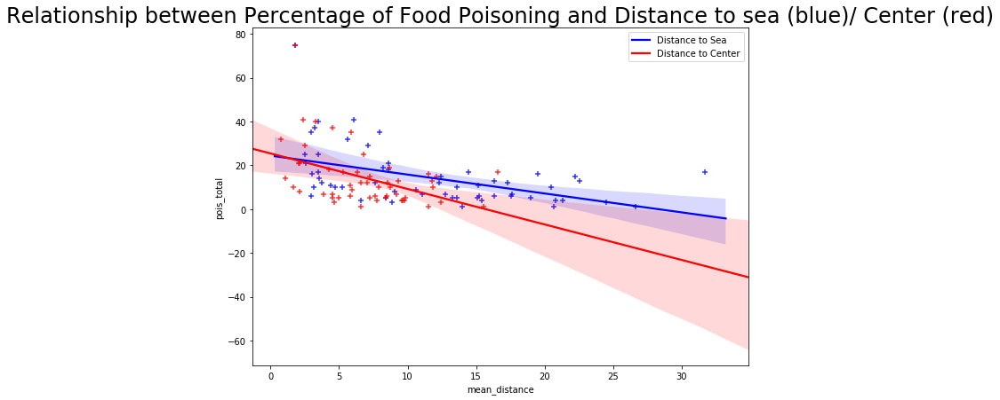

In [140]:
# plotting linear regression
fig = plt.figure(figsize=(10,7))
sns.regplot(x=DF.distance_to_sea,y=DF.pois_total,color='blue', marker='+')
sns.regplot(x=DF.mean_distance,y=DF.pois_total,color='red', marker='+')
plt.title('Relationship between Percentage of Food Poisoning and Distance to sea (blue)/ Center (red)', size=24)
plt.legend(labels=['Distance to Sea','Distance to Center'])


In [142]:
# correlation
DF.corr().pois_total

Unnamed: 0_x          -0.377675
zip                   -0.265721
mean_distance         -0.443566
facility_count         1.000000
log(facility_count)    0.839362
distance_to_sea       -0.481552
Unnamed: 0_y          -0.280122
pois_total             1.000000
total                  0.749613
proportion             0.740674
Name: pois_total, dtype: float64

We shall compare the correlations by using two methods : pearson and spearman

Spearman:

In [161]:
# correlation and p-values
len_ = DF_merge.shape[0]
print('The spearman coefficient is : ',stats.spearmanr
      (DF_merge['distance_to_sea'],DF_merge['pois_total']),'n=',len_)
print('The spearman coefficient is : ',stats.spearmanr
      (DF_center['mean_distance'],DF_center['pois_total']),'n=',len_)

The spearman coefficient is :  SpearmanrResult(correlation=-0.5358864192164994, pvalue=1.4567837494007248e-05) n= 58
The spearman coefficient is :  SpearmanrResult(correlation=-0.4394149988616711, pvalue=0.0012550159242211895) n= 58


Pearson:

In [159]:
# Pearson correlation coefficient and p-value for distance to sea
pearson_coef, p_value = stats.pearsonr(DF_merge.distance_to_sea, DF_merge.pois_total)
print(pearson_coef)

# Pearson correlation coefficient and p-value for distance to city center
pearson_coef, p_value = stats.pearsonr(DF_center.mean_distance, DF_center.pois_total)
print(pearson_coef)

-0.48155207533779965
-0.44356603445097864


The distance to the sea seems to have a slighty better correlation with the food poisoning. 

# Investigation on outliers

In [174]:
DF_merge = DF_merge.loc[DF_merge.pois_total < 60]

In [175]:
DF_center = DF_center.loc[DF_center.pois_total < 60]

In [169]:
DF = DF.loc[DF.pois_total < 60]

In [172]:
DF.corr()['pois_total']

Unnamed: 0_x          -0.340983
zip                   -0.262846
mean_distance         -0.419201
facility_count         1.000000
log(facility_count)    0.880531
distance_to_sea       -0.480219
Unnamed: 0_y          -0.244134
pois_total             1.000000
total                  0.778095
proportion             0.649267
Name: pois_total, dtype: float64

In [173]:
# correlation and p-values
len_ = DF_merge.shape[0]
print('The spearman coefficient is : ',stats.spearmanr
      (DF_merge['distance_to_sea'],DF_merge['pois_total']),'n=',len_)
print('The spearman coefficient is : ',stats.spearmanr
      (DF_center['mean_distance'],DF_center['pois_total']),'n=',len_)

The spearman coefficient is :  SpearmanrResult(correlation=-0.5109868810449532, pvalue=4.874341038047566e-05) n= 57
The spearman coefficient is :  SpearmanrResult(correlation=-0.40980186076238856, pvalue=0.0031221727341387553) n= 57


The coefficient hasn't changed much but is a little lower than before. For this reason, perhaps it is best to not consider this as an outlier.